## Imports

In [67]:
import requests
import csv
from datetime import datetime, date, time, timedelta
from dateutil import relativedelta
import os
from lxml import html
from bs4 import BeautifulSoup
import re
import json
from random import randint
from time import sleep
import pandas as pd
from collections import Counter

## Class Definitions

### Class: Artlytic


In [12]:
class Artlytic:
    def __init__(self):
        data_path = '~/Dev/artlytic/'

### Class: Wikiart

Wikiart.org provides a large amount of structured data about artists and their artworks. We're it using here to build lists of artists, whose artworks we will fetch later from auction sites like Christie's.

To build the artist list for the long 19th century we scrape a couple of links from Wikiart's *Artist - Art movements* section:
1. neoclassicism
2. romanticism
3. realism
4. impressionism
5. post-impressionism
6. cubism
7. art-nouveau
8. expressionism


The Wikiart Class offers us three methods:
```python
# fetches only impressionists
def fetch_impressionists(self):

# fetches all artists associated with the movements above
def fetch_artists_19th_early_20th(self):

# outputs artist list into file artistdata.json
def write_artist_data_into_json_file(self):
```
For the long 19th our list consists of 1010 names.

In [4]:
class Wikiart:
    '''Class to access wikiart.org Data'''
    def __init__(self):
        self.base_url = "https://www.wikiart.org/en/"
        self.base_url_api = self.base_url + "api/2/"
        self.base_url_movement = self.base_url + 'artists-by-art-movement/'
        self.artist_data_url = self.base_url_api + "UpdatedArtists"
        
    def fetch_impressionists(self):  
        url1 = self.base_url + "artists-by-art-movement/impressionism"
        url2 = self.base_url + "artists-by-art-movement/impressionism/2"
        url3 = self.base_url + "artists-by-art-movement/impressionism/3" 
        
        impressionists_list_urls = [url1, url2, url3 ]
        artist_name_list = []
        
        for url in impressionists_list_urls:        
            html = requests.get(url).text
            soup = BeautifulSoup(html, 'lxml')
            artist_name_list += [re.findall(r'>(.*?)<', str(item))[0] 
                                    for item in soup.select('.artists-list li ul li a')]
        return artist_name_list

    def fetch_artists_19th_early_20th(self):  
        
        urls = ['neoclassicism', 
                'romanticism/1', 
                'romanticism/2',
                'romanticism/3',
                'realism/1', 
                'realism/2', 
                'realism/3',
                'impressionism/1',
                'impressionism/2', 
                'impressionism/3',
                'post-impressionism/1',
                'post-impressionism/2',
                'cubism/1', 
                'cubism/2', 
                'art-nouveau/1', 
                'art-nouveau/2', 
                'expressionism/1', 
                'expressionism/1',
                'expressionism/2',
                'expressionism/3']
        
        artists_list_urls = []
        for url in urls:
            artists_list_urls.append(self.base_url_movement + url)
            
        artist_name_list = []       
        for url in artists_list_urls:        
            html = requests.get(url).text
            soup = BeautifulSoup(html, 'lxml')
            
            artist_name_list += [re.findall(r'>(.*?)<', str(item))[0] 
                                    for item in soup.select('.artists-list li ul li a')]
        
        return artist_name_list

    def write_artist_data_into_json_file(self):
        artists = requests.get(artist_data_url).json()
        all_artists = artists['data']

        with open(artlytics.data_path + 'wikiart_artist_data.json', 'w') as outfile:
            while artists['hasMore']:
                print('fetching next: pagination token',artists['paginationToken'])
                url = BASE_URL + "?paginationToken=" + artists['paginationToken']
                artists_next_page = requests.get(url).json()
                next_artists = artists_next_page['data']
                time.sleep(0.25)
                all_artists = all_artists + next_artists
                artists = artists_next_page
            
            json.dump(all_artists, outfile, indent=4)
            


### Class: Christies
Christies

In [152]:
class Christies:
    '''Class to access wikiart.org Data'''  

    def __init__(self):
        self.search_url_list = []
        self.lot_url_list = []
        self.lot_counter = 0
        self.auction_lot_list = []
        self.auction_list = []
        self.auction_company_name = 'Christies'
        self.auction_data_path = 'data_'+ self.auction_company_name.lower() +'/'
        self.auction_list_csv = self.auction_data_path + self.auction_company_name.lower() + '_auction_list.csv'
        self.fieldnames_auction_list_csv = ['auction_date', 'auction_company', 'auction_id', 'auction_url']
        self.first_auction_date = datetime(2006, 1, 1)
        self.base_url = "http://" + self.auction_company_name.lower() + ".com/"
    
    def build_auction_list(self):
        '''Creates a list of auctions until a month ago from now. If the list already exists, 
        it finds the auctions after the last existing date and adds them to the list'''
        
        # check existence of auctions list file. if not existing, create it with fieldnames header       
        if not os.path.exists(self.auction_list_csv):
            with open(self.auction_list_csv, 'w') as csvfile:
                writer = csv.writer(csvfile, delimiter='|')


        # read auction list csv into auction_list
        with open(self.auction_list_csv, 'r') as csvfile:
            reader = csv.reader(csvfile, delimiter='|')
            self.auction_list = list(reader)
        
        # if list has length = 0, nothing was scraped yet. Then start scraping with the first possible date.
        if len(self.auction_list) == 0:
            f = self.first_auction_date 
            last_entry_date = f - timedelta(days=1)
        # Otherwise read the last entry and start with the following month
        else:        
            last_entry_date = datetime.strptime(self.auction_list[-1][0], '%Y-%m-%d %H:%M:%S')

        
        today = datetime.today()
        first = today.replace(day=1)
        last_month = first - timedelta(days=1)
        next_month = last_entry_date
        
        # now build the auction list. Fetch auction list entries until last month
        while last_entry_date <= last_month.replace(day=1):
            # build the auction list url for the last fetched month +1
            url_pattern = self.base_url + "/results/?month={}&year={}&locations=&scids=7&initialpageload=false"     
            next_month = last_entry_date + relativedelta.relativedelta(months=1)
            url = url_pattern.format(next_month.month, next_month.year)
            # get the html
            try:
                # get auction list html for particullar month
                html= requests.get(url, timeout=10).text
                soup = BeautifulSoup(html, 'lxml')
            except:
                # very likely there's a connection error
                print('*** Timeout/Connection/corrupt html error. Could not fetch auctions for:',
                      next_month.year, next_month.month)

            # fetch all auction's url, id, date
            url_and_salenumber = soup.find_all('a',"sale-number", href=True )
            days = soup.find_all('span','date')
            # append auction details to auction list
            for i in range(len(days)):
                self.auction_list.append([next_month.replace(day=int(days[i].text)),
                                          self.auction_company_name,
                                          url_and_salenumber[i].text, 
                                          self.base_url + url_and_salenumber[i]['href']])
                print('added auction',url_and_salenumber[i].text, )
                
            # set parameters for next to fetch urls to the next month
            last_entry_date = last_entry_date + relativedelta.relativedelta(months=1)
            last_entry_date.replace(day=1)
        
        # write csv
        with open(self.auction_list_csv, 'w') as csvfile:
            writer = csv.writer(csvfile, delimiter='|')
            writer.writerows(self.auction_list)
        print('Saved new auctions to', self.auction_list_csv)
    
    def build_auction_details_list(self, sale):
        # check if there is a file cointaining auction details. if not, create it
        # load list
        # go to sale url
        # click load all button
        # create lot record index sale id and lot number, lot url
        pass
        
    def build_lot_details_list(self, sale, lot):
        # fetch all html
        # store to dict
        pass
    
    def process_dict(self):
        pass
        
        def build_search_url_list(self, name_of_artist_list):
        '''Takes a name of artist list as input and creates 2 searchlink per artist. The links point 
        to the search results page which is returnes when on enters a keyword into the search form.
        We are building two links: one for sorted by relevance, the second sorted by price high to low
        to gather more auction lots by an artist'''
        
        url_template_high_to_low = self.base_url + "lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry={}+{}&searchtype=p&action=sort&sortby=ehigh"
        url_template_relevance = self.base_url + "lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry={}+{}&searchtype=p&action=search"

        counter = 0
        print('Creating Search URL List .....')
        
        for name in name_of_artist_list:
            
            artist_firstname = name.split()[0]
            artist_surname = name.split()[-1]
            
            url_1 = url_template_high_to_low.format(artist_firstname,artist_surname)
            search_url_list_item_1 = { 'artist_firstname': artist_firstname, 'artist_surname': artist_surname, 'id': counter, 'has_been_scraped': False, 'url': url_1}
            self.search_url_list.append(search_url_list_item_1)
            print("Created search URL ",counter," for ", name)
            counter += 1

            url_2 = url_template_relevance.format(artist_firstname,artist_surname)
            search_url_list_item_2 = { 'artist_firstname': artist_firstname, 'artist_surname': artist_surname, 'id': counter, 'has_been_scraped': False, 'url': url_2}
            self.search_url_list.append(search_url_list_item_2)  
            print("Created search URL ",counter," for ", name)
            counter += 1
            
        print('Created Search URL List with ',counter-1, " entries!")    
     
    
    def build_lotlist_from_search_url(self, search_url_list_item):
        '''Scrape the search results page and store the lots in a file'''
        
        url =  search_url_list_item['url']
        r = requests.get(url)
        tree = html.fromstring(r.content)
        temp_url_list = tree.xpath('//div[contains(@class, "image")]/a/@href')
        
        print('Beginning to create Christie''s lot list from search URL #', search_url_list_item['id'], 'for',search_url_list_item['artist_surname'])
        for temp_lot_url in temp_url_list:
            #if bool(re.search(search_url_list_item['artist_surname'], temp_lot_url)):
            lot_url_item = {}
            lot_url_item['url'] = temp_lot_url
            lot_url_item['has_been_scraped'] = False
            lot_url_item['id'] = self.lot_counter
            m = re.match(r'.*/(.*)\?',temp_lot_url)
            if m:
                lot_url_item['sort_url'] = m.group() 
            self.lot_url_list.append(lot_url_item)
            print('Added lot url entry', lot_url_item['id'])
            self.lot_counter += 1
        print('Created lot list for',len(temp_url_list),'artworks of',search_url_list_item['artist_surname'],search_url_list_item['url'])     
    
    def fetch_single_lot_html(self, lot_url_item):
        '''Get single lots html and store it in a .html file'''     
        url = lot_url_item['url']        
        path = self.auction_data_path + str(lot_url_item['id']) + '.html'
        try:
            response = requests.get(url)
            response.raise_for_status() # ensure we notice bad responses
        except (requests.HTTPError, requests.ConnectionError):
            print("*** HTTPError or ConnectionError while accessing", url)

        with open(path, 'w') as fp:
            days = fp.write(response.text)
            print(path, "saved")

    def fetch_all_lot_data(self):
        for lot_url in self.lot_url_list:
            fetch_single_lot_data(lot_url)
            sleep(randint(1,3))

    def parse_html_and_update_list_entry(self, lot_url_item):
        '''for a given lot_url_item: finds the html file, parses, extracts the metadata, 
        adds it to the self.auction_lot_list'''
        
        # build path of local html file and load file    
        url = lot_url_item['url']        
        path = self.data_files_path + str(lot_url_item['id']) + '.html'
        
        try:
            with open(path, 'rb') as html:
                # parse the html
                parsed_item = self.parse(html)
                # add some more metadata
                parsed_item['id'] = lot_url_item['id']
                parsed_item['html_file_path'] = path
                parsed_item['url'] = lot_url_item['sort_url']
                # add to list
                self.auction_lot_list.append(parsed_item)
                lot_url_item['has_been_scraped'] = True
                print(parsed_item['id'],': Added lot',parsed_item['title'], parsed_item['secondary_title'] )
        
        except FileNotFoundError:  
            print('*** could not find file:', path)
            
    def parse_html(self, soup):
        '''parses a given html/soup and returns a dict for the lot metadata with all parsed attributes'''
        
        def extract_lot_prices(soup):
            page_content_including_prices = soup.find(id='MainContentDetails')
            pattern_for_usd_prices = re.compile(r'''
                (USD)     #currency
                \s*([\d*\,]*\d*)  #number, thousands separated with commas
                ''', re.VERBOSE)
            return pattern_for_usd_prices.findall(soup.text)
        
        def extract_created_from_description(description):
            pattern_for_created = re.compile(r'''\b
                                     (?:painted|signed|dated|executed|completed|painted|signed|circa)
                                     \b.{1,20}
                                     (\d{4})''',flags= re.IGNORECASE | re.VERBOSE )
    
            digits = pattern_for_created.findall(description) 
                      
            try:
                return int(digits[-1])
            except IndexError:
                return 0

        def extract_height_and_width_from_description(description):
            if len(re.findall(r"\D(\d*\.?\d*?)\s*x\s*(\d*\.?\d*?)\s*cm",description))>0:
                try:
                    height = float(re.findall(r"\D(\d*\.?\d*?)\s*x\s*(\d*\.?\d*?)\s*cm",description)[0][0])
                    width  = float(re.findall(r"\D(\d*\.?\d*?)\s*x\s*(\d*\.?\d*?)\s*cm",description)[0][1])
                    return height, width
                except ValueError:
                    return 0,0
            else:
                return 0,0

        # initialize dict
        lot_metadata = dict()

        # begin with assigning values to dict. 
        # if the correspnding tag doesn't exist create tag with empty string or zero

        # the easy ones
        sale = soup.find('span', id="main_center_0_lnkSaleNumber")
        lot_metadata['sale'] = "" if not sale else sale.get_text()
        
        sale_date = soup.find('span', id="saledate main_center_0_lblSaleDate")
        lot_metadata['sale_date'] = "" if not sale_date else strptime(sale_date, '%d %b %Y').date()
        
        sale_location = soup.find('span', id="main_center_0_lblSaleLocation")
        lot_metadata['sale_location'] = "" if not sale_location else sale_location.get_text()

        title = soup.find('h1', id="main_center_0_lblLotPrimaryTitle")
        lot_metadata['title'] = "" if not title else title.get_text().replace('\n','').replace('\r','')

        secondary_title = soup.find('h2', id="main_center_0_lblLotSecondaryTitle")
        lot_metadata['secondary_title'] = "" if not secondary_title else secondary_title.get_text().replace('\n','').replace('\r','')

        essay = soup.find('p', id="main_center_0_lblLotNotes")
        lot_metadata['essay'] = "" if not essay else essay.get_text().replace('\n',' ') 

        provenance = soup.find('p', id="main_center_0_lblLotProvenance")
        lot_metadata['provenance'] = "" if not provenance else provenance.get_text().replace('\n',' ').replace('\r','')

        # the more sophisticated ones
        prices = extract_lot_prices(soup)
        if len(prices) == 3:
            lot_metadata['price_realized'] = int(prices[0][1].replace(',', ''))
            lot_metadata['price_estimated_low'] = int(prices[1][1].replace(',', ''))
            lot_metadata['price_estimated_high'] = int(prices[2][1].replace(',', ''))
            lot_metadata['price_currency']= 'USD'
        else:
            lot_metadata['price_realized'] = 0
            lot_metadata['price_estimated_low'] = 0
            lot_metadata['price_estimated_high'] = 0
            lot_metadata['price_currency']= ''
            
        image_url = soup.find('img', id="imgLotImage")['src']
        if image_url and 'no-image' not in image_url:
            lot_metadata['image_url'] = image_url
        else:
            lot_metadata['image_url'] = ''

        if provenance:
            lot_metadata['provenance_estate_of'] = \
                (lot_metadata['provenance'].lower().count('estate') > 0 or 
                 lot_metadata['provenance'].lower().count('museum') > 0)
        else:
            lot_metadata['provenance_estate_of'] = 0

        exhibited = soup.find('p', id="main_center_0_lblExhibited")
        
        if exhibited:
            exhibited_text_lower          = exhibited.get_text().replace('\n',' ').replace('\r',' ').lower()
            lot_metadata['exhibited']     = exhibited.get_text().replace('\n',' ').replace('\r',' ')
            lot_metadata['count_exhibitions_in_museums'] = \
                            exhibited_text_lower.count('museum') + \
                            exhibited_text_lower.count('musée') + \
                            exhibited_text_lower.count('museo')
        else:
            lot_metadata['exhibited'] = ''
            lot_metadata['count_exhibitions_in_museums'] = 0

        description = soup.find('span', id="main_center_0_lblLotDescription")
        if description:
            description = soup.find('span', id="main_center_0_lblLotDescription").get_text().replace('\n',' ').replace('\r',' ')
            lot_metadata['description']   = description
            lot_metadata['artist_name']   = return float(re.findall(r"\D(\d*\.?\d*?)\s*x\s*(\d*\.?\d*?)\s*cm",description)[0][0])
            lot_metadata['oil_on_canvas'] = True if description.lower().count('oil on canvas') > 0 else False
            lot_metadata['height'], \
            lot_metadata['width']         = extract_height_and_width_from_description(description)
            lot_metadata['created']       = extract_created_from_description(description)

        # parsing of html completed. Add entry to list, mark it as scraped
        return lot_metadata
        

IndentationError: expected an indented block (<ipython-input-152-1c4d209eed94>, line 103)

## Main

### 1. Get the data

### Initialize
Create objects, load the list of artists of the long 19th century. The list countains about **1.000 artists**. We output the list to the file *wikiart_artists.json*

In [5]:
# Main 1
# Building List of Artists of late 19th early 20th
artlytic              = Artlytic()
christies             = Christies()
wikiart               = Wikiart()

#search_url_list       = christies.search_url_list
#lot_url_list          = christies.lot_url_list
#auction_lot_list      = christies.auction_lot_list
#auction_list          = christies.auction_list


search_url_list_path  = christies.auction_company_name.lower() + '_search_url_list.json'
lot_url_list_path     = christies.auction_company_name.lower() + '_lot_url_list.json'
auction_lot_list_path = christies.auction_company_name.lower() + '_auction_lot_list.json'

### Build a list of search URLs for web-scraping

We're using the standard search functionality of Christie's and the link of a search results page. To build the URL the first and last name are filled in into the {}s of the pattern below:
```python
url_template = "http://www.christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry={}+{}&searchtype=p&action=sort&sortby=ehigh"
url = url_template.format(artist_firstname,artist_surname)
```
We output the list to the file *christies_search_url_list.json*

In [139]:
# Main 2
# Creating search urls which will provide search result items of artworks

# load wikiart artists json file into a dictlist
artist_dictlist = {}
artist_name_list = []
with open('wikiart_artists_19th_century.json') as fp:
    artist_dictlist = json.load(fp)

# iterate the dictlist and add the artist names to a names-list
for a in artist_dictlist:
    artist_name_list.append(a['artistName'])

# build the urls
christies.build_search_url_list(artist_name_list)
with open(search_url_list_path, 'w') as fp:
    json.dump(christies.search_url_list, fp, sort_keys=True, indent=4, separators=(',', ': '))

Creating Search URL List .....
Created search URL  0  for  Ito Jakuchu
Created search URL  1  for  Ito Jakuchu
Created search URL  2  for  Joseph-Marie Vien
Created search URL  3  for  Joseph-Marie Vien
Created search URL  4  for  George Stubbs
Created search URL  5  for  George Stubbs
Created search URL  6  for  Jean-Baptiste Greuze
Created search URL  7  for  Jean-Baptiste Greuze
Created search URL  8  for  Giovanni Domenico Tiepolo
Created search URL  9  for  Giovanni Domenico Tiepolo
Created search URL  10  for  Jean-Honore Fragonard
Created search URL  11  for  Jean-Honore Fragonard
Created search URL  12  for  Hubert Robert
Created search URL  13  for  Hubert Robert
Created search URL  14  for  Paul Revere
Created search URL  15  for  Paul Revere
Created search URL  16  for  George Romney
Created search URL  17  for  George Romney
Created search URL  18  for  Dmitry Levitzky
Created search URL  19  for  Dmitry Levitzky
Created search URL  20  for  Joseph Ducreux
Created search UR

Created search URL  456  for  Frederic Leighton
Created search URL  457  for  Frederic Leighton
Created search URL  458  for  Nikolai Ge
Created search URL  459  for  Nikolai Ge
Created search URL  460  for  Henry Moore
Created search URL  461  for  Henry Moore
Created search URL  462  for  Theodor Aman
Created search URL  463  for  Theodor Aman
Created search URL  464  for  Albert Anker
Created search URL  465  for  Albert Anker
Created search URL  466  for  Peter Nicolai Arbo
Created search URL  467  for  Peter Nicolai Arbo
Created search URL  468  for  Gustave Dore
Created search URL  469  for  Gustave Dore
Created search URL  470  for  Edouard Manet
Created search URL  471  for  Edouard Manet
Created search URL  472  for  Ivan Shishkin
Created search URL  473  for  Ivan Shishkin
Created search URL  474  for  Arthur Hughes
Created search URL  475  for  Arthur Hughes
Created search URL  476  for  Lewis Carroll
Created search URL  477  for  Lewis Carroll
Created search URL  478  for  

Created search URL  1173  for  Shotei Takahashi
Created search URL  1174  for  Samuel Peploe
Created search URL  1175  for  Samuel Peploe
Created search URL  1176  for  Ipolit Strambu
Created search URL  1177  for  Ipolit Strambu
Created search URL  1178  for  Igor Grabar
Created search URL  1179  for  Igor Grabar
Created search URL  1180  for  Clarence White
Created search URL  1181  for  Clarence White
Created search URL  1182  for  Theodor Pallady
Created search URL  1183  for  Theodor Pallady
Created search URL  1184  for  Anna Ostroumova-Lebedeva
Created search URL  1185  for  Anna Ostroumova-Lebedeva
Created search URL  1186  for  Georges Rouault
Created search URL  1187  for  Georges Rouault
Created search URL  1188  for  Louis Soutter
Created search URL  1189  for  Louis Soutter
Created search URL  1190  for  Lyonel Feininger
Created search URL  1191  for  Lyonel Feininger
Created search URL  1192  for  Giacomo Balla
Created search URL  1193  for  Giacomo Balla
Created search U

### Scrape each search page and store the URLs of the individual artworks. 

Different search pages can also show duplicates of artworks. **This list countains roughly 68.000 URLs of Artworks, which will take approx. 1h to build**.

In [140]:
# Main 3
# Get the search page for a particullar artist and save the list of artworks in a list

# open the file containing the search url list and load it into search_url_list
with open(search_url_list_path) as fp:
    christies.search_url_list = json.load(fp)

# iterate through the search urls, scrape page and build artwork urls list
for search_url_list_item in christies.search_url_list:
    christies.build_lotlist_from_search_url(search_url_list_item)
    search_url_list_item['has_been_scraped'] = True
    
# write the list to lot_url_list_file   
with open(lot_url_list_path, 'w') as writer:
    json.dump(christies.lot_url_list, writer, sort_keys=True, indent=4, separators=(',', ': '))

Beginning to create Christies lot list from search URL # 0 for Jakuchu
Added lot url entry 0
Added lot url entry 1
Added lot url entry 2
Added lot url entry 3
Added lot url entry 4
Added lot url entry 5
Added lot url entry 6
Added lot url entry 7
Added lot url entry 8
Added lot url entry 9
Added lot url entry 10
Added lot url entry 11
Added lot url entry 12
Added lot url entry 13
Added lot url entry 14
Added lot url entry 15
Added lot url entry 16
Added lot url entry 17
Added lot url entry 18
Added lot url entry 19
Added lot url entry 20
Added lot url entry 21
Added lot url entry 22
Added lot url entry 23
Added lot url entry 24
Added lot url entry 25
Added lot url entry 26
Added lot url entry 27
Added lot url entry 28
Added lot url entry 29
Created lot list for 30 artworks of Jakuchu http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Ito+Jakuchu&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1 for Jakuchu
Adde

Beginning to create Christies lot list from search URL # 10 for Fragonard
Added lot url entry 264
Added lot url entry 265
Added lot url entry 266
Added lot url entry 267
Added lot url entry 268
Added lot url entry 269
Added lot url entry 270
Added lot url entry 271
Added lot url entry 272
Added lot url entry 273
Added lot url entry 274
Added lot url entry 275
Added lot url entry 276
Added lot url entry 277
Added lot url entry 278
Added lot url entry 279
Added lot url entry 280
Added lot url entry 281
Created lot list for 18 artworks of Fragonard http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Jean-Honore+Fragonard&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 11 for Fragonard
Added lot url entry 282
Added lot url entry 283
Added lot url entry 284
Added lot url entry 285
Added lot url entry 286
Added lot url entry 287
Added lot url entry 288
Added lot url entry 289
Added lot url entry 290
Added lot url entr

Beginning to create Christies lot list from search URL # 21 for Ducreux
Added lot url entry 498
Added lot url entry 499
Added lot url entry 500
Added lot url entry 501
Added lot url entry 502
Added lot url entry 503
Created lot list for 6 artworks of Ducreux http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Joseph+Ducreux&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 22 for Rokotov
Added lot url entry 504
Added lot url entry 505
Added lot url entry 506
Added lot url entry 507
Added lot url entry 508
Added lot url entry 509
Added lot url entry 510
Added lot url entry 511
Added lot url entry 512
Added lot url entry 513
Added lot url entry 514
Added lot url entry 515
Added lot url entry 516
Added lot url entry 517
Added lot url entry 518
Added lot url entry 519
Added lot url entry 520
Added lot url entry 521
Added lot url entry 522
Added lot url entry 523
Added lot url entry 524
Added lot url entry 525
Added lot url entr

Beginning to create Christies lot list from search URL # 32 for Barry
Added lot url entry 768
Added lot url entry 769
Added lot url entry 770
Added lot url entry 771
Added lot url entry 772
Added lot url entry 773
Added lot url entry 774
Added lot url entry 775
Added lot url entry 776
Added lot url entry 777
Added lot url entry 778
Added lot url entry 779
Added lot url entry 780
Added lot url entry 781
Added lot url entry 782
Added lot url entry 783
Added lot url entry 784
Added lot url entry 785
Created lot list for 18 artworks of Barry http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=James+Barry&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 33 for Barry
Added lot url entry 786
Added lot url entry 787
Added lot url entry 788
Added lot url entry 789
Added lot url entry 790
Added lot url entry 791
Added lot url entry 792
Added lot url entry 793
Added lot url entry 794
Added lot url entry 795
Added lot url en

Beginning to create Christies lot list from search URL # 41 for Vallayer-Coster
Added lot url entry 1026
Added lot url entry 1027
Added lot url entry 1028
Added lot url entry 1029
Added lot url entry 1030
Added lot url entry 1031
Added lot url entry 1032
Added lot url entry 1033
Added lot url entry 1034
Added lot url entry 1035
Added lot url entry 1036
Added lot url entry 1037
Added lot url entry 1038
Added lot url entry 1039
Added lot url entry 1040
Added lot url entry 1041
Added lot url entry 1042
Added lot url entry 1043
Added lot url entry 1044
Added lot url entry 1045
Added lot url entry 1046
Added lot url entry 1047
Added lot url entry 1048
Added lot url entry 1049
Added lot url entry 1050
Added lot url entry 1051
Added lot url entry 1052
Added lot url entry 1053
Added lot url entry 1054
Added lot url entry 1055
Created lot list for 30 artworks of Vallayer-Coster http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Anne+Vallayer-Coster&searchtype=p&act

Beginning to create Christies lot list from search URL # 51 for Lorentzen
Added lot url entry 1278
Added lot url entry 1279
Added lot url entry 1280
Added lot url entry 1281
Added lot url entry 1282
Added lot url entry 1283
Added lot url entry 1284
Added lot url entry 1285
Added lot url entry 1286
Added lot url entry 1287
Added lot url entry 1288
Added lot url entry 1289
Added lot url entry 1290
Added lot url entry 1291
Added lot url entry 1292
Added lot url entry 1293
Added lot url entry 1294
Added lot url entry 1295
Created lot list for 18 artworks of Lorentzen http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Christian+Lorentzen&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 52 for Sengai
Added lot url entry 1296
Added lot url entry 1297
Added lot url entry 1298
Added lot url entry 1299
Added lot url entry 1300
Added lot url entry 1301
Added lot url entry 1302
Added lot url entry 1303
Added lot url entry 1304
Added 

Beginning to create Christies lot list from search URL # 61 for Campeche
Added lot url entry 1512
Added lot url entry 1513
Added lot url entry 1514
Added lot url entry 1515
Added lot url entry 1516
Added lot url entry 1517
Added lot url entry 1518
Added lot url entry 1519
Added lot url entry 1520
Added lot url entry 1521
Added lot url entry 1522
Added lot url entry 1523
Added lot url entry 1524
Added lot url entry 1525
Added lot url entry 1526
Added lot url entry 1527
Added lot url entry 1528
Added lot url entry 1529
Added lot url entry 1530
Added lot url entry 1531
Added lot url entry 1532
Added lot url entry 1533
Added lot url entry 1534
Added lot url entry 1535
Added lot url entry 1536
Added lot url entry 1537
Added lot url entry 1538
Added lot url entry 1539
Added lot url entry 1540
Added lot url entry 1541
Created lot list for 30 artworks of Campeche http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Jose+Campeche&searchtype=p&action=search
Beginning 

Beginning to create Christies lot list from search URL # 71 for Stuart
Added lot url entry 1764
Added lot url entry 1765
Added lot url entry 1766
Added lot url entry 1767
Added lot url entry 1768
Added lot url entry 1769
Added lot url entry 1770
Added lot url entry 1771
Added lot url entry 1772
Added lot url entry 1773
Added lot url entry 1774
Added lot url entry 1775
Added lot url entry 1776
Added lot url entry 1777
Added lot url entry 1778
Added lot url entry 1779
Added lot url entry 1780
Added lot url entry 1781
Added lot url entry 1782
Added lot url entry 1783
Added lot url entry 1784
Added lot url entry 1785
Added lot url entry 1786
Added lot url entry 1787
Added lot url entry 1788
Added lot url entry 1789
Added lot url entry 1790
Added lot url entry 1791
Added lot url entry 1792
Added lot url entry 1793
Created lot list for 30 artworks of Stuart http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Gilbert+Stuart&searchtype=p&action=search
Beginning to 

Beginning to create Christies lot list from search URL # 82 for Borovikovsky
Added lot url entry 1998
Added lot url entry 1999
Added lot url entry 2000
Added lot url entry 2001
Added lot url entry 2002
Added lot url entry 2003
Added lot url entry 2004
Added lot url entry 2005
Added lot url entry 2006
Added lot url entry 2007
Added lot url entry 2008
Added lot url entry 2009
Added lot url entry 2010
Added lot url entry 2011
Added lot url entry 2012
Added lot url entry 2013
Added lot url entry 2014
Added lot url entry 2015
Created lot list for 18 artworks of Borovikovsky http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Vladimir+Borovikovsky&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 83 for Borovikovsky
Added lot url entry 2016
Added lot url entry 2017
Added lot url entry 2018
Added lot url entry 2019
Added lot url entry 2020
Added lot url entry 2021
Added lot url entry 2022
Added lot url entry 2023
Added l

Beginning to create Christies lot list from search URL # 85 for Canova
Added lot url entry 2785
Added lot url entry 2786
Added lot url entry 2787
Added lot url entry 2788
Added lot url entry 2789
Added lot url entry 2790
Added lot url entry 2791
Added lot url entry 2792
Added lot url entry 2793
Added lot url entry 2794
Added lot url entry 2795
Added lot url entry 2796
Added lot url entry 2797
Added lot url entry 2798
Added lot url entry 2799
Added lot url entry 2800
Added lot url entry 2801
Added lot url entry 2802
Added lot url entry 2803
Added lot url entry 2804
Added lot url entry 2805
Added lot url entry 2806
Added lot url entry 2807
Added lot url entry 2808
Added lot url entry 2809
Added lot url entry 2810
Added lot url entry 2811
Added lot url entry 2812
Added lot url entry 2813
Added lot url entry 2814
Created lot list for 30 artworks of Canova http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Antonio+Canova&searchtype=p&action=search
Beginning to 

Beginning to create Christies lot list from search URL # 94 for Ataíde
Created lot list for 0 artworks of Ataíde http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Mestre+Ataíde&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 95 for Ataíde
Created lot list for 0 artworks of Ataíde http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Mestre+Ataíde&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 96 for Johnson
Added lot url entry 3043
Added lot url entry 3044
Added lot url entry 3045
Added lot url entry 3046
Added lot url entry 3047
Added lot url entry 3048
Added lot url entry 3049
Added lot url entry 3050
Added lot url entry 3051
Added lot url entry 3052
Added lot url entry 3053
Added lot url entry 3054
Added lot url entry 3055
Added lot url entry 3056
Added lot url entry 3057
Added lot url entry 3058
Added lot url entry 3059
Added lot url entry 306

Beginning to create Christies lot list from search URL # 105 for Glover
Added lot url entry 3265
Added lot url entry 3266
Added lot url entry 3267
Added lot url entry 3268
Added lot url entry 3269
Added lot url entry 3270
Added lot url entry 3271
Added lot url entry 3272
Added lot url entry 3273
Added lot url entry 3274
Added lot url entry 3275
Added lot url entry 3276
Added lot url entry 3277
Added lot url entry 3278
Added lot url entry 3279
Added lot url entry 3280
Added lot url entry 3281
Added lot url entry 3282
Added lot url entry 3283
Added lot url entry 3284
Added lot url entry 3285
Added lot url entry 3286
Added lot url entry 3287
Added lot url entry 3288
Added lot url entry 3289
Added lot url entry 3290
Added lot url entry 3291
Added lot url entry 3292
Added lot url entry 3293
Added lot url entry 3294
Created lot list for 30 artworks of Glover http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=John+Glover&searchtype=p&action=search
Beginning to cr

Beginning to create Christies lot list from search URL # 114 for Toyokuni
Added lot url entry 3511
Added lot url entry 3512
Added lot url entry 3513
Added lot url entry 3514
Added lot url entry 3515
Added lot url entry 3516
Added lot url entry 3517
Added lot url entry 3518
Added lot url entry 3519
Added lot url entry 3520
Added lot url entry 3521
Added lot url entry 3522
Added lot url entry 3523
Added lot url entry 3524
Added lot url entry 3525
Added lot url entry 3526
Added lot url entry 3527
Added lot url entry 3528
Added lot url entry 3529
Added lot url entry 3530
Added lot url entry 3531
Added lot url entry 3532
Added lot url entry 3533
Added lot url entry 3534
Added lot url entry 3535
Added lot url entry 3536
Added lot url entry 3537
Added lot url entry 3538
Added lot url entry 3539
Added lot url entry 3540
Created lot list for 30 artworks of Toyokuni http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Utagawa+Toyokuni&searchtype=p&action=sort&sortby=eh

Beginning to create Christies lot list from search URL # 118 for Ward
Added lot url entry 4346
Added lot url entry 4347
Added lot url entry 4348
Added lot url entry 4349
Added lot url entry 4350
Added lot url entry 4351
Added lot url entry 4352
Added lot url entry 4353
Added lot url entry 4354
Added lot url entry 4355
Added lot url entry 4356
Added lot url entry 4357
Added lot url entry 4358
Added lot url entry 4359
Added lot url entry 4360
Added lot url entry 4361
Added lot url entry 4362
Added lot url entry 4363
Added lot url entry 4364
Added lot url entry 4365
Added lot url entry 4366
Added lot url entry 4367
Added lot url entry 4368
Added lot url entry 4369
Added lot url entry 4370
Added lot url entry 4371
Added lot url entry 4372
Added lot url entry 4373
Added lot url entry 4374
Added lot url entry 4375
Created lot list for 30 artworks of Ward http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=James+Ward&searchtype=p&action=sort&sortby=ehigh
Beginning 

Beginning to create Christies lot list from search URL # 127 for Turner
Added lot url entry 4616
Added lot url entry 4617
Added lot url entry 4618
Added lot url entry 4619
Added lot url entry 4620
Added lot url entry 4621
Added lot url entry 4622
Added lot url entry 4623
Added lot url entry 4624
Added lot url entry 4625
Added lot url entry 4626
Added lot url entry 4627
Added lot url entry 4628
Added lot url entry 4629
Added lot url entry 4630
Added lot url entry 4631
Added lot url entry 4632
Added lot url entry 4633
Added lot url entry 4634
Added lot url entry 4635
Added lot url entry 4636
Added lot url entry 4637
Added lot url entry 4638
Added lot url entry 4639
Added lot url entry 4640
Added lot url entry 4641
Added lot url entry 4642
Added lot url entry 4643
Added lot url entry 4644
Added lot url entry 4645
Created lot list for 30 artworks of Turner http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Charles+Turner&searchtype=p&action=search
Beginning to

Beginning to create Christies lot list from search URL # 133 for Girtin
Added lot url entry 5507
Added lot url entry 5508
Added lot url entry 5509
Added lot url entry 5510
Added lot url entry 5511
Added lot url entry 5512
Created lot list for 6 artworks of Girtin http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Thomas+Girtin&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 134 for Turner
Added lot url entry 5513
Added lot url entry 5514
Added lot url entry 5515
Added lot url entry 5516
Added lot url entry 5517
Added lot url entry 5518
Added lot url entry 5519
Added lot url entry 5520
Added lot url entry 5521
Added lot url entry 5522
Added lot url entry 5523
Added lot url entry 5524
Added lot url entry 5525
Added lot url entry 5526
Added lot url entry 5527
Added lot url entry 5528
Added lot url entry 5529
Added lot url entry 5530
Added lot url entry 5531
Added lot url entry 5532
Added lot url entry 5533
Added lot url ent

Beginning to create Christies lot list from search URL # 137 for Tropinin
Added lot url entry 6297
Added lot url entry 6298
Added lot url entry 6299
Added lot url entry 6300
Added lot url entry 6301
Added lot url entry 6302
Added lot url entry 6303
Added lot url entry 6304
Added lot url entry 6305
Added lot url entry 6306
Added lot url entry 6307
Added lot url entry 6308
Added lot url entry 6309
Added lot url entry 6310
Added lot url entry 6311
Added lot url entry 6312
Added lot url entry 6313
Added lot url entry 6314
Added lot url entry 6315
Added lot url entry 6316
Added lot url entry 6317
Added lot url entry 6318
Added lot url entry 6319
Added lot url entry 6320
Added lot url entry 6321
Added lot url entry 6322
Added lot url entry 6323
Added lot url entry 6324
Added lot url entry 6325
Added lot url entry 6326
Created lot list for 30 artworks of Tropinin http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Vasily+Tropinin&searchtype=p&action=search
Beginni

Beginning to create Christies lot list from search URL # 146 for Jackson
Added lot url entry 6543
Added lot url entry 6544
Added lot url entry 6545
Added lot url entry 6546
Added lot url entry 6547
Added lot url entry 6548
Added lot url entry 6549
Added lot url entry 6550
Added lot url entry 6551
Added lot url entry 6552
Added lot url entry 6553
Added lot url entry 6554
Added lot url entry 6555
Added lot url entry 6556
Added lot url entry 6557
Added lot url entry 6558
Added lot url entry 6559
Added lot url entry 6560
Created lot list for 18 artworks of Jackson http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=John+Jackson&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 147 for Jackson
Added lot url entry 6561
Added lot url entry 6562
Added lot url entry 6563
Added lot url entry 6564
Added lot url entry 6565
Added lot url entry 6566
Added lot url entry 6567
Added lot url entry 6568
Added lot url entry 6569
Adde

Beginning to create Christies lot list from search URL # 158 for Ingres
Added lot url entry 6771
Added lot url entry 6772
Added lot url entry 6773
Added lot url entry 6774
Added lot url entry 6775
Added lot url entry 6776
Added lot url entry 6777
Added lot url entry 6778
Added lot url entry 6779
Added lot url entry 6780
Added lot url entry 6781
Added lot url entry 6782
Added lot url entry 6783
Added lot url entry 6784
Added lot url entry 6785
Added lot url entry 6786
Added lot url entry 6787
Added lot url entry 6788
Added lot url entry 6789
Added lot url entry 6790
Added lot url entry 6791
Added lot url entry 6792
Added lot url entry 6793
Added lot url entry 6794
Added lot url entry 6795
Added lot url entry 6796
Added lot url entry 6797
Added lot url entry 6798
Added lot url entry 6799
Added lot url entry 6800
Created lot list for 30 artworks of Ingres http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Jean+Ingres&searchtype=p&action=sort&sortby=ehigh
Begin

Beginning to create Christies lot list from search URL # 168 for Cox
Added lot url entry 7011
Added lot url entry 7012
Added lot url entry 7013
Added lot url entry 7014
Added lot url entry 7015
Added lot url entry 7016
Added lot url entry 7017
Added lot url entry 7018
Added lot url entry 7019
Added lot url entry 7020
Added lot url entry 7021
Added lot url entry 7022
Added lot url entry 7023
Added lot url entry 7024
Added lot url entry 7025
Added lot url entry 7026
Added lot url entry 7027
Added lot url entry 7028
Added lot url entry 7029
Added lot url entry 7030
Added lot url entry 7031
Added lot url entry 7032
Added lot url entry 7033
Added lot url entry 7034
Added lot url entry 7035
Added lot url entry 7036
Added lot url entry 7037
Added lot url entry 7038
Added lot url entry 7039
Added lot url entry 7040
Created lot list for 30 artworks of Cox http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=David+Cox&searchtype=p&action=sort&sortby=ehigh
Beginning to 

Beginning to create Christies lot list from search URL # 174 for Wilkie
Added lot url entry 7943
Added lot url entry 7944
Added lot url entry 7945
Added lot url entry 7946
Added lot url entry 7947
Added lot url entry 7948
Added lot url entry 7949
Added lot url entry 7950
Added lot url entry 7951
Added lot url entry 7952
Added lot url entry 7953
Added lot url entry 7954
Added lot url entry 7955
Added lot url entry 7956
Added lot url entry 7957
Added lot url entry 7958
Added lot url entry 7959
Added lot url entry 7960
Created lot list for 18 artworks of Wilkie http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=David+Wilkie&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 175 for Wilkie
Added lot url entry 7961
Added lot url entry 7962
Added lot url entry 7963
Added lot url entry 7964
Added lot url entry 7965
Added lot url entry 7966
Added lot url entry 7967
Added lot url entry 7968
Added lot url entry 7969
Added l

Beginning to create Christies lot list from search URL # 186 for Shayer
Added lot url entry 8171
Added lot url entry 8172
Added lot url entry 8173
Added lot url entry 8174
Added lot url entry 8175
Added lot url entry 8176
Added lot url entry 8177
Added lot url entry 8178
Added lot url entry 8179
Added lot url entry 8180
Added lot url entry 8181
Added lot url entry 8182
Added lot url entry 8183
Added lot url entry 8184
Added lot url entry 8185
Added lot url entry 8186
Added lot url entry 8187
Added lot url entry 8188
Created lot list for 18 artworks of Shayer http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=William+Shayer&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 187 for Shayer
Added lot url entry 8189
Added lot url entry 8190
Added lot url entry 8191
Added lot url entry 8192
Added lot url entry 8193
Added lot url entry 8194
Added lot url entry 8195
Added lot url entry 8196
Added lot url entry 8197
Added

Beginning to create Christies lot list from search URL # 195 for Vernet
Added lot url entry 8417
Added lot url entry 8418
Added lot url entry 8419
Added lot url entry 8420
Added lot url entry 8421
Added lot url entry 8422
Added lot url entry 8423
Added lot url entry 8424
Added lot url entry 8425
Added lot url entry 8426
Added lot url entry 8427
Added lot url entry 8428
Added lot url entry 8429
Added lot url entry 8430
Added lot url entry 8431
Added lot url entry 8432
Added lot url entry 8433
Added lot url entry 8434
Added lot url entry 8435
Added lot url entry 8436
Added lot url entry 8437
Added lot url entry 8438
Added lot url entry 8439
Added lot url entry 8440
Added lot url entry 8441
Added lot url entry 8442
Added lot url entry 8443
Added lot url entry 8444
Added lot url entry 8445
Added lot url entry 8446
Created lot list for 30 artworks of Vernet http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Horace+Vernet&searchtype=p&action=search
Beginning to 

Beginning to create Christies lot list from search URL # 204 for Gericault
Added lot url entry 8663
Added lot url entry 8664
Added lot url entry 8665
Added lot url entry 8666
Added lot url entry 8667
Added lot url entry 8668
Added lot url entry 8669
Added lot url entry 8670
Added lot url entry 8671
Added lot url entry 8672
Added lot url entry 8673
Added lot url entry 8674
Added lot url entry 8675
Added lot url entry 8676
Added lot url entry 8677
Added lot url entry 8678
Added lot url entry 8679
Added lot url entry 8680
Added lot url entry 8681
Added lot url entry 8682
Added lot url entry 8683
Added lot url entry 8684
Added lot url entry 8685
Added lot url entry 8686
Added lot url entry 8687
Added lot url entry 8688
Added lot url entry 8689
Added lot url entry 8690
Added lot url entry 8691
Added lot url entry 8692
Created lot list for 30 artworks of Gericault http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Theodore+Gericault&searchtype=p&action=sort&sortb

Beginning to create Christies lot list from search URL # 216 for Roberts
Added lot url entry 8879
Added lot url entry 8880
Added lot url entry 8881
Added lot url entry 8882
Added lot url entry 8883
Added lot url entry 8884
Added lot url entry 8885
Added lot url entry 8886
Added lot url entry 8887
Added lot url entry 8888
Added lot url entry 8889
Added lot url entry 8890
Added lot url entry 8891
Added lot url entry 8892
Added lot url entry 8893
Added lot url entry 8894
Added lot url entry 8895
Added lot url entry 8896
Added lot url entry 8897
Added lot url entry 8898
Added lot url entry 8899
Added lot url entry 8900
Added lot url entry 8901
Added lot url entry 8902
Added lot url entry 8903
Added lot url entry 8904
Added lot url entry 8905
Added lot url entry 8906
Added lot url entry 8907
Added lot url entry 8908
Created lot list for 30 artworks of Roberts http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=David+Roberts&searchtype=p&action=sort&sortby=ehigh
B

Beginning to create Christies lot list from search URL # 226 for Bryullov
Added lot url entry 9119
Added lot url entry 9120
Added lot url entry 9121
Added lot url entry 9122
Added lot url entry 9123
Added lot url entry 9124
Added lot url entry 9125
Added lot url entry 9126
Added lot url entry 9127
Added lot url entry 9128
Added lot url entry 9129
Added lot url entry 9130
Added lot url entry 9131
Added lot url entry 9132
Added lot url entry 9133
Added lot url entry 9134
Added lot url entry 9135
Added lot url entry 9136
Added lot url entry 9137
Added lot url entry 9138
Added lot url entry 9139
Added lot url entry 9140
Added lot url entry 9141
Added lot url entry 9142
Added lot url entry 9143
Added lot url entry 9144
Added lot url entry 9145
Added lot url entry 9146
Added lot url entry 9147
Added lot url entry 9148
Created lot list for 30 artworks of Bryullov http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Karl+Bryullov&searchtype=p&action=sort&sortby=ehigh

Beginning to create Christies lot list from search URL # 235 for Solntsev
Added lot url entry 9365
Added lot url entry 9366
Added lot url entry 9367
Added lot url entry 9368
Added lot url entry 9369
Added lot url entry 9370
Added lot url entry 9371
Added lot url entry 9372
Added lot url entry 9373
Added lot url entry 9374
Added lot url entry 9375
Added lot url entry 9376
Added lot url entry 9377
Added lot url entry 9378
Added lot url entry 9379
Added lot url entry 9380
Added lot url entry 9381
Added lot url entry 9382
Added lot url entry 9383
Added lot url entry 9384
Added lot url entry 9385
Added lot url entry 9386
Added lot url entry 9387
Added lot url entry 9388
Added lot url entry 9389
Added lot url entry 9390
Added lot url entry 9391
Added lot url entry 9392
Added lot url entry 9393
Added lot url entry 9394
Created lot list for 30 artworks of Solntsev http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Fyodor+Solntsev&searchtype=p&action=search
Beginni

Beginning to create Christies lot list from search URL # 245 for Guys
Added lot url entry 9605
Added lot url entry 9606
Added lot url entry 9607
Added lot url entry 9608
Added lot url entry 9609
Added lot url entry 9610
Added lot url entry 9611
Added lot url entry 9612
Added lot url entry 9613
Added lot url entry 9614
Added lot url entry 9615
Added lot url entry 9616
Added lot url entry 9617
Added lot url entry 9618
Added lot url entry 9619
Added lot url entry 9620
Added lot url entry 9621
Added lot url entry 9622
Created lot list for 18 artworks of Guys http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Constantin+Guys&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 246 for Gavarni
Added lot url entry 9623
Added lot url entry 9624
Added lot url entry 9625
Added lot url entry 9626
Added lot url entry 9627
Added lot url entry 9628
Added lot url entry 9629
Added lot url entry 9630
Added lot url entry 9631
Added lot url ent

Beginning to create Christies lot list from search URL # 256 for Harvey
Added lot url entry 10549
Added lot url entry 10550
Added lot url entry 10551
Added lot url entry 10552
Added lot url entry 10553
Added lot url entry 10554
Added lot url entry 10555
Added lot url entry 10556
Added lot url entry 10557
Added lot url entry 10558
Added lot url entry 10559
Added lot url entry 10560
Added lot url entry 10561
Added lot url entry 10562
Added lot url entry 10563
Added lot url entry 10564
Added lot url entry 10565
Added lot url entry 10566
Added lot url entry 10567
Added lot url entry 10568
Added lot url entry 10569
Added lot url entry 10570
Added lot url entry 10571
Added lot url entry 10572
Added lot url entry 10573
Added lot url entry 10574
Added lot url entry 10575
Added lot url entry 10576
Added lot url entry 10577
Added lot url entry 10578
Created lot list for 30 artworks of Harvey http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=George+Harvey&searchtype=

Beginning to create Christies lot list from search URL # 265 for Zeshin
Added lot url entry 10795
Added lot url entry 10796
Added lot url entry 10797
Added lot url entry 10798
Added lot url entry 10799
Added lot url entry 10800
Added lot url entry 10801
Added lot url entry 10802
Added lot url entry 10803
Added lot url entry 10804
Added lot url entry 10805
Added lot url entry 10806
Added lot url entry 10807
Added lot url entry 10808
Added lot url entry 10809
Added lot url entry 10810
Added lot url entry 10811
Added lot url entry 10812
Added lot url entry 10813
Added lot url entry 10814
Added lot url entry 10815
Added lot url entry 10816
Added lot url entry 10817
Added lot url entry 10818
Added lot url entry 10819
Added lot url entry 10820
Added lot url entry 10821
Added lot url entry 10822
Added lot url entry 10823
Added lot url entry 10824
Created lot list for 30 artworks of Zeshin http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Shibata+Zeshin&searchtyp

Beginning to create Christies lot list from search URL # 271 for Spitzweg
Added lot url entry 11762
Added lot url entry 11763
Added lot url entry 11764
Added lot url entry 11765
Added lot url entry 11766
Added lot url entry 11767
Added lot url entry 11768
Added lot url entry 11769
Added lot url entry 11770
Added lot url entry 11771
Added lot url entry 11772
Added lot url entry 11773
Added lot url entry 11774
Added lot url entry 11775
Added lot url entry 11776
Added lot url entry 11777
Added lot url entry 11778
Added lot url entry 11779
Added lot url entry 11780
Added lot url entry 11781
Added lot url entry 11782
Added lot url entry 11783
Added lot url entry 11784
Added lot url entry 11785
Added lot url entry 11786
Added lot url entry 11787
Added lot url entry 11788
Added lot url entry 11789
Added lot url entry 11790
Added lot url entry 11791
Created lot list for 30 artworks of Spitzweg http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Carl+Spitzweg&search

Beginning to create Christies lot list from search URL # 281 for Barabas
Added lot url entry 12014
Added lot url entry 12015
Added lot url entry 12016
Added lot url entry 12017
Added lot url entry 12018
Added lot url entry 12019
Added lot url entry 12020
Added lot url entry 12021
Added lot url entry 12022
Added lot url entry 12023
Added lot url entry 12024
Added lot url entry 12025
Added lot url entry 12026
Added lot url entry 12027
Added lot url entry 12028
Added lot url entry 12029
Added lot url entry 12030
Added lot url entry 12031
Added lot url entry 12032
Added lot url entry 12033
Added lot url entry 12034
Added lot url entry 12035
Added lot url entry 12036
Added lot url entry 12037
Added lot url entry 12038
Added lot url entry 12039
Added lot url entry 12040
Added lot url entry 12041
Added lot url entry 12042
Added lot url entry 12043
Created lot list for 30 artworks of Barabas http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Miklos+Barabas&searcht

Beginning to create Christies lot list from search URL # 291 for Bingham
Added lot url entry 12266
Added lot url entry 12267
Added lot url entry 12268
Added lot url entry 12269
Added lot url entry 12270
Added lot url entry 12271
Added lot url entry 12272
Added lot url entry 12273
Added lot url entry 12274
Added lot url entry 12275
Added lot url entry 12276
Added lot url entry 12277
Added lot url entry 12278
Added lot url entry 12279
Added lot url entry 12280
Added lot url entry 12281
Added lot url entry 12282
Added lot url entry 12283
Added lot url entry 12284
Added lot url entry 12285
Added lot url entry 12286
Added lot url entry 12287
Added lot url entry 12288
Added lot url entry 12289
Added lot url entry 12290
Added lot url entry 12291
Added lot url entry 12292
Added lot url entry 12293
Added lot url entry 12294
Added lot url entry 12295
Created lot list for 30 artworks of Bingham http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=George+Bingham&searcht

Beginning to create Christies lot list from search URL # 301 for Rousseau
Added lot url entry 12518
Added lot url entry 12519
Added lot url entry 12520
Added lot url entry 12521
Added lot url entry 12522
Added lot url entry 12523
Added lot url entry 12524
Added lot url entry 12525
Added lot url entry 12526
Added lot url entry 12527
Added lot url entry 12528
Added lot url entry 12529
Added lot url entry 12530
Added lot url entry 12531
Added lot url entry 12532
Added lot url entry 12533
Added lot url entry 12534
Added lot url entry 12535
Added lot url entry 12536
Added lot url entry 12537
Added lot url entry 12538
Added lot url entry 12539
Added lot url entry 12540
Added lot url entry 12541
Added lot url entry 12542
Added lot url entry 12543
Added lot url entry 12544
Added lot url entry 12545
Added lot url entry 12546
Added lot url entry 12547
Created lot list for 30 artworks of Rousseau http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Theodore+Rousseau&se

Beginning to create Christies lot list from search URL # 310 for Millet
Added lot url entry 12752
Added lot url entry 12753
Added lot url entry 12754
Added lot url entry 12755
Added lot url entry 12756
Added lot url entry 12757
Added lot url entry 12758
Added lot url entry 12759
Added lot url entry 12760
Added lot url entry 12761
Added lot url entry 12762
Added lot url entry 12763
Added lot url entry 12764
Added lot url entry 12765
Added lot url entry 12766
Added lot url entry 12767
Added lot url entry 12768
Added lot url entry 12769
Added lot url entry 12770
Added lot url entry 12771
Added lot url entry 12772
Added lot url entry 12773
Added lot url entry 12774
Added lot url entry 12775
Added lot url entry 12776
Added lot url entry 12777
Added lot url entry 12778
Added lot url entry 12779
Added lot url entry 12780
Added lot url entry 12781
Created lot list for 30 artworks of Millet http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Jean-Francois+Millet&sear

Beginning to create Christies lot list from search URL # 319 for Fedotov
Added lot url entry 12986
Added lot url entry 12987
Added lot url entry 12988
Added lot url entry 12989
Added lot url entry 12990
Added lot url entry 12991
Added lot url entry 12992
Added lot url entry 12993
Added lot url entry 12994
Added lot url entry 12995
Added lot url entry 12996
Added lot url entry 12997
Added lot url entry 12998
Added lot url entry 12999
Added lot url entry 13000
Added lot url entry 13001
Added lot url entry 13002
Added lot url entry 13003
Added lot url entry 13004
Added lot url entry 13005
Added lot url entry 13006
Added lot url entry 13007
Added lot url entry 13008
Added lot url entry 13009
Added lot url entry 13010
Added lot url entry 13011
Added lot url entry 13012
Added lot url entry 13013
Added lot url entry 13014
Added lot url entry 13015
Created lot list for 30 artworks of Fedotov http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Pavel+Fedotov&searchty

Beginning to create Christies lot list from search URL # 328 for Daubigny
Added lot url entry 13244
Added lot url entry 13245
Added lot url entry 13246
Added lot url entry 13247
Added lot url entry 13248
Added lot url entry 13249
Added lot url entry 13250
Added lot url entry 13251
Added lot url entry 13252
Added lot url entry 13253
Added lot url entry 13254
Added lot url entry 13255
Added lot url entry 13256
Added lot url entry 13257
Added lot url entry 13258
Added lot url entry 13259
Added lot url entry 13260
Added lot url entry 13261
Added lot url entry 13262
Added lot url entry 13263
Added lot url entry 13264
Added lot url entry 13265
Added lot url entry 13266
Added lot url entry 13267
Added lot url entry 13268
Added lot url entry 13269
Added lot url entry 13270
Added lot url entry 13271
Added lot url entry 13272
Added lot url entry 13273
Created lot list for 30 artworks of Daubigny http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Charles-Francois+Daub

Beginning to create Christies lot list from search URL # 337 for Leech
Added lot url entry 13502
Added lot url entry 13503
Added lot url entry 13504
Added lot url entry 13505
Added lot url entry 13506
Added lot url entry 13507
Added lot url entry 13508
Added lot url entry 13509
Added lot url entry 13510
Added lot url entry 13511
Added lot url entry 13512
Added lot url entry 13513
Added lot url entry 13514
Added lot url entry 13515
Added lot url entry 13516
Added lot url entry 13517
Added lot url entry 13518
Added lot url entry 13519
Added lot url entry 13520
Added lot url entry 13521
Added lot url entry 13522
Added lot url entry 13523
Added lot url entry 13524
Added lot url entry 13525
Added lot url entry 13526
Added lot url entry 13527
Added lot url entry 13528
Added lot url entry 13529
Added lot url entry 13530
Added lot url entry 13531
Created lot list for 30 artworks of Leech http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=John+Leech&searchtype=p&ac

Beginning to create Christies lot list from search URL # 346 for Hamilton
Added lot url entry 13748
Added lot url entry 13749
Added lot url entry 13750
Added lot url entry 13751
Added lot url entry 13752
Added lot url entry 13753
Added lot url entry 13754
Added lot url entry 13755
Added lot url entry 13756
Added lot url entry 13757
Added lot url entry 13758
Added lot url entry 13759
Added lot url entry 13760
Added lot url entry 13761
Added lot url entry 13762
Added lot url entry 13763
Added lot url entry 13764
Added lot url entry 13765
Added lot url entry 13766
Added lot url entry 13767
Added lot url entry 13768
Added lot url entry 13769
Added lot url entry 13770
Added lot url entry 13771
Added lot url entry 13772
Added lot url entry 13773
Added lot url entry 13774
Added lot url entry 13775
Added lot url entry 13776
Added lot url entry 13777
Created lot list for 30 artworks of Hamilton http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=James+Hamilton&search

Beginning to create Christies lot list from search URL # 355 for Chasseriau
Added lot url entry 14006
Added lot url entry 14007
Added lot url entry 14008
Added lot url entry 14009
Added lot url entry 14010
Added lot url entry 14011
Added lot url entry 14012
Added lot url entry 14013
Added lot url entry 14014
Added lot url entry 14015
Added lot url entry 14016
Added lot url entry 14017
Added lot url entry 14018
Added lot url entry 14019
Added lot url entry 14020
Added lot url entry 14021
Added lot url entry 14022
Added lot url entry 14023
Created lot list for 18 artworks of Chasseriau http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Theodore+Chasseriau&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 356 for Rosenthal
Added lot url entry 14024
Added lot url entry 14025
Added lot url entry 14026
Added lot url entry 14027
Added lot url entry 14028
Added lot url entry 14029
Added lot url entry 14030
Added lot url entry 1403

Beginning to create Christies lot list from search URL # 364 for Archer
Added lot url entry 14240
Added lot url entry 14241
Added lot url entry 14242
Added lot url entry 14243
Added lot url entry 14244
Added lot url entry 14245
Added lot url entry 14246
Added lot url entry 14247
Added lot url entry 14248
Added lot url entry 14249
Added lot url entry 14250
Added lot url entry 14251
Added lot url entry 14252
Added lot url entry 14253
Added lot url entry 14254
Added lot url entry 14255
Added lot url entry 14256
Added lot url entry 14257
Added lot url entry 14258
Added lot url entry 14259
Added lot url entry 14260
Added lot url entry 14261
Added lot url entry 14262
Added lot url entry 14263
Added lot url entry 14264
Added lot url entry 14265
Added lot url entry 14266
Added lot url entry 14267
Added lot url entry 14268
Added lot url entry 14269
Created lot list for 30 artworks of Archer http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=James+Archer&searchtype=p

Beginning to create Christies lot list from search URL # 373 for Stevens
Added lot url entry 14486
Added lot url entry 14487
Added lot url entry 14488
Added lot url entry 14489
Added lot url entry 14490
Added lot url entry 14491
Added lot url entry 14492
Added lot url entry 14493
Added lot url entry 14494
Added lot url entry 14495
Added lot url entry 14496
Added lot url entry 14497
Added lot url entry 14498
Added lot url entry 14499
Added lot url entry 14500
Added lot url entry 14501
Added lot url entry 14502
Added lot url entry 14503
Added lot url entry 14504
Added lot url entry 14505
Added lot url entry 14506
Added lot url entry 14507
Added lot url entry 14508
Added lot url entry 14509
Added lot url entry 14510
Added lot url entry 14511
Added lot url entry 14512
Added lot url entry 14513
Added lot url entry 14514
Added lot url entry 14515
Created lot list for 30 artworks of Stevens http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Alfred+Stevens&searcht

Beginning to create Christies lot list from search URL # 382 for Boulanger
Added lot url entry 14732
Added lot url entry 14733
Added lot url entry 14734
Added lot url entry 14735
Added lot url entry 14736
Added lot url entry 14737
Added lot url entry 14738
Added lot url entry 14739
Added lot url entry 14740
Added lot url entry 14741
Added lot url entry 14742
Added lot url entry 14743
Added lot url entry 14744
Added lot url entry 14745
Added lot url entry 14746
Added lot url entry 14747
Added lot url entry 14748
Added lot url entry 14749
Added lot url entry 14750
Added lot url entry 14751
Added lot url entry 14752
Added lot url entry 14753
Added lot url entry 14754
Added lot url entry 14755
Added lot url entry 14756
Added lot url entry 14757
Added lot url entry 14758
Added lot url entry 14759
Added lot url entry 14760
Added lot url entry 14761
Created lot list for 30 artworks of Boulanger http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Gustave+Boulanger&s

Beginning to create Christies lot list from search URL # 392 for Monticelli
Added lot url entry 14984
Added lot url entry 14985
Added lot url entry 14986
Added lot url entry 14987
Added lot url entry 14988
Added lot url entry 14989
Added lot url entry 14990
Added lot url entry 14991
Added lot url entry 14992
Added lot url entry 14993
Added lot url entry 14994
Added lot url entry 14995
Added lot url entry 14996
Added lot url entry 14997
Added lot url entry 14998
Added lot url entry 14999
Added lot url entry 15000
Added lot url entry 15001
Added lot url entry 15002
Added lot url entry 15003
Added lot url entry 15004
Added lot url entry 15005
Added lot url entry 15006
Added lot url entry 15007
Added lot url entry 15008
Added lot url entry 15009
Added lot url entry 15010
Added lot url entry 15011
Added lot url entry 15012
Added lot url entry 15013
Created lot list for 30 artworks of Monticelli http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Adolphe+Monticell

Beginning to create Christies lot list from search URL # 394 for Chavannes
Added lot url entry 15690
Added lot url entry 15691
Added lot url entry 15692
Added lot url entry 15693
Added lot url entry 15694
Added lot url entry 15695
Added lot url entry 15696
Added lot url entry 15697
Added lot url entry 15698
Added lot url entry 15699
Added lot url entry 15700
Added lot url entry 15701
Added lot url entry 15702
Added lot url entry 15703
Added lot url entry 15704
Added lot url entry 15705
Added lot url entry 15706
Added lot url entry 15707
Added lot url entry 15708
Added lot url entry 15709
Added lot url entry 15710
Added lot url entry 15711
Added lot url entry 15712
Added lot url entry 15713
Added lot url entry 15714
Added lot url entry 15715
Added lot url entry 15716
Added lot url entry 15717
Added lot url entry 15718
Added lot url entry 15719
Created lot list for 30 artworks of Chavannes http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Pierre+Chavannes&se

Beginning to create Christies lot list from search URL # 402 for Larson
Added lot url entry 15930
Added lot url entry 15931
Added lot url entry 15932
Added lot url entry 15933
Added lot url entry 15934
Added lot url entry 15935
Added lot url entry 15936
Added lot url entry 15937
Added lot url entry 15938
Added lot url entry 15939
Added lot url entry 15940
Added lot url entry 15941
Added lot url entry 15942
Added lot url entry 15943
Added lot url entry 15944
Added lot url entry 15945
Added lot url entry 15946
Added lot url entry 15947
Added lot url entry 15948
Added lot url entry 15949
Added lot url entry 15950
Added lot url entry 15951
Added lot url entry 15952
Added lot url entry 15953
Added lot url entry 15954
Added lot url entry 15955
Added lot url entry 15956
Added lot url entry 15957
Added lot url entry 15958
Added lot url entry 15959
Created lot list for 30 artworks of Larson http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Marcus+Larson&searchtype=

Beginning to create Christies lot list from search URL # 410 for Koler
Added lot url entry 16170
Added lot url entry 16171
Added lot url entry 16172
Added lot url entry 16173
Added lot url entry 16174
Added lot url entry 16175
Added lot url entry 16176
Added lot url entry 16177
Added lot url entry 16178
Added lot url entry 16179
Added lot url entry 16180
Added lot url entry 16181
Added lot url entry 16182
Added lot url entry 16183
Added lot url entry 16184
Added lot url entry 16185
Added lot url entry 16186
Added lot url entry 16187
Created lot list for 18 artworks of Koler http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Johann+Koler&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 411 for Koler
Added lot url entry 16188
Added lot url entry 16189
Added lot url entry 16190
Added lot url entry 16191
Added lot url entry 16192
Added lot url entry 16193
Added lot url entry 16194
Added lot url entry 16195
Added lot

Beginning to create Christies lot list from search URL # 419 for Hunt
Added lot url entry 16416
Added lot url entry 16417
Added lot url entry 16418
Added lot url entry 16419
Added lot url entry 16420
Added lot url entry 16421
Added lot url entry 16422
Added lot url entry 16423
Added lot url entry 16424
Added lot url entry 16425
Added lot url entry 16426
Added lot url entry 16427
Added lot url entry 16428
Added lot url entry 16429
Added lot url entry 16430
Added lot url entry 16431
Added lot url entry 16432
Added lot url entry 16433
Added lot url entry 16434
Added lot url entry 16435
Added lot url entry 16436
Added lot url entry 16437
Added lot url entry 16438
Added lot url entry 16439
Added lot url entry 16440
Added lot url entry 16441
Added lot url entry 16442
Added lot url entry 16443
Added lot url entry 16444
Added lot url entry 16445
Created lot list for 30 artworks of Hunt http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=William+Hunt&searchtype=p&ac

Beginning to create Christies lot list from search URL # 430 for Bannister
Added lot url entry 17399
Added lot url entry 17400
Added lot url entry 17401
Added lot url entry 17402
Added lot url entry 17403
Added lot url entry 17404
Added lot url entry 17405
Added lot url entry 17406
Added lot url entry 17407
Added lot url entry 17408
Added lot url entry 17409
Added lot url entry 17410
Added lot url entry 17411
Added lot url entry 17412
Added lot url entry 17413
Added lot url entry 17414
Added lot url entry 17415
Added lot url entry 17416
Added lot url entry 17417
Added lot url entry 17418
Added lot url entry 17419
Added lot url entry 17420
Added lot url entry 17421
Added lot url entry 17422
Added lot url entry 17423
Added lot url entry 17424
Added lot url entry 17425
Added lot url entry 17426
Added lot url entry 17427
Added lot url entry 17428
Created lot list for 30 artworks of Bannister http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Edward+Bannister&se

Beginning to create Christies lot list from search URL # 439 for Millais
Added lot url entry 17633
Added lot url entry 17634
Added lot url entry 17635
Added lot url entry 17636
Added lot url entry 17637
Added lot url entry 17638
Added lot url entry 17639
Added lot url entry 17640
Added lot url entry 17641
Added lot url entry 17642
Added lot url entry 17643
Added lot url entry 17644
Added lot url entry 17645
Added lot url entry 17646
Added lot url entry 17647
Added lot url entry 17648
Added lot url entry 17649
Added lot url entry 17650
Added lot url entry 17651
Added lot url entry 17652
Added lot url entry 17653
Added lot url entry 17654
Added lot url entry 17655
Added lot url entry 17656
Added lot url entry 17657
Added lot url entry 17658
Added lot url entry 17659
Added lot url entry 17660
Added lot url entry 17661
Added lot url entry 17662
Added lot url entry 17663
Added lot url entry 17664
Added lot url entry 17665
Added lot url entry 17666
Added lot url entry 17667
Added lot url ent

Added lot url entry 18158
Added lot url entry 18159
Added lot url entry 18160
Added lot url entry 18161
Added lot url entry 18162
Added lot url entry 18163
Added lot url entry 18164
Added lot url entry 18165
Added lot url entry 18166
Added lot url entry 18167
Added lot url entry 18168
Added lot url entry 18169
Added lot url entry 18170
Added lot url entry 18171
Added lot url entry 18172
Added lot url entry 18173
Added lot url entry 18174
Added lot url entry 18175
Added lot url entry 18176
Added lot url entry 18177
Added lot url entry 18178
Added lot url entry 18179
Added lot url entry 18180
Added lot url entry 18181
Added lot url entry 18182
Added lot url entry 18183
Added lot url entry 18184
Added lot url entry 18185
Added lot url entry 18186
Added lot url entry 18187
Added lot url entry 18188
Added lot url entry 18189
Added lot url entry 18190
Added lot url entry 18191
Added lot url entry 18192
Added lot url entry 18193
Added lot url entry 18194
Added lot url entry 18195
Added lot ur

Beginning to create Christies lot list from search URL # 443 for Toulmouche
Added lot url entry 18461
Added lot url entry 18462
Added lot url entry 18463
Added lot url entry 18464
Added lot url entry 18465
Added lot url entry 18466
Added lot url entry 18467
Added lot url entry 18468
Added lot url entry 18469
Added lot url entry 18470
Added lot url entry 18471
Added lot url entry 18472
Added lot url entry 18473
Added lot url entry 18474
Added lot url entry 18475
Added lot url entry 18476
Added lot url entry 18477
Added lot url entry 18478
Added lot url entry 18479
Added lot url entry 18480
Added lot url entry 18481
Added lot url entry 18482
Added lot url entry 18483
Added lot url entry 18484
Added lot url entry 18485
Added lot url entry 18486
Added lot url entry 18487
Added lot url entry 18488
Added lot url entry 18489
Added lot url entry 18490
Created lot list for 30 artworks of Toulmouche http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Auguste+Toulmouc

Beginning to create Christies lot list from search URL # 453 for Flavitsky
Added lot url entry 18713
Added lot url entry 18714
Added lot url entry 18715
Added lot url entry 18716
Added lot url entry 18717
Added lot url entry 18718
Added lot url entry 18719
Added lot url entry 18720
Added lot url entry 18721
Added lot url entry 18722
Added lot url entry 18723
Added lot url entry 18724
Added lot url entry 18725
Added lot url entry 18726
Added lot url entry 18727
Added lot url entry 18728
Added lot url entry 18729
Added lot url entry 18730
Added lot url entry 18731
Added lot url entry 18732
Added lot url entry 18733
Added lot url entry 18734
Added lot url entry 18735
Added lot url entry 18736
Added lot url entry 18737
Added lot url entry 18738
Added lot url entry 18739
Added lot url entry 18740
Added lot url entry 18741
Added lot url entry 18742
Created lot list for 30 artworks of Flavitsky http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Konstantin+Flavits

Beginning to create Christies lot list from search URL # 462 for Aman
Added lot url entry 18959
Added lot url entry 18960
Added lot url entry 18961
Added lot url entry 18962
Added lot url entry 18963
Added lot url entry 18964
Added lot url entry 18965
Added lot url entry 18966
Added lot url entry 18967
Added lot url entry 18968
Added lot url entry 18969
Added lot url entry 18970
Added lot url entry 18971
Added lot url entry 18972
Added lot url entry 18973
Added lot url entry 18974
Added lot url entry 18975
Added lot url entry 18976
Created lot list for 18 artworks of Aman http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Theodor+Aman&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 463 for Aman
Added lot url entry 18977
Added lot url entry 18978
Added lot url entry 18979
Added lot url entry 18980
Added lot url entry 18981
Added lot url entry 18982
Added lot url entry 18983
Added lot url entry 18984
Added lot ur

Beginning to create Christies lot list from search URL # 471 for Manet
Added lot url entry 19193
Added lot url entry 19194
Added lot url entry 19195
Added lot url entry 19196
Added lot url entry 19197
Added lot url entry 19198
Added lot url entry 19199
Added lot url entry 19200
Added lot url entry 19201
Added lot url entry 19202
Added lot url entry 19203
Added lot url entry 19204
Added lot url entry 19205
Added lot url entry 19206
Added lot url entry 19207
Added lot url entry 19208
Added lot url entry 19209
Added lot url entry 19210
Added lot url entry 19211
Added lot url entry 19212
Added lot url entry 19213
Added lot url entry 19214
Added lot url entry 19215
Added lot url entry 19216
Added lot url entry 19217
Added lot url entry 19218
Added lot url entry 19219
Added lot url entry 19220
Added lot url entry 19221
Added lot url entry 19222
Created lot list for 30 artworks of Manet http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Edouard+Manet&searchtype=p

Beginning to create Christies lot list from search URL # 481 for Davis
Added lot url entry 19445
Added lot url entry 19446
Added lot url entry 19447
Added lot url entry 19448
Added lot url entry 19449
Added lot url entry 19450
Added lot url entry 19451
Added lot url entry 19452
Added lot url entry 19453
Added lot url entry 19454
Added lot url entry 19455
Added lot url entry 19456
Added lot url entry 19457
Added lot url entry 19458
Added lot url entry 19459
Added lot url entry 19460
Added lot url entry 19461
Added lot url entry 19462
Added lot url entry 19463
Added lot url entry 19464
Added lot url entry 19465
Added lot url entry 19466
Added lot url entry 19467
Added lot url entry 19468
Added lot url entry 19469
Added lot url entry 19470
Added lot url entry 19471
Added lot url entry 19472
Added lot url entry 19473
Added lot url entry 19474
Created lot list for 30 artworks of Davis http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Henry+Davis&searchtype=p&a

Beginning to create Christies lot list from search URL # 491 for Perov
Added lot url entry 19673
Added lot url entry 19674
Added lot url entry 19675
Added lot url entry 19676
Added lot url entry 19677
Added lot url entry 19678
Added lot url entry 19679
Added lot url entry 19680
Added lot url entry 19681
Added lot url entry 19682
Added lot url entry 19683
Added lot url entry 19684
Added lot url entry 19685
Added lot url entry 19686
Added lot url entry 19687
Added lot url entry 19688
Added lot url entry 19689
Added lot url entry 19690
Added lot url entry 19691
Added lot url entry 19692
Added lot url entry 19693
Added lot url entry 19694
Added lot url entry 19695
Added lot url entry 19696
Added lot url entry 19697
Added lot url entry 19698
Added lot url entry 19699
Added lot url entry 19700
Added lot url entry 19701
Added lot url entry 19702
Created lot list for 30 artworks of Perov http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Vasily+Perov&searchtype=p&

Beginning to create Christies lot list from search URL # 501 for Degas
Added lot url entry 19925
Added lot url entry 19926
Added lot url entry 19927
Added lot url entry 19928
Added lot url entry 19929
Added lot url entry 19930
Added lot url entry 19931
Added lot url entry 19932
Added lot url entry 19933
Added lot url entry 19934
Added lot url entry 19935
Added lot url entry 19936
Added lot url entry 19937
Added lot url entry 19938
Added lot url entry 19939
Added lot url entry 19940
Added lot url entry 19941
Added lot url entry 19942
Added lot url entry 19943
Added lot url entry 19944
Added lot url entry 19945
Added lot url entry 19946
Added lot url entry 19947
Added lot url entry 19948
Added lot url entry 19949
Added lot url entry 19950
Added lot url entry 19951
Added lot url entry 19952
Added lot url entry 19953
Added lot url entry 19954
Created lot list for 30 artworks of Degas http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Edgar+Degas&searchtype=p&a

Beginning to create Christies lot list from search URL # 510 for Lefebvre
Added lot url entry 20183
Added lot url entry 20184
Added lot url entry 20185
Added lot url entry 20186
Added lot url entry 20187
Added lot url entry 20188
Added lot url entry 20189
Added lot url entry 20190
Added lot url entry 20191
Added lot url entry 20192
Added lot url entry 20193
Added lot url entry 20194
Added lot url entry 20195
Added lot url entry 20196
Added lot url entry 20197
Added lot url entry 20198
Added lot url entry 20199
Added lot url entry 20200
Created lot list for 18 artworks of Lefebvre http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Jules+Lefebvre&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 511 for Lefebvre
Added lot url entry 20201
Added lot url entry 20202
Added lot url entry 20203
Added lot url entry 20204
Added lot url entry 20205
Added lot url entry 20206
Added lot url entry 20207
Added lot url entry 2020

Beginning to create Christies lot list from search URL # 519 for Tissot
Added lot url entry 20417
Added lot url entry 20418
Added lot url entry 20419
Added lot url entry 20420
Added lot url entry 20421
Added lot url entry 20422
Added lot url entry 20423
Added lot url entry 20424
Added lot url entry 20425
Added lot url entry 20426
Added lot url entry 20427
Added lot url entry 20428
Added lot url entry 20429
Added lot url entry 20430
Added lot url entry 20431
Added lot url entry 20432
Added lot url entry 20433
Added lot url entry 20434
Added lot url entry 20435
Added lot url entry 20436
Added lot url entry 20437
Added lot url entry 20438
Added lot url entry 20439
Added lot url entry 20440
Added lot url entry 20441
Added lot url entry 20442
Added lot url entry 20443
Added lot url entry 20444
Added lot url entry 20445
Added lot url entry 20446
Created lot list for 30 artworks of Tissot http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=James+Tissot&searchtype=

Beginning to create Christies lot list from search URL # 529 for Carolus-Duran
Added lot url entry 20641
Added lot url entry 20642
Added lot url entry 20643
Added lot url entry 20644
Added lot url entry 20645
Added lot url entry 20646
Added lot url entry 20647
Added lot url entry 20648
Added lot url entry 20649
Added lot url entry 20650
Added lot url entry 20651
Added lot url entry 20652
Added lot url entry 20653
Added lot url entry 20654
Added lot url entry 20655
Added lot url entry 20656
Added lot url entry 20657
Added lot url entry 20658
Added lot url entry 20659
Added lot url entry 20660
Added lot url entry 20661
Added lot url entry 20662
Added lot url entry 20663
Added lot url entry 20664
Added lot url entry 20665
Added lot url entry 20666
Added lot url entry 20667
Added lot url entry 20668
Added lot url entry 20669
Added lot url entry 20670
Created lot list for 30 artworks of Carolus-Duran http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Carolus-Du

Beginning to create Christies lot list from search URL # 538 for Gebhardt
Added lot url entry 20899
Added lot url entry 20900
Added lot url entry 20901
Added lot url entry 20902
Added lot url entry 20903
Added lot url entry 20904
Added lot url entry 20905
Added lot url entry 20906
Added lot url entry 20907
Added lot url entry 20908
Added lot url entry 20909
Added lot url entry 20910
Added lot url entry 20911
Added lot url entry 20912
Added lot url entry 20913
Added lot url entry 20914
Added lot url entry 20915
Added lot url entry 20916
Created lot list for 18 artworks of Gebhardt http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Eduard+Gebhardt&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 539 for Gebhardt
Added lot url entry 20917
Added lot url entry 20918
Added lot url entry 20919
Added lot url entry 20920
Added lot url entry 20921
Added lot url entry 20922
Added lot url entry 20923
Added lot url entry 209

Beginning to create Christies lot list from search URL # 548 for Lee
Added lot url entry 21139
Added lot url entry 21140
Added lot url entry 21141
Added lot url entry 21142
Added lot url entry 21143
Added lot url entry 21144
Added lot url entry 21145
Added lot url entry 21146
Added lot url entry 21147
Added lot url entry 21148
Added lot url entry 21149
Added lot url entry 21150
Added lot url entry 21151
Added lot url entry 21152
Added lot url entry 21153
Added lot url entry 21154
Added lot url entry 21155
Added lot url entry 21156
Added lot url entry 21157
Added lot url entry 21158
Added lot url entry 21159
Added lot url entry 21160
Added lot url entry 21161
Added lot url entry 21162
Added lot url entry 21163
Added lot url entry 21164
Added lot url entry 21165
Added lot url entry 21166
Added lot url entry 21167
Added lot url entry 21168
Created lot list for 30 artworks of Lee http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=John+Lee&searchtype=p&action=so

Beginning to create Christies lot list from search URL # 558 for Makovsky
Added lot url entry 21377
Added lot url entry 21378
Added lot url entry 21379
Added lot url entry 21380
Added lot url entry 21381
Added lot url entry 21382
Added lot url entry 21383
Added lot url entry 21384
Added lot url entry 21385
Added lot url entry 21386
Added lot url entry 21387
Added lot url entry 21388
Added lot url entry 21389
Added lot url entry 21390
Added lot url entry 21391
Added lot url entry 21392
Added lot url entry 21393
Added lot url entry 21394
Added lot url entry 21395
Added lot url entry 21396
Added lot url entry 21397
Added lot url entry 21398
Added lot url entry 21399
Added lot url entry 21400
Added lot url entry 21401
Added lot url entry 21402
Added lot url entry 21403
Added lot url entry 21404
Added lot url entry 21405
Added lot url entry 21406
Created lot list for 30 artworks of Makovsky http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Konstantin+Makovsky&s

Beginning to create Christies lot list from search URL # 567 for Redon
Added lot url entry 21635
Added lot url entry 21636
Added lot url entry 21637
Added lot url entry 21638
Added lot url entry 21639
Added lot url entry 21640
Added lot url entry 21641
Added lot url entry 21642
Added lot url entry 21643
Added lot url entry 21644
Added lot url entry 21645
Added lot url entry 21646
Added lot url entry 21647
Added lot url entry 21648
Added lot url entry 21649
Added lot url entry 21650
Added lot url entry 21651
Added lot url entry 21652
Added lot url entry 21653
Added lot url entry 21654
Added lot url entry 21655
Added lot url entry 21656
Added lot url entry 21657
Added lot url entry 21658
Added lot url entry 21659
Added lot url entry 21660
Added lot url entry 21661
Added lot url entry 21662
Added lot url entry 21663
Added lot url entry 21664
Created lot list for 30 artworks of Redon http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Odilon+Redon&searchtype=p&

Beginning to create Christies lot list from search URL # 576 for Max
Added lot url entry 21869
Added lot url entry 21870
Added lot url entry 21871
Added lot url entry 21872
Added lot url entry 21873
Added lot url entry 21874
Added lot url entry 21875
Added lot url entry 21876
Added lot url entry 21877
Added lot url entry 21878
Added lot url entry 21879
Added lot url entry 21880
Added lot url entry 21881
Added lot url entry 21882
Added lot url entry 21883
Added lot url entry 21884
Added lot url entry 21885
Added lot url entry 21886
Added lot url entry 21887
Added lot url entry 21888
Added lot url entry 21889
Added lot url entry 21890
Added lot url entry 21891
Added lot url entry 21892
Added lot url entry 21893
Added lot url entry 21894
Added lot url entry 21895
Added lot url entry 21896
Added lot url entry 21897
Added lot url entry 21898
Created lot list for 30 artworks of Max http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Gabriel+Max&searchtype=p&action

Beginning to create Christies lot list from search URL # 579 for Vibert
Added lot url entry 22315
Added lot url entry 22316
Added lot url entry 22317
Added lot url entry 22318
Added lot url entry 22319
Added lot url entry 22320
Added lot url entry 22321
Added lot url entry 22322
Added lot url entry 22323
Added lot url entry 22324
Added lot url entry 22325
Added lot url entry 22326
Added lot url entry 22327
Added lot url entry 22328
Added lot url entry 22329
Added lot url entry 22330
Added lot url entry 22331
Added lot url entry 22332
Added lot url entry 22333
Added lot url entry 22334
Added lot url entry 22335
Added lot url entry 22336
Added lot url entry 22337
Added lot url entry 22338
Added lot url entry 22339
Added lot url entry 22340
Added lot url entry 22341
Added lot url entry 22342
Added lot url entry 22343
Added lot url entry 22344
Created lot list for 30 artworks of Vibert http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Jehan+Vibert&searchtype=

Beginning to create Christies lot list from search URL # 588 for Morisot
Added lot url entry 22561
Added lot url entry 22562
Added lot url entry 22563
Added lot url entry 22564
Added lot url entry 22565
Added lot url entry 22566
Added lot url entry 22567
Added lot url entry 22568
Added lot url entry 22569
Added lot url entry 22570
Added lot url entry 22571
Added lot url entry 22572
Added lot url entry 22573
Added lot url entry 22574
Added lot url entry 22575
Added lot url entry 22576
Added lot url entry 22577
Added lot url entry 22578
Added lot url entry 22579
Added lot url entry 22580
Added lot url entry 22581
Added lot url entry 22582
Added lot url entry 22583
Added lot url entry 22584
Added lot url entry 22585
Added lot url entry 22586
Added lot url entry 22587
Added lot url entry 22588
Added lot url entry 22589
Added lot url entry 22590
Created lot list for 30 artworks of Morisot http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Berthe+Morisot&searchty

Beginning to create Christies lot list from search URL # 597 for Moore
Added lot url entry 22819
Added lot url entry 22820
Added lot url entry 22821
Added lot url entry 22822
Added lot url entry 22823
Added lot url entry 22824
Created lot list for 6 artworks of Moore http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Albert+Moore&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 598 for Bazille
Added lot url entry 22825
Added lot url entry 22826
Added lot url entry 22827
Added lot url entry 22828
Added lot url entry 22829
Added lot url entry 22830
Added lot url entry 22831
Added lot url entry 22832
Added lot url entry 22833
Added lot url entry 22834
Added lot url entry 22835
Added lot url entry 22836
Added lot url entry 22837
Added lot url entry 22838
Added lot url entry 22839
Added lot url entry 22840
Added lot url entry 22841
Added lot url entry 22842
Created lot list for 18 artworks of Bazille http://christies.com/lotfi

Beginning to create Christies lot list from search URL # 608 for Gyzis
Added lot url entry 23045
Added lot url entry 23046
Added lot url entry 23047
Added lot url entry 23048
Added lot url entry 23049
Added lot url entry 23050
Added lot url entry 23051
Added lot url entry 23052
Added lot url entry 23053
Added lot url entry 23054
Added lot url entry 23055
Added lot url entry 23056
Added lot url entry 23057
Added lot url entry 23058
Added lot url entry 23059
Added lot url entry 23060
Added lot url entry 23061
Created lot list for 17 artworks of Gyzis http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Nikolaos+Gyzis&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 609 for Gyzis
Added lot url entry 23062
Added lot url entry 23063
Added lot url entry 23064
Added lot url entry 23065
Added lot url entry 23066
Added lot url entry 23067
Added lot url entry 23068
Added lot url entry 23069
Added lot url entry 23070
Added l

Beginning to create Christies lot list from search URL # 619 for Fildes
Added lot url entry 23279
Added lot url entry 23280
Added lot url entry 23281
Added lot url entry 23282
Added lot url entry 23283
Added lot url entry 23284
Added lot url entry 23285
Added lot url entry 23286
Added lot url entry 23287
Added lot url entry 23288
Added lot url entry 23289
Added lot url entry 23290
Added lot url entry 23291
Added lot url entry 23292
Added lot url entry 23293
Added lot url entry 23294
Added lot url entry 23295
Added lot url entry 23296
Added lot url entry 23297
Added lot url entry 23298
Added lot url entry 23299
Added lot url entry 23300
Added lot url entry 23301
Added lot url entry 23302
Added lot url entry 23303
Added lot url entry 23304
Added lot url entry 23305
Added lot url entry 23306
Added lot url entry 23307
Added lot url entry 23308
Created lot list for 30 artworks of Fildes http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Luke+Fildes&searchtype=p

Beginning to create Christies lot list from search URL # 631 for Rousseau
Added lot url entry 23505
Added lot url entry 23506
Added lot url entry 23507
Added lot url entry 23508
Added lot url entry 23509
Added lot url entry 23510
Added lot url entry 23511
Added lot url entry 23512
Added lot url entry 23513
Added lot url entry 23514
Added lot url entry 23515
Added lot url entry 23516
Added lot url entry 23517
Added lot url entry 23518
Added lot url entry 23519
Added lot url entry 23520
Added lot url entry 23521
Added lot url entry 23522
Added lot url entry 23523
Added lot url entry 23524
Added lot url entry 23525
Added lot url entry 23526
Added lot url entry 23527
Added lot url entry 23528
Added lot url entry 23529
Added lot url entry 23530
Added lot url entry 23531
Added lot url entry 23532
Added lot url entry 23533
Added lot url entry 23534
Created lot list for 30 artworks of Rousseau http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Henri+Rousseau&searc

Beginning to create Christies lot list from search URL # 634 for Polenov
Added lot url entry 24349
Added lot url entry 24350
Added lot url entry 24351
Added lot url entry 24352
Added lot url entry 24353
Added lot url entry 24354
Added lot url entry 24355
Added lot url entry 24356
Added lot url entry 24357
Added lot url entry 24358
Added lot url entry 24359
Added lot url entry 24360
Added lot url entry 24361
Added lot url entry 24362
Added lot url entry 24363
Added lot url entry 24364
Added lot url entry 24365
Added lot url entry 24366
Added lot url entry 24367
Added lot url entry 24368
Added lot url entry 24369
Added lot url entry 24370
Added lot url entry 24371
Added lot url entry 24372
Added lot url entry 24373
Added lot url entry 24374
Added lot url entry 24375
Added lot url entry 24376
Added lot url entry 24377
Added lot url entry 24378
Created lot list for 30 artworks of Polenov http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Vasily+Polenov&searchty

Beginning to create Christies lot list from search URL # 643 for Kamal-ol-Molk
Added lot url entry 24583
Added lot url entry 24584
Added lot url entry 24585
Added lot url entry 24586
Added lot url entry 24587
Added lot url entry 24588
Added lot url entry 24589
Added lot url entry 24590
Added lot url entry 24591
Added lot url entry 24592
Added lot url entry 24593
Added lot url entry 24594
Added lot url entry 24595
Added lot url entry 24596
Added lot url entry 24597
Added lot url entry 24598
Added lot url entry 24599
Added lot url entry 24600
Created lot list for 18 artworks of Kamal-ol-Molk http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Kamal-ol-Molk+Kamal-ol-Molk&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 644 for Grasset
Created lot list for 0 artworks of Grasset http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Eugène+Grasset&searchtype=p&action=sort&sortby=ehigh
Beginning to creat

Beginning to create Christies lot list from search URL # 653 for Makovsky
Added lot url entry 24811
Added lot url entry 24812
Added lot url entry 24813
Added lot url entry 24814
Added lot url entry 24815
Added lot url entry 24816
Added lot url entry 24817
Added lot url entry 24818
Added lot url entry 24819
Added lot url entry 24820
Added lot url entry 24821
Added lot url entry 24822
Added lot url entry 24823
Added lot url entry 24824
Added lot url entry 24825
Added lot url entry 24826
Added lot url entry 24827
Added lot url entry 24828
Added lot url entry 24829
Added lot url entry 24830
Added lot url entry 24831
Added lot url entry 24832
Added lot url entry 24833
Added lot url entry 24834
Added lot url entry 24835
Added lot url entry 24836
Added lot url entry 24837
Added lot url entry 24838
Added lot url entry 24839
Added lot url entry 24840
Created lot list for 30 artworks of Makovsky http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Vladimir+Makovsky&se

Beginning to create Christies lot list from search URL # 659 for Galle
Added lot url entry 25729
Added lot url entry 25730
Added lot url entry 25731
Added lot url entry 25732
Added lot url entry 25733
Added lot url entry 25734
Added lot url entry 25735
Added lot url entry 25736
Added lot url entry 25737
Added lot url entry 25738
Added lot url entry 25739
Added lot url entry 25740
Added lot url entry 25741
Added lot url entry 25742
Added lot url entry 25743
Added lot url entry 25744
Added lot url entry 25745
Added lot url entry 25746
Added lot url entry 25747
Added lot url entry 25748
Added lot url entry 25749
Added lot url entry 25750
Added lot url entry 25751
Added lot url entry 25752
Added lot url entry 25753
Added lot url entry 25754
Added lot url entry 25755
Added lot url entry 25756
Added lot url entry 25757
Added lot url entry 25758
Created lot list for 30 artworks of Galle http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Emile+Galle&searchtype=p&a

Beginning to create Christies lot list from search URL # 668 for Ryder
Added lot url entry 25975
Added lot url entry 25976
Added lot url entry 25977
Added lot url entry 25978
Added lot url entry 25979
Added lot url entry 25980
Added lot url entry 25981
Added lot url entry 25982
Added lot url entry 25983
Added lot url entry 25984
Added lot url entry 25985
Added lot url entry 25986
Added lot url entry 25987
Added lot url entry 25988
Added lot url entry 25989
Added lot url entry 25990
Added lot url entry 25991
Added lot url entry 25992
Added lot url entry 25993
Added lot url entry 25994
Added lot url entry 25995
Added lot url entry 25996
Added lot url entry 25997
Added lot url entry 25998
Added lot url entry 25999
Added lot url entry 26000
Added lot url entry 26001
Added lot url entry 26002
Added lot url entry 26003
Added lot url entry 26004
Created lot list for 30 artworks of Ryder http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Albert+Ryder&searchtype=p&a

Beginning to create Christies lot list from search URL # 677 for Steele
Added lot url entry 26221
Added lot url entry 26222
Added lot url entry 26223
Added lot url entry 26224
Added lot url entry 26225
Added lot url entry 26226
Added lot url entry 26227
Added lot url entry 26228
Added lot url entry 26229
Added lot url entry 26230
Added lot url entry 26231
Added lot url entry 26232
Added lot url entry 26233
Added lot url entry 26234
Added lot url entry 26235
Added lot url entry 26236
Added lot url entry 26237
Added lot url entry 26238
Added lot url entry 26239
Added lot url entry 26240
Added lot url entry 26241
Added lot url entry 26242
Added lot url entry 26243
Added lot url entry 26244
Added lot url entry 26245
Added lot url entry 26246
Added lot url entry 26247
Added lot url entry 26248
Added lot url entry 26249
Added lot url entry 26250
Created lot list for 30 artworks of Steele http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=T.+Steele&searchtype=p&a

Beginning to create Christies lot list from search URL # 687 for Surikov
Added lot url entry 26463
Added lot url entry 26464
Added lot url entry 26465
Added lot url entry 26466
Added lot url entry 26467
Added lot url entry 26468
Added lot url entry 26469
Added lot url entry 26470
Added lot url entry 26471
Added lot url entry 26472
Added lot url entry 26473
Added lot url entry 26474
Added lot url entry 26475
Added lot url entry 26476
Added lot url entry 26477
Added lot url entry 26478
Added lot url entry 26479
Added lot url entry 26480
Added lot url entry 26481
Added lot url entry 26482
Added lot url entry 26483
Added lot url entry 26484
Added lot url entry 26485
Added lot url entry 26486
Added lot url entry 26487
Added lot url entry 26488
Added lot url entry 26489
Added lot url entry 26490
Added lot url entry 26491
Added lot url entry 26492
Created lot list for 30 artworks of Surikov http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Vasily+Surikov&searcht

Beginning to create Christies lot list from search URL # 696 for Harnett
Added lot url entry 26721
Added lot url entry 26722
Added lot url entry 26723
Added lot url entry 26724
Added lot url entry 26725
Added lot url entry 26726
Added lot url entry 26727
Added lot url entry 26728
Added lot url entry 26729
Added lot url entry 26730
Added lot url entry 26731
Added lot url entry 26732
Added lot url entry 26733
Added lot url entry 26734
Added lot url entry 26735
Added lot url entry 26736
Added lot url entry 26737
Added lot url entry 26738
Added lot url entry 26739
Added lot url entry 26740
Added lot url entry 26741
Added lot url entry 26742
Added lot url entry 26743
Added lot url entry 26744
Added lot url entry 26745
Added lot url entry 26746
Added lot url entry 26747
Added lot url entry 26748
Added lot url entry 26749
Added lot url entry 26750
Created lot list for 30 artworks of Harnett http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=William+Harnett&searcht

Beginning to create Christies lot list from search URL # 703 for Weeks
Added lot url entry 27604
Added lot url entry 27605
Added lot url entry 27606
Added lot url entry 27607
Added lot url entry 27608
Added lot url entry 27609
Added lot url entry 27610
Added lot url entry 27611
Added lot url entry 27612
Added lot url entry 27613
Added lot url entry 27614
Added lot url entry 27615
Added lot url entry 27616
Added lot url entry 27617
Added lot url entry 27618
Added lot url entry 27619
Added lot url entry 27620
Added lot url entry 27621
Added lot url entry 27622
Added lot url entry 27623
Added lot url entry 27624
Added lot url entry 27625
Added lot url entry 27626
Added lot url entry 27627
Added lot url entry 27628
Added lot url entry 27629
Added lot url entry 27630
Added lot url entry 27631
Added lot url entry 27632
Added lot url entry 27633
Created lot list for 30 artworks of Weeks http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Edwin+Weeks&searchtype=p&a

Beginning to create Christies lot list from search URL # 713 for Waterhouse
Added lot url entry 27836
Added lot url entry 27837
Added lot url entry 27838
Added lot url entry 27839
Added lot url entry 27840
Added lot url entry 27841
Added lot url entry 27842
Added lot url entry 27843
Added lot url entry 27844
Added lot url entry 27845
Added lot url entry 27846
Added lot url entry 27847
Added lot url entry 27848
Added lot url entry 27849
Added lot url entry 27850
Added lot url entry 27851
Added lot url entry 27852
Added lot url entry 27853
Added lot url entry 27854
Added lot url entry 27855
Added lot url entry 27856
Added lot url entry 27857
Added lot url entry 27858
Added lot url entry 27859
Added lot url entry 27860
Added lot url entry 27861
Added lot url entry 27862
Added lot url entry 27863
Added lot url entry 27864
Added lot url entry 27865
Created lot list for 30 artworks of Waterhouse http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=John+Waterhouse&

Beginning to create Christies lot list from search URL # 721 for Claus
Added lot url entry 28726
Added lot url entry 28727
Added lot url entry 28728
Added lot url entry 28729
Added lot url entry 28730
Added lot url entry 28731
Added lot url entry 28732
Added lot url entry 28733
Added lot url entry 28734
Added lot url entry 28735
Added lot url entry 28736
Added lot url entry 28737
Added lot url entry 28738
Added lot url entry 28739
Added lot url entry 28740
Added lot url entry 28741
Added lot url entry 28742
Added lot url entry 28743
Added lot url entry 28744
Added lot url entry 28745
Added lot url entry 28746
Added lot url entry 28747
Added lot url entry 28748
Added lot url entry 28749
Added lot url entry 28750
Added lot url entry 28751
Added lot url entry 28752
Added lot url entry 28753
Added lot url entry 28754
Added lot url entry 28755
Created lot list for 30 artworks of Claus http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Emile+Claus&searchtype=p&a

Beginning to create Christies lot list from search URL # 731 for Morgan
Added lot url entry 28954
Added lot url entry 28955
Added lot url entry 28956
Added lot url entry 28957
Added lot url entry 28958
Added lot url entry 28959
Added lot url entry 28960
Added lot url entry 28961
Added lot url entry 28962
Added lot url entry 28963
Added lot url entry 28964
Added lot url entry 28965
Added lot url entry 28966
Added lot url entry 28967
Added lot url entry 28968
Added lot url entry 28969
Added lot url entry 28970
Added lot url entry 28971
Added lot url entry 28972
Added lot url entry 28973
Added lot url entry 28974
Added lot url entry 28975
Added lot url entry 28976
Added lot url entry 28977
Added lot url entry 28978
Added lot url entry 28979
Added lot url entry 28980
Added lot url entry 28981
Added lot url entry 28982
Added lot url entry 28983
Created lot list for 30 artworks of Morgan http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Frederick+Morgan&searcht

Beginning to create Christies lot list from search URL # 740 for Andreescu
Created lot list for 0 artworks of Andreescu http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Ion+Andreescu&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 741 for Andreescu
Created lot list for 0 artworks of Andreescu http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Ion+Andreescu&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 742 for Junior
Added lot url entry 29188
Added lot url entry 29189
Added lot url entry 29190
Added lot url entry 29191
Added lot url entry 29192
Added lot url entry 29193
Added lot url entry 29194
Added lot url entry 29195
Added lot url entry 29196
Added lot url entry 29197
Added lot url entry 29198
Added lot url entry 29199
Added lot url entry 29200
Added lot url entry 29201
Added lot url entry 29202
Added lot url entry 29203
Added lot url entr

Beginning to create Christies lot list from search URL # 752 for Trubner
Added lot url entry 29416
Added lot url entry 29417
Added lot url entry 29418
Added lot url entry 29419
Added lot url entry 29420
Added lot url entry 29421
Added lot url entry 29422
Added lot url entry 29423
Added lot url entry 29424
Added lot url entry 29425
Added lot url entry 29426
Added lot url entry 29427
Added lot url entry 29428
Added lot url entry 29429
Added lot url entry 29430
Added lot url entry 29431
Added lot url entry 29432
Added lot url entry 29433
Added lot url entry 29434
Added lot url entry 29435
Added lot url entry 29436
Added lot url entry 29437
Added lot url entry 29438
Added lot url entry 29439
Added lot url entry 29440
Added lot url entry 29441
Added lot url entry 29442
Added lot url entry 29443
Added lot url entry 29444
Added lot url entry 29445
Created lot list for 30 artworks of Trubner http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Wilhelm+Trubner&searcht

Beginning to create Christies lot list from search URL # 755 for Dewing
Added lot url entry 30215
Added lot url entry 30216
Added lot url entry 30217
Added lot url entry 30218
Added lot url entry 30219
Added lot url entry 30220
Added lot url entry 30221
Added lot url entry 30222
Added lot url entry 30223
Added lot url entry 30224
Added lot url entry 30225
Added lot url entry 30226
Added lot url entry 30227
Added lot url entry 30228
Added lot url entry 30229
Added lot url entry 30230
Added lot url entry 30231
Added lot url entry 30232
Created lot list for 18 artworks of Dewing http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Thomas+Dewing&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 756 for Kroyer
Added lot url entry 30233
Added lot url entry 30234
Added lot url entry 30235
Added lot url entry 30236
Added lot url entry 30237
Added lot url entry 30238
Added lot url entry 30239
Added lot url entry 30240
Added lot url e

Beginning to create Christies lot list from search URL # 764 for Altamouras
Added lot url entry 31185
Added lot url entry 31186
Added lot url entry 31187
Added lot url entry 31188
Added lot url entry 31189
Added lot url entry 31190
Added lot url entry 31191
Added lot url entry 31192
Added lot url entry 31193
Added lot url entry 31194
Added lot url entry 31195
Added lot url entry 31196
Added lot url entry 31197
Added lot url entry 31198
Added lot url entry 31199
Added lot url entry 31200
Added lot url entry 31201
Added lot url entry 31202
Added lot url entry 31203
Added lot url entry 31204
Added lot url entry 31205
Added lot url entry 31206
Added lot url entry 31207
Added lot url entry 31208
Added lot url entry 31209
Added lot url entry 31210
Added lot url entry 31211
Added lot url entry 31212
Added lot url entry 31213
Added lot url entry 31214
Added lot url entry 31215
Added lot url entry 31216
Added lot url entry 31217
Added lot url entry 31218
Added lot url entry 31219
Added lot url 

Beginning to create Christies lot list from search URL # 769 for Posada
Added lot url entry 31453
Added lot url entry 31454
Added lot url entry 31455
Added lot url entry 31456
Added lot url entry 31457
Added lot url entry 31458
Created lot list for 6 artworks of Posada http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Jose+Posada&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 770 for Abbey
Added lot url entry 31459
Added lot url entry 31460
Added lot url entry 31461
Added lot url entry 31462
Added lot url entry 31463
Added lot url entry 31464
Added lot url entry 31465
Added lot url entry 31466
Added lot url entry 31467
Added lot url entry 31468
Added lot url entry 31469
Added lot url entry 31470
Added lot url entry 31471
Added lot url entry 31472
Added lot url entry 31473
Added lot url entry 31474
Added lot url entry 31475
Added lot url entry 31476
Created lot list for 18 artworks of Abbey http://christies.com/lotfinde

Beginning to create Christies lot list from search URL # 780 for Lebedev
Added lot url entry 32414
Added lot url entry 32415
Added lot url entry 32416
Added lot url entry 32417
Added lot url entry 32418
Added lot url entry 32419
Added lot url entry 32420
Added lot url entry 32421
Added lot url entry 32422
Added lot url entry 32423
Added lot url entry 32424
Added lot url entry 32425
Added lot url entry 32426
Added lot url entry 32427
Added lot url entry 32428
Added lot url entry 32429
Added lot url entry 32430
Added lot url entry 32431
Created lot list for 18 artworks of Lebedev http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Klavdy+Lebedev&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 781 for Lebedev
Added lot url entry 32432
Added lot url entry 32433
Added lot url entry 32434
Added lot url entry 32435
Added lot url entry 32436
Added lot url entry 32437
Added lot url entry 32438
Added lot url entry 32439
A

Beginning to create Christies lot list from search URL # 785 for Gervex
Added lot url entry 33262
Added lot url entry 33263
Added lot url entry 33264
Added lot url entry 33265
Added lot url entry 33266
Added lot url entry 33267
Added lot url entry 33268
Added lot url entry 33269
Added lot url entry 33270
Added lot url entry 33271
Added lot url entry 33272
Added lot url entry 33273
Added lot url entry 33274
Added lot url entry 33275
Added lot url entry 33276
Added lot url entry 33277
Added lot url entry 33278
Added lot url entry 33279
Added lot url entry 33280
Added lot url entry 33281
Added lot url entry 33282
Added lot url entry 33283
Added lot url entry 33284
Added lot url entry 33285
Added lot url entry 33286
Added lot url entry 33287
Added lot url entry 33288
Added lot url entry 33289
Added lot url entry 33290
Added lot url entry 33291
Created lot list for 30 artworks of Gervex http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Henri+Gervex&searchtype=

Beginning to create Christies lot list from search URL # 794 for Gogh
Added lot url entry 33502
Added lot url entry 33503
Added lot url entry 33504
Added lot url entry 33505
Added lot url entry 33506
Added lot url entry 33507
Added lot url entry 33508
Added lot url entry 33509
Added lot url entry 33510
Added lot url entry 33511
Added lot url entry 33512
Added lot url entry 33513
Added lot url entry 33514
Added lot url entry 33515
Added lot url entry 33516
Added lot url entry 33517
Added lot url entry 33518
Added lot url entry 33519
Added lot url entry 33520
Added lot url entry 33521
Added lot url entry 33522
Added lot url entry 33523
Added lot url entry 33524
Added lot url entry 33525
Added lot url entry 33526
Added lot url entry 33527
Added lot url entry 33528
Added lot url entry 33529
Added lot url entry 33530
Added lot url entry 33531
Created lot list for 30 artworks of Gogh http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Vincent+Gogh&searchtype=p&act

Beginning to create Christies lot list from search URL # 803 for Dicksee
Added lot url entry 33736
Added lot url entry 33737
Added lot url entry 33738
Added lot url entry 33739
Added lot url entry 33740
Added lot url entry 33741
Added lot url entry 33742
Added lot url entry 33743
Added lot url entry 33744
Added lot url entry 33745
Added lot url entry 33746
Added lot url entry 33747
Added lot url entry 33748
Added lot url entry 33749
Added lot url entry 33750
Added lot url entry 33751
Added lot url entry 33752
Added lot url entry 33753
Added lot url entry 33754
Added lot url entry 33755
Added lot url entry 33756
Added lot url entry 33757
Added lot url entry 33758
Added lot url entry 33759
Added lot url entry 33760
Added lot url entry 33761
Added lot url entry 33762
Added lot url entry 33763
Added lot url entry 33764
Added lot url entry 33765
Created lot list for 30 artworks of Dicksee http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Frank+Dicksee&searchty

Beginning to create Christies lot list from search URL # 813 for Allais
Added lot url entry 33958
Added lot url entry 33959
Added lot url entry 33960
Added lot url entry 33961
Added lot url entry 33962
Added lot url entry 33963
Added lot url entry 33964
Added lot url entry 33965
Added lot url entry 33966
Added lot url entry 33967
Added lot url entry 33968
Added lot url entry 33969
Added lot url entry 33970
Added lot url entry 33971
Added lot url entry 33972
Added lot url entry 33973
Added lot url entry 33974
Added lot url entry 33975
Added lot url entry 33976
Added lot url entry 33977
Added lot url entry 33978
Added lot url entry 33979
Added lot url entry 33980
Added lot url entry 33981
Added lot url entry 33982
Added lot url entry 33983
Added lot url entry 33984
Added lot url entry 33985
Added lot url entry 33986
Added lot url entry 33987
Created lot list for 30 artworks of Allais http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Alphonse+Allais&searchty

Beginning to create Christies lot list from search URL # 822 for McCubbin
Added lot url entry 34204
Added lot url entry 34205
Added lot url entry 34206
Added lot url entry 34207
Added lot url entry 34208
Added lot url entry 34209
Added lot url entry 34210
Added lot url entry 34211
Added lot url entry 34212
Added lot url entry 34213
Added lot url entry 34214
Added lot url entry 34215
Added lot url entry 34216
Added lot url entry 34217
Added lot url entry 34218
Added lot url entry 34219
Added lot url entry 34220
Added lot url entry 34221
Added lot url entry 34222
Added lot url entry 34223
Added lot url entry 34224
Added lot url entry 34225
Added lot url entry 34226
Added lot url entry 34227
Added lot url entry 34228
Added lot url entry 34229
Added lot url entry 34230
Added lot url entry 34231
Added lot url entry 34232
Added lot url entry 34233
Created lot list for 30 artworks of McCubbin http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Frederick+McCubbin&se

Beginning to create Christies lot list from search URL # 832 for Gay
Added lot url entry 34456
Added lot url entry 34457
Added lot url entry 34458
Added lot url entry 34459
Added lot url entry 34460
Added lot url entry 34461
Added lot url entry 34462
Added lot url entry 34463
Added lot url entry 34464
Added lot url entry 34465
Added lot url entry 34466
Added lot url entry 34467
Added lot url entry 34468
Added lot url entry 34469
Added lot url entry 34470
Added lot url entry 34471
Added lot url entry 34472
Added lot url entry 34473
Added lot url entry 34474
Added lot url entry 34475
Added lot url entry 34476
Added lot url entry 34477
Added lot url entry 34478
Added lot url entry 34479
Added lot url entry 34480
Added lot url entry 34481
Added lot url entry 34482
Added lot url entry 34483
Added lot url entry 34484
Added lot url entry 34485
Created lot list for 30 artworks of Gay http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Walter+Gay&searchtype=p&action=

Beginning to create Christies lot list from search URL # 841 for Lavery
Added lot url entry 34690
Added lot url entry 34691
Added lot url entry 34692
Added lot url entry 34693
Added lot url entry 34694
Added lot url entry 34695
Added lot url entry 34696
Added lot url entry 34697
Added lot url entry 34698
Added lot url entry 34699
Added lot url entry 34700
Added lot url entry 34701
Added lot url entry 34702
Added lot url entry 34703
Added lot url entry 34704
Added lot url entry 34705
Added lot url entry 34706
Added lot url entry 34707
Added lot url entry 34708
Added lot url entry 34709
Added lot url entry 34710
Added lot url entry 34711
Added lot url entry 34712
Added lot url entry 34713
Added lot url entry 34714
Added lot url entry 34715
Added lot url entry 34716
Added lot url entry 34717
Added lot url entry 34718
Added lot url entry 34719
Created lot list for 30 artworks of Lavery http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=John+Lavery&searchtype=p

Beginning to create Christies lot list from search URL # 851 for Allers
Added lot url entry 34930
Added lot url entry 34931
Added lot url entry 34932
Added lot url entry 34933
Added lot url entry 34934
Added lot url entry 34935
Added lot url entry 34936
Added lot url entry 34937
Added lot url entry 34938
Added lot url entry 34939
Added lot url entry 34940
Added lot url entry 34941
Added lot url entry 34942
Added lot url entry 34943
Added lot url entry 34944
Added lot url entry 34945
Added lot url entry 34946
Added lot url entry 34947
Added lot url entry 34948
Added lot url entry 34949
Added lot url entry 34950
Added lot url entry 34951
Added lot url entry 34952
Added lot url entry 34953
Added lot url entry 34954
Added lot url entry 34955
Added lot url entry 34956
Added lot url entry 34957
Added lot url entry 34958
Added lot url entry 34959
Created lot list for 30 artworks of Allers http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Christian+Allers&searcht

Beginning to create Christies lot list from search URL # 861 for Henry
Added lot url entry 35154
Added lot url entry 35155
Added lot url entry 35156
Added lot url entry 35157
Added lot url entry 35158
Added lot url entry 35159
Created lot list for 6 artworks of Henry http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=George+Henry&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 862 for Butler
Added lot url entry 35160
Added lot url entry 35161
Added lot url entry 35162
Added lot url entry 35163
Added lot url entry 35164
Added lot url entry 35165
Added lot url entry 35166
Added lot url entry 35167
Added lot url entry 35168
Added lot url entry 35169
Added lot url entry 35170
Added lot url entry 35171
Added lot url entry 35172
Added lot url entry 35173
Added lot url entry 35174
Added lot url entry 35175
Added lot url entry 35176
Added lot url entry 35177
Created lot list for 18 artworks of Butler http://christies.com/lotfind

Beginning to create Christies lot list from search URL # 871 for Corinth
Added lot url entry 35394
Added lot url entry 35395
Added lot url entry 35396
Added lot url entry 35397
Added lot url entry 35398
Added lot url entry 35399
Added lot url entry 35400
Added lot url entry 35401
Added lot url entry 35402
Added lot url entry 35403
Added lot url entry 35404
Added lot url entry 35405
Added lot url entry 35406
Added lot url entry 35407
Added lot url entry 35408
Added lot url entry 35409
Added lot url entry 35410
Added lot url entry 35411
Added lot url entry 35412
Added lot url entry 35413
Added lot url entry 35414
Added lot url entry 35415
Added lot url entry 35416
Added lot url entry 35417
Added lot url entry 35418
Added lot url entry 35419
Added lot url entry 35420
Added lot url entry 35421
Added lot url entry 35422
Added lot url entry 35423
Added lot url entry 35424
Added lot url entry 35425
Added lot url entry 35426
Added lot url entry 35427
Added lot url entry 35428
Added lot url ent

Beginning to create Christies lot list from search URL # 873 for Khnopff
Added lot url entry 35699
Added lot url entry 35700
Added lot url entry 35701
Added lot url entry 35702
Added lot url entry 35703
Added lot url entry 35704
Added lot url entry 35705
Added lot url entry 35706
Added lot url entry 35707
Added lot url entry 35708
Added lot url entry 35709
Added lot url entry 35710
Added lot url entry 35711
Added lot url entry 35712
Added lot url entry 35713
Added lot url entry 35714
Added lot url entry 35715
Added lot url entry 35716
Added lot url entry 35717
Added lot url entry 35718
Added lot url entry 35719
Added lot url entry 35720
Added lot url entry 35721
Added lot url entry 35722
Added lot url entry 35723
Added lot url entry 35724
Added lot url entry 35725
Added lot url entry 35726
Added lot url entry 35727
Added lot url entry 35728
Created lot list for 30 artworks of Khnopff http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Fernand+Khnopff&search

Beginning to create Christies lot list from search URL # 885 for Gekko
Added lot url entry 35927
Added lot url entry 35928
Added lot url entry 35929
Added lot url entry 35930
Added lot url entry 35931
Added lot url entry 35932
Added lot url entry 35933
Added lot url entry 35934
Added lot url entry 35935
Added lot url entry 35936
Added lot url entry 35937
Added lot url entry 35938
Added lot url entry 35939
Added lot url entry 35940
Added lot url entry 35941
Added lot url entry 35942
Added lot url entry 35943
Added lot url entry 35944
Added lot url entry 35945
Added lot url entry 35946
Added lot url entry 35947
Added lot url entry 35948
Added lot url entry 35949
Added lot url entry 35950
Added lot url entry 35951
Added lot url entry 35952
Added lot url entry 35953
Added lot url entry 35954
Added lot url entry 35955
Added lot url entry 35956
Created lot list for 30 artworks of Gekko http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Ogata+Gekko&searchtype=p&a

Beginning to create Christies lot list from search URL # 894 for Hassam
Added lot url entry 36197
Added lot url entry 36198
Added lot url entry 36199
Added lot url entry 36200
Added lot url entry 36201
Added lot url entry 36202
Added lot url entry 36203
Added lot url entry 36204
Added lot url entry 36205
Added lot url entry 36206
Added lot url entry 36207
Added lot url entry 36208
Added lot url entry 36209
Added lot url entry 36210
Added lot url entry 36211
Added lot url entry 36212
Added lot url entry 36213
Added lot url entry 36214
Added lot url entry 36215
Added lot url entry 36216
Added lot url entry 36217
Added lot url entry 36218
Added lot url entry 36219
Added lot url entry 36220
Added lot url entry 36221
Added lot url entry 36222
Added lot url entry 36223
Added lot url entry 36224
Added lot url entry 36225
Added lot url entry 36226
Created lot list for 30 artworks of Hassam http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Childe+Hassam&searchtype=

Beginning to create Christies lot list from search URL # 902 for Henderson
Added lot url entry 36437
Added lot url entry 36438
Added lot url entry 36439
Added lot url entry 36440
Added lot url entry 36441
Added lot url entry 36442
Added lot url entry 36443
Added lot url entry 36444
Added lot url entry 36445
Added lot url entry 36446
Added lot url entry 36447
Added lot url entry 36448
Added lot url entry 36449
Added lot url entry 36450
Added lot url entry 36451
Added lot url entry 36452
Added lot url entry 36453
Added lot url entry 36454
Added lot url entry 36455
Added lot url entry 36456
Added lot url entry 36457
Added lot url entry 36458
Added lot url entry 36459
Added lot url entry 36460
Added lot url entry 36461
Added lot url entry 36462
Added lot url entry 36463
Added lot url entry 36464
Added lot url entry 36465
Added lot url entry 36466
Created lot list for 30 artworks of Henderson http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=John+Henderson&sear

Beginning to create Christies lot list from search URL # 913 for Sickert
Added lot url entry 36671
Added lot url entry 36672
Added lot url entry 36673
Added lot url entry 36674
Added lot url entry 36675
Added lot url entry 36676
Added lot url entry 36677
Added lot url entry 36678
Added lot url entry 36679
Added lot url entry 36680
Added lot url entry 36681
Added lot url entry 36682
Added lot url entry 36683
Added lot url entry 36684
Added lot url entry 36685
Added lot url entry 36686
Added lot url entry 36687
Added lot url entry 36688
Created lot list for 18 artworks of Sickert http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Walter+Sickert&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 914 for Thorburn
Added lot url entry 36689
Added lot url entry 36690
Added lot url entry 36691
Added lot url entry 36692
Added lot url entry 36693
Added lot url entry 36694
Added lot url entry 36695
Added lot url entry 36696
Added lot 

Beginning to create Christies lot list from search URL # 918 for Martin
Added lot url entry 37514
Added lot url entry 37515
Added lot url entry 37516
Added lot url entry 37517
Added lot url entry 37518
Added lot url entry 37519
Added lot url entry 37520
Added lot url entry 37521
Added lot url entry 37522
Added lot url entry 37523
Added lot url entry 37524
Added lot url entry 37525
Added lot url entry 37526
Added lot url entry 37527
Added lot url entry 37528
Added lot url entry 37529
Added lot url entry 37530
Added lot url entry 37531
Added lot url entry 37532
Added lot url entry 37533
Added lot url entry 37534
Added lot url entry 37535
Added lot url entry 37536
Added lot url entry 37537
Added lot url entry 37538
Added lot url entry 37539
Added lot url entry 37540
Added lot url entry 37541
Added lot url entry 37542
Added lot url entry 37543
Created lot list for 30 artworks of Martin http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Henri+Martin&searchtype=p

Beginning to create Christies lot list from search URL # 927 for Samokysh
Added lot url entry 37772
Added lot url entry 37773
Added lot url entry 37774
Added lot url entry 37775
Added lot url entry 37776
Added lot url entry 37777
Added lot url entry 37778
Added lot url entry 37779
Added lot url entry 37780
Added lot url entry 37781
Added lot url entry 37782
Added lot url entry 37783
Added lot url entry 37784
Added lot url entry 37785
Added lot url entry 37786
Added lot url entry 37787
Added lot url entry 37788
Added lot url entry 37789
Added lot url entry 37790
Added lot url entry 37791
Added lot url entry 37792
Added lot url entry 37793
Added lot url entry 37794
Added lot url entry 37795
Added lot url entry 37796
Added lot url entry 37797
Added lot url entry 37798
Added lot url entry 37799
Added lot url entry 37800
Added lot url entry 37801
Created lot list for 30 artworks of Samokysh http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Mykola+Samokysh&sear

Beginning to create Christies lot list from search URL # 932 for Steer
Added lot url entry 38653
Added lot url entry 38654
Added lot url entry 38655
Added lot url entry 38656
Added lot url entry 38657
Added lot url entry 38658
Added lot url entry 38659
Added lot url entry 38660
Added lot url entry 38661
Added lot url entry 38662
Added lot url entry 38663
Added lot url entry 38664
Added lot url entry 38665
Added lot url entry 38666
Added lot url entry 38667
Added lot url entry 38668
Added lot url entry 38669
Added lot url entry 38670
Created lot list for 18 artworks of Steer http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Philip+Steer&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 933 for Steer
Added lot url entry 38671
Added lot url entry 38672
Added lot url entry 38673
Added lot url entry 38674
Added lot url entry 38675
Added lot url entry 38676
Added lot url entry 38677
Added lot url entry 38678
Added lot

Beginning to create Christies lot list from search URL # 942 for Figari
Added lot url entry 38893
Added lot url entry 38894
Added lot url entry 38895
Added lot url entry 38896
Added lot url entry 38897
Added lot url entry 38898
Added lot url entry 38899
Added lot url entry 38900
Added lot url entry 38901
Added lot url entry 38902
Added lot url entry 38903
Added lot url entry 38904
Added lot url entry 38905
Added lot url entry 38906
Added lot url entry 38907
Added lot url entry 38908
Added lot url entry 38909
Added lot url entry 38910
Added lot url entry 38911
Added lot url entry 38912
Added lot url entry 38913
Added lot url entry 38914
Added lot url entry 38915
Added lot url entry 38916
Added lot url entry 38917
Added lot url entry 38918
Added lot url entry 38919
Added lot url entry 38920
Added lot url entry 38921
Added lot url entry 38922
Created lot list for 30 artworks of Figari http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Pedro+Figari&searchtype=p

Beginning to create Christies lot list from search URL # 951 for Ryabushkin
Added lot url entry 39127
Added lot url entry 39128
Added lot url entry 39129
Added lot url entry 39130
Added lot url entry 39131
Added lot url entry 39132
Created lot list for 6 artworks of Ryabushkin http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Andrei+Ryabushkin&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 952 for Ury
Added lot url entry 39133
Added lot url entry 39134
Added lot url entry 39135
Added lot url entry 39136
Added lot url entry 39137
Added lot url entry 39138
Added lot url entry 39139
Added lot url entry 39140
Added lot url entry 39141
Added lot url entry 39142
Added lot url entry 39143
Added lot url entry 39144
Added lot url entry 39145
Added lot url entry 39146
Added lot url entry 39147
Added lot url entry 39148
Added lot url entry 39149
Added lot url entry 39150
Added lot url entry 39151
Added lot url entry 39152
Added l

Beginning to create Christies lot list from search URL # 954 for Korovin
Added lot url entry 39870
Added lot url entry 39871
Added lot url entry 39872
Added lot url entry 39873
Added lot url entry 39874
Added lot url entry 39875
Added lot url entry 39876
Added lot url entry 39877
Added lot url entry 39878
Added lot url entry 39879
Added lot url entry 39880
Added lot url entry 39881
Added lot url entry 39882
Added lot url entry 39883
Added lot url entry 39884
Added lot url entry 39885
Added lot url entry 39886
Added lot url entry 39887
Added lot url entry 39888
Added lot url entry 39889
Added lot url entry 39890
Added lot url entry 39891
Added lot url entry 39892
Added lot url entry 39893
Added lot url entry 39894
Added lot url entry 39895
Added lot url entry 39896
Added lot url entry 39897
Added lot url entry 39898
Added lot url entry 39899
Created lot list for 30 artworks of Korovin http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Konstantin+Korovin&sear

Beginning to create Christies lot list from search URL # 963 for Ferenczy
Added lot url entry 40104
Added lot url entry 40105
Added lot url entry 40106
Added lot url entry 40107
Added lot url entry 40108
Added lot url entry 40109
Added lot url entry 40110
Added lot url entry 40111
Added lot url entry 40112
Added lot url entry 40113
Added lot url entry 40114
Added lot url entry 40115
Added lot url entry 40116
Added lot url entry 40117
Added lot url entry 40118
Added lot url entry 40119
Added lot url entry 40120
Added lot url entry 40121
Added lot url entry 40122
Added lot url entry 40123
Added lot url entry 40124
Added lot url entry 40125
Added lot url entry 40126
Added lot url entry 40127
Added lot url entry 40128
Added lot url entry 40129
Added lot url entry 40130
Added lot url entry 40131
Added lot url entry 40132
Added lot url entry 40133
Created lot list for 30 artworks of Ferenczy http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Karoly+Ferenczy&sear

Beginning to create Christies lot list from search URL # 967 for Reiffel
Added lot url entry 40961
Added lot url entry 40962
Added lot url entry 40963
Added lot url entry 40964
Added lot url entry 40965
Added lot url entry 40966
Added lot url entry 40967
Added lot url entry 40968
Added lot url entry 40969
Added lot url entry 40970
Added lot url entry 40971
Added lot url entry 40972
Added lot url entry 40973
Added lot url entry 40974
Added lot url entry 40975
Added lot url entry 40976
Added lot url entry 40977
Added lot url entry 40978
Added lot url entry 40979
Added lot url entry 40980
Added lot url entry 40981
Added lot url entry 40982
Added lot url entry 40983
Added lot url entry 40984
Added lot url entry 40985
Added lot url entry 40986
Added lot url entry 40987
Added lot url entry 40988
Added lot url entry 40989
Added lot url entry 40990
Created lot list for 30 artworks of Reiffel http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Charles+Reiffel&search

Beginning to create Christies lot list from search URL # 976 for Klimt
Added lot url entry 41195
Added lot url entry 41196
Added lot url entry 41197
Added lot url entry 41198
Added lot url entry 41199
Added lot url entry 41200
Added lot url entry 41201
Added lot url entry 41202
Added lot url entry 41203
Added lot url entry 41204
Added lot url entry 41205
Added lot url entry 41206
Added lot url entry 41207
Added lot url entry 41208
Added lot url entry 41209
Added lot url entry 41210
Added lot url entry 41211
Added lot url entry 41212
Created lot list for 18 artworks of Klimt http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Gustav+Klimt&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 977 for Klimt
Added lot url entry 41213
Added lot url entry 41214
Added lot url entry 41215
Added lot url entry 41216
Added lot url entry 41217
Added lot url entry 41218
Added lot url entry 41219
Added lot url entry 41220
Added lot

Beginning to create Christies lot list from search URL # 987 for Cottet
Added lot url entry 41441
Added lot url entry 41442
Added lot url entry 41443
Added lot url entry 41444
Added lot url entry 41445
Added lot url entry 41446
Added lot url entry 41447
Added lot url entry 41448
Added lot url entry 41449
Added lot url entry 41450
Added lot url entry 41451
Added lot url entry 41452
Added lot url entry 41453
Added lot url entry 41454
Added lot url entry 41455
Added lot url entry 41456
Added lot url entry 41457
Added lot url entry 41458
Added lot url entry 41459
Added lot url entry 41460
Added lot url entry 41461
Added lot url entry 41462
Added lot url entry 41463
Added lot url entry 41464
Added lot url entry 41465
Added lot url entry 41466
Added lot url entry 41467
Added lot url entry 41468
Added lot url entry 41469
Added lot url entry 41470
Created lot list for 30 artworks of Cottet http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Charles+Cottet&searchtyp

Beginning to create Christies lot list from search URL # 1000 for Stieglitz
Added lot url entry 41663
Added lot url entry 41664
Added lot url entry 41665
Added lot url entry 41666
Added lot url entry 41667
Added lot url entry 41668
Added lot url entry 41669
Added lot url entry 41670
Added lot url entry 41671
Added lot url entry 41672
Added lot url entry 41673
Added lot url entry 41674
Added lot url entry 41675
Added lot url entry 41676
Added lot url entry 41677
Added lot url entry 41678
Added lot url entry 41679
Added lot url entry 41680
Added lot url entry 41681
Added lot url entry 41682
Added lot url entry 41683
Added lot url entry 41684
Added lot url entry 41685
Added lot url entry 41686
Added lot url entry 41687
Added lot url entry 41688
Added lot url entry 41689
Added lot url entry 41690
Added lot url entry 41691
Added lot url entry 41692
Created lot list for 30 artworks of Stieglitz http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Alfred+Stieglitz&s

Beginning to create Christies lot list from search URL # 1010 for Dabo
Added lot url entry 41903
Added lot url entry 41904
Added lot url entry 41905
Added lot url entry 41906
Added lot url entry 41907
Added lot url entry 41908
Added lot url entry 41909
Added lot url entry 41910
Added lot url entry 41911
Added lot url entry 41912
Added lot url entry 41913
Added lot url entry 41914
Added lot url entry 41915
Added lot url entry 41916
Added lot url entry 41917
Added lot url entry 41918
Added lot url entry 41919
Added lot url entry 41920
Added lot url entry 41921
Added lot url entry 41922
Added lot url entry 41923
Added lot url entry 41924
Added lot url entry 41925
Added lot url entry 41926
Added lot url entry 41927
Added lot url entry 41928
Added lot url entry 41929
Added lot url entry 41930
Added lot url entry 41931
Added lot url entry 41932
Created lot list for 30 artworks of Dabo http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Leon+Dabo&searchtype=p&actio

Beginning to create Christies lot list from search URL # 1013 for Louis
Added lot url entry 42721
Added lot url entry 42722
Added lot url entry 42723
Added lot url entry 42724
Added lot url entry 42725
Added lot url entry 42726
Added lot url entry 42727
Added lot url entry 42728
Added lot url entry 42729
Added lot url entry 42730
Added lot url entry 42731
Added lot url entry 42732
Added lot url entry 42733
Added lot url entry 42734
Added lot url entry 42735
Added lot url entry 42736
Added lot url entry 42737
Added lot url entry 42738
Added lot url entry 42739
Added lot url entry 42740
Added lot url entry 42741
Added lot url entry 42742
Added lot url entry 42743
Added lot url entry 42744
Added lot url entry 42745
Added lot url entry 42746
Added lot url entry 42747
Added lot url entry 42748
Added lot url entry 42749
Added lot url entry 42750
Created lot list for 30 artworks of Louis http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Seraphine+Louis&searchtyp

Beginning to create Christies lot list from search URL # 1022 for Lemmen
Added lot url entry 42967
Added lot url entry 42968
Added lot url entry 42969
Added lot url entry 42970
Added lot url entry 42971
Added lot url entry 42972
Added lot url entry 42973
Added lot url entry 42974
Added lot url entry 42975
Added lot url entry 42976
Added lot url entry 42977
Added lot url entry 42978
Added lot url entry 42979
Added lot url entry 42980
Added lot url entry 42981
Added lot url entry 42982
Added lot url entry 42983
Added lot url entry 42984
Added lot url entry 42985
Added lot url entry 42986
Added lot url entry 42987
Added lot url entry 42988
Added lot url entry 42989
Added lot url entry 42990
Added lot url entry 42991
Added lot url entry 42992
Added lot url entry 42993
Added lot url entry 42994
Added lot url entry 42995
Added lot url entry 42996
Created lot list for 30 artworks of Lemmen http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Georges+Lemmen&searchtyp

Beginning to create Christies lot list from search URL # 1032 for Gallen-Kallela
Added lot url entry 43207
Added lot url entry 43208
Added lot url entry 43209
Added lot url entry 43210
Added lot url entry 43211
Added lot url entry 43212
Added lot url entry 43213
Added lot url entry 43214
Added lot url entry 43215
Added lot url entry 43216
Added lot url entry 43217
Added lot url entry 43218
Added lot url entry 43219
Added lot url entry 43220
Added lot url entry 43221
Added lot url entry 43222
Added lot url entry 43223
Added lot url entry 43224
Created lot list for 18 artworks of Gallen-Kallela http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Akseli+Gallen-Kallela&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1033 for Gallen-Kallela
Added lot url entry 43225
Added lot url entry 43226
Added lot url entry 43227
Added lot url entry 43228
Added lot url entry 43229
Added lot url entry 43230
Added lot url entry 432

Beginning to create Christies lot list from search URL # 1042 for Loiseau
Added lot url entry 43459
Added lot url entry 43460
Added lot url entry 43461
Added lot url entry 43462
Added lot url entry 43463
Added lot url entry 43464
Added lot url entry 43465
Added lot url entry 43466
Added lot url entry 43467
Added lot url entry 43468
Added lot url entry 43469
Added lot url entry 43470
Added lot url entry 43471
Added lot url entry 43472
Added lot url entry 43473
Added lot url entry 43474
Added lot url entry 43475
Added lot url entry 43476
Created lot list for 18 artworks of Loiseau http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Gustave+Loiseau&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1043 for Loiseau
Added lot url entry 43477
Added lot url entry 43478
Added lot url entry 43479
Added lot url entry 43480
Added lot url entry 43481
Added lot url entry 43482
Added lot url entry 43483
Added lot url entry 4348

Beginning to create Christies lot list from search URL # 1052 for Jack
Added lot url entry 44433
Added lot url entry 44434
Added lot url entry 44435
Added lot url entry 44436
Added lot url entry 44437
Added lot url entry 44438
Added lot url entry 44439
Added lot url entry 44440
Added lot url entry 44441
Added lot url entry 44442
Added lot url entry 44443
Added lot url entry 44444
Added lot url entry 44445
Added lot url entry 44446
Added lot url entry 44447
Added lot url entry 44448
Added lot url entry 44449
Added lot url entry 44450
Added lot url entry 44451
Added lot url entry 44452
Added lot url entry 44453
Added lot url entry 44454
Added lot url entry 44455
Added lot url entry 44456
Added lot url entry 44457
Added lot url entry 44458
Added lot url entry 44459
Added lot url entry 44460
Added lot url entry 44461
Added lot url entry 44462
Created lot list for 30 artworks of Jack http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Richard+Jack&searchtype=p&ac

Beginning to create Christies lot list from search URL # 1061 for Potter
Added lot url entry 44691
Added lot url entry 44692
Added lot url entry 44693
Added lot url entry 44694
Added lot url entry 44695
Added lot url entry 44696
Added lot url entry 44697
Added lot url entry 44698
Added lot url entry 44699
Added lot url entry 44700
Added lot url entry 44701
Added lot url entry 44702
Added lot url entry 44703
Added lot url entry 44704
Added lot url entry 44705
Added lot url entry 44706
Added lot url entry 44707
Added lot url entry 44708
Added lot url entry 44709
Added lot url entry 44710
Added lot url entry 44711
Added lot url entry 44712
Added lot url entry 44713
Added lot url entry 44714
Added lot url entry 44715
Added lot url entry 44716
Added lot url entry 44717
Added lot url entry 44718
Added lot url entry 44719
Added lot url entry 44720
Created lot list for 30 artworks of Potter http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Beatrix+Potter&searchty

Beginning to create Christies lot list from search URL # 1071 for Schatz
Added lot url entry 44923
Added lot url entry 44924
Added lot url entry 44925
Added lot url entry 44926
Added lot url entry 44927
Added lot url entry 44928
Added lot url entry 44929
Added lot url entry 44930
Added lot url entry 44931
Added lot url entry 44932
Added lot url entry 44933
Added lot url entry 44934
Added lot url entry 44935
Added lot url entry 44936
Added lot url entry 44937
Added lot url entry 44938
Added lot url entry 44939
Added lot url entry 44940
Created lot list for 18 artworks of Schatz http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Boris+Schatz&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1072 for Heine
Added lot url entry 44941
Added lot url entry 44942
Added lot url entry 44943
Added lot url entry 44944
Added lot url entry 44945
Added lot url entry 44946
Added lot url entry 44947
Added lot url entry 44948
Added lot url e

Beginning to create Christies lot list from search URL # 1080 for Kollwitz
Added lot url entry 45169
Added lot url entry 45170
Added lot url entry 45171
Added lot url entry 45172
Added lot url entry 45173
Added lot url entry 45174
Created lot list for 6 artworks of Kollwitz http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Kathe+Kollwitz&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1081 for Kollwitz
Added lot url entry 45175
Added lot url entry 45176
Added lot url entry 45177
Added lot url entry 45178
Added lot url entry 45179
Added lot url entry 45180
Added lot url entry 45181
Added lot url entry 45182
Added lot url entry 45183
Added lot url entry 45184
Added lot url entry 45185
Added lot url entry 45186
Added lot url entry 45187
Added lot url entry 45188
Added lot url entry 45189
Added lot url entry 45190
Added lot url entry 45191
Added lot url entry 45192
Created lot list for 18 artworks of Kollwitz http

Beginning to create Christies lot list from search URL # 1090 for Bonnard
Added lot url entry 45397
Added lot url entry 45398
Added lot url entry 45399
Added lot url entry 45400
Added lot url entry 45401
Added lot url entry 45402
Added lot url entry 45403
Added lot url entry 45404
Added lot url entry 45405
Added lot url entry 45406
Added lot url entry 45407
Added lot url entry 45408
Added lot url entry 45409
Added lot url entry 45410
Added lot url entry 45411
Added lot url entry 45412
Added lot url entry 45413
Added lot url entry 45414
Added lot url entry 45415
Added lot url entry 45416
Added lot url entry 45417
Added lot url entry 45418
Added lot url entry 45419
Added lot url entry 45420
Added lot url entry 45421
Added lot url entry 45422
Added lot url entry 45423
Added lot url entry 45424
Added lot url entry 45425
Added lot url entry 45426
Added lot url entry 45427
Added lot url entry 45428
Added lot url entry 45429
Added lot url entry 45430
Added lot url entry 45431
Added lot url en

Beginning to create Christies lot list from search URL # 1091 for Bonnard
Added lot url entry 46064
Added lot url entry 46065
Added lot url entry 46066
Added lot url entry 46067
Added lot url entry 46068
Added lot url entry 46069
Added lot url entry 46070
Added lot url entry 46071
Added lot url entry 46072
Added lot url entry 46073
Added lot url entry 46074
Added lot url entry 46075
Added lot url entry 46076
Added lot url entry 46077
Added lot url entry 46078
Added lot url entry 46079
Added lot url entry 46080
Added lot url entry 46081
Added lot url entry 46082
Added lot url entry 46083
Added lot url entry 46084
Added lot url entry 46085
Added lot url entry 46086
Added lot url entry 46087
Added lot url entry 46088
Added lot url entry 46089
Added lot url entry 46090
Added lot url entry 46091
Added lot url entry 46092
Added lot url entry 46093
Created lot list for 30 artworks of Bonnard http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Pierre+Bonnard&search

Beginning to create Christies lot list from search URL # 1102 for Bernard
Added lot url entry 46286
Added lot url entry 46287
Added lot url entry 46288
Added lot url entry 46289
Added lot url entry 46290
Added lot url entry 46291
Added lot url entry 46292
Added lot url entry 46293
Added lot url entry 46294
Added lot url entry 46295
Added lot url entry 46296
Added lot url entry 46297
Added lot url entry 46298
Added lot url entry 46299
Added lot url entry 46300
Added lot url entry 46301
Added lot url entry 46302
Added lot url entry 46303
Created lot list for 18 artworks of Bernard http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Emile+Bernard&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1103 for Bernard
Added lot url entry 46304
Added lot url entry 46305
Added lot url entry 46306
Added lot url entry 46307
Added lot url entry 46308
Added lot url entry 46309
Added lot url entry 46310
Added lot url entry 46311


Beginning to create Christies lot list from search URL # 1111 for Verona
Added lot url entry 46520
Added lot url entry 46521
Added lot url entry 46522
Added lot url entry 46523
Added lot url entry 46524
Added lot url entry 46525
Added lot url entry 46526
Added lot url entry 46527
Added lot url entry 46528
Added lot url entry 46529
Added lot url entry 46530
Added lot url entry 46531
Added lot url entry 46532
Added lot url entry 46533
Added lot url entry 46534
Added lot url entry 46535
Added lot url entry 46536
Added lot url entry 46537
Added lot url entry 46538
Added lot url entry 46539
Added lot url entry 46540
Added lot url entry 46541
Added lot url entry 46542
Added lot url entry 46543
Added lot url entry 46544
Added lot url entry 46545
Added lot url entry 46546
Added lot url entry 46547
Added lot url entry 46548
Added lot url entry 46549
Created lot list for 30 artworks of Verona http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Arthur+Verona&searchtyp

Beginning to create Christies lot list from search URL # 1120 for Bogdanov-Belsky
Added lot url entry 46766
Added lot url entry 46767
Added lot url entry 46768
Added lot url entry 46769
Added lot url entry 46770
Added lot url entry 46771
Added lot url entry 46772
Added lot url entry 46773
Added lot url entry 46774
Added lot url entry 46775
Added lot url entry 46776
Added lot url entry 46777
Added lot url entry 46778
Added lot url entry 46779
Added lot url entry 46780
Added lot url entry 46781
Added lot url entry 46782
Added lot url entry 46783
Added lot url entry 46784
Added lot url entry 46785
Added lot url entry 46786
Added lot url entry 46787
Added lot url entry 46788
Added lot url entry 46789
Added lot url entry 46790
Added lot url entry 46791
Added lot url entry 46792
Added lot url entry 46793
Added lot url entry 46794
Added lot url entry 46795
Created lot list for 30 artworks of Bogdanov-Belsky http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Nikola

Beginning to create Christies lot list from search URL # 1132 for Mahokian
Added lot url entry 46982
Added lot url entry 46983
Added lot url entry 46984
Added lot url entry 46985
Added lot url entry 46986
Added lot url entry 46987
Added lot url entry 46988
Added lot url entry 46989
Added lot url entry 46990
Added lot url entry 46991
Created lot list for 10 artworks of Mahokian http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Vartan+Mahokian&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1133 for Mahokian
Added lot url entry 46992
Added lot url entry 46993
Added lot url entry 46994
Added lot url entry 46995
Added lot url entry 46996
Added lot url entry 46997
Added lot url entry 46998
Added lot url entry 46999
Added lot url entry 47000
Added lot url entry 47001
Created lot list for 10 artworks of Mahokian http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Vartan+Mahokian&searchtyp

Beginning to create Christies lot list from search URL # 1143 for Matisse
Added lot url entry 47212
Added lot url entry 47213
Added lot url entry 47214
Added lot url entry 47215
Added lot url entry 47216
Added lot url entry 47217
Added lot url entry 47218
Added lot url entry 47219
Added lot url entry 47220
Added lot url entry 47221
Added lot url entry 47222
Added lot url entry 47223
Added lot url entry 47224
Added lot url entry 47225
Added lot url entry 47226
Added lot url entry 47227
Added lot url entry 47228
Added lot url entry 47229
Added lot url entry 47230
Added lot url entry 47231
Added lot url entry 47232
Added lot url entry 47233
Added lot url entry 47234
Added lot url entry 47235
Added lot url entry 47236
Added lot url entry 47237
Added lot url entry 47238
Added lot url entry 47239
Added lot url entry 47240
Added lot url entry 47241
Created lot list for 30 artworks of Matisse http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Henri+Matisse&searcht

Beginning to create Christies lot list from search URL # 1155 for Borisov-Musatov
Added lot url entry 47430
Added lot url entry 47431
Added lot url entry 47432
Added lot url entry 47433
Added lot url entry 47434
Added lot url entry 47435
Added lot url entry 47436
Added lot url entry 47437
Added lot url entry 47438
Added lot url entry 47439
Added lot url entry 47440
Added lot url entry 47441
Added lot url entry 47442
Added lot url entry 47443
Added lot url entry 47444
Added lot url entry 47445
Added lot url entry 47446
Added lot url entry 47447
Added lot url entry 47448
Added lot url entry 47449
Added lot url entry 47450
Added lot url entry 47451
Added lot url entry 47452
Added lot url entry 47453
Added lot url entry 47454
Added lot url entry 47455
Added lot url entry 47456
Added lot url entry 47457
Added lot url entry 47458
Added lot url entry 47459
Created lot list for 30 artworks of Borisov-Musatov http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Victo

Beginning to create Christies lot list from search URL # 1166 for Marin
Added lot url entry 47642
Added lot url entry 47643
Added lot url entry 47644
Added lot url entry 47645
Added lot url entry 47646
Added lot url entry 47647
Added lot url entry 47648
Added lot url entry 47649
Added lot url entry 47650
Added lot url entry 47651
Added lot url entry 47652
Added lot url entry 47653
Added lot url entry 47654
Added lot url entry 47655
Added lot url entry 47656
Added lot url entry 47657
Added lot url entry 47658
Added lot url entry 47659
Added lot url entry 47660
Added lot url entry 47661
Added lot url entry 47662
Added lot url entry 47663
Added lot url entry 47664
Added lot url entry 47665
Added lot url entry 47666
Added lot url entry 47667
Added lot url entry 47668
Added lot url entry 47669
Added lot url entry 47670
Added lot url entry 47671
Created lot list for 30 artworks of Marin http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=John+Marin&searchtype=p&ac

Beginning to create Christies lot list from search URL # 1175 for Peploe
Added lot url entry 47876
Added lot url entry 47877
Added lot url entry 47878
Added lot url entry 47879
Added lot url entry 47880
Added lot url entry 47881
Added lot url entry 47882
Added lot url entry 47883
Added lot url entry 47884
Added lot url entry 47885
Added lot url entry 47886
Added lot url entry 47887
Added lot url entry 47888
Added lot url entry 47889
Added lot url entry 47890
Added lot url entry 47891
Added lot url entry 47892
Added lot url entry 47893
Created lot list for 18 artworks of Peploe http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Samuel+Peploe&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1176 for Strambu
Added lot url entry 47894
Added lot url entry 47895
Added lot url entry 47896
Added lot url entry 47897
Added lot url entry 47898
Added lot url entry 47899
Added lot url entry 47900
Added lot url entry 47901
Added lot ur

Beginning to create Christies lot list from search URL # 1184 for Ostroumova-Lebedeva
Added lot url entry 48110
Added lot url entry 48111
Added lot url entry 48112
Added lot url entry 48113
Added lot url entry 48114
Added lot url entry 48115
Added lot url entry 48116
Added lot url entry 48117
Added lot url entry 48118
Added lot url entry 48119
Added lot url entry 48120
Added lot url entry 48121
Added lot url entry 48122
Added lot url entry 48123
Added lot url entry 48124
Added lot url entry 48125
Added lot url entry 48126
Added lot url entry 48127
Added lot url entry 48128
Added lot url entry 48129
Added lot url entry 48130
Added lot url entry 48131
Added lot url entry 48132
Added lot url entry 48133
Added lot url entry 48134
Added lot url entry 48135
Added lot url entry 48136
Added lot url entry 48137
Added lot url entry 48138
Added lot url entry 48139
Created lot list for 30 artworks of Ostroumova-Lebedeva http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entr

Beginning to create Christies lot list from search URL # 1193 for Balla
Added lot url entry 48344
Added lot url entry 48345
Added lot url entry 48346
Added lot url entry 48347
Added lot url entry 48348
Added lot url entry 48349
Added lot url entry 48350
Added lot url entry 48351
Added lot url entry 48352
Added lot url entry 48353
Added lot url entry 48354
Added lot url entry 48355
Added lot url entry 48356
Added lot url entry 48357
Added lot url entry 48358
Added lot url entry 48359
Added lot url entry 48360
Added lot url entry 48361
Created lot list for 18 artworks of Balla http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Giacomo+Balla&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1194 for Sloan
Added lot url entry 48362
Added lot url entry 48363
Added lot url entry 48364
Added lot url entry 48365
Added lot url entry 48366
Added lot url entry 48367
Added lot url entry 48368
Added lot url entry 48369
Added lot url en

Beginning to create Christies lot list from search URL # 1203 for Carr
Added lot url entry 48596
Added lot url entry 48597
Added lot url entry 48598
Added lot url entry 48599
Added lot url entry 48600
Added lot url entry 48601
Added lot url entry 48602
Added lot url entry 48603
Added lot url entry 48604
Added lot url entry 48605
Added lot url entry 48606
Added lot url entry 48607
Added lot url entry 48608
Added lot url entry 48609
Added lot url entry 48610
Added lot url entry 48611
Added lot url entry 48612
Added lot url entry 48613
Added lot url entry 48614
Added lot url entry 48615
Added lot url entry 48616
Added lot url entry 48617
Added lot url entry 48618
Added lot url entry 48619
Added lot url entry 48620
Added lot url entry 48621
Added lot url entry 48622
Added lot url entry 48623
Added lot url entry 48624
Added lot url entry 48625
Added lot url entry 48626
Added lot url entry 48627
Added lot url entry 48628
Added lot url entry 48629
Added lot url entry 48630
Added lot url entry

Beginning to create Christies lot list from search URL # 1204 for Dubreuil
Added lot url entry 49358
Added lot url entry 49359
Added lot url entry 49360
Added lot url entry 49361
Added lot url entry 49362
Added lot url entry 49363
Added lot url entry 49364
Added lot url entry 49365
Added lot url entry 49366
Added lot url entry 49367
Added lot url entry 49368
Added lot url entry 49369
Added lot url entry 49370
Added lot url entry 49371
Added lot url entry 49372
Added lot url entry 49373
Added lot url entry 49374
Added lot url entry 49375
Added lot url entry 49376
Added lot url entry 49377
Added lot url entry 49378
Added lot url entry 49379
Added lot url entry 49380
Added lot url entry 49381
Added lot url entry 49382
Added lot url entry 49383
Added lot url entry 49384
Added lot url entry 49385
Added lot url entry 49386
Added lot url entry 49387
Created lot list for 30 artworks of Dubreuil http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Pierre+Dubreuil&sear

Beginning to create Christies lot list from search URL # 1216 for Mondrian
Added lot url entry 49574
Added lot url entry 49575
Added lot url entry 49576
Added lot url entry 49577
Added lot url entry 49578
Added lot url entry 49579
Added lot url entry 49580
Added lot url entry 49581
Added lot url entry 49582
Added lot url entry 49583
Added lot url entry 49584
Added lot url entry 49585
Added lot url entry 49586
Added lot url entry 49587
Added lot url entry 49588
Added lot url entry 49589
Added lot url entry 49590
Added lot url entry 49591
Created lot list for 18 artworks of Mondrian http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Piet+Mondrian&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1217 for Mondrian
Added lot url entry 49592
Added lot url entry 49593
Added lot url entry 49594
Added lot url entry 49595
Added lot url entry 49596
Added lot url entry 49597
Added lot url entry 49598
Added lot url entry 495

Beginning to create Christies lot list from search URL # 1226 for Loghi
Added lot url entry 49798
Added lot url entry 49799
Added lot url entry 49800
Added lot url entry 49801
Added lot url entry 49802
Created lot list for 5 artworks of Loghi http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Kimon+Loghi&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1227 for Loghi
Added lot url entry 49803
Added lot url entry 49804
Added lot url entry 49805
Added lot url entry 49806
Added lot url entry 49807
Created lot list for 5 artworks of Loghi http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Kimon+Loghi&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1228 for Nagy
Added lot url entry 49808
Added lot url entry 49809
Added lot url entry 49810
Added lot url entry 49811
Added lot url entry 49812
Added lot url entry 49813
Added lot url entry 49814
Added lot u

Beginning to create Christies lot list from search URL # 1236 for Wenning
Added lot url entry 50024
Added lot url entry 50025
Added lot url entry 50026
Added lot url entry 50027
Added lot url entry 50028
Added lot url entry 50029
Added lot url entry 50030
Added lot url entry 50031
Added lot url entry 50032
Added lot url entry 50033
Added lot url entry 50034
Added lot url entry 50035
Added lot url entry 50036
Added lot url entry 50037
Added lot url entry 50038
Added lot url entry 50039
Added lot url entry 50040
Added lot url entry 50041
Created lot list for 18 artworks of Wenning http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Pieter+Wenning&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1237 for Wenning
Added lot url entry 50042
Added lot url entry 50043
Added lot url entry 50044
Added lot url entry 50045
Added lot url entry 50046
Added lot url entry 50047
Added lot url entry 50048
Added lot url entry 50049

Beginning to create Christies lot list from search URL # 1246 for Baes
Added lot url entry 50252
Added lot url entry 50253
Added lot url entry 50254
Added lot url entry 50255
Added lot url entry 50256
Added lot url entry 50257
Added lot url entry 50258
Added lot url entry 50259
Added lot url entry 50260
Added lot url entry 50261
Added lot url entry 50262
Added lot url entry 50263
Added lot url entry 50264
Added lot url entry 50265
Added lot url entry 50266
Added lot url entry 50267
Added lot url entry 50268
Added lot url entry 50269
Created lot list for 18 artworks of Baes http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Firmin+Baes&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1247 for Baes
Added lot url entry 50270
Added lot url entry 50271
Added lot url entry 50272
Added lot url entry 50273
Added lot url entry 50274
Added lot url entry 50275
Added lot url entry 50276
Added lot url entry 50277
Added lot u

Beginning to create Christies lot list from search URL # 1258 for Chahine
Added lot url entry 50476
Added lot url entry 50477
Added lot url entry 50478
Added lot url entry 50479
Added lot url entry 50480
Added lot url entry 50481
Added lot url entry 50482
Added lot url entry 50483
Added lot url entry 50484
Added lot url entry 50485
Added lot url entry 50486
Added lot url entry 50487
Added lot url entry 50488
Added lot url entry 50489
Added lot url entry 50490
Added lot url entry 50491
Added lot url entry 50492
Added lot url entry 50493
Added lot url entry 50494
Added lot url entry 50495
Added lot url entry 50496
Added lot url entry 50497
Added lot url entry 50498
Added lot url entry 50499
Added lot url entry 50500
Added lot url entry 50501
Added lot url entry 50502
Added lot url entry 50503
Added lot url entry 50504
Added lot url entry 50505
Created lot list for 30 artworks of Chahine http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Edgar+Chahine&searchty

Beginning to create Christies lot list from search URL # 1261 for Despiau
Added lot url entry 51307
Added lot url entry 51308
Added lot url entry 51309
Added lot url entry 51310
Added lot url entry 51311
Added lot url entry 51312
Added lot url entry 51313
Added lot url entry 51314
Added lot url entry 51315
Added lot url entry 51316
Added lot url entry 51317
Added lot url entry 51318
Added lot url entry 51319
Added lot url entry 51320
Added lot url entry 51321
Added lot url entry 51322
Added lot url entry 51323
Added lot url entry 51324
Added lot url entry 51325
Added lot url entry 51326
Added lot url entry 51327
Added lot url entry 51328
Added lot url entry 51329
Added lot url entry 51330
Added lot url entry 51331
Added lot url entry 51332
Added lot url entry 51333
Added lot url entry 51334
Added lot url entry 51335
Added lot url entry 51336
Created lot list for 30 artworks of Despiau http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Charles+Despiau&searc

Beginning to create Christies lot list from search URL # 1271 for Shoen
Added lot url entry 51535
Added lot url entry 51536
Added lot url entry 51537
Added lot url entry 51538
Added lot url entry 51539
Added lot url entry 51540
Added lot url entry 51541
Added lot url entry 51542
Added lot url entry 51543
Added lot url entry 51544
Added lot url entry 51545
Added lot url entry 51546
Added lot url entry 51547
Added lot url entry 51548
Added lot url entry 51549
Added lot url entry 51550
Added lot url entry 51551
Added lot url entry 51552
Added lot url entry 51553
Added lot url entry 51554
Added lot url entry 51555
Added lot url entry 51556
Added lot url entry 51557
Added lot url entry 51558
Added lot url entry 51559
Added lot url entry 51560
Created lot list for 26 artworks of Shoen http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Uemura+Shoen&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1272 for Henrion
Added lot url e

Beginning to create Christies lot list from search URL # 1281 for Dobuzhinsky
Added lot url entry 51771
Added lot url entry 51772
Added lot url entry 51773
Added lot url entry 51774
Added lot url entry 51775
Added lot url entry 51776
Added lot url entry 51777
Added lot url entry 51778
Added lot url entry 51779
Added lot url entry 51780
Added lot url entry 51781
Added lot url entry 51782
Added lot url entry 51783
Added lot url entry 51784
Added lot url entry 51785
Added lot url entry 51786
Added lot url entry 51787
Added lot url entry 51788
Added lot url entry 51789
Added lot url entry 51790
Added lot url entry 51791
Added lot url entry 51792
Added lot url entry 51793
Added lot url entry 51794
Added lot url entry 51795
Added lot url entry 51796
Added lot url entry 51797
Added lot url entry 51798
Added lot url entry 51799
Added lot url entry 51800
Created lot list for 30 artworks of Dobuzhinsky http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Mstislav+Dobu

Beginning to create Christies lot list from search URL # 1290 for Meldrum
Added lot url entry 52017
Added lot url entry 52018
Added lot url entry 52019
Added lot url entry 52020
Added lot url entry 52021
Added lot url entry 52022
Added lot url entry 52023
Added lot url entry 52024
Added lot url entry 52025
Added lot url entry 52026
Added lot url entry 52027
Added lot url entry 52028
Added lot url entry 52029
Added lot url entry 52030
Added lot url entry 52031
Added lot url entry 52032
Added lot url entry 52033
Added lot url entry 52034
Added lot url entry 52035
Added lot url entry 52036
Added lot url entry 52037
Added lot url entry 52038
Added lot url entry 52039
Added lot url entry 52040
Added lot url entry 52041
Added lot url entry 52042
Added lot url entry 52043
Added lot url entry 52044
Added lot url entry 52045
Added lot url entry 52046
Created lot list for 30 artworks of Meldrum http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Max+Meldrum&searchtype

Beginning to create Christies lot list from search URL # 1292 for Kirchner
Added lot url entry 52820
Added lot url entry 52821
Added lot url entry 52822
Added lot url entry 52823
Added lot url entry 52824
Added lot url entry 52825
Added lot url entry 52826
Added lot url entry 52827
Added lot url entry 52828
Added lot url entry 52829
Added lot url entry 52830
Added lot url entry 52831
Added lot url entry 52832
Added lot url entry 52833
Added lot url entry 52834
Added lot url entry 52835
Added lot url entry 52836
Added lot url entry 52837
Added lot url entry 52838
Added lot url entry 52839
Added lot url entry 52840
Added lot url entry 52841
Added lot url entry 52842
Added lot url entry 52843
Added lot url entry 52844
Added lot url entry 52845
Added lot url entry 52846
Added lot url entry 52847
Added lot url entry 52848
Added lot url entry 52849
Created lot list for 30 artworks of Kirchner http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Raphael+Kirchner&sea

Beginning to create Christies lot list from search URL # 1300 for Jonsson
Added lot url entry 53060
Added lot url entry 53061
Added lot url entry 53062
Added lot url entry 53063
Added lot url entry 53064
Added lot url entry 53065
Added lot url entry 53066
Added lot url entry 53067
Added lot url entry 53068
Added lot url entry 53069
Added lot url entry 53070
Added lot url entry 53071
Added lot url entry 53072
Added lot url entry 53073
Added lot url entry 53074
Added lot url entry 53075
Added lot url entry 53076
Added lot url entry 53077
Created lot list for 18 artworks of Jonsson http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Asgrimur+Jonsson&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1301 for Jonsson
Added lot url entry 53078
Added lot url entry 53079
Added lot url entry 53080
Added lot url entry 53081
Added lot url entry 53082
Added lot url entry 53083
Added lot url entry 53084
Added lot url entry 530

Beginning to create Christies lot list from search URL # 1309 for Brancusi
Added lot url entry 53318
Added lot url entry 53319
Added lot url entry 53320
Added lot url entry 53321
Added lot url entry 53322
Added lot url entry 53323
Added lot url entry 53324
Added lot url entry 53325
Added lot url entry 53326
Added lot url entry 53327
Added lot url entry 53328
Added lot url entry 53329
Added lot url entry 53330
Added lot url entry 53331
Added lot url entry 53332
Added lot url entry 53333
Added lot url entry 53334
Added lot url entry 53335
Created lot list for 18 artworks of Brancusi http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Constantin+Brancusi&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1310 for Konchalovsky
Added lot url entry 53336
Added lot url entry 53337
Added lot url entry 53338
Added lot url entry 53339
Added lot url entry 53340
Added lot url entry 53341
Added lot url entry 53342
Added lot url entry 533

Beginning to create Christies lot list from search URL # 1318 for Schwarz
Added lot url entry 53550
Added lot url entry 53551
Added lot url entry 53552
Added lot url entry 53553
Added lot url entry 53554
Added lot url entry 53555
Added lot url entry 53556
Added lot url entry 53557
Added lot url entry 53558
Added lot url entry 53559
Added lot url entry 53560
Added lot url entry 53561
Added lot url entry 53562
Added lot url entry 53563
Added lot url entry 53564
Added lot url entry 53565
Added lot url entry 53566
Added lot url entry 53567
Created lot list for 18 artworks of Schwarz http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Mommie+Schwarz&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1319 for Schwarz
Added lot url entry 53568
Added lot url entry 53569
Added lot url entry 53570
Added lot url entry 53571
Added lot url entry 53572
Added lot url entry 53573
Added lot url entry 53574
Added lot url entry 53575

Beginning to create Christies lot list from search URL # 1325 for Gonzalez
Added lot url entry 54422
Added lot url entry 54423
Added lot url entry 54424
Added lot url entry 54425
Added lot url entry 54426
Added lot url entry 54427
Added lot url entry 54428
Added lot url entry 54429
Added lot url entry 54430
Added lot url entry 54431
Added lot url entry 54432
Added lot url entry 54433
Added lot url entry 54434
Added lot url entry 54435
Added lot url entry 54436
Added lot url entry 54437
Added lot url entry 54438
Added lot url entry 54439
Added lot url entry 54440
Added lot url entry 54441
Added lot url entry 54442
Added lot url entry 54443
Added lot url entry 54444
Added lot url entry 54445
Added lot url entry 54446
Added lot url entry 54447
Added lot url entry 54448
Added lot url entry 54449
Added lot url entry 54450
Added lot url entry 54451
Created lot list for 30 artworks of Gonzalez http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Julio+Gonzalez&sear

Beginning to create Christies lot list from search URL # 1335 for Hartley
Added lot url entry 54650
Added lot url entry 54651
Added lot url entry 54652
Added lot url entry 54653
Added lot url entry 54654
Added lot url entry 54655
Added lot url entry 54656
Added lot url entry 54657
Added lot url entry 54658
Added lot url entry 54659
Added lot url entry 54660
Added lot url entry 54661
Added lot url entry 54662
Added lot url entry 54663
Added lot url entry 54664
Added lot url entry 54665
Added lot url entry 54666
Added lot url entry 54667
Created lot list for 18 artworks of Hartley http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Marsden+Hartley&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1336 for Dongen
Added lot url entry 54668
Added lot url entry 54669
Added lot url entry 54670
Added lot url entry 54671
Added lot url entry 54672
Added lot url entry 54673
Added lot url entry 54674
Added lot url entry 54675
Added lot

Beginning to create Christies lot list from search URL # 1344 for Dufy
Added lot url entry 54884
Added lot url entry 54885
Added lot url entry 54886
Added lot url entry 54887
Added lot url entry 54888
Added lot url entry 54889
Added lot url entry 54890
Added lot url entry 54891
Added lot url entry 54892
Added lot url entry 54893
Added lot url entry 54894
Added lot url entry 54895
Added lot url entry 54896
Added lot url entry 54897
Added lot url entry 54898
Added lot url entry 54899
Added lot url entry 54900
Added lot url entry 54901
Added lot url entry 54902
Added lot url entry 54903
Added lot url entry 54904
Added lot url entry 54905
Added lot url entry 54906
Added lot url entry 54907
Added lot url entry 54908
Added lot url entry 54909
Added lot url entry 54910
Added lot url entry 54911
Added lot url entry 54912
Added lot url entry 54913
Created lot list for 30 artworks of Dufy http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Raoul+Dufy&searchtype=p&acti

Beginning to create Christies lot list from search URL # 1353 for Sirato
Added lot url entry 55125
Added lot url entry 55126
Added lot url entry 55127
Added lot url entry 55128
Added lot url entry 55129
Added lot url entry 55130
Added lot url entry 55131
Added lot url entry 55132
Added lot url entry 55133
Added lot url entry 55134
Added lot url entry 55135
Added lot url entry 55136
Added lot url entry 55137
Created lot list for 13 artworks of Sirato http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Francisc+Sirato&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1354 for Braun
Added lot url entry 55138
Added lot url entry 55139
Added lot url entry 55140
Added lot url entry 55141
Added lot url entry 55142
Added lot url entry 55143
Added lot url entry 55144
Added lot url entry 55145
Added lot url entry 55146
Added lot url entry 55147
Added lot url entry 55148
Added lot url entry 55149
Added lot url entry 55150
Added lot ur

Beginning to create Christies lot list from search URL # 1363 for Marcoussis
Added lot url entry 55360
Added lot url entry 55361
Added lot url entry 55362
Added lot url entry 55363
Added lot url entry 55364
Added lot url entry 55365
Added lot url entry 55366
Added lot url entry 55367
Added lot url entry 55368
Added lot url entry 55369
Added lot url entry 55370
Added lot url entry 55371
Added lot url entry 55372
Added lot url entry 55373
Added lot url entry 55374
Added lot url entry 55375
Added lot url entry 55376
Added lot url entry 55377
Created lot list for 18 artworks of Marcoussis http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Louis+Marcoussis&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1364 for Suriosubroto
Added lot url entry 55378
Added lot url entry 55379
Added lot url entry 55380
Added lot url entry 55381
Added lot url entry 55382
Added lot url entry 55383
Added lot url entry 55384
Added lot url entry 55

Beginning to create Christies lot list from search URL # 1375 for Dahm
Added lot url entry 55570
Added lot url entry 55571
Added lot url entry 55572
Added lot url entry 55573
Added lot url entry 55574
Added lot url entry 55575
Added lot url entry 55576
Added lot url entry 55577
Added lot url entry 55578
Added lot url entry 55579
Added lot url entry 55580
Added lot url entry 55581
Added lot url entry 55582
Added lot url entry 55583
Added lot url entry 55584
Added lot url entry 55585
Added lot url entry 55586
Added lot url entry 55587
Added lot url entry 55588
Added lot url entry 55589
Added lot url entry 55590
Added lot url entry 55591
Added lot url entry 55592
Added lot url entry 55593
Added lot url entry 55594
Added lot url entry 55595
Added lot url entry 55596
Added lot url entry 55597
Added lot url entry 55598
Added lot url entry 55599
Created lot list for 30 artworks of Dahm http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Helen+Dahm&searchtype=p&act

Beginning to create Christies lot list from search URL # 1385 for Weie
Added lot url entry 55816
Added lot url entry 55817
Added lot url entry 55818
Added lot url entry 55819
Added lot url entry 55820
Added lot url entry 55821
Added lot url entry 55822
Added lot url entry 55823
Added lot url entry 55824
Added lot url entry 55825
Added lot url entry 55826
Added lot url entry 55827
Added lot url entry 55828
Added lot url entry 55829
Added lot url entry 55830
Added lot url entry 55831
Added lot url entry 55832
Added lot url entry 55833
Created lot list for 18 artworks of Weie http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Edvard+Weie&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1386 for Spencer
Added lot url entry 55834
Added lot url entry 55835
Added lot url entry 55836
Added lot url entry 55837
Added lot url entry 55838
Added lot url entry 55839
Added lot url entry 55840
Added lot url entry 55841
Added lot url entr

Beginning to create Christies lot list from search URL # 1397 for Bell
Added lot url entry 56048
Added lot url entry 56049
Added lot url entry 56050
Added lot url entry 56051
Added lot url entry 56052
Added lot url entry 56053
Added lot url entry 56054
Added lot url entry 56055
Added lot url entry 56056
Added lot url entry 56057
Added lot url entry 56058
Added lot url entry 56059
Added lot url entry 56060
Added lot url entry 56061
Added lot url entry 56062
Added lot url entry 56063
Added lot url entry 56064
Added lot url entry 56065
Added lot url entry 56066
Added lot url entry 56067
Added lot url entry 56068
Added lot url entry 56069
Added lot url entry 56070
Added lot url entry 56071
Added lot url entry 56072
Added lot url entry 56073
Added lot url entry 56074
Added lot url entry 56075
Added lot url entry 56076
Added lot url entry 56077
Created lot list for 30 artworks of Bell http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Vanessa+Bell&searchtype=p&a

Beginning to create Christies lot list from search URL # 1406 for Seeley
Added lot url entry 56306
Added lot url entry 56307
Added lot url entry 56308
Added lot url entry 56309
Added lot url entry 56310
Added lot url entry 56311
Added lot url entry 56312
Added lot url entry 56313
Added lot url entry 56314
Added lot url entry 56315
Added lot url entry 56316
Added lot url entry 56317
Added lot url entry 56318
Added lot url entry 56319
Added lot url entry 56320
Added lot url entry 56321
Added lot url entry 56322
Added lot url entry 56323
Added lot url entry 56324
Added lot url entry 56325
Added lot url entry 56326
Added lot url entry 56327
Added lot url entry 56328
Added lot url entry 56329
Added lot url entry 56330
Added lot url entry 56331
Added lot url entry 56332
Added lot url entry 56333
Added lot url entry 56334
Added lot url entry 56335
Created lot list for 30 artworks of Seeley http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=George+Seeley&searchtype

Beginning to create Christies lot list from search URL # 1412 for Sarian
Added lot url entry 57187
Added lot url entry 57188
Added lot url entry 57189
Added lot url entry 57190
Added lot url entry 57191
Added lot url entry 57192
Added lot url entry 57193
Added lot url entry 57194
Added lot url entry 57195
Added lot url entry 57196
Added lot url entry 57197
Added lot url entry 57198
Added lot url entry 57199
Added lot url entry 57200
Added lot url entry 57201
Created lot list for 15 artworks of Sarian http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Martiros+Sarian&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1413 for Sarian
Added lot url entry 57202
Added lot url entry 57203
Added lot url entry 57204
Added lot url entry 57205
Added lot url entry 57206
Added lot url entry 57207
Added lot url entry 57208
Added lot url entry 57209
Added lot url entry 57210
Added lot url entry 57211
Added lot url entry 57212
A

Beginning to create Christies lot list from search URL # 1422 for Derain
Added lot url entry 57421
Added lot url entry 57422
Added lot url entry 57423
Added lot url entry 57424
Added lot url entry 57425
Added lot url entry 57426
Added lot url entry 57427
Added lot url entry 57428
Added lot url entry 57429
Added lot url entry 57430
Added lot url entry 57431
Added lot url entry 57432
Added lot url entry 57433
Added lot url entry 57434
Added lot url entry 57435
Added lot url entry 57436
Added lot url entry 57437
Added lot url entry 57438
Created lot list for 18 artworks of Derain http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Andre+Derain&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1423 for Derain
Added lot url entry 57439
Added lot url entry 57440
Added lot url entry 57441
Added lot url entry 57442
Added lot url entry 57443
Added lot url entry 57444
Added lot url entry 57445
Added lot url entry 57446
Adde

Beginning to create Christies lot list from search URL # 1434 for Triantafyllidis
Added lot url entry 57649
Added lot url entry 57650
Added lot url entry 57651
Added lot url entry 57652
Added lot url entry 57653
Added lot url entry 57654
Added lot url entry 57655
Added lot url entry 57656
Added lot url entry 57657
Added lot url entry 57658
Added lot url entry 57659
Added lot url entry 57660
Added lot url entry 57661
Added lot url entry 57662
Added lot url entry 57663
Added lot url entry 57664
Added lot url entry 57665
Added lot url entry 57666
Added lot url entry 57667
Added lot url entry 57668
Added lot url entry 57669
Added lot url entry 57670
Added lot url entry 57671
Added lot url entry 57672
Added lot url entry 57673
Added lot url entry 57674
Added lot url entry 57675
Added lot url entry 57676
Added lot url entry 57677
Added lot url entry 57678
Created lot list for 30 artworks of Triantafyllidis http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Theoph

Beginning to create Christies lot list from search URL # 1444 for Weber
Added lot url entry 57877
Added lot url entry 57878
Added lot url entry 57879
Added lot url entry 57880
Added lot url entry 57881
Added lot url entry 57882
Added lot url entry 57883
Added lot url entry 57884
Added lot url entry 57885
Added lot url entry 57886
Added lot url entry 57887
Added lot url entry 57888
Added lot url entry 57889
Added lot url entry 57890
Added lot url entry 57891
Added lot url entry 57892
Added lot url entry 57893
Added lot url entry 57894
Created lot list for 18 artworks of Weber http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Max+Weber&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1445 for Weber
Added lot url entry 57895
Added lot url entry 57896
Added lot url entry 57897
Added lot url entry 57898
Added lot url entry 57899
Added lot url entry 57900
Added lot url entry 57901
Added lot url entry 57902
Added lot 

Beginning to create Christies lot list from search URL # 1455 for Spilliaert
Added lot url entry 58123
Added lot url entry 58124
Added lot url entry 58125
Added lot url entry 58126
Added lot url entry 58127
Added lot url entry 58128
Added lot url entry 58129
Added lot url entry 58130
Added lot url entry 58131
Added lot url entry 58132
Added lot url entry 58133
Added lot url entry 58134
Added lot url entry 58135
Added lot url entry 58136
Added lot url entry 58137
Added lot url entry 58138
Added lot url entry 58139
Added lot url entry 58140
Added lot url entry 58141
Added lot url entry 58142
Added lot url entry 58143
Added lot url entry 58144
Added lot url entry 58145
Added lot url entry 58146
Added lot url entry 58147
Added lot url entry 58148
Added lot url entry 58149
Added lot url entry 58150
Added lot url entry 58151
Added lot url entry 58152
Created lot list for 30 artworks of Spilliaert http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Leon+Spilliaert

Beginning to create Christies lot list from search URL # 1461 for Picasso
Added lot url entry 59046
Added lot url entry 59047
Added lot url entry 59048
Added lot url entry 59049
Added lot url entry 59050
Added lot url entry 59051
Added lot url entry 59052
Added lot url entry 59053
Added lot url entry 59054
Added lot url entry 59055
Added lot url entry 59056
Added lot url entry 59057
Added lot url entry 59058
Added lot url entry 59059
Added lot url entry 59060
Added lot url entry 59061
Added lot url entry 59062
Added lot url entry 59063
Created lot list for 18 artworks of Picasso http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Pablo+Picasso&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1462 for Gagnon
Added lot url entry 59064
Added lot url entry 59065
Added lot url entry 59066
Added lot url entry 59067
Added lot url entry 59068
Added lot url entry 59069
Added lot url entry 59070
Added lot url entry 59071
Added lot u

Beginning to create Christies lot list from search URL # 1471 for Sluyters
Added lot url entry 59286
Added lot url entry 59287
Added lot url entry 59288
Added lot url entry 59289
Added lot url entry 59290
Added lot url entry 59291
Added lot url entry 59292
Added lot url entry 59293
Added lot url entry 59294
Added lot url entry 59295
Added lot url entry 59296
Added lot url entry 59297
Added lot url entry 59298
Added lot url entry 59299
Added lot url entry 59300
Added lot url entry 59301
Added lot url entry 59302
Added lot url entry 59303
Added lot url entry 59304
Added lot url entry 59305
Added lot url entry 59306
Added lot url entry 59307
Added lot url entry 59308
Added lot url entry 59309
Added lot url entry 59310
Added lot url entry 59311
Added lot url entry 59312
Added lot url entry 59313
Added lot url entry 59314
Added lot url entry 59315
Created lot list for 30 artworks of Sluyters http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Jan+Sluyters&search

Beginning to create Christies lot list from search URL # 1483 for Dimitrov
Added lot url entry 59510
Added lot url entry 59511
Added lot url entry 59512
Added lot url entry 59513
Added lot url entry 59514
Added lot url entry 59515
Added lot url entry 59516
Added lot url entry 59517
Added lot url entry 59518
Added lot url entry 59519
Added lot url entry 59520
Added lot url entry 59521
Added lot url entry 59522
Added lot url entry 59523
Added lot url entry 59524
Added lot url entry 59525
Added lot url entry 59526
Added lot url entry 59527
Created lot list for 18 artworks of Dimitrov http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Vladimir+Dimitrov&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1484 for Dupas
Added lot url entry 59528
Added lot url entry 59529
Added lot url entry 59530
Added lot url entry 59531
Added lot url entry 59532
Added lot url entry 59533
Added lot url entry 59534
Added lot url entry 59535
Added 

Beginning to create Christies lot list from search URL # 1493 for Cortes
Added lot url entry 59762
Added lot url entry 59763
Added lot url entry 59764
Added lot url entry 59765
Added lot url entry 59766
Added lot url entry 59767
Added lot url entry 59768
Added lot url entry 59769
Added lot url entry 59770
Added lot url entry 59771
Added lot url entry 59772
Added lot url entry 59773
Added lot url entry 59774
Added lot url entry 59775
Added lot url entry 59776
Added lot url entry 59777
Added lot url entry 59778
Added lot url entry 59779
Added lot url entry 59780
Added lot url entry 59781
Added lot url entry 59782
Added lot url entry 59783
Added lot url entry 59784
Added lot url entry 59785
Added lot url entry 59786
Added lot url entry 59787
Added lot url entry 59788
Added lot url entry 59789
Added lot url entry 59790
Added lot url entry 59791
Created lot list for 30 artworks of Cortes http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Edouard+Cortes&searchty

Beginning to create Christies lot list from search URL # 1495 for Herbin
Added lot url entry 60538
Added lot url entry 60539
Added lot url entry 60540
Added lot url entry 60541
Added lot url entry 60542
Added lot url entry 60543
Added lot url entry 60544
Added lot url entry 60545
Added lot url entry 60546
Added lot url entry 60547
Added lot url entry 60548
Added lot url entry 60549
Added lot url entry 60550
Added lot url entry 60551
Added lot url entry 60552
Added lot url entry 60553
Added lot url entry 60554
Added lot url entry 60555
Created lot list for 18 artworks of Herbin http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Auguste+Herbin&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1496 for Braque
Added lot url entry 60556
Added lot url entry 60557
Added lot url entry 60558
Added lot url entry 60559
Added lot url entry 60560
Added lot url entry 60561
Added lot url entry 60562
Added lot url entry 60563
Added lot ur

Beginning to create Christies lot list from search URL # 1505 for Hopper
Added lot url entry 60790
Added lot url entry 60791
Added lot url entry 60792
Added lot url entry 60793
Added lot url entry 60794
Added lot url entry 60795
Added lot url entry 60796
Added lot url entry 60797
Added lot url entry 60798
Added lot url entry 60799
Added lot url entry 60800
Added lot url entry 60801
Added lot url entry 60802
Added lot url entry 60803
Added lot url entry 60804
Added lot url entry 60805
Added lot url entry 60806
Added lot url entry 60807
Created lot list for 18 artworks of Hopper http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Edward+Hopper&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1506 for Onderdonk
Added lot url entry 60808
Added lot url entry 60809
Added lot url entry 60810
Added lot url entry 60811
Added lot url entry 60812
Added lot url entry 60813
Added lot url entry 60814
Added lot url entry 60815
Added lot 

Beginning to create Christies lot list from search URL # 1515 for Jackson
Added lot url entry 61018
Added lot url entry 61019
Added lot url entry 61020
Added lot url entry 61021
Added lot url entry 61022
Added lot url entry 61023
Added lot url entry 61024
Added lot url entry 61025
Added lot url entry 61026
Added lot url entry 61027
Added lot url entry 61028
Added lot url entry 61029
Added lot url entry 61030
Added lot url entry 61031
Added lot url entry 61032
Added lot url entry 61033
Added lot url entry 61034
Added lot url entry 61035
Created lot list for 18 artworks of Jackson http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=A.Y.+Jackson&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1516 for Gulacsy
Added lot url entry 61036
Added lot url entry 61037
Added lot url entry 61038
Added lot url entry 61039
Added lot url entry 61040
Added lot url entry 61041
Added lot url entry 61042
Added lot url entry 61043
Added lot u

Beginning to create Christies lot list from search URL # 1525 for Boychuk
Added lot url entry 61270
Added lot url entry 61271
Added lot url entry 61272
Added lot url entry 61273
Added lot url entry 61274
Added lot url entry 61275
Added lot url entry 61276
Added lot url entry 61277
Added lot url entry 61278
Added lot url entry 61279
Added lot url entry 61280
Added lot url entry 61281
Added lot url entry 61282
Added lot url entry 61283
Added lot url entry 61284
Added lot url entry 61285
Added lot url entry 61286
Added lot url entry 61287
Added lot url entry 61288
Added lot url entry 61289
Added lot url entry 61290
Added lot url entry 61291
Added lot url entry 61292
Added lot url entry 61293
Added lot url entry 61294
Added lot url entry 61295
Added lot url entry 61296
Added lot url entry 61297
Added lot url entry 61298
Added lot url entry 61299
Created lot list for 30 artworks of Boychuk http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Mykhailo+Boychuk&sear

Beginning to create Christies lot list from search URL # 1534 for Filonov
Added lot url entry 61528
Added lot url entry 61529
Added lot url entry 61530
Added lot url entry 61531
Added lot url entry 61532
Added lot url entry 61533
Added lot url entry 61534
Added lot url entry 61535
Added lot url entry 61536
Added lot url entry 61537
Added lot url entry 61538
Added lot url entry 61539
Added lot url entry 61540
Added lot url entry 61541
Added lot url entry 61542
Added lot url entry 61543
Added lot url entry 61544
Added lot url entry 61545
Created lot list for 18 artworks of Filonov http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Pavel+Filonov&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1535 for Filonov
Added lot url entry 61546
Added lot url entry 61547
Added lot url entry 61548
Added lot url entry 61549
Added lot url entry 61550
Added lot url entry 61551
Added lot url entry 61552
Added lot url entry 61553


Beginning to create Christies lot list from search URL # 1544 for Lytras
Added lot url entry 61756
Added lot url entry 61757
Added lot url entry 61758
Added lot url entry 61759
Added lot url entry 61760
Added lot url entry 61761
Added lot url entry 61762
Added lot url entry 61763
Added lot url entry 61764
Added lot url entry 61765
Added lot url entry 61766
Added lot url entry 61767
Added lot url entry 61768
Added lot url entry 61769
Added lot url entry 61770
Added lot url entry 61771
Added lot url entry 61772
Created lot list for 17 artworks of Lytras http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Nikolaos+Lytras&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1545 for Lytras
Added lot url entry 61773
Added lot url entry 61774
Added lot url entry 61775
Added lot url entry 61776
Added lot url entry 61777
Added lot url entry 61778
Added lot url entry 61779
Added lot url entry 61780
Added lot url entry 61781
A

Beginning to create Christies lot list from search URL # 1554 for Doesburg
Added lot url entry 62006
Added lot url entry 62007
Added lot url entry 62008
Added lot url entry 62009
Added lot url entry 62010
Added lot url entry 62011
Added lot url entry 62012
Added lot url entry 62013
Added lot url entry 62014
Added lot url entry 62015
Added lot url entry 62016
Added lot url entry 62017
Added lot url entry 62018
Added lot url entry 62019
Added lot url entry 62020
Added lot url entry 62021
Added lot url entry 62022
Added lot url entry 62023
Created lot list for 18 artworks of Doesburg http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Theo+Doesburg&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1555 for Doesburg
Added lot url entry 62024
Added lot url entry 62025
Added lot url entry 62026
Added lot url entry 62027
Added lot url entry 62028
Added lot url entry 62029
Added lot url entry 62030
Added lot url entry 620

Beginning to create Christies lot list from search URL # 1563 for Orozco
Added lot url entry 62240
Added lot url entry 62241
Added lot url entry 62242
Added lot url entry 62243
Added lot url entry 62244
Added lot url entry 62245
Added lot url entry 62246
Added lot url entry 62247
Added lot url entry 62248
Added lot url entry 62249
Added lot url entry 62250
Added lot url entry 62251
Added lot url entry 62252
Added lot url entry 62253
Added lot url entry 62254
Added lot url entry 62255
Added lot url entry 62256
Added lot url entry 62257
Added lot url entry 62258
Added lot url entry 62259
Added lot url entry 62260
Added lot url entry 62261
Added lot url entry 62262
Added lot url entry 62263
Added lot url entry 62264
Added lot url entry 62265
Added lot url entry 62266
Added lot url entry 62267
Added lot url entry 62268
Added lot url entry 62269
Created lot list for 30 artworks of Orozco http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Jose+Orozco&searchtype=

Beginning to create Christies lot list from search URL # 1572 for Adrian-Nilsson
Added lot url entry 62474
Added lot url entry 62475
Added lot url entry 62476
Added lot url entry 62477
Added lot url entry 62478
Added lot url entry 62479
Added lot url entry 62480
Added lot url entry 62481
Added lot url entry 62482
Added lot url entry 62483
Added lot url entry 62484
Added lot url entry 62485
Added lot url entry 62486
Added lot url entry 62487
Added lot url entry 62488
Added lot url entry 62489
Added lot url entry 62490
Added lot url entry 62491
Added lot url entry 62492
Added lot url entry 62493
Added lot url entry 62494
Added lot url entry 62495
Added lot url entry 62496
Added lot url entry 62497
Added lot url entry 62498
Added lot url entry 62499
Added lot url entry 62500
Added lot url entry 62501
Added lot url entry 62502
Added lot url entry 62503
Created lot list for 30 artworks of Adrian-Nilsson http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Gosta+Ad

Beginning to create Christies lot list from search URL # 1581 for Modigliani
Added lot url entry 62708
Added lot url entry 62709
Added lot url entry 62710
Added lot url entry 62711
Added lot url entry 62712
Added lot url entry 62713
Added lot url entry 62714
Added lot url entry 62715
Added lot url entry 62716
Added lot url entry 62717
Added lot url entry 62718
Added lot url entry 62719
Added lot url entry 62720
Added lot url entry 62721
Added lot url entry 62722
Added lot url entry 62723
Added lot url entry 62724
Added lot url entry 62725
Added lot url entry 62726
Added lot url entry 62727
Added lot url entry 62728
Added lot url entry 62729
Added lot url entry 62730
Added lot url entry 62731
Added lot url entry 62732
Added lot url entry 62733
Added lot url entry 62734
Added lot url entry 62735
Added lot url entry 62736
Added lot url entry 62737
Created lot list for 30 artworks of Modigliani http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Amedeo+Modiglia

Beginning to create Christies lot list from search URL # 1590 for Serebriakova
Added lot url entry 62954
Added lot url entry 62955
Added lot url entry 62956
Added lot url entry 62957
Added lot url entry 62958
Added lot url entry 62959
Added lot url entry 62960
Added lot url entry 62961
Added lot url entry 62962
Added lot url entry 62963
Added lot url entry 62964
Added lot url entry 62965
Added lot url entry 62966
Added lot url entry 62967
Added lot url entry 62968
Added lot url entry 62969
Added lot url entry 62970
Added lot url entry 62971
Added lot url entry 62972
Added lot url entry 62973
Added lot url entry 62974
Added lot url entry 62975
Added lot url entry 62976
Added lot url entry 62977
Added lot url entry 62978
Added lot url entry 62979
Added lot url entry 62980
Added lot url entry 62981
Added lot url entry 62982
Added lot url entry 62983
Created lot list for 30 artworks of Serebriakova http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Zinaida+Sere

Beginning to create Christies lot list from search URL # 1602 for Toyonari
Added lot url entry 63192
Added lot url entry 63193
Added lot url entry 63194
Added lot url entry 63195
Added lot url entry 63196
Added lot url entry 63197
Added lot url entry 63198
Added lot url entry 63199
Added lot url entry 63200
Added lot url entry 63201
Added lot url entry 63202
Created lot list for 11 artworks of Toyonari http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Yamamura+Toyonari&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1603 for Toyonari
Added lot url entry 63203
Added lot url entry 63204
Added lot url entry 63205
Added lot url entry 63206
Added lot url entry 63207
Added lot url entry 63208
Added lot url entry 63209
Added lot url entry 63210
Added lot url entry 63211
Added lot url entry 63212
Added lot url entry 63213
Created lot list for 11 artworks of Toyonari http://christies.com/lotfinder/searchresults.aspx?&s

Beginning to create Christies lot list from search URL # 1613 for Pascin
Added lot url entry 63436
Added lot url entry 63437
Added lot url entry 63438
Added lot url entry 63439
Added lot url entry 63440
Added lot url entry 63441
Added lot url entry 63442
Added lot url entry 63443
Added lot url entry 63444
Added lot url entry 63445
Added lot url entry 63446
Added lot url entry 63447
Added lot url entry 63448
Added lot url entry 63449
Added lot url entry 63450
Added lot url entry 63451
Added lot url entry 63452
Added lot url entry 63453
Added lot url entry 63454
Added lot url entry 63455
Added lot url entry 63456
Added lot url entry 63457
Added lot url entry 63458
Added lot url entry 63459
Added lot url entry 63460
Added lot url entry 63461
Added lot url entry 63462
Added lot url entry 63463
Added lot url entry 63464
Added lot url entry 63465
Created lot list for 30 artworks of Pascin http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Jules+Pascin&searchtype

Beginning to create Christies lot list from search URL # 1615 for Valmier
Added lot url entry 64257
Added lot url entry 64258
Added lot url entry 64259
Added lot url entry 64260
Added lot url entry 64261
Added lot url entry 64262
Added lot url entry 64263
Added lot url entry 64264
Added lot url entry 64265
Added lot url entry 64266
Added lot url entry 64267
Added lot url entry 64268
Added lot url entry 64269
Added lot url entry 64270
Added lot url entry 64271
Added lot url entry 64272
Added lot url entry 64273
Added lot url entry 64274
Added lot url entry 64275
Added lot url entry 64276
Added lot url entry 64277
Added lot url entry 64278
Added lot url entry 64279
Added lot url entry 64280
Added lot url entry 64281
Added lot url entry 64282
Added lot url entry 64283
Added lot url entry 64284
Added lot url entry 64285
Added lot url entry 64286
Created lot list for 30 artworks of Valmier http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Georges+Valmier&searc

Beginning to create Christies lot list from search URL # 1627 for Kjarval
Added lot url entry 64487
Added lot url entry 64488
Added lot url entry 64489
Added lot url entry 64490
Added lot url entry 64491
Added lot url entry 64492
Added lot url entry 64493
Added lot url entry 64494
Added lot url entry 64495
Added lot url entry 64496
Added lot url entry 64497
Added lot url entry 64498
Added lot url entry 64499
Added lot url entry 64500
Added lot url entry 64501
Added lot url entry 64502
Added lot url entry 64503
Added lot url entry 64504
Added lot url entry 64505
Added lot url entry 64506
Added lot url entry 64507
Added lot url entry 64508
Added lot url entry 64509
Added lot url entry 64510
Created lot list for 24 artworks of Kjarval http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Johannes+Kjarval&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1628 for Harris
Added lot url entry 64511
Added lot url entry 64512
Added lo

Beginning to create Christies lot list from search URL # 1636 for Solana
Added lot url entry 65359
Added lot url entry 65360
Added lot url entry 65361
Added lot url entry 65362
Added lot url entry 65363
Added lot url entry 65364
Added lot url entry 65365
Added lot url entry 65366
Added lot url entry 65367
Added lot url entry 65368
Added lot url entry 65369
Added lot url entry 65370
Added lot url entry 65371
Added lot url entry 65372
Added lot url entry 65373
Added lot url entry 65374
Added lot url entry 65375
Added lot url entry 65376
Added lot url entry 65377
Added lot url entry 65378
Added lot url entry 65379
Added lot url entry 65380
Added lot url entry 65381
Added lot url entry 65382
Added lot url entry 65383
Added lot url entry 65384
Added lot url entry 65385
Added lot url entry 65386
Added lot url entry 65387
Added lot url entry 65388
Created lot list for 30 artworks of Solana http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Jose+Solana&searchtype=p

Beginning to create Christies lot list from search URL # 1649 for Kokoschka
Added lot url entry 65574
Added lot url entry 65575
Added lot url entry 65576
Added lot url entry 65577
Added lot url entry 65578
Added lot url entry 65579
Added lot url entry 65580
Added lot url entry 65581
Added lot url entry 65582
Added lot url entry 65583
Added lot url entry 65584
Added lot url entry 65585
Added lot url entry 65586
Added lot url entry 65587
Added lot url entry 65588
Added lot url entry 65589
Added lot url entry 65590
Added lot url entry 65591
Added lot url entry 65592
Added lot url entry 65593
Added lot url entry 65594
Added lot url entry 65595
Added lot url entry 65596
Added lot url entry 65597
Added lot url entry 65598
Added lot url entry 65599
Added lot url entry 65600
Added lot url entry 65601
Added lot url entry 65602
Added lot url entry 65603
Created lot list for 30 artworks of Kokoschka http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Oskar+Kokoschka&s

Beginning to create Christies lot list from search URL # 1662 for Grigoriev
Added lot url entry 65784
Added lot url entry 65785
Added lot url entry 65786
Added lot url entry 65787
Added lot url entry 65788
Added lot url entry 65789
Added lot url entry 65790
Added lot url entry 65791
Added lot url entry 65792
Added lot url entry 65793
Added lot url entry 65794
Added lot url entry 65795
Added lot url entry 65796
Added lot url entry 65797
Added lot url entry 65798
Added lot url entry 65799
Added lot url entry 65800
Added lot url entry 65801
Added lot url entry 65802
Added lot url entry 65803
Added lot url entry 65804
Added lot url entry 65805
Added lot url entry 65806
Added lot url entry 65807
Added lot url entry 65808
Added lot url entry 65809
Added lot url entry 65810
Added lot url entry 65811
Added lot url entry 65812
Added lot url entry 65813
Created lot list for 30 artworks of Grigoriev http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Boris+Grigoriev&se

Beginning to create Christies lot list from search URL # 1673 for Vantongerloo
Added lot url entry 66006
Added lot url entry 66007
Added lot url entry 66008
Added lot url entry 66009
Added lot url entry 66010
Added lot url entry 66011
Added lot url entry 66012
Added lot url entry 66013
Added lot url entry 66014
Added lot url entry 66015
Added lot url entry 66016
Added lot url entry 66017
Added lot url entry 66018
Added lot url entry 66019
Added lot url entry 66020
Added lot url entry 66021
Added lot url entry 66022
Added lot url entry 66023
Created lot list for 18 artworks of Vantongerloo http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Georges+Vantongerloo&searchtype=p&action=search
Beginning to create Christies lot list from search URL # 1674 for Foujita
Added lot url entry 66024
Added lot url entry 66025
Added lot url entry 66026
Added lot url entry 66027
Added lot url entry 66028
Added lot url entry 66029
Added lot url entry 66030
Added lot url entry

Beginning to create Christies lot list from search URL # 1675 for Foujita
Added lot url entry 66574
Added lot url entry 66575
Added lot url entry 66576
Added lot url entry 66577
Added lot url entry 66578
Added lot url entry 66579
Added lot url entry 66580
Added lot url entry 66581
Added lot url entry 66582
Added lot url entry 66583
Added lot url entry 66584
Added lot url entry 66585
Added lot url entry 66586
Added lot url entry 66587
Added lot url entry 66588
Added lot url entry 66589
Added lot url entry 66590
Added lot url entry 66591
Added lot url entry 66592
Added lot url entry 66593
Added lot url entry 66594
Added lot url entry 66595
Added lot url entry 66596
Added lot url entry 66597
Added lot url entry 66598
Added lot url entry 66599
Added lot url entry 66600
Added lot url entry 66601
Added lot url entry 66602
Added lot url entry 66603
Created lot list for 30 artworks of Foujita http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Tsuguharu+Foujita&sea

Beginning to create Christies lot list from search URL # 1684 for Todorov
Added lot url entry 66820
Added lot url entry 66821
Added lot url entry 66822
Added lot url entry 66823
Added lot url entry 66824
Added lot url entry 66825
Added lot url entry 66826
Added lot url entry 66827
Added lot url entry 66828
Added lot url entry 66829
Added lot url entry 66830
Added lot url entry 66831
Added lot url entry 66832
Added lot url entry 66833
Added lot url entry 66834
Added lot url entry 66835
Added lot url entry 66836
Added lot url entry 66837
Created lot list for 18 artworks of Todorov http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Tzeno+Todorov&searchtype=p&action=sort&sortby=ehigh
Beginning to create Christies lot list from search URL # 1685 for Todorov
Added lot url entry 66838
Added lot url entry 66839
Added lot url entry 66840
Added lot url entry 66841
Added lot url entry 66842
Added lot url entry 66843
Added lot url entry 66844
Added lot url entry 66845


Beginning to create Christies lot list from search URL # 1694 for Jacovleff
Added lot url entry 67072
Added lot url entry 67073
Added lot url entry 67074
Added lot url entry 67075
Added lot url entry 67076
Added lot url entry 67077
Added lot url entry 67078
Added lot url entry 67079
Added lot url entry 67080
Added lot url entry 67081
Added lot url entry 67082
Added lot url entry 67083
Added lot url entry 67084
Added lot url entry 67085
Added lot url entry 67086
Added lot url entry 67087
Added lot url entry 67088
Added lot url entry 67089
Added lot url entry 67090
Added lot url entry 67091
Added lot url entry 67092
Added lot url entry 67093
Added lot url entry 67094
Added lot url entry 67095
Added lot url entry 67096
Added lot url entry 67097
Added lot url entry 67098
Added lot url entry 67099
Added lot url entry 67100
Added lot url entry 67101
Created lot list for 30 artworks of Jacovleff http://christies.com/lotfinder/searchresults.aspx?searchfrom=header&lid=1&entry=Alexandre+Jacovlef

Beginning to create Christies lot list from search URL # 1705 for Corbusier
Added lot url entry 67318
Added lot url entry 67319
Added lot url entry 67320
Added lot url entry 67321
Added lot url entry 67322
Added lot url entry 67323
Added lot url entry 67324
Added lot url entry 67325
Added lot url entry 67326
Added lot url entry 67327
Added lot url entry 67328
Added lot url entry 67329
Added lot url entry 67330
Added lot url entry 67331
Added lot url entry 67332
Added lot url entry 67333
Added lot url entry 67334
Added lot url entry 67335
Added lot url entry 67336
Added lot url entry 67337
Added lot url entry 67338
Added lot url entry 67339
Added lot url entry 67340
Added lot url entry 67341
Added lot url entry 67342
Added lot url entry 67343
Added lot url entry 67344
Added lot url entry 67345
Added lot url entry 67346
Added lot url entry 67347
Created lot list for 30 artworks of Corbusier http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Le+Corbusier&sear

Beginning to create Christies lot list from search URL # 1713 for Ives
Added lot url entry 68323
Added lot url entry 68324
Added lot url entry 68325
Added lot url entry 68326
Added lot url entry 68327
Added lot url entry 68328
Added lot url entry 68329
Added lot url entry 68330
Added lot url entry 68331
Added lot url entry 68332
Added lot url entry 68333
Added lot url entry 68334
Added lot url entry 68335
Added lot url entry 68336
Added lot url entry 68337
Added lot url entry 68338
Added lot url entry 68339
Added lot url entry 68340
Created lot list for 18 artworks of Ives http://christies.com/lotfinder/searchresults.aspx?&searchfrom=header&lid=1&entry=Currier+Ives&searchtype=p&action=search


TypeError: expected str, bytes or os.PathLike object, not list

### Cleaning up the lot URLs
Because we try to gather a max. of lots of an artist we use two different search URLs. As a result, the chances are high, that a number of items are duplicates. To eliminate these, we import the URLs into a datafrome, eliminate the duplicates and update the URL list thereafter. 

The following code retrieves the HTML of 40-50 pages/h. Currently a total of lot URLs of ~68.000 can be reduced to ~47.000. This will **reduce the time for scraping by 30%** which equals to 6h. The whole process wil run about 16h.

In [289]:
# Main 4
# cleaning up lot urls. load them into dataframe, remove duplicates and save. Reducing approx. by 1/3

with open(lot_url_list_path) as json_file:
    lot_url_list = json.load(json_file)
 
lot_url_df = pd.DataFrame(lot_url_list)
original_size = len(lot_url_df)
print('size of dataframe before', original_size)

# remove duplicates
lot_url_df.drop_duplicates(subset='sort_url', keep='first', inplace=True)
print('size of dataframe after', len(lot_url_df))
print(original_size - len(lot_url_df), 'duplicate urls from lot_url_list removed.')

# save to file
with open(lot_url_list_path, 'w') as writer:
    lot_url_list_cleaned = json.dump(lot_url_df.to_dict('records'), writer, indent=4, separators=(',', ': '))
print('saved list without duplicates to', lot_url_list_path)

size of dataframe before 46817
size of dataframe after 46817
0 duplicate urls from lot_url_list removed.
saved list without duplicates to christies_lot_url_list.json


### Auction lot (= artwork) scraping process

We iterate the URL list, request the HTML and store it as local file. We'll process the HTML in the next step. We're following some of the best practices mentioned [here](http://scraping.pro/basic-web-scraping-principles/): 
>When you scrape a new website (especially with variable structure), it’s a good practice to take all the data (web pages) and save it as it is to disk, opposed to trying to process it as it comes from the server. This may save you much time and save you from being banned.

In [ ]:
# Main 5

# load the URL list
print('*** Attempting to open', lot_url_list_path, '.....')
with open(lot_url_list_path) as fp:
    print('*** Loading', lot_url_list_path, '.....')
    christies.lot_url_list = json.load(fp)
print('*** Loaded', len(christies.lot_url_list),'lots from file', lot_url_list_path)    

# iterate through the list
for i in range(len(christies.lot_url_list)):
    # get the html and store in file
    christies.fetch_single_lot_html(christies.lot_url_list[i])
    # time out to prevent to be blocked
    sleep(randint(0,1))
print('*** Loaded lots. Attempting to write to', auction_lot_list_path, '.....')

# finishing - saving to file
#with open(auction_lot_list_path, 'a') as fp:
#    json.dump(christies.auction_lot_list, fp, sort_keys=True, indent=4, separators=(',', ': '))
#print('*** saved lot data to',  auction_lot_list_path, '.....')

*** Attempting to open christies_lot_url_list.json .....
*** Loading christies_lot_url_list.json .....
*** Loaded 46817 lots from file christies_lot_url_list.json
data_christies/52.html saved
data_christies/53.html saved
data_christies/54.html saved
data_christies/55.html saved
data_christies/60.html saved
data_christies/61.html saved
data_christies/62.html saved
data_christies/63.html saved
data_christies/64.html saved
data_christies/65.html saved
data_christies/66.html saved
data_christies/67.html saved
data_christies/68.html saved
data_christies/69.html saved
data_christies/70.html saved
data_christies/71.html saved
data_christies/72.html saved
data_christies/73.html saved
data_christies/74.html saved
data_christies/75.html saved
data_christies/76.html saved
data_christies/77.html saved
data_christies/78.html saved
data_christies/79.html saved
data_christies/80.html saved
data_christies/81.html saved
data_christies/82.html saved
data_christies/83.html saved
data_christies/84.html sa

data_christies/332.html saved
data_christies/333.html saved
data_christies/334.html saved
data_christies/335.html saved
data_christies/337.html saved
data_christies/338.html saved
data_christies/339.html saved
data_christies/340.html saved
data_christies/341.html saved
data_christies/342.html saved
data_christies/343.html saved
data_christies/344.html saved
data_christies/345.html saved
data_christies/346.html saved
data_christies/347.html saved
data_christies/348.html saved
data_christies/349.html saved
data_christies/350.html saved
data_christies/351.html saved
data_christies/352.html saved
data_christies/353.html saved
data_christies/354.html saved
data_christies/355.html saved
data_christies/356.html saved
data_christies/357.html saved
data_christies/358.html saved
data_christies/359.html saved
data_christies/360.html saved
data_christies/361.html saved
data_christies/362.html saved
data_christies/363.html saved
data_christies/366.html saved
data_christies/367.html saved
data_chris

### Build the list of auction lots cointaining all metadata 
We parse the downloaded HTMLs, add the data to the *self.auction_lot_list* and save it to a file. **Be aware that the following lines of code will parse roughly 50k local HTML files which takes 1-2 hrs**.

In [6]:
# Main 6

# load the christies_lot_url_list.json into christies.lot_url_list
with open(lot_url_list_path) as fp:
    christies.lot_url_list = json.load(fp)
    
# iterate the list and build up the self.auction_lot_list     
for lot in christies.lot_url_list:
    try:
        christies.parse_html_and_update_list_entry(lot)
    except:
        print('*** Error parsing lot with id:', lot['id'])
        
# save list to file
with open(auction_lot_list_path, 'w') as fp:
    json.dump(christies.auction_lot_list, fp, sort_keys=True, indent=4, separators=(',', ': '))
    print('saved christies.auction_lot_list to', auction_lot_list_path)

0 : Added lot AN EXCEPTIONALLY RARE AND IMPORTANT BLUE AND WHITE JAR, GUAN  YUAN DYNASTY, MID 14TH CENTURY 
1 : Added lot QI BAISHI (1863-1957)  Monkey Contemplating Peach 
2 : Added lot QI BAISHI (1863-1957)  Three Plenties 
3 : Added lot QI BAISHI (1863-1957)  Buffalo under Willow 
4 : Added lot QI BAISHI (1863-1957)  Red Knotweed Blossoms and Dragonfly 
5 : Added lot Ito Jakuchu (1716-1800)  Suibokuyu (The pleasure of ink) 
6 : Added lot QI BAISHI (1863-1957)  Calligraphy - Poem by Jin Nong 
7 : Added lot Ito Jakuchu (1716-1800)  Hawk on a blossoming plum branch 
8 : Added lot Takashi Murakami (b. 1962)  Dream of Opposite World 
9 : Added lot QI BAISHI (1863-1957)  Taking Grandson to School 
10 : Added lot Takashi Murakami (b. 1962)  PO + KU SURREALISM (Pink) 
11 : Added lot QI BAISHI (1863-1957)  White Bean, Leaves and Tendrils 
12 : Added lot  AN  O-YOROI WITH EXCEPTIONAL  KANAMONO  EDO PERIOD 
13 : Added lot QI BAISHI (1863-1957)  Letters to Tanso Ito 
14 : Added lot QI BAISHI (1

77 : Added lot THE BLISS FAMILY CHIPPENDALE CARVED AND BLOCKED MAHOGANY CHEST-ON-CHEST  BOSTON, 1770-1785 
78 : Added lot Maurice-Quentin de La Tour (Saint-Quentin 1704-1788)  Self-portrait, bust-length, pointing to the right, seen through a window, called L'autoportrait à l'index or L'autoportrait à l'oeil de boeuf
79 : Added lot L'OFFICIOLUM DI FRANCESCO DA BARBERINO, Libro d'Ore, uso di Roma con un trattato allegorico sulla Speranza, MANOSCRITTO MINIATO SU PERGAMENA. 
80 : Added lot MINIATURE BOOK OF HOURS, use of Rome, in Latin, ILLUMINATED MANUSCRIPT ON VELLUM 
81 : Added lot OCTOVIEN DE SAINT-GELAIS (1466/68 - 1502), Epistres d'Ovide, French verse translation of five of Ovid's Heroides; ?OCTOVIEN DE SAINT-GELAIS or FRANÇOIS ROBERTET (d.1524/30), Epitaphe de Madame de Balsac, L'arrest de la louenge de la dame sans sy, L'appel ... contre la dame sans sy, in French, ILLUMINATED MANUSCRIPT ON VELLUM 
82 : Added lot Mary Cassatt (1844-1926) Head of Smiling Child: A Study for 'Mother a

140 : Added lot George Townly Stubbs (1756-1815), after George Stubbs, A.R.A. Anvil, Gimcrack; and Warren Hastings' Arabian
141 : Added lot George Townly Stubbs (1756-1815), after George Stubbs, A.R.A. Baronet; Sweetbryer; Anvil; and Volunteer
142 : Added lot George Townly Stubbs (1756-1815), after George Stubbs, A.R.A. Baronet; Sharke; Sweetwilliam; and Eclipse
143 : Added lot George Townly Stubbs (1756-1815), after George Stubbs, A.R.A. Godolphin Arabian; and Pumpkin
144 : Added lot George Townly Stubbs (1756-1815), after George Stubbs, A.R.A. Anvil; and Sweetwilliam
145 : Added lot George Townly Stubbs (1756-1815), after George Stubbs, A.R.A. Mambrino; and Sharke
146 : Added lot George Townly Stubbs (1756-1815), after George Stubbs, A.R.A.  Pumpkin; Sweetbrier; and Sweetwilliam
147 : Added lot George Townly Stubbs (1756-1815), after George Stubbs, A.R.A. Baronet; Protector; Volunteer; and Gimcrack
148 : Added lot George Townly Stubbs (1756-1815), after George Stubbs, A.R.A. Sweet Wi

208 : Added lot GIOVANNI DOMENICO TIEPOLO (VENISE 1727-1804)  Le Christ calmant la tempête 
209 : Added lot Giandomenico Tiepolo (Venice 1727-1804)  Angelica and Medoro 
210 : Added lot Giambattista Tiepolo (Venice 1696-1770 Madrid) Alexander and Campaspe in the studio of Apelles
211 : Added lot Giandomenico Tiepolo (Venice 1727-1804)  The Stoning of Saint Stephen 
212 : Added lot Giandomenico Tiepolo (Venezia 1727-1804)  La Clava di Ercole e LeonteaMinerva entro nicchia sovrastata da timpano con due geni alati che reggono lo stemma Valmarana
213 : Added lot Giovanni Domenico Tiepolo (1727-1804)  A Young Woman with a Mandolin and with Flowers and Pearls in her Hair 
214 : Added lot LORENZO TIEPOLO* (1736-1776) 
215 : Added lot Giovanni Battista Tiepolo (Venice 1696-1770 Madrid) Head of a boy in a cap, looking up to the left, his left hand to his cheek
216 : Added lot Giovanni Domenico Tiepolo (1727-1804)  Angelica and Medoro 
217 : Added lot Giovanni Battista Tiepolo (Venice 1696-1770 

291 : Added lot Jean-Honoré Fragonard (Grasse 1732-1806 Paris)  Ruggiero unchains Angelica 
292 : Added lot LA FONTAINE, Jean de. Contes et Nouvelles en Vers. Paris: Didot l'Aîné, l'an III de la République, 1795. 
293 : Added lot [FRANKLIN, Benjamin]. Le Docteur Francklin couronné par la Liberté. Aquatint engraving by Abbé Jean Richard Claude de Saint-Non after Jean Honoré Fragonard (1732-1806), [Paris, 1778). Folio (14 x 10½ in). Aquatint engraving, the sheet with full margins and deckle edges, matted and framed. 
294 : Added lot After JEAN-HONORÉ FRAGONARD (1732-1806) 
295 : Added lot MARIE-ANNE FRAGONARD, NÉE GERARD (FRENCH, 1745-1823)  MARIE-ANNE FRAGONARD, NÉE GERARD (FRENCH, 1745-1823) 
296 : Added lot M.A Bunkell, after Jean-Honore Fragonard 
297 : Added lot Circle of Jean-Honoré Fragonard (1732-1806) 
298 : Added lot Jean-Honoré Fragonard (1732-1806) 
299 : Added lot FRAGONARD, Jean-Honoré (1732-1806). Fragments choisis dans les peintures et les tableaux les plus intéressans de

351 : Added lot FOLLOWER OF HUBERT ROBERT  
352 : Added lot SUBLEYRAS, Luigi (18th century), Etienne LAVALLÉE-POUSSIN (1735-1892) and Hubert ROBERT (1733-1808). Nella Venuta in Roma di Madama Le Comte e dei Signori Watelet, e Copette. [Rome], 1764. 
353 : Added lot JOHN (1167-1216), King of England. Document on vellum, royal charter, 'Cenom' [Le Mans], 9 October 1199, granting to Elias, son of Robert, a carrucate of land at Peneb[er]i [i.e. Pendlebury], to be held of John and his heirs in feud by the free service of ten shillings a year, as appointed in the charter made by John as Count of Mortain, the present charter given under the hands of Simon, Archdeacon of Wells and John de Gray [Bishop of Norwich], and witnessed by Geoffrey, Archbishop of York, Herbert, Bishop of Salisbury, Roger, Bishop of St Andrews, Robert, Earl of Leicester and five others, in Latin, in an elegant cursive documentary script, approx. 125 x 185mm (light soiling), substantial fragment of the great seal of King

421 : Added lot [NELSON. Horatio Nelson, Viscount (1758-1805)]. LAUGHTON, John Knox. The Nelson Memorial. Nelson and his Companions in Arms. London: George Allen, 1896. 6 vols, large 4o, each vol. with carefully prepared manuscript indices in red and blue inks, the extra-illustrations neatly inlaid to size, dark blue straight-grained morocco, lavishly gilt, covers with the Platt crest in gilt, watered silk enleaves and pastedowns, turn-ins gilt, t.e.g., protective boxes, by Zaehnsdorf, 1901. Provenance: John Platt, bookplates and crests on bindings.  
422 : Added lot George Romney (1734-1802) 
423 : Added lot HAYLEY, WILLIAM.  The Life of George Romney, Esq.  Chichester: Printed by W. Mason, For T. Payne, 1809.  Frontispiece and 11 plates, including one by Blake after Romney.  4to, nineteenth-century half red morocco gilt, worn; title and some margins a little soiled, some offsetting from plates.  FIRST EDITION.  A.G.B. Russell, The Engravings of William Blake 102.  
424 : Added lot [B

457 : Added lot A MAGNIFICENT AUTOGRAPH FAN, the canepin leaf inscribed with the AUTOGRAPH SIGNATURES AND DEDICATIONS OF OVER EIGHTY MUSICIANS and also the artist Lawrence Alma-Tadema, all presented to Maria Jordan Stojowska, the wooden sticks with gilt floral sprays, the guard sticks carved with daisies, the inscriptions in black and purple ink, the verso decorated with painted scenes, the length of the sticks 350mm., circa 1890-1920, (minor wearing, one stick repaired). 
458 : Added lot MAUPASSANT, Guy de (1850-1893). Pierre & Jean. Paris: Paul Ollendorff, 1888. 
459 : Added lot THARAUD, Jerome e Jean. La fête arabe. Parigi: Lapina, 1926. 
460 : Added lot GIDE, André (1869-1951). Amyntas. Mopsus. -- Feuilles de route. -- De Biskra à Touggourt. -- Le Renoncement au voyage. Paris: Société du Mercure de France, 1906. 
461 : Added lot [LEROUX] -- FRANCE, Anatole (1844-1924). La Rôtisserie de la reine Pédauque. Paris: Édouard Pelletan, 1911 (achevé d'imprimer au 21 février 1912). 
462 : A

516 : Added lot DOSTOEVSKY, Fyodor (1821-1881). Prestuplenie i nakazanie. [Crime and Punishment.] St. Petersburg: Bazunov, Prats and Veidenshtraukh, 1867. 
517 : Added lot NABOKOV, Vladimir (1899-1977). Nabokov's reading copy of the Stikhotvorenia (poems) of Fyodor Tyutchev (n.p.: Slovo, 1921), ANNOTATED BY NABOKOV ON 35 PAGES, IN ENGLISH AND RUSSIAN, numerous other passages simply marked in pencil (yellowed, marks of heavy use, including short tears to lower margins). Cloth-backed boards (worn, stamp of 'Contrôle des Informations, R[épublique] F[rançaise]' to lower endpaper). Provenance: by descent from Vladimir Nabokov. 
518 : Added lot DOSTOEVSKII, Fyodor. Besi. [The Devils]. St. Petersburg: K. Zamyslovskii Press, 1873. 
519 : Added lot DOSTOEVSKY, Fyodor (1821-1881). Podrostok. [The Adolescent.] St. Petersburg:  Transhel, 1876.  
520 : Added lot RUSSIAN SCHOOL, CIRCA 1780, AFTER FEDOR ROKOTOV  
521 : Added lot Fyodor Mischenko (b.1918)  Radio Transmitters in the Snow 
522 : Added l

559 : Added lot Fyodor Mikhailovich Baranovski (b.1924)  Figures on the Pier 
561 : Added lot Fyodor Mikhailovich Baranovski (b.1924)  Meeting the Artists 
562 : Added lot Fyodor Mikhailovich Baranovski (b.1924)  Seated Soldier playing the Accordion 
563 : Added lot Fyodor Mikhailovich Baranovsky (b. 1924)  Washing Day 
565 : Added lot Rene Magritte  Les vacances de Hegel 
566 : Added lot Jean (Hans) Arp (1886-1966) La femme amphore
567 : Added lot Rene Magritte (1898-1967)  Les surprises et l'océan 
568 : Added lot Wayne Thiebaud (b. 1920)  Sandwich 
569 : Added lot MARTIAL RAYSSE (NE EN 1936)  Tableau New Yorkais 
571 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008) 'MOUTONS DE LAINE', A SHEEP AND TWO OTTOMANS, 1968
572 : Added lot Asher Brown Durand (1796-1886) Mountain Stream
573 : Added lot Edward Ruscha (b. 1937)  Sin 
574 : Added lot A UNIQUE BAULE ANCESTRAL JANIFORM MALE & FEMALE FIGURE BOUAKE REGION, IVORY COAST
575 : Added lot John McCracken (1934-2011) Flower
576 : Added lot 

645 : Added lot WEST, Benjamin.  The Gallery of Pictures, London: [n.p., plates dated 1811-17]. 2° (420 x 330mm.), engraved title and 16 plates by Henry Moses after Benjamin West (some spotting affecting plates, minor marginal waterstaining to one plate), original half-roan, paper label on top board (joints broken, lacking spine). 
646 : Added lot Benjamin West, P.R.A. (1738-1820) 
647 : Added lot American Art -- Pennell (E.R. and J.): The Life of James McNeill Whistler, London and Philadelphia, 1908, 4to, (spines worn) -- Gault (John): Life and Studies of Bejamin West Esq, Philadelphia, 1816, 8vo,  -- Downes (William): Life and Works of a Winslow Homer, Boston and New York, 1911, 4to -- Galt (John): Life and Studies of Benjamin West Esq, London, 1816, 8vo; and 18 others on Homer, Whistler and West. 	 (23) 
648 : Added lot Raphael Lamar West (1769-1850)  View of Honeoye Lake, Ontario County, New York State 
649 : Added lot Attributed to Benjamin West, P.R.A. (1738-1820) 
650 : Added lo

702 : Added lot Johann Heinrich Füssli, Henry Fuseli, R.A. (1741-1825) Martha Hess as Silence (recto); Study of Two Figures (verso); pencil and white chalk on buff paper 
703 : Added lot Johann Heinrich Füssli, Henry Fuseli, R.A. (1741-1825) 
704 : Added lot Johann Heinrich Füssli, Henry Fuseli, R.A. (1741-1825) 
705 : Added lot A GOLD CASED KEYLESS FUSEE POCKET CHRONOMETER 
706 : Added lot Markwick, Markham & Henry Borell, LondonAn exceptional ormolu-mounted tortoiseshell quarter striking organ clock, made for the Turkish market.  Circa 1790 
707 : Added lot HENRY HINDLEY, A GOLD PAIR CASED VERGE POCKET WATCHsigned Henry Hindley, York, movement No.922, 1761. 
708 : Added lot Claude Monet (1840-1926) Meule
709 : Added lot Constantin Brancusi (1876-1957) La muse endormie
710 : Added lot Jean Dubuffet (1901-1985) Les Grandes Artères
712 : Added lot CHARLES WILLSON PEALE (American, 1741-1827)  George Washington at Princeton 
713 : Added lot Robert Ryman (B. 1930) Connect
715 : Added lot C

775 : Added lot Damien Hirst (B. 1965) Do You Know What I Like About You?
777 : Added lot Dan Flavin (1933-1996)  Untitled (to Barry, Mike, Chuck and Leonard) 
778 : Added lot Barry Flanagan (1941-2009) Acrobats
779 : Added lot A PAIR OF ROYAL LATE LOUIS XV GREY-PAINTED CHAISES  CIRCA 1769, ONE STAMPED L. DELANOIS TWICE AND INCISED I AND INSCRIBED III, THE OTHER STAMPED L. DELANOIS ONCE, INCISED II AND INSCRIBED I
780 : Added lot Barry Flanagan (1941-2009) Unicorn
781 : Added lot Barry Flanagan (1941-2009) Sculler
782 : Added lot Sir Claude Francis Barry, R.B.A. (1883-1970) London and Wartime: Nocturne
783 : Added lot Rosalba Carriera (Venice 1675-1757)  Portrait of Lord Sidney Beauclerk (1703-1744), half-length, in a grey velvet coat and white stock
784 : Added lot THE PECKOVER HOURS, use of Rome, in Latin and French, ILLUMINATED MANUSCRIPT ON VELLUM 
785 : Added lot Sir Claude Francis Barry, R.B.A. (1883-1970) The Grand Fleet: Searchlight Display
786 : Added lot James Capper (b. 1987

807 : Added lot BARRIE, James Matthew (1860-1937).  Peter Pan and Wendy, London: Hodder & Stoughton, [c.1930]. 8° (177 x 109mm.). Half title, illustrations. (Some very light spotting to first few leaves.) Original red cloth with figure of Peter Pan blind-stamped on upper cover, dust-jacket (some light dust-soiling to upper cover, dust-jacket torn with some loss mainly to head of backstrip). PRESENTATION COPY, the half title inscribed, "Violet Connacher from J. M. Barrie, Monday June 9 1930."  
808 : Added lot JAMES MATTHEW BARRIE (1860-1937) 
809 : Added lot BARRIE, James Matthew.  The Little White Bird, London: Hodder & Stoughton, 1902. 8, half title and map (both detached, half title and title spotted, occasional light spotting), original blue cloth gilt (head of spine frayed, upper joints rubbed, inner hinges broken, a few signatures loose), t.e.g. FIRST EDITION. Garland 32. 
810 : Added lot [MOSER, Barry, illustrator].  DODGSON, Charles Lutwidge ("Lewis Carroll"). The Hunting of th

849 : Added lot After Angelica Kauffman, R.A. 
850 : Added lot After Angelica Kauffman 
851 : Added lot AFTER ANGELICA KAUFFMAN, R.A. 
852 : Added lot A GEORGE III ORMOLU-MOUNTED PAINTED AND MAHOGANY ORGAN CASE painted overall with oval scenes of ladies and children from the circle of Angelica Kauffman, within laurel borders and anthemion banding, with hinged rectangular top enclosing a mahogany-lined grill-backed interior, twin panelled front and on husk-painted square tapering legs headed by lotus-cast mounts and joined by a 19th Century X-shaped stretcher on spirally-turned ormolu feet, the legs slightly reduced 
853 : Added lot After Angelica Kauffman 
854 : Added lot Angelica Kauffman, R.A. (1741-1807) 
855 : Added lot Follower of Angelica Kauffman 
856 : Added lot Circle of Angelica Kauffman 
857 : Added lot After Angelica Kauffman  
858 : Added lot After Angelica Kauffman, R.A.  After Angelica Kauffman, R.A. 
859 : Added lot After Angelica Kauffman  
860 : Added lot Manner of An

923 : Added lot TURNER, Joseph Mallord William (1775-1851). Two autograph letters signed to George Jones R.A., Rome and n.p. [London], 13 October 1828 and n.d. [26 January 1830], together 8 pages, 4to, integral address panels (tiny splits and holes from ink erosion in first letter, seal tear in second letter touching c.7 words). Provenance: George Jones; and by descent. 
924 : Added lot AN IRISH GEORGE II GILTWOOD MIRROR  CIRCA 1755 
925 : Added lot A rare porcelain bowl decorated with the schooner 'Elizabeth Thomas' in colours flanked by gilt scrolls and inscribed 'May Prosperity attend Thomas Ellis Esq. Presented by David Jones Commander of the Elizabeth Thomas Caernarvon 1885', the interior decorated with flowers in enamelled colours, the underside inscribed 'from Liebman & Thume Elsinore' -- 10¾in (27.3 cm) dia 
926 : Added lot [BINDINGS]. -- THACKERAY, William Makepeace. Works. Boston: Dana Estes and Company, n.d. [ca 1900]. 5 volumes. Frontispieces and numerous plates. Contempora

954 : Added lot GIACOMO MANZU (b. 1908) 
955 : Added lot GIACOMO FRANCIA* (before 1486-1557)  
956 : Added lot Giacomo Quarenghi (1744-1817)  Four views of Bakhchiserai in the Crimea: Houses along the river; The walls of a mosque; A lane with a view of mountains; and A mosque among trees
957 : Added lot YOICHI OHIRA (B. 1946) A UNIQUE 'COLATA DI LAVA N. 2' VASE, 2004
958 : Added lot Giacomo Manzù (1908-1991) 
959 : Added lot Giacomo Quarenghi (1744-1817)  Five views of Bender: A distant view of the city; The entrance to the city; The city walls; The city seen from a pontoon by the Dniestr; and The city seen from the banks of the Dniestr
960 : Added lot BERENGARIO DA CARPI, Giacomo (ca. 1460-1530).  Carpi Commentaria cum amplissimis additionibus super anatomia Mundini una cum textu eiusdem in pristinum et verum nitorem redacto. Bologna: Hieronymus de Benedictis, 1521. 
961 : Added lot A BALTIC NEOCLASSIC ORMOLU AND CUT-GLASS EIGHT-LIGHT CHANDELIER  CIRCA 1790 
962 : Added lot YOICHI OHI

1023 : Added lot AN ART DECO EMERALD, RUBY AND DIAMOND BRACELET, BY OSCAR HEYMAN & BROTHERS 
1024 : Added lot Anne Vallayer-Coster* (1744-1818)  A Vase of Flowers and two Plums on a marble Tabletop 
1025 : Added lot A SET OF THREE IMPORTANT QUEEN ANNE SILVER-GILT CASTERS 
1026 : Added lot Circle of ANNE VALLAYER-COSTER (1744-1818)  
1027 : Added lot Anne Vallayer-Coster (1744-1818) 
1028 : Added lot Follower of Anne Vallayer-Coster 
1029 : Added lot Follower of Anne-Vallayer Coster 
1030 : Added lot CIRCLE OF ANNE VALLAYER-COSTER, CIRCA 1790  
1031 : Added lot ANNE VALLAYER-COSTER (FRENCH, 1744-1818) 
1033 : Added lot Anne Vallayer-Coster (French, 1744-1818)  Bust of Minerva, armour, muskets, a drum, a standard, a marshal's baton, a laurel wreath and badges and sashes of the orders of Saint- Louis and of the Saint-Esprit on a stone ledge.
1035 : Added lot Anne Vallayer-Coster (Paris 1744-1818) Parsnips, a loaf of bread, eggs and a bottle on a stone ledge
1038 : Added lot Anne Vallayer-

1065 : Added lot THE HOURS OF FRANÇOIS I, use of Rome, in Latin, ILLUMINATED MANUSCRIPT ON VELLUM 
1066 : Added lot AN IMPORTANT PAIR OF GEORGE IV SILVER-GILT THREE-LIGHT CANDELABRA  MARK OF PHILIP RUNDELL, LONDON, 1820, RETAILED BY RUNDELL, BRIDGE AND RUNDELL, BASED ON THE DESIGNS OF JOHN FLAXMAN, MODELLED BY EDWARD HODGES BAILY
1067 : Added lot A SET OF FOUR GEORGE III SILVER-GILT WINE-COOLERS, COLLARS AND LINERS  MARK OF PHILIP RUNDELL, LONDON, 1818, RETAILED BY RUNDELL, BRIDGE AND RUNDELL
1068 : Added lot Lucian Freud (b. 1922)  Boy with a Pipe 
1069 : Added lot 'THE THOMAS LYNCH WINDOW', A FINE LEADED AND PLATED GLASS LANDSCAPE WINDOW TIFFANY STUDIOS, CIRCA 1905 
1070 : Added lot Camille Pissarro (1830-1903)  Berger avec moutons 
1072 : Added lot Charles Marion Russell (1864-1926)  The Attack 
1073 : Added lot A PAIR OF GEORGE III SILVER-GILT FRUIT-COOLERS  MARK OF PAUL STORR, LONDON, 1817, RETAILED BY RUNDELL, BRIDGE AND RUNDELL
1074 : Added lot EDWARD RUSSELL THAXTER (AMERICAN, 

1092 : Added lot John Currin (B. 1962) Nice 'n Easy
1093 : Added lot Frederic Remington (1861-1909) Coming Through the Rye
1095 : Added lot Jeff Koons (B. 1955) New Shelton Wet/Drys 10 Gallon, New Shelton Wet/Drys 5 Gallon Doubledecker
1097 : Added lot DEUX PLEURANTS EN ALBATRE SCULPTE PROVENANT DU TOMBEAU DE JEAN DE FRANCE (1340-1416), DUC DE BERRY ETIENNE BOBILLET ET PAUL MOSSELMANN (CONNU DE 1441 A 1467), BOURGES, VERS 1450-1453
1098 : Added lot Pierre-Auguste Renoir (1841-1919) Canotage à Bougival
1099 : Added lot José de Goya y Lucientes (Fuente de Todos 1746-1828 Bordeaux)  A Still life of dead hares 
1101 : Added lot Francisco José de Goya y Lucientes (Fuendetodos 1746-1828 Bordeaux)  Bajan riñendo (They go down quarrelling) or Vision de bajar riñendo (Vision: going down quarrelling)
1102 : Added lot Francisco Jose de Goya y Lucientes (Fuendetodos 1746-1828 Bordeaux)  Hutiles trabajos (Useful work) 
1103 : Added lot Francisco Zúñiga (1912-1998) Grupo de cuatro mujeres de pie
110

1178 : Added lot Moissey Kogan (1879-1943)  Three Graces 
1179 : Added lot Moissey Kogan (1879-1943)  Seated Nude 
1180 : Added lot Moissey Kogan (1879-1943)  Femme nue debout 
1181 : Added lot Moise Kogan (1879-1943)  Two seated nudes 
1182 : Added lot Moishe (Moissey) Kogan (RUSSIAN, 1879-1943)  Untitled (Kneeling nude) 
1183 : Added lot Moissey Kogan (1879-1943) Standing nude
1184 : Added lot Moissey Kogan (1879-1943) Seated nude
1186 : Added lot Three gold and enamel commemorative Badges  MARKED WITH INDISTINCT MAKER'S AND CITY MARKS, CIRCA 1890 
1187 : Added lot Nina Osipovna Kogan (1887-1942)  Senza titolo 
1188 : Added lot Nicolas de Staël (1914-1955)  Agrigente 
1189 : Added lot Jacques-Louis David Paris 1748-1825 Brussles  Portrait of Ramel de Nogaret 
1192 : Added lot Joan Miró (1893-1983) Femmes et oiseaux dans la nuit
1193 : Added lot Georges Braque (1882-1963) Guitare et rhum
1194 : Added lot Robert Delaunay (1885-1941) Femme à l’ombrelle ou La Parisienne
1195 : Added lot 

1240 : Added lot VIRGILIUS Maro, Publius (70-19 B.C.). Bucolica, Georgica, et Aeneis. Paris: Pierre Didot l'ainé, 1798. 
1241 : Added lot After Jacques Louis David 
1242 : Added lot Follower of JACQUES-LOUIS DAVID (1748-1825) 
1243 : Added lot Manner of Jacques-Louis David 
1244 : Added lot After Jacques-Louis David 
1245 : Added lot School of JACQUES-LOUIS DAVID (1748-1825) 
1246 : Added lot Follower of Jacques-Louis David 
1247 : Added lot School of JACQUES-LOUIS DAVID (1748-1825) 
1249 : Added lot TWO MEISSEN WHITE MODELS OF A LION AND LIONESS CIRCA 1732, ATTRIBUTED TO J.G.KIRCHNER, WITH PORZELLANSAMMLUNG, DRESDEN INVENTORY NUMBERS, THE LION WITH P.E.1 IN GREEN, THE LIONESS WITH PE702. IN RED
1250 : Added lot A UNIQUE SAPPHIRE AND DIAMOND RING  
1251 : Added lot THE ALTENSTETTER SERVICEAN UNIQUE GERMAN RENAISSANCE BASSE-TAILLE ENAMELLED SILVER AND PARCEL-GILT BANQUETING SERVICE OF TWELVE KNIVES, TWELVE SPOONS, TWELVE SWEETMEAT-FORKS AND THREE SALT-CELLARS THE UNMARKED KNIVES EACH SI

1276 : Added lot BOCCACCIO, GIOVANNI (1313-1375).  Des cas des nobles hommes et femmes, in French, translated by LAURENT DE PREMIERFAIT, illuminated by MAÎTRE FRANÇOIS.  [Paris, c. 1470]. 
1277 : Added lot Studio of Andrea Solario (Milan c. 1465-1524) Salome with the Head of Saint John the Baptist
1278 : Added lot  
1279 : Added lot Asger Jorn (Danish, 1914-1973)  Advanced anti-geometric space 
1280 : Added lot Asger Jorn (1914-1973)  Untitled 
1281 : Added lot A PORCELAIN EASTER EGG BY THE IMPERIAL PORCELAIN FACTORY, ST PETERSBURG, CIRCA 1900S
1282 : Added lot AN OBJETS NOMADES PORTABLE TRAVEL DESK BY CHRISTIAN LIAIGRE LOUIS VUITTON, 2012
1283 : Added lot A SHINY ANTHRACITE LIZARD MEDIUM LADY DIOR WITH SILVER HARDWARE CHRISTIAN DIOR, 2016
1284 : Added lot A NATURAL RING LIZARD MEDIUM LADY DIOR WITH SILVER HARDWARE CHRISTIAN DIOR, 2016
1285 : Added lot A GERMAN CARVED WOOD AND POLYCHROME FIGURE OF ST.ANTHONY 16TH / 17TH CENTURY
1286 : Added lot A FRENCH OIL ON BOARD OF A RIVER LANDSCAP

1362 : Added lot A ROUNDED SQUARE IRON TSUBA, carved in low relief with a mountainous landscape, gilt details, signed Joshu Nishijin ju Umetada Tachibana Yoshimitsu, late 17th century, wood box  
1363 : Added lot HOKUSAI: oban yoko-e (25.7 x 38.1 cm.); Joshu Ushibori "Ushibori in Hitachi province", from the series Fugaku sanjurokkei "The thirty six views of Mt. Fuji", signed Zen Hokusai Iitsu hitsu and published by Eijudo, blue outline- moderately good impression and color, center fold, lightly stained and rubbed  
1364 : Added lot HOKUSAI (1760-1849), oban yoko-e, 26 x 37.8cm., Joshu Ushibori 'Ushibori in Hitachi Province' from the series Fugaku sanjurokkei 'Thirty-six views of Mt. Fuji', signed Zen Hokusai Iitsu hitsu, moderately good impression, slightly faded and foxed, pasted down at three corners  
1366 : Added lot A scale model of Joshu Slocum's yacht Spray  LEONARD BRAINSKY, C.M.M.S. (AMERICAN, BORN 1925) 
1368 : Added lot A YAMASHIRO STYLE PRESENTATION ARROWHEAD (YA NO NE) 
13

1413 : Added lot EARLE, Cyril.  The Earle Collection of Early Staffordshire Pottery, London: A. Brown, [n.d.]. 4°, coloured frontispiece and 9 coloured plates, illustrations, original pictorial cloth gilt. NO. 191 OF 250 COPIES. 
1414 : Added lot A PAIR OF GEORGE II SILVER-GILT TEA-CADDIES AND A MATCHING SUGAR-VASE AND COVER MARK OF AYMÉ VIDEAU, LONDON, 1741 
1415 : Added lot Terentius (Publius): Comoediae, Lyons, apud Ionannem Frellonium [Excudebat Symphor. Barbierus], 1557, 16mo, woodcut title vignette, rubricated throughout (title and dedication leaf, lightly soiled and stained), contemporary calf, tooled in gilt in the 'Lyonnais' style (rodent damage to upper cover and spine) -- Brooke (Ralph): A Catalogue and Succession of the Kings, Princes, Dukes, Marquesses, Earles, and Viscounts of this Realme of England, Since the Norman Conquest, [London, W. Stansby], 1622, sm. folio, with a 1p. manuscript account of: 'Yorke Herauld's case and cause of imprisonmente', inserted before title, 

1441 : Added lot Pablo Picasso (1881-1973)  Le peintre et son modèle 
1442 : Added lot Joseph Mallord William Turner, R.A. (London 1775-1851) Rievaulx Abbey, Yorkshire
1443 : Added lot Pieter Neefs I (active 1605- died Antwerp 1656/1661) or II (Antwerp 1620-after 1675) and Gonzales Coques (Antwerp 1614/8-1684) The neercamer of a town house near the wharf at Antwerp with a young gentleman, receiving, on behalf of his attendant relations, an elegant visitor with a companion
1444 : Added lot Circle of Hans Holbein II (Augsburg 1497/8-1543 London)  Portrait of King Henry VIII (1491-1547), three-quarter-length, in a fur-lined, gold-brocade cloak and doublet
1445 : Added lot LESS THAN 12,000 MILES FROM NEW 
1446 : Added lot A LATE LOUIS XVI ORMOLU-MOUNTED CARVED AGATE EWER AND BASIN  THE AGATE LATE 17TH CENTURY, THE ORMOLU MOUNTS CIRCA 1785 AND POSSIBLY BY PIERRE GOUTHIÈRE OR PIERRE-PHILIPPE THOMIRE, THE DESIGN ATTRIBUTED TO JEAN-GUILLAUME MOITTE
1447 : Added lot SUNBEAM TOURIST TROPHY 
1448

1477 : Added lot HAMILTON, Alexander. Report of the Secretary of the Treasury to the House of Representatives relative to a Provision for the Support of the Public Credit of the United States...Presented to the House on Thursday, the 14th Day of January 1790. New York: Francis Childs and John Swaine, 1790. Folio, in modern half morocco binding, but PRESERVING THE ORIGINAL BLUE PAPER WRAPPERS, contemporary holograph correction onB1. Provenance: Senator William Johnson (1727-1819), Federalist, Connecticut (signature on upper wrapper; likely the publisher's presentation signature). 
1478 : Added lot ORLOV, Aleksei Grigorevich (1737-1808) -- Elizaveta Alekseevna TARAKANOVA (1753-1775), pretender to the Russian throne. A collection of letters and manuscripts FROM THE ARCHIVE OF SIR WILLIAM HAMILTON, relating to the claims of 'Princess' Tarakanova to the throne of Russia, and her abduction by Count Orlov, in French, 10 September 1774 - 27 February 1775, and comprising: 
1479 : Added lot HAMI

1518 : Added lot Banco de Campeche, 20-Pesos (P-S110b), nick in top margin, few stains on back, very good, very rare  
1519 : Added lot Mexico, Campeche, 1876, 5c Gray Blue & Blue (1), used, 1877 boxed h.s. cancel, overall toning of the paper, ms. control mark and portions of blue oval handstamps (as well as the cancellation) are all slightly touched up to enhance appearance, still a very presentable example of this scarce stamp, with 1961 Friedl certificate, Scott retail $2,000.00   est.  
1520 : Added lot Banco de Campeche, 10-Pesos (P-S109a), Pick plate note, soiling on back, very good, rare  
1521 : Added lot A CLASSICAL ROSEWOOD CAMPECHE ARMCHAIR  NEW YORK, 1820-1830 
1522 : Added lot English Schol, 18th Century  
1523 : Added lot MAQBOOL FIDA HUSAIN (1913-2011) Untitled
1524 : Added lot MAQBOOL FIDA HUSAIN (1913-2011) Untitled
1525 : Added lot MAQBOOL FIDA HUSAIN (1913-2011) Untitled
1526 : Added lot SYED HAIDER RAZA (1922-2016) Untitled (Village)
1527 : Added lot SYED HAIDER RAZ

1572 : Added lot Kitagawa Utamaro (1753?-1806) Neno koku mekake (Hour of the rat [12pm], the Mistress), from the series Fuzoku bijin dokei (Customs of beauties around the clock)
1573 : Added lot Kitagawa Utamaro II (active circa 1800-1810)Hosoda Eishi (1756-1829)Torii Kiyonaga (1752-1815)Utagawa Toyokuni (1769-1825) FOUR PRINTS DEPICTING BEAUTIFUL WOMEN
1581 : Added lot Kitagawa Utamaro (1754-1806)Chobunsai Eishi (1756-1829)Tamagawa Shucho (fl.ca.1790s-early 1800s) Kitagawa Utamaro (1754-1806)
1582 : Added lot KITAGAWA UTAMARO (1754-1806)KITAGAWA UTAMARO IIRYURYUKYO SHINSAI (active 1790s-1820s)KIKUGAWA EIZAN (1787-1867)UTAGAWA HIROSHIGE (1797-1858) and others 
1583 : Added lot KITAGAWA UTAMARO (1753-1806) AND KITAGAWA UTAMARO II (died 1831) 
1585 : Added lot KITAGAWA UTAMARO (1753-1806) AND KITAGAWA UTAMARO II (died 1831) 
1586 : Added lot KITAGAWA UTAMARO (1753 - 1806) AND KITAGAWA UTAMARO II (died 1831) 
1587 : Added lot KITAGAWA UTAMARO (1750-1806)KITAGAWA TSUKIMARO (active c. 1790 

1654 : Added lot LINCOLN, Abraham. Autograph letter signed ("A. Lincoln") to Andrew Johnston ("Friend Johnston"), Fremont, Illinois, 18 April 1846. 3½ pages, 4to (9¾ x 7¾ in.), tiny chip from blank margin of first leaf, otherwise in superb condition.  
1655 : Added lot LINCOLN, ABRAHAM, President. Autograph manuscript, THE PERORATION OR CONCLUDING PORTION OF A SPEECH, prepared during the 1858 campaign for the Senate against Stephen A. Douglas which culminated in the Lincoln-Douglas debates, one word corrected and two words inserted by Lincoln, n.p., n.d. [Springfield, Illinois, c. July 1858?]. 1 1/4 pages, folio, 320 x 204mm. (12 5/8 x 8 7/16 in.), 37 lines (167 words) written in dark brown ink on rectos only of two sheets of heavy wove paper (no watermark), left-hand margins of each sheet with three printed rules (one blue flanked by two red), almost imperceptible soiling at left-hand portion (perhaps where it was held during the speech by the speaker?), otherwise in very fine conditi

1718 : Added lot After Madame Marie-Louise Vigée-le Brun 
1719 : Added lot School of Marie-Louise-Elisabeth Vigée Le Brun (1755-1842) 
1720 : Added lot Louise-Elizabeth Vigée-Le Brun (1755-1842) 
1721 : Added lot After Elisabeth-Louise Vigée-Le brun 
1722 : Added lot After Elisabeth-Louise Vigée Le Brun 
1723 : Added lot AUGUSTIN-CHRISTIAN RITT (RUSSIAN, 1765-1799) AFTER LOUISE-ELISABETH VIGEE LE BRUN (FRENCH, 1755-1842) 
1724 : Added lot Blanche Véronique, after Marie Louise Elisabeth Vigée-Le Brun  Portrait of Vigée-Le Brun (1755-1842) with her daughter 
1725 : Added lot MARIE LOUISE ELISABETH VIGÉE-LEBRUN* (1755-1842) 
1726 : Added lot [BONFILS] -- LABÉ, Louise (1524-1566). Sonnets. Agrémenté de gravures sur bois originales et couleurs de Robert Bonfils. Paris: Léon Pichon, 1920. 
1727 : Added lot VICTOR HUGO. Lettre autographe, non signée, adressée à Georges et à Jeanne. Datée du 7 septembre [1879]. 
1728 : Added lot After Louise-Elizabeth Vigée Le Brun  Self-portait of the artist 

1774 : Added lot A SMALL COLLECTION OF PRINTS BY OR AFTER GILBERT STUART, JEAN WEYLER, AND HENRY MACBETH-RAEBURN A SMALL COLLECTION OF PRINTS BY OR AFTER GILBERT STUART, JEAN WEYLER, AND HENRY MACBETH-RAEBURN
1776 : Added lot DAGUERREIAN UNKNOWN  Daguerreian rendering of a Gilbert Stuart portrait of George Washington
1777 : Added lot JOYCE, James. Ulysses. With an introduction by Stuart Gilbert and illustrations by Henri Matisse, New York: The Limited Editions Club, 1935, 4°, number 58 of 1500 copies, signed by Matisse, 6 soft-ground etchings, 20 facsimiles of sketches on coloured paper, original brown pictorial buckram, gilt, slipcase. 
1778 : Added lot MATISSE, HENRI. illustrator. JOYCE, JAMES. Ulysses...with an introduction by Stuart Gilbert.  New York: Limited Editions Club, 1935.  6 plates of softground etchings and 20 lithographic reproductions of Matisse's preliminary studies printed on yellow or blue paper, running-titles and pagination in sepia.  4to, original brown cloth gilt

1880 : Added lot Rolex. A fine, extremely rare and attractive 14K gold chronograph wristwatch with black “John Player Special Paul Newman” dial SIGNED ROLEX, COSMOGRAPH, DAYTONA, PAUL NEWMAN JOHN PLAYER SPECIAL MODEL, REF. 6241, CASE NO. 1’697’092, CIRCA 1967 
1881 : Added lot Ansel Adams (1902–1984) Clearing Winter Storm, Yosemite National Park, California, 1938
1883 : Added lot John Singer Sargent (1856-1925) Alistair Cary-Elwes
1884 : Added lot After John Trumbull (1756–1843) George Washington at Dorchester Heights
1885 : Added lot WASHINGTON, George (1732-1799). Document signed (“Go: Washington”) as Commander-in-Chief of the Continental Army, “Head-Quarters”, 12 June 1783, countersigned by John TRUMBULL (1740-1809) (“J Trumbull Sec”), as General Secretary. 1 page, (300 x 235 mm.), bottom margin trimmed, else very good. 
1886 : Added lot TRUMBULL, Jonathan. Letter signed (“Jonth. Trumbull”), to John Derk van der Capellen, Lebanon, Connecticut, 31 August 1779. 32 pages, folio, some c

1907 : Added lot WASHINGTON, GEORGE, President.  Printed document signed ("Go: Washington") as General and Commander-in-Chief, countersigned by John Trumbull. Head-Quarters [Newburgh, N. Y.], [date partially illegible], 1783. 2 pages, 4to, accomplished in manuscript, old tears at folds neatly repaired, some fading of ink, but signature clearly legible; handsomely matted and framed with an engraved portrait.  Document certifies that Calvin Garnett, private soldier, of the Fourth Massachusetts Regiment, "having faithfully served the United States for eight years and one months and being inlisted for the War only, is hereby Discharged from the American Army."  At the bottom it records that Garnett "has been honored with the Badge of Merit for three Years faithful Service. Unexamined out of frame.  
1908 : Added lot WASHINGTON, GEORGE, President.  Partly printed document signed ("G:Washington") as Commander-in-Chief, countersigned by Col. John Trumbull Jr., (the artist) and by Col. Phillip

1936 : Added lot KATIB CELEBI (Mustafa ibn Abd Allah, aka Hacci Halife, 1609-1657). Jihannuma [Mirror of the World], in Turkish in Arabic alphabet. Edited and with supplement by Ibrahim Mteferrika. Constantinople: Ibrahim Mteferrika, 1145H [1732]. 
1937 : Added lot AN OTTOMAN TREATISE ON MYSTICISM  SIGNED MUSTAFA AL-HASHIMI KNOWN AS QADI ZADEH, TURKEY, DATED AH 1186/1772-73 AD
1938 : Added lot A Fine And Rare 25-Bore Silver-Mounted Turkish Miquelet-Lock Gun LATE 17TH CENTURY, THE BUTT SIGNED 'THE WORK OF MUSTAFA AL HAJJI'
1939 : Added lot Mustafa Horasan (Turkish, b. 1965)  Untitled (from the Emo series) 
1940 : Added lot A Cased Gold-Mounted Royal Presentation 54-Bore Tranter Patent Five-Shot Double-Action Percussion Revolver, supplied by Garrards to the Prince of Wales, later King Edward VII, in 1869 NO. 14031T 
1941 : Added lot SHEIKH MUHAMMAD B. MUSTAFA AL-MISRI: TUHFAT AL-MULK (?)  OTTOMAN TURKEY, AH 1209/1794-5 AD AND EARLIER 
1942 : Added lot Qur'an section  
1943 : Added lot SE

1978 : Added lot THE NELSON-HARDY NILE MEDAL  Alexander Davison's medal for the Battle of the Nile, 1798, in gold, presented by Davison to Nelson, and presented by Nelson to Captain Thomas Masterman Hardy, Palermo, 14-15 August 1799
1979 : Added lot HARDY, Thomas (1840-1928). An autograph picture postcard (unsigned) and two autograph correspondence cards signed ('Thomas Hardy', 'T.H.') to various recipients, Dorchester and Southwold, 10 May 1892 - 7 June 1924, in the earliest apologising to Lady Metcalfe for not writing earlier about her invitation, writing from Southwold in 1913 to 'Miss K. Hardy' [his sister Kate] to inform her of his arrival, and in 1924 sending a brief line of thanks to Mr and Mrs Leonard Rees, together 3 pages, oblong 8vo, the picture postcard depicting the harbour and fish market in Southwold.	 (3) 
1980 : Added lot [LITERATURE -- MISCELLANEOUS]. HARDY, THOMAS. The Dynasts. London, 1927. 3 volumes, 4to, original half vellum, library mark at foot of spines (remove

2001 : Added lot Vladimir Borovikovsky (1757-1825) Portrait of Daria Aleksandrovna Valueva, née Kosheleva (1757-1836), wearing the Order of St Catherine, Second Class
2003 : Added lot Vladimir Borovikovsky (1757-1825) Portrait of Princess Ekaterina Nikolaevna Lopukhina, née Shetneva (1763-1839), wearing a Lady of Honour insignia and the Order of St Catherine
2004 : Added lot A highly Important monumental silver presentation punch bowl formed as a kovsh MARKED FABERGÉ AND WITH THE WORKMASTER'S MARK OF JULIUS RAPPOPORT, ST. PETERSBURG, CIRCA 1891
2005 : Added lot Konstantin Andreevich Somov (1869-1939)  Portrait of Vladimir Aleksandrovich Somov, the artist's nephew 
2006 : Added lot Vladimir Baranoff-Rossiné (1888-1944)  Self-portrait with brush 
2008 : Added lot CHOPIN, Frédéric (1810-1849). Autograph music manuscript of two short works for piano, an ‘All[egre]tto’ of 24 bars, in contrasting A major and A minor sections, and a ‘Mazur[ka]' of 14 bars in D minor, signed (‘Ch’) twice at th

2070 : Added lot BESSARION ANTIPHONAL, in Latin, ILLUMINATED MANUSCRIPT ON VELLUM 
2071 : Added lot A set of four Italian white marble figures of Pandora, Hebe the Cup-Bearer, Flora and Venus, on stone pedestals PANDORA AFTER THE MODEL BY JEAN-JACQUES PRADIER, HEBE AFTER A MODEL BY CANOVA, THIRD QUARTER 19TH CENTURY
2072 : Added lot A ROMAN MICROMOSAIC TABLE THE TOP ATTRIBUTED TO ANTONIO AGUATTI, CIRCA 1810, THE BRONZE BASE MID-19TH CENTURY
2073 : Added lot A LIFE-SIZE CARRARA MARBLE FIGURAL GROUP OF THE THREE GRACES AFTER ANTONIO CANOVA, BY RAFFAELLO BATTELLI, CIRCA 1880
2074 : Added lot A set of four Italian marble classical female figures  DATED 1846 
2075 : Added lot 'CREUGAS' AND 'DAMOXENOS', A PAIR OF MARBLE FIGURES OF PUGILISTS 
2076 : Added lot A RARE AND FINE COLLECTION OF ANTIQUE HARDSTONE CAMEO'S, BY GIROMETTI AND CERBARA 
2077 : Added lot PLINIUS SECUNDUS, Gaius (23-79). Historia naturalis, in Italian. Translated by Cristoforo Landino (1424-1492). Venice: Nicolaus Jenson, 1

2126 : Added lot A GEM-SET SILVER AND SILVER-GILT MAP OF THE PHILIPPINES  SIGNED T. ZAMORA & BROS., MANILA, 1897 
2127 : Added lot ST JOHN THE EVANGELIST, historiated initial V on a leaf from an ILLUMINATED MANUSCRIPT CHOIRBOOK ON VELLUM 
2128 : Added lot A MARBLE SCULPTURE AFTER THE ANTIQUE OF THE DISCOBOLOS BY CHARLES FRANCIS SUMMERS, ROME 1884, THE ORIGINAL ATTRIBUTED TO NAUKYDES OF ARGOS
2129 : Added lot ZENZABURO KOJIMA (JAPAN, 1893-1962) FIELD POPPIES
2130 : Added lot José Antonio Fernández-Muro (Argentine, b. 1920) Progresión de una forma
2131 : Added lot Diego Rivera (1886-1957) Hombre con sombrero, perfil
2132 : Added lot Attributed to Antonio Zanchi (Este 1631-1722 Venice) The head of Cyrus brought before Queen Tomyris; and The Death of Cleopatra
2133 : Added lot COPPIA DI LEONI IN MARMO  
2134 : Added lot LUIGI SABATELLI (FLORENCE 1772-1850 MILAN)  Portrait de Giovanni Ricasoli (1803-1825) à l'âge de cinq ans 
2135 : Added lot ALESSANDRI, Innocente (b. c. 1740) and Pietro SC

2165 : Added lot A white marble figure of Hebe the Cup-Bearer, on pedestal  AFTER CANOVA, ITALIAN SCHOOL, THIRD QUARTER 19TH CENTURY 
2166 : Added lot A sculpted white marble group of The Three Graces, second half 20th century AFTER CANOVA 
2167 : Added lot A PAIR OF ITALIAN WHITE MARBLE FIGURES OF DANCING NYMPHS, after Antonio Canova, one with her head tilted to the right, a laurel wreath hanging from her left arm, the other crowned with a laurel wreath and with her hands on her hips, each on a circular base and with a wooden pedestal (damages and losses),the figures last quarter 19th Century 
2168 : Added lot JOHANNES NICOLETTUS DE IMOLA (c.1372-1436). Lectura in librum secundum Decretalium, in Latin, DECORATED MANUSCRIPT ON PAPER 
2169 : Added lot ANTONIO SAURA (1930-1998) Cathédrale
2170 : Added lot AN ITALIAN MOTHER-OF-PEARL INLAID, PAINTED AND CARVED WALNUT CENTRE TABLE BY ANTONIO CATALANO, PALERMO, DATED 1872
2171 : Added lot AFTER CANOVA, ITALIAN 20TH C. Dnazodice and Terpsicho

2231 : Added lot A sculpted statuary marble bust of Napoleon 
2232 : Added lot BRITISH ART AND ARCHITECTURE -- WILKINSON, Robert. Londina illustrata. Graphic and Historic Memorials of Monasteries, Churches Ancient Playhouses, Modern Theatres and Other Places of Public Amusement. London: R. Wilkinson, 1819-25. 2 volumes, 4°. Engraved titles and plates throughout. (Some spotting.) Contemporary red half morocco (some wear). First edition in book form. Upcott II, pp.897-904. -- COURBOLD, Henry & John RUSSELL, Sixth Duke of Bedford. Outline Engravings and Descriptions of the Woburn Abbey Marbles. [London: Printed by William Nicol,] 1822. 2°. Engraved plates by Canova and others after Courbold, on india paper. (Some mainly marginal spotting). Finely bound in contemporary brown morocco gilt (some wear). FIRST EDITION, the front blank signed 'John Flaxman' -- the sculptor's copy. Flaxman had made an allegorical frieze for the Duke of Bedford's sculpture gallery. 1 of 180 copies only. Lowndes I

2271 : Added lot Michelangelo Maestri (d. circa 1812)  Urania E Talette; Tersicore E Pindare; Erodoto E Clio 
2272 : Added lot Michelangelo Maestri (d. circa 1812)  Erato ed Euterpe; Talia Aristofane; Polinnia e Mnemosine 
2273 : Added lot ANTONIO SAURA (1930-1998) Mutación 2
2274 : Added lot ANTONIO SAURA (1930-1998) Señorita y Caballero
2275 : Added lot AVIGNON 1622 - [GELLIOT, Annibal and/or Thomas de BERTON.] La voye de laict, ou le chemin des Heros au Palais de la Gloire. Ouvert A l'entrée triomphante de Louys XIII. Roy de France & de Navarre en la Cité d'Avignon le 16. de Novembre 1622. Avignon: Jacques Bramereau, 1623.  
2276 : Added lot Antonio Canova* (1757-1822)  Four Pages of an Album Two dancing Nymphs; Two female Figures with a Child, another seated; A female Figure reclining on a Day Bed and another carrying Lavender; and two seated female Figures
2277 : Added lot A CARVED MARBLE BUST OF PERSEUS ITALIAN, 19TH CENTURY, AFTER ANTONIO CANOVA (1757-1822)
2279 : Added lot A PA

2310 : Added lot Attributed to Antonio Balestra (Verona 1666-1740) The Idolatry of Solomon
2311 : Added lot AN ITALIAN MARBLE MODEL OF PAOLINA BORGHESE AS VENUS VICTUS  AFTER ANTONIO CANOVA (1757-1822), LATE 19TH CENTURY 
2312 : Added lot [TEXAS]. BACKUS, Electus (1804-1862). Autograph manuscript. Diary of a journey from San Antonio to El Paso, 17 April 1857 to 23 June 1857. 48 pp., 8vo, neatly sewn with string, with two autograph sketches in the text. 
2313 : Added lot ALBERTI, Leon Battista (1404-72). L'Architettura. Translated into Italian by Cosimo Bartoli. Florence: Lorenzo Torrentino, 1550.  
2314 : Added lot  A PAIR OF FRENCH BRONZE FIGURES OF CHILDREN, after the models by Canova, representing Reading and Writing, each seated on a verde antico marble pedestal, on an ormolu plinth and turned feet,second half 19th Century 
2315 : Added lot A CARVED MARBLE FIGURE OF CUPID SEATED  AFTER ANTONIO CANOVA, 19TH CENTURY 
2316 : Added lot BARTHOLOMAEUS ANGLICUS. [De proprietatibus rerum].

2361 : Added lot Fernando Canovas (Argentinian B. 1960)  La Rueda- Brasil 
2362 : Added lot APULEIUS, Lucius (fl. c. A.D. 155). L'amour de Cupido et de Psiche, mère de volupté ... exposée tant en vers Italiens, que Françoys. Paris: Jean de Marnef pour Denis Janot, 15 September 1546. 
2363 : Added lot A PAIR OF COMPOSITION-STONE LIONS  EARLY 20TH CENTURY, AFTER ANTONIO CANOVA 
2364 : Added lot A WHITE MARBLE MODEL OF PAULINA BORGHESE  19TH CENTURY, AFTER ANTONIO CANOVA (1757-1824) 
2365 : Added lot DAVID BEFORE CHRIST THE REDEEMER, an historiated initial B cut from a Choirbook, ILLUMINATED MANUSCRIPT ON VELLUM. 
2366 : Added lot Antonio Maria Marini (Venice 1668-1725 ?) A wooded river landscape with soldiers by a stream
2367 : Added lot Sir Thomas Brock, A.R.A. (1847-1922)  Frederic, Lord Leighton, P.R.A. 
2368 : Added lot A WHITE MARBLE BUST OF VENUS ITALICA  AFTER THE MODEL BY ANTONIA CANOVA (1757-1824), SECOND HALF 19TH CENTURY 
2369 : Added lot A WHITE MARBLE FIGURE OF A HEBE  LATE 

2411 : Added lot AN ITALIAN WHITE MARBLE FIGURE OF A NAKED LADY, after Allegrain, bending down and drying herself,signed CANOVA, on an integral circular socle, late 19th Century 
2412 : Added lot A PAIR OF WHITE MARBLE LIONS  AFTER THE MODELS BY CANOVA, DATED 1898, LATE 20TH CENTURY 
2413 : Added lot A sculpted white marble group of Cupid and Psyche, 19th century 
2414 : Added lot An Italian alabaster group of Cupid and Psyche, on pedestal  AFTER ANTONIO CANOVA, LATE 19TH CENTURY 
2415 : Added lot After ANTONIO CANOVA (ITALIAN, LATE 19TH CENTURY)  Children reading and writing 
2416 : Added lot An ormolu-mounted white marble figure or Pauline Borghese as Venus Triumphans, AFTER CANOVA, LATE 19TH CENTURY, 
2417 : Added lot A BRONZE BUST OF NAPOLEON  AFTER CANOVA, 19TH CENTURY 
2418 : Added lot AN ITALIAN WHITE MARBLE BUST OF PERSEUS  SECOND HALF 19TH CENTURY, AFTER ANTONIO CANOVA 
2419 : Added lot Maria Graham (1785-1842) Church & Convent of Sant Antonio da Barre, Bahia
2420 : Added lot 

2460 : Added lot A PAIR OF CARVED MAHOGANY MODELS OF LIONS  OF RECENT MANUFACTURE, AFTER CANOVA 
2461 : Added lot A bronze figure of Napoleon  LATE 19TH CENTURY 
2462 : Added lot Antonio Visentini (Italian, 1688-1782) Tempio di Nimes in Francia; together with Faciata della Prospetivo nel Palazo Sapda in Roma; and Tempio della Sibbila Ativoli; and Tempio dantoninoe Faustina in Roma; and Tempio della dea Vestale in Roma; and Tempio di Nimes in Francia
2464 : Added lot COMETS – GHISILIERI, Antonio (1685-1734). Predizione della cometa dell'anno 1736. Bologna: 1735. Engraved title and 10 folding plates, woodcut head- and tailpieces, initials. [Bound after:] – Il pronostico avverato fatto ... vescovo d'Azoto e posto ora avanti il suo libro intitolato Predizione della cometa MDCCXXXVI. Bologna: 1737. Engraved folding plate, woodcut head- and tailpieces, initials. 2 works in one volume, 4° (210 x 147mm). ?Contemporary pasteboard binding (lacking spine, extremities rubbed). [Sold with:] HARRIS,

2508 : Added lot A PAIR OF BRONZE MODELS OF RECUMBENT LIONS  LATE 19TH CENTURY, AFTER THE MODEL BY ANTONIO CANOVA 
2509 : Added lot A PAINTED PLASTER FIGURE OF A DANCER, after Canova, wearing a classical gown, the figure's head turned to sinister, her hands on her hips, a tree stump behind, on integrally cast circular base (paint distressed; minor losses; cracks) 
2510 : Added lot A PAIR OF ITALIAN MARBLE MODELS OF RECUMBENT LIONS  SECOND HALF 19TH CENTURY, AFTER ANTONIO CANOVA (1757-1822) 
2511 : Added lot COMETS – BRUNACCI, Gaudenzio (1631-1669). De pseudostella, seu cometa, quae apparuit anno Domini 1664 mense Decembris disquisitio astrologica. Venice: 1665. 12° (174 x 77mm). Half-title, 3 folding engraved plates. (Tiny marginal burn hole to 1.A6, plates lightly creased and faintly spotted.) Modern pasteboard binding. [Sold with:] GHISILIERI, Antonio (1685-1734). Predizione della cometa dell'anno 1736. Bologna: 1735. Engraved title and 10 folding plates, woodcut head- and tailpieces

2535 : Added lot JAMES PRADIER (1790-1852), D'APRES ANTONIO CANOVA  GROUPE EN BRONZE REPRESENTANT HERCULE ET LICHAS 
2536 : Added lot A WHITE MARBLE BUST OF A LADY AFTER CANOVA, ITALIAN, 19TH CENTURY
2537 : Added lot AN ITALIAN WHITE MARBLE FIGURE OF PAOLINA BORGHESE AS VENUS VICTORIOUS, 20th century  
2538 : Added lot Mauro Antonio Tesi (Mauro 1730-1766) The corner of a Roman building, embellished with Corinthian pilasters and a partly ruined architrave, with separate studies of architectonic details
2539 : Added lot ANTONIO SAURA ( 1930- 1998) Aphorismen
2541 : Added lot AN EMPIRE STYLE ORMOLU AND VERDE ANTICO MARBLE ENCRIER  CIRCA 1890 
2542 : Added lot GIUNTA, Tommaso (1494-1566, compiler). De balneis omnia quae extant apud Graecos, Latinos, et Arabas, tam medicos quàm quoscunque caeterarum artium probatos scriptores. Venice: heirs of Luc’ Antonio Giunta, 1553. 
2543 : Added lot [ITALIAN -- 18TH-CENTURY LITERATURE].  TASSONI, ALESSANDRO. La Secchia rapita... Paris, 1766.  2 engrave

2579 : Added lot [CAROLINA AUGUSTA D'AUSTRIA]. OMAGGIO DELLE PROVINCE VENETE ALLA MAEST DI CAROLINA AUGUSTA IMPERATRICE D'AUSTRIA. VENEZIA: ALVISOPOLI, 1818 
2580 : Added lot A 19th century bronze group, after Canova, of Hercules wrestling with Lichas, the innocent youth, his hand resting on the lion skin, about to be hurled into the sea -- 16½in. (42cms.) high, on an ebonised plinth.  
2581 : Added lot AN ITALIAN BRONZE GROUP OF HERCULES AND LICHAS  EARLY 20TH CENTURY, AFTER ANTONIO CANOVA (1757-1822) 
2582 : Added lot An Italian carved alabaster group of Cupid and Psyche, circa 1890  
2583 : Added lot Letterati toscani - Lotto comprendente: Scipione Ammirato "Il Giovane" (1582-1646, insigne storiografo), l.a.f. riguardante affari con a tergo la minuta di risposta; Firenze, 5.2.1646. 10 tra letterati e scrittori toscani:  Antonio Cocchi 4 pp. a. senza la parte finale; G.B.Faggiuoli, Nicolò Forteguerri, Antonio Frizzi, Riguccio Galluzzi, Antonio Magliabechi, Domenico Maria Manni, Filip

2622 : Added lot A pair of Italian bronze models of recumbent lions, early 19th century MODELLED AFTER ANTONIO CANOVA 
2623 : Added lot CRESCENZI, Bartolomeo (fl. 1565-1607). Proteo militare …. Diuiso in tre libri nel primo si descrive la fabrica di detto Proteo, ... Nel secondo, e terzo si tratta dell'uso di detto istrumento …. S’insegna ancora l’arte del navigare. Naples: Gio. Iacomo Carlino e Antonio Pace, 1595. 
2624 : Added lot JÁUREGUI Y HURTADO DE LA SAL, Juan Martínez de (1583-1641). Rimas. Seville: Francisco de Lyra Varreto, 1618. 4° (186 x 130mm). Woodcut and typographical ornaments. (Some closed tears through text and significant mends to P1, E2, 2K2-3, 2L1 and final 2 leaves, title with residual soiling and neat restoration, a few smaller repairs elsewhere, a few headlines shaved, some remaining stains.) Green morocco by Brugalla, 1945, gilt supralibros, gilt edges. Provenance: purchased from Antonio López, 1944. FIRST EDITION. Despite some creative weaknesses, the Sevillia

2651 : Added lot A WHITE PAINTED COMPOSITION STONE FIGURE OF VENUS ITALICA  AFTER CANOVA, SECOND HALF 20TH CENTURY 
2652 : Added lot CANOVA, Antonio (1757-1822). Autograph letter in the 3rd person to Juliette Récamier, n.p, 10 October 1814, an extravagant expression of good wishes, begging that 'L'adorabile e cara Giulietta' will allow 'suo povero Canovetto, che tanto la ama ed' adora' to ask for news of her good health and happiness, and that the only thing lacking to the latter should be his own absence, also sending an enclosure (not present) for 'Signora Adelaide', one page, 4to, integral address panel. 
2653 : Added lot A pair of terracotta models of lions, after Canova, mid-19th century  
2654 : Added lot AN ITALIAN MARBLE FIGURE OF A BOY,  20TH CENTURY, 
2655 : Added lot A 19th century Italian bronze figure of Creugante, after Canova, the athlete stands to his left with his fists clenched and left arm raised to strike, on a rectangular stepped base -- 26in. (66cms.) high.  
2656

2689 : Added lot a plaster-cast statue of the venus italica  AFTER CANOVA, 20TH CENTURY 
2690 : Added lot Canova, Antonio (1757-1821) - celeberrimo scultore, il grande protagonista del neoclassicismo artistico italiano. Uno degli artisti (preterintenzionalmente ?) più originali di tutti i tempi. Magnifica lettera autografa firmata (una p. in-8 gr.) a una Signora, s.d. (carta leggerissima con qualche microscopica lacuna che non lede il testo e una macchia al amrgine inferiore). Racconta, tra l'altro, della propria salute che necessita di climi caldi e che non gli permette di trasferirsi a Parigi (dove evidentemente la corrispondente l'aveva invitato) o altrove. Allegato, bel minuscolo manoscritto autografo dell'Abate Lazzerini: un sonetto (una p. in-32).	 (2) 
2691 : Added lot (Canova) - Anzelmi D.: Opere scelte di A. Canova, folio, leg. coeva in mezza pelle, illustr. con inc. al tratto, f.t., Napoli, Stab. Tip. Batelli, 1842; ed altri due: S. Marco convento dei padri predicatori in Fir

2727 : Added lot CANOVA, Antonio & Ennio Quirino VISCONTI.  A Letter ... and Two Memoirs read to the Royal Institute of France on the Sculptures in the Collection of the Earl of Elgin. London: John Murray, 1816. 8°, original boards, paper label on spine, uncut (lightly rubbed, label slightly defective). First English edition translated by the Egyptologist Thomas Young. Blackmer 280. 
2728 : Added lot TOMMASEO, Nicolò, lettera autografa firmata al di di San Giovanni di Dio fine 1887, una pagina 8o e una bella foto del Tommaseo; Ippolito PINDEMONTE, una lettera autografa firmata ad Agostino sagredo Verona 6 febbraio 1826, una pagina 4o e un sonetto autografo "in morte di Federigo di Prussia Rè guerriero, politico, filosofo e poeta"; Antonio ROSMINI-SERBATI, lettera autografa firmata a Cesare Balbo Stresa 22 novembre 1846, una pagina 8o in cui commenta il compendio della Storia d'Italia del Balbo; il lotto comprende anche una lettera autografa firmata di Matilde SERAO, due lettere autogra

2757 : Added lot A gilt bronze bust of Napoleon 
2758 : Added lot A pair of reconstituted stone models of recumbent lions 
2759 : Added lot THREE KIRKCALDY, METHVEN'S LINKS POTTERY, RICE-PLATES  LATE 19TH CENTURY, BROWN AND BLUE PRINTED FACTORY MARKS AND PATTERN NAMES, ONE WITH IMPRESSED MARK
2760 : Added lot CANOVA & MAGNASCO -- Fred LICHT & David FINN. Canova, New York: Abbeville Press, 1928, 4°, illustrations, original cloth, dust-jacket -- Benno GEIGER.  Alessandro Magnasco, Vienna: Krystall, 1923, 2°, limited to 50 copies, plates (text leaves browned, slight marginal soiling to plates), original cloth, dust-jacket. 	 (2) 
2761 : Added lot A 19th century carved serpentine oil lamp, with zoomorphic spout and stepped base -- 9½in. (16.5cm.) high; and a serpentine marble model of a lion, after Canova -- 6in. (15cm.) long. 	 (2) 
2762 : Added lot THORWALDSEN, Bertel (1770-1844). Grande interprete del neoclassicismo romano, lo scultore danese è da considerarsi il massimo erede di Canova

2832 : Added lot Augustus John, O.M., R.A. (1878-1961) Portrait of Dorelia
2833 : Added lot William Blake (London 1757-1827)  The Flight into Egypt 
2834 : Added lot BLAKE, William (1757-1827). The Waking of Leonora, original design for the tailpiece in a bilingual edition of Leonora. A tale by Gottfried August Bürger (1796). 
2835 : Added lot John Piper, C.H. (1903-1992)  Holkham, Norfolk 
2836 : Added lot Sir Peter Blake, R.A. (b. 1932) E.J. Power
2837 : Added lot William Blake (1757-1827)  The Ghost of a Flea (recto); A druidical building with figures (verso)
2838 : Added lot WILLIAM BLAKE (1757-1827)  
2839 : Added lot NICHOLAS LOVE (active 1410): Myrrour of the Blessed Lyf of Jesus Christ, in Middle English, MANUSCRIPT ON VELLUM 
2840 : Added lot William Blake (1757-1827)  Enoch (Binyon 136; Bindman 413; Essick XV 1D.) 
2841 : Added lot Sgt. Pepper's Lonely Hearts Club Band  
2842 : Added lot AN ENGLISH ORMOLU-MOUNTED, CUT-BRASS AND TORTOISESHELL-INLAID 'BOULLE' MARQUETRY AND EBON

2862 : Added lot BLAKE, William. Sefer Iyov [Hebrew]. Illustrations of The Book of Job. Invented & Engraved by William Blake 1825. London: Published as the Act directs March 8: 1825. by William Blake N. 3 Fountain Court Strand [Binding label: "Published by the Author ... and Mr. J. Linnell, 6, Cirencester Place, Fitzroy Square, March, 1826"]. 
2863 : Added lot BLAKE, William (1757-1827). Sefer Iyov [Hebrew]. Illustrations of the Book of Job. Invented & Engraved by William Blake 1825. London: Published as the Act directs March 8th: 1825. by William Blake N. 3 Fountain Court Strand. (Binding Label: Published by the Author ... and Mr. J. Linnell, 6, Cirencester Road, Fitzroy Square, March 1826.) 
2864 : Added lot [BLAKE, WILLIAM, illustrator].  LAVATER, JOHANN KASPER. Aphorisms on Man. London, 1788. Frontispiece by WILLIAM BLAKE. 8vo, contemporary calf -- TAYLOR, JANE AND ANN TAYLOR. City Scenes or a Peep into London. London, 1818. Engraved title and 76 illustrations on 35 plates.  12mo, 

2956 : Added lot William Ilbery. An exceptional 18K gold and enamel openface centre seconds duplex watch with enamel by Jean-François-Victor Dupont, made for the Chinese market SIGNED ILBERY, LONDON, NO. 6044, ENAMEL SIGNED DUPONT F. 1815, CIRCA 1815
2963 : Added lot Diane Arbus (1923–1971) Child with a toy hand grenade in Central Park, N.Y.C., 1962
2964 : Added lot Henri Manguin (1874-1949) Mimosas en fleurs
2965 : Added lot John Hoppner (London 1769-1830) Portrait of Rev. John Granville, half-length, in a black coat and white stock; and Portrait of Mrs Granville, half-length, in a landscape
2966 : Added lot John Hoppner, R.A. (London 1758-1810) Cupid and Psyche
2967 : Added lot BYRON, GEORGE GORDON, Lord.  Autograph letter signed ("Byron") to [Richard Belgrave] Hoppner, British Consul in Venice, [Villa Foscarini], La Mira, October 27 1817.  2 pages, 8vo, integral blank (with recipient's docket), neatly inlaid. 
2968 : Added lot British School (18th/19th Century) Portrait of John Frer

3020 : Added lot Katsushika Hokusai (1760-1849)  Kanagawa oki nami ura (In the well of the great wave off Kanagawa), from the series Fugaku sanjurokkei (The thirty-six views of Mount Fuji)
3021 : Added lot Katsushika Hokusai (1760-1849)  KATSUSHIKA HOKUSAI (1760-1849) 
3022 : Added lot HOKUSAI: oban yoko-e (25.8 x 37.4 cm.); Kanagawa oki nami ura "Under the wave off Kanagawa", from the series Fugaku sanjurokkei "The thirty six views of Mt. Fuji", signed Hokusai aratame Iitsu hitsu and published by Eijudo, blue outline- good impression, slightly faded, center fold, minute worming, several small stains and restorations  
3023 : Added lot HOKUSAI: nagaban tate-e (50.4 x 23cm.); Ri Haku [Li Po], the poet Li Po gazing at a waterfall, probably the Lo-shan fall in Kiangxi province celebrated in his poems, from the series Shika shashinkyo "A mirror of Chinese and Japanese verse", signed Zen Hokusai Iitsu hitsu and published by Moriya Jihei--very good impression, slightly faded, small holes res

3047 : Added lot Sir Peter Paul Rubens (Siegen, Westphalia 1577-1640 Antwerp) Venus supplicating Jupiter
3049 : Added lot Sir Joshua Reynolds, P.R.A. (Plympton, Devon 1723-1792 London)  Portrait of Prince William Augustus, Duke of Cumberland (1721-1765), three-quarter-length, as a Ranger of Windsor Great Park, with the star and sash of the Order of the Garter, the tower of Fort Belvedere, Windsor Great Park, beyond
3050 : Added lot Sir Joshua Reynolds, P.R.A. (Plympton, Devon 1723-1792 London)  Portrait of Luke Gardiner, 1st Viscount Mountjoy (1745-1798), half-length, in a beige, fur-trimmed coat, white stock and striped red waistcoat
3051 : Added lot Sir Joshua Reynolds, P.R.A. (Devon 1723-1792 London) Edwin: Study of a young boy, half-length, in a brown coat, white shirt and blue sash 
3052 : Added lot SIR JOSHUA REYNOLDS, P.R.A.* (1723-1792) 
3054 : Added lot Studio of Sir Peter Paul Rubens (Siegen, Westphalia 1577-1640 Antwerp) Hercules and Omphale
3055 : Added lot Juan de Arellano

3079 : Added lot Sir Peter Paul Rubens (Siegen, Westphalia 1577-1640 Antwerp)  Portrait of a commander, three-quarter-length, being dressed for battle 
3081 : Added lot Frans van Mieris I* (1635-1681)  An Old Alchemist and his Assistant in their Workshop 
3082 : Added lot Godfried Schalcken (1643-1706)  A Gentleman offering a Lady a Ring in a candlelit Bedroom 
3083 : Added lot Joseph Mallord William Turner, R.A. (1775-1851)  The North-West Front, Cassiobury, with Hounds and Huntsmen 
3084 : Added lot The Sporting Magazine. London: John Wheble [and others], [October 1792]-1793-1870. 156 volumes, 8° (218 x 138mm. and large). Engraved titles, numerous engraved plates. (Early photographic facsimile title to the final volume.) Bound to match in contemporary and later red straight-grained morocco gilt by Riviere & Son or Bumpus, covers with single fillet border, spines in six compartments with raised bands, the bands highlighted with a single thin gilt fillet and flanked by a pair of thicke

3159 : Added lot Malvasia, Dr. Manuel José Vieira 1890 3 bottles per lot
3160 : Added lot Unknown producer, Terrantez 1823Recorked by O.P. Brothers in 2015. Burgundy shaped bottle. Wax capsule. Hand painted "R Madaiera" with details on new back label. Level: 3.5cms below base of corks (1)E. V. P. Ema Vieira Pereira, Verdelho 1838Recorked by O.P. Brothers in 2015. Burgundy shaped bottle. Wax capsule. Hand painted with details on new back label. Level: 2.5cms below base of cork  (1) 2 bottles per lot
3161 : Added lot Malvasia, Dr. Manuel José Vieira 1890 6 bottles per lot
3162 : Added lot Malvasia, Dr. Manuel José Vieira 1890 6 bottles per lot
3163 : Added lot Sercial, Dr. Manuel José Vieira 1870 6 bottles per lot
3164 : Added lot  Dr Manoel Jose Vieira, Aguardente Velha de Cana 4 bottles per lot
3165 : Added lot Sercial, Dr. Manuel José Vieira 1870 3 bottles per lot
3166 : Added lot Dr Manoel Jose Vieira, Aguardente Velha de Cana 6 bottles per lot
3167 : Added lot Malvasia, Dr. Manuel J

3272 : Added lot GREENE, GRAHAM.  Travels with My Aunt.  A Novel [1969], spine of dust jacket slightly darkened; The Honorary Consul [1973]; both London: The Bodley Head, together 2 vols., 8vo, original green cloth, dust jackets, half morocco slipcases, FIRST EDITIONS, PRESENTATION COPIES TO JOHN CARTER, C.B.E., each inscribed by Greene: "For John with love from Graham."  The rare book authority John Carter wrote the introduction to Victorian Detective Fiction: A Catalogue of the Collection Made by Dorothy Glover & Graham Greene (London, 1966). Wobbe A53a & A59a. 
3273 : Added lot [FENN, Ellenor, Lady (1743-1813). The Rational Dame; or, hints towards supplying prattle for children...London: printed and sold by John Marshall and Co....n.d. [1786?]. 12° in sixes (153 x 102mm). 9 copper plates depicting 89 examples of animal life, (lacking free endpapers). Original quarter sheep with marbled boards. Provenance: Maria Sibley her Book Given her by Miss Morice June 2 1791. Crewe Hall Library

3345 : Added lot Hans Baldung Grien (Schwäbisch Gmünd 1484/5-1545 Strassburg)  Head of a man, in three-quarter-profile to the left 
3348 : Added lot ALBERT EINSTEIN (1879-1955) 
3350 : Added lot Pyke Koch (1901-1991) Rustende schoorsteenveger
3351 : Added lot Joseph Anton Koch (Elbigenalp 1768-1839 Rome)  Heroische Landschaft mit Regenbogen 
3352 : Added lot BIBLIA PAUPERUM: Blockbook. Schreiber xylographic ed. VI. [Southern Germany, from Netherlandish woodblocks, c.1464-65]. 
3354 : Added lot Moise Kisling (1891-1953) Nu dans le paysage
3355 : Added lot Joseph Anton Koch (Austrian, 1768-1839)  Tiberlandschaft mit fröhlichen Landleuten 
3356 : Added lot Pyke Koch (1901-1991)  Het signaal 
3357 : Added lot Pyke Koch (1901-1991)  De rustende slaapwandelaarster IV - The resting sleepwalker IV 
3358 : Added lot VERNE, JULES. Autograph manuscript of the classic science-fiction novel Voyage au centre de la Terre. [Journey to the Center of the Earth]. N.p., n.d. [first published 1864]. 193 pa

3385 : Added lot Joseph Anton Koch (Obergibeln 1768-1839 Rome)  View of Castel Madama, with travellers on a path by the Tiber in the foreground
3386 : Added lot A LOUIS XVI ORMOLU-MOUNTED PLUM-PUDDING MAHOGANY (ACAJOU MOUCHETÉ) BUREAU A CYLINDRE BY JOSEPH KOCHLY, LATE 18TH CENTURY 
3387 : Added lot A FIGURAL PATE-DE-VERRE PIECE  ALMARIC WALTER AND JOSEPH CHERET, CIRCA 1920 
3388 : Added lot [GERMANY]. LAUREMBERG, PETER.  Horticultura, Libris II comprehensa, huic nostro coelo & solo accommodata...  Frankfurt, 1654.  4to, 210 x 160 mm., contemporary vellum, broken.  Second edition, 29 engraved plates. Nissen BBI 1147. KKM/HSNY, bookplate -- ELSHOLZ, JOHANN SIEGESMUND.  Vom Garten-Bau: oder Unterricht von der Gärnerey auff das Clima der Chur-Marck Brandenburg, wie auch der benachbarten Teutschen Länder gerichtet...  Berlin, 1672.  4to, 221 x 174 mm., contemporary vellum. Second edition, engraved folding frontispiece and 8 engraved plates.  Pritzel 2672 -- HEUCHER, JOHANN HEINRICH VON. Ind

3434 : Added lot [HEURES] – René BENOIST. Heures de Nostre Dame, à l’usage de Rome en Latin, & en Françoys. Reveües et corrigées de nouveau. Rouen : Abraham Couturier, sans date. In-12 (148 x 80 mm). 14 vignettes gravées dans le texte. Reliure de l'époque, basane blanche (primitivement rose comme en témoigne la couleur des remplis), double encadrement doré à motif de fleurs et d’animaux, ovale de feuillage au centre et monogrammes répétés dans l’encadrement, dos lisse orné de fermesses dorées, roses et armes royales de France, tranches dorées, fermoirs d’argent armoriés et ciselés au nom de Marie de Molinghen ajoutés postérieurement. 
3435 : Added lot RONSARD, Pierre de (1524-1585) -- Early 17th-century manuscript of verses by Ronsard and contemporary poets (some unidentified), also including passages of prose and a narrative of historical events, n.d. (after 1593), in French, occasional lines and annotations in Latin, neatly written in an early 17th-century hand in brown ink, marginal

3520 : Added lot UTAGAWA TOYOKUNI (1769-1825)* 
3521 : Added lot Utagawa Hiroshige (1797-1858) THE COMPLETE SET OF THE SERIES SIX JEWEL RIVERS (MU TAMAGAWA NO UCHI)
3522 : Added lot Utagawa Kuniyoshi (1797-1861) NICHIREN IN THE SNOW AT TSUKAHARA ON SADO ISLAND
3523 : Added lot UTAGAWA TOYOKUNI (1769-1825)* 
3524 : Added lot UTAGAWA TOYOKUNI II (1777-1835) UTAGAWA TOYOKUNI II (1777-1835)UTAGAWA HIROSHIGE (1797-1858)AND OTHERS
3525 : Added lot Utagawa Hiroshige (1797-1858) SHONO: DRIVING RAIN (SHONO, HAKUU)
3526 : Added lot TOYOKUNI: oban tate-e (37.7 x 25.2 cm.); a full length portrait of the actor Segawa Kikunojo in the female role of Ohama in the play Hana no miyako kuruwa no nawabari, performed at the Miyako theatre 11/1794, wearing a green outer robe and red and pink inner robes with a black obi patterned with blind-printed fretwork, from the series Yakusha butai sugata-e "An almanac of actors on the stage" with personal name of the actor, Hamamuraya, below, signed Toyokuni ga and p

3555 : Added lot UTAGAWA TOYOKUNI II, UTAGAWA KUNISADA, UTAGAWA KUNIYASU: oban tate-e (38.5 x 25.8 cm. ea. approx.); three full length portraits of wrestlers in the dohyo, Komatsuyama Tomikichi, signed Toyokuni ga and published by Yamamotoya Heikichi, the yokozuna (grand champion) Onomatsu performing the dohyo-iri observed by Koyanagi, signed Gototei Kunisada ga and also published by Yamamotoya Heikichi, and Oitekaze Kitaro, signed Kuniyasu ga and published by Nishimuraya Yohachi- good impressions, slightly faded, slight creases 	 (3) 
3556 : Added lot UTAGAWA TOYOHARU (1735-1814), UTAGAWA TOYOKUNI (1769-1825), UTAGAWA KUNINAO (1793-1854) AND KITAO MASAYOSHI (1764-1824), SEVEN 'UKIE' (PERSPECTIVE) PICTURES 
3561 : Added lot TOYOKUNI (1769-1825): a painting in sumi, gofun and colour on silk, of a full length portrait of a woman seen from the back tuning her shamisen on a veranda, signed Utagawa Toyokuni ga, sealed Ichiyosai and Toyokuni, some slight stains and flaking of gofun, framed 


3614 : Added lot THOMAS EDWARD LAWRENCE - LAWRENCE OF ARABIA (1888-1935)A SILK HEADDRESS (KAFFIYAH) CIRCA 1920
3615 : Added lot SIR THOMAS LAWRENCE, P.R.A. (BRISTOL 1769-1830 LONDRES) Portrait de Mademoiselle John Bradburne
3618 : Added lot [LAWRENCE, THOMAS EDWARD (1888-1935)]. HART, LIDDELL. COLONEL LAWRENCE. NEW YORK, 1934. -- GRAVES, ROBERT. LAWRENCE AND THE ARABIAN ADVENTURE. NEW YORK, 1928. -- ALDINGTON, RICHARD. LAWRENCE OF ARABIA. CHICAGO, 1955. -- THOMAS, LOWELL. WITH LAWRENCE IN ARABIA. NEW YORK, 1924. -- STORRS, RONALD. ORIENTATIONS. LONDON, 1937. INSCRIBED BY THE AUTHOR. -- ARMITAGE, FLORA.  THE DESERT AND THE STARS. NEW YORK, 1955. DUVAL, ELIZABETH. T.E. LAWRENCE. A BIBLIOGRAPHY. NEW YORK, 1938. SLIPCASE. [WITH:] 33 OTHER VOLUMES OF WORKS ON LAWRENCE OF ARABIA.  VARIOUS PLACES, DATES AND EDITIONS. ALL 4O OR 8O. ALL IN ORIGINAL CLOTH, SOME IN DUST JACKETS.  
3619 : Added lot LAWRENCE, Thomas Edward (1888-1935). LAWRENCE'S LIBRARY--The Seven Golden Odes of Pagan Arabia ... T

3637 : Added lot [LAWRENCE, T.E.]. Seven letters and one telegram to T.E. Lawrence from his family (two by his father, four by his mother and one by his brother Arnold), March and May 1916 to 5 March 1935. Together 24 pages, 4to and 8vo, on various paper stocks. 
3638 : Added lot [LAWRENCE, T.E., his copies]. A group of three books from the library of T.E. Lawrence, one with his bookplate from Clouds Hill, two inscribed to him from Edward Garnett, comprising: CRANE, Stephen. Maggie. London: William Heinemann, 1896. 8°. Original gilt-stamped cloth. Provenance: Inscribed: “18-9-33. T.E. Shaw. From Edward Garnett.” – GARNETT, Edward, editor. 153 Letters from W.H. Hudson. London: Nonesuch Press, 1923. 8°. Printed portrait vignette on title-page. Provenance: Inscribed: “’T.E. Shaw’ from Edward Garnett. Nov./23.”; William Rothenstein (bookplate). – BLUNT, Wilfrid Scawen. A New Pilgrimmage. London: Kegan Paul, Trenci & Co., 1889. 8°. Title printed in red and black with engraved vignette. Prov

3661 : Added lot LAWRENCE, Thomas Edward (1888-1935)--Basil Henry Liddell HART (1895-1970) and Sir Ronald Henry Amherst STORRS (1881-1955). Lawrence of Arabia. [London]: The Corvinus Press, 1936. 
3662 : Added lot LAWRENCE, Thomas Edward (1888-1935). Men in Print. Essays in Literary Criticism, edited by A.W. Lawrence. [London]: The Golden Cockerel Press, 1940. 8° (251 x 191mm). With supplementary collotype facsimile of the manuscript of 'The Note on James Elroy Flecker' on the rectos of 3 leaves. (Occasional light spotting, principally marginal.) Original blue crushed morocco by Sangorski & Sutcliffe, titled in gilt on the spine, gilt board-edges and turn-ins, top edge gilt, others uncut, slipcase (spine slightly faded, extremities lightly rubbed, slipcase darkened and marked). LIMITED TO 500 COPIES, THIS NUMBER 30 OF 30 BOUND IN FULL MOROCCO AND WITH A FACSIMILE OF A MANUSCRIPT. Clements pp. 36-38; O'Brien A229; Pertelote 148. 
3663 : Added lot THOMAS EDWARD LAWRENCE (1888-1935) 
3664

3683 : Added lot [LAWRENCE, Thomas Edward (1888-1935), designer and Sir E.M. DOWSON]. A Short Note on the Design and Issue of Postage Stamps Prepared by the Survey of Egypt for His Highness Hussein, Emir & Sherif of Mecca & King of the Hejaz. El-Qahira [Cairo]: [Survey of Egypt], 1918. 
3684 : Added lot WASHINGTON, George. Autograph endorsement, on a manuscript "List of bonds for Sundrys purchased at the Sale of the Estate of Lawe. Washington Esq. Also the Acct. of Sundrys purchased by Sundry persons for which no bond was Taken." No place [Mount Vernon?], no date [1752?]. 
3685 : Added lot LAWRENCE, T. E., translator. – HOMER. The Odyssey of Homer. London: Sir Emery Walker, Wilfred Merton and Bruce Rogers, 1932.  
3687 : Added lot [SCIENCE]. LAWRENCE, W. Lectures on Physiology, Zoology, and the Natural History of Men... Salem, 1828--SCHWANN, THOMAS.  Microscopical Researches into the Accordance in the Structure and Growth of Animals and Plants. Translated by Henry Smith. London, 1847--

3710 : Added lot LAWRENCE, Richard.  Elgin Marbles, from the Parthenon at Athens, London: printed by Thomas Davison for the author, 1818. Oblong 2° (330 x 400mm.). 50 engraved plates by Richard Lawrence. (Plate 41 lightly browned, occasional light spotting and thumbmarks). Original boards, upper cover with paper label. (Spine split with loss, dampstained).  
3711 : Added lot LAWRENCE, Thomas Edward (1888-1935). Letters from T E Shaw to Viscount Carlow. [London]: The Corvinus Press, 1936. 
3712 : Added lot LAWRENCE, Thomas Edward (1888-1935). Revolt in the Desert--[Publisher's Representative's Prospectus]. Revolt in the Desert. London: Jonathan Cape, 1927. 4° (229 x 160mm). Title printed in red and black. Collotype frontispiece and 15 collotype plates. (A few light spots or marks.) Original brown buckram, top edge brown, others uncut, unopened (edges rubbed, marked). Provenance: contemporary manuscript notes on upper pastedown describing size, binding, illustration, and costs of limited

3730 : Added lot Thomas Edward Lawrence (1888-1935)  Two fountain pens by Swan and Conway, with two Swan 'Metal Pockets' (damages), one in later pen box inscribed 'T.E. Lawrence's Swan Pen carried in Arab Revolt.' 	 (2)
3732 : Added lot THOMAS EDWARD LAWRENCE (1888-1935)  
3733 : Added lot CLAY, Enid. Sonnets and Verses, [Waltham St. Lawrence]: Golden Cockerel Press, 1925, 8°, number 37 of 450 copies, 8 wood-engraved illustrations by Eric Gill, original canvas-backed blue boards [Chanticleer 25] -- Thomas MORE. A Frutefull, Pleasaunt, and Wittie Worke, of the Beste State of a Publique Weale, & of the Newe Yle, called Utopia, Waltham Saint Lawrence: Golden Cockerel Press, 1929, small 4°, number 383 of 500 copies, floreated initials and decorations by Eric Gill, original blue-grey buckram, t.e.g. [Chanticleer 65] 	 (2) 
3734 : Added lot GOWER, Ronald (1845-1916).  Sir Thomas Lawrence, London, Paris and New York: Goupil & Co., 1900. 2° (400 x 300mm.), plates of Lawrence's exhibited and en

3753 : Added lot Bronze medals (11), Sir Joshua Reynolds, 1845, 58 mm., by A.J.Stothard (BHM.2207; Beaulah 182/2), Sir Francis Chantrey, 1846, 53 mm., by William Wyon (BHM.2227; Beaulah 181/1), Sir Christopher Wren, 1846, 58 mm., by W.Wilson and Benjamin Wyon (BHM.2232; Beaulah 182/3), Inigo Jones, 1849, 54 mm., by C.E.Carter (BHM.2348; Beaulah 182/5), John Flaxman, 1854, 56 mm., by Henry Weigall (BHM.2530; Beaulah 182/6), Sir William Chambers, 1857, 55 mm., by Benjamin Wyon (BHM.2596; Beaulah 183/9), Thomas Gainsborough, 1859, 55 mm., by E. Ortner (BHM.2653; Beaulah 183/11), Sir Thomas Lawrence, 1860, 56 mm., by G.G.Adams (BHM.2676; Beaulah 183/12), William Dyce, 1867, 57 mm., by G.G.Adams (BHM.2873; Beaulah 184/17), William Etty, 1872, 57 mm., by G.G.Adams (BHM.2938; Beaulah 184/20), E.H.Baily, 1882, 55 mm., by A.B.Wyon (BHM.3115; Beaulah 185/28), mostly extremely fine, some better 	 (11) 
3754 : Added lot More (St. Thomas): A Frutefull Pleasaunt, and Wittie Worke, of the Beste State

3767 : Added lot THOMAS EDWARD LAWRENCE (1888-1935) 
3768 : Added lot LAWRENCE, Thomas Edward (1888-1935, translator). Two Arabic Folk Tales. [London]: The Corvinus Press, '1937' [1938]. 
3769 : Added lot THOMAS EDWARD LAWRENCE (1888-1935) 
3770 : Added lot THOMAS EDWARD LAWRENCE (1888-1935) 
3771 : Added lot LAWRENCE, Thomas Edward (1888-1935). Autograph letter signed ('TES') to the Hon. Francis Rodd ('Dear F.R.'), n.p. [Cranwell], 28 January 1926, two pages, 8vo, (small nick in top edge, traces of mounting in margins on recto). 
3772 : Added lot LAWRENCE, Thomas Edward (1888-1935). Autograph letter signed (with initials, 'T.E.S.') to 'Poppet of poppets' [i.e. R.A. Guy], Karachi, 15 March 1927, 2 pages, 4to (slight discolouring and wear to folds). 
3773 : Added lot THOMAS EDWARD LAWRENCE (1888-1935) 
3774 : Added lot THOMAS EDWARD LAWRENCE (1888-1935) 
3775 : Added lot LAWRENCE, Thomas Edward (1888-1935). Seven Pillars of Wisdom, a triumph. [London: Privately Printed], 1926. 
3776 : A

3799 : Added lot SIR THOMAS LAWRENCE R.A. (1769-1830); LUCIEN PISSARRO (1863-1944); MARC CHAGALL (1889-1985) & OTHER ARTISTS 
3800 : Added lot LAWRENCE, Thomas Edward (1888-1935). Seven Pillars of Wisdom, a triumph. London: [privately printed], 1926. 
3801 : Added lot LAWRENCE, Thomas Edward (1888-1935). Autograph letter signed ('T.E.S.') to Mrs Lionel Curtis ('Respected Madam'), inscribed at the head 'Letter to a prophet's wife believed abroad', Southampton, 7 October 1933, one page, folio. 
3802 : Added lot THOMAS EDWARD LAWRENCE (1888-1935) 
3803 : Added lot LAWRENCE, Thomas Edward (1888-1935). The Foundations of Arab Revolt. [S.l.: 1925]. 4° (255 x 195mm). Colour-printed collotype frontispiece, line illustration after Eric Kennington. (Very light offsetting, deckles a little dusty.) Original wrappers (darkened and marked). Second state, one of c. 100 copies. O'Brien A036. [With, loosely inserted:] 
3804 : Added lot LAWRENCE, Thomas Edward (1888-1935). Seven Pillars of Wisdom ... Th

3845 : Added lot After Sir Thomas Lawrence, P.R.A. 
3846 : Added lot THOMAS EDWARD LAWRENCE (1888-1935)   
3847 : Added lot After Sir Thomas Lawrence 
3848 : Added lot Follower of Sir Thomas Lawrence 
3849 : Added lot Follower of Sir Thomas Lawrence 
3850 : Added lot After Sir Thomas Lawrence 
3851 : Added lot BRIDGENS, R. SKETCHES ILLUSTRATIVE OF THE MANNERS AND COSTUMES OF FRANCE, SWITZERLAND, AND ITALY. 2. COPIA DI DEDICA A SIR THOMAS LAWRENCE; 48 TAVOLE A PIENA PAGINA, E 1 TAVOLA RIPIEGATA INCISE IN RAME E COLORATE DA MENO CONTEMPORANEA (LA PRIMA TAVOLA CON STRAPPO RESTAURATO, UN STRAPPO AD UNA CARTA DI TESTO, LEGGERISSIMA FIORITURA MARGINALE.) DORSO IN PELLE VERDE COEVA CON TITOLO IN ORO INCOLLATO SU LEGATURA IN MEZZA PELLE VERDE. 
3852 : Added lot Follower of Sir Thomas Lawrence 
3853 : Added lot Sir Thomas Lawrence, P.R.A. and Studio* (1769-1830) 
3854 : Added lot LAWRENCE, Thomas Edward.  Revolt in the Desert, London: Jonathan Cape, 1927, 4°, FIRST EDITION, number of 216 of 315

3908 : Added lot Kenneth Macleay, R.S.A. (1802-1878), after Sir Thomas Lawrence (1769-1830) 
3909 : Added lot BLUNDEN, Edmund.  Pastorals: a book of verses, London: Erskine Macdonald, 1916, small 8°, FIRST EDITION, FIRST ISSUE, original wrappers [Kirkpatrick A7] -- Ambrose BIERCE. Battle Sketches, London: Shakespeare Head Press, 1930, 4°, limited to 350 copies, 8 wood-engraved illustrations by Thomas Derrick, original vellum gilt -- Hugh WALPOLE. The Apple Trees, Waltham Saint Lawrence: The Golden Cockerel Press, 1932, 4°, limited to 500 copies, dedication leaf signed by the author, wood-engraved title and illustrations by Lynton Lamb, original cloth-backed decorated boards. [Chanticleer 88]  With 6 other modern illustrated books. 	 (9) 
3910 : Added lot Follower of Sir Thomas Lawrence 
3911 : Added lot After Sir Thomas Lawrence 
3912 : Added lot Sir Thomas Lawrence, P.R.A. (1769-1830) 
3913 : Added lot After Sir Thomas Lawrence, P.R.A. 
3914 : Added lot After Sir Thomas Lawrence 
3915

3947 : Added lot GOWER, Ronald Sutherland, Lord (1845-1916).  Sir Thomas Lawrence ... with a Catalogue of the Artist's Exhibited and Engraved Works Compiled by Algernon Graves, London: Goupil & Co., 1900. 4° (390 x 302mm). Hand-coloured engraved frontispiece, title printed in red and black, plates and illustrations in 2 states. Contemporary red half morocco gilt for William Brown of Edinburgh, spine gilt in compartments, top edges gilt, others uncut. NUMBER 190 OF 200 COPIES. 
3948 : Added lot London, City: Foster Lane, M. D. AT THE DAGAR AND PYE - dagger with magpie on point/dog's head crest, three cloves (2, diff. obv. dies); Friday Street, Edward Sanders, A CHAND SHOP; Garlick Hill, R. W. AT THE COOKES ARMES (depicted); Guildhall Gate, Thomas Ailan AT THE 3, tuns, ½d. 1665; Holborn, Char. Burford, TALLOW CHANDLER; Holborn Bridge, Richard Cornish - tower; Houndsditch, William Rawlins - three horseshoes/crooked billet; Jewin Street, Tho. White, GROCER; Knight Rider Street, R. S. AT TH

3977 : Added lot BOOK OF HOURS, use of Paris, in Latin and French, ILLUMINATED MANUSCRIPT ON VELLUM 
3979 : Added lot BOOK OF HOURS, use of Sarum in Latin, ILLUMINATED MANUSCRIPT ON VELLUM 
3980 : Added lot A PAIR OF GEORGE III WHITE-PAINTED AND PARCEL-GILT OPEN ARMCHAIRS  BY THOMAS CHIPPENDALE, CIRCA 1770 
3981 : Added lot THE BOWET HOURS, use of Sarum, in Latin, ILLUMINATED MANUSCRIPT ON VELLUM 
3982 : Added lot Sir Thomas Lawrence, P.R.A. (1769-1830)  A Turk; and A Soldier wearing Armour 
3983 : Added lot Sir Thomas Lawrence, P.R.A. (1769-1830)  Portrait of Elizabeth, Duchess of Devonshire (1758-1824), seated, half-length, wearing a large feathered hat
3984 : Added lot Sir Thomas Lawrence, P.R.A. (1769-1830)  Portrait of Countess Georgina Bathurst (1765-1841), bust-length 
3985 : Added lot Circle of Sir Thomas Lawrence, P.R.A. (1769-1830)  Portrait of a lady, traditionally identified as the novelist Fanny Burney (1752-1840), seated three-quarter-length, in a black dress, her left ar

4022 : Added lot SIEGFRIED SASSOON (1886-1967) 
4024 : Added lot LAWRENCE, Thomas Edward.  Seven Pillars of Wisdom, [London: privately printed], 1926. 4 (251 x 190mm.), printed in red and black, 66 plates, many coloured or tinted, a few double-page, by Eric Kennington, William Roberts, Augustus John, William Nicholson, Paul Nash and others, 4 folding coloured lithographed maps, illustrations, one full-page, by Roberts, Nash, Kennington, Blair Hughes-Stanton, Gertrude Hermes and others, initials by Edward Wadsworth, 4-page pamphlet 'Some Notes on the Writing of the Seven Pillars by T. E. Shaw' loosely-inserted (very light staining to a few margins), contemporary dark blue crushed morocco, spine lettered in gilt with raised bands (joints cracked and rubbed, a few light scuff marks), pictorial endpapers by Eric Kennington, t.e.g. FIRST EDITION, LIMITED TO ABOUT 170 'COMPLETE' COPIES, inscribed by the author on p.XIX 'Complete Copy I.XII.26 T.E.S.' with a further amendment to the list of i

4060 : Added lot Sir Thomas Lawrence, P.R.A. (Bristol 1769-1840 London)  Portrait of Sir George Cornewall, 3rd Bt. (1774-1835), of Mocass Court, bust-length, in a black coat and a white stock, a landscape beyond
4061 : Added lot Sir Thomas Lawrence, P.R.A. (Bristol 1769-1840 London)  Portrait of a lady, traditionally identified as Mrs Finch, half-length, in a white dress with a pearl neckelace and a headdress
4062 : Added lot Sir Thomas Lawrence, P.R.A. (Bristol 1769-1830 London)  Portrait of Benjamin Rouse Jun., half-length 
4063 : Added lot Circle of Sir Thomas Lawrence, P.R.A. (Bristol 1769-1830 London)  Portrait of a lady, half-length, in a black silk dress and an oriental headdress
4064 : Added lot Circle of Sir Thomas Lawrence, P.R.A. (Bristol 1769-1830 London)  Head study of a bearded man 
4065 : Added lot Sir Thomas Lawrence, P.R.A. (Bristol 1769-1830 London)  Portrait of Benjamin Rouse Junior, half-length, turned to the left and facing forwards
4066 : Added lot Sir Thomas Lawr

4086 : Added lot A Japanese porcelain dish painted in coloured enamels and gilt with a figure pulling a water buffalo over a bridge, while a small boy on its back gazes at Mount Fuji -- 7¼in.diam., signed on reverse with square gilt seal Shoko Takebe and Thomas B. Blow in katakana. 
4087 : Added lot JOHN EVERET MILLAIS (1829-1896); JOHN TENNIEL (1820-1914) THOMAS LEESON ROWBOTHAM (1823-1875) & OTHERS 
4088 : Added lot Federico Zuccaro (1540/1-1609) 
4089 : Added lot JEFFERSON, Thomas and James MADISON, Presidents. Document signed ("Th: Jefferson") as President and ("James Madison") as Secretary of State, Washington, D.C., 19 April 1808. 1 page, large folio, 400 x 257mm., on paper watermarked "J Whatman 1806," large circular papered Great Seal of the U.S., three tiny holes at fold intersections, one catching a letter, but in excellent condition. 
4090 : Added lot A pair of Japanese porcelain dishes painted in coloured enamels and gilt with a frog and snails crawling on lotus leaves -- 8

4108 : Added lot Manner of Sir Thomas Lawrence  Study for Nature 
4109 : Added lot Agostino Carracci (1557-1602) 
4110 : Added lot The Master of the Blue Landscapes (active mid 17th Century) 
4111 : Added lot Studio of Sir Thomas Lawrence, P.R.A. (1769-1830)  Portrait of Mary, Countess of Inchiquin, thee-quarter length 
4112 : Added lot WASHINGTON, GEORGE, 1732-1799, President. The Ledger of the Mount Vernon Distillery and Fishery, in the handwriting of Tobias Lear, Washington's private secretary, and James Anderson, Distillery manager, WITH TWO AUTOGRAPH ENDORSEMENTS SIGNED BY WASHINGTON TOTALLING ABOUT 60 WORDS IN HIS HAND, [Mount Vernon], 1 January 1799 -- 20 December 1801. 50 pages, large folio, 473 x 295 mm. (18 1/16 x 11 9/16 in.), plus 2 additional pages on smaller paper inserted at end, written in a blank ledger book, in its original binding of half calf and marbled paper boards, rubbed, corners and edges worn, joints cracked, the sewing loose but holding, the first three gathe

4129 : Added lot BOOK OF HOURS, use of Geneva, in Latin, ILLUMINATED MANUSCRIPT ON VELLUM 
4130 : Added lot Johann Heinrich Roos (Otterberg 1631-1685 Frankfurt)  A peasant family and their animals by ruins 
4131 : Added lot Thomas Edward Lawrence (1888-1935)  A penknife, stamped and inked with his alias 'JOHN HUME ROSS  R.A.F.' 	 (6)
4133 : Added lot Girolamo Francesco Maria Mazzola, il Parmigianino (Parma 1503-1540 Casalmaggiore) A male nude 
4134 : Added lot Sir Thomas Lawrence, P.R.A. (Bristol 1769-1830 London)  Portrait of Sarah Martha (Sally) Siddons (1775-1803), daughter of Sarah Siddons, the actress, three-quarter-length, wearing a white dress with a pink shawl, seated by a pond in a wooded landscape
4136 : Added lot Studio of Sir Thomas Lawrence, P.R.A. (Bristol 1769-1830 London)  Portrait of Charlotte Sophia, Countess of Surrey (1788-1870), half-length, in a white dress
4138 : Added lot ANVILLE, Jean Baptiste Bourguignon d' (1697-1782). Canada Louisiane et Terres Angloises. Pa

4156 : Added lot ROGERS, Samuel (1763-1855). Recollections of the Table-Talk ... to which is added Porsonia [by W. Maltby]. Edited by Alexander Dyce. New Southgate: John Bale and Sons for H.A. Rogers, '1887' [but 1886]. 
4157 : Added lot LIMITED EDITIONS CLUB. A virtually complete set of The Limited Editions Club publications through 1992, v.p. [mostly New York], 1929-1992, approximately 600 volumes, comprising all but four of the primary publications and 4 of the special publications listed in Great and Good Books: A Bibliographical Catalogue of The Limited Editions Club 1929-1985, 1989 (Ralph Newman and Glen Norman Wiche, compilers) and 20 publications published since. 8o-2o. Illustrated. Original bindings. (Some light occasional wear to approximately ten bindings, but generally in clean and fresh condition). LIMITED EDITIONS, most one of 1,500 copies signed by the artists. 
4158 : Added lot Sir Thomas Lawrence, P.R.A. (1769-1830)  Portrait of Anne Rachel, Lady Hicks, half-length, in

4172 : Added lot Sir Anthony van Dyck (Antwerp 1599-1641 London)  Head Study of Saint Anthony of Padua 
4173 : Added lot MARY ELLIOTT (BELSON) 
4175 : Added lot Thomas Gainsborough, R.A. (Sudbury, Suffolk 1727-1788 London)  Cattle in a wooded landscape 
4176 : Added lot A PAIR OF BLACK-PAINTED METAL WALL LANTERNS  20TH CENTURY 
4177 : Added lot Thomas Worthington Whittredge (American, 1820-1910) Clove in the Cattskills
4178 : Added lot Frans Snyders (Antwerp 1579-1657) Still life of game, fish and fruit on a table, with a boy teasing a dog on the right
4179 : Added lot [CANADA]. A group of 12 maps of Canada, each image approximately 450 x 550 mm (570 x 660 mm sheet) or smaller, including: BELLIN, Nicholas.  Partie Orientale de la Nouvelle France Ou du Canada. Nuremberg: Homann Heirs, 1755. Engraved map of the St. Lawrence River, hand-colored in outline. -- WIT, Frederick de. Septentrionaliora Americae a Groenlandia, per Freta Davidis et Hudson ad Terram Novam. Amsterdam, ca 1675. Engra

4203 : Added lot [AMERICANA]. SOMERS, JOHN.  The Judgment of Whole Kingdoms and Nations...  Newport: Solomon Southwick, 1774. 8vo, contemporary wrappers, uncut, worn; quarter morocco slipcase, dried. SAMUEL MATHER'S COPY, (Cotton Mather's son), with his name on the front wrapper. Evans 13631 -- CHAUNCY, CHARLES. Seasonable Thoughts on the State of Religion in New-England, a Treatise in five Parts.  Boston, 1743. Evans 5151 -- [ANON.]. Return of the Whole Number of Persons within the Several Districts of the United States... Washington, 1802 -- [JEFFERSON, THOMAS]. Message from the President of United States, Transmitting a Roll of the Persons having Office or Employment under the United States.  Washington, 1802 -- FURLONG, LAWRENCE.  The American Coast Pilot...  Newburyport, 1804. Fourth Edition -- JANSON, CHARLES WILLIAM. The Stranger in America: containing Observations made during a long Residence in that Country... London, 1807. With plan of Philadelphia (only) -- BIBLE. English. T

4219 : Added lot A George III bright-cut caddy spoon,  
4220 : Added lot A George III bright-cut engraved caddy spoon,  
4221 : Added lot Circle of Sir Thomas Lawrence  Portrait of Mrs Tate-Groom, Lady in Waiting to Queen Victoria, bust-length, in a green dress and shawl
4222 : Added lot Manner of Thomas Lawrence  Portrait of Matilda Humfrey, bust-length, in a white dress and an orange wrap
4223 : Added lot Lorenzo Garbieri (1580-1654)  Juno unloosing the Winds, with Neptune and a vessel below 
4224 : Added lot After Sir Thomas Lawrence  Portrait of Emily (1818-1906) and Laura Anne Calmady (1820-1894), small three-quarter-length, in white dresses
4225 : Added lot Luca Penni (1500/4-1556) 
4226 : Added lot [SPORTING DICTIONARIES AND ENCYCLOPEDIAS]. OSBALDISTON, WILLIAM AUGUSTUS. The British Sportsman, or Nobleman, Gentleman, and Farmer's Dictionary of Recreation and Amusement, [1792-96], 4to, contemporary tree calf, rebacked, corners repaired, minor dampstaining, occasional light discol

4260 : Added lot WASHINGTON, GEORGE, 1732-1799, President.  Letter signed ("G:Washington") as Commander-in-Chief of the Continental Army, to the President of Congress (Henry Laurens of South Carolina), "Head Q[ua]r[ters] near the Gulph," 14-15 December 1777.  5 pages, folio, 325 x 209mm. (12 7/8 x 8 1/8 in.), integral blank, with recipient's docket, damage at fold intersections slightly affecting a few words of text, with a very unfortunate old stain (possibly from an early oil lamp?) affecting portions of each page, although the text remains quite readable.. 
4261 : Added lot [POETRY].  ELIOT, T.S.  Triumphal March.  [London, 1931].  Original wrappers.  FIRST EDITION -- ELIOT.  Homage to John Dryden. London: Hogarth Press, 1924.  Original wrappers.  FIRST EDITION -- ELIOT.  After Strange Gods.  New York, [1934].  Dust jacket. FIRST AMERICAN EDITION -- POUND, EZRA, translator.  The Sonnets and Ballate of Guido Cavalcanti...with translation and introduction by Ezra Pound. Boston, [1912]

4285 : Added lot Follower of Sir Thomas Lawrence P.R.A  Portrait of a lady, half-length, in a white dress 
4286 : Added lot BREVIARY OF BERTRAND DE CHALENÇON, Bishop of Rodez, use of Rome, in Latin, ILLUMINATED MANUSCRIPT ON VELLUM 
4287 : Added lot Sir Thomas Lawrence, P.R.A. (1769-1830)  Portrait of a Gentleman, possibly William Eden, 1st Lord Auckland, M.P. (1744-1814), a head study, unfinished
4288 : Added lot ANNIBALE CARRACCI* (1560-1609) 
4289 : Added lot After Sir William Beechey, R.A. 
4290 : Added lot GOLDEN COCKEREL PRESS. GILL, Eric. Art and Prudence. 1928. 2 engraved plates. 12o, original cloth. LIMITED EDITION, number 171 of 500 copies -- The Chester Play of the Deluge. 1927. Wood-engravings by David Jones. 4o, original cloth, some staining to covers. LIMITED EDITION, number 6 of 275 copies -- MORE, Thomas. Utopia. 1929. Large 8o, original cloth, chipping to spine label. LIMITED EDITION, number 13 of 500 copies -- The Psalter or Psalms of David. 1927. 8o, original cloth, 

4327 : Added lot Circle of Sir Thomas Lawrence, P.R.A. (Bristol 1769-1830 London)  Portrait of a gentleman said to be Sir Walter Blount, of Mawley Hall, Shropshire, three-quarter-length, in a black suit and white shirt, seated at a table
4329 : Added lot After Sir Thomas Lawrence  Portrait of John Kemble, as Rolla in Sheridan's Pizarro 
4330 : Added lot SIR THOMAS LAWRENCE, P.R.A. (Bristol 1769-1830 London)  Portrait of Miss. Selina Peckwell, later Mrs. George Grote, three-quarter length, in a white dress, seated in a landscape
4331 : Added lot Ecole Italienne, 16ème siècle  Têtes d'homme barbu de profil à droite 
4332 : Added lot Attributed to Raffaello Sanzio, called Raphael (1483-1520)  Two prophets with scrolls seated with putti holding tablets 
4333 : Added lot Sir Thomas Lawrence, P.R.A. (Bristol 1769-1830 London)  Portrait of Anne, Lady Lethbridge (d.1857), three-quarter-length, in a white dress with a gold wrap
4334 : Added lot AFTER Sir Thomas Lawrence (1769-1830)  The Woodlan

4396 : Added lot BUCHANAN, James. Autograph memorandum signed ("James Buchanan"), as President, memorializing a meeting with Mr. Schell and Mr. Sickles on Tammany Hall matters in New York City, 21 August 1857. 2½ pages, 4to, with an autograph docket in Buchanan's hand, marked "private." 
4397 : Added lot [CIVIL WAR]. WARD, DUDLEY H. 30 autograph letters signed ("Dudley H. Ward") to his father Colonel Thomas William Ward, and one to his brother James W. Ward, written from various Confederate camps in the vicinity of Vicksburg, Mississippi and in Texas, 25 January 1863 - 14 September 1864; and an autograph letter signed from Lt. J. Atchison to Dudley Ward, Camp Lubbock, Houston, 16 November, 1863, one page, 4to. Together 32 letters comprising 115 pages, 12mo-small folio, most on white or blue lined stationery, most with recipient's docket, a few tears and small holes, occasional staining or browning, one letter with a 5-line passage deleted in acidic ink resulting in 3 holes and browning

4400 : Added lot Jean Baptiste Guth 'Guth' (French, fl.1883-1921)  M. Théophile Delcassé, 'French Foreign Officer'French Statesman and Foreign Minister
4401 : Added lot After James Ward, R.A. 
4402 : Added lot Ancienne automobile de Sir Stanley Ward, Consul d'Angleterre à Cannes 
4404 : Added lot A Group of Catalogue raisonnés and Monographs on British Printmakers, including A. Whitman, Samuel Cousins;  G. Keynes, Catalogue of Blake's Separate Engravings;  R. Paulson, Hogarth's Graphic Works;  A. J. Finberg, The History of Turner's Liber Studiorum with a new Catalogue Raisonné;  J. Frankau, William Ward A.R.A. James Ward R.A. Their Lives and Works;  and seven others on G. Bickham, E Burne-Jones, J. Gillray, W. Hogarth, G. Morland and F. Wheatley	 (12) 
4405 : Added lot LUCAS, Richard.  An Enquiry after Happiness, London: for W. Innys, 1717, 3 parts in 2 volumes, 8°, mixed editions, parts I and II fifth edition, part III fourth edition (occasional browning), contemporary calf gilt (rubb

4474 : Added lot Henri de Toulouse-Lautrec (1864-1901)  Deux femmes valsant 
4476 : Added lot Henri Matisse (1869-1954) 
4478 : Added lot Pierre Bonnard (1867-1947)  Nature morte aux fruits dans le soleil 
4483 : Added lot Henri Matisse (1869-1954)  Femme au fauteuil--Femme en négligé 
4484 : Added lot 1967 FERRARI 275 GTS/4 NART SPYDER 
4487 : Added lot Andy Warhol (1928-1987)  Portrait of Johann Wolfgang von Goethe 
4488 : Added lot EDOUARD VUILLARD (1868-1940) 
4489 : Added lot Alexander Calder (1898-1976) The Long Brass Tail on Black and Red
4491 : Added lot Auguste Rodin (1840-1917)  Femme accroupie, petit modèle 
4495 : Added lot Robert Indiana (B. 1928) Decade Autoportrait 1967
4496 : Added lot COLLECTION DE QUATRE-VINGT-UN MEDAILLONS EN TERRE CUITE DE JEAN-BAPTISTE NINI (1717-1786) Six médaillons sont attribués à Jean-Baptiste Nini; quarante à l'Atelier de Jean-Baptiste Nini; quinze à l'Atelier tardif de Jean-Baptiste Nini; et vingt sont d'après Jean-Baptiste Nini, incluant:
44

4578 : Added lot [BELLE ARTI]. ANDRÉ, Yves Marie. Essai sur le beau, ou l'on examine en quoi consiste précisement le Beau dans le Physique, dans le Moral... Parigi: Guerin, 1741. 8o. (gore d'acqua, sporadiche arrossature, prima ed ultima carta bianca incollate ai risguardi.) Legatura originale in vitello screziato, dorso a 5 nervi, tagli a spruzzo rossi (cuffie ed angoli sciupati, restauri al dorso). PRIMA EDIZIONE. Gregory 14.- CROUSAZ, Jean Pierre de. Traité du beau. Amsterdam: F.L'Honore, 1715. 8o. Frontespizio stampato in caratteri rosso e nero con vignetta, stemma del dedicatario dell'opera, 4 tavole fuori testo ripiegate (sporadiche arrossature.) Legatura originale in vitello, dorso a 5 nervi (qualche spellatura, sciupata al dorso); e L'etat des arts, 1746, del Rouquet e Les beaux arts, 1755, del Batteux. 	 (4) 
4579 : Added lot BOUGUER, Pierre (1698-1758).  Traité d'optique sur la gradation de la lumiere. Edited by l'Abbé Nicolas Louis de la Caille. Paris: H. L. Guerin & L. F. D

4636 : Added lot Charles Turner (1774-1857)  Portrait of Joseph Mallord William Turner (1775-1851), in profile to the right in a  black coat, blue waistcoat and cravat
4637 : Added lot TURNER, J.M.W. (1775-1851). Spine title: “Rivers of England.” [London: W.B. Cooke, 1823-1827]. 
4638 : Added lot TENNYSON [afterwards TURNER], Charles. Sonnets and Fugitive Pieces. Cambridge: by R. Bridges, and sold by John Richardson, 1830. 8° (163 x 100mm.). (Lacks half-title). Contemporary half calf (lacks upper cover, spine defective). FIRST EDITION FIRST ISSUE, PRESENTATION COPY INSCRIBED BY THE AUTHOR 'Wm. Henry Brookfield from his affecte. friend Charles Tennyson'.-- Another issue. Cambridge: by R. Bridges, 1830. 8° (170 x 104mm.). Half-title. Original cloth (spine slightly faded). Provenance: Edward Gathorne Hardy; Harold Nicolson (inscriptions on end-paper). FIRST EDITION second issue. Wise Ashley Library X-211; VII-166. 	 (2) 
4639 : Added lot CHAPLIN, Charles, and others on a theatre program: 

4686 : Added lot LUCIANO FABRO (*1936)  Caspar David Friedrich, 1983 
4687 : Added lot Vik Muniz (B. 1961) Wanderer Above the Sea of Ashes, after Caspar David Friedrich
4688 : Added lot MENDELSSOHN, MOSES. Schreiben an den Herrn Diaconus Lavater zu Zürich. [Bound with:] LAVATER, JOHANN CASPAR. Antwort an den Herrn Moses Mendelssohn zu Berlin...Nebst einer Nacherinnerung von Moses Mendelssohn. 
4689 : Added lot BARTHOLINUS, Caspar (1655-17038). De ductu salivali hactenus non descripto observatio anatomica. Copenhagen: Bockenhoffer, 1685. 
4690 : Added lot THEODOROS STAMOS (b. 1922) 
4691 : Added lot CASPAR DAVID FRIEDRICH (GREIFSWALD 1774-1840 DRESDE)  Etude de têtes, figures et feuillages 
4693 : Added lot Justa Funebria Principi Joanni Friderico Brunsvicensium et Luneburge ... den 21. April... 1680 ... zu Hannover beygesetzet worden. Rinteln: Gottfried Kaspar Wächter, 1685. 2° (446 x 310mm). Engraved double-page title, portrait and 87 plates, some signed by J.G. Lange. (Some plates to

4718 : Added lot SHELLEY, Percy Bysshe (1792-1822). [A collection of works]. Livorno and London: 1818-1822. 7 works in 2 volumes, 8° (210 x 128mm). Later brown half morocco incorporating contemporary calf covers, spine in six compartments with raised bands (extremities scuffed). Provenance: JULIUS CHARLES HARE (1795-1855, armorial bookplates); Maurice Powell (book-labels); sale: Sotheby's 1 November 1976, lot 252; George Goyder (inscription, dated 1979). 
4719 : Added lot William MacTaggart, R.S.A. (1903-1981), Possibly Davaar Island and Arran Hills (fig. b); William Young, R.S.W. (1845-1916), Neidpath castle (fig. l); Joseph Henderson, R.S.W. (1832-1908), Children amongst the Bents (fig. a); Alexander Kelloch Brown, R.S.W., R.S.A. (1849-1922); Across the moors; Sir David Murray, R.S.W., H.R.S.A., R.A. (1849-1933), The road to Perth; Charles Nicholls Woolnoth, R.S.W. (1815-1906), A ship foundering on the rocks;  John James Bannatyne, R.S.W. (1836-1911), On the Carradale River (fig. n);

4723 : Added lot Charles Martin Powell (1775-1824) 
4724 : Added lot Circle of Charles Martin Powell (fl.1807-1821) 
4725 : Added lot AFTER JAMES POLLARD  CHANCES OF THE STEEPLECHASE: MR POWELL AND SALADIN; MR RICE AND RED DEER; MR SEFFERT AND GRIMALDI; MR MASON AND LOTTERY; CAPTAIN BECHER AND VIVIAN; AND MR COOPER AND THE PONY, BY C.ROSENBURG, GEORGE AND CHARLES HUNT
4726 : Added lot Circle of Charles Martin Powell 
4727 : Added lot Follower of Charles Martin Powell 
4728 : Added lot Regimental Histories (10), relating to YEOMANRY REGIMENTS, 'The Cheshire (Earl of Chester's) Yeomanry, 1898-1967', Lt.-Col. Sir Richard Verdin, 'Glamorgan - Its Gentleman & Yeomanry, 1797 to 1980', Brian Owen, 'The History of the Royal Gloucestershire Hussars Yeomanry, 1898-1922', Frank Fox, 'The Surrey and Sussex Yeomanry in The Second World War', Lt.-Col. T. B. Davis, 'The Sussex Yeomanry and 16th. (Sussex Yeomanry) Battalion Royal Sussex Regiment, 1914-1919', Lt.-Col. H. I. Powell-Edwards', West Kent (

4801 : Added lot Thomas Baines (1820-1875) Koodoos, Luisi River, Zambesi Valley
4802 : Added lot GLENN LIGON (B. 1960) Come Out Study #19
4803 : Added lot 1910 THOMAS FLYER MODEL M 6-40 TOURING 
4804 : Added lot Thomas Girtin (1775-1802)  Mynnydd Mawr, North Wales 
4805 : Added lot Circle of Rembrandt Harmensz. van Rijn (Leiden 1606-1669 Amsterdam) Portrait of a gentleman, half-length, in a black velvet cloak and white lace collar and cuffs
4806 : Added lot WHITMAN, Walt (1819-1892). Leaves of Grass. Brooklyn: [Printed for the Author], 1855.  
4807 : Added lot Jacob Jordaens (Antwerp 1593-1678) Circe and Odysseus
4808 : Added lot HARRY WINSTON & FELIX BAUMGARTNER. AN UNUSUAL, LARGE AND EXTREMELY RARE PLATINUM AND DIAMOND-SET LIMITED EDITION WRISTWATCH WITH 3-DIMENSIONAL SATELLITE HOUR DISPLAY, RETROGRADE MINUTES, 5 DAY POWER RESERVE, DAY AND NIGHT AND 5 YEARS SERVICE INDICATION SIGNED HARRY WINSTON & FELIX BAUMGARTNER, OPUS 5 MODEL, NO. 6/7, CASE NO. 017'654, CIRCA 2005
4809 : Added lo

4881 : Added lot Sir Alfred James Munnings, P.R.A., R.W.S. (British, 1878-1959) Exmoor Ponies Study No. 14
4883 : Added lot A GEORGE III SILVER-GILT TAZZA  MARK OF BENJAMIN SMITH, LONDON, 1807 
4884 : Added lot A FEDERAL CARVED MAHOGANY MARBLE-TOP PIER TABLE ATTRIBUTED TO JOHN (1738-1818) AND THOMAS (1771-1848) SEYMOUR, BOSTON, 1800-1820
4886 : Added lot Jan Wyck (Haarlem 1652-1700 Mortlake) Equestrian portrait of a commander, possibly James Butler, 2nd Duke of Ormande (1665-1745), at the Battle of the Boyne
4887 : Added lot Thomas Hill (1829-1908) Crater Lake, Tacoma, Washington
4888 : Added lot WASHINGTON, MARTHA DANDRIDGE CUSTIS, First Lady. Autograph free frank ("M Washington"), on integral cover sheet addressed in the hand of Tobias Lear, Washington's private secretary, to "Messrs Thomas & Thomas  Printers  Walpole  New Hampshire," [6 October 1800], pale circular "Alex[andria] VA." datestamp and florid manuscript "Free" (in a clerk's hand) at top left-hand corner, remains of red w

4933 : Added lot Thomas Schütte (B. 1954) Kleine Geister Nr. 11 (Little Ghost Nr. 11)
4934 : Added lot PALLADIO, Andrea (1518-1580). I quattro libri dell' architettura. Venice: Domenico de' Franceschi, 1570.  
4935 : Added lot A SET OF FIVE LARGE ENGLISH ORMOLU THREE-LIGHT LARGE CANDELABRA BY CHARLES EDWARDS, LONDON, IN THE MANNER OF THOMAS MESSENGER
4936 : Added lot A SET OF FOUR ITALIAN GILTWOOD OPEN ARMCHAIRS AND A SOFA BY HENRY THOMAS PETERS, GENOA, CIRCA 1835, FROM DESIGNS POSSIBLY BY PELAGIO PALAGI
4937 : Added lot A SET OF TWENTY-FOUR GEORGE III SILVER DINNER-PLATES MARK OF THOMAS HEMING, LONDON, 1770
4938 : Added lot Thomas Demand (B. 1964) Detail XIV
4939 : Added lot Thomas Struth (b. 1954)  Ramo de le Chioverete, Venedig 39/5C 1990signed, titled numbered and dated 'Ramo de le Chioverete 39/5C Venedig 1990 Thomas Struth 1/10 Print: 1990' (on the reverse)Calle Sacchere, Venedig 39/1B 1990signed, titled numbered and dated 'Calle Sacchere 39/1B Venedig 1990 Thomas Struth 1/10 Pri

4993 : Added lot ECRAN A FEU DU MILIEU DU XVIIIE SIECLE LE PANNEAU DE MOQUETTE PROBABLEMENT ANGLAIS, ATTRIBUE A THOMAS MOORE
4994 : Added lot DIGGES, Leonard (d. c.1571). A Geometrical Practical Treatize named Pantometria, divided into three Bookes, Longimetra, Planimetra, and Stereometria. London: Abell Jeffes, 1591. 
4995 : Added lot Circle of Thomas Blanchet (?Paris 1614-1689 Lyon) An architectural capriccio with the Arch of Constantine
4996 : Added lot MIDDLETON, Arthur (1742-1787), Signer (South Carolina). Partly printed document signed ("Arthur Middleton"), countersigned by fellow Signer THOMAS HEYWARD ("Thomas Heyward Jun.," 1746-1809) and by HENRY LAURENS ("Henry Laurens," 1724-1792), CHARLES PINCKNEY ("Chas. Pinckney," 1757-1824), JOHN RUTLEDGE ("J. Rutledge," 1739-1800), Thomas Ferguson and Rawlins Lowndes (1721-1800). N.p., [Charleston, S.C.?], 1 March 1776. 
4997 : Added lot GERRIT THOMAS RIETVELD 1888-1964 A 'HOGE' CHAIR, DESIGNED CIRCA 1919
4998 : Added lot ALBERT OEHLEN 

5042 : Added lot Philip Wilson Steer, O.M., R.A. (1860-1942) An Oak Avenue, Knaresborough
5043 : Added lot Attributed to Michael Dahl (Swedish, 1659-1743) Portrait of a lady, traditionally identified as Margaret Sawyer, Countess of Pembroke (d.1746), three-quarter-length, in a landscape
5044 : Added lot Peter Brook (1927-2009) Farm
5045 : Added lot A PAIR OF IRISH REGENCY MAHOGANY RECTANGULAR PLANT STANDS ATTRIBUTED TO MACK, WILLIAMS & GIBTON, EARLY 19TH CENTURY
5047 : Added lot Thomas Rowlandson (London 1756-1827) Doctors differ
5049 : Added lot Thomas Girtin (1775-1802)  Tynemouth Priory, Northumberland 
5050 : Added lot William Charles Thomas Dobson, R.A. (1817-1898) The Child Jesus going down with his parents to Nazareth (Luke ii)
5051 : Added lot Thomas Stothard, R.A. (1755-1834) The Canterbury Pilgrims
5052 : Added lot Thomas Bardwell (East Anglia 1704-1767 Norwich) Portrait of Francis Scott, Earl of Dalkeith (1721-1750), half-length, in Hussar uniform, in a feigned oval
5053 : A

5097 : Added lot CLIFFORD, Christ[opher]. The Schoole of Horsemanship. Wherein is discovered what Skill and Knowledge is required in a Good Horseman. London: [Thomas East] for Thomas Cadman, 1585. 
5098 : Added lot Thomas Rowlandson (London 1756-1827) Tight Lacing
5099 : Added lot BROWNING, ELIZABETH BARRETT.  Autograph manuscript of stanzas 1-13 (of 36, without the later stanza 7) of "The Runaway Slave at Pilgrim's Point" ("I stand on the mark, beside the shore,  Of the first white pilgrim's bended knee;  Where exile changed to ancestor..."), A WORKING MANUSCRIPT, with considerable, quite significant revisions in the text, WITH PENCILLED ANNOTATIONS BY ROBERT BROWNING (some 45 words) in the margin of four stanzas, bearing a deleted title, "Black & Mad, at Pilgrim's Point," n.d. [published 1848]. 4 pages, 8vo, 84 lines in 7 stanzas. [With:] BROWNING. The Runaway Slave at Pilgrim's Point, London: Moxon 1849 [but 1888], 8vo, brown morocco gilt, printed buff paper wrapper bound in, by Riv

5114 : Added lot A CHIPPENDALE CARVED WALNUT DRESSING TABLE PHILADELPHIA, 1750-1770
5115 : Added lot HILL, Thomas (fl.1590). The Profitable Arte of Gardening: to which is added much necessarie matter, and a number of secrets, with the Phisicke helps belonging to each hearbe, and that easily prepared. To this is annexed two proper treatises, the one entituled, The meruailous gouernment, propertie, and benefite of Bees, with the rare secretes of the honnie and waxe. And the other, The yerely coniectures meete for Husbandmen. To these is likewise added a Treatise of the Arte of Graffing and Planting of trees. Gathered by Thomas Hyll, citizen of London. London: Edward Allde, 1593. 
5117 : Added lot THOMAS AQUINAS (c.1225-74). Summa theologiae: Pars secunda: secunda pars. Venice: [Leonardus Wild], 1479. 
5118 : Added lot A GEORGE III MAHOGANY KEY AND COLLECTOR'S CABINET CIRCA 1770, POSSIBLY BY THOMAS CHIPPENDALE
5119 : Added lot A PAIR OF GEORGE III SILVER-GILT DISH-COVERS AND A PAIR OF GEO

5159 : Added lot MASCALL, Leonard (d. 1589). A booke of the arte and manner how to plant and graffe all sorts of trees, how to sette stones and sow pepins, to make wild trees to graffe on, as also remedies & medicines. With diuers other new practises, by one of the abbey of St. Vincent in Fraunce, practised with his owne hands: deuided into vij. chapters, as hereafter more plainly shall appeare, with an addition in the ende of this booke, of certaine Dutch practices. London: T. East for Thomas Wight, 1592. 
5161 : Added lot Joseph Mallord William Turner, R.A. (1775-1851) and Thomas Girtin (1775-1802) Interior of Raglan Castle, South Wales 
5162 : Added lot ERASMUS, Desiderius (1466?-1536). [Moriae encomium]. The praise of Folie. Moriæ Encomium, a booke made in latyne ... Englisshed by sir Thomas Chaloner, anno mdxlix. London: [Thomas Powell], in the house of Thomas Berthelet, 1569 [actually 1557?]. 
5163 : Added lot BEWICK, Thomas (1753-1828). [Works]. Newcastle: 1797-1821. 
5164 : Add

5206 : Added lot Alfred Fontville de Bréanski (London 1877-1957) The Seine at St Cloud
5207 : Added lot Thomas Girtin (1775-1802) 
5208 : Added lot Thomas Girtin (London 1775-1802)  A country house 
5209 : Added lot OTWAY, Thomas (1652-1685). The Orphan: or The Unhappy-Marriage. A Tragedy. London: R. Bentley and M. Magnes, 1680. In verse. (A few headlines shaved, small burn-hole in H4 affecting two letters on recto, old stains and soil marks.)  FIRST EDITION  of this domestic drama set in Bohemia, based on a tale by Roger Boyle, earl of Orrery. Elizabeth Barry achieved lasting fame in the role of Monimia, and the play’s popularity was such that some ninety editions had been published by the close of the 18th century.  Wing O-552. In a collection of 47 bound plays in English by Thomas D’Urfey, Thomas Shadwell, John Crone,  Elkanah Settle, Otway, Nathaniel Lee, and others, 1669 to 1699, 4 volumes, 4° (208 x 152mm). (11 of the 47 known to be imperfect.) Uniform late 18th-century tree calf

5229 : Added lot Thomas Edwin Mostyn, R.B.A., R.O.I. (1864-1930) The terrace
5230 : Added lot THOMAS STRUTH (B. 1954) Kirche auf der Plaza Mercato, Neapel, 1994
5231 : Added lot Attributed to Joseph Mallord William Turner, R.A. (1775-1851) and Thomas Girtin (1775-1802) The High Street at Egham, Surrey 
5232 : Added lot Thomas Daniell, R.A. (1749-1840) and William Daniell, R.A. (1769-1837) The Writers' Building, Calcutta; An Excavated Temple on the Island of Salsette; S.W. View of the Fakeers Rock in the River Ganges, near Sultaungunge; Jagannâtha Sabha; View of Indra Sabhâ, looking outward; and N.E. View of Kailâsa (Abbey Travel 420, nos. 30, 54, 60, 105, 108, 115)
5233 : Added lot Jacques Blanchard (Paris 1600-1638) Ceres (An allegory of Autumn)
5235 : Added lot Thomas Walker Bretland (British, 1802-1874) The horse Gaylad with a dog in a landscape
5236 : Added lot Thomas Sully (1783-1872) Mrs. Francis Dawson (Sarah Morgan)
5237 : Added lot [HORSES]. CURRIER and IVES, publishers. – Lou

5273 : Added lot Valentine Thomas Garland (1868-1914) The huntsman's companions
5274 : Added lot Thomas Nozkowski (b. 1944) Untitled (X-30)
5275 : Added lot BEWICK, Thomas.  The Fables of Aesop, and others, Newcastle: E. Walker, 1818. Large 8, wood-engraved vignettes and illustrations by Thomas Bewick, finely-bound in red morocco gilt by F. Bedford, covers with triple gilt-rule border, spine gilt in compartments, g.e. WITH THE 'THUMB-MARK' RECEIPT INSERTED AT THE FRONT, SIGNED BY BEWICK AND INSCRIBED FOR WM. OKES. FIRST EDITION. Roscoe 45c (Variant B). 
5276 : Added lot Thomas Seddon (London 1821-1856 Cairo) The arrival of the Sultan; and Study of an armed ambush on camelback
5277 : Added lot Thomas Engel. A very fine and rare silver and silver-gilt openface keyless lever single-hand watch with retrograde seconds and bow winding and setting mechanism  SIGNED THOMAS ENGEL, DESSINÉ PAR TH. ENGEL POUR COMMÉMORER A.L. BREGUET, NO. 29, CIRCA 1985 
5278 : Added lot Thomas Luny (1759-1837) Fi

5309 : Added lot POWYS, JOHN COWPER.  A Collection of 129 books by John Cowper Powys, Llewelyn Powys, and Theodore Francis Powys, including approximately 60 First Editions, many in original dust jackets, many inscribed or signed, and 8 autographed letters signed by John Cowper Powys. V.p., v.d. Various sizes, various bindings, condition varies. 
5312 : Added lot [SONGS—FIRST APPEARANCES]. -- PAYNE, John Howard. Clari; or, The Maid of Milan: an Opera, in Three Acts, as First Performed at the Theatre Royal, Covent Garden, on Thursday, May 8th, 1823. London: John Miller, 1823. First edition, and the first appearance of the song “Home, Sweet Home” on p. 8. 8vo. Modern half morocco. Hill, American Plays 224. -- HALE, Sarah Josepha. “Mary’s Lamb,” in: The Juvenile Miscellany, New Series, Vol V. Boston, 1830. First appearance of “Mary’s Lamb” appears on p. 64. Volume 5 (of 16) only. 18mo. Contemporary half red morocco, marbled boards; cloth slipcase. – PECK, H.P. “Old Nassau,” prize song in: 

5348 : Added lot [AUSTEN, Jane (1775-1817)]. Fob seal of Jane's cousin, John Thomas Austen (1794-1876). Carved hardstone seal within a textured and polished mount, 19th century. 
5349 : Added lot RAYNALL, Guillaume-Thomas (1713-1796). Atlas portatif pour servir à l’intelligence de l’histoire philosophique et politique des établissemens et du commerce des Européens dans les deux Indes. Amsterdam: Ernest van Harrevelt and Daniel Jean Changuion, 1773.  
5350 : Added lot British naive school, early 19th Century Admiral Lord Nelson and Lady Hamilton, and Lady Hamilton in Scotland
5351 : Added lot LANQUET, Thomas (1521-1545), continued by Thomas COOPER (1517?-1595) and Robert CROWLEY (1518?-1588). An Epitome of Cronicles ... to the reigne of Quene Elizabeth. London: Thomas Marshe, 1559. 4° (184 x 127mmm). Black letter. Woodcut initials. With the extra leaf in quire 2R, and with two quires 4G at the end, the last of 6 rather than 4 leaves. (A few marginal tears, two leaves in the last quire s

5379 : Added lot A DERBY (ROBERT BLOOR AND CO.) PART DESSERT-SERVICE CIRCA 1815-20, TRACES OF RED PRINTED FACTORY MARKS
5380 : Added lot Thomas Rowlandson (British, 1756-1827) The Country Kitchen
5381 : Added lot A GERRIT THOMAS RIETVELD (1888-1964) 'RED BLUE' CHAIR DESIGNED 1919-1923, EXECUTED BY GERARD VAN DE GROENEKAN, CIRCA 1970, BRANDED 'H.G.M. G.A.V.D. GROENEKAN, DE BILT NEDERLAND'
5382 : Added lot BELLAMY, Thomas (editor).  [Copy Book, ?London: c.1800, later endpapers watermarked 1824]. Small oblong 4° (152 x 185mm). 24 engraved emblems by W. Tringham and others and 24 engraved pages of calligraphic text engraved by T. Hutchinson after W. Chinnery, preface by Thomas Bellamy and SIGNED BY HIM. (?Lacks title, occasional spotting and staining, final emblem torn and repaired on verso, heavy stain to final leaf of calligraphy.) Contemporary calf-backed marbled boards (spine repaired). Provenance: numerous early signatures and inscriptions relating to the Collis and Pudney families. "

5403 : Added lot BELL, Thomas (1785-1860) -- "The Thomas Bell Library." The Catalogue of 15,000 volumes of Scarce & Curious Printed Books, and Unique Manuscripts. Newcastle-upon-Tyne: George Hardcastle, 15 October 1860. -- Rare Prints, Drawings, and Sketches. Catalogue of "The Thomas Bell Collection" of Curious Prints, Fine Drawings, Unique Etchings, and Other Illustrations of Antiquarian and Topographical Research. Newcastle-upon-Tyne: George Hardcastle, 5 November 1860. 
5404 : Added lot [CHATTERTON, Thomas (1752-1770)]. Poems, supposed to have been written at Bristol by Thomas Rowley and others in the Fifteenth Century. London: T. Payne and Son, 1777. Engraved plate. With the 25pp. 'Appendix' by Thomas Tyrwhitt, first published in the 1778 third edition, bound in. [Bound with:] T. CHATTERTON. Miscellanies in Prose and Verse. London: for Fielding and Walker, 1778. 2 engraved plates. (Some soiling to L3-4, old stain to inner corner of M6 onwards.) 
5405 : Added lot [CIVIL WAR] THOMAS,

5432 : Added lot HOGARTH, William & Thomas COOK.  Hogarth Restored. The Whole Works of the Celebrated Willam Hogarth as Originally Published ... now engraved by Thomas Cook, London: for John Stockdale and others, 1806. 2° (590 x 430mm.), engraved portrait frontispiece and 108 engraved plates only on 92 sheets by Thomas Cook after William Hogarth (plates 50, 59, 61, 64, 71, 77-78 and 90 torn across images, some with loss, occasional short marginal tears, fraying and spotting), contemporary half calf (upper cover detached, somewhat worn). Sold as a collection of plates, not subject to return.  
5433 : Added lot SCOT, Reginald (ca. 1538-1599).  Ondecking van Tovery.  Translated from English into Dutch by Thomas Basson (1555-1613). - Jacques DU CLERCQ. Historie vande Tovenaers, ghenaemt Vaudoisen, t'Atrecht omgebracht. Translated from French into Dutch. - Louis SERVIN. Extract uyt t'Pleydoye, daer in ghehandelt wert van de proef vant waeter.  Translated from Latin into Dutch.  All texts ed

5453 : Added lot [PETER PARLEY TO PENROD AUTHORS]. ABBOTT, Jacob. Rollo’s Experiments. Boston: Weeks, Jordan and Company, 1839. – ABBOTT, Jacob. Rollo’s Journey to Cambridge. Boston: De Wolfe Fiske & Co., 1887. – ALDRICH, Thomas Bailey. The Story of a Bad Boy. Boston: Fields, Osgood, & Co., 1870. First edition in book form. – ALDRICH, Thomas Bailey. Marjorie Daw and Other People. Boston: James R. Osgood and Company, 1873. – CARRYL, Charles E. Davy and the Goblin. Boston: Ticknor and Company, 1886. – FOX, John Jr. The Little Shepherd of Kingdom Come. [New York]: Charles Scribner’s Sons, 1903. Advance copy for private distribution. – PECK, George W. Peck’s Bad Boy and his Pa. Chicago: Belford, Clarke & Co., 1883. – STOCKTON, Frank R. The Lady, or the Tiger? New York: Charles Scribner’s Sons, 1884. – STOCKTON, Frank R. Rudder Grange. New York: Charles Scribner’s Sons, 1879. – STOCKTON, Frank R. The Casting Away of Mrs. Lecks and Mrs. Aleshine. New York: The Century Co., [1886]. Original p

5475 : Added lot SYMONDS, R. W. Thomas Tompion: His Life & Work. B. T. Batsford Ltd, 1951. 2° (285 x 220mm). Richly illustrated throughout. Original red half morocco, original cloth slipcase. Limited edition, no. 111 of 350. Signed by the author.  
5476 : Added lot Attributed to William Payne  A Country Woman carrying a Bucket before a Cottage 
5477 : Added lot THOMAS, Edward.  Poems by ... ("Edward Eastaway"), London: Selwyn & Blount, 1917, 8°, photo-etched portrait frontispiece signed by the author, original paper boards (spine worn) -- James GUTHRIE. To the Memory of Edward Thomas, Flansham: The Pear Tree Press, 1937, 4°, limited to 250 copies, illustrations, original cloth; and 11 other books by or about Edward Thomas. 	 (13) 
5478 : Added lot [AMERICANA - EARLY IMPRINTS]. [THOMAS, Isaiah, printer]. Novum Testamentum. Worcester, 1800. -- Another copy. Boston, 1814. -- DODDRIDGE, Philip. The Rise and Progress of Religion in the Soul. Brookfield, 1804. -- Another copy. Later edition 

5492 : Added lot After Thomas Girtin 
5493 : Added lot George III, bronze medals (3), Parliamentary Thanks for Wellington's Services in the War, 1812, bronze, 53 mm., by Thomas Webb, (BHM.746), Peace in Paris, 1814, bronze, 57 mm., by Thomas Wyon Sr. (BHM.818), Visit of Czar Alexander I to London, 1814, bronze 54 mm., by Thomas Webb (BHM.848), all extremely fine 	 (3) 
5494 : Added lot cover 1863 entire letter from Caracas to New York via St. Thomas, with a good strike of Crowned circle "PAID/AT/ST. THOMAS" h.s. in red, rated "1/-" and showing faint "STEAMSHIP/10" h.s. adjacent, reverse with St. Thomas double-arc c.d.s. (14.2). Photo 
5496 : Added lot cover 1862 (21 Jan.) entire letter from Caracas addressed to New York, carried privately to St. Thomas and marked "p. Steamer via Havanna", showing red crayon "1/-", fair to fine Crowned circle double ring "PAID/AT/ST THOMAS" in red, "STEAMSHIP/10" h.s. (crossed by vertical filing crease) and, on reverse, St. Thomas double-arc d.s. (17.3)

5568 : Added lot After Giuseppe VASI  
5569 : Added lot RARA COPPIA DI VASI CILINDRICI IN PORCELLANA DI DOCCIA, 1749, 
5570 : Added lot PIRANESI, Giovan Battista. Vasi, candelabri, cippi, sarcofagi, tripodi, lucerne, ed ornamenti antichi. Roma: Piranesi, 1778. 
5571 : Added lot Vasily Sitnikov (1915-1987)  Monastery 
5572 : Added lot Gino Severini (1883-1966)  Piccioni e vasi 
5573 : Added lot 'Salv.' (attivo nel secolo XVII)  Chitarra, violino, spartito musicale, cuscino ricamato, vasi scolpiti, bronzetto raffigurante un imperatore romano e un'alzatina con pere su un piano di pietra ornato da un rilievo con Campaspe e Aristotele; e drappi damascati in una stanza con un loggiato sullo sfondoSfera armillare, libri, un candelabro, vasi scolpiti, bronzetto raffigurante Minerva, drappi e tenda di damasco su un sarcofago romano e su un piedistallo, in un ambienbte monumentale classico con nicchia a timpano, stemma cardinalizio e statua di imperatore romano.
5574 : Added lot A SET OF THIRTY 

5626 : Added lot A PAIR OF CONTINENTAL NEO-CLASSIC STYLE ORMOLU-MOUNTED MALACHITE URNS  
5627 : Added lot Giuseppe Vasi (1710-1782)  Prospetto del'Alma Città di Roma visto del Monte Gianicolo
5628 : Added lot SAINT NON, JEAN CLAUDE RICHARD, ABB DE (1727-1791). VOYAGE PITTORESQUE OU DESCRIPTION DES ROYAUMES DE NAPLES ET DE SICILE. PARIGI: CLOUSIER, 1781-1786. 
5629 : Added lot COPPIA DI VASI BIANSATI IN ALABASTRO, SECOLO XIX,  
5630 : Added lot ALBINUS, Bernhard Siegfried. Tabulae sceleti et musculorum corporis humani. Leiden: Johan and Herman Verbeek, 1747. 
5631 : Added lot ZOCCHI, Giuseppe (1711-1767). Scelta di XXIV vedute delle principali contrade, piazze, chiese e palazzi della città di Firenze. Florence: Giuseppe Bouchard, 1754 (map dated 1755). 
5632 : Added lot MONDRIAAN, Pieter Cornelis (1872-1944). Three autograph letters signed ('Piet') and an autograph postcard signed to Dop Bles, Laren and Amsterdam, 21 July 1912 - 6 June 1917 and n.y., in Dutch, and an autograph letter si

5683 : Added lot Giuseppe Vasi (1710-1782) Le Rovine delle antiche magnificenze di Roma che si veggono nel Campo Vaccino; Il prospetto della Citta Leonina, che si vede colla Basilica Viticana, Ponte, e Castel S. Angelo; Principe di S. Antonio Duca di Castellana Pretore, e Capo del Senato di Palermo; and Supremo Magistrato della Città di Palermo
5684 : Added lot A PAIR OF CONTINENTAL NEO-CLASSIC STYLE ORMOLU-MOUNTED MALACHITE URNS 
5685 : Added lot MOBILE A DUE CORPI IN LEGNO DIPINTO IN POLICROMIA CON FIORI A CINESERIE E DORATO, 
5686 : Added lot Mario Sironi (1885-1961)  Figure e vasi 
5687 : Added lot COPPIA DI VASI CINESI in porcellana decorati in monocromo blu con motivi floreali e geometrici stilizzati, montati in bronzo dorato con beccucci e manici a volute arricchiti da motivi fogliacei e floreali, basi a volute a traforo - alt. cm 71 (difetti e restauri)	 (2) 
5688 : Added lot SADOVNIKOV, Vasily Semenovich (1800-1879). "Les petits métiers". Suite de 23 (sur 24 ?) lithographies o

5731 : Added lot A GEORGE III WALNUT CORNER CHAIR  NORTH COUNTRY, THIRD QUARTER 18TH CENTURY 
5732 : Added lot LANTERNA IN METALLO,  
5733 : Added lot A PAIR OF DRESDEN STYLE TWO-HANDLED URNS 
5734 : Added lot Giuseppe Lavagna (1684-1724)  Vasi di vetro con fiori vari e un piatto di ceramica en plein air
5735 : Added lot LA PLACA, Pietro. La Reggia in Trionfo per l'acclamazione, e coronazione della sacra real maesta di Carlo Infante di Spagna. Palermo: Antonio Epiro, 1736. 
5736 : Added lot IMPORTANTE COPPIA DI VASI IN MAIOLICA DI NOVE, XIX SECOLO, COMPLETI DI BASE E DI COPERCHIO, DI FORMA BACCELLATA, LE ANSE MODELLATE A TESTA DI DRAGO, LA PARTE FRONTALE DECORATA CON DUE DIVERSE COMPOSIZIONI FLOREALI TRATTENUTE ALLE ANSE DA NASTRI AZZURRI, LA PARTE RETROSTANTE CON UN MAZZO DI NARCISI E CON UN MAZZO DI PEONIE CHE SI PROLUNGANO FIN SUL COPERCHIO, LE BASI SORRETTE DA QUATTRO PIEDI A ROCAILLES LAVORATE CON FIORI IN RILIEVO E TESTE DI ANIMALI FANTASTICI. MARCA: NOVE SORMONTATO DA CORONA A S

5793 : Added lot ROME 1753-1785 -- [PRINTS]. Collection of 24 chinea engravings by GIUSEPPE VASI and GIUSEPPE POZZI after PAOLO POSI, each approximately 405 x 572 mm platemark, margins. An extensive series of engravings celebrating the chinea, for Benedict XIV, Clement XIII, Clement the XIV, Pius VI. 	 (24) 
5794 : Added lot COPPIA DI VASI CON COPERCHI IN MAIOLICA INVETRIATA, GALILEO CHINI, FIRENZE, 
5795 : Added lot BELLA PENDOLA DA TAVOLO FRANCESE, IN MARMO E METALLO DORATO, DI FORMA ARCHITETTONICA, QUADRANTE CIRCOLARE IN SMALTO BIANCO, NUMERI ARABI DELLE ORE, LANCETTE IN OTTONE DORATE TRAFORATE, MECCNICA A OTTO GIORNI CON CALENDARIO, SUONERIA A ORE E MEZZE, SCAPPAMENTO AD ANCORA, SOSPENSIONE A LAMELLO, FIRMATA BERTRAND A PARIS, SORMNTATO DA AQUILA SU MEZZA COLONNA, TRA VASI FIORITI E PENDONI FLOREALI, SU SOSTEGNI E COLONNE TORTILI, BASE SAGOMATA, PIEDI A TROTTOLA 
5796 : Added lot COPPIA DI VASI IN ALABASTRO,  
5797 : Added lot A PAIR OF LOUIS XVI STYLE GILT-METAL MOUNTED FLEUR-DE-P

5855 : Added lot Coppia di vasi in giada, Cina  SEC. XX 
5856 : Added lot [ITALIE]-- Albert MONTEMONT. Voyage aux Alpes et en Italie. Paris: Lelong, 1821. 2 vol. In-12 (150 x 90 mm.). Une carte et 2 planches gravées. Reliures de l'époque en basane racinée, dos lisses ornés. Bel exemplaire.-- Marien VASI. Itinéraire instructif de Rome à Naples ou Description générale des monumens anciens et modernes. Rome: chez l'auteur, 1815. In-12 (167 x 90 mm.). Une carte et 24 planches gravées. Reliure moderne en demi-basane, couverture supérieure conservée.-- F. HENIN. Journal historique des opérations militaires du siège de Peschiera. S.l.: s.n., An IX. In-8 (235 x 145 mm.). Brochage originale, non rogné. 3 cartes gravées.-- Albert MONTEMONT. Voyage aux Alpes et en Italie. Deuxième édition. Paris: Béchét, 1827. 3 vol. In-12 (150 x 88 mm.). 3 frontispices et une carte gravés. Reliures modernes en demi-basane rouge.-- Amé GORRET. Victor-Emmanuel sur les Alpes. Notices et souvenirs. Turin: Casanova, 

5909 : Added lot VENUTI, Ridolfino.  Accurata, e Succinta Descrizione Topografica delle Antichita di Roma, Rome: Battista Bernabò & Guiseppe Lazzarini, 1763. 2 volumes, 4°, half titles, engraved title vignettes and 96 engraved plates (lacking the folding map, some minor worming at inner margins, occasional light spotting), contemporary vellum gilt (bowed, stained, head and feet of spine eroded). Brunet V, 1126; Cicognara 3905; Schudt 466. 
5910 : Added lot DUE VASI A BALAUSTRO DIPINTE IN BLU E BIANCO CON COPERCHI, CINA, SEC.XIX, una decorata con figure e padiglioni in un paesaggio fluviale montuoso (restauri), l'altro con fenice tra foglie di loto (relativo coperchio) - alt. circa cm 42	 (2) 
5911 : Added lot After Guiseppe Vasi   Alla Santita del Sommo Pontefice Papa Pio VI Felicemente Regnante; and All' Altezza Reale Eminentissima di Errigo Benedetto Maria Vescovo di Frascati Cardinal Duca d'York
5912 : Added lot COPPIA DI VASI IN PORCELLANA CON COPERCHIO, VIENNA, DECORATI IN POLICRO

5959 : Added lot A GEORGE II STYLE WALNUT ARMCHAIR  20TH CENTURY 
5960 : Added lot COPPIA DI VASI IN PORCELLANA DECORATI IN POLICROMIA,  
5961 : Added lot Elegante coppia di vasi con coperchio in terraglia inglese, 1800 circa, ricoperti di vetrina bianca, le prese laterali riproducenti busti maschili in abiti secenteschi, la parte mediana decorata con ghirlande in rilievo, il pomello a forma di pigna; alt.cm 30	 (2) 
5962 : Added lot [STAMPE]. Collezione di stampe raffiguranti vedute di Roma, paesaggi, scene allegoriche, di e da autori quali Boselli, Vasi, Parboni, ecc., sec.XVIII-XIX, fioriture, difetti, varie misure. 	 (55) 
5963 : Added lot DUE VASI BIANSATI, VENEZIA O FACON DE VENISE, 1700 CIRCA,  
5964 : Added lot COPPIA DI VASI A FAZZOLETTO IN VETRO,  
5965 : Added lot ZUCCARO, TADDEO, FEDERICO and OTTAVIANO.  Illustri Fatti Farnesiani coloriti nel Real Palazzo di Caprarola...Disegnati e coll' acqua forte incisi in rame da Giorgio Gasparo de Prenner.  Rome 1748.  2 series in one,

6009 : Added lot Lotto comprendente: una zuppiera (senza coperchio) in maiolica di Cerreto, 1800 circa, decorata in manganese con vasi neoclassici racchiusi in riserve circolari e motivo fiammato al bordo; e due coperchi in maiolica di Cerreto, sec.XVIII, decorati in policromia rispettivamente con il motivo dei fiori alternati a volute e con il paesaggio con la palma	 (3) 
6010 : Added lot RUYSCH, Frederik. Epistola [anatomica] problematica [I-XVI]. Amsterdam: J. Wolters, 1696-1714. 
6011 : Added lot [ROME]-- Les merveilles de la ville de Rome ... Beaucoup corrigé, & augmenté. En y a adjouté la [sic] guide des chemins de Rome aux princpales villes d'Italie. Rome: Bernabo, 1725. In-8 (168 x 112 mm.). Frontispice et une vue gravés sur cuivre, 64 gravures sur bois. Reliure de l'époque en vélin, (tachée). Provenance: C.E. Rappaport, Rome (étiquette de libraire).-- Les merveilles et antiquitez de la ville de Rome. Rouen: Oursel, 1730. In-12 (162 x 105 mm.). 75 gravures sur bois dans le text

6047 : Added lot COPPIA DI VASI IN PORCELLANA CINESE,  
6048 : Added lot COPPIA DI VASI IN PORCELLANA FRANCESE, SECOLO XIX,  
6049 : Added lot Coppia di vasi in argento  ORAFI GOLDSMITHS & SILVERSMITHS CO LTD., LONDRA, 1900 
6050 : Added lot A FRENCH POLYCHROME-PAINTED LAMP 
6051 : Added lot [ROMA]. MARANGONI, Giovanni. Istoria dell'antichissimo Oratorio o cappella di San Lorenzo nel Patriarchìo Lateranense comunemente appellato Sancta Sanctorum. Roma: Ottavio Puccinelli, 1747. 4°. Frontespizio a caratteri rossi e neri, tavola calcografica a piena pagina colla Vera effigies SSmi Salvatoris, tavole xilografiche fuori e nel testo, 3 tavole ripiegate incise in rame (aloni di umidità.) Legatura coeva in piena pergamena con titolo in oro su fondo giallo al dorso, tagli rossi a spruzzo (sciupata); e l'Itineraire de Rome del Vasi stampato a Roma nel 1773 con numerose tavole calcografiche nel testo e 2 carte di Roma antica e moderna ripiegate e un Itinerario di Roma e sue vicinanze del Nibby d

6106 : Added lot TRE VASI IN OPALINE, SECOLO XIX,  
6107 : Added lot COPPIA DI VASI A BALAUSTRO FAMIGLIA VERDE, CINA, SEC.XIX,  con leoni di Buddha e dragoni gui applicati sui fianchi e sul collo svasato, decorati con due dragoni che inseguono una perla fiammeggiante tra fiamme e nuvole  (restauri sul bordo del collo) - alt. cm 56	 (2) 
6108 : Added lot VASI, Giuseppe. Itinerario istruttivo diviso in otto giornate per ritrovare...tutte le antiche, e moderne magnificenze di Roma. Rome: Arcangelo Casaletti, 1777. 12°. 2 folding engraved plans and 14 plates, numerous engravings in the text. (Slight offsetting.) Modern half roan, uncut. Olschki Choix 18185 (calling for one plan and 11 plates); Schudt 310; Indice istorico del gran prospetto di Roma. Naples: reale stamperia, 1770. 8°. Engravings in the text. Contemporary vellum. Schudt 309 -- Mariano VASI. A New Picture of Rome and its Environs. London: for Samuel Leigh, 1819. 12°. Large folding engraved plan of Rome and 6 folding plates. (L

6160 : Added lot After Pietro CAMPORESE  
6161 : Added lot PICCOLO ALTARINO DA VIAGGIO CINESE IN LACCA E ORO, DUE SPORTELLI DECORATI CON ANIMALI, VASI E FIORI A TRAFORO, ALL'INTERNO PANNELLO CON CASE SU ACQUA E VARIE FIGURE, DECORATO A FASCE A RILIEVO E VOLUTE SU TAVOLINO CON PIANO IN MARMO 
6162 : Added lot COPPIA DI VASI DA FARMACIA IN MAIOLICA DI BASSANO, SECOLO XVIII, DECORATI NELLA PARTE FRONTALE CON LE SCRITTE IN MANGANESE "UNGUENTO EGIZIACO" E "UNGUENTO PER LA SCABBIA" CIRCONDATE DA UNA GHIRLANDA DI FIORI AZZURRI E ROSSI INTERCALATI DA FOGLIE, LE PRESE LATERALI MODELLATE IN ALTO RILIEVO A FORMA DI MASCHERONI CON ANELLI 
6163 : Added lot Lotto comprendente  
6164 : Added lot COPPIA DI VASI IN TERRACOTTA DIPINTI IN POLICROMIA, 
6165 : Added lot A PAIR OF NAPOLEON III ORMOLU AND PATINATED BRONZE RED MARBLE FIVE- LIGHT CANDELABRA SECOND HALF 19TH CENTURY 
6166 : Added lot KANDINSKY, Vasily. V.V. Kandinsky. Tekst Khudozhnika [V.V. Kandinsky: The Artist's Text]. Moscow: NKP, 1918. 4°.

6207 : Added lot RESIDENZA DI SAN VICENTE. 
6208 : Added lot DUE VASI A BALAUSTRO FAMIGLIA ROSA, CINA, PERIODO DELLA REPUBBLICA, decorati con personaggi in interni, fondo decorato con ramoscelli di fiori e frutta; vaso rouleau Famiglia Rosa con otto Immortali Daoisti (craquelure e sbeccature) - alt. cm 45	 (3) 
6209 : Added lot COPPIA DI VASI CINESI IN PORCELLANA, DECORATI IN POLICROMIA, DI FORMA A BALAUSTRO DIPINTI CON VARI PERSONAGGI IN ESTERNI CON ALBERI 
6210 : Added lot After Sir Joshua Reynolds  
6211 : Added lot DE ROMANIS, ANTONIO. LE ANTICHE CAMERE ESQUILINE. ROMA: 1822. 2. ESEMPLARE IN BARBE; FRONTESPIZIO INCISO IN RAME; TESTATE E VIGNETTE NEL TESTO INCISE IN RAME; 9 TAVOLE INCISE IN RAME, PER LA MAGGIOR PARTE DA PIETRO RUGA (UNA TAVOLA CON STRAPPO CHE NON TOCCA L'IMMAGINE.) LEGATURA IN CARTONCINO E TELA (SCIUPATA).- FIORELLI, GIUSEPPE. NOTIZIA DEI VASI DIPINTI RINVENUTI A CUMA NEL MDCCCLVI POSSEDUTI DA SUA ALTEZZA REALE IL CONTE DI SIRACUSA. NAPOLI: GAETANO NOBILE, 1856. 2. 

6258 : Added lot BASSO TAVOLO IN LACCA ROSSA,  
6259 : Added lot DUE VASI IN TERRACOTTA 
6260 : Added lot COPPIA DI VASI IN PORCELLANA, SECOLO XIX, DECORATI IN POLICROMIA CON SCENE CAMPESTRI CON FIGURE, INCORNICIATI DA FIORI E FOGLIE A RILIEVO IN ORO 
6261 : Added lot A PAIR OF DUTCH ROCOCO STYLE WALNUT SIDE CHAIRS  20TH CENTURY 
6262 : Added lot A PAIR OF VICTORIAN GILT-METAL AND BLACK MARBLE FIVE-LIGHT CANDELABRA, each with tapering circular shaft issuing scrolling foliate candlearms ending in vasi-form bobêches, on a black marble plinth on gilt-paw feet--14 in. high	 (2) 
6263 : Added lot Vasili Sergeyevich Orlov (b. 1910)  Men cutting Grass 
6264 : Added lot COPPIA DI VASI IN PORCELLANA DECORATA IN POLICROMIA, SECOLO XIX, 
6265 : Added lot COPPIA DI VASI IN OPALINE AZZURRI DECORATI CON FIORI DORATI ALT. CM 25 (DIFETTI) 	 (2) 
6266 : Added lot Vasili Rabets, 20th Century  Flag of Schuchu state 
6267 : Added lot RICHTER, G. M. A., THE CRAFT OF ATHENIAN POTTERY  
6268 : Added lot GIUS

6374 : Added lot CONSTABLE, JOHN and DAVID LUCAS.  English Landscape Scenery: A Series of Forty Mezzotinto Engravings on Steel by David Lucas.  From Pictures Painted by John Constable.  London, 1855.  Folio, contemporary half morocco, some rubbing to joints and covers; bookplate.  
6378 : Added lot ALEXANDER CALDER (1898-1976) Le Serpent rouge (The Red Snake)
6379 : Added lot Alexander Calder (1898-1976) Guava
6381 : Added lot Alexander Calder (1898-1976) Untitled
6383 : Added lot Henri Matisse (1869-1954) Étude pour La Dormeuse (Le Rêve)
6384 : Added lot Albert Bierstadt (1830-1902) Twilight, Lake Tahoe
6386 : Added lot Alexander Calder (1898-1976) Sans titre
6389 : Added lot Alexander Calder (1898-1976) Red Fossil
6391 : Added lot Alexander Calder (1898-1976) Quatre disques blancs 
6394 : Added lot ALEXANDER CALDER (1898-1976) Antenna 
6395 : Added lot Alexander Archipenko (1887-1964) Hollywood Torso
6396 : Added lot Claude Monet (1840-1926)  Voiliers 
6397 : Added lot A PAIR OF SEVR

6435 : Added lot A Magnificent Lacquer Panel Depicting a Crow in the Night SIGNED HACHIJUICHI O ZESHIN [AN OLD MAN IN HIS 81ST YEAR, ZESHIN (SHIBATA ZESHIN (1807-1891))], MEIJI 20TH YEAR (1887)
6437 : Added lot Utagawa Hiroshige (1797-1858)Utagawa Hiroshige II (1826-1869) Meisho Edo hyakkei (One hundred views of famous places of Edo) 
6439 : Added lot Utagawa Hiroshige (1797-1858)Utagawa Hiroshige II (1826-1869) Meisho Edo hyakkei (One hundred views of famous places of Edo) 
6440 : Added lot Utagawa Kunisada II (1823–1880) HELL COURTESAN (JIGOKU DAYU)
6441 : Added lot UTAGAWA HIROSHIGE (1797-1858) 
6444 : Added lot UTAGAWA TOYOHARU (1735-1814)*  BEAUTIES AND CHERRY BLOSSOMS AT GOTENYAMAEDO PERIOD, KANSEI ERA (1789-1801)
6446 : Added lot UTAGAWA KUNISADA (1786-1864)* 
6447 : Added lot UTAGAWA KOKUNIMASA (1874-1944) 
6451 : Added lot Utagawa Hiroshige (1797-1858) DRIVING RAIN AT SHONO (SHONO - HAKUU)
6453 : Added lot Utagawa Kunisada (1786-1865) Utagawa Kuniyoshi (1797-1861) Utagawa Hiro

6507 : Added lot Patek Philippe. An extremely fine and possibly unique 18K gold perpetual calendar chronograph wristwatch with moon phases, 24 hour and leap year indication, special execution gilt dial with gold Breguet numerals, original certificate, sales tag and additional case back  SIGNED PATEK PHILIPPE, GENEVE, REF. 3970, MOVEMENT NO. 3'048'466, CASE NO. 4'125'970, MANUFACTURED IN 2006 
6508 : Added lot Patek Philippe. An exceptionally fine and rare 18K gold automatic perpetual calendar wristwatch with moon phases, Roman leap year indicator, original certificate and sales tag SIGNED PATEK PHILIPPE, GENÈVE, REF. 3450, MOVEMENT NO. 1'119'776, CASE NO. 2’808’554, MANUFACTURED IN 1985
6509 : Added lot Patek Philippe. An extremely fine, attractive and possibly unique 18K gold openface keyless lever watch with enamel miniature “The Milkmaid” after Vermeer by Susanne Rohr, original certificate, guarantee card, brochure, sales tag, polishing cloth and box SIGNED PATEK PHILIPPE, GENÈVE, R

6554 : Added lot John Chamberlain (b. 1927)  Jo-So 
6555 : Added lot GOULD, JOHN and NICHOLAS AYLWARD VIGORS. A Century of Birds from the Himalaya Mountains. London: [published by the author, 1831-] 1832. 
6556 : Added lot [SHAKESPEARE, William (1554-1616). Comedies, Histories, and Tragedies, edited by John Heminge (d. 1630) and Henry Condell (d. 1627). London: Isaac Jaggard, and Ed[ward] Blount, 1623]. 
6558 : Added lot John Chamberlain (1927-2011) Valentine
6559 : Added lot SHAKESPEARE, William. Comedies, Histories and Tragedies. Published according to the true original copies. The third impression. London: for Philip Chetwinde, 1663. Third Folio 
6560 : Added lot SHAKESPEARE, William (1564-1616). Comedies, Histories, and Tragedies. Published according to the true Original Copies. The third Impression. Edited by John Heminge (d. 1630) and Henry Condell (d. 1627).  London: Philip Chetwinde, 1663.  
6561 : Added lot Henri Cartier–Bresson (1908–2004) On the Banks of the Marne, France, 1

6582 : Added lot JACKSON, ANDREW, President. Autograph letter signed ("Andrew Jackson") to Reverend Ezra Stiles Ely in Philadelphia; Hermitage, 19 May 1827. 2 pages, 4to, integral address leaf addressed in Jackson's hand, red circular "Nash. T." datestamp and postage notation "25," recipient's docket, moderate to heavy show-through due to the heavy ink used by Jackson, otherwise good. 
6583 : Added lot JACKSON, ANDREW. President. Autograph document signed ("Andrew Jackson  Major General") to an unnamed "Assistant Deputy Quarter Master" [Captain Robert Andrews], Head-quarters [near Natchez, Miss.], 14 March 1813. One page, folio, slight staining at lower margin, browned at extreme edges from old mat. 
6584 : Added lot JACKSON, ANDREW, President.  Autograph letter signed ("Andrew Jackson") as Major General, to Colonel Andrew Hynes, Adjutant General of Tennessee, Mobile, 21 October 1814.  2 pages, 4to, 242 x 200 mm. (9½ x 7 7/8 in.), integral address leaf in Jackson's hand, small seal hol

6630 : Added lot Totoya Hokkei (1780-1850)  Yamauba and Kintaro 
6631 : Added lot UTAGAWA TOYOHIRO (d. 1829)*  TWO GEISHA PREPARING FOR A CONCERTEDO PERIOD, BUNKA ERA (1804-18)
6633 : Added lot TOTOYA HOKKEI: kakuban (20.4 x 18.3 cm.); the mekari, seaweed gathering, festival in Nagato province, depicting a temple servant at night, holding a burning firebrand high over his head, running along a beach between waves, accompanied by poems by Miwasha Suginari of Nagato [Yamaguchi prefecture] and Konkotei Yamagiwa of Yamaguchi in Suo [Yamuguchi prefecture] signed Oju Hokkei hitsu -- very good impression, color and condition  
6634 : Added lot ILLUSTRATED BOOKS BY KUNIYOSHI AND OTHERS 
6635 : Added lot TOTOYA HOKKEI (1780-1850)*  COURTESAN GAZING INTO A MIRROREDO PERIOD, BUNSEI ERA (1818-30)
6636 : Added lot TOTOYA HOKKEI: kakuban (21 x 18.3 cm.); Rokugo "the ferry at Rokugo", depicting travellers in a ferry boat during a rainstorm, from the series Enoshima kiko "Notes taken on a journey to E

6665 : Added lot HOKKEI (1780-1850): surimono, kakuban, 20.7 x 18.3cm., Sojo from the series Mogyu 'The ignorant search', Sojo writing a poem on a bridge girder, two poems by Sakuramado Kasabumi and Yochotei Misako, signed Hokkei, good impression, orange margins slightly oxidized, paper slightly soiled; and UTAGAWA SCHOOL: surimono, kakuban, depicting a lady standing beneath a plum tree--good impression, rather faded, slightly soiled, minor stains	 (2) 
6666 : Added lot TOTOYA HOKKEI: kakuban (20.7 x 18.2 cm.); a pheasant on a rock above flowering peony, set within an elaborate frame, two poems inscribed on a woodgrain decorated tablet on the left by Ganshoan Michitsura and Takenoya Sunao, from the series Kacho gyokusei (?) rokumai no uchi "six sheets of bird and flower designs, signed Hokkei -- very good impression and color, good condition  
6667 : Added lot HOKKEI: kakuban surimono (20.9 x 18.4 cm.); a seated beauty with atributes of the seven household gods, a scroll of Jurojin and

6717 : Added lot John Martin (1789-1854)  Pandemonium 
6718 : Added lot Edward Hicks (1780-1849)  Penn's Treaty 
6721 : Added lot EDWARD HICKS (1780-1849)  The Residence of David Twining, 1785 
6722 : Added lot THE DUKE OF YORK CENTREPIECEA MASSIVE GEORGE IV SILVER-GILT NINE-LIGHT CANDELABRUM CENTREPIECE MARK OF EDWARD FARRELL, LONDON, 1824, THE NOZZLES 1825, RETAILED BY KENSINGTON LEWIS
6724 : Added lot Salvador Dalí (1904-1989) and Edward James (1907-1984) Lobster Telephone (white aphrodisiac)
6726 : Added lot Salvador Dalí (1904-1989) and Edward James (1907-1984) Mae West Lips Sofa
6727 : Added lot A RARE JUNYAO FLOWER-FORM BRUSH WASHER NORTHERN SONG-JIN DYNASTY (AD 960-1234)
6729 : Added lot FRANCESCO GUARDI (VENISE 1712-1793) La place Saint-Marc, à Venise, avec la basilique et le campanile
6730 : Added lot EDWARD HICKS (1780-1849) 
6731 : Added lot EDWARD HICKS (1780-1849) 
6732 : Added lot EDWARD HICKS (1780-1849)  Wm Penn's Treaty, 1681 
6733 : Added lot Salvador Dalí (1904-1989

6765 : Added lot Nicola Hicks (British, B. 1960) Wild boar
6766 : Added lot A HICKS AND MEIGH BLUE AND WHITE PART DINNER-SERVICE CIRCA 1830, PRINTED STONE CHINA MARK
6769 : Added lot A CELADON-GLAZED INCISED FLORAL BOWL QIANLONG SIX-CHARACTER SEAL MARK IN UNDERGLAZE AND OF THE PERIOD (1736-1795)
6770 : Added lot AN UNUSUAL COPPER-RED-GLAZED BOWL QIANLONG SIX-CHARACTER SEAL MARK IN UNDERGLAZE BLUE AND OF THE PERIOD (1736-1795)
6774 : Added lot Jean Dubuffet (1901-1985) Être et paraître (To Be and to Seem)
6787 : Added lot Pablo Picasso (1881-1973) 
6789 : Added lot Jean-Michel Basquiat (1960-1988) Untitled
6790 : Added lot JEAN-AUGUSTE-DOMINIQUE INGRES (MONTAUBAN 1780-1867 PARIS)  Portrait de la comtesse de La Rue 
6792 : Added lot Jean-Michel Basquiat (1960-1988) Untitled
6794 : Added lot Jean-Auguste-Dominique Ingres (Montauban 1780-1867 Paris)  Comtesse Charles d'Agoult, née Marie d'Agoult, and her daughter Claire d'Agoult
6796 : Added lot Jean-Auguste-Dominique Ingres (Montauban 178

*** Error parsing lot with id: 6850
*** Error parsing lot with id: 6851
*** Error parsing lot with id: 6852
*** Error parsing lot with id: 6853
*** Error parsing lot with id: 6854
*** Error parsing lot with id: 6855
6856 : Added lot Portugal, João III (1521-57), Cruzado, 3.39g., small size, crowned arms dividing R-L, rev. plain cross (F.26; G.88.05), very fine/fine, scarce  
*** Error parsing lot with id: 6857
6858 : Added lot Honorable Gran Reserva--Vintage 1964Domaine Gómez Cruzado(6) Above 12 bottles per lot
6859 : Added lot Olarra Reserva--Vintage 1970Bodegas Olarra(3)Viña Dorana--Vintage 1970Gómez Cruzado (3)Viña Ardanza Reserva Especial--Vintage 1973La Rioja Alta(3)Viña Ardanza--Vintage 1973La Rioja Alta(2) Viña Ardanza--Vintage 197 ?? La Rioja Alta(1) Above 12 bottles per lot
6860 : Added lot Carlos Rojas (Colombian 1933-1997)  Untitled (from the series Cruzados) 
6861 : Added lot Las Campanas Reserva (Navarra)--Vintage 1954Badly bin-soiled, stained and damaged label. Level uppe

6896 : Added lot HENRI DE TOULOUSE-LAUTREC  La Chaîne Simpson (D. 360; W. P26; Adr. 189) 
6898 : Added lot William Simpson (1823-1899)  Jagmandir Palace, on the Pichola Lake at Udaipur 
6899 : Added lot HENRY FREDERICK, Prince, Duke of Cumberland and Strathearn (1745-1790). Autograph manuscript logs of two voyages on HMS Venus in the Mediterranean and the Channel, 25 June 1768 - 9 March 1769 and 15 June - 28 July 1769. 
6900 : Added lot PAGET, Guy.  The Melton Mowbray of John Ferneley (1782-1860), Leicester, Edgar Backus, 1931, 4°, limited to 220 copies signed by the author, with an original pencil drawing "by the Ferneleys" laid down at the front, plates, some coloured, original morocco-backed cloth gilt, t.e.g; The Flying Parson and Dick Christian, Leicester, Edgar Backus, 1934, 4°, limited to 45 copies signed by Guy Paget, Lionel Irvine and Charles Simpson, with an original pencil drawing of a goat rearing at a door, signed by Simpson, inserted at front, plates, half morocco gilt (s

6922 : Added lot WESLEY, John (1703-1791). Document signed and dated in autograph, a Will, n.p. [Broadmarston, Worcestershire], 16 March 1770, 2 pages, folio (390 x 248 mm), written in a neat 18th-century clerical hand, autograph insertion (9 words) on 2nd page, seal (fragment torn from left margin with loss of approximately 6 words on verso, 4 tiny holes, small splits in folds), contemporary wrapper (torn), endorsed in two different hands, 'Mr John Wesley's Will' and 'To be returned when enquired for'. 
6923 : Added lot JOHN SMART (1742/43-1811)  A young Gentleman believed to be John Simpson of Bradley, co. Durham, facing right in red coat with lace-bordered Van Dyck collar, blue cloak draped over his left shoulder, powdered hair en queue
6925 : Added lot SNOW, John (1813-1858). On Chloroform and other Anaesthetics: their Action and Administration. Edited by Benjamin Ward Richardson. London: T. Richards for John Churchill, 1858. 
6926 : Added lot DONNE, John. XXVI. Sermons (Never befo

6991 : Added lot GOBELET EN ARGENT ET VERMEIL  PAR CHRISTOFFER MANSFELD, REVAL (TALLINN), VERS 1710 
6992 : Added lot GERMAN GAZETTEER. -- Der Getreue Reiss-Gefert durch Ober- und Nieder-Teutschland. Das ist grundrichtige und ausführliche Abhandlung derer jenigen Residenzien, Städte, Schlösser ... welche so wol in Ober- als Nieder-Teutschland einem Reisenden sich hin und wieder vorstellig machen ... Nürnberg, Christoff Riegel, 1686. 
6994 : Added lot Christoffer Wilhelm Eckersberg (Danish, 1783-1853)  Portrait of Mrs Wad 
6995 : Added lot Christoffer Wilhelm Eckersberg (Danish, 1783-1853)  A Sailing Boat in full sail 
6996 : Added lot Circle of Christoffer Wilhelm Eckersberg (Danish, 1783-1853)  Portrait of a lady in a grey dress; and Portrait of a gentleman in a black coat and cravat, both bust-length
7000 : Added lot Alphée de Regny (French, 1799-1881)  Fishing Boats along the Sorrentine Coast with a view of Mount Vesuvius 
7003 : Added lot Johan Fredrik Eckersberg (1822-1870) 
7004 

7056 : Added lot David Cox (1783-1859) 
7057 : Added lot David Cox, Sen., O.W.S. (1783-1859) 
7058 : Added lot Attributed to David Cox 
7064 : Added lot Jan Both (Utrecht c. 1618-1652)  An Italianate evening landscape with a muleteer and goatherds on a wooded path, a river and mountains beyond
7070 : Added lot Enrico Castellani (N. 1930) Superficie bianca 
7071 : Added lot Thomas Sully (1783-1872)  General George Washington 
7072 : Added lot Lucio Fontana (1899-1968) Concetto spaziale, Attese
7082 : Added lot [JEFFERSON, Thomas (1743-1826)]. SULLY, Maximilien de Béthune, duc de (1560 - 1641).  Mémoires de Maximilien de Bethune, Duc de Sully, Principal Ministre de Henri Le Grand...Nouvelle Edition. À Londres [but Paris?], 1767. 
7083 : Added lot SULLY, THOMAS, painter. Two autograph letters signed ("Thos Sully"), to John Young Mason, Secretary of the Navy; Philadelphia, 13 and 18 June 1847. Each one page, 4to, recipient's dockets on veros of integral blank leaves. 
7085 : Added lot ELEA

7123 : Added lot AUDUBON, JOHN JAMES and Rev. JOHN BACHMAN. The Viviparous Quadrupeds of North America. New York: J.J. Audubon (---V.G. Audubon), 1845-54. 
7124 : Added lot John James Audubon* (1785-1851) 
7125 : Added lot AUDUBON, John James (1785-1851). The Birds of America, from Original Drawings by John James Audubon... Reissued by J[ohn] W[oodhouse] Audubon. New York: Roe Lockwood & Son, 1860. 
7126 : Added lot AUDUBON, John James (1785-1851). The Birds of America from original drawings... re-issued by J.W.Audubon. New York: Roe Lockwood & Son, [1858]-1860. 
7127 : Added lot AUDUBON, JOHN JAMES and Rev. JOHN BACHMAN.  The Viviparous Quadrupeds of North America.  New York: J.J. Audubon 1845-46-48-51-1854. 
7128 : Added lot John James Audubon* (French/American, 1785-1851)  Otter in a Trap 
7129 : Added lot JOHN JAMES AUDUBON (1785-1851) 
7130 : Added lot After JOHN JAMES AUDUBON  American Flamingo, Plate CCCCXXXI 
7131 : Added lot John James Audubon (1785-1851)  Rose-Breasted Grosbe

7156 : Added lot AUDUBON, John James (1785-1851). The Birds of America, from Drawings Made in the United States and their Territories. New York: J.J. Audubon; Philadelphia: J.B. Chevalier, [1839-] 1840-1844. 
7157 : Added lot AUDUBON, John James (1785-1851) and Rev. John BACHMAN (1790-1874). The Quadrupeds of North America. New York: V.G. Audubon, 1849-1851-1854. 
7158 : Added lot AUDUBON, JOHN JAMES. Lithographed proof plate of the "Cross Fox" from Audubon and Bachman's Viviparous Quadrupeds (vol. I, pl. 6), executed c. 1842 or early 1843. 
7159 : Added lot AUDUBON, John James (1785-1851). The Birds of America, from Drawings made in the United States and their Territories. New York: J.J. Audubon, Philadelphia: E.G. Dorsey for J.J. Audubon, New York and J.B. Chevalier, Philadelphia, [1839-]1840-1844. 
7160 : Added lot AUDUBON, John James (1785-1851). The Birds of America, from Drawings made in the United States and their Territories. New York: J.J. Audubon, Philadelphia: E.G. Dorsey fo

7189 : Added lot AUDUBON, JOHN JAMES and Rev. JOHN BACHMAN.  The Quadrupeds of North America.  New York: V.G. Audubon 1849-1854. 3 vols., royal 8vo, 258 x 168mm. (10 3/16 x 6 5/8in.), nineteenth-century half calf and marbled boards, spines gilt and with red and black morocco gilt-lettered labels; bound up from the parts with stab holes evident, slight wear to extremities, lower inner joint of vol. 1 and upper inner joint of vol. 3 broken, some plates with printed captions partly cropped, most text browned, occasional staining to plates, most sheets slightly darkened. FIRST OCTAVO EDITION, 155 colored lithographed plates after John James and John Woodhouse Audubon by W.E. Hitchcock and R. Trembly, printed and colored by J.T. Bowen. Bennett p. 5 (note); Nissen ZBI 163; Sabin 2368. 
7190 : Added lot AUDUBON, John James. Six of Audubon's artist's brushes. Mounted in a green silk portfolio with label 'Audubon relics.' [Laid-in:] The Monthly American Journal of Geology. Vol. I, no. 12. Phila

7223 : Added lot AUDUBON, JOHN JAMES and Rev. JOHN BACHMAN. The Quadrupeds of North America. New York: V. G. Audubon 1854. 3 vols., 4to, half red morocco gilt, t.e.g., joints and extremities rubbed, spines dry and cracking, very occasional light mostly marginal foxing or spotting, principally to vol. 3, minor marginal dampstaining to vol. 1, some foxing to text. 155 hand-finished color lithographed plates printed and colored by J. T. Bowen, after J. J. and J. W. Audubon. Nissen ZBI 163. 	 (3) 
7224 : Added lot AUDUBON, John James (1785-1851) and BACHMAN, John (1790-1874). The Quadrupeds of North America. New York: V.G. Audubon, 1852-1853-1854. 3 volumes, 8o (252 x 172 mm). 155 hand-colored lithographed plates after Audubon by W.E. Hitchcock, R. Trembly and others, printed and colored by J.T. Bowen (occasional spotting to plates, especially in the margins, only very occasionally affecting images, some plates closely trimmed, half-titles to volumes I and III lacking, some overall spottin

7238 : Added lot AUDUBON, JOHN JAMES.  The Birds of America, from Drawings made in the United States and their Territories.  New York: J.J. Audubon, Philadelphia: J.B. Chevalier [1839-] 1840-1844.  7 vols., royal 8vo, 260 x 165mm. (10 1/4 x 6 1/2in.), contemporary purple hard-grained half morocco and marbled boards, spines gilt-lettered, joints of vols. 5 and 7 cracked, other joints and corners rubbed or worn, very occasional and minor text offset through original tissues to plates, extreme edges of leaves occasionally darkened, small blank marginal loss to text leaf 26/2 in vol. 4.  FIRST OCTAVO EDITION, half-titles, 500 hand-colored lithographed plates after Audubon by W.E. Hitchcock, R. Trembly and others, printed and colored by J.T. Bowen, wood-engraved anatomical diagrams in the text, subscribers lists in all vols. Ayer/Zimmer, p. 22; Bennett, p. 5; McGill/Wood, p. 208; Nissen IVB 51; Sabin 2364. 
7239 : Added lot AUDUBON, JOHN JAMES.  The Birds of America, from Drawings made in t

7250 : Added lot AUDUBON, JOHN JAMES.  The Birds of America, from Drawings made in the United States and their Territories.  New York: J.J. Audubon and Philadelphia: J.B. Chevalier 1840-44.  7 vols., 8vo, contemporary black half morocco gilt, spines gilt and gilt-lettered, g.e., a few joints dry but all sound, some scuffing, occasional very light offsetting.  FIRST OCTAVO EDITION, 500 hand-colored lithographed plates after Audubon by W.E. Hitchcock, R. Trembley, and others, text woodcuts, half-titles, cumulative list of subscribers in each volume. Bennett 5; Nissen IVB 51; Fries, Appendix A; Sabin 2364.  A clean, bright copy.	 (7) 
7251 : Added lot AUDUBON, JOHN JAMES.  The Birds of America, from Drawings made in the United States and their Territories.  New York and Philadelphia: J.J. Audubon and J.B. Chevalier [1839-] 1840-1844. 7 vols., royal 8vo, 261 x 166mm. (10 5/16 x 6 3/8in.), green levant morocco, spines gilt-lettered, t.e.g., by Sangorski & Sutcliffe, text and plates cleaned 

7279 : Added lot AUDUBON, John James and John Woodhouse. Black Rat -- Douglasses Spermophile -- Says Least Shrew -- Carolina Shrew -- Lecontes Pine Mouse -- Little Chief Hare -- Missouri Mouse -- Lewis' Marmot. 8 hand-colored lithographs after the Audubons by J.T. Bowen, 1843-1847, plates XXIII, XLIX, LXX, LXXV, LXXX, LXXXIII, C and CVII from The Viviparous Quadrupeds of North America, some browning at the sheet edges and other minor defects, plate XXIII with fox mark through title, otherwise generally in good condition, sheets approximately 543 x 697 mm. 	 (8) 
7280 : Added lot AUDUBON, John James and John Woodhouse. Parry's Marmot Squirrel -- Downy Squirrel -- Migratory Squirrel -- Red-Bellied Squirrel -- Orange-Bellied Squirrel -- Prairie Dog and Prairie Marmot Squirrel -- Californian Marmot Squirrel -- Severn River Flying Squirrel-Rocky Mountain Flying Squirrel -- Fremont's Squirrel and Sooty Squirrel. 9 hand-colored lithographs after the Audubons by J.T. Bowen, 1843-1847, plates I

7308 : Added lot AUDUBON, John James. Autograph manuscript, "Breaking up of the Ice," published in vol. III Ornithological Biography, pp.408-10. 2 pages, folio, approximately 800 words with 4 corrections, a few repairs. 
7309 : Added lot AUDUBON, John James. Autograph manuscript, "Deer Hunting" published in vol. I Ornithological Biography, pp.335-340. 5 pages, folio.  
7310 : Added lot AUDUBON, John James (1785-1851), [and William MACGILLIVRAY]. Ornithological Biography, or an account of the habits of the birds of the United States of America; accompanied by descriptions of the objects represented in the work entitled the Birds of America, and interspersed with delineations of American scenery and manners. Edinburgh, London, [etc.]: Neill & Co. for Adam Black, R. Havell, jun., and others, 1831-1835.  
7311 : Added lot After JOHN JAMES AUDUBON 
7312 : Added lot After JOHN JAMES AUDUBON 
7313 : Added lot After JOHN JAMES AUDUBON 
7314 : Added lot After JOHN WOODHOUSE AUDUBON  Canada Lynx

7353 : Added lot JOHN JAMES AUDUBON (1785-1851) 
7354 : Added lot AUDUBON, John James (1785-1851). Wood Ibiss. (Plate no. CCXVI, dated 1834.) 
7355 : Added lot AUDUBON, John James (1785-1851). Mocking Bird. (Plate no.XXI). 
7356 : Added lot After JOHN JAMES AUDUBON 
7357 : Added lot AUDUBON, John James (1785-1851). American White Pelican. (Plate no. CCCXI, dated 1836.) 
7358 : Added lot John James Audubon (1785-1851) 
7359 : Added lot AUDUBON, John James 
7361 : Added lot After JOHN JAMES AUDUBON (1785-1851)  Wild Turkey. Meleagris gallopavo. (Plate VI) 
7362 : Added lot RICHARDSON, JOHN and WILLIAM SWAINSON. Fauna Boreali-Americana; or the Zoology of the Northern Parts of British America. [Part First... Quadrupeds  Part Second...Birds]. London: John Murray 1829-1831 [ie., -1832]. 
7363 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Maria's Woodpecker, Three-toed Woodpecker, Phillips' Woodpecker, Canadian Woodpecker, Harris's Woodpecker, Audubon's Woodpecker (Plate CCCCXVII)Picus

7418 : Added lot After John James Audubon  
7419 : Added lot After JOHN JAMES AUDUBON 
7420 : Added lot [AUDUBON, JOHN JAMES. The Birds of America].  Group of 2 photographic facsimiles including Green Heron (plate 333) -- White Heron (plate 386).  2 plates, all double elephant folio; handsomely matted and framed.  Not examined out of frame. 	 (2) 
7421 : Added lot After JOHN JAMES AUDUBON 
7422 : Added lot  Davidson, M.B. Watercolour Paintings by John James Audubon for the birds of America, Michael Joseph Ltd, for the Connoisseur, 1966, two vols. coloured plates, boxed; and two other reference books, The Dictionary of English Furniture by Percy Macquoid and Ralph Edwards, vol. 3 only; and Atlas of Classical Geography by A Keith Johnstone 	 (3)
7423 : Added lot After JOHN JAMES AUDUBON 
7424 : Added lot After JOHN JAMES AUDUBON 
7425 : Added lot After JOHN JAMES AUDUBON 
7426 : Added lot AUDUBON, JOHN JAMES.  The Birds of America,...  Volume 4.  New York, 1856. 70 colored lithographed p

7472 : Added lot After JOHN JAMES AUDUBON  Zenaida Dove, Plate CLXII 
7473 : Added lot AUDUBON, John James. The Birds of America, from Drawings made in the United States and their Territories. New York: George R. Lockwood, late Roe Lockwood & Son, [circa 1870-71]. 8 volumes. -- AUDUBON and John BACHMAN. The Quadrupeds of North America. New York: George R. Lockwood, (late Roe Lockwood & Son), 1870. 3 volumes. Together 11 volumes, 8o (263 x 172 mm). Together 655 tinted lithographic plates after J.J. and J.W. Audubon by W.E. Hitchcock and R. Trembly, printed and finished by hand by J.T. Bowen (Birds: discoloration to gutters of plates 141 and 270, very light foxing at upper margins of 6 plates. Quadrupeds: a few small foxmarks to plate 66, small spots to margins on several plates, approximately 5 plates with fore-margin captions or imprints shaved, a few captions faintly printed). Half-titles, general index at end of each work (occasional very light spotting to text, pale dampstaining to 

7512 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Barred Owl (Plate 46)Strix nebulosaVariant 1
7513 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL American White Pelican (Plate CCCXI)Pelecanus americanus
7514 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Red Tailed Hawk (Plate 51)Buteo jamaicensisVariant 1
7515 : Added lot AFTER JOHN JAMES AUDUBON (1785-1851)BY ROBERT HAVELL Brown Lark (Plate X) Variant 1; Vigors Vireo (Plate 30) Variant 1; Lincoln Finch (CXCIII); and American Water Ouzel (Plate CCCLXX)Anthus aquaticus; Vireo vigorsii; Fringilla lincolnii; and Cinclus americanus
7516 : Added lot Julius Bien (1826-1909), after John James Audubon  Ruffed Grouse (Tetrao Umbellus), pl. 293 
7517 : Added lot After John James Audubon (1785-1851) by Robert Havell (1793-1878)  Great-footed Hawk 
7518 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL American White Pelican (Plate CCCXI)Pelicanus americanus
7519 : Added lot AFTER JOHN JAMES AUDUBONBY JULIUS BIEN (1829-190

7585 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Red-breasted Merganser (Plate CCCCL)Mergus serrator
7586 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Sharp-tailed Grous (Plate CCCLXXXII)Tetrao phasianellus
7587 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Cock of the Plains (Plate CCCLXXI)Tetrao urophasianus
7588 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL American Water Ouzel (Plate CCCLXX)Cinclus americanus
7589 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Roseate Spoonbill (Plate CCCXXI)Platalea ajaja
7590 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL American White Pelican (Plate CCCXI)Pelicanus americanus
7591 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Red-necked Grebe (Plate CCXCVIII)Podiceps rubricollis
7592 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Large-billed Puffin (Plate CCXCIII)Mormon glacialis
7593 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL White-winged Silvery Gull (Plate CCLXXXII)Larus leuc

7662 : Added lot AFTER JOHN JAMES AUDUBON (1785-1851)BY ROBERT HAVELL (1793-1878) Winter Hawk (Plate 71)Circus hyemalisVariant 1
7663 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Swallow-tailed Hawk (Plate 72)Falco furcatusVariant 1
7664 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Fish Hawk (Plate 81)Falco haliaetusVariant 1
7665 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Canada Goose (Plate CCI)Anser canadensis
7666 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Hooded Merganser (Plate CCXXXII)Mergus Cucullatus
7667 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Red-breasted Merganser (Plate CCCCI)Mergus serrator
7668 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Black-Throated Diver (Plate CCCXLVI)Colymbus arcticus
7669 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Marsh Hawk (Plate CCCLVI)Falco cyaneus
7670 : Added lot Robert Havell II (1793-1878) and William Home Lizars (1788-1859), after John James Audubon Canada Goose - Branta 

7725 : Added lot After JOHN JAMES AUDUBON  American Sparrow Hawk, Plate CXLII 
7726 : Added lot After JOHN JAMES AUDUBON  Carolina Parrot, Plate 26 
7727 : Added lot After JOHN JAMES AUDUBON  Maria's Woodpecker, Plate CCCCXVII 
7728 : Added lot RAFINESQUE, CONSTANTINE SAMUEL. Indice d'ittiologia Siciliana ossia 
7729 : Added lot After JOHN JAMES AUDUBON  Downy Woodpecker, Plate CXII 
7730 : Added lot After JOHN JAMES AUDUBON  Turkey Buzzard, Plate CLI 
7732 : Added lot After JOHN JAMES AUDUBON  Schinz's Sandpiper, Plate CCLXXVIII; Forked-tailed Gull, Plate CCLXXXV; Dusky Petrel, Plate CCXCIX; and Red-breasted Snipe, Plate CCCXXXV
7733 : Added lot John James Audubon* (1785-1851)  Eastern  Bluebird 
7734 : Added lot [RATHBONE, Hannah Mary (1798-1878)]. The Poetry of Birds, selected from various authors; with coloured illustrations by a lady. Liverpool: George Smith and Ackermann & Co. of London, 1833.  
7736 : Added lot After JOHN JAMES AUDUBON (1785-1851)  Carolina Parrot, Plate XXVI 
7

7763 : Added lot TOWNSEND, JOHN KIRK. A Narrative of a Journey across the Rocky Mountains, to the Columbia River... with a Scientific Appendix, Philadelphia 1839, 8vo, publisher's cloth, extremities chipped,  slight foxing, FIRST EDITION; Sporting Excursions in the Rocky Mountains, including a Journey to the Columbia River, London 1840, 2 vols., 12mo, half morocco, spines gilt, t.e.g., joints and extremities rubbed, First English edition of the Narrative, 2 etched frontispieces, DEAN SAGE'S COPY, Graff 4173-4; Sabin 96382-3; Wagner-Camp-Becker 79.1-79.2 -- THOMAS NUTTALL. A Manual of the Ornithology of the United States and of Canada... The Land Birds [- Water Birds], Boston 1840-1834, 2 vols., original gray cloth, morocco lettering-pieces on spines, slightly rubbed, occasional mostly marginal foxing, Second edition of vol. 1, FIRST EDITION of vol. 2, half-titles, 114 wood engravings in the text, Ayer/Zimmer, pp. 470-71 ("one of the early landmarks in the history of American ornitholog

7805 : Added lot After JOHN JAMES AUDUBON  Great American Shrike, or Butcher Bird, Plate CXCII 
7806 : Added lot After JOHN JAMES AUDUBON  American Sparrow Hawk, Plate CXLII 
7807 : Added lot ROOSEVELT, THEODORE and HENRY DAVIS MINOT. The Summer Birds of the Adirondacks in Franklin County, N.Y. [Salem, Mass.: the Salem Press for the Naturalists' Agency (Samuel E. Cassino), October 1877]. 
7808 : Added lot After JOHN JAMES AUDUBON  Pigeon Hawk, Plate 92 
7809 : Added lot RAFINESQUE, CONSTANTINE SAMUEL. Atlantic Journal, and Friend of Knowledge. In eight numbers. Containing about 160 original articles and tracts on Natural and Historical Sciences, the Description of about 150 New Plants, and 100 New Animals or Fossils. Many Vocabularies of Languages, Historical and Geological Facts, &c. &c. &c. Philadelphia: [Published quarterly at the Office of the Atlantic Journal], 1832-33. 
7810 : Added lot After JOHN JAMES AUDUBON  Black-Billed Cuckoo, Plate 32 
7811 : Added lot RAFINESQUE, CONSTANT

7864 : Added lot VACHERON CONSTANTIN. A FINE 18K GOLD SELF-WINDING WRISTWATCH WITH CHAMPLEVE ENAMEL DIAL SIGNED VACHERON CONSTANTIN, GENEVE, MOVEMENT NO. 798615, CASE NO. 682124, REF. 43060, CIRCA 1996
7865 : Added lot After JOHN JAMES AUDUBON  Dusky Albatros. Diomedea fusca. (Plate CCCCVII) 
7866 : Added lot After John James Audubon (1785-1851)  Birds of America: Summer or Wood Duck; and Pileated Woodpecker 
7867 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Kentucky Warbler. Male. (Plate 38), from The Birds of AmericaSylvia Formosa
7868 : Added lot AFTER JOHN JAMES AUDUBON (1785-1851)BY ROBERT HAVELL Bird of Washington (Pl. XI), from The Birds of AmericaFalco Washingtoniensis
7869 : Added lot After JOHN JAMES AUDUBON  Hooping Crane. Grus Americana. (Plate CCLXI) 
7870 : Added lot After JOHN WOODHOUSE AUDUBON  Caribon or American Reindeer. Males. Tarandus furcifer. (Plate CXXVI)
7871 : Added lot After JOHN JAMES AUDUBON  Wood Ibis. Tantalus loculator. (Plate CCXVI) 
7872 : Adde

7927 : Added lot AFTER JOHN JAMES AUDUBON (1785-1851)BY ROBERT HAVELL American Goldfinch (Plate XXXIII)Carduelis tristis
7928 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Yellow billed Magpie. Stellers Jay. Ultramarine Jay. Clark's Crow (Plate CCCLXII)Pica nuttalli. Cyanocitta stelleri. Aphelocoma californica. Nucifraga columbiana.
7929 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Brown Pelican (Plate CCLI)Pelecanus occidentalis
7930 : Added lot AFTER JOHN JAMES AUDUBON (1785-1851)BY ROBERT HAVELL Great Footed Hawk (Plate 16)Peregrine Falcon, Falco peregrinus
7931 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL American Robin (Plate 131)Turdus migratorius
7932 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Ivory-billed Woodpecker (Plate 66), from The Birds of AmericaCampephilus principalis
7933 : Added lot AFTER JOHN JAMES AUDUBONBY ROBERT HAVELL Cedar Bird (Plate 43)Cedar Waxwing, Bombycilla cedrorum
7934 : Added lot ROBERT, Nicolas (1614-1685). Pygargue voc

8026 : Added lot UTAGAWA KUNISADA: oban tate-e (37.4 x 25.6 cm. ea. approx.); two prints from the series Sumo ningyo hana no torikumi "Wrestling match between sumo dolls and flowers", each depicting a beauty holding a doll puppet of a sumo wrestler, signed Kunisada aratame nidai Toyokuni ga "Kunisada changing to the second Toyokuni" and published by Wakasaya Jingoro- good impressions and color, one with horizontal fold, slight soil, otherwise good condition 	 (2) 
8027 : Added lot Pieter Brueghel II (Brussels c. 1564-1637/8 Antwerp) The Four Seasons: Spring; Summer; Autumn; and Winter
8028 : Added lot Pieter de Hooch (1629-1684) 
8030 : Added lot Pieter Brueghel II (Brussels 1564-1637/8 Antwerp)  A winter landscape with the Massacre of the Innocents 
8031 : Added lot Pieter Jansz. Saenredam (Assendelft 1597-1665 Haarlem)  The interior of the Nieuwe Kerk, Haarlem, seen from the south-west 
8032 : Added lot Attributed to Pieter Brueghel II (1564-1637) (after Pieter Brueghel I) 
8034 : Ad

8133 : Added lot Henri Lebasque (1865-1937) Jeunes filles et enfants sur la terrasse à Sainte-Maxime
8134 : Added lot Henri Lebasque (1865-1937)  Jeunes filles sur une terrasse. Sainte-Maxime 
8135 : Added lot AN IMPORTANT FANCY INTENSE ORANGY PINK DIAMOND AND YELLOW DIAMOND RING, BY DAVID MORRIS 
8137 : Added lot A SUPERB PAIR OF WHITE AND BLACK NATURAL PEARL AND DIAMOND EAR PENDANTS 
8138 : Added lot Martiros Sarian (1880-1972)  View of Mount Ararat from Yerevan 
8140 : Added lot 1909 PIERCE-ARROW MODEL 48-SS SEVEN-PASSENGER TOURING CAR 
8142 : Added lot 1930 PACKARD 734 'BOATTAIL' SPEEDSTER RUNABOUT 
8143 : Added lot Émile Bernard (1868-1941) Vue du port de Vathy, Samos
8144 : Added lot The ex-George Bailey 
8145 : Added lot Sir Alfred James Munnings, P.R.A., R.W.S. (British, 1878-1959)  Two Grey Horses; Study for The 9th Duke of Marlborough and Lord Ivor Spencer-Churchill
8147 : Added lot 1930 PACKARD 734 "BOATTAIL" SPEEDSTER RUNABOUT 
8148 : Added lot  Gustave Moreau* (French, 182

8161 : Added lot FATIO DE DUILLIER, Nicolas (1664-1753). Fruit-Walls Improved, By Inclining them to the Horizon: or, a way to build walls for fruit-trees. London: R. Everingham, 1699.  
8162 : Added lot BOCK, Hieronymus (1498-1554). De stirpium, maxime earum, quae in Germania nostra nascuntur. Translated from German by David Kyber. Strasbourg: Wendel Rihel, 1552. 
8163 : Added lot CLAVIUS, Christoph (1537-1612). Compendium brevissimum describendorum horologiorum horizontalium ac declinantium. Rome: A. Zannettus, 1603. [Bound with:] Tabula altidudinum solis pro horis astronomicis in signorum initijs ad omnes gradus altitudinis poli borealis supputata. Rome: A. Zannettus, 1603. [and:] Tabulae astronomicae nonnullae ad horologiorum constructionem maxime utiles. Rome: A. Zannettus, 1605. 
8164 : Added lot AMICO, Giambattista (1512-1538). De motibus corporum coelestium iuxta principia peripatetica sine eccentricis & epicyclis. Venice: Giovanni Patavino and Venturino Roffinello, 1536.  
8166

8266 : Added lot A DANISH TABLE-SERVICE MARK OF GEORG JENSEN, COPENHAGEN, 1945-1977, DESIGNED BY JOHAN ROHDE
8268 : Added lot Scipione Pulzone, called Il Gaetano (Gaeta 1544-1598)  Portrait of Jacopo Boncompagni, three-quarter length, in armor 
8270 : Added lot SUITE DE DIX-HUIT CHAISES D'EPOQUE ROCOCO  ITALIE, MILIEU DU XVIIIEME SIECLE 
8271 : Added lot George Romney, R.A. (Dalton-in-Furness, Lancashire 1734-1802 Kendal, Cumbria) Portrait of Elizabeth Ramus (1751-1848), daughter of Nicholas Ramus and subsequently wife of Baron de Nougal, half-length, in a pink dress with gold trim and a green shawl, her hair tied with a gold-embroidered white muslin scarf
8273 : Added lot Oscar Bluemner (1867-1938)  Sunset on the St. Lawrence 
8275 : Added lot Giovanni dal Ponte (Florence 1385-1437/8) The Seven Virtues
8276 : Added lot SHAKESPEARE, William (1564-1616). Comedies, Histories and Tragedies. Published according to the true original copies. The third impression. And unto this Impression is 

8310 : Added lot William Collins (1788-1847) 
8311 : Added lot COLLINS, Samuel (1618-1710). A Systeme of Anatomy, treating of the Body of Man, Beasts, Birds, Fish, Insects, and Plants. London: Thomas Newcomb, 1685. 
8312 : Added lot William Collins, R.A. (1788-1847) 
8313 : Added lot CHARLES DICKENS (1812-1870); WILLIAM WORDSWORTH (1770-1850); WILKIE COLLINS (1824-1889); CHARLES KINGSLEY (1819-1875) 
8315 : Added lot OUGHTRED, William (1575-1660). The Key of the Mathematicks new forged and filed: together with a treatise of the resolution of all kinds of affected aequations in numbers. With the rule of compound usury ... And a most easie art of delineating all manner of plaine sun-dyalls. London: T. Harper for R. Whitaker, 1647. 
8317 : Added lot COLLINS, William Wilkie (1824-1889). The Woman in White: A Drama in a Prologue and Four Acts. London: published by the author, 1871. 
8318 : Added lot COLLINS, Wilkie (1824-1889) [and Charles DICKENS]. The Frozen Deep. A Drama in Three Acts. L

8395 : Added lot Claude-Joseph Vernet (Avignon 1714-1789 Paris)  A Mediterranean harbour at sunset with fisherfolk and merchants on a quay, a lighthouse beyond
8396 : Added lot Joseph Vernet (Avignon 1714-1789 Paris)  A Mediterranean harbour at sunset, with the artist, his daughter Emilie Chalgrin, his son Carle Vernet, his daughter-in-law, Fanny Moreau, and his servant Saint-Jean, on a pier, a lighthouse and a natural arch beyond
8397 : Added lot Claude-Joseph Vernet (1714-1789) 
8398 : Added lot Claude-Joseph Vernet (Avignon 1714-1789 Paris)  La Cascade 
8399 : Added lot Robert Indiana (b. 1928) The Red Yield Brother IV
8400 : Added lot Claude-Joseph Vernet (Avignon 1714-1789 Paris)  The Calm: a Mediterranean port with fishermen near a natural arch; and The Storm: fishermen pulling ashore a boat near a lighthouse, a French vessel off the coast, lightning striking in the sky
8401 : Added lot Claude-Joseph Vernet (Avignon 1714-1789 Paris)  Le Vaisseau submergé 
8402 : Added lot Horace 

8464 : Added lot John Martin (Heydon Bridge, Northumberland 1789-1854 Douglas, Isle of Man) The Destruction of Pharaoh's Host 
8465 : Added lot A LATE LOUIS XV ORMOLU-MOUNTED TULIPWOOD, AMARANTH, MARQUETRY AND PARQUETRY COMMODE BY JEAN-FRANÇOIS LELEU, CIRCA 1764-65 
8467 : Added lot Agnes Martin (b. 1912)  Untitled #14 
8468 : Added lot A GOVERNOR JOHN PENN CHIPPENDALE CARVED MAHOGANY OPEN ARMCHAIR  ATTRIBUTED TO THOMAS AFFLECK (1740-1795); CARVING ATTRIBUTED TO MARTIN JUGIEZ (D. 1815), PHILADELPHIA, CIRCA 1768
8469 : Added lot CLAUDE MONET (1840-1926)  Cap Martin 
8470 : Added lot Henri Martin (1860-1943)  La pergola à Marquayrol 
8471 : Added lot David Teniers II (Antwerp 1610-1690 Brussels)  Peasants playing cards in an interior 
8473 : Added lot Jasper Johns (b. 1930)  Untitled 
8474 : Added lot ANTIPHONAIRE À L'USAGE FRANCISCAIN, EN LATIN, MANUSCRIT ENLUMINÉ SUR VÉLIN 
8475 : Added lot POE, Edgar Allan.  Tamerlane and Other Poems.  Boston: Calvin F.S. Thomas, 1827. 
8476 : Added l

8529 : Added lot EISEN (1790-1848): oban tate-e, 37 x 26.1cm. and 38.3 x 25.9cm., a standing courtesan with two puppies at her feet, Ryogoku Bridge and its surrounding area in a cartouche, titled Toto meisho hakkei 'The eight famous views of Eastern Capital', signed Keisai Eisen ga, published by Soshuya, good impression, slightly faded and soiled, some slight damage; and another, from the series Keisei dochu sugoroku, the courtesan Kichijuro of Maruebiya coming through a door, signed Keisai Eisen ga, published by Tsutaya Kichizo--good impression and colour, slight stains, slight damage at the edge 	 (2) 
8531 : Added lot EISEN (1790-1848): oban tate-e, 35.6 x 24cm., 38.2 x 25.7cm. and 37.3 x 25.9cm., a back view of a woman tying her obi, from the set Edo meisho bijin awase; the courtesan Nagato of Owariya in her finery standing by a go table, from the set Keisei rokkasen; and Shiratama of Tamaya standing with a wad of paper between her lips unrolling a letter, the first and the third s

8557 : Added lot Camille Pissarro (1830-1903)  Pâturage, coucher de soleil, Eragny 
8559 : Added lot A LIFE-SIZE MARBLE FIGURE OF CUPID, ENTITLED 'LOVE TORMENTING THE SOUL' BY JOHN GIBSON (1790-1866), ROME, CIRCA 1837
8560 : Added lot GIBSON  1964, ES-335 TDC 
8561 : Added lot Richard Artschwager (b. 1923)  Portrait of Holly 
8562 : Added lot EINSTEIN, Albert (1879-1955). Autograph manuscript signed ("A. Einstein" on last page), constituting Einstein's lecture "The Origin of the General Theory of Relativity" ("Einiges über die Entstehung der allgemeinen Relativitätstheorie"), delivered as the first George A. Gibson Lecture at the University of Glasgow, 20 June 1933. A working draft with extensive deletions and interlinear additions. No place, undated, but ca. June 1933. 
8563 : Added lot GEORGE HARRISON BEATLES OWNED AND PLAYED GUITAR  1966 - 1969 
8564 : Added lot !5BACON, FRANCIS, Baron Verulam, Viscount St. Albans.  Instauratio magna [Novum Organum].  London: (Bonham Norton and) Joh

8638 : Added lot Nicodemi G. - Francesco Hayez; 2 voll., leg.ed.,  ill.ti, 8vo, Milano, Ceschina, 1962ed altri quindici volumi d'arte 
8639 : Added lot HAYEZ, Francesco (1791-1882). Bella lettera autografa firmata, Milano 3 8bre 1833, una pagina 4° indirizzo autografo in quarta p., all'altro pittore Lodovico Lipparini di Venezia: Lipparini! sei vivo o sei morto? io desidero saperlo, dopo due lettere dove speravo vedere risposta posso avere il diritto di domandartelo. 
8641 : Added lot STENDHAL [i.e. Marie Henri Beyle (1783-1842)]. Autograph letter signed ('M. Beyle') to [Arnould] Frémy, n. p. [Civitavecchia], 12 January 1835, 1 page, 4to, address panel, remains of seal (seal tear in bottom edge, slightly duststained on verso). 
8642 : Added lot Francesco Hayez (1791-1882)  Odalisca 
8644 : Added lot Atelier de Francesco Hayez (Venise 1791-1881 Florence)  Suzanne au bain 
8645 : Added lot Scuola italiana, prima metà del secolo XIX, nei modi di Francesco Hayez Addolorata 
8646 : Added lo

8688 : Added lot Jean-Louis-Théodore Géricault (1791-1824)  La charrette à charbon (recto); Étude d'un cheval (verso) 
8689 : Added lot BRY, Theodor de (1528-1598). Wunderbarliche, doch Warhafftige Erklärung, von der Gelegenheit und Sitten der Wilden in Virginia welche newlich von den Engelländern so im Jahr 1585. Frankfurt: Johann Wechel, 1590. 
8690 : Added lot KIRCHER, Athanasius (1602-80). Mundus Subterraneus. Amsterdam: Joannes Jansson and Elizeus Weyerstraet, 1665.  
8691 : Added lot Jean-Louis-André-Théodore Géricault (Rouen 1791-1824 Paris)  The sleeping fishmonger, subsidiary studies for the same subject (recto); Five studies of women (verso)
8692 : Added lot Jean-Louis-André-Théodore Gericault (1791-1824)  The hindquarters of a horse in a stable, with a study of a leg (recto); A horse drawing a carriage (verso)
8693 : Added lot Edgar Degas (1834-1917) Études d'après Théodore Géricault, "Le cheval écorché"
8694 : Added lot Jean-Louis-André-Théodore Géricault (French, 1791-1824

8764 : Added lot Lionel Dalhousie Robertson Edwards, R.I., R.C.A. (1878-1966) And Royal stags roaring; The brown peaty stream; And sleep in the heather, which carpets his house; Your hills and your glens; and The Sunlight so precious to stalker and ghillie
8766 : Added lot Francoise Gilot (b. 1921) Danseuse devant un miroir
8767 : Added lot Florentine School, 17th Century The Archangel Michael
8768 : Added lot  Rebello Valente 1945 12 bottles per lot
8769 : Added lot ROSSETTI, Christina Georgina (1830-1894). Autograph manuscript (transcript) of an unpublished work, 'The Life of Giovanni Boccacio by Gaetano Polidori' (her grandfather), in English, written in her very neat and regular hand, inscribed by Gaetano Polidori to his daughter (Christina's mother) inside the upper cover, ('A Francesca Rossetti  Il suo affezionatissimo padre  Gaetano Polidori  Londra ai 7 di Dicembre 1852'), on lined blue paper, 56½ pages, folio. Provenance: Halsted B. Vander Poel; and: William Michael ROSSETTI (

8857 : Added lot CATLIN, George (1796-1872). North American Indian Portfolio: Hunting Scenes and Amusements of the Rocky Mountains and Prairies of America. London: C. and J. Adlard for Geo. Catlin, 1844. 
8858 : Added lot CATLIN, George.  North American Indian Portfolio: Hunting Scenes and Amusements of the Rocky Mountains and Prairies of America.  London: C. and J. Adlard for Geo. Catlin, 1844. 
8859 : Added lot CATLIN, George (1796-1872). North American Indian Portfolio. Hunting Scenes and Amusements. From Drawings by the Author. Londres: Geo. Catlin, Egyptian Hall, 1844. 
8860 : Added lot [CATLIN, George]. -- LINEN, George (1802-1888). Oval portrait of Mrs. Clara Bartlett Gregory Catlin. Circa 1840. Oil on linen, mounted on masonite, framed. Sight 140 x 130 mm. 
8861 : Added lot CATLIN, George (1796-1872). North American Indian Portfolio: Hunting Scenes and Amusements of the Rocky Mountains and Prairies of America. London: C. & J. Adlard for Geo. Catlin, 1844 [or 1845]. 
8862 : Adde

8930 : Added lot HIROSHIGE: oban tate-e (36 x 24.5 cm. ea. approx.); the complete set of fifty-five prints from the series Gojusan tsugi meisho zue "Famous views of the fifty-three stations [of the Tokaido]", [the 'Upright' Tokaido], signed Hiroshige ga and published by Tsutaya Kichizo- fine impressions, very good color and condition  
8931 : Added lot HIROSHIGE: oban tate-e (33.8 x 22.4 cm. ea. approx.); an album containing 101 prints from the series Meisho Edo hyakkei "One hundred views of famous places in Edo", signed Hiroshige ga and published by Uoya Eikichi, bound in a brocade album with table of contents page inscribed in ink -- mostly good impressions and color, very slight worming, trimmed to the margins 
8932 : Added lot HIROSHIGE: chu-tanzaku (37.4 x 12.4 cm.); The crescent moon and owl perched on pine branches, signed Hiroshige hitsu and sealed Ichiryusai- very good impression and condition, gauffrage, color slightly faded, slight wear, the top and bottom edges restored  
8

8955 : Added lot HIROSHIGE AND HIROSHIGE II: oban tate-e and oban yoko-e; Shimosa, Choshi no hama sotoura "The outer bay at Choshi Beach in Shimosa province", from the series Rokujuyoshu meisho zue "Pictures of famous places in the sixty-odd provinces", signed Hiroshige ga and published by Koshimuraya Heisuke; Seki, from the series Tokaido, [the Reisho Tokaido], signed Hiroshige ga and published by Maruya Seijiro; and Kiso Gorge in snow, from the series Shokoku meisho hyakkei "One hundred views of famous places in the various provinces", signed Hiroshige ga [Hiroshige II] and published by Uoya Eikichi--good impressions, color faded, stained and soiled, the first also rubbed and with light worming 	 (3) 
8956 : Added lot VARIOUS ARTISTS: oban tate-e (36 x 25cm. ea. approx.); Chomeiji from the series Sumidagawa hakkei, signed Hiroshige ga and published by Hiranoya Shinzo; six prints from the series Edo meisho zue comprising: Karibano, Nezu, Akasaka Hikawa, Yoroi no watashi, Umeyashiki an

8971 : Added lot HIROSHIGE: koban (17.2 x 11.6cm. ea. approx.); a group of ten prints comprising eight bird and flower prints, a pair of horses and a pair of tortoises, four signed Hiroshige hitsu, three signed Hiroshige, one sealed Hiroshige, various publishers--generally good impressions, color and conditions, some slightly toned, soiled and/or stained, some with worm holes 	 (10) 
8972 : Added lot HIROSHIGE AND EISEN: oban yoko-e (25.5 x 38.4cm. ea. approx.); Totsuka, Fuchu, Narumi and Sakanoshita from the series Tokaido gojusan tsugi no uchi "The fifty-three stations of the Tokaido", signed Hiroshige ga and published by Hoeido/Senkakudo; Numazu from the series Tokaido gojusan tsugi no uchi "The fifty-three stations of the Tokaido", [The Reisho Tokaido], signed Hiroshige ga; Station 7, Okegawa shuku kogen ho kei "View of the open country near Okegawa station", from the series Kisokaido "The sixty-nine stations of the Kisokaido", unsigned (the second state without Eisen's signature),

9097 : Added lot Ferdinand-Victor-Eugène Delacroix (Charenton-Saint-Maurice 1798-1863 Paris) A courtyard in Morocco
9098 : Added lot [DELACROIX] -- GOETHE, Johann Wolfgang von (1749-1832). Faust, tragédie. Traduite en français par M. Albert Stapfer, orné d'un portrait de l'auteur et de dix-sept dessins... exécutés sur pierre par M. Eugène Delacroix. Paris: Gaultier-Laguionie pour Motte et Sautelet, 1828. Grand in-folio (534 x 355 mm). Portrait et 17 planches hors texte sur Chine appliqué tous lithographiés par Delacroix et imprimés par Motte. Demi-veau bleu de l'époque, dos lisse orné.  
9099 : Added lot [DELACROIX] -- GOETHE, Johann Wolfgang von (1749-1832). Faust. Tragédie, traduite en français par M. Albert Stapfer. Lithographies d'Eugène Delacroix. Paris: Chez Ch. Motte et chez Sautelet, 1828. 
9100 : Added lot DELACROIX, Eugène (1798-1863). Hamlet. Treize sujets dessinés par Eu. Delacroix. Paris : Gihaut Frères, s.d. [1843]. 
9101 : Added lot [DELACROIX] -- GOETHE, Johann Wolfgang

9163 : Added lot ADRIAEN JANSZ. VAN OSTADE (1610-1685) Peasant with his Hand in his Cloak
9164 : Added lot ADRIAEN JANSZ. VAN OSTADE (1610-1685) The Smoker and the Drinker
9165 : Added lot KARL SCHMIDT-ROTTLUFF (1884-1976) Haus mit Pappeln (Landschaft)
9166 : Added lot ALBRECHT DÜRER (1471-1528) The Lamentation, from The Large Passion
9168 : Added lot Berthe Morisot (1841-1895)  Après le déjeuner 
9170 : Added lot Berthe Morisot (1841-1895)  Après le déjeuner 
9171 : Added lot Joe Bradley (B. 1975) Tres Hombres
9172 : Added lot Joe Bradley (B. 1975) Untitled
9173 : Added lot JOE BRADLEY (B. 1975) Untitled
9174 : Added lot Joe Bradley (b. 1975) Untitled
9175 : Added lot Winslow Homer (1836-1910)  Grace Hoops 
9176 : Added lot Joe Bradley (B. 1975) Flattop
9177 : Added lot Joe Bradley (b. 1975) Untitled
9178 : Added lot Joe Bradley (b. 1975)  Blonde 
9179 : Added lot Patek Philippe. A fine and rare 18K gold openface World Time keyless watch with cloisonné enamel dial depicting a map of N

9225 : Added lot LATHAM, John (1740-1837). A General Synopsis of Birds. London: Leigh and Sotheby, 1781[-1785]. 6 volumes. [With:] Supplement to the General Synopsis. London: Leigh and Sotheby, 1781[i.e.1787]-1801. 2 volumes. [And:] Index Ornithologicus, sive systema ornithologiae; complectens avium divisionem in classes, ordines, genera, species, ipsarumque varietates. London: Leigh and Sotheby, 1790-1801. 2 volumes. 
9226 : Added lot John Frederick Miller (1715-ca.1790) 
9257 : Added lot John Wilson Carmichael (1800-1868) A squall off a rocky headland
9258 : Added lot John Wilson Carmichael (1800-1868) St Michael's Mount, Cornwall
9260 : Added lot JEFFERSON, THOMAS, President. Autograph letter signed ("Th:J.") as Secretary of State, to "H[is] E[xcellency] the Count [Don Jose] de Florida Blanca," New York, 11 April 1790. 1 page, 4to, 226 x 185 (8 7/8 x 7 1/4 in.), docketed on verso. In fine condition. 
9262 : Added lot John Wilson Carmichael (1800-1868) 
9263 : Added lot John Wilson C

9429 : Added lot STEVENS, Wallace. Eleven typed letters signed ("Wallace Stevens") to his publisher Alfred A. Knopf (3) and William Cole, of Alfred A. Knopf Inc. and the National Book Award (8), Hartford, Conn., 27 November 1936-7 February 1955 and one typed letter signed to Philip Wittenberg, 31 December 1953. Together 13 pages, 4to, letterhead of the Hartford Accident and Indemnity Company. 
9430 : Added lot YOUNGER, [THOMAS COLEMAN] "COLE," outlaw, member of James-Younger gang. Autograph letter signed ("Cole Younger"), to Cora McNeil, from Minnesota State Prison, Stillwater, Minnesota, 27 February 1898. 2 full pages, large folio, 307 x 193 mm. (12½ x 7 5/8 in.), very closely written, small separations at two fold intersections.  
9431 : Added lot FORREST, Thomas.  A Voyage to New Guinea, and the Moluccas, from Balambangan: including an account of Magindano, Sooloo, and other Islands, Dublin: Printed for Messrs. Price (and others), 1779. 8°, folding engraved map and 3 plates, one fol

9497 : Added lot Sir Edwin Henry Landseer, R.A. (1802-1873)  Otter Hunting 
9498 : Added lot Sir Edwin Henry Landseer* (British, 1802-1873) 
9499 : Added lot George Grosz (1893-1959) Die amerikanische Dingobar in Paris
9500 : Added lot Sir Edwin Henry Landseer, R.A. (1802-1873) 
9502 : Added lot Charles Landseer, R.A. (1799-1879)  The Return of the Dove to the Ark 
9503 : Added lot Sir Edwin Henry Landseer, R.A. (London 1802-1873)  Study of Rachel (Lady Rachel Russell), half-length, in a green dress, reading a book
9504 : Added lot Charles Landseer, R.A. (1799-1879)  The Merry Monks of MelroseThe monks of Melrose made good kaillOn Fridays when they fasted,They neither wanted beef nor aleAs long as their neighbours' lasted'Vide Scrope's 'Days and Nights of Salmon Fishing', p. 184.
9505 : Added lot Henri Fantin-Latour (1836-1904) Roses thé dans une flûte à champagne
9506 : Added lot Sir Edwin Henry Landseer, R.A. (1802-1873) Double portrait of the Hons Mary Isabella and Cecile Katherine 

9565 : Added lot Follower of Richard Parkes Bonington 
9566 : Added lot Manner of Richard Parkes Bonington 
9567 : Added lot Richard Parkes Bonington (1802-1828) 
9568 : Added lot Richard Parkes Bonington (1802-1828) 
9569 : Added lot Circle of Richard Parkes Bonington 
9570 : Added lot Circle of Richard Parkes Bonington 
9572 : Added lot Follower of Richard Parkes Bonington 
9573 : Added lot Follower of Richard Parkes Bonington 
9574 : Added lot Circle of Richard Parkes Bonington 
9577 : Added lot A MAGNIFICENT AND HIGHLY IMPORTANT BRONZE RITUAL WINE VESSEL, FANGZUN LATE SHANG DYNASTY, ANYANG, 13TH-11TH CENTURY BC
9579 : Added lot Andy Warhol (1928-1987) Self-Portrait
9581 : Added lot Roy Lichtenstein (1923-1997) Sleeping Muse
9583 : Added lot Alberto Giacometti (1901-1966) Buste d'Annette VI
9584 : Added lot Richard Prince (b. 1949)  The Other Guy 
9587 : Added lot A BRONZE RITUAL FOOD VESSEL, KANG GUI EARLY WESTERN ZHOU DYNASTY, 11TH-10TH CENTURY BC
9588 : Added lot Martin Puryear (

9698 : Added lot Bartholomeus van der Helst (Haarlem c. 1613-1670 Amsterdam) Portrait of a boy playing golf by the shore
9700 : Added lot Julien Dupré (French, 1851-1910) Haying Time
9701 : Added lot William Leighton Leitch, R.I. (Glasgow 1804-1883 St. John's Wood) Rialto bridge, Venice
9702 : Added lot A tooled gilt and red moroco-bound album containing approximately 103 drawings and watercolours by nineteenth Century British artists including William Callow, Thomas Sidney Cooper, Henry Hope Crealock, Charles Jenyns, William Leighton Leitch and William Collingwood Smith, of Figure studies, landscape and maritime scenes of views in Gibraltar , Marseilles, Venice and elsewhere in Europe, and of Kiaikats, New Zealand 
9703 : Added lot William Leighton Leitch 
9704 : Added lot Manner of William Leighton Leitch 
9705 : Added lot  An incomplete album of watercolours and drawings by or after William Leighton Leitch, Sir William Boxall, H. Boddington, J. Burgess, Sir Henry Webb and others inc

9777 : Added lot DICKENS, CHARLES.  Pictures from Italy.  London: Bradbury & Evans, 1846.  Vignette illustrations by Samuel Palmer.  Small 8vo, original blue cloth; ealry owner's name on front free endpaper.  FIRST EDITION.  Eckel, pp. 135-36.  
9778 : Added lot Samuel Palmer 
9781 : Added lot Ernst Ludwig Kirchner (1880-1938) Segelboote im Sturm
9782 : Added lot Wassily Kandinsky (1866-1944) Esquisse pour Autour du cercle
9783 : Added lot RHETICUS, Georg Joachim (1514-1574). De libris revolutionum eruditissimi viri...Doctoris Nicolai Copernici… Narratio prima. Gdansk: Franz Rhode, 1540. 
9784 : Added lot Franz Xaver Winterhalter (German, 1805-1873)  Queen Olga of Württemberg, Grand Duchess of Russia 
9786 : Added lot Georg Baselitz (b. 1938) Der Halbierte (The Halved)
9787 : Added lot FRANZ KLINE (1910-1962) 
9788 : Added lot Wassily Kandinsky (1866-1944) Verschleiertes Glühen (Veiled Glow)
9790 : Added lot Georg Baselitz (b. 1938)  Franz im Bett 
9792 : Added lot Franz West (1947-201

9845 : Added lot Friedrich August von Kaulbach (1850-1920)  
9846 : Added lot Friedrich August von Kaulbach (1850-1920) 
9847 : Added lot [KAULBACH, Friedrich August von (1850-1920), attribué à]. Galante Exerzitien des Pater Benedikt. 
9848 : Added lot Hermann Kaulbach 
9849 : Added lot Friedrich August von Kaulbach* (German, 1850-1920) 
9850 : Added lot Follower of Hermann Kaulbach 
9851 : Added lot Friedrich August von Kaulbach (German, 1850-1920) 
9852 : Added lot Hermann Kaulbach 
9853 : Added lot Friedrich August Kaulbach (München 1850-1920 Murnau)  Portrait of the actress Hanna Ralph (1885-1978), standing three-quarter-length holding a white shawl
9854 : Added lot Friedrich August Kaulbach (German, 1850-1920)  The end of the good meal 
9855 : Added lot Friedrich August Kaulbach (German, 1850-1920)  The tambourine girl 
9856 : Added lot Friedrich August Kaulbach (GERMAN, 1850-1920)  Pomona 
9857 : Added lot Friedrich August Kaulbach (German, 1850-1920) Portrait of a lady with a sh

9916 : Added lot Wilhelm Friedrich Burger (1882-1964) WINTER SPORT HEIDEN
9917 : Added lot Wilhelm Friedrich Burger (1882-1964) JUNGFRAUBAHN
9918 : Added lot Wilhelm Friedrich Burger (1882-1964) ST MORITZ
9919 : Added lot A SILVERED-METAL NOVELTY INKWELL AND PENTRAY ATTRIBUTED TO WILHELM ZWICK FOR KAYSER CIRCA 1910, APPARENTLY UNMARKED
9920 : Added lot Wilhelm Friedrich Kuhnert (German, 1865-1926) A Kaffir buffalo in the Savannah
9925 : Added lot Ernst Wilhelm Nay (1902-1968) Untitled
9926 : Added lot HEINE, Heinrich (1797-1856). Hebräische Melodien. Berlin: Heinz Barger, 1918. 
9929 : Added lot AN EGYPTIAN SERPENTINE JAR NEW KINGDOM, 18TH DYNASTY, CIRCA 1550-1291 B.C.
9930 : Added lot AN EGYPTIAN SERPENTINE JAR PREDYNASTIC, CIRCA 3200 B.C.
9931 : Added lot DARWIN, Charles (1809-1882). Letter signed (‘Charles Darwin’) to [Carl Friedrich Wilhelm Claus: ‘Dear Sir’], Down [House], Beckenham, Kent, 9 July 1876. 
9932 : Added lot A WATERCOLOUR OF THE STANDARD OF THE 13TH NARVA HUSSAR REGIME

9978 : Added lot [CHURCHILL, Winston S.] KAISER WILHELM II. Cabinet card photograph of Churchill and the Kaiser, signed and inscribed by Wilhelm II, in English: "with best wishes for a happy New Year 1907. Wilhelm F. R." Photograph by Franz Tellgman, 1906. 8½ x 5¾in. Mounted (perhaps trimmed at upper edge). [With:] Printed menu for German state dinner, 1907, with autograph envelope (in calligraphic hand) addressed to Herr Viscount Churchill. 2pp., 4to, photo of Kaiser on cover; with original envelope. 
9979 : Added lot A German silver presentation vase on plinth  MARK OF JOHANN GEORGE HOSSAUER, BERLIN, 1821-1841 
9980 : Added lot GOETHE, Johann Wolfgang von (1749-1832). Two letters to an unidentified correspondent [Friedrich Wilhelm Joseph von Schelling], written and signed on Goethe's behalf by Friedrich Wilhelm Riemer, the first (signed 'Goethe'), Weimar, 13 September 1806, one page, 4to, the second (signed 'G'), Weimar, 31 October 1806, one page, 4to, integral address panel (small t

10003 : Added lot ENGELMANN, Wilhelm.  Bibliotheca Medico-Chirurgica et Anatomico-Physiologica, Leipzig: Wilhelm Engelmann, 1848, 8° (a few ink spots, some light browning), original cloth-backed boards (rubbed) -- WARING, Edward John. Bibliotheca Therapeutica, London: The New Sydenham Society, 1878-79, 2 volumes, 8°, original cloth (rebacked preserving original spines). 	 (3) 
10004 : Added lot Sax-Altenburg, Johann Philipp, Friedrich, Johann Wilhelm, Friedrich Wilhelm II (1603-25), Taler, 1609, two busts vis--vis on each side, Taler, 1613, four busts vis--vis, Half-taler, 1615, similar, Half-taler, 1624, bust right (Dav.7361, 7365; Schnee 266, 270); Saxe-Coburg-Eisenach, Johann Casimir & Johann Ernst II (1572-1633), Taler, 1624, bust right, rev. bust left (Dav.7431; Schnee 190), some from mounts, fine to very fine 	 (5) 
10005 : Added lot REMBRANDT -- MARX, Claude Roger. Rembrandt, Paris: Pierre Tisné, 1960, 4° -- Otto BENESCH. Rembrandt. Selected drawings, London: Phaidon Press, 1947

10027 : Added lot Prussia, Wilhelm I, Vereinstaler (2), 1864 A, 1866 A (Dav.782; J.96), the first almost uncirculated, the second extremely fine; Wilhelm II (1888-1918), 3-Mark, 1910 A, Berlin University (J.107), slight green tone, otherwise uncirculated; 3-Mark, 1911 A, Breslau University (J.108), extremely fine/uncirculated; together with other silver coins of Prussia (5), very fine to almost uncirculated 	 (9) 
10028 : Added lot [LIEBERMANN, Max]. HANCKE, Erich. Max Liebermann, sein Leben und seine Werke. Berlin: Bruno Cassirer, 1914. 4o. Original etching by Max Liebermann Selbstbildnis 1913 and numerous illustrations in text. Original half morocco (some wear to spine and edges). FIRST EDITION. -- BUSCH, Wilhelm. Neues Wilhelm Busch Album. Sammlung lustiger Bildergeschichten. Berlin: Hermann Klemm, [ca. 1910]. 4o. Numerous illustration in text. Original cloth (light wear to edges, some dust soiling). FIRST EDITION. -- BUSCH. Hernach. Munich: Lothar Joachim, 1908. 8o. Numerous mounte

10055 : Added lot WILHELM II (1888-19180; PAUL VON HINDENBURG (1847-1934); MARIA FEODOROVNA, EMPRESS OF PAUL I (1759-1828) & OTHERS 
10056 : Added lot FREUD, Sigmund. Die Traumdeutung. Leipzig and Vienna: Franz Deuticke, 1900 [i.e., 1899]. 
10057 : Added lot German School, circa 1800  Coat of arms of Philip Wilhelm Heinrich von Borcke
10058 : Added lot Christian Gottfried Ehrenberg (1795-1876) & Wilhelm Hemprich 
10059 : Added lot Fourteen Ehrenfeld engraved monogrammed beer-glasses from the wedding-service of Prince Wilhelm and Princess Auguste Viktoria CIRCA 1881-83, GLASSHOUSE OF RHEINISHCHE GLASSHÜTTEN-ACTIEN-GESELLSCHAFFT, CUT, ENGRAVED AND SUPPLIED TO THE COURT OF BRESLAU BY MORITZ WENTZEL
10060 : Added lot Seven Ehrenfeld engraved monogrammed wine-glasses from the wedding-service of Prince Wilhelm and Princess Auguste Viktoria CIRCA 1881-83, GLASSHOUSE OF RHEINISHCHE GLASSHÜTTEN-ACTIEN-GESELLSCHAFT, CUT, ENGRAVED AND SUPPLIED TO THE COURT OF BRESLAU BY MORITZ WENTZEL
10061 : Add

10082 : Added lot German School, circa 1728  Coat of arms of Baron Friedrich Wilhelm von Löben (died after 1728) 
10083 : Added lot German School, circa 1800  Coat of arms of Lupold Wilhelm Eberhard Carl von Wedell (died after 1800)
10084 : Added lot Angelique Henrica Anna Carolina Bakker Wilhelm (born 1890) 
10085 : Added lot [DILICH, Wilhelm]. De Electoribus Saxonicis Sacri Romani Imperi Archimarschallis libri tres conscripti. 
10086 : Added lot Wilhelm Roegge der Jüngere (1829-1908) 
10087 : Added lot WILHELM II (1859-1941)  
10088 : Added lot German School, circa 1764  Coat of arms of Friderich Wilhelm Ferdinand Gottlieb Count von Sandrascky (1709-1805)   
10089 : Added lot Wilhelm Alexander Wolfgang von Kobell (1766-1855) 
10090 : Added lot Wilhelm Schutze 
10091 : Added lot Wilhelm Kuhnert (German, 1865-1926) 
10092 : Added lot Johann Wilhelm Weinemann  Johann Wilhelm Weinemann 
10093 : Added lot Wilhelm Schütze, first half 20th Century 
10094 : Added lot WILHELM II (1859-1941) 


10125 : Added lot Sixteen Berlin (K.P.M) porcelain monogrammed dinner-plates from the Emperor Wilhelm II Neuozier service VARIOUS DATES FOR 1892-1902, BLUE SCEPTRE MARKS, PRINTED IRON-RED ORB AND KPM MARKS AND BLUE PRINTED WR MONOGRAM WITH PRUSSIAN ROYAL CROWN ABOVE FOR EMPEROR WILHELM II
10126 : Added lot SCHOTT, Heinrich Wilhelm (1794-1865). Icones aroidearum. Vienna, 1857 [-1859]. 
10127 : Added lot HEINE, Heinrich (1797-1856).  Neue Gedichte, Hamburg: Hoffmann and Campe, 1844. 8° (167 x 108mm.), half title, publisher's advertisments on verso (lightly spotted). FIRST EDITION. Wilhelm-Galley 436. [Bound with:] 
10128 : Added lot A quantity of Berlin (K.P.M.) porcelain tea wares from the Emperor Wilhelm II Neuozier service VARIOUS DATES FOR 1891-1911, BLUE SCEPTRE MARKS, PRINTED IRON-RED ORB AND KPM MARKS, BLUE PRINTED WR MONOGRAM FOR EMPEROR WILHELM II
10129 : Added lot A snuff-box with a porcelain plaque cover with the portrait of Friedrich-Wilhelm IV APPARENTLY NOT SIGNED, GERMANY,

10153 : Added lot William Wauer (German, 1866-1962)  Portraitstudie, Lo; Bildnis Professor Wilhelm Paulsen 
10154 : Added lot HITORFF, Jacques Ignace (1792-1867) and Karl Ludwig Wilhelm ZANTH (1796-1857). Architecture Antique de la Sicile ou Recueil des plus intéressans monumens d'architecture des villes et des lieux les plus remarquables de la Sicilie ancienne. Paris: Paul Renoir for J. Hitorff, Jules Renouard, [1827-1829]. 
10155 : Added lot GAIL, Wilhelm (1804-1890).  Erinnerungen aus Spanien ... Skizzen aus dem Leben in den Provinzen Catalonien, Valencia, Andalusien, Granada und Castilien. Munich: Literarisch-Artistische Anstalt, [c. 1837]. 
10156 : Added lot MIQUEL, Friedrich Anton Wilhelm (1811-1871).  Monographia generis melocacti. Breslau & Bonn: E. Webber, 1840. 4° (284 x 217mm). 11 lithographed plates, 8 of which coloured (plates lightly browned). Contemporary cloth-backed boards (spine splitting, extremities rubbed). Provenance: Arpad Plesch (bookplate). 
10157 : Added lot W

10200 : Added lot A LUDWIGSBURG FIGURE EMBLEMATIC OF VIRTUE modelled by Johann Christian Wilhelm Beyer, the naked figure holding an open book inscribed VERITAS and pointing towards a gilt sunburst, standing beside a column of triangular section and before yellow, puce-lined drapery, on a square plinth the sides moulded with swags and gilt bosses (repair to her left index finger, retouched chip and a small chip to back of drapery, chip to drapery and chips to base), blue interlaced C mark, circa 1765 
10201 : Added lot WILHELM THÖNY (Austrian, 1888-1949) 
10202 : Added lot FREGE, Gottlob (1848-1925). Die Grundlagen der Arithmetik, Breslau: Wilhelm Koebner, 1884, 8° (213 x 135mm.), FIRST EDITION (paper repairs to first 2 & last 3 leaves, occasional light soiling, annotations to verso of last leaf in crayon), modern quarter calf.  
10203 : Added lot Germany, Nassau, Wilhelm V, Silver Medal commemorating his marriage in 1787, extremely fine and toned  
10204 : Added lot Manner of Christian

10243 : Added lot [ALBUM AMICORUM].  RHEIN, CARL WILHELM. Aus Berlin.  Stammbuch, 1789. Manuscript album containing numerous inscriptions and signatures with 5 water colors and one colored engraving.  Oblong 12mo, contemporary calf gilt, some wear to spine ends and edges.  
10244 : Added lot Paul Wilhelm Keller-Reutlingen (1854-1920) 
10245 : Added lot Johann Wilhelm Schirmer 
10247 : Added lot August Friedrich Wilhelm Nothnagel (German, 1822-1899) 
10248 : Added lot Follower of Christian Ernst Wilhelm Dietrich 
10249 : Added lot Bavaria, Ludwig II, 20-Mark, 1875 D (F.3763; J.194), about uncirculated; Brunswick-Wolfenbttel, Wilhelm, 20-Mark, 1875 A (F.3775; J.203), very fine 	 (2) 
10251 : Added lot Johann Wilhelm Weinmann 
10252 : Added lot KEPHALIDES, August Wilhelm. Reise durch Italien und Sicilien. Leipzig: G. Fleischer, 1818. 2 volumes, 8°. 5 folding engraved plans and maps. Contemporary half sheep, labels on spines (slightly rubbed) -- C. T. de MURR. Dissertatio de Corona regum I

10287 : Added lot Prussia, Frederich Wilhelm, Peace of Basel, 1795, by Loos, draped bust right, signed below, rev. peace offering caduceus and branch to Mars, seated by a pile of arms, 43mm. (Henckel 1959; Le Maistre 668), good very fine  
10288 : Added lot Attributed to Christian Wilhelm Ernst Dietrich (1712-1774) 
10289 : Added lot CHRISTIAN WILHELM ERNST DIETRICH* (1712-1774) 
10290 : Added lot Wilhelm Kuhnert (1865-1926) 
10291 : Added lot GRIMM, Jacob Ludwig & Wilhelm Karl. The Fairy Tales of the Brothers Grimm. Illustrated by Arthur Rackham, translated by Mrs Edgar Lucas, London: Constable, 1909, 4°, number 558 of 750 copies signed by the artist,  40 tipped-in coloured plates on white paper (several plates creased), original pictorial vellum gilt (inner hinges weak, soiled, lacking ties). [Latimore & Haskell p.34]  
10292 : Added lot A GERMAN BISCUIT IMPERIAL PORTRAIT BUST, representing Wilhelm, Kaiser of the Germans, as a Roman Caesar, on circular pedestal base, 19th Century 
10

10327 : Added lot KGE, Wilhelm, Sweden 
10328 : Added lot Wilhelm Andersen (1867-1945) 
10329 : Added lot WILHELM FRIEDRICH BURGER (1882-1964) 
10330 : Added lot HUMBOLDT, Friedrich Wilhelm Heinrich Alexander von (1769-1859). Versuche über die chemische Zerlegung des Luftkreises und über einige andere Gegenstände der Naturlehre, Braunschweig: Friedrich Vieweg, 1799, 8°, FIRST EDITION, 2 folding engraved plates, 4 folding letterpress tables (title blind-stamped and with ink stamps on verso, accession stamp at head of following leaf, G8 creased and torn across upper right hand margin), modern blue library buckram. [Honeyman 1713] Provenance: Berlin Collection  
10331 : Added lot Baron Wilhelm von Gloeden 
10332 : Added lot Wilhelm Reinhardt  
10333 : Added lot Follower of Christian Wilhelm Ernst Dietrich 
10334 : Added lot Wilhelm von Lommen (1839-1895) 
*** Error parsing lot with id: 10335
10336 : Added lot Wilhelm Hempfing (1886-1951)  A woman standing in an interior  signed Hempfing 6

10369 : Added lot BARON WILHELM VON GLOEDEN 
10370 : Added lot Wilhelm Kuhnert (1865-1926),German 
10371 : Added lot Falkensteiner Hofberg Tröckenbeerenauslese--Vintage 1959(1)Graacher Himmerlreich Tröckenbeerenauslese--Vintage 1959(1)All levels 1.5cm or less All above Friedrich-Wilhelm Gymnasium Above 2 bottles per lot
10372 : Added lot GMELIN, Friedrich Wilhelm. La Grotta di Nettuno a Tivoli e La Cascata del Velino a Terni. Acquaforte, 1816, gore d'acqua, qualche piccolo strappo lungo i margini bianchi, 555x390 mm. 	 (2) 
10373 : Added lot Attributed to Johann Heinrich Wilhelm Tischbein (1751-1829) 
10374 : Added lot Wilhelm Andersen 
10375 : Added lot Manner of Christian Wilhelm Ernest Dietrich, called Dietrichy 
10376 : Added lot A German painted satinwood boudoir grand piano by Wilhelm Menzel, Berlin, painted with panels of 18th Century figures in pastoral settings within trailing floral surrounds, on square tapering legs, inscribed in pencil 2268 W Menzel, with label supplied by 

10409 : Added lot KUECHLER, Johan Caspar. De non differenda secundinarum adhaerentium extractione ... [Respondens:] Jo. Valentin, [Leipzig]: ex officina Langenhemiana, 1735, small 4°, folding engraved title by Krügner after Schubert (partially laid down with loss to right-hand margin), fine engraved head-and-tailpiece (discreet perforation stamp through engraving, small old label pasted onto upper left-hand corner, A2v ink stamped and with neat repairs to top margin, light browning), modern library cloth. [Waller 5437] Provenance: JCL -- Martino SCHURIG. Embryologia Historico-Medica hoc est Ingantis Humani, Dresden & Leipzig: apud Christoph Hekelii, 1732, 4° (browned, blind stamp on title and 5Z4), contemporary vellum (soiled). [Blake p. 410; Osler 3945; Waller 8747] Provenance: J.S. Edleber (early inscription on front free endpaper); F.H.M. Wilhelm (bookplate); Ahlfeld Library. 
10410 : Added lot WRIGHT, Wilhelm (1810-1887), Magnus (1805-1868) and Ferdinand von (illustrators). - Axel 

10445 : Added lot Christian Wilhelm Ernst Dietrich (1712-1774) 
10446 : Added lot WEINMANN, Johann Wilhelm. Duidelyke Vertoning, Eeniger Duizend in alle vier waerelds deelen wassende Bomen, Stammen, Kruiden, Bloemen, Vrugten en Uitwassen...Tweede Deel. Amsterdam: Zacharias Romberg, 1739. 
10447 : Added lot Germany, Brunswick-Lüneberg, Johann Friedrich (1665-79), Taler, 1667 (Dav. 6546), very fine, Prussia, Friedrich Wilhelm, 4-Groschen, 1803, very fine, Saxony, Johann Georg IV 2-Taler, 1693, fine, Denmark, Christian VII,  2/3-Speciedaler, 1787, fine 	 (4) 
10448 : Added lot Wilhelm Kuhnert (1865-1926),German 
10449 : Added lot Follower of Christian Wilhelm Ernst Dietrich 
10450 : Added lot SIEBOLD, PHILIPP FRANZ VON, JOSEPH GERHARD ZUCCARINI and FRIEDRICH ANTON WILHELM MIQUEL.  Flora Japonica sive plantae quas in Imperio Japonico collegit, descripsit, ex parte in ipsis locis pingendas curavit...Leiden: apud auctorem (vol. 1), in Horto Sieboldiano Acclimationis dictis (vol. 2), 1835 [-1

10493 : Added lot Wilhelm Backhaus  (1884-1969) Magnifico ritratto con dedica a.f. Unito: programma di concerto a stampa. Teplitz, 17 dicembre, 1909 in-4. 
10494 : Added lot Germany, Prussia, Friedrich III, 5-Marks, 1888 (Y. 117), Wilhelm II, 2-Marks (2), both 1901, 200th anniversary of the kingdom (Y. 128), 3-Marks and 2-Marks, both 1913, 100th anniversary of the defeat of Napoleon (Y. 133, 132), all uncirculated, toned	 (5) 
10495 : Added lot [CRUIKSHANK, George, illustrator (1792-1878)].  GRIMM, Jacob and Wilhelm.  German Popular Stories.  Translated [by Edgar Taylor] from the Kinder und Haus Marchen.  London: C. Baldwyn, 1823 (vol. 1); James Robins and Joseph Robins, Junr., 1826 (vol. 2). 
10496 : Added lot A LUDWIGSBURG FIGURE OF A FISHERMAN emblematic of Water modelled by Johann Christian Wilhelm Beyer, the naked man striding forwards and hauling a blue-scaled dolphin in a net across a shaped rockwork base applied with foliage and seaweed, the dolphin with red fins and tail (some

10539 : Added lot Visit of Emperor Francis I of Austria to the Mint, and Visit of Friedrich Wilhelm III of Prussia to the Mint, both by R Gayrard, 40.5mm. (Br.1465, 1466; Ess.1519, 1520; J.3016 (bronze), 3017; TN.-), both with die flaws on the obverse rims, otherwise about extremely fine 	 (2) 
10540 : Added lot WILHELM GIMMI (1886-1965) 
10541 : Added lot Manner of Christian Wilhelm Ernst Dietrich 
10542 : Added lot Wilhelm Oertel (German, b.1870) 
10543 : Added lot WILHELM VON GEGERFELT (Swedish, 1844-1920) 
10544 : Added lot Johann Wilhelm Weinmann 
10545 : Added lot Brandenburg, Georg Wilhelm (1619-40), Taler ("Spruchtaler"), 1639 D-K (David Koch), Knigsberg, cuirassed bust right with short wig, helmet in left hand, shouldering sceptre, rev. capped arms, ANFANCK BEDENCK DAS ENDE (Dav.6160; KM.160.2; Mbg.1538), some small areas of weakness, otherwise good very fine or better, rare  
10546 : Added lot NIETZSCHE, Friedrich Wilhelm & Norman LINDSAY (illustrator).  The Antichrist ... a 

10572 : Added lot NEWTON, Isaac (1642-1727). Autograph manuscript fragment, comprising part of Query 31, added to the second English edition of Opticks (published 1717), containing a reflection upon the philosophy of modern scientific inquiry as opposed to the "occult qualities" of the Aristoteleans. N.p., n.d. [ca. 1717]. 1 page, a narrow oblong slip (2 x 7½ in.). 
10573 : Added lot   VERY FINE RUBY AND DIAMOND BRACELET 
10574 : Added lot DESCARTES, René (1596-1650). Discours de la methode pour bien conduire sa raison, & chercher la verité dans les sciences. Plus La Dioptrique. Les meteores. Et la geometrie. Qui sont des essais de cete Methode. Leiden: Jan Maire, 1637. 
10575 : Added lot John Wootton (c. 1682-1764)  Squirrel, a thoroughbred chestnut Hunter held by a Groom, in an extensive wooded landscape
10576 : Added lot TWO GEORGE III MAHOGANY AND ROSEWOOD CROSSBANDED SIDEBOARD TABLES CIRCA 1780, IN THE MANNER OF THOMAS CHIPPENDALE
10577 : Added lot Joseph Glover, c. 1820-21  Group

10641 : Added lot MONET, Claude (1840-1926). Autograph letter signed ('ton vieil ami Claude Monet') to AUGUSTE RENOIR, Giverny, 7 June 1909, 2 pages, 8vo, on a bifolium. 
10642 : Added lot After Marc Gabriel Charles Gleyre (SWISS, 1808-1874)  Les illusions perdues or Le Soir 
10643 : Added lot Louis Marie Baader (French, 1828-1919)  Greek mythological figures on a boat near a pier 
10644 : Added lot A BERLIN VIENNA STYLE COBALT-BLUE GROUND VASE AND A STAND, 'VERLORENE ILLUSIONEN' AND 'AURORA' LATE 19TH/20TH CENTURY, BOTH WITH A BLUE SCEPTRE MARK, THE STAND ALSO WITH A BEEHIVE, IMPRESSED B AND CYPHER, BOTH SIGNED J. MORBACH.
10645 : Added lot CHARLES P. LIMBERT (1854-1923) A TABLE LAMP, CIRCA 1910
10646 : Added lot A PAIR OF CHARLES II SILVER CANDLESTICKS LONDON, 1677, MAKER'S MARK ASHE, VERY PROBABLY FOR JOSEPH ASHE
10647 : Added lot DICKENS, Charles (1812-1870). [Christmas Books]. London: 1843-1848.  
10648 : Added lot Jan Miense Molenaer (Haarlem 1609/10-1668) A tavern interior with 

10722 : Added lot Bella ed importante icona raffigurante "Madonna di Vladimir", Russia centrale sec. XVII, tempera su tavola con riza in lastra d'argento sbalzata e dorata con perle di fiume e pietre in pasta di vetro, Kostroma 1792, orafo Dimitri Ivanov Zavodov - cm 32,5xcm 28,5 
10723 : Added lot V. Ivanov 
10724 : Added lot M. Ivanov 
10726 : Added lot PAUL, RAVEL IVANOV, MAK (IRAN 1885-1960) 
10727 : Added lot STEPANOV, Nikolai Aleksandrovich -- Neugasshiia Iskry. Al'bom karrikatur i pouchitel'nykh risunkov. [The Eternal Sparks. An album of Caricatures and Instructive Drawings]. St. Petersburg: Elisei Ivanov, 1864. 
10728 : Added lot SOLLOGUB, V. A., Count (1813-1882). Tarantas. Putevyia vpetchatleniia. [The Tarantass. Travel Impressions.] St. Petersburg: Andrei Ivanov, 1845. 
10735 : Added lot A MONUMENTAL AND EXTREMELY RARE BLUE AND WHITE 'WANSHOU' VASE  KANGXI PERIOD (1662-1722) 
10736 : Added lot A PAIR OF MAGNIFICENT FAMILLE ROSE 'PEACH' BOWLS 
10738 : Added lot A MAGNIFICENT 

10843 : Added lot Narcisse-Virgile Diaz de la Pena (French, 1807-1876) Flowers in a woodland glade
10844 : Added lot Narcisse-Virgile Diaz de la Peña (Bordeaux 1807-1876 Menton) A family in the forest
10845 : Added lot Narcisse Virgile Diaz de la Peña (French, 1808-1876) Callisto cédant à l'amour
10846 : Added lot Narcisse-Virgile Diaz de la Peña (Bordeaux 1807-1876 Menton) Deux cavaliers chevauchant en forêt
10847 : Added lot Narcisse-Virgile Diaz de la Pena (French, 1807-1876) Woodland at Fontainebleau
10848 : Added lot Narcisse-Virgile Diaz de la Peña (French, 1808-1876) La forêt
10849 : Added lot Narcisse-Virgile Diaz de la Peña (French, 1807-1876)  La fille de Diaz 
10850 : Added lot NARCISSE-VIRGILE DIAZ DE LA PEÑA (1807-1876) 
10851 : Added lot Narcisse-Virgil Diaz de la Peña (French, 1808-1876)  DIAZ DE LA PEÑA, N.-V. 
10852 : Added lot Narcisse Virgile Diaz de la Peña (Bordeaux 1807-1876 Menton)  Trois Bohémiennes et trois enfants (Mme Diaz et Marie): A gypsy family
10853 : Ad

10944 : Added lot Carl Andre (b. 1935) 5 Prime Rectile
10945 : Added lot A FINE AND RARE GE-TYPE GLAZED CONG-FORM VASE QIANLONG SIX-CHARACTER SEAL MARK IN UNDERGLAZE BLUE AND OF THE PERIOD (1736-1795)
10946 : Added lot Carl Spitzweg (1808-1885)  Abendfriede 
10947 : Added lot Carl Spitzweg (German, 1808-1885)  
10948 : Added lot Carl Andre (b. 1935)  Untitled 
10950 : Added lot CAMERAS 
10951 : Added lot Carl Spitzweg (1808-1885) 
10952 : Added lot Carl Spitzweg (German, 1808-1885) Der Platzkommandant
10953 : Added lot Carl Ferdinand Sohn (1805-1867) 
10954 : Added lot Carl Spitzweg (German, 1808-1885)  Waldlandschaft (Woodland landscape) 
10955 : Added lot A DELICATE ANTIQUE TWO-COLOURED SAPPHIRE AND GOLD BRACELET, BY FABERGÉ 
10956 : Added lot Carl Spitzweg (1808-1885) 
10957 : Added lot A JEWELLED SILVER AND GOLD MAID OF HONOUR CYPHER  BY CARL BLANK, ST PETERSBURG, CIRCA 1913, NUMBER 413
10959 : Added lot La Lune en Rodage. Basel: Carl Laszlo, Editions Panderma, 1960. 
10960 : Added

11017 : Added lot AN IMPERIAL EDICT QIANLONG-GUANGXU PERIOD (1736-1908)
11018 : Added lot OUTLAND SIGNED PHOTO COLLECTION 
11019 : Added lot CHRISTOPHER WILLIAMS (B. 1943)  Fig 1: Opening the camera backExakta Varex Ila35 mm film SLR cameraManufactured by Ihagee Kamerawerk Steenbergen & Co, Dresden, German Democratic RepublicBody serial no. 979625 (Production period: 1960 - 1963)Carl Zeiss Jena Tessar50mm f/2.8 lensManufactured by VEB Carl Zeiss Jena, Jena, German Democratic PublicSerial no. 8034351 (Production period: 1967 - 1970)Model: Christoph BolandStudio Thomas Borho, Düsseldorf, June 29th, 2012
11020 : Added lot Arthur Beecher Carles (1882-1952)  Arthur Carles and Edward Steichen's Studio in Paris 
11021 : Added lot A diamond line bracelet by Carl Ernst  
11022 : Added lot SANDBURG, CARL.  Autograph manuscript signed of his most famous poem "Chicago."  2 pages, 4to, about 185 words, in black ink on two white sheets of fine quality paper, a fair copy signed by the poet at end: "C

11084 : Added lot A GERMAN PARCEL-ENAMELLED GOLD SNUFF-BOX IN THE MANNER OF CARL MARTIN WEISHAUPT & SÖHNE (FL. FROM 1837), HANAU, CIRCA 1850, FLANGE STAMPED 1753
11085 : Added lot Hasselblad, Sweden 
11086 : Added lot Hasselblad camera collection  
11087 : Added lot A CARVED RUSSET-BROWN AND OLIVE-GREEN JADE PEBBLE FORM SNUFF BOTTLE MASTER OF THE ROCKS SCHOOL, 1740-1850
11088 : Added lot AN ENAMELED WHITE GLASS SNUFF BOTTLE IMPERIAL, YANGZHOU, QIANLONG FOUR-CHARACTER MARK IN IRON RED AND OF THE PERIOD (1770-1799)
11089 : Added lot A RARE WHITE-OVERLAY SANDWICHED PINK GLASS SNUFF BOTTLE POSSIBLY PALACE WORKSHOPS, BEIJING, 1770-1840
11090 : Added lot A CARVED AGATE SNUFF BOTTLE ZHITING SCHOOL, SUZHOU, 1760-1860
11092 : Added lot A RARE BLUE GLASS ELEPHANT-FORM SNUFF BOTTLE IMPERIAL, PALACE WORKSHOPS, BEIJING, 1770-1830
11093 : Added lot A FAMILLE ROSE-ENAMELED PORCELAIN SNUFF BOTTLE IMPERIAL, JINGDEZHEN KILNS, QIANLONG FOUR-CHARACTER SEAL MARK IN IRON RED (1780-1799) AND OF THE PERIOD
11

11151 : Added lot A RARE THREE-COLOR-OVERLAY CLEAR GLASS SNUFF BOTTLE 1760-1850
11152 : Added lot AN ENAMELED YIXING SNUFF BOTTLE 1800-1860
11153 : Added lot A CARVED AMBER SNUFF BOTTLE 1760-1860
11154 : Added lot A FAMILLE ROSE-ENAMELED PORCELAIN SNUFF BOTTLE IMPERIAL, JINGDEZHEN KILNS, DAOGUANG FOUR-CHARACTER SEAL MARK IN IRON RED AND OF THE PERIOD (1821-1850)
11155 : Added lot A JADE 'BASKET WEAVE' SNUFF BOTTLE 1720-1840
11156 : Added lot A FAMILLE ROSE-ENAMELED WHITE GLASS SNUFF BOTTLE IMPERIAL, YANGZHOU, CIRCA 1770-1820
11157 : Added lot AN INSIDE-PAINTED ROCK CRYSTAL SNUFF BOTTLE SIGNED YE ZHONGSAN, DATED WUSHEN (1908)
11158 : Added lot CARL LAWLESS (b. 1894) 
11159 : Added lot AN INSIDE-PAINTED GLASS SNUFF BOTTLE SIGNED YE ZHONGSAN, APRICOT GROVE STUDIO, DATED JIAZI YEAR (1924)
11160 : Added lot AN OCHRE-BROWN AND GREENISH-YELLOW JADE SNUFF BOTTLE MASTER OF THE ROCKS SCHOOL, 1740-1850
11161 : Added lot THREE ENAMELED PORCELAIN SNUFF BOTTLES JINGDEZHEN KILNS, 1820-1900
11162 : Ad

11247 : Added lot AN UNUSUAL CARVED CORAL SNUFF BOTTLE 1800-1900
11248 : Added lot TWO AVENTURINE GLASS SNUFF BOTTLES 1760-1880
11249 : Added lot A FACETED AGATE SNUFF BOTTLE PALACE WORKSHOPS, BEIJING, 1720-1840
11250 : Added lot A BLACK-OVERLAY WHITE GLASS SNUFF BOTTLE 1780-1860
11251 : Added lot PFORZHEIMER, CARL H., collection.  [JACKSON, WILLIAM A.].  The Carl H. Pforzheimer Library. English Literature 1475-1700. Photographic plates. New York: Privately Printed, 1940.  3 volumes, 4to, original cream cloth, gilt monograms on covers, gilt-lettered rust morocco spine labels, t.e.g., others uncut; original cloth slipcase (slipcase soiled).  LIMITED EDITION, number 111 of 150 copies, this copy signed by Pforzheimer on frontispiece in first vol.  Designed by Frederic Warde, title-page by Bruce Rogers, printed at the Morrill Press. 	 (3) 
11252 : Added lot A COLLECTION OF NINE BOOKS ON THE WORKS OF PETER CARL FABERGE 
11253 : Added lot Carl Gehrts 
11254 : Added lot Carl Benz - A pocket f

11328 : Added lot T. B. Carling, Vuelta Abajo 'I'--6¼ in. 46 Gauge. Figarados dating from the mid 1960'sExcellent condition 1 cabinet of 50 cigars  per lot
11329 : Added lot CONTAREX SUPER NO. P55315  
11330 : Added lot Contarex outfit 
11331 : Added lot AN AUSTRIAN SILVER TABLE EASEL MIRROR MARK OF JOSEPH CARL KLINKOSH, VIENNA, 1886-1888
11333 : Added lot A FIVE-COLOR OVERLAY GLASS HEXAGONAL SNUFF BOTTLE YANGZHOU SCHOOL, 1840-1890
11334 : Added lot A CARVED AMBER SNUFF BOTTLE 1760-1860
11335 : Added lot AN ENAMELED PORCELAIN POUCH-FORM SNUFF BOTTLE JINGDEZHEN KILNS, 1770-1850
11336 : Added lot THREE OVERLAY GLASS SNUFF BOTTLES 1800-1880
11337 : Added lot A CARVED AMBER SNUFF BOTTLE 1770-1880
11338 : Added lot A CARVED JADEITE SNUFF BOTTLE 1790-1860
11339 : Added lot TWO BLUE AND WHITE PORCELAIN SNUFF BOTTLES JINGDEZHEN KILNS, 1840-1910
11340 : Added lot A CARVED BLUE GLASS SNUFF BOTTLE IMPERIAL GLASSWORKS, BEIJING, 1750-1850
11341 : Added lot A CARVED YELLOW GLASS SNUFF BOTTLE 1780-18

11387 : Added lot AN OLIVE-GREEN AND RUSSET-BROWN JADE SNUFF BOTTLE MASTER OF THE ROCKS SCHOOL, 1740-1860
11388 : Added lot TWO OVERLAY GLASS SNUFF BOTTLES 1800-1900
11389 : Added lot A CARVED AGATE SNUFF BOTTLE OFFICIAL SCHOOL, 1800-1850
11390 : Added lot A CARVED OLIVE-GREEN AND RUSSET JADE SNUFF BOTTLE MASTER OF THE ROCKS SCHOOL, 1740-1850
11391 : Added lot [AMERICAN HISTORY AND THE WEST]. A group of works about the American West, comprising: PHILLIPS, Catherine Coffin. Cornelius Cole. California Pioneer and United States Senator. 1929. – CROSBY, Harry. The Cave Paintings of Baja California. 1975. Limited edition signed by the publishers. – PAGLIAI, G. Bruno, publisher. Lisensia de la Conquista de las Californias. 1972. Limited edition, number 100 of 960 copies of this facsimile of the 6 February 1697 manuscript. – DAVIDSON, Marshall B. Life in America. 1951. 2 volumes. – SANDBURG, Carl. Lincoln Collector. The Story of Oliver R. Barrett’s Great Private Collection. 1950. – BEEBE, Luc

11475 : Added lot TWO ENAMELED PORCELAIN SNUFF BOTTLES JINGDEZHEN KILNS, 1840-1900
11476 : Added lot TWO GREEN-OVERLAY WHITE GLASS SNUFF BOTTLES 1750-1860
11477 : Added lot A BLUE-OVERLAY BUBBLE-SUFFUSED GLASS SNUFF BOTTLE 1760-1840
11478 : Added lot TWO PORCELAIN SNUFF BOTTLES JINGDEZHEN KILNS, 1840-1900
11479 : Added lot A CARVED JASPER SNUFF BOTTLE 1780-1850
11480 : Added lot AN UNUSUAL BLACK-AND-RED-OVERLAY MILKY-WHITE GLASS SNUFF BOTTLE 1780-1860
11481 : Added lot AN ENAMELED MOLDED PORCELAIN 'CICADA' SNUFF BOTTLE JINGDEZHEN KILNS, 1790-1840
11482 : Added lot TWO MOLDED AND ENAMELED PORCELAIN SNUFF BOTTLES JINGDEZHEN KILNS, 1840-1900
11483 : Added lot TWO OVERLAY GLASS SNUFF BOTTLES YANGZHOU, 1830-1890
11484 : Added lot TWO OVERLAY GLASS SNUFF BOTTLES 1780-1860
11485 : Added lot Carl Schweninger (1818-1887)  
11486 : Added lot Contax cameras  
11487 : Added lot A BANDED AGATE SNUFF BOTTLE 1740-1860
11488 : Added lot A GREEN-OVERLAY CLEAR GLASS SNUFF BOTTLE 1760-1840
11489 : Added 

11558 : Added lot Carl. J. Blenner 
11559 : Added lot German School, circa 1800  Coat of Arms of Friedrich Erdmann Carl von Saldern (1774-1831)
11560 : Added lot Carl Haag 
11562 : Added lot An oxidised and lacquered brass microscope signed Carl Zeiss Jena No16086, also signed on the stage Carl Zeiss Jena, with rakc and pinion focusing screw, triple nosepiece, mechanical circular stage, limb lock, sub-stage condenser on rack rack and pinion adjustment, swing arm adjustable iris, plano-concave mirror on Y shaped foot  with accessories in fitted mahogany case - 14¾in high  
11563 : Added lot Carl Fedeler*(German,1837-1897) 
11564 : Added lot Carl Ludwig Frommel (Birkenfeld 1789-1863 Ispringen) Study of a plant
11565 : Added lot A GREEN AND YELLOW-OVERLAY WHITE GLASS SNUFF BOTTLE 1780-1850
11566 : Added lot AN UNDERGLAZE BLUE AND FAMILLE ROSE PORCELAIN SNUFF BOTTLE JINGDEZHEN KILNS, JIAQING FOUR-CHARACTER MARK IN IRON RED AND OF THE PERIOD (1796-1820)
11567 : Added lot TWO ENAMELED BLACK-

11628 : Added lot CARL YAZTREMSKI 1976 HOME JERSEY 
11629 : Added lot Contax cameras and equipment  
11630 : Added lot Praktina cameras  
11631 : Added lot German School, circa 1856  Coat of arms of Carl Friedrich Ludwig Albrecht Christoph von Saldern (1801 - after 1856)
11632 : Added lot German School, circa 1872  Coat of arms of Carl baron von Gienanth (1818-1890) 
11633 : Added lot German School, circa 1867  Coat of arms of Carl von Heyden (1822 - after 1867) 
11634 : Added lot AN ENAMELED PORCELAIN SNUFF BOTTLE JINGDEZHEN KILNS, 1840-1870
11635 : Added lot TWO OVERLAY GLASS SNUFF BOTTLES 1780-1880
11636 : Added lot TWO PORCELAIN SNUFF BOTTLES JINGDEZHEN KILNS, 1820-1920
11637 : Added lot German School, circa 1793  Coat of arms of Count Friedrich August Carl Leopold von Schwerin (1750-1836)
11638 : Added lot German School, circa 1731  Coat of arms of Carl Ludolf von Bismarck (1700-1760) 
11639 : Added lot German School, circa 1786  Coat of arms of Carl Florian von Thielaw (1755-1825

11691 : Added lot Contaflex SLR equipment  
11692 : Added lot Carl H Fischer 
11693 : Added lot Zeiss Ikon cameras  
11694 : Added lot Carl Dake Jun. (1886-1946) 
11695 : Added lot Schloss Eltz Auslese 1971Corroded capsules. Bin-soiled labels, damaged and detached. Levels: nine 2cms, one 4cms below base of corks  (10)Carl Jos. Deidesheimer Leinhohle Auslese 1971Bin-soiled label. Level 1cm below base of cork  (1)Erbacher Honigberg Spätlese 1971Corroded capsule. Bin-soiled label. Level: 4cms below base of cork  (1) 12 bottles per lot
11696 : Added lot Photographic accessories, comprising a Carl Zeiss, Jena S f/2.8 180mm. lens no. 9376897; an Angenieux 90mm. f/2.5 type Y1 lens no. 124563;  Carl Zeiss Sonnar f/4 135mm. lens no. 1307970; a Rollei HFT Distagon f/2.8 25mm. lens no. 8062529; a Rollei SL66 pentaprism; a Daguerre watch; various Nikon accessories.(a lot).  
11697 : Added lot Carl Weber (1850-1921) 
11698 : Added lot FROMME, Carl (editor).  Rococo-Kalender 1896 [1899, 1907, 1908 (

11736 : Added lot A Zeiss Ikon Contax II camera no. E.9586 with a Carl Zeiss, Jena Sonnar f/1.5 5cm. lens no. 2037678, in maker's ever ready case; a Carl Zeiss, Jena Biogon f/2.8 3.5cm. lens no. 261635; an Olympus Six camera no. 34541 with an Olympus Zuiko Coated f/2.8 7.5cm. lens no. 58804, in maker's ever ready case; a Kinax folding rollfilm camera.  
11737 : Added lot Carl Hartmann 
11738 : Added lot Universal Palmos no. 8021Carl Zeiss, Jena; 18 x 13cm., with a Carl Zeiss Protar IV 350mm. lens no. 101371, with six double darkslides, in a leather case  
11739 : Added lot Carl Perkins  
11740 : Added lot Contaflex no. G3420  
11741 : Added lot Wiltinger Schlangengraben Auslese--Vintage 1971Rheinhart (2)Piesporter Goldtröpschen Beerenauslese--Vintage 1976George Klarenvelt(1)Kaseler Nies'chen Riesling Auslese--Vintage 1983Bischoffliches Priesterseminar(1)Maximin Grünhauser Herrenberg Riesling--Vintage 1983(5)Wiltinger Scharzberg Riesling Auslese--Vintage 1983Slight signs of seepage(3)Ne

11804 : Added lot Honoré Daumier (1808-1879) 
11805 : Added lot DAUMIER, Honoré (1808-1879). [La Journée du célibataire]. Edited by Bauger. Paris: Aubert & Cie., [1839]. 
11806 : Added lot DAUMIER, Honoré (1808-1879). Réunion de 21 planches tirées du Charivari, dont 19 avec des lithographies originales faisant partie de la série Actualités (300 x 290 mm. et plus petites) et 2 avec des gravures sur bois d'après des dessins de Daumier illustrant la pièce Ulysse ou les porcs vengés (365 x 250 mm.) (Toutes coupées et montées aux coins.) [Et:] Une page du livre Les Romains portant une vignette gravée sur bois d'après un dessin de Daumier pour la scène Un jour de première représentation (256 x 170 mm.). 
11807 : Added lot DAUMIER, Honoré (1808-1879) and Charles PHILIPON (1800-1861). Caricaturana (Les Robert Macaire). Paris: Aubert, and Aubert & Junca, 1836-38. - 2e série. Paris: Aubert, 1840-41. 
11808 : Added lot Honoré Daumier (1808-79) 
11809 : Added lot DAUMIER, Honoré -- Philadelphe Mau

11886 : Added lot Girolamo Francesco Maria Mazzola, il Parmigianino (1503-1540)  Head of a young man looking up 
11887 : Added lot A FRANCO-FLEMISH ALLEGORICAL TAPESTRY  CIRCA 1510-1530, PROBABLY BRUSSELS 
11890 : Added lot Bartolomeo Cincani, il Montagna (c.1450-1523)  The Risen Christ 
11891 : Added lot MAXIMILIAN ZU WIED-NEUWIED, Prince (1782-1867). Voyage dans l'interieur de l'Amerique du Nord. Coblenz, Paris, London: J. Hoelscher, A. Bertrand, Ackermann and Co., 1839-41. 
11892 : Added lot Willem Pietersz. Buytewech (1591-1624)  A fish market in a Dutch town, with a bridge and houses in the background
11893 : Added lot Willem Pietersz. Buytewech (1591-1624)  Study for a frontispiece: A cook and a fisherman flanking trophies of poultry and vegetables
11894 : Added lot Attributed to Evaristo Baschenis (Bergamo 1617-1677)  A spinet, a mandolino, lutes, a theorbo, a violin, a guitar, a harp, an ebony casket and musical manuscripts on a draped table in an interior
11895 : Added lot Wil

11930 : Added lot After KARL BODMER  Pehriska-Ruhpa. (Moennitarri Warrior in the Costume of the Dog Danse.), plate 28 from Maximilian Prince Zu Wied, Travels in the Interior of North America (Abbey, Travel, 615.57; cf. Sabin 47014-47017; W. and C. 76.1-76.3)
11932 : Added lot Attributed to Karl Bodmer (1809-1893)  Deer in a Marsh 
11933 : Added lot After KARL BODMER  Chef der Blut Indianer...; and Schlangen-Indianerinn..., plates 46 and 33 from Maximilian Prince Zu Wied, Travels in the Interior of North America (Abbey, Travel, 615.80; and 615.67)
11934 : Added lot Karl Bodmer (1809-1893)  Marsh Interior 
11935 : Added lot After KARL BODMER  Sih-Chid & Mahchsi-Karehde., plate 20 from Maximilian Prince Zu Wied, Travels in the Interior of North America (Abbey, Travel, 615.54)
11938 : Added lot John Ramage (c. 1748-1802)* Portrait of George Washington, 1789 
11939 : Added lot AN IMPORTANT FAVRILE GLASS MOSAIC AND PAINTED GESSO COLUMN  TIFFANY STUDIOS, CIRCA 1898-1902 
11943 : Added lot PRO

11970 : Added lot JONES, Owen. The Victoria Psalter, [London, Day & Son], [1862], 2°, chromolithographed throughout, by Owen Jones, original deeply-embossed calf (neatly rebacked and recased), g.e. [Maclean 129]  
11971 : Added lot JONES, Owen.  The Grammar of Ornament, London: Bernard Quaritch, 1910 [but reprinted 1928], small 2°, additional chromolithographed "illuminated" title and 111 plates after Owen Jones, wood-engraved illustrations, original decorated cloth gilt (slightly faded, later endpapers), g.e.  
11972 : Added lot KNIGHT, Henry Gally.  The Ecclesiastical Architecture of Italy. From the time of Constantine to the Fifteenth Century, London: Henry Bohn, 1843, 2 volumes, 2° (551 x 365mm.), 2 chromolithographed titles by Owen Jones, 81 plates, most tinted lithographs, including 3 chromolithographs by Owen Jones (occasional mainly marginal spotting and staining), contemporary half morocco (heavily rubbed, inner hinges weak). [Abbey Travel 170] 	 (2) 
11973 : Added lot GRAY, T

12045 : Added lot ex- Ulrich Maag, Hans Ruesch, Max Christens 
12046 : Added lot A GEORGE II SILVER CHRISTENING BOWL AND COVER MARK OF EDWARD FELINE, LONDON, CIRCA 1731
12049 : Added lot THE EMPEROR OF GERMANY'S CHRISTENING PRESENTA GERMAN SILVER-GILT AND BEAKER AND COVER APPARENTLY UNMARKED, RETAILED BY GABRIEL HERMELING, COLOGNE, DATED 1900 
12050 : Added lot QUEEN VICTORIA'S CHRISTENING PRESENTA VICTORIAN SILVER ROSE-BOWL MARK OF CHARLES STUART HARRIS, LONDON, 1899 
12051 : Added lot QUEEN MARY'S CHRISTENING PRESENTA VICTORIAN SILVER CUP AND COVER MARK OF ROBERT GARRARD, LONDON, 1868 
12052 : Added lot A GEM-SET GOLD CHRISTENING SPOON MARK OF CARL EKQVIST, ST PETERSBURG, 1858
12053 : Added lot AN ENAMELED SILVER CHRISTENING SET  ARCHIBALD KNOX, FOR LIBERTY & CO., 1902 
12054 : Added lot PRINCESS HENRY OF BATTENBERG'S CHRISTENING-PRESENTA VICTORIAN SILVER PORRINGER AND COVER MARK OF GEORGE NATHAN AND RIDLEY HAYES, CHESTER, 1899 
12056 : Added lot THE DUCHESS OF CUMBERLAND'S CHRISTENI

12088 : Added lot A Victorian tapering christening mug in the early 19th Century taste, decorated with friezes of horizontal fluting and with a bracket handle and moulded rim, London 1859 - 3in.; a Victorian inverted bell-shaped christening mug engraved with Greek Key friezes and with a beaded scroll handle, Sheffield 1868; and two further christening mugs - 15oz. 	 (4) 
12089 : Added lot A late Victorian part-fluted tapering rounded oblong lidded milk jug in the Regency taste, on ball feet and with an ebonised wood bracket handle and conforming finial, Charles Stuart Harris, London 1891; a christening mug die-stamped with arabesques and engraved with a monogram, in a fitted case, Chester; six Hanoverian pattern coffee spoons and a pair of sugar tongs, also cased; a bright-cut christening spoon and fork, cased; an Art Nouveau christening spoon, cased, Liberty & Co., Birmingham 1904, Cymric; seven various coffee spoons; a butter knife; a three-pronged bread fork with mother-of-pearl han

12132 : Added lot Circle of Constant Troyon 
12133 : Added lot Constant Troyon (1810-1865) 
12134 : Added lot Attributed to CONSTANT TROYON (French, 1810-1865)  
12135 : Added lot CONSTANT TROYON (French, 1810-1865) 
12136 : Added lot CONSTANT TROYON* (French, 1810-1865) 
12137 : Added lot Constant Troyon* (French, 1810-1865) 
12138 : Added lot School of Constant Troyon* (French, 1810-1865) 
12139 : Added lot CONSTANT TROYON* (French, 1810-1865) 
12167 : Added lot Jean-Paul Riopelle (1923-2002) Untitled
12171 : Added lot American Art -- Bloch (E. Maurice): The Drawings of George Caleb Bingham with a Catalogue Raisonné, Columbia, 1975, 4to -- Harper (J. Russell): Paul Kane's Frontier, Toronto, 1971, 4to -- Gardner (Albert): Winslow Homer, New York, 1961, 4to -- Renner (Frederic): Charles M. Russell, Forthworth, 1966, 4to -- Hutson (Martha): George Henry Durrie (1820-1863), Santa Barbara, 1977, 4to -- Poynton (Searles): The Painter Lady, Grace Carpenter Hudson, Eureka, 1978, 4to -- Baur 

12262 : Added lot George Romney (1734-1802)  Master Pelham: Portrait of John Cresset Pelham (c. 1769-1838), full-length, seated, in a red coat with buff breeches and a black hat, holding a gun, a dog beside him, in a wooded coastal landscape
12266 : Added lot George Dance, R.A., F.S.A. (London 1741-1825) Portrait studies of Sir Charles Pratt, 1st Earl Camden (1714-1794), Caleb Whitefoord (1734-1810) (illustrated), and Charles Bingham, Earl of Lucan (1735-1799)
12268 : Added lot HANCOCK, John (1737-1793), President of Congress. Autograph document signed ("John Hancock Presidt."), as President of the Continental Congress, addressed to William Bingham (1752-1804), "In Congress," Philadelphia, 1 October 1776. 1 page, small folio (13 x 7 5/8 in.), boldly addressed by Hancock on verso, recipient's docket.  In fine condition. 
12271 : Added lot GEORGE CALEB BINGHAM ( 1811-1879) 
12272 : Added lot BINGHAM, Clifton (1859-1913) & George Henry THOMPSON (b.1861, illustrator).  The Animals' Picnic.

12329 : Added lot Konstantin Somov (1869-1939)  The Boxer 
12330 : Added lot A Silver-Gilt and Cloisonné Enamel Punch Set  MARKED P. OVCHINNIKOV WITH IMPERIAL WARRANT, OVERSTRIKING THE CYRILLIC INITIALS 'AO', MOSCOW, 1896-1908
12331 : Added lot ST. NICHOLAS THE MIRACLE WORKER OF MYRA 
12332 : Added lot Mikhail Zichy (1827-1906)  An important montage marking the occasion of the Emperor Alexander II's Silver Wedding Jubilee
12333 : Added lot Natalia Goncharova (1881-1962)  Danseuse espagnole 
12334 : Added lot Mikhail Nesterov (1862-1942)  Two Sisters 
12335 : Added lot Mikhail Vasil'evich Nesterov (1862-1942)  The Abandoned 
12336 : Added lot Joan Miro (1893-1983)  Femme mangeant une pomme 
12337 : Added lot Mikhail Vrubel (1856-1910)  MIKHAIL VRUBEL (1856-1910) 
12338 : Added lot A Jeweled and Gold-Mounted Chalcedony Model of a Parrot on a Silver-Gilt and Guilloché Enamel Perch MARKED FABERGÉ, WITH THE WORKMASTER'S MARK OF MIKHAIL PERCHIN, ST. PETERSBURG, 1896-1903, SCRATCHED INVENTORY

12374 : Added lot LEBEDEV, Vladimir. Okhota. [The Hunt]. Moscow and Leningrad: Raduga, 1925. 
12375 : Added lot LEBEDEV, Vladimir. Medved. [The Bear]. Moscow and Petrograd: Misl, [1923]. 
12376 : Added lot HYLAEA GROUP -- BELENSON, Alexander (ed.). Strelets 3 [The Archer 3]. St. Petersburg: 1922. 8°. Plates, some in colour, including Annenov, Lebedev, Chagall, Burliuk and others (title soiled and spotted, occasional light marginal soiling). Rebound in cloth. FIRST EDITION. Number 174 of 300 copies only.  
12377 : Added lot LEBEDEV, Vladimir. Zolotoe Yaitchko [The Golden Egg]. Moscow and St. Petersburg: Misl, [c.1923]. 4°. Lithographed in colour throughout. (Repaired at folds.) Original lithographed wrappers (spine repaired, light soiling on lower cover). Provenance: deleted inscription and stamp on lower cover. FIRST EDITION. Rare. Not in Hellyer; not in MoMA.  
12378 : Added lot LEBEDEV, Vladimir. Zolotoe Yaitchko. [The Golden Egg]. Moscow and Petrograd: Misl, [c.1923]. 
12379 : Added

12442 : Added lot Edward Lear (1812-1888) Corfu
12444 : Added lot Edward Lear (British, 1812-1888)  The Pyramids of Ghizeh 
12445 : Added lot SHAKESPEARE, William (1564-1616). Comedies, Histories, and Tragedies. Published according to the true Originall Copies. The second Impression. Edited by John Heminge (d. 1630) and Henry Condell (d. 1627). London: Printed by Thomas Cotes, for John Smethwick, William Aspley, Richard Hawkins, Richard Meighen, and Robert Allot, 1632. 
12446 : Added lot JOHN GOULD (1804-1881) 
12447 : Added lot SHAKESPEARE, William (1564-1616). Comedies, Histories, and Tragedies. Published according to the true Original Copies. Unto which is added, Seven Plays, never before Printed in Folio. The Fourth edition. Edited by John Heminge (d. 1630) and Henry Condell (d. 1627), except for Pericles and six spurious plays added by the publisher of the Third Folio, Philip Chetwin (d. 1680). London: Printed [by Robert Roberts and others] for H. Herringman, E. Brewster, and R. B

12515 : Added lot ROUSSEAU, Jean-Jacques (1712-1778). Réunion de 14 lettres autographes (dont un fragment), la plupart signées "JJ Rousseau" ou "JJR". dont 12 adressées à Bernard Granville et datant principalement de son séjour en Angleterre (janvier 1766-mai 1767). 
12516 : Added lot BEROSUS (fl.300BC), Chaldean History, in French, ILLUMINATED MANUSCRIPT ON VELLUM 
12517 : Added lot Théodore-Étienne-Pierre Rousseau (French, 1812- 1867)  Versant de la vallée de Saint-Vincent (Auvergne) 
12518 : Added lot Theodore Rousseau (1812-1867) Promenade en bateau
12519 : Added lot Théodore Rousseau (French, 1812-1867) Paysage panoramique
12520 : Added lot Théodore-Etienne-Pierre Rousseau (French, 1812-1867) Les Marais
12521 : Added lot Théodore-Etienne-Pierre Rousseau (French, 1812-1867) Gorges d’Apremont, effet de pluie
12522 : Added lot Théodore-Etienne-Pierre Rousseau (French, 1812-1867) Paysage du Berri
12523 : Added lot Attributed to Theodore Rousseau* (French, 1812-1867) 
12524 : Added lot

12636 : Added lot TETE DE BOUDDHA SHAKYAMUNI EN MARBRE CHINE, DYNASTIE SUI (581-618)
12637 : Added lot JEAN DUPAS (1882-1964) A PANEL FROM THE 'CHARIOT OF THETIS' MURAL FOR THE GRAND SALON OF NORMANDIE, CIRCA 1934
12638 : Added lot JEAN DUPAS (1884-1964) A PANEL FROM THE 'RAPE OF EUROPA' MURAL FOR THE GRAND SALON OF NORMANDIE, CIRCA 1934
12639 : Added lot BLONDEL, Jacques Fran?ois (1705-1774). Architecture Fran?oise, ou recueil des plans, elevations, coupes et profils des eglises, maisons royales, palais, hôtels. Paris: Charles-Antoine Jombert, 1752-1756. 
12640 : Added lot PAIRE DE CANDELABRES D’EPOQUE LOUIS XVI D’APRES UN MODELE DE JEAN-CHARLES DELAFOSSE, VERS 1770
12641 : Added lot Attributed to Jacques-Charles Allais (Paris 1705-1760) Portrait of a boy, at half-length, pointing to books at his left
12645 : Added lot Boris Kustodiev (1878-1927)  The Coachman 
12646 : Added lot A HIGHLY IMPORTANT AND EXCEPTIONALLY LARGE IMPERIAL EMBROIDERED SILK THANKA 
12647 : Added lot ZHANG ZONGCA

12719 : Added lot Ellsworth Kelly (1923-2015) Dark Blue Panel 
12720 : Added lot Gustave Loiseau (1865-1935) Les peupliers sur l'Eure
12721 : Added lot EYRE DE LANUX 1894-1996 et SEIZO SUGAWARA 1884-1937 CABINET, VERS 1930
12722 : Added lot ANNE-FRANCOIS-LOUIS JANMOT (LYON 1814-1892)  Etude de tête pour le plafond de l'Hôtel de Ville de Lyon 
12723 : Added lot JEAN-LOUIS JANMOT (1814-1892)  Femme voilée baisant une main, d'après Giotto 
12725 : Added lot A LATE LOUIS XV ORMOLU-MOUNTED KINGWOOD AND FRUITWOOD MARQUETRY TABLE EN CHIFFONIERE THIRD QUARTER 18TH CENTURY
12726 : Added lot A SET OF FOUR LOUIS XV BLUE-PAINTED FAUTEUILS BY LOUIS DELANOIS, CIRCA 1760
12727 : Added lot A LOUIS XVI-STYLE ORMOLU STRIKING PENDULE D'OFFICIER 20TH CENTURY
12728 : Added lot A PAIR OF LOUIS XVI ORMOLU CHENETS LATE 18TH CENTURY
12729 : Added lot A LOUIS XVI-STYLE WALNUT AND PARCEL-GILT SIDE TABLE EARLY 20TH CENTURY
12730 : Added lot Eugene Louis Coedés (French, 1810-1906) A child with a birdcage; and A ch

12822 : Added lot A CHIPPENDALE CARVED MAHOGANY BLOCK-AND-SHELL TALL-CASE CLOCK  THE CASE, NEWPORT; THE DIAL SIGNED BY SERIL DODGE (1759-1802), PROVIDENCE, 1784-1799
12823 : Added lot HOMER (?8th century B.C.). Opera, in Greek. Edited by Demetrius Chalcondylas (1423-1511). Florence: [Printer of Virgil (C 6061), perhaps Bartolommeo di Libri, and] Demetrius Damilas for Bernardus and Nerius Nerlius (with financial support of Giovanni Acciaiuoli), 9 December 1488 [but not published before 13 January 1488/89, date of the dedication]. 
12824 : Added lot 1914 ROLLS-ROYCE 40/50 h.p. SILVER GHOST 
12825 : Added lot ARISTOTLE (384-322 B.C.). Opera, in Greek. With works by Galen (129-199? A.D.), Theophrastus (ca. 370 - ca. 287 B.C.), Philo Judaeus (ca. 30 B.C. - 45 A.D.), Alexander Aphrodisiensis (fl. early 3rd century A.D.) and other authors. Edited by Aldus, Thomas Linacre, Justin Decadyos, Gabriel Bracius and others. Venice: Aldus Manutius, 1 November 1495 - June 1498. 
12826 : Added lot HOMER

12874 : Added lot A PAIR OF EARLY LOUIS XV GILTWOOD CHAISES A LA REINE  CIRCA 1735, IN THE MANNER OF JUSTE-AURLE MEISSONIER AND POSSIBLY BY NICOLAS-QUINIBERT FOLIOT
12875 : Added lot A PAIR OF MONUMENTAL FRENCH PARCEL-GILT AND PATINATED BRONZE AND ROUGE MARBLE THIRTEEN-LIGHT TORCHERES AFTER THE MODELS BY ALBERT-ERNEST CARRIER-BELLEUSE, 20TH CENTURY
12876 : Added lot SIR ERNEST HENRY SHACKLETON (1874-1922) 
12877 : Added lot A PAIR OF EARLY LOUIS XV ORMOLU THREE-LIGHT CANDELABRA  CIRCA 1730, AFTER A DESIGN BY JUSTE-AURELE MEISSONIER 
12878 : Added lot Jean Louis Ernest Meissonier (French, 1815-1891) Study for Napoléon on horseback from Campagne de France, 1814
12879 : Added lot A FRENCH BRONZE EQUESTRIAN FIGURE OF A HORSEMAN IN A STORM, cast from a model by Jean-Louis-Ernest Meissonier, the rider heavily cloaked, both he and his horse bowed forward to brave the elements, signed Meissonier, stamped SIOT-PARIS and numbered 23, late 19th Century 
12880 : Added lot Jean Louis Ernest Meisson

12943 : Added lot JULIA MARGARET CAMERON (1815-79) 
12944 : Added lot SIR JOHN FREDERICK WILLIAM HERSCHEL, 1ST BARONET (1792-1871) 
12945 : Added lot JULIA MARGARET CAMERON (1815-79) 
12946 : Added lot DARWIN, CHARLES (1809-1882). Carte-de-visite photograph signed ("Ch. Darwin"), by JULIA MARGARET CAMERON (imprint on margin), n.p., n.d. [circa 1872]. 99 x 64 mm. (3 7/8 x 2½ in.) including mount.  A half-length portrait, signed on the lower margin. 
12947 : Added lot Julia Margaret Cameron 
12948 : Added lot Julia Magaret Cameron 
12949 : Added lot Julia Margaret Cameron 
12950 : Added lot JULIA MARGARET CAMERON 
12951 : Added lot Julia Margaret Cameron 
12952 : Added lot Julia Margaret Cameron 
12953 : Added lot JULIA MAGARET CAMERON 
12954 : Added lot JULIA MARGARET CAMERON  Joseph Dalton Hooker, 1868; Joseph Joachim, 1868 
12955 : Added lot JULIA MARGARET CAMERON  William Michael Rossetti, 1865; William Gifford Palgrave; George Frederic Watts, circa 1869; Cameron, painted by Watts, c

12986 : Added lot Pavel Andreevich Fedotov (1815-1852)  Sleeping Beauty by a Candle 
12988 : Added lot Pavel Tchelitchew (1898-1957) A scene from the ballet 'L'Errante'
12989 : Added lot A PARCEL-GILT SILVER-MOUNTED ICON OF THE MOTHER OF GOD  MARKED P. OVCHINNIKOV WITH THE IMPERIAL WARRANT, MOSCOW, 1896
12990 : Added lot A SILVER-GILT CHAMPLEVÉ ENAMEL TEA AND COFFEE SERVICE MARKED P. OVCHINNIKOV WITH THE IMPERIAL WARRANT, MOSCOW, 1881
12991 : Added lot A GEM-SET SILVER-GILT CLOISONNÉ AND GUILLOCHÉ ENAMEL CASKET MARK OF ANTIP KUZMICHEV, MOSCOW, 1899-1908, RETAILED BY TIFFANY & CO.
12992 : Added lot A RARE GEM-SET PARCEL-GILT SILVER AND EN PLEIN ENAMEL CIGARETTE CASE MARK OF THE IMPERIAL STROGANOV SCHOOL, MOSCOW, 1899-1908
12993 : Added lot Andrei Sobolevsky (1789-1867) Portrait of a gentleman
12994 : Added lot Château Mouton-Rothschild Vertical 1924Label design by Jean Carlu (1900-1997)This is the first vintage where the entire harvest was bottled at the Chateau. Slightly damaged capsul

13007 : Added lot [AVANT-GARDE RUSSE] -- FEDOTOV, Igor; Ivan GOREV; A. GRIBNATIKOV, et d'autres. Neo-Futurism. Kazan: Typo-Lithographia B.B. Barakzin, pahia Neo-Futurizm, 1913. 
13008 : Added lot B. Shagin 
13009 : Added lot Severnoe Siyanie. Russkii Khudozhestvennii Al'bom. [Northern Lights. A Russian Artistic Album]. St. Petersburg: Vasilii Genkel, 1862-1865. 
13010 : Added lot Annie Kevans (B. 1972) (i) Adolf Hitler, Germany(ii) Alexander Lukashenka, Belarus(iii) Alfredo Stroessner, Paraguay(iv) Ante Pavelic, Croatia(v) Benito Mussolini, Italy(vi) Efrain Rios Montt, Guatemala(vii) Ferdinand Marcos, Philippines(viii) Francisco Franco, Spain(ix) Francois Duvalier, Haiti(x) Hendrik Verwoerd, South Africa(xi) Hissene Habre, Chad(xii) Hugo Banzer, Bolivia(xiii) Humberto Branco, Brazil(xiv) Idi Amin, Uganda (xv) Ion Antonescu, Romania(xvi) Jean-Claude Duvalier, Haiti(xvii) Jorge Rafael Videla, Argentina(xviii) Joseph Stalin, Soviet Union(xix) Kim II Sung, North Korea(xx) Mao Zedong, China

13090 : Added lot PAUL GUIGOU (1834-1871)  Les Cyprès près de l'étang de Berre 
13091 : Added lot Chana Orloff (1888-1968)  Madone 
13092 : Added lot MAN RAY (1890-1976)  Rayograph (Necklace and bracelet in white horsehair by Elsa Triolet), before 1932-33
13093 : Added lot A rare Louis XVI diamond ring  
13094 : Added lot THOMAS COUTURE*(French,1815-1879) 
13096 : Added lot Thomas Couture* (French, 1815-1879) 
13097 : Added lot After THOMAS COUTURE(French, 1815-1879) 
13098 : Added lot Attributed to Thomas Couture (French, 1815-1879)  Portrait of Madame Couture 
13099 : Added lot Thomas Couture (French, 1815-1879)  Le Convi 
13100 : Added lot Thomas Couture (French, 1815-1879)  Venus at a forest pool 
13102 : Added lot Thomas Couture (French, 1815-1879)  Portrait de femme 
13103 : Added lot After Thomas Couture  Romans during the Decadence 
13104 : Added lot Thomas Couture (1815-1879)  Portrait of a girl, head and shoulders, ribbon in her hair with a yellow warp around her shoulders
13

13216 : Added lot Cornelis Springer (Dutch, 1817-1891)  A peaceful town square in summer 
13217 : Added lot A GOUDA ZUID HOLLAND FAIENCE TOPOGRAPHICAL TILEPICTURE, painted in colours with a view of Veere (Zeeland), depicting the gothic townhall and wayfarers, after a painting by Cornelis Springer, signed Zuid Holland above Gouda, inscribed naar C. Springer, the back signed with the stylized Lazaruspoortje in Gouda beside DG, (framed), early 20th Century 
13218 : Added lot Cornelis Springer (1817-1891) 
13219 : Added lot Cornelis Springer (1817-1891) 
13221 : Added lot Cornelis Springer (1817-1891) 
13222 : Added lot Cornelis Springer (1817-1891) 
13223 : Added lot Cornelis Springer (1817-1891) 
13224 : Added lot Cornelis Springer (1817-1891) 
13225 : Added lot Cornelis Springer (1817-1891) 
13226 : Added lot Cornelis Springer (1817-1891) 
13227 : Added lot Cornelis Springer (1817-1891) 
13228 : Added lot CORNELIS SPRINGER (Dutch, 1817-1891) 
13229 : Added lot Cornelis Springer (1817-18

13326 : Added lot SWINBURNE, Algernon Charles (1837-1909). The Sailing of the Swallow. [Gentleman's Magazine. London: March 1877.] 4° (221 x 143mm). PAGE PROOFS for the Gentleman's Magazine. 22 pages. (First leaf stained, neat tear.) Red cloth case. Provenance: Walter Theodore Watts (1832-1914, inscribed 'W.T. Watts Esq., 3 Putney Hill, Putney S.W.'). The Sailing of the Swallow was the first canto of Tristam of Lyonesse (London: Chatto and Windus, 1882), which Swinburne dedicated to Watts (later Watts-Dunton). It was first printed in the Gentleman's Magazine in 1877.  
13327 : Added lot George Frederick Watts, O.M., R.A. (London 1817-1904) Portrait of Emma Powys, later Lady Lilford, reclining on a chaise longue with her dog
13328 : Added lot Circle of George Frederick Watts (1817-1904) Consolation
13329 : Added lot A PAIR OF GEORGE IV WROUGHT-IRON AND BRASS FIREIRON RESTS  CIRCA 1825, ATTRIBUTED TO RICHARD BRIDGENS 
13330 : Added lot St John's Wood Art Club  A cabinet of works by membe

13364 : Added lot Ivan Aivazovsky (1817-1900)  The survivor 
13365 : Added lot Ivan Pokhitonov (1850-1923)  Sur la plage 
13366 : Added lot IVAN DA SILVA-BRUHNS (1881-1980) A UNIQUE AND IMPORTANT CARPET FROM THE PALACE OF THE MAHARAJA OF INDORE, CIRCA 1930
13367 : Added lot Ivan Konstantinovich Aivazovskii (1817-1900)  Coastal sunset 
13368 : Added lot Ivan Aivazovsky (1817-1900)  On the coast at night 
13369 : Added lot Ivan Aivazovsky (1817-1900)  The Great Pyramid at Giza 
13370 : Added lot Ivan Aivazovsky (1817-1900)  Ukrainian harvest 
13371 : Added lot Ivan Fomich Khrutskii (1818-1885)  Portrait of a young woman holding a basket of grapes 
13372 : Added lot Ivan Aivazovsky (1817-1900)  A market scene in Constantinople, with the Hagia Sophia beyond 
13373 : Added lot Ivan Konstantinovich Aivazovskii (Russian, 1817-1900)  A View of the Bosphorus from the European Side above the Palace of the Dolmabahe, the Seraglio Point on the Right
13374 : Added lot IVAN DA SILVA-BRUHNS (1881-198

13471 : Added lot WODEHOUSE, P. G.  William Tell Told Again, London: Adam & Charles Black, 1904, 8°, FIRST EDITION, FIRST ISSUE, 16 coloured plates by Philip Dadd (lightly thumb-soiled in places), original pictorial cloth (occasional light spotting, spine and extremities slightly grubby). [McIlvaine A5a]  
13493 : Added lot HAWTHORNE, Nathaniel (1804-1864). Printed page proofs of The Scarlet Letter, with numerous press corrections, some probably by Hawthorne, others by the publisher's proofreaders, on some 144 pages, plus SOME 38 SUBSTANTIVE ALTERATIONS OR ADDITIONS, probably by the author, several gatherings dated February 17, 21, 21 on the first page of quires 10, 13 and 15. [Salem, Mass.], n.d. [1849-1850].  
13500 : Added lot William John Leech, R.H.A. (1881-1968)  The blue Shop, Quimper 
13501 : Added lot ULRICH VON POTTENSTEIN (c.1360-1417): Das Buch der natürlichen Weisheit, German translation of 'CYRILLUS': Speculum sapientiae, ILLUMINATED MANUSCRIPT ON PAPER 
13502 : Added lot

13519 : Added lot DICKENS, Charles (1812-1870). [The Christmas Books]. 
13520 : Added lot DICKENS, Charles. [CHRISTMAS BOOKS]. London, 1843-1848. A complete set of FIRST EDITIONS, comprising: 
13521 : Added lot LEECH, JOHN. Album containing 7 sheets of original sketches and drawings (3 unsigned but apparently by Leech) of which two sheets containing a total of 38 small pencil and wash sketches, one sheet dated 1836; [with:] Original drawing in gray wash for an unidentified illustration by F.O.C. Darley, showing a pair of young lovers in an eigtheenth-century interior, 217 x 173 mm. (8 1/2 x 6 7/8 in.); and 3 humorous watercolor drawings, of which two signed by W. Heath and one signed "HC", tipped in to recessed heavy cards or loosely inserted in a nineteenth-century album, oblong folio, maroon morocco gilt, rubbed, occasional minor soiling.  
13522 : Added lot POTTER, BEATRIX.  The Tale of Mr. Jeremy Fisher.  London: Frederick Warne and Co., 1906.  Title vignette and 27 color illustrat

13534 : Added lot Ex monoplace usine, Juan-Manuel Fangio, Louis Rosier, Georges Grignard,  victorieuse aux 500 Miles de Rafaela 
13535 : Added lot FERRARI 250 GT BERLINETTA TOUR DE FRANCE 
13536 : Added lot LEIDEN CHRISTI, in Italian -- Preghiere sulla Passione di Cristo, abridged translation from the German of illustrated devotional meditations on the Lord's Passion. [Northern Italy (? Bologna or Ferrara): perhaps Ulrich Han, ca 1462-63]. Chancery quarter-sheet 8° (135 x 105mm). 
13537 : Added lot Studio of Diego Rodríguez de Silva y Velázquez (Seville 1599-1660 Madrid) Portrait of Don Diego de Acedo, El Primo 
13538 : Added lot Charles Ducommun. An extremely fine, rare and important 18K gold and enamel openface quarter repeating watch with varicoloured gold automaton depicting Moses hitting the rock SIGNED CH. DUCOMMUN DIT BOUDRIT, CASE NO. 5329, CIRCA 1820 
13539 : Added lot Italo-Flemish School, 16th Century  The Rape of the Sabines, en grisaille 
13540 : Added lot William Adriaens

13631 : Added lot Fritz Siegfried Georg Melbye (Danish, 1826-1896)  Junks, sampans and western shipping lying off Hong Kong at dusk 
13632 : Added lot Vilhelm Melbye (Melbinger 1824-1882 Roskilde)  Shipping off Gibraltar 
13633 : Added lot Vilhelm Melbye (Danish, 1824-1882)  In dangerous waters off Bamburgh Castle, Northumberland 
13634 : Added lot Vilhelm Melbye (Elsinore 1824-1882 Roskilde) A Spanish xebec and other commercial craft in the Mediterranean off Gibraltar at sunset
13635 : Added lot Fritz Siegfried Georg Melbye (1826-1869 or 1896)  Santo Domingo, St. Thomas 
13636 : Added lot Vilhelm Melbye (1824-1882)  Reducing down 
13637 : Added lot Fritz Siegfried Georg Melbye (1826-1896)  A Blue Hole, Jamaica 
13638 : Added lot Wilhelm Melbye (Danish, 1824-1882)  The lonely vigil: The Eddystone Lighthouse, heavy weather 
13639 : Added lot Vilhelm Melbye (Elsinore 1824-1882 Roskilde)  Rough weather off Land's End, Cornwall 
13640 : Added lot Georges Seurat (1859-1891) Paysage avec che

13671 : Added lot A CLICHY CLOSE CONCENTRIC MULTICOLOURED MILLEFIORI WEIGHT  MID 19TH CENTURY 
13672 : Added lot A GEORGE III SILVER NUTMEG-GRATER  APPARENTLY UNMARKED, DATED 1801, POSSIBLY BERMUDA 
13673 : Added lot A GEORGE III SILVER MASONIC-JEWEL, A GEORGE III SILVER-GILT MASONIC-JEWEL AND TWO OTHERS THE FIRST TWO MARK OF THOMAS HARPER, LONDON, 1806 AND 1817, THE TWO OTHERS APPARENTLY UNMARKED, LATE 18TH CENTURY AND 19TH CENTURY
13674 : Added lot After Richard Short [Six Views of the Town and Harbour of Halifax in Nova Scotia]: The Governor’s-House and St Mather’s Meeting House in Holles Street, also looking up George Street, shows part of the Parade and Citadel-Hill at Halifax in Nova Scotia; Looking down Prince Street to the Opposite Shore shews the Eastern Battery, George and Cornwallis Island, Thrum-Cap . to the Sea off Chebucto Head.; The Town & Harbour of Halifax in Nova Scotia as they appear from the opposite Shore called Dartmouth ; Looking down George Street to the opposit

13702 : Added lot AN OTTOMAN OR TARTAR SILVER-GILT MOUNTED SADDLE TURKEY OR CRIMEA, FIRST HALF 18TH CENTURY
13703 : Added lot Sawrey Gilpin, R.A. (1733-1807)  Colonel Thornton's Jupiter, by Eclipse out of a mare by Tartar, by a fence, with a grey mare, at Thornville Royal
13704 : Added lot A RUSSIAN BRONZE EQUESTRIAN GROUP OF A TARTAR WARRIOR  CAST FROM THE MODEL BY EVGENY ALEXANDROVICH LANCERAY, LATE 19TH CENTURY 
13705 : Added lot A ROMAN MARBLE HERMAPHRODITE  CIRCA 2ND CENTURY A.D. 
13706 : Added lot Tristan TZARA 
13707 : Added lot AN IMPORTANT PORCELAIN MILITARY PLAQUE BY THE IMPERIAL PORCELAIN FACTORY, ST PETERSBURG, PERIOD OF NICHOLAS I, 1846
13708 : Added lot Newell Convers Wyeth (1882-1945)  "Michael Was Running on across the Steppe Endeavouring to Gain the Covert of Some Trees when a Detachment of Tartar Cavalry Appeared on the Right"
13709 : Added lot ANTOINE-LOUIS BARYE (FRENCH, 1795-1875)  Guerrier tartare arrêtant son cheval (Tartare warrior checking his horse)
13710 : Ad

13769 : Added lot Robert Motherwell (1915-1991) Open No. 164
13770 : Added lot Andy Warhol (1928-1987) Rebel Without a Cause (James Dean)
13773 : Added lot Fernando Botero (b. 1932) Girl with a Hoop
13774 : Added lot James Rosenquist (1933-2017) Feng Shui
13777 : Added lot Hugh Douglas Hamilton, R.H.A. (Dublin 1740-1808)  Portrait of Arthur Hill, 2nd Marquess of Downshire (1753-1801), small full-length, in a yellow frock coat and breeches, his left arm resting on a cane, with a coach and four beyond, in a landscape
13779 : Added lot HAMILTON, Alexander. Report of the Secretary of the Treasury to the House of Representatives relative to a Provision for the Support of the Public Credit of the United States...Presented to the House on Thursday, the 14th Day of January 1790. New York: Francis Childs and John Swaine, 1790.  
13780 : Added lot James Hamilton Shegogue (1806-1872) The Zouave Que Vive
13781 : Added lot [THE FEDERALIST PAPERS]. -- [HAMILTON, Alexander (1739-1802), James MADISON 

13835 : Added lot John Ruskin, H.R.W.S. (1819-1900)  The Lake of Annecy, Autumn 1882 
13836 : Added lot John Ruskin, H.R.W.S. (London 1819-1900) The sun setting through clouds
13837 : Added lot BIBLE with the Prologues attributed to St Jerome, in Latin, ILLUMINATED MANUSCRIPT ON VELLUM 
13838 : Added lot Stan Douglas (B. 1960) Pursuit, Fear, Catastrophe: Ruskin, B.C., 1993
13839 : Added lot John Ruskin, H.R.W.S ( London 1819-1900) Mont Blanc and the Lake of Geneva from the Jura, Switzerland
13840 : Added lot John Ruskin, H.R.W.S. (London 1819-1900) Olive trees and distant hills, possibly near Florence
13841 : Added lot John Ruskin, H.R.W.S. (London 1819-1900) View of the Palazzo Communale and Torre Lamberti, Verona
13843 : Added lot John Ruskin, H.R.W.S. (London 1819-1900) Figures from The Last Judgement
13844 : Added lot John Ruskin, H.R.W.S. (London 1819-1900) Study from nature: A mossy rock with plants
13845 : Added lot John Ruskin, H.R.W.S (London 1819-1900) Neauchâtel roofs and th

13860 : Added lot GREENAWAY, KATE. A Day in a Child's Life... Music by Miles B. Foster. London: George Routledge and Sons, [1881].4to, 243 x 205 mm. (9 9/16 x 8 1/16 in.), original cloth-backed light green glazed pictorial paper boards, edges stained green, green endpapers, WITH THE DUST-JACKET (separated at backstrip, chipped and soiled), folding cloth case with leather lettering-pieces (one with title, the other lettered "from John Ruskin house 'Coniston'"), case worn, fore-corners bumped, paper chipped at board edges, covers somewhat soiled, upper inner joint split. FIRST EDITION, FIRST ISSUE, PRESENTATION COPY TO JOHN RUSKIN, inscribed by Greenaway on the leaf preceding half-title "J. Ruskin Esq.r from Kate Greenaway Dec. 1881." Color-printed wood-engraved illustrations and ornaments after Greenaway. Schuster and Engen 66 (1a). 
13861 : Added lot RUSKIN, John (1819-1900). IMPORTANT SERIES OF SEVENTY-SEVEN AUTOGRAPH LETTERS SIGNED ('J. Ruskin', 'John Ruskin' and 'J.R.') including 72

13894 : Added lot Gustave Caillebotte (1848-1894) Le Pont de l'Europe, étude partielle
13897 : Added lot Willem de Kooning (1904-1997) Seated Woman
13898 : Added lot Gustave Courbet (French, 1819-1877) Les Gorges des Saillon
13899 : Added lot Gustave Courbet (French, 1819-1877) Nature morte aux trois pommes
13900 : Added lot Gustave Courbet (French, 1819-1877)  Pommes
13901 : Added lot Gustave Courbet (French, 1819-1877) Côte normande près de Trouville, voiliers vu de la grève
13902 : Added lot Gustave Courbet (French, 1819-1877) Le Parc de Rochemont
13903 : Added lot COURBET, Gustave -- FERNIER, Robert. La Vie et l'Oeuvre de Gustave Courbet Catalogue Raisonné, Lausanne: Foundation Wildenstein, [1977-78], 2 volumes, 4°, plates, original cloth, dust-jacket, slipcase. 	 (2) 
13904 : Added lot Gustave COURBET (1819-1877). Lettre autographe signée, non datée, à un destinataire inconnu [Ernest d'Hervilly]. Un feuillet in-12 (210 x 130 mm). Encre brune sur papier. 
13905 : Added lot Gustave 

13983 : Added lot THEODORE CHASSERIAU (SAINTE-BARBE DE SAMANA 1819 - 1856 PARIS)  Diane surprise par Actéon 
13993 : Added lot Property from the Estate of THEODORE M. LILIENTHAL 
13996 : Added lot Alberto Pasini (Italian, 1826-1899)  Sulle rive del Bosforo 
13997 : Added lot BRY, THEODOR DE, JOHANN THEODOR DE BRY and JOHANN ISRAEL DE BRY.  The Great Voyages (America) and Small Voyages (India etc.), in Latin. Frankfurt 1590-1634. 
13998 : Added lot SAINTS THEODORE OF TIRON AND THEODORE STRATILATES 
13999 : Added lot Patek Philippe. A very fine and rare 18K gold limited edition self-winding perpetual calendar wristwatch with phases of the moon, made for the 225th anniversary of Beyer Zürich SIGNED PATEK PHILIPPE, GENEVE, BEYER, FABRIQUÉE POUR LE 225ÈME ANNIVERSAIRE DE BEYER À ZÜRICH 1760-1985, NO. 6, REF. 3940, MOVEMENT NO. 770'006, CASE NO. 2'817'883, MANUFACTURED IN 1985
14001 : Added lot [BRY, Theodor de (1528-1598). The Great Voyages, Part I, in Latin]. HARIOT, Thomas (1560-1621). Ad

14079 : Added lot VACHERON CONSTANTIN. A FINE 18K GOLD TRIPLE CALENDAR WRISTWATCH WITH MOON PHASES SIGNED VACHERON & CONSTANTIN, GENEVE, MOVEMENT NO. 463’683, CASE NO. 328’699, CIRCA 1950
14081 : Added lot VACHERON CONSTANTIN. A FINE 18K WHITE GOLD AND DIAMOND-SET SQUARE BRACELET WATCH SIGNED VACHERON CONSTANTIN, GENEVE, MOVEMENT NO. 694’585, CASE NO. 513’454, MANUFACTURED IN 1977
14082 : Added lot VACHERON CONSTANTIN. A FINE 18K GOLD OPENFACE MINUTE REPEATING KEYLESS LEVER DRESS WATCH WITH ENAMEL DIAL SIGNED VACHERON & CONSTANTIN, GENEVE, MOVEMENT NO. 334’098, CASE NO. 204’439, MANUFACTURED IN 1906
14083 : Added lot VACHERON CONSTANTIN. A FINE AND RARE 18K WHITE GOLD AND DIAMOND-SET RECTANGULAR WRISTWATCH WITH CONCEALED DIAL SIGNED VACHERON CONSTANTIN, GENEVE, LES HISTORIQUES JALOUSIE MODEL, CASE NO. 674’932, CIRCA 1998
14084 : Added lot THE MAGNIFICENT FLORENTINE PIETRA DURA, EBONY AND ORMOLU CABINET MADE FOR THE 3RD DUKE OF BEAUFORT BY THE GRAND DUCAL WORKSHOPS (GALLERIA DEI LAVORI)

14168 : Added lot Charles Meryon (1821 - 1868)  
14169 : Added lot Charles Meryon (1821-1868) 
14170 : Added lot CHARLES MERYON (1821-1868)  
14171 : Added lot Charles Meryon  
14172 : Added lot Charles Meryon  
14173 : Added lot CHARLES MERYON (1821-1868)  
14174 : Added lot Charles Meryon 
14175 : Added lot CHARLES MERYON (1821 - 1868) 
14176 : Added lot Charles Meryon  
14177 : Added lot Charles Meryon  
14178 : Added lot Charles Meryon  
14179 : Added lot CHARLES MERYON 
14180 : Added lot Charles Meryon (1821-1868)  
14181 : Added lot CHARLES MERYON (1821-1868) 
14182 : Added lot Charles Meryon (1821-1868)  
14183 : Added lot Charles Meryon (1821-1868)  
14185 : Added lot Charles Meryon  
14186 : Added lot Charles Meryon  
14187 : Added lot CHARLES MERYON (1821-1868) 
14188 : Added lot CHARLES MERYON 
14189 : Added lot CHARLES MERYON (1821-1868) 
14190 : Added lot Charles Meryon  
14191 : Added lot Charles Meryon  
14194 : Added lot RARE BOL COUVERT EN PORCELAINE DE LA FAMILLE ROSE

14279 : Added lot MIDDLETON, Charles.  The Architect and Builder's Miscellany or Pocket Library, containing original picturesque designs in Architecture, London: for the author, 1812, 8°, second edition, 60 engraved plates, 56 hand-coloured, contemporary speckled calf (lightly rubbed, upper cover detached). [Archer 206.2] Provenance: Syston Park (armorial bookplate) -- James PEACOCK.  Oikiaia, or, Nutshells being ichnographic distributions for small villas ... by Jose Mac Packe, a bricklayer's labourer, London: for the author, 1785, 8°, FIRST EDIITON, 27 engraved plans, contemporary half calf (lightly rubbed). [Archer 255.1] 	 (2) 
14280 : Added lot ROBINSON, Peter Frederick.  Designs for Farm Buildings, London: John Carpenter, 1830, 4°, FIRST EDITION, 56 lithographed plates (some plates dampstained at corner, occasional spotting), original cloth-backed boards (slightly worn). [Abbey Life 64; Archer 291.1; Berlin Kat. 0S2322];  Village Architecture, London: James Carpenter, 1830, 4°, F

14384 : Added lot WILLIAM S. HART  
14385 : Added lot WILLIAM M. HART (1823-1894) 
14386 : Added lot LITERATURE -- MISCELLANEOUS]. HAYLEY, WILLIAM.  The Life and Posthumous Writings, of William Cowper...  London, 1803-04. 3 volumes -- RAMSEY, ALLAN.  The Gentle Shepherd, a Pastoral Comedy... Edinburgh, 1808.  Profusion of engraved colored plates -- [SCOTT, WALTER, Sir.]  Chronicles of the Canongate.  Edinburgh, 1827. 2 volumes -- CLEMENS, SAMUEL LANGHORNE. Roughing It. Hartford, 1872 -- CLEMENS. Old Times on the Mississippi.  Toronto, 1876 -- DOYLE, A. CONAN.  The Firm of Girdlestone.  London, 1890 -- LOCKER-LAMPSON, FREDERICK. editor. Lyra Elegantiarum.  London, 1891 -- CRANE, HART. White Buildings: Poems. N.p., 1926 -- SITWELL, OSBERT.  England Reclaimed. London, 1927 -- ELIOT, T.S. O Kykaoe.  Athens, 1933 -- SARTRE, JEAN-PAUL. L'Existentialisme est un Humanisme.  Paris, 1946. Together 14 volumes, various sizes, various bindings, condition varies. 	 (14) 
14387 : Added lot [BIG GAME-

14449 : Added lot Ridge, Bradford Mountain, Merlot CP--Vintage 1989(2)Ridge, Bradford Mountain, Cabernet Sauvignon CP--Vintage 1987(4)Ridge, Bradford Mountain, Merlot/Cabernet CP--Vintage 1988(3)Ridge, William Short, Cabernet Sauvignon CP--Vintage 1982(3) 1 dozen bottles per lot
14450 : Added lot BRADFORD, William (c.1779-1857). Sketches of the country, character, and costume, in Portugal and Spain, made during the campaign, and on the route of the British army, in 1808 and 1809. London: by William Savage for John Booth, 1810. 
14451 : Added lot BRADFORD, William (c.1779-1857). Sketches of the Country, Character, and Costume, in Portugal and Spain, Made during the Campaign, and on the Route of the British Army, in 1808 and 1809. London: William Savage for John Booth, '1810' [some plates watermarked 1811]. 
14452 : Added lot WILSON, Alexander (1766-1813). American Ornithology; or, the Natural History of the Birds of the United States: Illustrated with Plates. Engraved and Colored from O

14540 : Added lot GERMAIN THÉODORE RIBOT (French, 1845-1893 
14541 : Added lot Thodule-Augustin Ribot (1823-1891)  Still life with ceramic jug, eggs and knife 
14542 : Added lot Thodule-Augustin Ribot (French, 1823-1891)  Diogenese and Les Musiciens 
14543 : Added lot Thodule-Augustin Ribot (French, 1823-1891)  Nature Morte 
14544 : Added lot Germain-Thodore Ribot (1845-1893)  Vase of flowers 
14545 : Added lot Germain Theodore Ribot (1845-1893)  Floral Still Life with Fruit on a Ledge 
14546 : Added lot Follower of Théodule-Augustin Ribot (Saint-Nicolas-d'Attez 1823-1891 Colombes) Le Cuisinier
14547 : Added lot Theodule Augustin Ribot (French, 1823-1891) 
14548 : Added lot THEODULE AUGUSTIN RIBOT (French, 1823-1891) 
14550 : Added lot THÉODULE AUGUSTIN RIBOT (French, 1823-1891) 
14551 : Added lot Attributed to Theodule Augustin Ribot 
14553 : Added lot Théodule Augustin Ribot (1823-1891) 
14554 : Added lot Thèodule Augustin Ribot (1823-1891) 
14555 : Added lot THEODULE AUGUSTIN RIBOT 

14658 : Added lot SIMPSON, William (1823-1899).  The Seat of War in the East ...First [Second] Series, London: Day & Son for Paul & Dominic Colnaghi & Co., 1855-6. 2 volumes in one, 2° (556 x 368mm). 2 coloured lithographed titles, dedication to Queen Victoria and 79 coloured tinted lithographed plates by E. Walker, J. Needham and others after William Simpson. (Plates and text loose, hinges broken, some mainly light spotting and dampstaining). Contemporary half red morocco, spine decorated and lettered in gilt (upper cover detached, rubbed and discoloured). Provenance: Lt. Col. W.C. Fitzgerald (hand-written sticker stating the present copy was presented to the Royal Irish Fusiliers Museum). FIRST EDITION. Abbey Travel 237.  
14659 : Added lot SIMPSON, William.  The Seat of War in the East, London: Paul & Dominic Colnaghi, 1855-56, 2° (540 x 370mm.), first and second series, 2 tinted lithographed titles and 79 plates after Simpson (title to first series detached and soiled, 2 plates det

14779 : Added lot Hartmann SCHOPPER (1542-c. 1595) [et Jost AMMAN (1539-1591)]. Panoplia [en grec] Omnium illiberalium mechanicarum aut sedentariarum artium genera continens. Francfort: Sigismund Feyerabend, 1568. Petit in-8 (150 x 85 mm). 132 bois gravés par Jost Amman et deux marques d'imprimeur au dernier feuillet représentant la Renommée. (Légèrement bruni.) Reliure moderne des ateliers Laurenchet, maroquin vert, dos à nerfs, tranches dorées.  
14780 : Added lot A PAIR OF SEVRES PORCELAIN BLEU CELESTE ORANGE TUBS (CAISSE CARRES, 3EME GRANDEUR) BLUE INTERLACED L'S ENCLOSING DATE LETTER D FOR 1756-57 AND PAINTER'S MARK FOR TANDART L'AÎNÉ, GILDER'S MARK FOR BOULANGER, THE GILT-BRONZE FINIALS LATER
14781 : Added lot "SEAU A BOUTEILLE ORDINAIRE " EN PORCELAINE DE VINCENNES DU XVIIIe SIECLE CIRCA 1753-1754, MARQUE EN CREUX, MARQUE EN BLEU AUX DEUX L ENTRELACES, LETTRE DATE A, MARQUES DE PEINTRES POUR BOULANGER ET 2 NON IDENTIFIEE MAIS REPERTORIEE COMME PEINTRE D’OISEAUX
14782 : Added lot

14917 : Added lot JOHAN BARTHOLD JONGKIND (1819-1891) Femme portant son enfant dans les bras à Pupetière en Isère; et Croquis de murs, rocailles et caisses en bois
14918 : Added lot JOHAN BARTHOLD JONGKIND (1819-1891) Allée bordée d'arbres
14919 : Added lot JOHAN BARTHOLD JONGKING (1819-1891) Vue de la cathédrale Notre-Dame de Paris, prise depuis les quais de Seine
14920 : Added lot Jan Weissenbruch (1822-1880) 
14921 : Added lot Hendrik Johannes Weissenbruch (1824-1903) 
14922 : Added lot Hendrik Johannes Weissenbruch (1824-1903) 
14923 : Added lot Willem Weissenbruch (1864-1941) 
14924 : Added lot Claude Monet (1840-1926)  Golfe d'Antibes 
14925 : Added lot Robert Motherwell (1915-1991)  Elegy to the Spanish Republic #122 
14926 : Added lot Henri Matisse (1869-1954)  Grand nu accroupi (Olga) 
14927 : Added lot Jacques Lipchitz (1891-1973)  Baigneuse 
14928 : Added lot Eastman Johnson (1824-1906)  The Little Soldier 
14930 : Added lot Eastman Johnson (1824-1906)  The Old Mount Vernon 

15055 : Added lot Adolphe Joseph Thomas Monticelli (French, 1824-1886)  The wedding 
15056 : Added lot Adolphe Joseph Thomas Monticelli (French, 1824-1886)  A woodland stroll 
15057 : Added lot Adolphe Joseph Thomas Monticelli (1824-1886)  Fête elegante 
15058 : Added lot Adolphe Joseph Thomas Monticelli (French, 1824-1886)  A procession 
15059 : Added lot Adolphe Joseph Thomas Monticelli (French, 1824-1886)  Environs de la Destrousse 
15060 : Added lot Adolphe Joseph Thomas Monticelli (Marseille 1824-1886)  The Empress Eugénie and her attendants 
15061 : Added lot Adolphe Joseph Thomas Monticelli (French, 1824-1886) Garden Fête
15062 : Added lot Adolphe Joseph Thomas Monticelli (French, 1824-1886) Fountain of Youth
15063 : Added lot Adolphe Joseph Thomas Monticelli (French, 1824-1886) A gathering in the woods
15064 : Added lot Adolphe-Joseph-Thomas Monticelli (French, 1824-1886) L'escarpolette
15065 : Added lot Adolphe-Joseph-Thomas Monticelli (French, 1824-1886)  Women with children 

15144 : Added lot Edgar Degas (1834-1917) Madame Camus devant son piano
15145 : Added lot FRANCESCO GUARDI (VENICE 1712-1793) Caprice architecturale avec figures 
15147 : Added lot LOUIS-ADOLPHE HERVIER (PARIS 1818-1879) Deux femmes dans une cour de ferme; et Cochons dans une cour de ferme
15148 : Added lot Adolph Gottlieb (1903-1974) Untitled
15150 : Added lot MARIN MARIE (1901-1987) Voilier à trois mâts sur une mer agitée
15151 : Added lot Bartolomeo Pinelli (1781-1835)  Washerwomen at Tivoli, the villages of Monticelli and Palombara beyond 
15152 : Added lot Bartolomeo Pinelli (1781-1835)  Washing place at Tivoli with the river Monticelli and Palombara 
15153 : Added lot URBINO. CIMARELLI, VINCENZO. ISTORIE DELLO STATO D'URBINO. BRESCIA: EREDI DI BARTOLOMMEO FONTANA, 1642. 2 ESEMPLARI. FRONTESPIZIO INCISO, BELLE INIZIALI XILOGRAFICHE. (ESEMPLARE BRUNITO E CON QUALCHE RESTAURO MARGINALE.) PERGAMENA FLOSCIA COEVA E CARTONE MODERNO -- BALDI, BERNARDINO. ENCOMIO DELLA PATRIA.... URBINO:

15174 : Added lot DALI, Salvador (1904-1989). [Les Cocus du vieil art moderne]. 12 reproductions de tableaux de maîtres anciens et modernes, avec légendes autographes au verso. 
15175 : Added lot MONTICELLI  WALLIS 
15176 : Added lot Circle of Giovanni Maria della Piane, il Mulinaretto (Genova 1660-1745 Monticelli d'Ongina) Portrait of a lady, half-length, in a red and grey embroidered dress with lace and pearl ornaments
15178 : Added lot Luca Cambiaso (Moneglia 1527-1585 Madrid) Saint Anthony pursued by demons
15180 : Added lot [CHAUVET, Jules-Adolphe (1828-c.1906).] A complete suite of his engravings for Les Mémoires de J. Casanova de Seingalt. N.p.: n.p. [Barraud], n.d. [c.1875.]  
15185 : Added lot Adolph Gottlieb (1903-1974) Untitled
15186 : Added lot Henri Adolphe Schaep (Mechelen 1826-1870 Antwerp) Repairing the vessel
15187 : Added lot David Adolph Constant Artz (The Hague 1837-1890) Dozing off in the dunes
15188 : Added lot William Adolphe Bouguereau (French, 1825-1905)  L'Att

15249 : Added lot CHARLES MERME, ANTOINE ROUSSIN (1819-1894), AND ADOLPHE THÉODORE JULES MARTIAL POTÉMONT (1828-1883) 
15250 : Added lot OTTH, Adolphe (1803-1839). Esquisses Africaines. Dessinées pendant un voyage à Alger et lithographiées. Berne: F. Wagner, 1839. 
15251 : Added lot A. Lange & Söhne. A very fine, rare and large 18K white gold limited edition automatic hinged wristwatch, made for the 100th Anniversary of Oeding-Erdel SIGNED A. LANGE & SÖHNE, GLASHÜTTE I/SA, 1815 CUVETTE MODEL, NO. 25/38, REF. 323.046, MOVEMENT NO. 57'125, CASE NO. 167'125, MANUFACTURED IN 2007
15252 : Added lot Circle of Martin van Mytens II (Stockholm 1695-1770 Vienna)  Portrait of a gentleman, said to be Gotthelf Adolph Count von Hoijm, standing three-quarter-length, wearing a blue coat with white embroidery and lace, holding a feather trimmed hat
15253 : Added lot Adolph Gottlieb (1903-1974)  Token 
15255 : Added lot Adolph Gottlieb (1903-1974)  Mood Indigo 
15256 : Added lot Adolph Gottlieb (1903-19

15333 : Added lot ADOLPHE MOURON dit CASSANDRE 
15334 : Added lot ADOLPH GOTTLIEB 
15335 : Added lot Leon Adolphe Auguste Belly* (French, 1827-1877) 
15336 : Added lot Charles Adolphe Bonnegrace 
15337 : Added lot BARON ADOLPH DE MEYER 
15338 : Added lot A tenor saxaphone by Sax, in brass stamped Adolphe Sax, Rue Myrha, Paris, No, 482 (1932), in a case. 
15339 : Added lot CASSANDRE, Adolphe Mouron  
15340 : Added lot Manner of Jules Adolphe Aime Louis Breton 
15341 : Added lot PIERRE-ADOLPHE HALL, signed, circa 1780/1785 
15343 : Added lot ADOLPHE MOURON dit CASSANDRE 
15344 : Added lot Adolphe David Finck  
15345 : Added lot Daniel Adolphe Robert Jones 
15346 : Added lot Manner of Pierre Adolphe Hall 
15347 : Added lot MAGNUS, JOHANNES.  Gothorum Sueonumque historia.  [Rome: Giovanni Maria Viotto, 1554].  Woodcut title, one full-page woodcut map of Scandinavia and numerous woodcuts in text. Folio, rebound in buckram; washed, minor staining, lacks xxx5 and xxx6 (blank).  FIRST EDITION.

15413 : Added lot ADOLPH SCHREYER (German, 1828-1899) 
15414 : Added lot Adolphe-Pierre Leleux (1812-1891) 
15416 : Added lot [MUSIC] WEBER, CARL MARIA VON.  AUTOGRAPH LETTER SIGNED ("C M VON WEBER") TO ADOLPH MARTIN SCHLESINGER, PRAGUE, 5 JANUARY 1816.  1 FULL PAGE, 4TO, 233 X 188MM (9 3/16 X 7 3/8), ADDRESS PANEL ON VERSO, RECIPIENT'S DOCKET, IN GERMAN.  TO THE BERLIN PUBLISHER, WEBER WRITES THAT HE HAS RECEIVED HIS RECENT LETTER BUT HAS BEEN UNUSUALLY BUSY. IT IS IMPOSSIBLE FOR HIM TO DO THE REDUCTION [OF A SCORE] YWHICH HE HAS BEEN ASKED TO PREPARE. IT IS DIFFICULT BEING A COMPOSER AND BESIDES, IF HE WERE IN BERLIN, IT WOULD BE EASIER. HE REFERS TO AN OPERA BY MEYERBEER WHICH IS ENJOYING GREAT SUCCESS AND HAS BECOME PART OF THE GENERAL REPERTORY; HE HAS WRITTEN TO MEYERBEER IN PARIS. 
15417 : Added lot ANDRÉ ADOLPHE-EUGÈNE DISDÉRI (1819-1889) 
15418 : Added lot KERES, Paul.  Theorie der Schacheröffnungen, Berlin: Sportverlag, 1952-58, 3 volumes, 8°, FIRST EDITION, duagrams, origina

15474 : Added lot Paul Supice Gavarni  Les Invalides du Sentiment, le bel Adolphe 
15475 : Added lot [FREUD]. Document signed ("Prof. Freud"), a roster of attendees at the Sixth International Psychiatric Conference, also signed by 46 others (see below). The Hague, dated at top "8 September [1920], 9:30." 1 page, folio 337 x 207mm (13 1.4 x 8 1.8 in). Headed "Leden" at the top (in the hand of Adolph Stern, the first signatory). 
15476 : Added lot Adolph Alexandre Lesrel (b. 1839) 
15477 : Added lot ADOLPH ALEXANDER WEINMAN (1870-1952) 
15478 : Added lot ADELPHUS, Joannes [pseud. of Johann Adolph MÜLICH] (d. after 5 August 1522). Barbarossa. Ein schöne unnd warhaffte beschreibung des Lebens unnd der Geschichten Keyser Friderichs des ersten. Strassburg: Bartholomaeus Grüninger, 1535. 
15479 : Added lot MACMILLAN, Hugh.  The Riviera, London: H. Virtue, 1902, 4°, third edition, plates (occasional spotting), contemporary blue morocco gilt by Otto Schulz, g.e. -- Edward STRASBURGER. Rambles o

15516 : Added lot A SILVER-HILTED HANGER with curved single-edged fullered blade, the hilt including quillon-block pierced and chased with an animal and trophy of arms on each side, bear-head pommel linked to the front quillon by a silver chain, and spirally ribbed and fluted green-stained ivory grip, in original tooled leather scabbard with silver mounts with pierced borders, and two rings for suspension, late 18th Century; and a Belgian hunting hanger with pipe-backed single-edged blade signed on one side and etched 'Garantie pour couper le fer' on the other, and cast brass hilt comprising foliate quillons, downturned shell with crowned monogram, boar's head pommel, and spirally grooved horn grip, in original brass-mounted black leather scabbard, by Adolphe Jansen, arquebusier du Roi à Bruxelles, circa 1845 
15517 : Added lot Etienne Adolphe Piot (French, 1850-1910) 
15518 : Added lot PIERRE-ADOLPHE HALL, circa 1785 
15519 : Added lot Hendrik van de Sande Bakhuyzen (1795-1860)  Cattl

15571 : Added lot ADOLPHE NOURON dit CASSANDRE 
15572 : Added lot ADOLPHE MOURON dit CASSANDRE 
15573 : Added lot Adolphe Leon Willette (1857-1926) 
15574 : Added lot Adolphe François Montfallet (1816-1900) 
15575 : Added lot Adolphe Valette (1876-1942)  
15576 : Added lot ADOLPHE TIECHE 
15577 : Added lot Grand Duchy,  pattern 10- and 5-Centimes, 1889 (2 coins), arms, rev. value, REGNE DU DUC ADOLPHE DE NASSAU (KM.E1, E3), the first about extremely fine, the second lustrous, obverse stain, otherwise about uncirculated; together with Germany, Hannover, Wilhelm IV, 1/6-Taler, 1834 (KM.160), very fine; Sudan, Khalifa Abdullah,  20-Ghursh, AH 131x (Dav.65), toned, good very fine for issue 	 (4) 
15578 : Added lot William Adolphe Bouguereau (French, 1825-1905) 
15579 : Added lot ADOLPHE RENE LEFEVRE (French, b.1834) 
15580 : Added lot Gustave Adolphe Simonau 
15581 : Added lot Adolphe Valette 
15582 : Added lot CASSANDRE, Adolphe Mouron 
15583 : Added lot ADOLPHE MOURON dit CASSANDRE 
1558

15625 : Added lot A Group of Eleven to Madame Julia Vanderhaeghen, Secretary to the Chief Commissioner of the Royal Military Household, Order of Leopold II, Knight's, bilingual, breast Badge, enamelled, in Fibru-Fisch, Brussels case of issue; Civic Medal, First Class, gilt; Royal Household Medal (2), silver; another bronze, both with 'B' emblem on riband and in cases of issue; Albert Medal 1909-34; Industrial Merit Decoration (2), First Class and Second Class, enamelled, the latter in case of issue; Denmark, Order of the Dannebrog, Frederik IX, Knight Second Class breast Badge, silver and enamel, in Michelsen, Copenhagen case of issue; Finland, Order of the Finnish Lion, Knight's breast Badge, silver and enamel, in Tillander case of issue; Luxembourg, Order of Merit of Adolph of Nassau, Cross of Merit in Silver, breast Badge, silver, in case of issue; Yugoslavia, Order of the Yugoslav Flag, Knight's breast Badge, silver, the reverse officially numbered, '522', in case of issue, general

15649 : Added lot LAMARTINE, Alphonse de (1790-1869). Jocelyn. Episode. Journal trouvé chez un curé de village. Paris: Charles Gosselin et Furne, 1836. 2 vol. in-8 (209 x 128 mm). (Rousseurs.) Demi-veau blond de l'époque, dos lisses ornés de motifs dorés et à froid, tranches marbrées. éDITION ORIGINALE. BEL EXEMPLAIRE DANS UNE éLéGANTE RELIURE DE L'éPOQUE. Carteret Romantique II, p.24. --Nouvelles méditations poétiques. Paris: Urbain Canel et Audin, 1823. In-8 (212 x 130 mm). Demi-maroquin bleu nuit à long grain, signé Mercier Sr de Cuzin, dos lisse orné de motifs dorés, couverture (infimes usures, couverture salie). Provenance: Adolphe Bordes (inscription au crayon sur le recto du premier feuillet blanc) -- Trace d'un ex-libris retiré. ÉDITION ORIGINALE, bien complète des 4 pages d'annonces in-fine. Carteret Romantique II, p.18. 	 (3) 
15650 : Added lot [RELIGIOSI]. MAFFEI, Raffaele. Divi Antonii de Padove minoritae Sermones Dominicales. Venezia: Antonio Bertani, 1574. 8°. Marca tipog

15687 : Added lot GAUTIER, Théophile (1811-1872) --  Catalogue des livres composant la bibliothèque de feu M. Théophile Gautier. Paris: Adolphe Labitte, 24 February 1873. 
15688 : Added lot STRAUSS, Richard (1864-1949). [Opus 68:] Sechs Lieder, nach Gedichten von Clemens Brentano. Berlin: Adolph Fürstner, [1920].2° (461 x 342mm). 7 full-page copper-engravings by Franz Christophe signed in pencil, printed decoration by Christophe, lithographic music. Original boards backed in cream reversed leather, front cover illustrated by Christophe, remains of early brown wrapper and box. SIGNED BY RICHARD STRAUSS on first engraving. No. 49 of 60 copies, on handmade paper. 
15689 : Added lot ADOLPHE CHANAUX (1887-1965)  GRAND BUREAU PLAT 
15700 : Added lot Francis Picabia (1879-1953) Lampe
15705 : Added lot Pierre Bonnard (1867-1947) Goûter au jardin
15710 : Added lot Pierre Bonnard (1867-1947) Grand nu à la baignoire
15720 : Added lot PIERRE PUVIS DE CHAVANNES (LYON 1824-1898 PARIS) Etude pour Les

15814 : Added lot George Inness (1825-1894)  Sunset on the River 
15819 : Added lot Harold Ancart (b. 1980) Untitled
15820 : Added lot George Inness (1825-1894)  Summer, Montclair 
15821 : Added lot George Henry Durrie (1820-1863) To Hartford--IX Miles
15822 : Added lot George Inness (1825-1894)  Conway Valley 
15823 : Added lot ANTONI TÀPIES (1923-2012)  Relief gris. No. V 
15825 : Added lot Pablo Picasso (1881-1973)  Inès assise 
15826 : Added lot Robert Delaunay (1885-1941)  Football, projet pour un décor de ballet 
15828 : Added lot CHU TEH-CHUN (FRANCE/CHINA, 1920 -2014) LE 30 MARS 1979 (ON 30 MARCH 1979)
15830 : Added lot Georges Braque (1882-1963)  Le grand vase 
15831 : Added lot LOUISE NEVELSON (1899-1988)  Royal Tide II 
15832 : Added lot George Inness (1825-1894)  Nine O'Clock 
15833 : Added lot George Inness (1825-1894)  Evening 
15834 : Added lot George Inness (1825-1894)  Gathering Wood, Montclair, New Jersey 
15835 : Added lot Augustus Saint-Gaudens (1848-1907) The Purit

15948 : Added lot LÁSZLÓ MOHOLY-NAGY (1895-1946)  Fotogramm 
15949 : Added lot LASZLO MOHOLY-NAGY (1895-1946)  Fotogramm 
15950 : Added lot CICERO, Marcus Tullius. Opera. Edited by Joachim Camerarius. Basel: Johannes Hervagius, 1534. 
15951 : Added lot Circle of Hendrick Goltzius (Müklbracht 1558-1617 Haarlem) Marcus Curtius
15952 : Added lot EUSEBIUS PAMPHILI, Bishop of Caesarea (?260-?340). \KEuaggelikhV progaraskeuhV bib. pentekaideka\k. Evangelicae praeparationis lib. XV.--\KEuaggelikhV apodeixewV biblia deka\k. Evangelicae demonstrationis lib. X. Paris: Robert Estienne, 1544-1545 [colophon of second work dated 1 April 1546]. 
15953 : Added lot [SCRIPTORES REI RUSTICA].  COLUMELLA, LUCIUS JUNIUS MODERATUS.  De re rustica [edited by Georgius Merula] -- PALLADIUS, RUTILIUS TAURUS.  De re rustica [edited by Franciscus Colucia] - CATO, MARCUS PORCIUS.  De re rustica -- VARRO, MARCUS TERENTIUS.  De re rustica.  Venice: Nicolaus Jenson, 1472. 
15954 : Added lot AN ART NOUVEAU ALEXANDRITE

16002 : Added lot Gaspare da Pesaro (attivo a Palermo e nella Sicilia orientale dal 1413 al 1461) Polittico:1. Madonna in trono con il Bambino e quattro angeli, con Mosè e un altro profeta nei tondi alla sommità (Elia?)2. San Paolo Apostolo, con l'Agnus Dei e l'aquila di San Giovanni Evangelista nei tondi alla sommità3. San Giovanni Evangelista, con il leone di San Marco e l'Angelo di San Matteo nei tondi alla sommità4. San Pietro Apostolo; San Paolo Apostolo, Sant'Antonio Abate; un Santo Vescovo (Agostino di Ippona?); e predella con quattro santi5. San Giovanni Battista
16003 : Added lot BERNARDINO LUINI (?Luini, near Milan ?1480/85-1532 ?Lugano) Madonna of the Grapevine 
16004 : Added lot PIRANESI, Giovanni Battista (1720-78).  Invenzioni Capric di Carceri. Rome: Giovanni Bouchard, [c. 1758-60 (Robison's 1st ed. 3rd issue)]. 
16006 : Added lot Giovanni Battista Salvi, called Sassoferrato (Sassoferrato 1609-1685 Rome) The Madonna and Child
16008 : Added lot Giovanni Battista Piazzetta

16126 : Added lot Giovanni Domenico Tiepolo (Venice 1727-1804)  A centaur and a satyress at play 
16127 : Added lot Giovanni Domenico Tiepolo (Venice 1727-1804)  A satyr family in a landscape 
16128 : Added lot Giandomenico Tiepolo (Venice 1727-1804) A baccanale with two women dancing in a landscape; and Pulcinella with two other figures from the commedia dell'arte in a landscape
16129 : Added lot Manner of Giandomenico Tiepolo  The Madonna and Child with a Goldfinch 
16130 : Added lot Giovanni Domenico Tiepolo (Venice 1727-1804)  The Baptism of Christ
16131 : Added lot GIANDOMENICO TIEPOLO (VENISE 1727-1804)  La Flagellation du Christ 
16133 : Added lot Giovanni Domenico Tiepolo (Venice 1727-1804)  Cupid with amorini and a flaming torch amongst the clouds 
16134 : Added lot Giandomenico Tiepolo (Venice 1727-1804) Christ and the barren fig tree
16135 : Added lot Giovanni Domenico Tiepolo (Venice 1727-1804) Mountain goats and a young traveller resting
16136 : Added lot GIOVANNI DOMENICO

16200 : Added lot ZAHN, Johann (1641-1707). Specula physico-mathematico-historica notabilium ac mirabilium sciendorum. Nuremberg: Johann Christoph Lochner, 1696  
16201 : Added lot PANTHEUS, Johannes Antonius (d.1535). Ars transmutationis metallicae. Venice: Johannes Tacuinus, 3 January 1519 [the first part with a separate colophon: 7 September 1518].  
16202 : Added lot SCHUBLER, Johann Jacob. Recreations perspectives et essais des nouveaus cabinets des berceaus, cages, ou volieres artificieles, et attiques des jardinages … Perspectivische Belustigung und neue Versuche von Kleinen Lust-Hausern, wie auch allerhand Kunstlichen Vogel-Bauern samt unterschiedlichen Aufsatzen und Garten-Werck. Nuremberg: Johann Christoph Weigels, 1732. 
16203 : Added lot PTOLOMAEUS, Claudius (2nd century). Quadripartitum, translated by Plato Tiburtinus. -ps-PTOLEMAEUS. Centiloquium, translated by Johannes Hispalensis. Commentary by Hali. Venice: Erhardt Ratdolt, 15 January 1484.  
16204 : Added lot VIRDUNG 

16311 : Added lot Frederic Edwin Church (1826-1900)  View of Kaaterskill Clove, New York 
16312 : Added lot [GRAY, Thomas (1716-1771)]. An Elegy wrote in a Country Church Yard. London: for R. Dodsley, and sold by M. Cooper, 1751. 
16313 : Added lot NANCY 1608-1611 -- LA RUELLE, Claude de. [Funeral ceremonies and procession in 1608 for CHARLES III, duke of Lorraine; the entry into Nancy and the visit to the primate's church in 1610 of his successor, HENRI II; the extent of Nancy, capital of Lorraine, in 1611.] Latin text by Léonard Périn, with French translation. Nancy: Blaise André and Jacques Garnich (typographers), Herman de Loye (plate printer), for the organizer and author, La Ruelle, 1611. 
16315 : Added lot [19TH CENTURY HISTORIC FIGURES]. A collection of autograph material amassed by Herbert Gunnison (1858-1932), publisher of the  Brooklyn Daily Eagle, tipped or laid down in two large albums (each with approximately 480 pages and index). Gunnison was an avid collector who sought

16353 : Added lot Atanasio Soldati (1896-1953)  Composizione 
16354 : Added lot Natalia Goncharova (1881-1962) Costume design for Liturgie: A Jewish High Priest
16355 : Added lot Lev Samoilovich Bakst (1866-1924)  Octopus 
16359 : Added lot Lev Feliksovich Lagorio (1827-1905)  Shipping in a storm 
16361 : Added lot Lev Feliksovich Lagorio (1827-1905)  Fishing by the old Oak Trees 
16362 : Added lot Lev Feliksovich Lagorio (1827-1905)  Coastline 
16363 : Added lot Lev Feliksovich Lagorio (1827-1905)  Cliff-top dwelling 
16365 : Added lot LEV FELIKSOVICH LAGORIO (1827-1905)  Riverside 
16367 : Added lot Lev Feliksovich Lagorio (1827-1905)  Twilight - View of the Swing Bridge on the Neva 
16370 : Added lot Lev Feliksovich Lagorio (1827-1905)  Heavy Seas in the Black Sea 
16372 : Added lot BUST OF COUNT LEV TOLSTOY PRINCE PAUL TROUBETZKOY (1866-1938)
16373 : Added lot Lev Tchistovsky (1902-1969) Reclining nude
16374 : Added lot Lev Tchistovsky (1902-1969) Reclining nude in black lace negli

16439 : Added lot Alfred William Hunt, R.W.S. (1830-1896) A stiff North-Easter, Robin Hood's Bay, Whitby, North Yorkshire
16440 : Added lot LILLYWHITE, Frederick William (1792-1854). Lillywhite’s Illustrated Hand-Book of Cricket. London: Ackermann & Co. and Brighton: W.H. Mason, [1844].  
16443 : Added lot SOTHEBY'S, New York, The Nelson Bunker Hunt Collection, Highly Important Greek and Roman Coins, 19 June 1990, Important Greek and Roman Coins, 21 and 22 June 1990, and Important Greek and Roman Coins, 20 and 21 June 1991; The William Herbert Hunt Collection, Important Byzantine Coins, 21 June 1991; and Wealth of the Ancient World, The Nelson Bunker Hunt and William Herbert Hunt Collections, Fort Worth, 1983 	 (5) 
16444 : Added lot FOX-HUNTING -- TWICI, William. The Art of Hunting by William Twici Huntsman to King Edward the Second (Mss. Phillips no. 8336), edited by H. Dryden. Daventry: Thomas Barrett, 1843. 4° (198 x 158mm). 11 lithographs after the original drawings. (Light offset

16536 : Added lot JOHNSON, Samuel (1709-1784). Autograph letter signed ('Dear Love  Your most Humble servant  Sam: Johnson') to Lucy Porter ('My dear Love'), Boltcourt, Fleet Street [London], 4 March 1779, 2 pages, 4to, blank integral leaf (a few tiny splits in folds, endorsed '1779' on verso). Provenance: Lucy Porter (d.1786); Revd. John Batteridge Pearson (1749-1808, formerly curate of Lichfield), her principal legatee; Philip Pennant Pearson (his grandson, and the godson and heir of David Pennant), who took the name Pennant in 1860 on inheriting the Pennant estates at Nantlys; by descent to the present owners. 
16537 : Added lot JOHNSON, Samuel (1709-1784). Autograph letter signed ('I am,  Dearest Love,  your most humble servant,  Sam: Johnson') to an unidentified recipient [his stepdaughter, Lucy Porter], London, 9 September 1775, 1½ pages, 4to, on a bifolium (light browning and some offsetting; short splits to folds), pencil annotation to top of p.1. Provenance: Lucy Porter (d.178

16680 : Added lot CLAUDE LALANNE (B. 1924)  'MOBILIER GINGKO' A PATINATED BRONZE DINING TABLE AND SIX CHAIRS, DESIGNED 1996
16681 : Added lot CLAUDE LALANNE (NEE EN 1924)  PAIRE DE BOUGEOIRS 
16682 : Added lot CLAUDE LALANNE (NEE EN 1924)  PAIRE DE CHAISES GINGKO 
16683 : Added lot CLAUDE LALANNE (NEE EN 1924)  PAIRE DE CHAISES GINGKO 
16684 : Added lot CLAUDE LALANNE (NEE EN 1924)  PAIRE DE BOUGEOIRS 
16685 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  'MOUTON DE PIERRE' A PAIR OF SHEEP, DESIGNED CIRCA 1979 
16686 : Added lot CLAUDE LALANNE (B. 1924)  A NECKLACE, CIRCA 1970 
16687 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  A 'MOUTON DE PIERRE', DESIGNED 1979, EXECUTED 1989 
16688 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  A 'MOUTON DE PIERRE', DESIGNED 1979, EXECUTED 1989 
16689 : Added lot COLLIER "RUBAN" EN BRONZE, PAR CLAUDE LALANNE  
16690 : Added lot CLAUDE LALANNE (NEE EN 1925)  TABOURET 'CROCODILE', 1998 
16691 : Added lot CLAUDE LALANNE (B. 1925)  'POMME BOUCHE'

16766 : Added lot CLAUDE LALANNE (NÉE EN 1925)  LUSTRE 'STRUCTURE VÉGÉTALE', PIÈCE UNIQUE, 2010 
16767 : Added lot COLLIER "COLLERETTE", PAR CLAUDE LALANNE  
16768 : Added lot CLAUDE LALANNE (NEE EN 1925)  TABLE 'GINGKO BILOBA', 2009 
16769 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  LAMPE DE TABLE 'ECHASSIER', EDITION ARTCURIAL, VERS 1990 
16770 : Added lot CLAUDE LALANNE (NEE EN 1924)  MIROIR, PIECE UNIQUE, 1997 
16771 : Added lot CLAUDE LALANNE (NEE EN 1925)  PAIRE DE TABLES 'WILLIAMSBURG', 2009 
16772 : Added lot CLAUDE LALANNE (NÉE EN 1925)  MAQUETTE POUR LA PAIRE DE GRILLES 'LES PORTES DU JARDIN', VERS 1992 
16773 : Added lot FRANÇOIS-XAVIER LALANNE (1927-2008)  CACHE-POT 'COCOTTE', ÉDITION ARTCURIAL, VERS 1990 
16774 : Added lot CLAUDE LALANNE (NEE EN 1925)  PAIRE DE TORCHERES, 2009 
16775 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  PORTE-CONDIMENTS 'PETIT RHINOCEROS MECANIQUE', PIECE UNIQUE, 1978 
16776 : Added lot CLAUDE LALANNE (NEE EN 1925)  CHAISE 'BAMBOU', 2009 


16856 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  'SINGE AVISÉ (MOYEN)' A PATINATED BRONZE MONKEY, DESIGNED 2005 
16857 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  'POULE DE TOURETTE' A GILT-BRONZE HEN, DESIGNED 2002 
16858 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  'VACHE COUCHÉE (MOYENNE)' A PATINATED BRONZE COW, DESIGNED 2003 
16859 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  'L'OIE SAUVAGE' A PATINATED BRONZE GOOSE, 1999 
16860 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  'MOUFLON IV' A PATINATED BRONZE BIG HORN SHEEP, DESIGNED 1993 
16861 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  'OISEAUX DE MARBRE (GRAND MODÈLE) A PAIR OF MARBLE AND PAINTED WROUGHT-IRON ARMCHAIRS, 1974
16862 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  'RHINOCEROS BLEU' A GLAZED CERAMIC RHINOCEROS, DESIGNED 1981 
16863 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  'PAIRE DE PALOMBES' A PAIR OF ZINC PIGEONS, DESIGNED 2005 
16864 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)

16945 : Added lot FRANÇOIS-XAVIER LALANNE (1927-2008)  'RHINOCÉROS BLEU', 1981, EDITION ARTCURIAL 
16946 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008) 'PETIT RHINOCRETAIRE II', 2001
16947 : Added lot CLAUDE LALANNE (NÉE EN 1925) BAGUE 'HORTENSIA', ÉDITION ARTCURIAL,1982
16948 : Added lot FRANÇOIS-XAVIER LALANNE (1927-2008) 'CHAT QUI DORT', 2004
16949 : Added lot KOEHLER, S. R.  Etching: an Outline of Its Technical Processes and Its History, New York, [1885], 2°, 30 plates (including 26 etchings by Lalanne, Jacquemart, Whistler, Moran, Jacque and others), illustrations, original gilt-decorated cloth, t.e.g., others uncut.  
16950 : Added lot CLAUDE LALANNE (b. 1927) 
16951 : Added lot A MCPHERSON'S PATENT BOXWOOD SLIDE RULE WITH SINGLE SLIDE AND FIXED SCALES FOR MILLIONS OF GALLONS AND GAUGE IN INCHES - 9IN. LONG; A LALANNE FRENCH SLIDE RULE WITH PRINTED CARD SLIDE IN PASSE-PARTOUT-BOUND GLASS, BY DELEUIL, PARIS, IN SLIP-CASE; A THOMLINSON'S EQUIVALENT PAPER SLIDE SCALE; AN M.T. SLIDE

17055 : Added lot FRANCOIS-XAVIER LALANNE (NE EN 1927)  Moutons 
17056 : Added lot FRANCOIS-XAVIER LALANNE (NE EN 1927)  SANS TITRE 
17057 : Added lot COLETI, Giovanni Antonio (d.1818). Catalogo delle storie particolari civili ed ecclesiastiche delle Città e de'Loughi d'Italia, le quali si trovano nella domestica Libreria dei Fratelli Coleti in Vinegia. Venice:  Stamperia degli Stessi [i.e. G.A. & Sebastiano Coleti], 1779.  
17058 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  Oie 
17059 : Added lot ENSEMBLE EN ARGENT ET METAL  EN PARTIE FRANCE ET ANGLETERRE, XXÈME SIECLE 
17060 : Added lot FRANCOIS-XAVIER LALANNE (1927-2008)  Seau à glaçons en forme d'oeuf 
17061 : Added lot CLAUDE LALANNE (NEE EN 1924)  Pomme bouche 
17062 : Added lot FRANCOIS-XAVIER LALANNE (NE EN 1927)  Brochet 
17063 : Added lot FRANÇOIS-XAVIER LALANNE (1927-2008)  La Mémoire du Rhinocéros 
17064 : Added lot PAIRE DE CLIPS D'OREILLES EN OR, PAR LALAOUNIS  
17065 : Added lot Pablo Picasso (1881-1973)  Tripod 
170

17092 : Added lot LA ROCHEFOUCAULD, François, duc de (1613-1680). Reflexions ou sentences et maximes morales. Paris: Claude Barbin, 1665. 12° (151 x 80mm). Engraved frontispiece by Stéphane Picart after N. Poussin, woodcut ornaments. (Frontispiece restored at foremargin, title with hairline tear along margin, light browning of text, F2r with small correction in green, light worming at bottom margin towards end.) Red morocco by Huser, blind filleted sides and spine compartments, gilt lettering, blue morocco liners panelled in gilt and with central arabesque, vellum free endpapers, gilt edges. Provenance: annotation and a few corrections in a late 18th/early 19th-century hand -- purchased from André Meynial, 1951. 
17093 : Added lot GORKY, Maxim (pseud of Aleksei Mikhailovich Peshkov, 1868-1936). Large portrait photograph signed and inscribed by Gorky to Sasha Chorny, 1912.  
17094 : Added lot BATEMAN, JAMES.  The Orchidaceae of Mexico and Guatemala.  London: J. Ridgway & Sons for the au

17135 : Added lot ERDT, Hans Rudi  MAXIM-BAR 
17136 : Added lot Russian School (20th Century)  Portrait of Maxim Gorky 
17137 : Added lot Werdenhagen (Iohannes Angelius): Inter Inclutas Respublicas Hanseaticas, maxime principalium & celeberrimarum quatuor Metropoleon, L' Ubeccae, Colonia, Brunsvigae, et Dantisci, Leyden, ex officina Ioannis Maire, 1640, 2 parts in one, thick 16mo, engraved and printed titles, engraved portrait of the author, contemporary vellum with yapp fore-edges (soiled, adhesive tape marks at base of spine) -- Hornius (Georgius): Orbis Imperans, Leipzig, apud Fridericum Arnstium, 1668, 12mo, engraved title (small stab mark from title to D10), contemporary vellum; and another. 	 (3) 
17138 : Added lot Tiberius (14-37), Aureus, 7.9 g., Lugdunum, TI CAESAR DIVI AVG F AVGVSTVS, laureate head right, rev. PONTIF MAXIM, female figure seated right holding sceptre and branch, on chair with ornamented legs, single line below (cf. RIC. 29), a full round coin, about extremely 

17164 : Added lot Mess. Troisgros Grande Champagne Cognac1)Maximes Champagne--Vintage 1976 (1)Chteau La Croix de Berny--Vintage 1978 (2)Cuve du Patron Rouge--Non-Vintage (17) Above 21 bottles per lot
17165 : Added lot DAVIS, John Francis. Hien Wun Shoo; Chinese Moral Maxims, with a free and verbal translation affording examples of the grammatical structure of the language, MACAO, CHINA, at the Honorable Company's Press, by P.P. Thoms, 1823, 8°, 19th century crimson morocco-backed cloth (extremities rubbed).  
17166 : Added lot Tiberius (AD 14-37), Gold Aureus, mint of Lugdunum, undated, 7.7 gms., TI CAESAR DIVI AVG F AVGVSTVS, laureate head right, rev. PONTIF MAXIM, female figure seated right holding inverted spear (RIC 27 - rarity 2;  BMC 39), extremely fine and pretty  
17167 : Added lot MANSFIELD, Katherine.  To Stanislaw Wyspianski, London: privately printed for Bertram Rota, 1938, 8°, FIRST SEPARATE EDITION, LIMITED TO 100 COPIES, original grey printed wrappers.  [Kirkpatrick D5] 

17192 : Added lot GORKY, Maxim [pseudonym of Aleksei Maksimovich Peshkov] (1868-1936) Two autograph letters signed ('M Gor'kii' in Cyrillic and 'Massimo Gorki'), to Ugo Ojetti, [Rome] and Naples, [22 December n.y.] and 3 April 1926 (the first in Russian with French translation in his secretary's hand, the second in French); 7 letters in the hand of his secretary and signed in autograph, two greetings cards with autograph messages and one postcard, all to Ugo Ojetti, and one typed letter to N.I.Iordanskii, all variously signed by Gorky, approximately 3 pages, 4to, entirely in autograph, 10 pages, 8vo and 4to, in a secretarial hand; and 25 related letters and other items. 
17193 : Added lot [RICHARDSON, Samuel.]  Pamela or Virtue Rewarded, London, for C. Rivington and J. Osborn, 1741-42, 4 vols., 12°, vols. I and II third editions, vols. III and IV FIRST EDITIONS, 1p. advertisement at end of vol. IV (contemporary ownership inscription on titles), contemporary calf gilt (spines rubbed, co

17216 : Added lot RICHARD AVEDON  Audrey Hepburn and Art Buchwald with Simone, Barbara Mullen, Frederick Eberstadt and Dr. Reginald Kernan, Evening dresses by Balman, Dior, Patuo, Maxim's Paris
17217 : Added lot BRASSAÏ  Soireé chez Maxim's à Paris (1949) 
17218 : Added lot Roman Republic, Tiberius (A.D. 14-37), Denarius, Lugdunum, laureate head right, rev. PONTIF MAXIM, female figure (Livia?) seated right, holding sceptre and branch, single line below (RIC 30; BMC 48; RCV 1763), toned, very fine  
17219 : Added lot CULMAN, Leonard (?1498-1562).  Sententiae pueriles ... Sentences for Children, English and Latin, translated by Charles Hoole, London: C. Ackers, 1744.  Small 8° (144 x 84mm). Title and text in English and Latin. (A few light spots.) Old hessian. "A collection of maxims probably first published in Nürnberg, Germany, in 1540 and first translated into English by Charles Hoole in 1658.  It is believed to have been well known to Shakespeare and his contemporaries." Osborne II, 

17256 : Added lot [BOCK, Hieronymus (1498-1554).  De stirpium, maxime earum quae in Germania nostra nascuntur ... libri tres. Strassburg, Wendelin Rihel, 1552]. 4° (222 x 1632mm), 568 woodcut illustrations (lacks title and final colophon leaf, quire O somewhat defective, hole in N8, tears in D6 and N3, most lower margins dampstained, lower fore-corner of last leaf torn away, lower fore-corners of first 6 leaves crudely repaired with some loss of text on a2). Contemporary blindstamped pigskin (worn and repaired). Provenance: Moritz Westenhusen of Elburg (ownership inscription, dated 12 November 1580, on a2r) -- Caspar Fentzconius (presentation inscription, 1612, from the widow of the above) -- Johannishus Bibliothek (bookplate). FIRST EDITION. Adams T-895 (under Tragus); Hunt 66; Nissen ZBI 183. Sold not subject to return. 
17257 : Added lot Edouard Vuillard (1868-1940)  Chez Maxime 
17258 : Added lot Calvados--Vintage 1956Comte Louis de Lauriston(1)Calvados de la Traversee de la Manche

17299 : Added lot Seraphin Soudbinine (1870-1944) Head of Maxim Gorky (1868-1936)
17300 : Added lot Maxime van de Woestyne (b. 1911)  Mains Blanches - White hands 
17301 : Added lot WYNNE, John Huddlestone (1743-1788). Tales for Youth; in thirty poems: to which are annexed, historical remarks and moral applications in prose...Ornamented with cuts, neatly designed and engraved on wood by Bewick. London: printed by J. Crowder, for E. Newbery...1794. 12° in sixes (163 x 93mm). Last leaf "New publications for young people" 17 numbered titles. Frontispiece engraved on copper, signed Cook sculp., and 30 oblong wood engraved headpieces by John Bewick set below metal-cut swags. Full sheep with a ms. label on spine (front hinge weak) Provenance: Eliza Tice. Roscoe J 391 (1); Osborne I p.88. - With a copy of Wynne's Choice Emblems 5.h edition for E. Newbery. 12° in 19.h century half calf. Roscoe J 389(4). Osborne I p.88.  -- CHESTERFIELD, Philip Dormer Stanhope, Lord (1694-1773). Lord Chesterfie

17338 : Added lot MAXIME MAUFRA (1861-1918)  Gelée blanche à Morgat 
17339 : Added lot Maxime Maufra (1861-1918)  Nuit d'été, Ben Hope, Ecosse 
17340 : Added lot Maxime Maufra (1861-1918)  Devant l'île Tudy 
17341 : Added lot Maxime Maufra (1861-1918)  Soleil du mars, Port-Marly 
17342 : Added lot HUGO, Victor (1802-1885). Les Rayons et les Ombres. (Oeuvres complètes de Victor Hugo. Poésie. VII.) Paris:  Delloye, 1840. 
17343 : Added lot HUGO, Victor (1802-1885). Les Contemplations. Paris: J. Claye pour Michel Lévy et Pagnerre, 1856. 
17344 : Added lot Maxime Maufra (1861-1918)  Ciel d'octobre, Tréboul 
17345 : Added lot Maxime Maufra (1861-1918)  Soleil d'or, soir aux Andelys, Eure 
17346 : Added lot David Maxim (American, 20th Century)  Untitled 
17347 : Added lot David Maxim (American, 20th century)  Winner's Write History 
17348 : Added lot Charles Blaskowitz (c.1743-1823), cartographer and William Faden (1749-1836), engraver and publisher, 1777  Charles Blaskowitz (c.1743-1823), c

17397 : Added lot ROBERT, LORD BADEN POWELL (1857-1941) 
17398 : Added lot GOLDEN COCKERELL PRESS -- HUDSON, William Henry.  Letters to R. B. Cunninghame Grahame; with a few to Cunninghame Graham's mother, Mrs Bontine, Waltham St. Lawrence: Golden Cockerel Press, 1941. Small 8°, portraits of Hudson and Cunninghame Graham by Sir William Rothenstein, printed on Arnold's mould-made paper, contemporary red morocco-backed cloth by Sangorski & Sutcliffe, London (spine faded and lightly stained), t.e.g. NO. 137 OF 250. Chanticleer 150. 
17407 : Added lot Gerhard Richter (b. 1932) Abstraktes Bild
17412 : Added lot Richard Edward Miller (1875-1943) Tea-Time
17421 : Added lot Edward Burra (1905-1976) Tea-Leaves Overboard
17424 : Added lot A RARE DEHUA STANDING FIGURE OF GUANYIN  MING DYNASTY, 16TH-EARLY 17TH CENTURY, IMPRESSED HE CHAOZONG MARK 
17426 : Added lot Donato Creti (Cremona 1671-1749 Bologna) Alexander cutting the Gordian Knot
17427 : Added lot Jacques-Laurent Agasse (Geneva 1767-1849 

17470 : Added lot BUCHANAN, James (1791-1868), President. Autograph letter signed ("James Buchanan") to James Campbell (1812-1893), Washington, 30 January 1851. 2 pages, 4to, detached integral blank with docket, in very fine condition. 
17471 : Added lot CAMPBELL, Colen (1676-1729). Vitruvius Britannicus, or the British Architect, Containing the Plans, Elevations, and Sections of the Regular Buildings, both Publick and Private, in Great Britain ... In III Volumes. London, [circa ?1751]. Three volumes. -- [Continued as:] WOOLFE, John (d. 1793) and James GANDON (1742-1823). Vitruvius Britannicus, or the British Architect; Containing the Plans, Elevations, and Sections; of the Regular Buildings Both Public and Private, in Great Britain. Comprised in One Hundred Folio Plates, Engrav'd by the Best Hands. [London], 1767-1771. Two volumes. 
17472 : Added lot FLAGG, JAMES MONTGOMERY (1877-1960).  Photograph inscribed and signed ("James Montgomery Flagg"), by The Campbell Studio, New York (impr

17490 : Added lot James Campbell Noble R.S.A. (1846-1913) 
17491 : Added lot Northern India and the second Sikh War. 
17492 : Added lot CAMPBELL, Archibald (1787-1821). A Voyage round the World, from 1806 to 1812; in which Japan, Kamschatka, the Aleutian Islands, and the Sandwich Islands, were visited... With an account of the present state of the Sandwich Islands, and a vocabulary of their language. Edinburgh: Archibald Constable et al, 1816. 
17493 : Added lot BOND/007  
17494 : Added lot DODGSON, Campbell.  The Etchings of James McNeill Whistler, London: The Studio, 1922, 4°, plates, original parchment-backed boards -- Elizabeth Luther CARY.  Whistler.  A Study ... with a tentative list of the artist's works in oil, lithograph and etching, New York: Moffat, Yard & Co., 1907, small 2°, limited to 250 copies signed by the author, engraved portrait frontispiece on india paper, plates, parchment-backed boards (slightly worn) -- Théodore DURET. Histoire de J. McN. Whistler et de son oeuv

17539 : Added lot ROSSETTI, DANTE GABRIEL.  Poems...With a Memoir of the Author by Franz Hüffer.  Leipzig: Bernard Tauchnitz 1873.  12mo, contemporary polished green calf gilt, g.e., rebacked to match, cloth slipcase. First Tauchnitz edition and the first to contain the memoir by Francis Hueffer (father of Ford Madox Ford), PRESENTATION COPY TO THEODORE WATTS-DUNTON, inscribed by the author on front flyleaf: "To W. Theodore Watts from his friend D G Rossetti, Aug: 1878."  See Fredeman 23.8.  At the time Watts-Dunton, best known for being Swinburne's "keeper" and companion, was Rossetti's solicitor (see Stetz & Lasner 53 for a 1878 letter from Rossetti to him).  The recipient was later to model the major character in his roman à clef, Aylwin (1898), after Rossetti. 
17540 : Added lot ROSSETTI, Dante Gabriel (1828-1882). Ballads and Sonnets. London: Ellis and White, 1881. 
17541 : Added lot ROSSETTI, CHRISTINA.  Goblin Market.  London, 1893.  Illustrated by Laurence Housman.  Tall 12mo, 

17579 : Added lot [LITERARY BIOGRAPHY]. JOHNSON, Samuel. Johnsoniana; or, Supplement to Boswell. London, 1836. 2 volumes. -- CHESTERFIELD, Philip Dormer Stanhope, 4th Earl of. Letters written by the Late Right Honourable Philip Dormer Stanhope, Earl of Chesterfield, to his Son.  Dublin, 1774. 2 volumes. -- BUTLER, Samuel. Hudibras.  London, 1764. 2 volumes. -- FORSTER, John. The Life and Adventures of Oliver Goldsmith.  London, 1848. -- HUBBARD, Elbert. Little Journeys to the Homes of English Authors.  East Aurora, NY, 1900. -- And 16 others. Together 15 works in 24 volumes, various 8o and 4o sizes, most in full or partial calf or morocco, condition varies. Complete list available upon request. 	 (24) 
17581 : Added lot PRIVY COUNCIL OF ELIZABETH I. Letter signed to Thomas Sackville, Baron Buckhurst [later 1st Earl of Dorset], Lord High Treasurer of England, Whitehall, 20 January 1601/2, a warrant to pay to James Eveleigh coat and conduct money for two levies of 50 and 25 men from Oxfo

17646 : Added lot MILLAIS, John Guille (1865-1931). The Natural History of British Surface-Feeding Ducks. London, New York & Bombay: Spottiswoode & Co. for Longmans, Green & Co., 1902. Large 4° (340 x 310mm). Additional title with pictorial surround after Millais, 65 plates, 41 coloured (8 plates after Archibald Thorburn, all coloured; 34 after Millais, 12 coloured). Original cloth, t.e.g. FIRST EDITION. LIMITED EDITION, number 15 of 600 large-paper copies. Nissen IVB 635. 
17647 : Added lot A REGENCY SILVER CUP AND COVER 
17648 : Added lot Thorburn (Archibald) -- Millais (John Guille): The Mammals of Great Britain and Ireland, 3 vols., number 697 of 1025 copies, lge. 4to, 1904-06 [Nissen ZBI 2819], plates, including 19 coloured, by Thorburn and George E. Lodge, illustrations, original cloth (extremities rubbed), t.e.g.; A Breath from the Veldt, folio, 1895 [Nissen ZBI 2817], frontispiece by Millais, plates, illustrations (some damp-staining), original cloth (spine detached); British D

17672 : Added lot Thorburn (Archibald) -- Millais (John Guille): The Natural History of British Game Birds,  number 219 of 550 copies, lge. 4to, 1909 [Nissen IVB 636; Schwerdt II p. 28], 37 plates, including 18 chromolithographed, by Thorburn and Millais (occasional light soiling), original cloth (rubbed and slightly faded), t.e.g.  
17673 : Added lot MILLAIS, John Guille.  The Mammals of Great Britain and Ireland, London: Longmans, Green & Co., 1904-6, 3 volumes, 4°, limited to 1,025 copies, 273 plates, 62 coloured, after Thorburn, Grönvold, Millais and others (occasional light spotting), original cloth (slightly damp-affected), t.e.g. [Nissen ZBI 2819] -- Archibald THORBURN. British Mammals, London: Longmans, Green & Co., 1920, 2 volumes, 4°, 50 coloured plates after A. Thorburn, illustrations, original cloth (spines slightly darkened) [Nissen ZBI 4128]; and Archibald Thorburn's British Birds in 4 volumes (new edition, 1925, 4°). 	 (9) 
17674 : Added lot MILLAIS, John Guille. British

17708 : Added lot [LITERARY AUTOGRAPHS.] LONGFELLOW, Henry Wadsworth. ALS ("Henry W. Longfellow"), to Benson J. Lossing, 17 June 1850. 3pp., 8vo, tipped, address panel preserved. [With:] Drawing of Longfellow's Cambridge house. Longfellow encloses for the famous American historian a sketch of "the old house in Cambridge where the Baroness of Riedesel resided" during the Revolutionary War. "In 'The Sea-Side and the Fireside' I have a little poem describing it, called 'The open Window' but with no historic allusions." He reports that "Mr. [Jared] Sparks tells me the handwriting" on one of the north windows of the house "is undoubtedly the Baron's," referring to Hessian General, Baron Friedrich Riedesel. -- LONGFELLOW. Autograph verses signed ("Henry W. Longfellow"), a fair copy of a key moment in the extended poem "Hiawatha,": the meeting of Hiawatha and Minnehaha, comprising 31 lines, N.p., June 1867. 3pp., large 4to, boldly penned on a bifolium of fine, laid paper, docketed on verso by

17744 : Added lot MILLAIS (JOHN GUILLE): Game Birds & Shooting Sketches, 1894, illustrations, original cloth; and three volumes on game birds by various authors	 (4) 
17745 : Added lot Sir John Everett Millais, Bt., P.R.A. (1829-1896) 
17746 : Added lot The Vanity Fair Album Vol. III, London, Vanity Fair, 1871, 2°, 52 chromolithographed plates, including Alfred Tennyson, Charles Voysey, Charles Darwin and John Everett Millais (mariginal soiling and tears), original cloth, gilt (disbound, extremities rubbed and soiled).  
17747 : Added lot Follower of John Everett Millais 
17748 : Added lot After Sir John Everett Millais 
17749 : Added lot STARK, Arthur & William SCLATER. The Birds of South Africa, London: R.H. Porter, 1900-1903, 3 vols., 8°, coloured folding map, illustrated, original cloth -- SCLATER, William. The Mammals of South Africa, London: R.H. Porter, 2 vols., 8°, coloured folding map, illustrated, original cloth -- MILLAIS, John Guille. A Breadth from the Veldt, London: Henry

17779 : Added lot Sir John Everett Millais, Bt., P.R.A. (1829-1896) 
17780 : Added lot Eliezer offering jewels to Rebecca at the Well, an asymmetric well-painted fan, the reserves with a camel, sheep and a goat and putti, the verso with a shepherdess, the bone sticks pierced and gilt - 11in. (27cm.), Dutch, circa 1780; an autograph fan, with twenty-one autographs including John Everett Millais, J.J.Padareweski, Joseph Hofmann 1887 and later signatures including Alice Mary [HLRH Princess Alice, grand-daughter of Queen Victoria], Baden Powell 1937 and Catherine Cookson, 1989, with wooden sticks and bamboo guardsticks - 12in. (31cm.), 1886;  a black lace fan with tortoiseshell sticks and monogram E.L, in mother of pearl - circa 1880; two other fans; a fan-shaped glaze case; and another glazed case 	 (7) 
17781 : Added lot After Sir John Everett Millais, P.R.A. 
17782 : Added lot Follower of Sir John Everett Millais 
17783 : Added lot Follower of Sir John Everett Millais 
17784 : Added lot

17809 : Added lot MILLAIS, John Guille (1865-1931).  Rhododendrons, London: Longmans, Green and Co., 1917-24. 2° (405 x 300mm). 34 coloured plates, 28 collotype and 52 half-tone plates. (Occasional light spotting.) Original red cloth (covers somewhat discoloured, especially in volume II). Nissen BBI 1369. ONE OF 550 COPIES.	 (2) 
17810 : Added lot MILLAIS, John Guille (& others).  [The Gun at Home and Abroad]. British Deer & Ground Game, Dogs, Guns & Rifles, London: The London & Counties Press, 1913. 4°, portrait frontispiece, title in red and black, coloured and half-tone plates (endpapers a little spotted), original morocco gilt (lightly rubbed), t.e.g., bookplate of Iain Ramsay of Kildalton.  NO. 667 OF 950 COPIES. 
17811 : Added lot MILLAIS, John Guille. The Natural History of the British Surface Feeding Ducks. London, 1902. Large 4o. 41 colored plates, six photogravures and numerous other illustrations. Original gilt-lettered cloth, t.e.g., others uncut. LIMITED EDITION, number 14

17830 : Added lot [PRE-RAPHAELITES].  ALLINGHAM, WILLIAM.  Autograph letter signed ("W. Allingham") TO WILLIAM MORRIS, [London], 22 December n.y. [1870], 3 1/2 pages, 8vo: "I thank you heartily for the friendly gift of your Fourth Part [undoubtedly The Earthly Paradise, Part IV, published in 1870], and also congratulate you on finishing so great & difficult a work with such admirable success.  I will not attempt any criticism -- but will say it seems to me on the whole equal to any of its predecessors.  Bellerophon I thought magnificent -- & the Golden Apples among the very first things of its kind..."  The Colbeck Collection (p. 578) has a set of The Earthly Paradise inscribed from Morris to Allingham.; Autograph letter signed twice (initials) to Frederic George Stephens, ("Dear S.") Hampstead, 4 November 1889, one page, oblong 8vo, address imprinted in red: "I am sending you the [William] Blakes -- keeping 'Europe' with much gratitude.  Have an eye out for 'Songs of Innocence'...Woul

17876 : Added lot SELOUS, Frederick Courteney (1851-1917).  Sunshine and Storm in Rhodesia being a Narrative of Events in Matabeleland both before and during the recent native insurrection up to the date of the disbandment of the Bulawayo Field Force, London: R. & R. Clark, Ltd. for Rowland Ward & Co., Ltd., 1896. 8° (222 x 144mm). Half-title, plates, illustrations, one folding map, 10pp. publisher's advertisements at end. Original buckram, upper cover and spine blocked in dark brown (spine soiled). Provenance: Malcolm Thompson (presentation inscription from the author, dated 1913). Second edition. Cf. Mendelssohn II, p.302 (first edition). 
17877 : Added lot John Guille Millais (BRITISH, 1865-1931)  Deer in a clearing; Deer in a woodland; A bull elk, Norway; and A stag crossing a river
17878 : Added lot Sir John Everett Millais, Bt., P.R.A. (1829-1896)  The Introduction 
17879 : Added lot A SET OF FOUR GEORGE III SILVER CANDLESTICKS  MARK OF THOMAS HEMING, LONDON, 1774 
17880 : Added 

17891 : Added lot KATE GREENAWAY (1846-1901) 
17892 : Added lot [BIBLIOGRAPHY -- AMERICAN]. SANDBURG, Carl. Lincoln Collector. New York, 1949. 8o. Original cloth. LIMITED EDITION, SIGNED, number 512 of 2425 copies. -- WOODBRIDGE, Hensley C., John LONDON and George H. TWENEY. Jack London: A Bibliography. Georgetown, 1966. 8o. Original cloth. Dust jacket (foxing, minor creases and tears). -- YOST, Karl. A Bibliography of...Edna St. Vincent Millay. New York and London, 1937. 8o. Original cloth (rubbed). -- YOUNG, John P. Journalism in California. San Francisco, [1915]. 8o. Original cloth (rubbed). -- McMURTRIE, Douglas C. The First Printers of Chicago. Chicago, 1927. 4o. Quarter-cloth and marbled boards (rubbed, bumped). LIMITED EDITION, number 339 of 650. PRESENTATION COPY inscribed to Stuart Rose and signed on front free-endpaper. -- A Bibliography of Mississippi Imprints 1798-1830. Beauvoir Community, 1945. 8o (darkening to some pages). Original cloth. -- WEMYSS, Stanley. The General G

17945 : Added lot Margaret Tekusch, R.A. (1845-1899) after Sir John Everett Millais, Bt., P.R.A. (1829-1896) 'Hearts are Trumps' 
17946 : Added lot IREDALE, Tom.  Birds of New Guinea, Melbourne: Georgian House, 1956. 2 volumes, 4/f (266 x 202mm). 35 coloured plates. Original roan-backed cloth, gilt spines, dust-jackets. 
17947 : Added lot Ethel Fanny Everett (fl. 1900-1939) after Sir John Everett Millais, Bt., P.R.A. A Souvenir of Velasquez 
17948 : Added lot Sir John Everett Millais, Bt., P.R.A., R.W.S. (1829-1896)  Drawing of the artist and his wife, Effie, as Queen Victoria and Prince Albert
17949 : Added lot AFTER JOHN EVERETT MILLAIS  THE MINUET, PUBLISHED BY HENRY GRAVES AND CO. 1868 
17950 : Added lot After Sir John Everett Millais Bt., P.R.A., R.W.S.  The Huguenot, by Thomas Oldham Barlow 
17951 : Added lot Circle of Sir John Everett Millais, Bt. (1829-1896)  Knights preparing for a tournament 
17952 : Added lot After Sir John Everett Millais  The Order of Release 
17953 : Adde

17966 : Added lot MILLAY, EDNA ST. VINCENT. The Buck in the Snow and Other Poems. 1928. Blue limp vellum, t.e.g., glassine dust jacket. Rare deluxe binding. INSCRIBED to Efrem Zimbalist. Fine -- Poems Selected for Young People. 1929. Unopened; tissue dust jacket. One of 1050 large-paper copies. INSCRIBED "to Efrem Zimbalist, one of the Young People..." Fine -- Fatal Interview. 1931. Dust jacket. First State with top edge stained yellow. INSCRIBED "For Efrem Zimbalist with admiration and many good wishes..." Fine -- "There are No Islands Any More." 1940. Printed blue boards, front cover slightly stained. INSCRIBED to Efrem Zimbalist. All New York. Together 4 vols., 8vo, original bindings, the first three titles in half-morocco slipcases. FIRST EDITIONS. PRESENTATIONS COPIES, each inscribed by Millay. With the Zimbalist bookplate in the first three vols. (offset on front free endpapers). 	 (4) 
17967 : Added lot MILLAY, EDNA ST. VINCENT. The Ballad of the Harp-Weaver. New York: Frank Sha

18016 : Added lot Raoul Millais 
18017 : Added lot TROLLOPE, Anthony.  The Warden, London: Longman, Brown, Green & Longmans, 1855, 8°, FIRST EDITION (title repaired, margins lightly browned, occasional light spotting and staining), modern cloth gilt [Sadleir 4];  Orley Farm, London: Chapman & Hall, 1862, 2 volumes, 8°, FIRST EDITION IN BOOK FORM, FIRST ISSUE, 40 wood-engraved plates after J. E. Millais (lacks half titles), contemporary half morocco gilt (extremities rubbed) [Sadleir 13];  The Way We Live Now, London: Chapman & Hall, 1875, 2 volumes, 8°, FIRST EDITION IN BOOK FORM, half titles, 40 wood-engraved plates after Lionel Fawkes (many plates cropped, occasional light spotting and staining), modern cloth gilt. [Sadleir 44]  With 7 other works by Trollope in 12 volumes, most in modern cloth. 	 (17) 
18018 : Added lot Raoul Millais 
18019 : Added lot Raoul Millais 
18020 : Added lot The Gun at Home and Abroad [British Game Birds and Wildfowl and The Big Game of Africa and Europe],

18078 : Added lot Raoul Millais (B.1901)  Captain Christy, The George VI Chase, Boxing day 1976 
18079 : Added lot Raoul H. Millais (1901-1999)  A racehorse and groom, on the July course, Newmarket 
18080 : Added lot Raoul Millais (1901 - 1999)  The Morning Ride 
18081 : Added lot Raoul H. Millais (British, 1901-1999)  A Southerly Wind and a Candy Sky 
18082 : Added lot Raoul H. Millais (British, 1901-1999)  Newmarket 
18083 : Added lot Raoul H. Millais (British, 1901-1999)  Two horses with grooms and a spaniel in a landscape 
18084 : Added lot Raoul H. Millais (1901-1999)  Sketch for Pageant 
18086 : Added lot SEEBOHM, Henry (1832-8995). The Geographical Distribution of the Family Charadriidae or the Plovers, Sandpipers, Snipes and their Allies. London: Henry Sotheran, [1888]. 
18087 : Added lot William Henry Millais (British, 1828-1899)  Crooksbury 
18088 : Added lot AMERICAN POETRY VARIOUS AUTHORS 
18089 : Added lot J. Morris 
18090 : Added lot A comprehensive collection of Ordananc

18153 : Added lot A SET OF FOUR GEORGE III SILVER CANDLESTICKS MARK OF JOHN CARTER, LONDON, 1773
18155 : Added lot Jay Boyd Kirkman (B. 1958) A foal resting
18156 : Added lot Pierre-Joseph Redouté (Saint-Hubert 1759-1840 Paris) A white rose (Rosa Geminata); A white rose (Rosa Sempervirens Leschenaultiana)
18157 : Added lot AN ELIZABETH II GOLD CUP AND COVER MARK OF C.J. VANDER LTD, LONDON, 1972
18158 : Added lot AN ENGLISH BRONZE FIGURE OF A NYMPH ON A DERBYSHIRE FLOURSPAR SOCLE THE BRONZE, FIRST HALF 19TH CENTURY, THE BLUE JOHN SOCLE ASSOCIATED, LATE 18TH/EARLY 19TH CENTURY
18161 : Added lot A CONTINENTAL SILVER PARTRIDGE MARK OF JOHN GEORGE SMITH, WITH ENGLISH IMPORT MARKS FOR LONDON, 1899
18162 : Added lot THREE DERBY FIGURES CIRCA 1770 AND LATER, WILKES INCISED N124
18163 : Added lot John Nost Sartorius (London 1759-1828) Jack Cole and the Surrey Hounds going to cover
18164 : Added lot A WILLIAM IV SILVER-GILT CUP AND COVER MARK OF EDWARD, EDWARD, JOHN AND WILLIAM BARNARD, LONDON, 

18282 : Added lot A WHITE MARBLE FIGURE OF HERCULES ITALIAN, LATE 17TH / EARLY 18TH CENTURY
18283 : Added lot A SET OF FOUR WHITE MARBLE FIGURES REPRESENTING THE SEASONS FLEMISH, LATE 17TH CENTURY
18285 : Added lot A GERMAN BIBLICAL TAPESTRY POSSIBLY SWABIA, CIRCA 1500
18287 : Added lot A PIERCED STEEL PROCESSIONAL STANDARD ('ALAM) PROBABLY SAFAVID ISFAHAN, IRAN, LATE 17TH/EARLY 18TH CENTURY
18290 : Added lot AFTER HENRY PICKERING (ACTIVE 1740 - CIRCA 1771), BY JOHN FABER THE YOUNGER (CIRCA 1695-1756) Two portraits of Young Ladies as Shepherdesses
18291 : Added lot A FINE 20-BORE OVER-AND-UNDER SIDELOCK EJECTOR BOSS & CO., 13 DOVER STREET, PICCADILLY, LONDON, W., SERIAL NO. 7668
18292 : Added lot SUNDIALS – Domenico LUCHINI (d.1737). ‘Practica compendiata, e facilessima per la costruzione degli orologi solari’, apparently authorial manuscript, with frequent cancellations, emendations and insertions, some on inserted slips, [Rome], 1730. Title, introductory letter and explanatory text o

18397 : Added lot Camille Pissarro (1830-1903)  Chemin au bord de l'Oise avec péniche, barque, remorqueur, Pontoise 
18400 : Added lot Camille Pissarro (1830-1903)  Aprs la pluie, automne, Eragny 
18401 : Added lot 1931 BENTLEY 4½-LITRE SUPERCHARGED FOUR SEATER TOURER 
18402 : Added lot Thomas Roberts (1748-1778)  An extensive lakeside landscape, with a ruined castle on a hill, and figures loading a cart in the foreground; and A wooded river landscape with the ruined abbey of Castle Dermot, a church and  an Irish Round Tower in the distance, and travellers resting beside a track in the foreground
18403 : Added lot William James Glackens (1870-1938)  Washington Square 
18404 : Added lot Sir Francis Bernard Dicksee, P.R.A. (1853-1928)  The Symbol'Is it nothing to you, all ye that pass by?'Lamentations 1:12
18406 : Added lot Childe Hassam (1859-1935)  Church of the Paulist Fathers 
18407 : Added lot John Wootton (1682-1764)  The Warren Hill, Newmarket 
18408 : Added lot PRAYERBOOK [BETBÜC

18542 : Added lot Aleksei Harlamoff (1840-1922)  The Red Necklace 
18543 : Added lot A SILVER IMPERIAL PRESENTATION KOVSH MAKER'S MARK POSSIBLY OF ALEKSEI POLOSOV, MOSCOW, CIRCA 1762
18544 : Added lot Aleksei Harlamoff (1840-1925) Girl with tambourine
18545 : Added lot Aleksei Savrasov (1830-1897) Summer
18546 : Added lot Aleksei Savrasov (1830-1897) The arrival of spring
18547 : Added lot Aleksei Kondrat'evich Savrasov (1830-1897)  A woodland stream 
18548 : Added lot Aleksei Kondrat'evich Savrasov (1830-1897)  A riverbank 
18549 : Added lot Attributed to Aleksei Kondratevich Savrasov (Russian, 1830-1897)  Winter landscape with hares 
18550 : Added lot Aleksei Savrasov (1830-1897) Village landscape
18551 : Added lot Aleksei Kondrat'evich Savrasov (1830-1897)  Threatening Clouds over an icy River 
18552 : Added lot attributed to Aleksei Kondrat'evich Savrasov (1830-1897)  Rural Landscape at Sunset 
18553 : Added lot Aleksei Kondrat'evich Savrasov (1830-1897)  Winter landscape 
18554 : 

18659 : Added lot ROOSEVELT, Franklin D. Autograph letter signed ("Your devoted father") to John A. Roosevelt, Warm Springs, [Georgia], 2 November 1927. 1.5 pages, 4to, 10¾ x 83/8 in., on headed stationery ("Roosevelt & O'Connor, Counselors at law"), with original postmarked envelope addressed by the future President. Fine condition.  
18660 : Added lot GILL, Eric.  The Song of the Soul by Saint John-of-the-Cross ... Translated by John O'Connor, Capel-Y-Ffin: Francis Walterson [Chiswick Press], 1927, small 4°, limited to 150 copies on Batchelor hand-made paper signed by the artist, wood-engraved illustrations by Gill, original cloth-backed decorated boards. [Evan Gill 280]  
18661 : Added lot SAINT JOHN-OF-THE-CROSS.  The Song of the Soul, [translated by John O'Connor], Capel-Y-Ffin, Abergavenny: Francis Walterson [Chiswick Press], 1927, 4°, limited to 150 copies on Batchelor hand-made paper signed by Eric Gill, wood-engraved illustrations by the artist, with 3 proof engravings for the

18733 : Added lot [LOBEL-RICHE] -- ROLLINAT, Maurice (1846-1903). Les luxures. Extrait des "Névroses" avec trente et une eaux-fortes du peintre et graveur Lobel-Riche. S.l.: le livre de Plantin, s.d. [1929]. 
18734 : Added lot Continental School, 19th Century  
18735 : Added lot Robert DESNOS -- Félix LABISSE 
18736 : Added lot A Group of Photographs Depicting Grand Duke Sergei Aleksandrovich, Grand Duke Mikhail Aleksandrovich and Grand Duke Aleksei Aleksandrovich 
18737 : Added lot A Group of Photographs Depicting Alexander II and his Family  
18738 : Added lot A large group of photographs depicting the Emperor Nicholas II and his family 
18739 : Added lot A photograph of Dowager Empress Maria Feodorovna  BY BOISSONAS & BOGLER, CIRCA 1883 
18740 : Added lot [LABOUREUR] -- MAUROIS, André (1885-1967). Les Silences du colonel Bramble. Paris: Le Livre, 1926. -- Les Discours du docteur O'Grady. Ibid.: id., 1929. 
18742 : Added lot A GROUP OF EPHEMERA RELATED TO GRAND DUKE ALEXANDER MIKHAIL

18855 : Added lot Frederic, Lord Leighton, P.R.A., R.W.S. (1830-1896)  NEEDLESS ALARMS 
18856 : Added lot Frederic, Lord Leighton, P.R.A. (1830-1896)  STUDY FOR 'AN ATHLETE WRESTLING WITH A PYTHON' 
18857 : Added lot After Frederic, Lord Leighton, P.R.A. (1830-1896) 
18858 : Added lot Frederic, Lord Leighton, P.R.A., R.W.S. (1830-1896) 
18859 : Added lot Frederic, Lord Leighton, P.R.A., R.W.S. (1830-1896) 
18860 : Added lot Frederic, Lord Leighton, P.R.A. (1830-1896) 
18861 : Added lot Frederic, Lord Leighton, P.R.A., R.W.S. (1830-1896) 
18864 : Added lot A SUPERB SAPPHIRE AND DIAMOND RING 
18865 : Added lot THE EMPEROR'S PLATE, 1851A MAGNIFICENT VICTORIAN SILVER RACING TROPHY IN THE FORM OF A WINE CISTERN MARK OF ROBERT GARRARD, LONDON, 1851, AFTER A DESIGN BY EDWARD COTTERILL
18866 : Added lot Nikolai Konstantinovich Rerikh [Roerich] (1874-1947)  Tsong-Kha-Pa, from the series Banners of the East 
18867 : Added lot Kasimir Malevich (1878-1935)  Two Figures in a Landscape 
18868 : Adde

18972 : Added lot Vincent van Gogh (1853-1890) Studies of Peasants Working: Sowers and Diggers (recto); A Man in front of a Farmstead: Other Sketches (verso)
18973 : Added lot Huaiqing Wang (b. 1944)  A Man Talks with the Buddha 
18974 : Added lot Sir Peter Lely (1618-1680) 
18977 : Added lot Circle of Theodor Rombouts  
18979 : Added lot Laurent de La Hyre (Paris 1605-1656) Angelica and Medoro
18982 : Added lot Laurence Stephen Lowry, R.A. (1887-1976) A Man Taken Ill
18985 : Added lot Tracey Emin (b. 1963) Give It To Me Like A Man, And I'll Take It Like A Man
18987 : Added lot PRESIDENT AND MRS. RONALD REAGAN  
18988 : Added lot Maurice Utrillo (1883-1955) Rue Sarrette, Petit-Montrouge, Paris
18992 : Added lot LAURENS, André du (1558-1609). Historia anatomica humani corporis. Frankfurt: Matthias Becker for the widow of Theodor de Bry, 1600.  
18993 : Added lot AN IZNIK-STYLE POTTERY PILGRIM FLASK THEODORE DECK, PARIS, MID TO LATE 19TH CENTURY
19008 : Added lot ALBERT ANKER (1831-1910)

19098 : Added lot AN ILLUSTRATION TO A RAGAMALA SERIES: BHAIRAVA RAGA MURSHIDABAD, BENGAL, NORTH EAST INDIA, CIRCA 1755
19099 : Added lot Diego Rivera (1886-1957) Niña sentada en banqueta
19105 : Added lot RARE STATUE DU BOUDDHA VAIROCANA EN BRONZE DORE CHINE, DYNASTIE LIAO, XIEME SIECLE
19122 : Added lot COMMODE ROYALE D'EPOQUE LOUIS XV  ESTAMPILLE DE GILLES JOUBERT 
19123 : Added lot GUSTAVE DORE (1832-1883)  Souvenir de Loch Carron, Ecosse 
19124 : Added lot PLAT EN EMAIL PEINT EN GRISAILLE A REHAUTS OR REPRESENTANT MOISE MONTRANT LE SERPENT D'AIRAIN JEAN COURT, TROISIEME QUART DU XVIEME SIECLE 
19126 : Added lot IMPORTANTE STATUE DE BOUDDHA AMITABHA EN BRONZE DORE CHINE, ROYAUME DE DALI, PROVINCE DU YUNNAN, XIIEME - XIIIEME SIECLE
19130 : Added lot PAIRE DE PIQUE-CIERGES EN EMAIL PEINT POLYCHROME PARTIELLEMENT DORE  VENISE, VERS 1500 
19133 : Added lot Gustav Klimt (1862-1918) Étude pour "Portrait d'Adèle Bloch-Bauer"
19134 : Added lot GUSTAVE DORÉ (STRASBOURG 1832-1883 PARIS) A wi

19150 : Added lot DORE, Gustave (1832-1883). La nymphe et la source. Dessin original. Graphite, plume et encre noire, lavis de gris. (393 x 320 mm.). S.d. Portant le cachet de l'atelier de Gustave Doré. 
19151 : Added lot HUGO, Victor (1802-1885). Lettre autographe signée adressée à Gustave DORE. Hauteville House, 18 décembre 1866. 2 pp. in-8 (210 x 136 mm.) 
19152 : Added lot [DORÉ, Gustave, illustrator]. JERROLD, William Blanchard. London, a Pilgrimage. London, 1872. 2o. With 180 wood-engravings, including 54 full-page plates by Gustave Doré. Contemporary gilt-decorated morocco, g.e. (some rubbing to edges).  
19153 : Added lot [BIBLES]. DORÉ, Gustave, illustrator. La Sainte Bible. Tours, 1866. 2 vols. 2o. Numerous plates by Gustave Dore. -- Les Saints Évangiles. Paris, 1873. 2 bound in 4 vols. 2o. Numerous engraved plates. -- Le Livre de Ruth. Paris, 1876. 2o. Numerous engraved plates. Together 7 vols. Various bindings. Conditions vary (worn). 	 (3) 
19154 : Added lot DORE, Gustave 

19198 : Added lot M. Guérin, L'Oeuvre gravé de Manet, H. Floury, Paris, 1944, reproductions, copy no. 440, from the edition of 600, original paper covers, later slipcase, 280 x 225 mm.;  J. C. Harris, Edouard Manet Graphic Works A definitive Catalogue Raisonné, Collectors Editions, New York 1970;  J. Wilson, Edouard Manet Das graphische Werk, Ingelheim, 1977, two copies;  and one other on Manet 
19199 : Added lot Stanislas Victor Edouard Lepine (1835-1892)  Vue de la Seine 
19200 : Added lot [Stéphane MALLARMÉ, trad. -- Édouard MANET, ill.] -- Edgar POE. Les Poèmes. Bruxelles: Edmond Deman, 1888. Grand in-8 (275 x 190 mm). Portrait-frontispice et fleuron d'Édouard Manet. Maroquin bleu nuit janséniste signé Huser, dos à nerfs, doublure bord à bord de même maroquin, tranches dorées sur témoins, couverture, étui.Provenances: de la bibliothèque Paul Verlaine (envoi) -- Pour la lettre, probablement professeur Henri Mondor.ÉDITION ORIGINALE de la traduction de Stéphane Mallarmé, dédiée "À la

19222 : Added lot Edouard Manet (1832-1883)  
19226 : Added lot Ivan Shishkin (1832-1898)  Mast Pine Forest in Viatka Province 
19230 : Added lot Ivan Ivanovich Shishkin (1832-1898)  Forest clearing 
19231 : Added lot Ivan Ivanovich Shishkin (1832-1898)  A forest stream 
19241 : Added lot Ivan Shishkin (1832-1898) Forest flowers
19242 : Added lot IVAN IVANOVICH SHISHKIN (1832-1898) 
19243 : Added lot IVAN IVANOVICH SHISHKIN (1832-1898) 
19244 : Added lot Ivan Shishkin (1832-1898)  River on the edge of a wood 
19245 : Added lot Ivan Shishkin (1832-1898)  A summer day, Merikiul' 
19246 : Added lot SAINT NICHOLAS, traditionally painted, with Christ and the Mother of God in roundels at his shoulders, on gilt ground, in repoussé and engraved silver oklad with gilt halo, by Ivan Shishkin, St. Petersburg, 1816 
19247 : Added lot IVAN IVANOVICH SHISHKIN (1832-1898) 
19248 : Added lot IVAN IVANOVICH SHISHKIN (1832-1898) 
19249 : Added lot IVAN IVANOVICH SHISHKIN (1832-1898)  
19250 : Added lot 

19327 : Added lot SIR ARTHUR HUGH SMITH-BARRY'S IRISH DEPUTY LIEUTENANTS UNIFORM  LATE 19TH CENTURY 
19328 : Added lot William Bell Scott (1811-1890)  Arthur Hughes reading 
19329 : Added lot Arthur Hughes (1830-1915)  A Passing Cloud 'O how this spring of love resemblethThe uncertain glory of an April dayWhich now shows all the beauty of the sunAnd by and by a cloud takes all away'Shakespeare, The Two Gentlemen of Verona
19330 : Added lot NONESUCH PRESS -- DICKENS, Charles.  [Works,] edited by Arthur Waugh, Hugh Walpole, Walter Dexter and Thomas Hatton, London: Nonesuch Press, 1937-38. 
19334 : Added lot THE EX-ASCARI, SCUDERIA FERRARI 1952 CARRERA PAN AMERICANA 
19336 : Added lot Tom Wesselmann (1931-2004) Still Life No. 47
19338 : Added lot PROPERTY FROM THE PATRICK S. RYAN COLLECTION 
19340 : Added lot Carroll Dunham (b. 1949) Fourth Birch
19341 : Added lot GROUPE EN BRONZE REPRÉSENTANT LE ROI HENRI IV SUR UN CHEVAL CABRÉ BARTHÉLÉMY PRIEUR (1536-1611), FRANCE, VERS 1595-1610
19342 

19359 : Added lot [REFERENCE].  -- [TENNIEL, John]. "Hoity-toity"; cartoon from Punch. London: February 1868. -- MONKHOUSE, Cosmo. The life and works of Sir John Tenniel, R.I. London: 1901. FIRST EDITION. -- CARROLL, Lewis. Alice's Adventures in Wonderland. New York, 1927. Facsimile of 1866 first American edition. -- MESPOULET, M. Creators of Wonderland. New York, 1934. FIRST EDITION. -- KELLY, Walt. Pogo Possum. New York, July 1952. With a recitation by Ally Gator of "Jabberwocky". -- OVENDEN, Graham (editor). The Illustrators of Alice. London & New York, 1972. FIRST EDITION. -- GARDNER, Martin. Lewis Carroll - The Wasp in a Wig. A "Suppressed" Episode of "Through the Looking-Glass and What Alice Found There". New York, 1977. FIRST EDITION. -- WILLIAMS, Sidney Herbert and Falconer MADAN; revised by Roger Lancelyn Green; further augmented by Denis CRUTCH. The Lewis Carroll Handbook. Folkestone, 1979. No. 42. The standard bibliography. -- TANIS, James & John DOOLEY (editors). Lewis Carr

19455 : Added lot DULAC, Edmund (1882-1953).  "The Princess and the White Dove (Portrait of Marion Davies)."  Circa 1922. 
19457 : Added lot [REVOLUTIONARY WAR.] MASSACHUSETTS BAY. Engraved document signed by Treasurer Henry Gardner and counter-signed by T. Davies and R. Cranch, 1 January 1780. 1 page, oblong (5 x 10 3/8in.), elaborately engraved, “State of Massachusetts” at top, decorative design along edges. Docketed on verso and endorsed by Daniel Brown. 
19459 : Added lot JAMES, Henry.  The Complete Tales, [ed. Leon Edel], London, Rupert Hart-Davis, 1962-64, 12 vols., 8°, original cloth, dust-jacket -- LUBBOCK, Percy.  The Letters of Henry James, London, Macmillan, 1920, 2 vols., 8°, frontispieces, original cloth; and 35 others by or on Henry James. 	 (49) 
19460 : Added lot  A sandalwood brisé autograph fan, decorated by various artists, including Hilda Montalba (fl. 1873-1903, d. 1919), Sir Samuel Luke Fildes, R.A. (1843-1927), Alfred William Parsons, R.A. (1847-1920), George Hen

19497 : Added lot Pablo Picasso (1881-1973)  Sur la terrasse 
19499 : Added lot Francisco Zúñiga (Costa Rican/Mexican 1912-1998)  Grupo frente al mar 
19501 : Added lot Helen Frankenthaler (1928-2011) Pirouette
19502 : Added lot Auguste Rodin (1840-1917) Figure de l’homme qui marche, moyen modèle
19505 : Added lot VALENCIA 1759 -- OLLÈR Y BONO, Mauro Antonio. Proclamation del Rey Ntro. Sor. Dn. Carlos III (que dios guarde) en su fidelissima ciudad de Valencia.  Valencia: The Widow of Joseph de Orga, 1759. 
19506 : Added lot STATUETTE  BAIE HUMBOLDT, NOUVELLE GUINÉE 
19507 : Added lot A BRONZE PAINTED ROYAL CLUB CORKSCREW  CHARLES HULL 1864 PATENT NO.480 
19508 : Added lot THREE LULUA FIGURES  
19509 : Added lot A "Grand Sohlberg" celestial globe  SWEDISH, LATE 19TH CENTURY 
19511 : Added lot Léon Bakst (1866-1924) Costume design for 'Moskwa'
19517 : Added lot WU GUANZHONG (1919-2010) Farm at Ahleitai
19518 : Added lot CHENG SHIFA (1921-2007) Chicken and Flowers
19519 : Added lot WU GUA

19588 : Added lot WILDE, Oscar O'Flahertie Wills (1864-1900). Salomé. Drame en un acte. Paris: Paul Schmidt for Librairie de l'Art Indépendant and Elkin Mathews, London, 1893.  
19590 : Added lot A group of seventeen 19th-century erotic books in French, comprising: [MUSSET, Alfred de (1810-1857).] Gamiani ou Deux nuits d'excès. Par A.D.M. Lesbos [Brussels]: Institution Méry - Pavillon Baudelaire [Poulet-Malassis], n.d. [1864]. 12° (171 x 107mm, with deckle edges). 9 plates printed in two states, one red and one black [i.e. 18 in total], including the frontispiece, 5 of these by Félicien Rops. (Some soiling.) 19th-century half shagreen with mottled sides, red morocco spine label, top edge gilt (light wear). The first Poulet-Malassis edition of this major work. One of 150 copies, this one number 116. WorldCat locates copies at Yale, the BnF and the BL only, with varying complements of plates. Dutel A-464. [With:] BERANGER, Pierre-Jean de. Chansons galantes. Paris: n.p., 1850. 12° (158 x 

19643 : Added lot Sir Edward Coley Burne-Jones, Bt., A.R.A., R.W.S. (1833-1898) Nude figure studies, for 'Terra Omniparens', three-quarter-length, one seated, one with two studies of the head of a baby (verso)
19644 : Added lot Sir Edward Coley Burne-Jones, Bt., A.R.A., R.W.S. (1833-1898) Studies for 'The Golden Stairs': one figure study holding the neck of a trumpet, traditionally identified as Mary Gladstone; and three studies of draped sleeves, one with a partially cropped female figure study
19645 : Added lot Sir Edward Coley Burne-Jones, Bt., A.R.A., R.W.S. (1833-1898) Dorigen de Bretaigne awaiting the return of her husband
19646 : Added lot Sir Edward Coley Burne-Jones, Bt., A.R.A., R.W.S. (1833-1898) Studies for 'The Golden Stairs': two drapery studies, one with a study of baby (verso) and one study of a female figure holding a cymbal, with a study of a baby (verso)
19647 : Added lot Sir Edward Coley Burne-Jones, Bt., A.R.A., R.W.S. (1833-1898) Studies for 'The Golden Stairs': d

19724 : Added lot MORRIS, William and THE KELMSCOTT PRESS--Geoffrey CHAUCER (?1340-1400). The Works. Edited by F.S. Ellis and W.W. Skeat. Hammersmith: 1896. 2° (423 x 287mm). 
19727 : Added lot WILLIAM MORRIS FOR MORRIS & CO.; BIRD PANEL  
19728 : Added lot [REFERENCE]. A collection of 11 titles relating to William Morris and The Kelmscott Press: MACKAIL, J.W. William Morris, An Address ... Before the Hammersmith Socialist Society. Hammersmith: Hammersmith Publishing Society, 1942. Original vellum backed boards, uncut. -- MACKAIL, J.W. The Life of William Morris. London: Longmans, Green & Co., 1899. 2 volumes. -- ROSSETTI, Dante Grabriel. The House of Life. New Rochelle: The Elston Press, 1901. One of 310 numbered copies. -- CROW, Gerald. William Morris Designer. The Special Winter No., of  The Studio, London, 1934. -- DUNLAP, Joseph R. The Book that Never Was. New York: Oriole Editions, 1971. -- WALSDORF, John J. William Morris in Private Press and Limited Editions: A Descriptive Bibl

19755 : Added lot A DUTCH PARCEL-GILT SILVER BEAKER  AMSTERDAM, 1666, MAKER'S MARK A MONOGRAM 
19756 : Added lot Grigorii Efimovich Gluckmann (1898-1973)  Intimite 
19757 : Added lot Ivan Grigor'evich Miasoedov [Eugen Zotow] (1881-1953)  Diana the Huntress 
19758 : Added lot Grigori Grigorievich Miasoedov (Russian, 1834-1911)  An owl in flight over woodland water 
19759 : Added lot Ivan Grigor'evich Miasoedov [Eugen Zotow] (1881-1953)  The Argonauts 
19760 : Added lot A RUSSIAN SILVER-GILT LAMPADA  MARK OF SEM. MIASOEDOV, MOSCOW, 1890 
19761 : Added lot POTANIN, Grigorii Nikolaevich. Ocherki severo-zapadnoi Mongolii [Studies on north-western Mongolia. Results of a Journey undertaken in 1876-1877 by order of the Imperial Russian Geographical Society]. St. Petersburg: 1881-83. 4 volumes, 8° (235 x 147mm.). 60 plates, 6 coloured, 2 folding maps. Modern cloth, original wrappers bound in -- POZDNEEV, Aleksei Matveevich. Mongoliia i Mongoly [Mongolia and the Mongolians. Results of a Journey 

19786 : Added lot ELIZABETH, Empress of Russia (1742-1762)-- Obstoiatel'noe opisanie torzhestvennykh poriadkov blagopoluchnago vshestviia v tsarstvuiushchii grad Moskvu i sviashchenneishago koronovaniia ... Imperatritsy Elizavety Petrovny [Detailed Description of the solemn Order of the Entry into the capital City of Moscow and Solemn Coronation of ... the Empress Elizabeth Petrovna Autocrat of All Russias]. St. Petersburg: Imperial Academy of Sciences Press, 1744. 
19787 : Added lot Gustav Klimt (1862-1918)  Birch Forest 
19788 : Added lot Gustav Klimt (1862-1918)  Apple Tree I 
19789 : Added lot Gustav Klimt (1862-1918)  Houses at Unterach on the Attersee 
19790 : Added lot Giorgio Morandi (1890-1964)  Natura morta 
19791 : Added lot Pablo Picasso (1881-1973)  Le Repas Frugal (Bloch 1; Baer 2 II a2) 
19792 : Added lot Pablo Picasso (1881-1973)  Le Repas frugal (Bloch 1; Geiser/Baer 2II a 2) 
19794 : Added lot Giorgio Morandi (1890-1964)  Natura morta 
19795 : Added lot Marc Chagall (

19879 : Added lot WHISTLER, JAMES A. McNEILL.  Whistler v. Ruskin.  Art & Art Critics, London [1878], slight wear at ends of spine, FIRST EDITION of Whistler's first book; The Gentle Art of Making Enemies: Edited by Sheridan Ford, New York: Stokes, 1890, very slight repairs at ends of spine, FIRST PUBLISHED EDITION (UNAUTHORIZED), AMERICAN ISSUE, comprising sheets of the 1890 Paris edition with new title-page (integral).  Bookplates of Frederick W. Skiff, Jean Hersholt, and Evelyn and Lowell Kerr; Nine Letters to Th. Watts-Dunton from...Chelsea: Printed for Private Distribution, 1922, FIRST EDITION, limited to 50 numbered copies signed by the publisher. Woodcut bookplate of A.P.A. Goodall; together 3 vols., 12mo-small 4to, original printed wrappers, slipcases.  BAL 21319, 21333, 21347. 	 (3) 
19880 : Added lot WHISTLER, James Abbott McNeill.  The Gentle Art of Making Enemies, Chelsea: Ballantyne Press, 1890, small 4°, FIRST AUTHORISED EDITION, original cloth-backed boards (lightly rubb

19915 : Added lot Edgar Degas (1834-1917)  Femme se coiffant, la lettre 
19916 : Added lot Edgar Degas (1834-1917)  Cheval au galop sur le pied droit 
19917 : Added lot Edgar Degas (1834-1917)  Danseuse à mi-corps se coiffant 
19918 : Added lot Edgar Degas (1834-1917)  Danseuses vertes 
19919 : Added lot Edgar Degas (1834-1917)  Danseuse rajustant ses épaulettes 
19920 : Added lot Edgar Degas (1834-1917)  Femme à sa toilette 
19921 : Added lot Edgar Degas (1834-1917)  Femme s'épongeant le dos 
19922 : Added lot Edgar Degas (1834-1917)  Danseuses bleutées (La répétition au foyer de la danse)
19923 : Added lot Edgar Degas (1834-1917)  Après le bain (Femme s'essuyant les cheveux) 
19924 : Added lot EDGAR DEGAS (1834-1917)  
19927 : Added lot Edgar Degas (1834-1917) Chevalier
19928 : Added lot Edgar Degas (1834-1917) Jockey
19930 : Added lot Marc Chagall (1887-1985) Ecuyère au cirque ensoleillé
19932 : Added lot Jean Metzinger (1883-1956) Acrobate sur un cheval blanc
19933 : Added lot Edga

20041 : Added lot Sir Lawrence Alma-Tadema, O.M., R.A. (1836-1912) 
20043 : Added lot Sir Lawrence Alma-Tadema, O.M., R.A. (1836-1912)  Japanese Peonies 
20044 : Added lot Sir Lawrence Alma-Tadema, O.M., R.A. (1836-1912) 
20048 : Added lot Sir Lawrence Alma-Tadema, R.A. (1836-1912) 
20049 : Added lot Circle of Sir Lawrence Alma-Tadema 
20050 : Added lot After Sir Lawrence Alma-Tadema 
20051 : Added lot Sir Lawrence Alma Tadema (1836-1912) 
20053 : Added lot After Sir Lawrence Alma-Tadema. O.M., R.A. 
20054 : Added lot After Sir Lawrence Alma-Tadema, O.M., R.A. 
20055 : Added lot Sir Lawrence Alma-Tadema, R.A. (1836-1912) 
20057 : Added lot Sir Lawrence Alma-Tadema, O.M., R.A., (1836-1912) 
20058 : Added lot SIR LAWRENCE ALMA-TADEMA (British, 1836-1912)  
20059 : Added lot SIR LAWRENCE ALMA-TADEMA (British, 1836-1912) 
20060 : Added lot Sir Lawrence Alma-Tadema*(British, 1836-1912) 
20061 : Added lot SIR LAWRENCE ALMA-TADEMA (British, 1836-1912)  
20062 : Added lot Sir Lawrence Alma-Tad

20198 : Added lot ZAO WOU-KI (1920-2013) 2.3.60
20199 : Added lot ZAO WOU-KI (NE EN 1921)  Sans titre 
20200 : Added lot ALBERTO MAGNELLI (1888-1971)  Explosion lyrique no. C 
20201 : Added lot Jules-Joseph Lefebvre*(French, 1836-1911) 
20202 : Added lot School of JULES JOSEPH LEFEBVRE (French, 1836-1911) 
20203 : Added lot [LEFEBVRE-DURUFLÉ, Noël-Jacques (1792-1877).] Excursion sur les côtes et dans les ports de Normandie. Paris: Jules Didot Ainé for J. F. Ostervald, [1823-1826]. 
20204 : Added lot Jules Joseph Lefebvre (Tournan-en-Brie 1836-1911 Paris)  Mignon 
20205 : Added lot Jules Joseph LeFèbvre (French, 1836-1911)  Morning Glory 
20206 : Added lot Jules Joseph Lefebvre (Tournan-en-Brie 1836-1911 Paris)  A pensive moment 
20207 : Added lot Jules Lefebvre (French, 1836-1911) Lady Godiva
20208 : Added lot JULES BISSIER (1893-1965) 
20209 : Added lot Jules-Joseph Lefebvre (1836-1911)  A Bathing Nude 
20210 : Added lot Jules-Joseph Lefebvre (1836-1911)  Une beauté orientale 
20211 :

20304 : Added lot BRACELET ART DÉCO DIAMANTS, PAR CHAUMET  
20305 : Added lot AUDEMARS PIGUET. A VERY FINE AND RARE 18K WHITE GOLD LIMITED EDITION MINUTE REPEATING TOURBILLON WRISTWATCH SIGNED AUDEMARS PIGUET, JULES AUDEMARS REPETITION MINUTE TOURBILLON MODEL, NO. 3, MOVEMENT NO. 438'831, CASE NO. E 7906, CIRCA 2008
20306 : Added lot Studio of Sir Peter Paul Rubens (Siegen 1577-1640 Antwerp) Head study of a bearded man
20307 : Added lot Jules Olitski (1922-2007) Possible Consequences
20308 : Added lot PAIRE DE CANAPES D'EPOQUE LOUIS XVI ESTAMPILLE DE CLAUDE IER SENE, VERS 1780
20309 : Added lot PAIRE DE CANAPES D'EPOQUE LOUIS XVI ESTAMPILLE DE CLAUDE IER SENE, VERS 1780
20310 : Added lot Willem van Mieris (Leiden 1662-1747) The Judgement of Paris
20311 : Added lot JULES DUPRÉ* (French, 1811-1889)  
20312 : Added lot DEUX GOURDES EN FAIENCE DE NEVERS DE LA SECONDE MOITIE DU XVIIEME SIECLE CIRCA 1680-1700
20313 : Added lot AN EGYPTIAN RED GLASS ROYAL HEAD FROM A COMPOSITE STATUE NEW KING

20434 : Added lot James Jacques Joseph Tissot (1836-1902) 
20435 : Added lot James Jacques Joseph Tissot (1836-1902) 
20436 : Added lot James Jacques Joseph Tissot (1836-1902) 
20438 : Added lot James Jacques Joseph Tissot (1836-1902) 
20439 : Added lot JAMES JACQUES JOSEPH TISSOT (France 1836-1903) LA FOYER DE LA COMEDIE-FRANCAISE PENDANT LA SIEGE DE PARIS
20440 : Added lot James Jacques Joseph Tissot (French, 1836-1902) 
20441 : Added lot James Jacques Joseph Tissot (French, 1836-1902) 
20442 : Added lot After James Jacques Joseph Tissot 
20443 : Added lot James Jacques Joseph Tissot (1836-1902) 
20444 : Added lot JAMES JACQUES JOSEPH TISSOT 
20445 : Added lot Manner of James Jacques Joseph Tissot 
20446 : Added lot JAMES JACQUES JOSEPH TISSOT 
20447 : Added lot ST. NICHOLAS  GREEK (POSSIBLY MOUNT ATHOS), CIRCA 1700 
20448 : Added lot GALEN (c.130-200), Opera varia in Greek, MANUSCRIPT ON PAPER 
20449 : Added lot Constantinos Volanakis (1837-1907)  A Sailing Vessel 
20450 : Added lot

20528 : Added lot [LINCOLN, Abraham]. Brass key to the door of the White House, apparently in use 1797-ca.1870, presented to by Edward Moran, White House doorkeeper, to William Osborn Stoddard (1935-1925), Third Secretary to President Lincoln. 
20529 : Added lot THOMAS SIDNEY MORAN (1837-1926) 
20530 : Added lot THOMAS MORAN (1837-1926) 
20531 : Added lot THOMAS MORAN (1837-1929) 
20532 : Added lot Thomas Moran (1837-1926) 
20533 : Added lot THOMAS MORAN (1837-1936) 
20534 : Added lot THOMAS MORAN (1837-1926) 
20535 : Added lot THOMAS MORAN (1837-1926) 
20536 : Added lot THOMAS MORAN (1837-1926) 
20537 : Added lot THOMAS MORAN (1837-1926) 
20538 : Added lot THOMAS MORAN* (1837-1926), After JOSEPH MALLORD WILLIAM TURNER (British 1775-1851) 
20539 : Added lot THOMAS MORAN (1837-1926) 
20541 : Added lot Thomas Moran (1837-1926) 
20542 : Added lot THOMAS MORAN (1837-1926) 
20543 : Added lot THOMAS MORAN (1873-1926) 
20544 : Added lot THOMAS MORAN (1837-1926) 
20545 : Added lot Thomas Moran

20640 : Added lot A View To A Kill  
20641 : Added lot Charles-Emile-Auguste Carolus-Duran (French, 1838-1917) Madame Lafourcade née Cortira à la Havane
20642 : Added lot Charles-Auguste-Émile Carolus-Duran (French, 1837-1917) Portrait of a lady
20643 : Added lot THE RAPE, Attributed to C.A.E. CAROLUS-DURAN, CIRCA 1870, inscribed inside in pencil Carolus Duran (with an arrow pointed to two fingerprints circled in pencil), painted terra-cotta (losses)--10½ in. high, 11 in. wide  
20644 : Added lot Atrributed to C.A.E. CAROLUS-DURAN, The Rape, circa 1870, inscribed inside in pencil Carolus Duran (with an arrow pointed to two finger-prints circled in pencil), painted terra-cotta--10½ x 11 x 6 7/8 in.  
20645 : Added lot Charles Emile Auguste Carolus-Duran (French, 1837-1917)  Portrait of a woman in a black dress and hat 
20647 : Added lot Charles Emile Auguste Carolus-Duran (FRENCH, 1838-1917)  Bouquet de fleurs 
20650 : Added lot Charles Emile Auguste Carolus-Duran (French, 1837-1917) Po

20753 : Added lot CHIKANOBU: oban tate-e (36.5 x 25 cm.); an album containing a complete set of the Shin bijin "New women" series, the thirty-six designs each depicting a half-length portrait of a beauty, signed Chikanobu, published by Akiyama Buemon and dated Meiji 30 (1897) - good impressions and color, some with off-setting but otherwise good condition  
20754 : Added lot CHIKANOBU/NOBUKAZU AND KIYOCHIKA: oban tate-e, two albums, 35.3 x 23.7cm., containing 30 triptychs including 19 triptychs from the series Chiyoda no o-oku 'Ladies' quarter at Chiyoda Castle' by Chikanobu, 7 other triptychs by the same artist, two by Kiyochika and two by Nobukazu mainly of bijin, all signed--mostly good impressions and colour, some sheets loose, some with minor flaw 	 (2) 
20755 : Added lot Toyohara Kunichika (1835-1900)  
20756 : Added lot GEKKO AND CHIKANOBU: oban tate-e (35.1 x 23.5 cm. ea. approx.) and chuban tate-e (24.2 x 17.5 cm. ea. approx.); an oban album of forty-eight sheets, title page a

20827 : Added lot ANDRE PIERRE LUPIAC (1873- 1946)  Scène antique 
20828 : Added lot [LAURENS] — Paul DERMÉE (1886-1951). Spirales. Paris: s. n., 1917. In-4 (330 x 255 mm). 2 gravures originales cubistes de Henri Laurens dont une sur la couverture. (Rares reports.) Broché, couverture originale illustrée recouverte de papier cristal (couverture légèrement froissée et menues déchirures). 
20829 : Added lot  
20830 : Added lot Jean Monnier, Meursault Perrières 1945Embossed Domaine capsule, corroded. Remains of label. Level: 3cms (1)Averys of Bristol, Le Montrachet 1970French-bottled, Dom Baron Thénard, One corroded capsule, Very badly bin-soiled labels, damp-affected. Levels: one 2cms, one 4cms (2)Remoissent/Thénard, Le Montrachet 1970Corroded capsules, Very badly bin-soiled, damaged labels. Levels: one 2cms, one 3cms (2)Remoissenet, Bâtard-Montrachet (1972 Embossed Domaine capsules, one corroded. Slightly bin-soiled labels, four Italian import slip-labels. Levels: two 2cms, two 2.5cms, o

20868 : Added lot LOUIS-MICHEL VAN LOO (TOULON 1707-1771 PARIS) Portrait de Charles-Nicolas Cochin
20869 : Added lot Nicolae Grigorescu (Romanian, 1838 - 1907)  Still life with grapes (recto); and Hay wagon and cattle (verso) 
20870 : Added lot Alexandre Benois (1870-1960) Sergei Ernst and Nicolas Benois, Zinkino
20871 : Added lot Nicolas Kalmakoff (1873-1955) Flame V
20872 : Added lot A JEWELLED SILVER AND TWO-COLOUR GOLD-MOUNTED GARNET LOCKET RUSSIA, CIRCA 1830
20873 : Added lot Henri Benner (1776-1829) Portrait of Princess Wolkonsky, née Beloselsky-Belozersky (1792-1862)
20876 : Added lot Nicolas Potel, Vosne-Romanée Les Suchots 1999 12 bottles per lot
20877 : Added lot Nicolás García Uriburu (1937-2016) Untitled (Guggenheim Museum from the Green Series)
20878 : Added lot Marino Marini (1901-1980) Cavaliere
20879 : Added lot Salvador Dali (1904-1989) Ange
20880 : Added lot Salvador Dali (1904-1989) The Earth Goddess ou Le Restaurateur
20881 : Added lot Salvador Dali (1904-1989) La m

20954 : Added lot Philip Guston (1913-1980) Untitled
20967 : Added lot OLIVIER DE LA MARCHE (c.1422-1502), Le chevalier délibéré, illuminated manuscript on vellum, Brussels, 1547 
20968 : Added lot A PAIR OF RUBY AND DIAMOND EARRINGS, BY CARTIER 
20970 : Added lot SEAN SCULLY (B. 1945) Doric Light
20974 : Added lot A RUBY AND DIAMOND BRACELET, BY CARTIER 
20975 : Added lot Alexander Calder (1898-1976)  Long Necked 
20976 : Added lot A LOUIS XVI ORMOLU-MOUNTED MAHOGANY CYLINDER-BUREAU  ATTRIBUTED TO JEAN-HENRI RIESENER 
20977 : Added lot Edward Seago (1910-1974) A breeze in the harbour, Hong Kong
20978 : Added lot Edward Seago, R.W.S., R.B.A. (1910-1974) Cottages overlooking the Orwell
20979 : Added lot Edward Seago, R.W.S., R.B.A. (1910-1974) The Cloud Shadow, Suffolk
20980 : Added lot COLERIDGE, Samuel Taylor.  Poetical Works, London: W. Pickering, 1835, 3 volumes, 8°, second edition (occasional light spotting), original purple cloth (faded, extremities bumped) -- [? Thomas Allsop, ed

21002 : Added lot SIBTHORP, JOHN, JAMES EDWARD SMITH and JOHN LINDLEY.  Flora Graeca: sive plantarum rariorum historia, quas in provinciis aut insulis Graeciae.  London: Richard Taylor (vol. 3: and Arthur; vol. 10: and John E. ) for John White (vol. 1), White Cochrane (vol. 2), Payne & Foss (vols. 3-5), 1806-1840 [plates watermarked 1847] 
21003 : Added lot Edward R. Taylor 
21004 : Added lot Edwin Arthur Ward, R.P. (1860-1933)  Portrait of Edward Taylor, bust-length, in evening dress
21005 : Added lot BRITISH MUSEUM -- [COMBE, Taylor, Edward HAWKINS, Charles Robert COCKERELL & Samuel BRICH].  A Description of the Collection of Ancient Marbles in the British Museum. London: W. Bulmer and Co., 1812-1861. 11 volumes, 2° (348 x 290mm). Half titles in volumes I-II, title vignettes, 377 engraved plates after William Alexander, Henry Corbould, C. R. Cockerell and others, including 6 folding, 9 double-page and one hand-coloured (plate one and a few leaves of text in vol. IX detached, some spo

21100 : Added lot YOSHITOSHI: kakemono-e (71.8 x 24.4 cm. ea. approx.); an album of fifteen upright diptychs, signed Oju Yoshitoshi ga or Yoshitoshi- moderately good and good impressions and color, some lacquer and mica highlights, some sheets slightly toned or soiled 
21101 : Added lot Tsukioka Yoshitoshi (1839-1892)  Tsuki hyakushi (One hundred aspects of the moon), 1885-91 
21103 : Added lot A SILVER VASE AND COVER WITH KOMAI PLATES  STAMPED JUNGIN (PURE SILVER), LATE 19TH CENTURY 
21104 : Added lot Ikkaisai Yoshitoshi, a Japanese concertina album 
21105 : Added lot UN ALBUM D'ESTAMPES, ENCRE ET COULEUR SUR PAPIER JAPON
21106 : Added lot Tsukioka Yoshitoshi (1839-1892)  Tsuki hyakushi (One hundred phases of the moon), 1885-91 
21107 : Added lot Tsukioka Settei (1710-1786)  Shunsho higi (Secret delights for a spring evening) 
21108 : Added lot RYOJI KUMATA (RYOJI CHOMEI) (1899-1982), editor and publisher. Han geijutsu (Print art), 60 issues bound in 8 vols., some numbered, all dated 

21184 : Added lot Nicholas Howey (American, b. 1948) Sahara
21186 : Added lot WESLEY, John (1703-1791). Autograph letter signed (‘John Wesley’) to Tho[mas] Lee, Bristol, 15 August 1783. 
21190 : Added lot Paul Cézanne (1839-1906)  Madame Cézanne au fauteuil jaune 
21191 : Added lot Paul Cézanne (1839-1906) L'homme à la pipe (Étude pour un joueur de cartes) (recto); Père Alexandre (verso)
21192 : Added lot Paul Cézanne (1839-1906) Vue sur L'Estaque et le Château d'If 
21193 : Added lot Paul Cezanne (1839-1906)  Joueur de cartes 
21194 : Added lot Paul Cézanne (1839-1906)  Nature morte aux fruits et pot de gingembre 
21195 : Added lot Paul Cezanne (1839-1906)  Portrait de Vallier 
21198 : Added lot Paul Cézanne (1839-1906)  Les toits de l'Estaque 
21199 : Added lot Paul Cézanne (1839-1906)  Les grands arbres au Jas de Bouffan 
21202 : Added lot Paul Cézanne (1839-1906)  Pommes et gâteaux 
21204 : Added lot Paul Cezanne (1839-1906)  Portrait de femme 
21210 : Added lot PAUL CEZANNE (1839-

21335 : Added lot VICTORY 1914-19 (2) (Carpr. F.C. Hoad, M.F.A.; Pte. W.H. Herring, A.S.C.); IMPERIAL SERVICE MEDAL, G.VI.R. (Harry John Edgar Talbot); CORONATION 1911, Metropolitan Police (P.C. E. Grinham); ROYAL NAVAL RESERVE LONG SERVICE AND GOOD CONDUCT, G.V.R., 'Admiral's bust' (R.J. McIlveen, Lg. Sto., R.N.R.); INDIAN ARMY LONG SERVICE AND GOOD CONDUCT, V.R. (Pte. F. Savil, 23rd Madras Infantry); Pair: Acting Stoker Petty Officer B.J. Finn, Royal Navy, 1914-15 Star (Sto. 1, R.N.); British War Medal (Act. S.P.O., R.N.), very fine and better	 (8) 
21336 : Added lot John Pettie 
21337 : Added lot JOHN PETTIE R.A., (1839-1893)   
21338 : Added lot PETTY, William. The Discourse Made before the Royal Society the 26 of November 1674 Concerning the Use of Duplicate Proportion... Together with a New Hypothesis of Springing or Elastique Motions. London: for John Martyn, 1674. 12o. Contemporary ruled calf (spine almost perished, few leaves loose). Wing P1919.  
21339 : Added lot THE JOHN HE

21450 : Added lot Charles Hermans (Belgian, 1839-1924)  A secret admirer 
21451 : Added lot Herman Saftleven (1609-1685) 
21452 : Added lot Herman Saftleven (1609-1685) 
21453 : Added lot Ansel Adams (1902–1984) Frozen Lake and Cliffs, Kaweah Gap, Sierra Nevada, California, 1932
21454 : Added lot MELVILLE, Herman. Moby-Dick; or, the Whale. New York: Harper & Brothers, 1851. 
21455 : Added lot Francis Towne (Middlesex 1739-1816 London) View of the mountains between Wesen and Glaris, Switzerland
21456 : Added lot Herman Saftleven (Rotterdam 1609-1685 Utrecht) A litchi tomato (Solanum sisymbriifolium)
21457 : Added lot MELVILLE, Herman. Redburn: His First Voyage. Being the Sailor-Boy Confessions and Reminiscences of the Son-of-a-Gentleman, in the Merchant Service. London: Richard Bentley, 1849. 
21458 : Added lot Herman Verelst (Den Haag, Dordrecht 1641/2-1702 London) Carnations, roses, peonies and other flowers in a glass vase on a stone ledge
21459 : Added lot MELVILLE, Herman (1819-189

21519 : Added lot PISSARRO, Camille (1830-1903). Autograph letter signed ("C. Pissarro") to Claude Monet, Paris, 1 February 1899. 1 page, 8vo, on mourning paper, in French. 
21520 : Added lot SISLEY, Alfred (1839-1899). Lettre autographe signée à Monsieur [Charles] Deschamps. 3 pp. in-12. Aux Sablons par Moret (Seine et Marne) 4 février 1886. 
21521 : Added lot Alfred Sisley (1839-1899)  La vague, Baie de Langland (Pays de Galles) 
21522 : Added lot Alfred Sisley (1839-1899) 
21523 : Added lot ALFRED SISLEY (1839-1899) 
21524 : Added lot Alfred Sisley (1839-1899) 
21525 : Added lot Alfred Sisley (1839-1899) 
21526 : Added lot ALFRED SISLEY (1839-1899) 
21527 : Added lot ALFRED SISLEY (1839-1899) 
21528 : Added lot Alfred Sisley (1839-1899) 
21529 : Added lot Alfred Sisley (1839-1899) 
21530 : Added lot Alfred Sisley (1839-1899) 
21531 : Added lot Alfred Sisley (1839-1899) 
21532 : Added lot ALFRED SISLEY (1839-1899)  
21533 : Added lot ALFRED SISLEY (1839-1899) 
21534 : Added lot ALFRE

21624 : Added lot REDON, Odilon (1840-1916)  
21625 : Added lot REDON, Odilon (1840-1916)  
21626 : Added lot ODILON REDON (1840-1916)  
21627 : Added lot Odilon Redon (1840-1916)  Bouquet de fleurs 
21628 : Added lot Odilon Redon (1840-1916)  Papillons 
21629 : Added lot Odilon Redon (1840-1916)  Vase de fleurs avec branches de pommier en fleur 
21630 : Added lot ODILON REDON 
21631 : Added lot Odilon Redon (1840-1916) Vase de fleurs avec branches de pommiers en fleurs
21632 : Added lot Odilon Redon (1840-1916) Rêverie
21633 : Added lot Odilon Redon (1840-1916)  Vision sous-marine or Paysage sous-marin 
21634 : Added lot Odilon Redon (1840-1916)  La chute d'Icare 
21635 : Added lot Odilon Redon (1840-1916) Orchidée fantastique
21636 : Added lot Odilon Redon (1840-1916) Evocation
21637 : Added lot Odilon Redon (1840-1916) Tête de vieillard ou Le Temps
21639 : Added lot [REDON] -- FLAUBERT, Gustave (1821-1880). La Tentation de saint Antoine. Illustrations d'Odilon Redon. Paris: Amboise 

21741 : Added lot TROLLOPE, ANTHONY.  He Knew He Was Right.  London: Virtue [later Strahan] 17 October 1868-22 May 1869.  32 parts, 8vo, original printed pale gray-green pictorial printed wrappers, uncut, wear and/or chipping to spines of about half of the parts, front wrapper of part 1 slightly soiled and with a repaired corner, brown half morocco folding case.  FIRST EDITION IN THE ORIGINAL WEEKLY PARTS (Sadleir's Part Issue A), 32 wood-engraved plates and 32 text vignettes by Marcus Stone, with the inserted advertisements as noted in Sadleir (with minor variations).  Sadleir 31.	 (32) 
21742 : Added lot Marcus Stone, R.A. (1840-1921) 
21743 : Added lot DICKENS, Charles.  Our Mutual Friend, London: Chapman and Hall, 1865, 2 volumes, 8°, FIRST EDITION IN BOOK FORM, half titles, engraved frontispieces and 38 plates after Marcus Stone (lacking the errata slip in vol. I, small holes to outer margin of plates), contemporary half calf (spine labels chipped, lightly rubbed). [Eckel p. 94; P

21758 : Added lot TROLLOPE, ANTHONY.  He Knew He Was Right.  London:  Strahan, 1869. 2 vols., 8vo, original green sand-grained cloth, blocked in blind and gilt, spines gilt-lettered, sprinkled red edges, yellow endpapers, binder's ticked of B. Hunt & Sons of Birmingham at each inside front cover, minor rubbing at some extremities, bound without the half-titles green half morocco folding case.  FIRST ENGLISH EDITION IN BOOK FORM, with 64 illustrations (32 are full-page plates) by Marcus Stone, the half-titles not preserved by the binder and the edges cut and sprinkled by him (Sadleir calls for uncut edges).  Sadleir 31; Wolff 6780.  A very good copy. 	 (2) 
21760 : Added lot DICKENS, Charles. Our Mutual Friend. London, 1865. 2 vols. 8o. 40 plates by Marcus Stone. Half-morocco and marbled boards, spines gilt lettered (light wear to spine ends). First edition in book form. Eckel 94ff; Sadleir 697. -- [With]: The Book of Gems. Edited by S.C. Hall. London, 1877. 3 vols. 8o. Illustrated. Con

21888 : Added lot The first customer delivered Ferrari, the ex-Works Raymond Sommer, Count Gabriele Besana, Franco Cortese 1949 Mille Miglia entry 
21891 : Added lot Max Ernst (1891-1976) La plus belle
21892 : Added lot Max Ernst (1891-1976) Savage Moon 
21894 : Added lot Joan Miro (1893-1983) Métamorphoses
21895 : Added lot Neo Rauch (B. 1960) Vorort (Suburb)
21897 : Added lot JOSEF ALBERS (1888-1976) Homage to the Square: Between two Skies
21899 : Added lot Gabriel Cornelius Von Max (Czech, 1840-1915) Lost in thought
21901 : Added lot FERRY, Gabriel [ie. L. de Bellemare].  Der Waldläfer, mit Steinzeichnungen von Max Slevogt, translated by Julius Hoffmann, Berlin: Propssläen, [1921], 4°, number 33 of 300 copies with an original signed etching, from a total edition of 1500 copies, lithographed plates and illustrations, contemporary green calf, gilt, t.e.g. -- OVID. Lehrbuch der Liebe, Translated by E. Hohenemser, [Berlin: Paul Cassirer, 1921], 4°, number 188 of 320 copies, lithographed

21926 : Added lot A PATINATED AND SILVERED BRONZE, FROSTED GLASS AND IVORY 'HARLEQUINE' LAMP** CAST AND CARVED FROM A MODEL BY MARCEL-ANDRÉ BOURAINE, CIRCA 1925 
21927 : Added lot Le Parangon des nouvelles honestes utiles et delectables. Lyons: François Juste, 1533. 
21928 : Added lot Louis Marx (Hong Kong) handpainted plastic Warriors of the World Series, 1950s 
21931 : Added lot AESOP: AVIANUS: ALPHONSE: POGGIO FIORENTINO. Fables, in the French translation of Julien Macho, ILLUMINATED MANUSCRIPT ON VELLUM 
21933 : Added lot Jehan Georges Vibert (French, 1840-1902)  Le départ des mariés, Espagne 
21934 : Added lot Jehan Georges Vibert (French, 1840-1902)  Monseigneur en visite 
21936 : Added lot A rare thangka of a protector deity  TIBETO-CHINESE, 15TH CENTURY 
21937 : Added lot Jehan-Georges Vibert (French, 1840-1902)  Monseigneur en Visite (A Visit from his Grace) 
21938 : Added lot RARE VASE EN BRONZE DORE ET EMAUX CLOISONNES, GU CHINE, DYNASTIE QING, MARQUE A QUATRE CARACTERES ET 

21988 : Added lot Volnay Premier Cru - Les Santenots, Cuvée Jéhan de Massol  0 Blank per lot
21989 : Added lot BOOK OF HOURS, use of Paris, in Latin and French, ILLUMINATED MANUSCRIPT ON VELLUM 
21990 : Added lot Volnay Premier Cru - Les Santenots, Cuvée Jéhan de Massol  0 Blank per lot
21991 : Added lot ALBERT UDERZO 
21992 : Added lot Volnay Premier Cru, Les Santenots, Cuvée Jéhan de Massol 2015 1 pièce par lot
21993 : Added lot Volnay Premier Cru, Les Santenots, Cuvée Jéhan de Massol 2015 1 pièce par lot
21994 : Added lot Volnay Premier Cru, Les Santenots, Cuvée Jéhan de Massol 2015 1 pièce par lot
21995 : Added lot Volnay Premier Cru, Les Santenots, Cuvée Jéhan de Massol 2015 1 pièce par lot
21996 : Added lot SCHEDEL, Hartmann. Liber Chronicarum. Nuremberg, Anton Koberger, 12 July, 1493. 
21997 : Added lot Jehan Georges Vibert (French, 1840-1902)  The Thespians 
21998 : Added lot Volnay Premier Cru, Les Santenots, Cuvée Jéhan de Massol 2015 1 pièce par lot
21999 : Added lot Volnay 

22041 : Added lot Meursault-Porusots Premier Cru, Cuvée Jéhan Humblot--Tranche AOffert en fût neufOffered in new oak barrel 1 pièce par lot
22042 : Added lot Meursault-Porusots Premier Cru, Cuvée Jéhan Humblot-Tranche BOffert en fût neufOffered in new oak barrel 1 pièce par lot
22043 : Added lot Meursault-Porusots Premier Cru, Cuvée Jéhan Humblot-Tranche BOffert en fût neufOffered in new oak barrel 1 pièce par lot
22044 : Added lot Meursault-Porusots Premier Cru, Cuvée Jéhan Humblot-Tranche BOffert en fût neufOffered in new oak barrel 1 pièce par lot
22045 : Added lot Meursault-Porusots Premier Cru, Cuvée Jéhan Humblot-Tranche BOffert en fût neufOffered in new oak barrel 1 pièce par lot
22046 : Added lot Volnay Premier Cru - Les Santenots, Cuvée Jéhan de Massol  
22047 : Added lot A French paste-set two-tone gilt- and silvered-bronze Oriental lady  CAST AFTER THE MODEL BY ALEXANDRE VIBERT, CIRCA 1890 
22048 : Added lot A BLACK LACQUER FITTED BOX CONTAINING FIVE INK CAKES  PROBABLY 18TH

22107 : Added lot Volnay-Santenots, Cuvée Jéhan de Massol--Tranche A 1 pièce par lot
22108 : Added lot Volnay-Santenots, Cuvée Jéhan de Massol--Tranche C 1 pièce par lot
22109 : Added lot Volnay-Santenots, Cuvée Jéhan de Massol--Tranche C 1 pièce par lot
22110 : Added lot Volnay-Santenots, Cuvée Jéhan de Massol--Tranche C 1 pièce par lot
22111 : Added lot Volnay-Santenots, Cuvée Jéhan de Massol--Tranche C 1 pièce par lot
22112 : Added lot Volnay-Santenots, Cuvée Jéhan de Massol--Tranche C 1 pièce par lot
22113 : Added lot Volnay-Santenots, Jéhan de Massol--Tranche B 1 pièce par lot
22114 : Added lot Volnay-Santenots, Jéhan de Massol--Tranche B 1 pièce par lot
22115 : Added lot Volnay-Santenots, Jéhan de Massol--Tranche B 1 pièce par lot
22116 : Added lot Volnay-Santenots, Jéhan de Massol--Tranche B 1 pièce par lot
22117 : Added lot Volnay-Santenots, Jéhan de Massol--Tranche B 1 pièce par lot
22118 : Added lot DIANE de POITIERS (1499-1566). Document signé. 1542-1543. 70ff. (dont 16 blan

22154 : Added lot JEHAN FRISON (1882-1961) 
22155 : Added lot [EUROPEAN AUTOGRAPHS]. DE MEDICI, Marie. LS ("Marie"), as Queen of France, to her cousin, Viscount Au Bois, 7 June 1628. 1 page, folio, remnants of seal on address leaf. Discussing an appointment for the Viscount of Charmol. -- FRANCIS I. Document signed ("Francons"), as King of France, 10 March 1516?. 1 page, folio, with two royal stamps ("Exaltaritur"). A royal decree. -- ALVAREX, Fernando. Letter signed ("Fernando Alvarex"), as Duke of Alva, to unidentified correspondent, 31 January 1549. 1 page, folio, with a second signature beneath Alvarex's. Summarizing his response to recent correspondence from the ambassador at Genoa. -- MILDMAY, Walter. Founder of Emmanuel College, Cambridge. Fragment of document signed ("Wa: Mildmay"), 18 February 1562. 1 page, folio, stained, tape repair on verso. Portion of a bill, also signed by Winchester and Sackville. -- PENGUIS, Jehan. Document signed, 15 June 1610. 1 page, oblong (7 3/8 x 

22186 : Added lot A GILT-BRONZE VASE 
22187 : Added lot [Sir Ernest Henry Shackleton (1874-1922)] 
22188 : Added lot CHARTERS AND WILLS. A collection of 7 documents on vellum. England ca. 1250, Caen 1222 and 1274, Tournai 1300-1360. All within mounts, framed and glazed. 
22189 : Added lot Théophile-Alexandre Steinlen  Paris la Nuit (Cr. 251)
22190 : Added lot JEAN GEORGES VIBERT (French,1840-1902) 
22191 : Added lot Agra School, circa 1840  A Collection of ten architectural Drawings including: 'Taj with first terrace only attached'; 'Residence of General Martin at Lucknow'; 'Tomb of Nawab Assiff Khan (father of Taj Begum! - ) one of the four PrinceMeriston on Shah Jehan'; 'Hindoo Temple at Kytul - The Gooroo or high Priests residence'; 'Side Muggid (or wing of the Taj & Terrace-) where I resided in August 1847'; 'Tomb of Sheikh Salim Khristi, High Priest ......of Shah Jehan - this Tomb is at Fatty Pure Sukree 24 miles from Agra'; 'Gate of the Fort at Agra -....and broad moat is also om

22223 : Added lot FRENCH ILLUMINATION -- MEISS, Millard.  French Painting in the Time of Jean de Berry.  London, 1969.  2 volumes (including plate volume).  Second edition.-MEISS. The Boucicaut Master.  London, 1968. - MEISS. The Limbourgs and Their Contemporaries.  New York, 1974.  2 volumes (including plate volume). -- AVRIL, F. and N. REYNAUD.  Les manuscrits à peintures en France 1440-1520.  Paris, 1993. -- BRANNER, R.  Manuscript Painting in Paris during the Reign of Saint Louis.  Berkeley, 1977. -- DELISLE, L.  Recherches sur la librairie de Charles V.  Paris, n.d. -- PORCHER, J.  French Miniatures from Illuminated Manuscripts.  London, 1960. -- COX, T.  Jehan Foucquet. London, 1931. -- LEROQUAIS, V. Bibliothèque de la ville de Lyon. Exposition de manuscrits a peintures du VIe au XVIIe siècle.  Lyons, 1920. -- MILLAR, E.G.  The Parisian Miniaturist Honoré.  London, 1959. -- PLUMMER, J.  The Last Flowering. French Painting in Manuscripts 1420-1530.  New York, 1982. -- DE HAMEL, C.

22260 : Added lot TAJ MAHALDelhi, 19th century 
22261 : Added lot GREGORY IX, Pope. Decreti huius plenissimum argumentum. . . Decretum aureum domini Gratiani: cum suo apparatu. Paris: Thielmann Kerver and Jehan Petit for Johannes Cabiller, 8 February 1508. 
22262 : Added lot Volnay, Clos des Ducs--Vintage 1964d'AngervilleLevel: 4cm; bin soiled label(1)Volany Caillerets, Ancienne Cuvée Carnot--Vintage 1964Bouchard Père et FilsLevels: one 3cm and one 5cm; two bin soiled labels(2)Volnay Santenots, Hospices de Beaune Cuvée Jehan-de-Massol--Vintage 1985BichotLevels: 2.5cm or better(3) Above 6 bottles per lot
22263 : Added lot Romanée-Saint-Vivant--Vintage 1966  2 bottles per lot
22264 : Added lot Nur Jehan,  
22265 : Added lot Fixin, Clos de la Perrire--Vintage 1971 1 dozen bottles per dozen
22266 : Added lot After Couveley and Morel Fatio 
22267 : Added lot Padshahnameh scene,  
22268 : Added lot Santenay Passe-Temps--Vintage 1992Mestre Père et Fils(7)Bourgogne Clos du Château--Vintage 199

22303 : Added lot [MALFRAY] -- LAPRADE, Jacques de. Malfray. Dessins. Sculptures. Paris: Fernand Mourlot, 1944. In-4 (334 x 254 mm). Nombreuses photographies de sculptures dans le texte et 18 reproductions de dessins, dont 17 hors texte et un sur la couverture. En feuilles, sous couverture imprimée rempliée, chemise et étui (étui sali). ÉDITION ORIGINALE. Tirage à 480 exemplaires. Un des 30 sur vélin d'Arches, celui-ci n° 17. BEL EXEMPLAIRE TRÈS FRAIS. 
22304 : Added lot Pierre Eugéne Vibert (SWISS, 1875-1937)  Female nude study 
22305 : Added lot Pierre Eugéne Vibert (SWISS, 1875-1937)  Crouching female nude 
22306 : Added lot D'APRES CHARLES ZACHARIE LANDELLE (1812-1908)  Aujourd'hui et Demain par Jouanin 
22307 : Added lot Durbar of Shah Jehan, gouache heightened with gold on ivory, in 17th cntury style, mounted, framed and glazed - 7½ x 3¾in. (19 x 9.4cm.) 
22308 : Added lot [ILLUSTRATORS -- FRENCH].  BOCCACCIO, GIOVANNI.  Le Décaméron. Paris, 1890.  Profusion of engraved plates by

22391 : Added lot Simeon Solomon (1840-1905) 
22392 : Added lot Simeon Solomon (1840-1905) 
22393 : Added lot SIMEON SOLOMON (British, 1840-1905) 
22394 : Added lot Simeon Solomon (1840-1905) 
22395 : Added lot Simeon Solomon (1840-1905) 
22396 : Added lot Simeon Solomon (1840-1905) 
22397 : Added lot Simeon Solomon 
22398 : Added lot Simeon Solomon (1840-1905) 
22399 : Added lot Oxford Protestant Magazine, literary, political, and religious. Oxford: E.W.Morris for J.Plowman and W.Strange of London, March 1847-April 1848. 8° (214 x 132mm.). Plates (some spotted). Contemporary half-calf (scuffed). Provenance: various contemporary pencilled notes: 'The writers of this book are utterly vile and accursed...'. - The Light Blue A Univerity Magazine. Cambridge: various printers and publishers, 1866-1868. Volumes I-III (all published), 8° (various measurements). Plates (in vol.I) (some slight spotting). Contemporary half-calf (vols.I & II) and cloth (vol.III) (slightly rubbed, spine of vol.III

22557 : Added lot Bracquemond  
22558 : Added lot A collection of French etchings, photogravures and reproductions by or after Corot, Lepere, Millet, Legros, Bracquemond and others 
22559 : Added lot Felix Bracquemond 
22560 : Added lot Félix Bracquemond 
22568 : Added lot FERDINAND HODLER (1853-1918)  Linienherrlichkeit, 1908 
22570 : Added lot Berthe Morisot (1841-1895) Dans la véranda
22571 : Added lot Berthe Morisot (1841-1895)  Intérieur 
22573 : Added lot Berthe Morisot (1841-1895)  La jeune fille au chat 
22575 : Added lot Berthe Morisot (1841-1895)  Jeune fille étendue 
22576 : Added lot Paul Cézanne (1839-1906) 
22577 : Added lot Berthe Morisot (1841-1895)  Jeune fille à l'éventail 
22579 : Added lot Berthe Morisot (1841-1895)  Fillettes à la fenêtre (Jeanne et Edma Bodeau) 
22583 : Added lot Georges Seurat (1859-1891)  Le tas de pierre 
22585 : Added lot Berthe Morisot (1841-1895)  Derrire la jalousie (Behind the Blinds) 
22589 : Added lot Georges Seurat (1859-1891)  Le tas d

22729 : Added lot Pierre-Auguste Renoir (1841-1919) Scène d'Oedipe (scène antique)
22731 : Added lot Pierre-Auguste Renoir (1841-1919) Le lac 
22732 : Added lot Pierre-Auguste Renoir (1841-1919) Etude pour Oedipe, La Tragédienne
22741 : Added lot Girolamo Romanino (Brescia 1484/7-1560)  Christ Carrying the Cross 
22744 : Added lot Federico Barocci (1535-1612)  The Madonna del Popolo 
22748 : Added lot Federico Barocci Urbino c. 1535-1612  Head of Saint John the Evangelist, an oil study for The Entombment of Christ in the church of Santa Croce, Senigallia
22750 : Added lot Federico Zandomeneghi (Italian, 1841 – 1917) Conversazione interessante
22751 : Added lot Federico Barocci (Urbino 1528-1612)  The Madonna and Child beside a crib in an interior, Saint Joseph seen reading through a doorway to the right
22752 : Added lot FEDERICO ZANDOMENEGHI (Italian, 1841-1917) 
22755 : Added lot Federico Zandomeneghi (Italia/Francia 1841-1917)  Pigrizia 
22756 : Added lot GIOVAN MARIA DI BARTOLOMEO 

22860 : Added lot A LATE 19TH CENTURY IVORY, ENAMEL AND GOLD POWDER CASE, BY BOUCHERON 
22861 : Added lot CASTERA BAZILE 
22862 : Added lot CASTERA BAZILE 
22863 : Added lot CASTERA BAZILE 
22864 : Added lot CASTERA BAZILE 
22865 : Added lot Castera Bazile (1923-1965) 
22866 : Added lot CASTERA BAZILE 
22867 : Added lot CASTERA BAZILE 
22868 : Added lot Bazil (d.AH 1123/1712-3 AD): Hamla-i-Haydari 
22869 : Added lot WILDE, Oscar.  La Duchesse de Padoue.  Traduction de Cècil Georges-Bazile.  Eaux-fortes de Charles Martin, [? Paris]: Editions de la Banderole, 1926, small 4°, limited to 230 copies, this an Hors de Commerce copy with a double suite of the 8 etched plates, and a rejected frontispiece and title page, original grey wrappers.  
22870 : Added lot BERNARD BAZILE (NE EN 1952)  BOÎTE DE PIERO MANZONI OUVERTE 
22871 : Added lot BERNARD BAZILE (NE EN 1952)  BOÎTE DE PIERO MANZONI OUVERTE 
22872 : Added lot BERNARD BAZILE (NE EN 1952)  NO TOUCH! 
22873 : Added lot Osman Pacha Zadeh H

22962 : Added lot GINSBERG, ALLEN.  Four autograph letters signed, three typed letters signed, one typed letter (name typed), fourteen autograph postcards signed, one typed postcard signed, and one typed postcard (name typed) virtually all to Carolyn Cassady, wife (and later) widow of Neal Cassady, but including one autograph postcard signed to Neal Cassady and two to the Cassady son John, nearly all addressed to the Cassady home in Los Gatos, California; written mainly from New York and Ginsberg's farm in Cherry Valley, N.Y., but some from elsewhere (Mexico, San Francisco, and the Gary Snyder cabin near Nevada City, California, etc.), 15 September 195[?] to 11 November 1977.  Together 8 letters, 10 pages, virtually all 4to, and 16 cards, 16 pages, oblong 12mo, a few signed twice, some signed in full, two letters on versos of advertisements of Ginsberg poetry readings, the letters with envelopes.  With: Typescript signed of Ginsberg's (apparently unpublished) poem "Los Gatos," one page

22979 : Added lot Alexander Orlovsky (1777-1832)  Stallion rolling; facing away 
22980 : Added lot Alexander Orlovsky (1777-1832)  Stallion rolling; facing out 
22981 : Added lot Luca Carlevarijs (Udine 1663-1730 Venice)  View of the Molo, Venice, looking West 
22982 : Added lot Luca Carlevarijs (1663-1730)  The Molo and the Riva degli Schiavoni, Venice, looking East, with gentlemen, merchants, stevedores, tradesmen and townsfolk; and The Molo and the Piazzetta, Venice, looking West, with gentlemen, tradesmen and townsfolk
22983 : Added lot A PAIR OF REGENCE ORMOLU-MOUNTED AND BRASS-INLAID EBONY, CHINESE LACQUER AND VERNIS MARTIN ARMOIRES CIRCA 1720-30
22984 : Added lot A Pair of Magnificent George III Silver Rimmonim made for the Great Synagogue of Portsmouth, England. MAKER'S MARK OF HESTER BATEMAN, LONDON, 1780. 
22986 : Added lot ENGLISH AUCTIONS, 17TH-CENTURY.  Bound volume containing thirty-three English auction catalogues (including one appendix).  All London, various publishers

23023 : Added lot ROBERT BATEMAN (B.1930), Canadian  Red Grouse 
23024 : Added lot ROBERT BATEMAN (B.1930), Canadian  Giant Panda 
23025 : Added lot Robert Bateman (1842-1922)  At Romsey Abbey 
23026 : Added lot ROBERT BATEMAN (B.1930), Canadian  Hedgehog 
23027 : Added lot Robert Bateman (1842-1922)  "Reading of Love, He being by" 
23028 : Added lot After Robert Bateman  Leopard on a rock 
23029 : Added lot Nicholas Roerich (1874-1947) The Knight of the Morning from the Equus aeternus series
23030 : Added lot Attributed to Arkhip Ivanovich Kuindzhi (1842-1910)  Ukrainian night 
23031 : Added lot ARKHIP IVANOVICH KUINDZHI (1842-1910)  Before the Storm 
23032 : Added lot Arkhip Ivanovich Kuindzhi (1842-1910)  Birch trees 
23033 : Added lot Arkhip Ivanovich Kuindzhi (1842-1910)  Early evening 
23034 : Added lot Arkhip Ivanovich Kuindzhi (1842?-1910)  Moonlit Night on the Dnepr 
23035 : Added lot Circle of Arkhip Ivanovich Kuindzhi (Russian, 1842-1910)  The village on the moonlit river 
2

23170 : Added lot Attributed to GIOVANNI BOLDINI (Italian, 1845-1931) 
23171 : Added lot Giovanni Boldini (1842-1931) 
23173 : Added lot GIOVANNI BOLDINI (Italian, 1842-1931) 
23176 : Added lot Giovanni Boldini (Ferrara 1842-1931 Paris)  The exterior of an antique shop 
23177 : Added lot GIOVANNI BOLDINI (FERRARE 1842-1931 PARIS) Autoportrait au chapeau, en buste
23178 : Added lot Giovanni Boldini (1842-1931)  Natura morta con fagiani 
23179 : Added lot BOLDINI, Giovanni (1842-1931). Personaggio emblematico di un'intera epoca del gusto, il pittore ferrarese, forse l'artista europeo più alla moda nell'ultimo scorcio del XIX secolo, è stato probabilmente anche il più calunniato della nostra storia dell'arte. Sensibile interprete, certo, dei valori e delle richieste del mercato del suo tempo; ma, del pari, sempre attento (e talora acuto) interprete del mondo psicologico che a quella dorata superficie mondana era sotteso. In ogni caso, comunque lo si voglia giudicare, un protagonista di as

23181 : Added lot Cardona -  Lo studio di Giovanni Boldini; leg. t.t. ed.ill., 4to, Milano, Rizzoli 1937 
23182 : Added lot Giovanni Boldini (Italian, 1842-1931) 
23183 : Added lot Giovanni Boldini.. (1845-1931 pittore italiano, lavoro a Parigi). Interessante lettera a.f. firmata a Miss Gladys Deacon (amica di Marcel Proust) circa il ritratto di un'Americana, Anastasia Leets (1883-1923) che doveva sposare un Principe di Grecia. "Vous me Direz si j'ai du Talent. Dans le portrait elle a deja' la couronne, etc" Parigi, 7 maggio 1916. 3 pp. in-8. 
23184 : Added lot GIOVANNI BOLDINI (Italian, 1842-1931)  
23185 : Added lot Giovanni Boldini (1845-1931) 
23186 : Added lot Giovanni Boldini (1824-1931) 
23187 : Added lot Style of Jang Seungeop (20th century)  Scholar with attendant 
23206 : Added lot Pierre Auguste Renoir (1841-1919)  Jacques-Eugène Spuller 
23209 : Added lot EUGENE PRINTZ (1889-1948)  PETITE ARMOIRE, VERS 1940-1945 
23211 : Added lot EUGENE PRINTZ (1889-1948) A SIDEBOARD, CIRC

23295 : Added lot DICKENS, CHARLES.  The Mystery of Edwin Drood.  London: Chapman & Hall, April-September, 1870.  14 wood-engraved plates by Luke Fildes. 6 montly parts [complete], 8vo, original blue-green pictorial wrappers, each part rebacked; a little foxing on edges; cloth folding case.  FIRST EDITION IN ORIGINAL PARTS, with the earliest issue of part 6, the Edwin Drood Advertiser in each part and other inserted advertisements (including the cork ad in part 2).  Hatton & Cleaver, pp. 373-84.  
23297 : Added lot DICKENS, CHARLES.  The Mystery of Edwin Drood.  London: Chapman & Hall, April-September 1870.  14 wood-engraved plates by Luke Fildes. 6 parts [complete], 8vo, original blue-green pictorial wrappers, most of the spines worn and repaired, part 1 disbound with front cover chipped and soiled, plates waterstained; half morocco slipcase. FIRST EDITION IN ORIGINAL PARTS, Earliest Issue of part 6, the Edwin Drood Advertiser in each part (that for part 4 lacking the first leaf) and 

23356 : Added lot Henryk Musialowicz (b.1914) 
23357 : Added lot Mihály Munkácsy (Hungarian, 1844-1900)  The Two Families 
23358 : Added lot Mihály Munkácsy (Hungarian, 1844-1900)  The Little Sugar Thief 
23359 : Added lot Mihály Munkácsy (Hungarian, 1844-1909) Intérieur d’un salon
23360 : Added lot Mihály Munkácsy (Hungarian, 1844-1900) Young Woman sitting on a Sofa
23362 : Added lot Mihály Munkácsy (Hungarian, 1844-1900)  Verirrt I (Lost in the woods) 
23363 : Added lot Mihaly Munkacsy (Hungarian, 1844-1900)  A Lady seated in an Elegant Interior 
23364 : Added lot MARTIN MUNKACSI (1896-1963) Die Solotänzerin "Gerda Juré", Städtische Oper, Berlin, vers 1930
23365 : Added lot Description du Sacre et du couronnement de Leurs Majestés Impériales l'Empereur Alexandre II et l'Impératrice Marie Alexandrovna. [Saint-Pétersbourg:] Imprimerie de l'Académie Impériale des Sciences, 1856. 
23366 : Added lot MARTIN MUNKACSI (1896-1963) Pelota, 1930
23367 : Added lot Mihály Munkácsy (Hungarian, 184

23458 : Added lot Circle of Pier Francesco Mola (Coldrerio, near Lugano 1612-1666) An extensive river landscape with Saint Jerome and a group of monks
23459 : Added lot Ilya Repin (1844-1930)  Portrait of Nikolai Murashko (1844-1909) 
23460 : Added lot Roman School, 17th Century The Flood
23461 : Added lot Pier Francesco Mola (Coldrerio 1612-1666 Rome) Joseph greeted by his brethren
23462 : Added lot A PAIR OF WHITE PLASTER AND MILK GLASS 'HAND' WALL-LIGHTS MODERN, AFTER THE 1930S ORIGINALS BY NICHOLAS DE MOLAS
23463 : Added lot Pier Francesco Mola (Coldrerio 1612-1666 Rome)  A caricature of Pier Francesco Mola interrupting Giovanni Battista Passeri painting a ceiling decoration of a reclining Venus
23464 : Added lot Pierre Louis Dubourcq (1815-1873)  Studies the Villa Cicerone at Mola di Gaeta near Itri and of the Temple at Paestum
23465 : Added lot Follower of Pier Francesco Mola 
23466 : Added lot Pier Francesco Mola (1612-1666) 
23468 : Added lot Attribué à Pier Francesco Mola (Col

23562 : Added lot Mary Cassatt (1845-1926)  Sara Seated, Leaning on Her Left Hand 
23573 : Added lot MARY CASSATT (1844-1926) Maternal Caress
23574 : Added lot CASSATT, Mary (1844-1926). Document signed three times ('Mary S. Cassatt', twice on recto and once on verso), Paris, 28 July 1876. 
23575 : Added lot MARY CASSATT (1844-1926) Sara Wearing her Bonnet and Coat
23577 : Added lot MARY CASSATT  Costume Study after Gavarni: three states (Breeskin 2) 
23579 : Added lot MARY CASSATT  Mother's Kiss (B. 149; Mathews and Shapiro 11) 
23580 : Added lot Mary Cassatt (1844-1926)  Master Alexander J. Cassatt, Jr. 
23581 : Added lot A Group of Catalogue raisonnés on American Printmakers, including C. Fath, The Lithographs of Thomas Hart Benton;  A. D. Breeskin, Mary Cassatt, A Catalogue Raisonné of the Graphic Work;  A. D. Breeskin & H. D. Harshan, The Graphic Art of Mary Cassatt;  G. Levin, Edward Hopper The Complete Prints;  and L. A. Wuerth, Catalogue of the Etchings of Joseph Pennell	 (5) 


23663 : Added lot MARY CASSATT  Mother Berthe Holding Her Child (B. 126) 
23664 : Added lot MARY CASSATT  Waiting (B. 11) 
23665 : Added lot MARY CASSATT  Lydia and Her Mother at Tea (B. 69) 
23666 : Added lot MARY CASSATT  Woman Posed with Hand at Back of Head (B. 217) 
23667 : Added lot MARY CASSATT  Standing Nude (B. 8) 
23668 : Added lot MARY CASSATT  Telling Fortunes (B. 57; not in B. CR) 
23669 : Added lot MARY CASSATT  Bill Lying on His Mother's Lap (B. 101) 
23670 : Added lot MARY CASSATT  Afternoon Promenade: final state and transfer drawing (B. 33; not in B. CR)
23671 : Added lot MARY CASSATT  The Party Dress (B. 191) 
23672 : Added lot MARY CASSATT  Gardner Held by His Mother (B. 113) 
23673 : Added lot MARY CASSATT  Margot Wearing a Bonnet (No. 4)(B. 182) 
23674 : Added lot MARY CASSATT  The Bath: five states plus preparatory drawing (B. 143; M. & S. 5; B. CR 801)
23675 : Added lot MARY CASSATT  Edward Schari (B. 94) 
23676 : Added lot MARY CASSATT  Reflection (B. 131) 
236

23788 : Added lot MARY CASSATT  Margot Wearing a Large Bonnet, Seated in an Armchair (B. 192) 
23789 : Added lot MARY CASSATT  Woman Bathing (B. 148; M./S. 10) 
23790 : Added lot Mary Cassatt (1845-1926)  The Barefooted Child (Breeskin 160; Mathews & Shapiro 22) 
23791 : Added lot MARY CASSATT (1845-1926)  The Parrot (Breeskin 138) 
23792 : Added lot Mary Cassatt (1844-1936)  Agnès, age six 
23793 : Added lot MARY CASSATT  The Barefooted Child (B. 160; M. and S. 22) 
23794 : Added lot MARY CASSATT  The Caress (B. 140) 
23795 : Added lot MARY CASSATT  Margot Resting Her Arms on Back of Armchair (B. 189) 
23796 : Added lot MARY CASSATT (1884-1926)  Looking into the Hand Mirror (No. 3) (Breeskin 202+) 
23799 : Added lot MARY CASSATT (1845-1926)  Reflection (Breeskin 131) 
23800 : Added lot MARY CASSATT  The Parrot (B. 138) 
23801 : Added lot MARY CASSATT  The Banjo Lesson (B. 156; M. and S. 16) 
23802 : Added lot MARY CASSATT  Sara Wearing her Bonnet and Coat (B. 198) 
23803 : Added lot A

23920 : Added lot Louis-Jean-François Lagrenée (Paris 1724-1805) The Education of Cupid
23921 : Added lot A PAIR OF 'FLOT DE RUBAN' DIAMOND EAR CLIPS, BY VAN CLEEF & ARPELS 
23922 : Added lot A 12-BORE 'FACILE PRINCEPS GRADE G.60' BOXLOCK EJECTOR W.W. GREENER, 68 HAYMARKET, LONDON, WORKS. ST. MARY'S SQUARE, BIRMINGHAM, SERIAL NO. 60922
23923 : Added lot A DIAMOND RING, BY VAN CLEEF & ARPELS 
23924 : Added lot CHOCOLATIERE ET SON COUVERCLE EN PORCELAINE DE MEISSEN DU XVIIIe SIECLE, ET MANCHE EN BOIS NOIRCI MARQUE EN BLEU AUX DEUX EPEES CROISEES
23925 : Added lot PIERRE GOBERT (FONTAINEBLEAU 1662-1744 PARIS) Portrait de Madame Françoise-Marie de Bourbon (1677-1749) avec son fils Louis (1703-1752), futur duc d'Orléans 
23926 : Added lot Mary Constance Lloyd (British, fl.1903-1920) Santa Maria della Salute, Venice
23927 : Added lot LOUIS-MARIE MORISE (FRENCH, 1818-1883) Napoleon Bonaparte à cheval
23928 : Added lot A SET OF NINE VIENNA STYLE PORCELAIN PORTRAIT PLATES LATE 19TH/20TH CENTURY

24018 : Added lot AN IMPORTANT SMALL HUANGHUALI RECTANGULAR KANG TABLE, KANGZHUO 16TH-17TH CENTURY
24019 : Added lot A HUANGHUALI RECESSED-LEG TABLE, PINGTOU'AN 17TH CENTURY
24020 : Added lot A NINGXIA-STYLE CHINESE CARPET CIRCA 1900
24021 : Added lot A VERY RARE LARGE ZITAN BALANCE STAND 17TH CENTURY
24022 : Added lot A VERY RARE PAIR OF ZITAN CORNER-LEG STOOLS, FANGDENG 18TH CENTURY
24024 : Added lot A VERY RARE NARROW ZITAN SIDE TABLE, TIAOZHUO EARLY QING DYNASTY, 17TH-18TH CENTURY
24025 : Added lot A PAIR OF ZITAN STANDS 19TH CENTURY
24027 : Added lot Soga Shohaku (1730-1781) Chinese landscape
24028 : Added lot AN IMPERIAL YELLOW-GLAZED CUP YONGZHENG SIX-CHARACTER MARK IN UNDERGLAZE BLUE WITHIN AND DOUBLE CIRCLE AND OF THE PERIOD (1723-1735)
24029 : Added lot THE 'GOLOUBEW' FIVE-MEDALLION DAYBED COVER CARPET NINGXIA, NORTH CHINA, KANGXI PERIOD (1662-1722)
24030 : Added lot AN IMPORTANT AND VERY RARE HUANGHUALI KANG TABLE, KANGZHUO WANLI PERIOD (1573-1620)
24031 : Added lot AN UNUSU

24164 : Added lot Bonneau, Châteauneuf-du-Pape 1986 Level: 0.5cm  (1)Bonneau, Châteauneuf-du-Pape, Cuvée Marie Beurrier 1988 Level: 1.5cm; sticker adhered to label  (1)Bonneau, Châteauneuf-du-Pape, Cuvée Spéciale 1990 Level: 2cm; tissue stuck on label  (1) 3 bottles per lot
24166 : Added lot [MARIE-ANTOINETTE]. Bibliothèque universelle des romans, ouvrage périodique, Dans lequel on donne l'analyse raisonnée des Romans anciens et modernes, François, ou traduits dans notre langue… Octobre 1777, premier volume. Paris : Au bureau rue du Four S. Honoré et Au Bureau & chez Lacombe, s. d. In-12 (162 x 97 mm). (Rares rousseurs.) Reliure de l’époque, veau granité, triple filet doré d’encadrement, armes poussées au centre, dos lisse orné, initiales C.T. couronnées (château de Trianon) en pied, roulette intérieure, gardes marbrées, tranches mouchetées (petites taches au second plat). 
24167 : Added lot A PARCEL-GILT POLYCHROME WOOD FIGURE OF MARY MAGDALENE SPANISH, FIRST HALF 16TH CENTURY
24169 :

24214 : Added lot AN AMERICAN SILVER SALAD BOWL FROM THE MACKAY SERVICE MARK OF TIFFANY AND CO., NEW YORK, 1878
24215 : Added lot MOBILIER DE SALON D'EPOQUE EMPIRE ATTRIBUE A FRANCOIS-HONORE-GEORGES JACOB-DESMALTER, VERS 1815
24216 : Added lot MOBILIER D'EPOQUE EMPIRE ATTRIBUE A FRANCOIS-HONORE-GEORGES JACOB-DESMALTER, VERS 1815
24217 : Added lot HENRI ALFRED MARIE JACQUEMART (FRENCH, 1824-1896) Paire de chiens de chasse (Pair of hunting dogs)
24218 : Added lot A PAIR OF GEORGE I SILVER CANDLESTICKS MARK OF AMBROSE STEVENSON, LONDON, 1714
24219 : Added lot A LOUIS XV GOLD AND ENAMEL SNUFF-BOX BY JEAN-MARIE TIRON (FL. 1748-1773) CALLED TIRON DE NANTEUIL OR TIRON LE CADET, MARKED, PARIS, 1764/1765, WITH THE CHARGE AND DECHARGE MARKS OF JEAN JAQUES PREVOST, LATER FRENCH CONTROL MARKS
24220 : Added lot A GEORGE IV GOLD AND HARDSTONE SNUFF-BOX BY MARY ANN AND CHARLES REILY, MARKED, LONDON, 1828
24222 : Added lot A RARE AND IMPORTANT ICON COMMEMORATING THE BORKI TRAIN DISASTER RUSSIA, CIRCA 

24328 : Added lot Anna Mary Robertson 'Grandma' Moses (1860-1961) Near Dorset, March 10, 1949
24329 : Added lot A WILLIAM AND MARY RED-STAINED GUMWOOD KAS LONG ISLAND, NEW YORK, EARLY 18TH CENTURY
24330 : Added lot KING GEORGE V (1865-1936), QUEEN MARY (1867-1953) AND QUEEN ALEXANDRA (1844-1925)A GROUP OF PRESENTATION ITEMS 
24343 : Added lot [IRISH PROVERBS]. BAILEY, Karen. Irish Proverbs. San Francisco: Chronicle Books: 1986. Illustrated. Original pictorial boards; original pictorial dust-jacket.  
24344 : Added lot KING GEORGE V (1865-1936) & QUEEN MARY (1865-1953)A ROYAL PRESENTATION GOLD, DIAMOND AND ENAMEL PENDANT FOR KING GEORGE V & QUEEN MARY CIRCA 1910
24345 : Added lot Lucian Freud (1922-2011) Large Head
24346 : Added lot A JOINED AND PAINTED OAK CARVED "SUNFLOWER" CHEST WITH TWO DRAWERS POSSIBLY THE PETER BLIN (CIRCA 1640-1725) SHOP TRADITION, WETHERSFIELD AREA, CONNECTICUT, 1675-1710
24348 : Added lot Attributed to Simon Peeterz Verelst (The Hague 1644-1710 or 1721 London) 

24494 : Added lot Ilya Repin (1844-1930)  Skiff at Stavropol 
24495 : Added lot Ilya Repin (1844-1930)  Portrait of Vladimir Gilyarovsky (1853-1935) 
24496 : Added lot Ilya Repin (1844-1930)  The village of Palna 
24497 : Added lot Ilya Repin (1844-1930)  A young girl at prayer 
24498 : Added lot Ilya Repin (1844-1930) Portrait of Vera Berenshtam, née Pypina (1864-1930)
24499 : Added lot Viktor Vasnetsov (1848-1926)  Portrait of I.E. Repin 
24500 : Added lot Ilya Repin (1844-1930)  The forest, Zdravnevo 
24502 : Added lot Il'ia Efimovich Repin (1844-1930)  Portrait of Lev Tolstoy 
24503 : Added lot Il'ia Efimovich Repin (1844-1930)  Self-portrait 
24504 : Added lot Il'ya Efimovich Repin (1844-1930)  A village gathering 
24529 : Added lot a rare and important vienna du paquier armorial floral vase  CIRCA 1725 
24536 : Added lot Wilhelm Maria Hubertus Leibl (1844-1900) 
24537 : Added lot Wilhelm Maria Hubertus Leibl (Cologne 1844-1900 Würzburg)  Hands 
24538 : Added lot English School  A

24608 : Added lot ZHANG DAQIAN (1899-1983) Guanyin After Early Tang Style 
24613 : Added lot A SAPPHIRE AND DIAMOND RING 
24621 : Added lot Jean Dubuffet (1901-1985) Quatre Notables
24625 : Added lot A PAIR OF GEORGE III GILTWOOD OPEN ARMCHAIRS  BY THOMAS CHIPPENDALE 
24628 : Added lot THE UNIQUE SPENCER FAMILY GARTER JEWELS  FROM FREDERICK, 4TH EARL SPENCER (CREATED 1849), JOHN, 5TH EARL SPENCER (CREATED 1865) AND CHARLES 6TH EARL SPENCER (CREATED 1913)
24629 : Added lot [WATERHOUSE, Edward (fl. 1622)]. A declaration of the state of the colony and affairs in Virginia. With a relation of the barbarous massacre in the time of peace and league, treacherously executed by the natiue infidels vpon the English, the 22 of March last. Together with the names of those that were then massacred; that their lawfull heyres, by this notice giuen, may take order for the inheriting of their lands and estates in Virginia. And a treatise annexed, written by that learned mathematician Mr. Henry Briggs, o

24660 : Added lot James Campbell Noble R.S.A. (1846-1913) 
24663 : Added lot A HIGHLY IMPORTANT AND EXCEEDINGLY RARE PAIR OF IMPERIAL CLOISONNE ENAMEL DOUBLE CRANE CENSERS YONGZHENG PERIOD (1723-1735) 
24666 : Added lot "In other words we think we have found the basic copying mechanism by which life comes from life..." 
24669 : Added lot Ben Nicholson, O.M. (1894-1982) April 57 (Arbia 2)
24672 : Added lot Paul Manship (1885-1966) Dancer and Gazelles
24675 : Added lot William Robinson Leigh (1866-1955) The Narrowing Circle
24676 : Added lot Walter Crane, R.W.S. (1845-1915)  The Roll of FateWould that some winged angel ere too lateArrest the yet unfolded Roll of Fate,And make the stern Recorder otherwiseEnregister, or quite obliterate!'Ah love! Could you and I with him conspireTo grasp this sorry scheme of things entire,Would we not shatter it to bits - and thenRemould it nearer to the heart's desire!- Rubáiyát of Omar Khayyám
24678 : Added lot Walter Crane (1845-1915)  The Fate of Perse

24709 : Added lot Beardsley (Aubrey) -- Pope (Alexander): The Rape of the Lock, 4to, Leonard Smithers, 1896, seven wood-engraved plates and two illustrations after Beardsley, (light spotting), original turquoise cloth with gilt design after Beardsley on upper cover (rubbed) -- Crane (Walter): The Baby's Opera, first edition, 4to, George Routledge, [1877] [Massé p. 30], coloured illustrations throughout from woodblocks by Edmund Evans, original cloth-backed pictorial boards (inner hinges split, corners rubbed); and 24 vols. illustrated by Walter Crane, Kate Greenaway, John Leech and others. 	 (26) 
24710 : Added lot CRANE, Walter & Kate GREENAWAY (illustrators).  The Quiver of Love. A Collection of Valentines, London: Marcus Ward, 1876, small 4°, 7 mounted chromolithographed plates by Walter Crane and Kate Greenaway, original limp calf (rubbed, head of spine torn), g.e.; and 7 other children's books. 	 (8) 
24711 : Added lot CRANE, Walter. Queen Summer, or the Tourney of the Lily and th

24748 : Added lot CICERO (pseudo-). Rhetorica ad Herennium, in Latin. ILLUMINATED MANUSCRIPT ON VELLUM. [Padua, 1380s] 
24750 : Added lot Giovanni di Niccolo Mansueti (active Venice, died before 1527)  The Supper at Emmaus, en grisaille 
24751 : Added lot NICCOLò CANNICCI (1846-1906) 
24752 : Added lot NICCOLò CANNICCI (1846-1906) 
24753 : Added lot NICCOLò CANNICCI (1846-1906) 
24754 : Added lot Niccolò Cannicci (1846-1906) 
24755 : Added lot Niccolo Cannicci 
24756 : Added lot SIMI, Niccolò (ca. 1530-1564). Theoricae planetarum. Basel: Johann Oporinus, February 1555.  
24758 : Added lot ODIERNA, Giovanni Battista (1597-1660). De systemate orbis cometici deque admirandis coeli characteribus. Palermo: Niccolò Bua, 1654.  
24759 : Added lot TARTAGLIA, Niccolò (1499?-1557). Nova scientia. Venice: Stephano da Sabio, 1537. 
24760 : Added lot TARTAGLIA, Niccolò (1499?-1557) -- JORDANUS DE NEMORE (fl. c. 1220). Opusculum de ponderositate. Nicolai Tartaleae studio correctum, nouisque figuris 

24850 : Added lot Giuseppe De Nittis (Italia 1846-1884)  Ritratto di Sarah Bernhardt 
24851 : Added lot Giuseppe de Nittis (1846-1884)  Westminster Bridge II 
24852 : Added lot Giuseppe De Nittis (Italian, 1846-1884) Veduta di Londra (The Victoria Embankment, London)
24853 : Added lot Giuseppe Uncini (1929-2008) Cemento 
24854 : Added lot Giuseppe de Nittis (Italian, 1846-1884)  Giorno di nebbia a Londra (Foggy day in London) 
24856 : Added lot CARLO GIUSEPPE TESTORE  A VIOLIN, MILAN, CIRCA 1701 
24857 : Added lot Giuseppe De Nittis (Italian, 1846-1884)  Passa il treno 
24858 : Added lot Giuseppe de Nittis (1846-1884) L'Arc de Triomphe depuis l'Avenue Foch
24859 : Added lot A PAIR OF NORTH ITALIAN INDIAN ROSEWOOD, AMARANTH, BOIS SATINE, WALNUT AND MARQUETRY COMMODES ATTRIBUTED TO GIUSEPPE MAGGIOLINI, PARABIAGO, CIRCA 1800
24860 : Added lot GIUSEPPE DE NITTIS (Italian, 1846-1884) 
24861 : Added lot Giuseppe Penone (b. 1947)  Svolgere la propria pelle (To Unroll One's Skin)(i) Progetto p

24965 : Added lot GALLE A 'PEONY' TABLE LAMP, CIRCA 1920
24966 : Added lot EMILE GALLE (1846-1904)  A CAMEO GLASS TABLE LAMP, CIRCA 1910 
24967 : Added lot EMILE GALLE (1846-1904) 'AUX LIBELLULES', A RARE VITRINE, 1900-03
24968 : Added lot A FINE 'ELEPHANT', MOLD-BLOWN, DOUBLE OVERLAID AND ETCHED GLASS VASE BY EMILE GALLE 
24969 : Added lot EMILE GALLÉ  AUX MUGUET MARQUETERIE-SUR-VERRE VASE, CIRCA 1898-1900
24970 : Added lot 'L'ETERNAL DEBAT', A FINE AND RARE WHEEL-CARVED HYALITE GLASS VASE 
24971 : Added lot EMILE GALLÉ (1846-1904)  SET OF SIX CHAIRS, 1889 
24972 : Added lot GALLE A RARE AND IMPORTANT 'ELEPHANT' VASE, CIRCA 1925
24973 : Added lot GALLE A RARE 'ARUM LILY' VASE, CIRCA 1925
24974 : Added lot EMILE GALLÉ  CHAUVES-SOURIS TABLE LAMP, CIRCA 1900 
24975 : Added lot EMILE GALLÉ  CHÊNE LORRAINE CAMEO VASE, CIRCA 1895-1900 
24976 : Added lot EMILE GALLÉ  MUSHROOM MARQUETERIE-SUR-VERRE INTERCALAIRE VASE, CIRCA 1895 
24977 : Added lot EMILE GALLÉ (1846-1904)  FIREFLIES: AN IMPORTA

25074 : Added lot EMILE GALLE (1846-1904)  AN INTERNALLY-DECORATED, ENAMELED, GILT-DECORATED AND ACID-ETCHED GLASS EWER, CIRCA 1900
25075 : Added lot AN EMILE GALLÉ WHEEL-CARVED AND INTERNALLY DECORATED MARQUETERIE-SUR-VERRE SEAL CIRCA 1900 
25076 : Added lot EMILE GALLE 1846-1904 A LAMP, CIRCA 1900
25077 : Added lot EMILE GALLE 1846-1904 A VASE, CIRCA 1900
25078 : Added lot EMILE GALLE 1846-1904 A VASE, CIRCA 1900
25079 : Added lot EMILE GALLÉ  PREYING MANTIS VASE, CIRCA 1895 
25080 : Added lot EMILE GALLÉ  CROCUS MARQUETERIE-SUR-VERRE VASE, CIRCA 1900 
25081 : Added lot EMILE GALLÉ  MARGUERITE CAMEO LAMP, CIRCA 1910 
25082 : Added lot EMILE GALLÉ  NÉNUPHARE VASE, CIRCA 1900 
25083 : Added lot EMILE GALLE (1846-1904)  AN ENAMELED AND INTAGLIO-CARVED GLASS COFFRET, CIRCA 1900 
25084 : Added lot EMILE GALLÉ  VASE, CIRCA 1925 
25085 : Added lot EMILE GALLE (1846-1904) AN 'ÉCUREUIL' PLAFONNIER, CIRCA 1900
25086 : Added lot EMILE GALLÉ (1846-1904)  RARE VASE, 1880-1885 
25087 : Added lot E

25178 : Added lot EMILE GALLÉ (1846-1904)  FUCHSIA VASE, CIRCA 1900 
25179 : Added lot EMILE GALLE 1846-1904 A 'GENTIANA' VASE, CIRCA 1900
25180 : Added lot EMILE GALLÉ (1846-1904)  MOULD BLOWN CAMEO VASE, CIRCA 1900 
25181 : Added lot EMILE GALLÉ  MAGNOLIA VASE, CIRCA 1900 
25182 : Added lot EMILE GALLÉ  LA MER VASE, CIRCA 1900 
25183 : Added lot EMILE GALLÉ  A MOULD-BLOWN CAMEO GLASS VASE 
25184 : Added lot EMILE GALLE  A 'GRAPE' VASE, CIRCA 1920 
25185 : Added lot EMILE GALLE (1846-1904) A VASE, CIRCA 1894
25186 : Added lot EMILE GALLE (1846-1904) A 'PRUNES' VASE, CIRCA 1920
25187 : Added lot AN EMILE GALLE (1846-1904) MARQUETERIE-SUR-VERRE INTERCALAIRE VASE CIRCA 1900
25188 : Added lot EMILE GALLÉ  A LARGE LANDSCAPE CAMEO GLASS VASE, CIRCA 1920 
25189 : Added lot EMILE GALLÉ (1846-1904)  RARE INTERCALAIRE VASE, 1914 
25190 : Added lot EMILE GALLÉ (1846-1904)  REVOLVING BOOKCASE, CIRCA 1900 
25191 : Added lot EMILE GALLÉ  A MARQUETRY WALNUT BURR-WALNUT AND FRUITWOOD LADY'S BUREAU 
2

25283 : Added lot EMILE GALLÉ  MARTELÉ CAMEO VASE, CIRCA 1900 
25284 : Added lot EMILE GALLÉ (1846-1904)  ENAMELLED OPALESCENT GLASS SCENT BOTTLE, CIRCA 1900 
25285 : Added lot EMILE GALLÉ  A 'GLADIOLI' CAMEO GLASS VASE 
25286 : Added lot EMILE GALLÉ  A LARGE 'PAPPILONS' CAMEO VASE 
25287 : Added lot EMILE GALLE (1846-1904)  AN ENAMELED AND GILT-DECORATED GLASS VASE, CIRCA 1895 
25288 : Added lot EMILE GALLÉ (1846-1904)  MOULD BLOWN DOUBLE OVERLAID CAMEO VASE, CIRCA 1900 
25289 : Added lot EMILE GALLÉ (1846-1904)  MOULD BLOWN AND DOUBLE OVERLAID CAMEO VASE, CIRCA 1920 
25290 : Added lot EMILE GALLÉ  LA MER VIDE-POCHE, CIRCA 1900 
25291 : Added lot EMILE GALLÉ  COEURS DE JANETTE VASE, CIRCA 1900 
25292 : Added lot A GALLE CAMEO GLASS TABLE LAMP OVERLAID AND ACID-ETCHED WITH PRUNUS CIRCA 1910, SIGNED IN CAMEO GALLE
25293 : Added lot EMILE GALLÉ (1846-1904)  'POMMES DE PINES', CIRCA 1900 
25294 : Added lot EMILE GALLÉ  A TWO-TIERED WALNUT MARQUETRY OCCASIONAL TABLE, CIRCA 1900 
25295 : Ad

25388 : Added lot EMILE GALLÉ  'RIO DE JANEIRO', A DOUBLE-OVERLAY CAMEO GLASS VASE, CIRCA 1900 
25389 : Added lot A FAÏENCE MODEL OF A CAT IN THE MANNER OF EMILE GALLÉ  CIRCA 1900 
25390 : Added lot EMILE GALLÉ  SOLIFLEUR VASE, CIRCA 1890 
25391 : Added lot EMILE GALLÉ  A MOULD-BLOWN CAMEO GLASS VASE 
25392 : Added lot EMILE GALLÉ  A CAMEO GLASS VASE 
25393 : Added lot EMILE GALLÉ  AN ENAMELLED GLASS FLACON 
25394 : Added lot AN EMILE GALLÉ (1846-1904) MINIATURE ACID-ETCHED AND ENAMELLED JUG  CIRCA 1890
25395 : Added lot EMILE GALLÉ  A FIRE-POLISHED CAMEO GLASS VASE 
25396 : Added lot GALLE DOUBLE OVERLAID AND ACID-ETCHED CAMEO GLASS VASE 'POMMES DE PINES', CIRCA 1910, SIGNED
25397 : Added lot EMILE GALLE APPLIED, WHEEL-CARVED AND MARTELE CAMEO GLASS VASE 'DRAGONFLY AND FLOWERS', CIRCA 1900, ENGRAVED E. GALLE
25398 : Added lot EMILE GALLÉ (1846-1904)  CAMEO VASE, CIRCA 1900 
25399 : Added lot 'LANDSCAPE WITH VILLAGE AND CHURCH SPIRE', AN EMILE GALLÉ OVERLAID AND ACID-ETCHED GLASS CAMEO

25496 : Added lot GALLE OVERLAID AND ACID-ETCHED CAMEO GLASS VASE 'BUTTERFLIES AND BUDDLEIA', CIRCA 1910, SIGNED
25497 : Added lot GALLE CAMEO DOUBLE OVERLAID AND ACID-ETCHED 'PAYSAGE' GLASS VASE 'MOUNTAIN STREAM', CIRCA 1910, SIGNED
25498 : Added lot EMILE GALLÉ  A CAMEO GLASS LANDSCAPE VASE 
25499 : Added lot EMILE GALLÉ  A FIRE-POLISHED CAMEO GLASS VASE, CIRCA 1900 
25500 : Added lot EMILE GALLÉ  AN ENAMELLED AND ACID-ETCHED BOWL AND COVER, CIRCA 1890 
25501 : Added lot AN EMILE GALLÉ (1846-1904) MARQUETRY TWO-TIER OCCASIONAL TABLE  CIRCA 1900 
25502 : Added lot AN EMILE GALLÉ MARQUETRY FLIP-TOP OCCASIONAL TABLE  CIRCA 1900 
25503 : Added lot ÉMILE GALLÉ (1846-1904)  CHAT, VERS 1880 
25504 : Added lot EMILE GALLE (1846-1904) A 'DAISY' VASE, CIRCA 1910
25505 : Added lot EMILE GALLE (1846-1904)  A FIRE POLISHED CAMEO GLASS VASE, CIRCA 1900 
25506 : Added lot EMILE GALLÉ  A CAMEO GLASS VASE, CIRCA 1900 
25507 : Added lot AN EMILE GALLÉ BEECHWOOD AND INLAID SELLETTE  
25508 : Added lot 

25599 : Added lot EMILE GALLÉ  A FIRE-POLISHED CAMEO GLASS VASE, CIRCA 1900 
25600 : Added lot EMILE GALLÉ  A CAMEO GLASS VASE, CIRCA 1904 
25601 : Added lot EMILE GALLÉ  A FIRE-POLISHED CAMEO GLASS VASE, CIRCA 1900 
25602 : Added lot AN EMILE GALLÉ CAMEO GLASS 'DAFFODIL' VASE WITH APPLIED HANDLES  CIRCA 1900; 
25603 : Added lot EMILE GALLÉ  A CAMEO GLASS LANDSCAPE VASE 
25604 : Added lot TWO GALLE CAMEO GLASS VASES 'BUTTERFLIES AND BUDDLEIA', CIRCA 1904-1906, AND CIRCA 1900, BOTH SIGNED IN CAMEO GALLE, ONE WITH STAR PRECEDING
25605 : Added lot GALLÉ INTERCALAIRE, OVERLAID, ACID-ETCHED AND FIRE-POLISHED CAMEO GLASS CACHE POT 'ALGUES', CIRCA 1900, SIGNED
25606 : Added lot EMILE GALLÉ  THREE SMALL CAMEO VASES 
25607 : Added lot EMILE GALLÉ  AN INTERNALLY DECORATED AND ENAMELLED TWIN-HANDLED VASE 
25608 : Added lot A Gallé cameo glass vase  ÉMILE GALLÉ, CA. 1900 
25609 : Added lot EMILE GALLÉ  A CAMEO GLASS VASE 
25610 : Added lot GALLE  DEUX VASES LEGEREMENT EPAULES ET UN SOLIFLORE A PAN

25707 : Added lot AN EMILE GALLÉ BEECHWOOD AND INLAID OCCASIONAL TABLE  
25708 : Added lot EMILE GALLÉ  A CAMEO GLASS BOTTLE VASE 
25709 : Added lot EMILE GALLÉ  A CAMEO GLASS VASE 
25710 : Added lot EMILE GALLÉ  A CAMEO GLASS BOWL 
25711 : Added lot EMILE GALLE (1946-1904)  A STAINED WALNUT AND MARQUETRY THREE-TIERED TABLE, CIRCA 1900 
25712 : Added lot A GALLÉ CAMEO GLASS VASE  CIRCA 1900 
25713 : Added lot A Gallé acid-etched, wheel-carved and martelé-ware cameo bowl, of compressed globular form rising to hexagonal neck the frosted glass overlaid in amber with pendant trails of honeysuckle, carved and incised signature Crystallerie Émille Gallé, modèle et décor déposes -- 9cm. high 
25714 : Added lot EMILE GALLÉ  
25715 : Added lot EMILE GALLÉ  A CAMEO GLASS VASE 
25716 : Added lot EMILE GALLÉ  A CAMEO GLASS VASE 
25717 : Added lot A FAÏENCE MODEL OF A CAT ATTRIBUTED TO EMILE GALLÉ  LATE 19TH CENTURY 
25718 : Added lot EMILE GALLÉ  A CAMEO GLASS VASE 
25719 : Added lot (2)  Emile Ga

25842 : Added lot SIR ROBERT NAUNTON, Fragmenta regalia; or Observations on Queene Elizabeth, her Times and Favourites, MANUSCRIPT ON PAPER [17th century]  
25843 : Added lot A PAIR OF GARDINER FAMILY FEDERAL CHERRYWOOD SIDE CHAIRS  PROBABLY CONNECTICUT, LATE 18TH CENTURY 
25845 : Added lot ALFRED THOMPSON BRICHER (1837-1908) 
25846 : Added lot TWO SILK-AND-WATERCOLOR-ON-SILK NEEDLEWORK MOURNING PICTURES  WROUGHT BY CLARISSA DOWNS (1786-1857), PROBABLY MRS. ROWSON'S ACADEMY, ROXBURY, MASSACHUSETTS, CIRCA 1805
25847 : Added lot A collection of ephemera relating to the R.M.S.Queen Elizabeth 
25849 : Added lot A PAIR OF GARDINER FAMILY CHERRYWOOD SIDE CHAIRS  PROBABLY CONNECTICUT, LATE 18TH CENTURY 
25850 : Added lot Alfred Thompson Bricher (1837-1908) Sailing
25851 : Added lot [SWIFT, Jonathan (1667-1745).] Travels into Several Remote Nations of the World... by Lemuel Gulliver. London: Benj. Motte, 1726. [With, tipped-in:] -- Autograph letter, unsigned, by Swift to Charles Ford, Dublin 2

25964 : Added lot Pierre-Emmanuel Damoye (French, 1847-1916)  Environs d'Amiens 
25965 : Added lot Emmanuel-Pierre-Alphonse Damoye (French, 1847-1916)  Washerwomen and a fisherman on the banks of a river 
25966 : Added lot Pierre Emmanuel Damoye (French, 1847-1916)  Au bord de la rivière 
25967 : Added lot Pierre Emmanuel Damoye (French, 1847-1916)  A coastal landscape 
25968 : Added lot Pierre-Emmanuel Damoye (French, 1847-1916)  Bord de la rivière 
25969 : Added lot Pierre-Emmanuel Damoye (French, 1847-1916)  Sunset over the meadow 
25970 : Added lot Pierre-Emmanuel-Eugène Damoye (French, 1847-1916)  Paysage au moulin 
25971 : Added lot Pierre Emmanuel Eugene Damoye (French, 1847-1916)  Prairies inondées, Pas de Calais 
25972 : Added lot Pierre Emmanual Damoye (1847-1916)  Bords de rivière 
25973 : Added lot Emmanuel-Pierre-Alphonse Damoye (French, 1847-1916)  Au bord du lac 
25974 : Added lot Pierre Emmanual Damoye (French, 1847-1916)  Bords de rivière 
25993 : Added lot Albert Oehl

26082 : Added lot Luc Tuymans (B. 1958)  Mrs. 
26086 : Added lot Luc Tuymans (b. 1958)  Maypole 
26087 : Added lot Edgar Degas (1834-1917) Trois danseuses
26088 : Added lot Luc Tuymans (b. 1958)  Pigeons 
26090 : Added lot Luc Tuymans (b. 1958) Measurement
26091 : Added lot Luc Tuymans (b. 1958) Bijoux
26092 : Added lot LUC TUYMANS (NÉ EN 1958) Embroidery
26094 : Added lot Chaim Soutine (1893-1943)  Nature morte aux deux perdrix rouges 
26096 : Added lot Luc Tuymans (b. 1958)  Shore 
26097 : Added lot ADRIAEN ISENBRANT (? VERS 1480- 1551 BRUGES) Triptyque de la Vierge des Litanies
26098 : Added lot Luc Tuymans (b. 1958)  Thumb 
26099 : Added lot Lucio Fontana (1899-1968) Concetto spaziale, Attesa
26101 : Added lot Luc-Olivier MERSON (PARIS 1846-1920)  Luc-Olivier MERSON (PARIS 1846-1920) 247 dessins:50 dessins originaux de Luc-Olivier Merson pour les Trophées de José Maria de Heredia, 1895-1907. Réunis dans deux volumes (respectivement 21 et 29 dessins) in-folio reliés uniformément par

26169 : Added lot Max Liebermann (1847-1935) Schulgang in Laren
26170 : Added lot Max Liebermann (1847-1935) Nähende Mädchen in Huyzen
26171 : Added lot Max Liebermann (1847-1935) Spaziergang im Berliner Tiergarten
26172 : Added lot Max Liebermann (1847-1935) Die Blumenterrasse im Wannseegarten nach Nordwesten
26173 : Added lot G. Schiefler, Max Liebermann, Sein graphisches Werk, B. Cassirer, Berlin, 1923, original drypoint (Sch. 365 III b), reproductions, original linen boards, 292 x 225 mm.; and four others on Liebermann	 (5) 
26174 : Added lot Max Liebermann (1847-1935) 
26175 : Added lot Max Liebermann (1847-1935) 
26176 : Added lot Max Liebermann (1876-1923) 
26177 : Added lot Max Liebermann (1847-1935) 
26178 : Added lot Max Liebermann (1867-1935) 
26179 : Added lot Max Liebermann (1847-1935) 
26181 : Added lot Max Liebermann (1847-1935) 
26182 : Added lot Max Liebermann (1847-1935) 
26183 : Added lot Max Liebermann (1847-1935) 
26184 : Added lot MAX LIEBERMANN (German, 1847-1935

26238 : Added lot 1915 FORD MODEL T TOURING 
26239 : Added lot A FINE T. HORSLEY 1863 AND 1867 PATENT 12-BORE BAR-IN-WOOD HAMMER GUN BY T. HORSLEY, NO. 1602 
26240 : Added lot A LIGHTWEIGHT T. HORSLEY 1863 AND 1867 PATENT 12-BORE BAR-IN-WOOD HAMMER GUN BY T. HORSLEY, NO. 1754 
26241 : Added lot c.1925 FORD MODEL T TOURER 
26242 : Added lot c.1910 FORD MODEL 'T' FIRE TENDER 
26243 : Added lot [NEW YORK]. MARK TIDDEMAN. A Draught of New York from the Hook to New York Town, London: for I. Mount & T. Page [1737 or later], engraved coastal chart, image size 455 x 565 (18 x 22 1/4 in.), six small repaired internal holes or tears, centerfold reinforced but splitting, marginal repairs, stippled shoals, soundings -- G. HAYWARD. Map of the City of New York, New York: engraved for D. T. Valentine's Manual 1856, steel-engraved city-plan, 398 x 514mm. (15 3/4 x 20 1/4 in.), linen-backed, wrinkled, a few short marginal tears, major thoroughfares and district numbers tinted pink and yellow, cf. Phill

26279 : Added lot Fritz Thaulow (Norwegian, 1847-1906)  Winter on the Isle of Stord 
26280 : Added lot Fritz Thaulow (Norwegian, 1847-1906)  Winter on the Isle of Stord 
26282 : Added lot Frits Thaulow (Norwegian, 1847-1906) Winter at Simoa River
26284 : Added lot FRITS THAULOW (Norwegian, 1847-1906)  
26286 : Added lot FRITS THAULOW (Norwegian, 1847-1906) 
26287 : Added lot Frits Thaulow (1847-1906) 
26288 : Added lot FRITS THAULOW (Norwegian, 1847-1906)  
26289 : Added lot Frits Thaulow (1847-1906) 
26290 : Added lot FRITS THAULOW (Norwegian, 1847-1906)  
26292 : Added lot After Frits Thaulow* (Norwegian, 1847-1906) 
26293 : Added lot Frits Thaulow (1847-1906) 
26294 : Added lot CIRCLE OF FRITS THAULOW (Norwegian, 1847-1906) 
26295 : Added lot Frits Thaulow (1847-1906) 
26301 : Added lot Frits Thaulow (Norwegian, 1847-1906) La cascade
26303 : Added lot CHARLES EDWARD CONDER (1869-1909) Five painted silks and hangings from the Villa des Orchides, Dieppe
26304 : Added lot Fritz Thaulow

26397 : Added lot GRAYSON PERRY (B. 1960) Print for a Politician (Violet)
26398 : Added lot A STUCCO HEAD OF BUDDHA GANDHARA, 4TH/5TH CENTURY
26399 : Added lot François Perrier (1590-1650)  Un procession de néréides et de centaures de mer avec des putti sur des dauphins
26400 : Added lot **A VERY RARE EMBELLISHED LACQUER SNUFF BOTTLE  JAPAN, 1840-1880 
26401 : Added lot Orologio barometro in vermeil e smalto lilla, firmato Cartier  
26402 : Added lot RARO VASO FIORITO ART DECO, DI CARTIER  
26404 : Added lot LILLA CABOT PERRY (1848-1933) 
26405 : Added lot LILLA CABOT PERRY (1848-1933) 
26406 : Added lot ELEVEN VARIOUS BOOKS AND EXHIBITION CATALOGUES, including Bob C. Stephens, The Collector's Book of Snuff Bottles; J. Krug, Prisen aus kleinen Tabakflaschen; Lilla S. Perry, Chinese Snuff Bottles; Hugh M. Moss, Chinese Snuff Bottles of the Silica or Quartz Group; Hugh M. Moss, Chinese Snuff Bottles from the Collection of the Rt. Hon. The Marquess of Exeter, K.C.M.G.; Chinese Snuff Bottl

26511 : Added lot A SUITE OF BLACK OPAL, SAPPHIRE AND DEMANTOID GARNET JEWELRY, BY LOUIS COMFORT TIFFANY FOR TIFFANY & CO. 
26512 : Added lot LOUIS COMFORT TIFFANY (1848-1933)  AN IMPORTANT BRASS-INLAID CHERRY CENTER TABLE, CIRCA 1883 
26513 : Added lot A SAPPHIRE AND GOLD PENDANT NECKLACE, BY LOUIS COMFORT TIFFANY, TIFFANY & CO. 
26515 : Added lot A RARE SILVER-MOUNTED TIFFANY FAVRILE GLASS VASE THE MOUNTS MARKED FABERGÉ, WITH THE WORKMASTER’S MARK OF VIKTOR AARNE, ST PETERSBURG, 1899-1904, THE VASE SIGNED LOUIS C. TIFFANY AND NUMBERED O7233, CIRCA 1900
26516 : Added lot 'TIFFANY FAVRILE GLASS & METAL PRODUCTS MANUFACTURED BY LOUIS C. TIFFANY FURNACES, CORONA L.I.', THE LOUIS C. TIFFANY FURNACES OFFICE SCRAPBOOK 
26517 : Added lot A DIAMOND RING, BY TIFFANY & CO. 
26518 : Added lot A SPECTACULAR BLACK OPAL, DEMANTOID GARNET, SAPPHIRE AND ENAMEL NECKLACE, LOUIS COMFORT TIFFANY FOR TIFFANY & CO. 
26519 : Added lot TIFFANY STUDIOS A 'LABURNUM' TABLE LAMP, CIRCA 1910
26520 : Added lot A L

26603 : Added lot Egon Schiele (1890-1918)  Einzelne Häuser (Häuser mit Bergen) (recto); Monk I (fragment; verso)
26605 : Added lot Egon Schiele (1890-1918) Selbstbildnis mit gespreizten Fingern 
26609 : Added lot Egon Schiele (1890-1918)  Selbstbildnis mit gespreizten Fingern 
26612 : Added lot Egon Schiele (1890-1918)  Selbstbildnis, Kopf (recto); Porträt Hans Massmann (verso) 
26613 : Added lot Pablo Picasso (1881-1973) Tête de femme
26619 : Added lot Egon Schiele (1890-1918)  Sitzende in Unterwäsche, Rückenansicht 
26621 : Added lot Fernando Botero (Colombian b. 1932)  Man Going to Work (Hombre yendo a la oficina) 
26627 : Added lot A BRONZE AQUAMANILE IN THE FORM OF A LION  NORTH GERMAN, MID 13TH CENTURY
26628 : Added lot Oskar Schlemmer (1888-1943) Im Holzhaus
26629 : Added lot Henri Edmond Cross (1856-1910)  Ponte Moro, Rio Grimani (Venise) 
26630 : Added lot Viktor Vasnetsov (1848-1926) On Guard
26634 : Added lot VASNETSOV, Viktor -- Sokrashchenyi Molitvoslov. [Abridged Psalter

26717 : Added lot VAN GOGH, Vincent (1853-1890) et GAUGUIN, Paul (1848-1903). Lettre autographe signée à Émile Bernard [Arles 1er ou 2 novembre 1888]. 4 pp.in-8 à l'encre noire sur un double-feuillet de papier quadrillé. Quelques déchirures sans gravité au pli.  Deux corrections autographes de Van Gogh. 
26719 : Added lot MOGENS BALLIN (1871-1914)  Vache 
26720 : Added lot GAUGUIN, Eugène-Henri-Paul (1848-1903). Autograph letter signed ("P Gauguin") TO CAMILLE PISSARRO (1830-1903), incorporating a DRAWING OF A MAN IN TOP HAT, n.p., 26 December 1882. 3 pages, 8vo, FINELY FRAMED in a custom double-sided gilt and brown frame with blue and taupe linen mat and image of Gauguin (unexamined out of frame). In French. 
26730 : Added lot William Michael Harnett (1851-1892)  Still Life with Tankard 
26739 : Added lot William Michael Harnett (1851-1892)  Still Life with Blue Tobacco Box 
26741 : Added lot William Michael Harnett (1848-1892)  Latakia 
26744 : Added lot William Roberts, R.A. (1895-1

26889 : Added lot Lucian Freud (1922-2011) Poppy and Hand Puppet
26890 : Added lot Edwin Lord Weeks (Boston 1849-1903 Paris)  The Nautch 
26892 : Added lot Edwin Lord Weeks (American, 1849-1903)  Steps of the Mosque Vazirkham, Lahore 
26893 : Added lot Edwin Lord Weeks (American, 1849-1903)  Departure for the Hunt in the Forecourt of a Palace of Jodhpore 
26894 : Added lot Edwin Lord Weeks (American, 1849-1903)  Un embarquement de chameaux sur la plage de Salé, Maroc 
26895 : Added lot A GEORGE III BLACK AND GOLD-LACQUER AND JAPANNED SECRETAIRE  BY THOMAS CHIPPENDALE 
26896 : Added lot Edwin Lord Weeks (American, 1849-1903)  Persian Horse Dealer, Bombay 
26897 : Added lot Edwin Lord Weeks (American, 1849-1903)  Interior of La Torre des Infantas, illustrating the legend of the three Moorish princesses, in Washington Irving's "The Alhambra"
26898 : Added lot LINCOLN, Abraham. Autograph telegram, drafted by Lincoln, dated addressed and signed by Edwin M. Stanton ("Edwin M. Stanton"), Wash

26977 : Added lot EDWIN LORD WEEKS (British/American, 1849-1903) 
26978 : Added lot [PRESIDENTS OF THE UNITED STATES]. An album of 27 letters and documents of 27 Presidents, from Washington to Woodrow Wilson. Each item tipped to a large sheet within ruled border, bound with inlaid engraved portraits of each President. Folio, 11 x 14 in., elaborate red levant morocco gilt, covers with inlaid interlacing borders of blue morocco and gilt tooling, upper cover gilt-lettered: "Autographs of the Presidents of the United States...1789-1917," with gilt eagle emblem, top edge gilt, others uncut, inlaid blue morocco doublures, watered silk endpages, by Macdonald, protective case (spine very slightly darkened). 
26979 : Added lot BOOTH, John Wilkes, Actor and assassin. A remarkable collection of documents, a rare printed poetic eulogy, photographs and A UNIQUE LOCK OF HAIR from Booth, all of which belonged to the daughter of Booth's brother Edwin (1833-1893), Mrs. I.R. Edwina Booth Grossman.  
269

27030 : Added lot HUBBLE, Edwin (1889-1953). "A Relation between Distance and Radial Velocity among Extra-Galactic Nebulae." Offprint from: Proceedings of the National Academy of Sciences. Volume 15, No. 3. [Washington, D.C.:] Carnegie Institution, 1929. 
27031 : Added lot CHURCHILL, Winston S. Photograph signed (“Winston S. Churchill”), 1921. Also signed by LAWRENCE, T.E. (“T.E. Lawrence”) and ALLENBY, Edwin (“Edwin Allenby”). Black and white photo (7 x 9 3/8 in.). Showing the Sphinx and the Egyptian pyramids and three British officers on horseback (identified in pen along the lower edge as E. Lawson, WRC and Rodney Dyke). 
27032 : Added lot LINCOLN, Abraham, President. Autograph letter signed ("A. Lincoln") as President, to Edwin M. Stanton, Secretary of War, Washington, D.C., 8 February 1864. 1 page, 8vo, "Executive Mansion" stationery, mat-burn, mounting discoloration in blank lower portion. 
27033 : Added lot Edwin Lord Weeks (1849-1903) 
27034 : Added lot Edwin John Alexander R.S

27087 : Added lot Augustus John, O.M., R.A. (1878-1961) Elizabeth Arden
27088 : Added lot LINCOLN, ABRAHAM, President. Engraved document signed in full as President, countersigned by Secretary of War Edwin M. Stanton, Washington, D.C., 6 February 1862. One page, large folio, ON FINE PARCHMENT, accomplished in manuscript, light blue paper seal of the United States at upper left, finely engraved with bold heading "The President of the United States," beneath which is an engraved vignette of an American eagle and the "E Pluribus Unum"  motto, at the bottom of the sheet is a large vignette of crossed flags, cannons and other military paraphenalia at bottom, with small legend, "Engraved by J. V. .N. and C. H. Throop, Washn. City," central crease, a tiny hole at fold, appointing John M. Brannon a Brigadier General of Volunteers. 
27089 : Added lot Edwin Penny (b. 1930) 
27090 : Added lot EDWIN A. ERICKSON 
27091 : Added lot LINCOLN, Mary Todd, First Lady. Autograph letter signed ("Mary Linol

27129 : Added lot Edwin Penny (b. 1930) 
27130 : Added lot Edwin Penny (b. 1930) 
27131 : Added lot [CIVIL WAR]. STANTON, Edwin M. (1814-1869), Secretary of War. Letter signed, in secretarial hand, with autograph addition, to Maj. Gen. Irvin McDowell, Washington, 17 May 1862. 1p, 8vo, War Dept. stationery. Orders directing McDowell to move upon Richmond along McClellan's right flank, "by the general route of the Richmond Fredricksburg Rail Road," keeping sure always to stay between Washington and the Confederate armies, to "cover the Capitol of the Nation against a sudden dash by any large body of the Rebel forces. General McClellan will be furnished with a copy of these instructions, and will be directed to hold himself in readiness to establish communication with your left wing and to prevent the main body of the enemy's army from leaving Richmond and throwing itself upon your column before a junction of the two armies is effected. A copy of his instructions...is annexed." -- STANTON

27153 : Added lot LINCOLN, ABRAHAM, President.  Autograph endorsement signed ("A.Lincoln") as President, to SECRETARY OF WAR EDWIN M. STANTON, [Washington, D.C.], 2 November 1863.  8 lines, plus signature and dateline, written on the verso of an autograph letter signed of J.B. Stonehouse, Adjutant General, to Col. Tompkins, Albany, New York, 22 October 1863, verso discreetly silked, minor soiling. 
27154 : Added lot GRANT, ULYSSES S., President.  Autograph letter signed ("U.S. Grant  Lt. Gen") as Commander of the Union Army, TO SECRETARY OF WAR EDWIN M. STANTON, City Point, Virginia, 24 February 1865. 1 page, 4to, on printed stationery of "Head Quarters Armies of the United States," very faint mat burn from old frame, two small punctures, one discreetly repaired from verso. 
27155 : Added lot LINCOLN, ABRAHAM, President.  Engraved document signed ("Abraham Lincoln") as President, countersigned by Secretary of War Edwin M. Stanton, Washington, D.C., 23 March 1865.  1 page, folio, PRINTE

27175 : Added lot Edwin Cooper (1785-1833)  The meet; Setting off; Tally Ho!; and The kill 
27176 : Added lot Edwin Hayes (1820-1904) 
27177 : Added lot Edwin Hayes (1820-1904) 
27178 : Added lot A PAIR OF TEAK GARDEN BENCHES AFTER A DESIGN BY SIR EDWIN LUTYENS, MODERN
27179 : Added lot EDWIN COOPER (1785-1833) 
27180 : Added lot Edwin Dalton Smith, 1845 
27181 : Added lot LINCOLN, Abraham. Printed document signed ("Abraham Lincoln"), as President, 4 January 1862. Counter-signed by Simon Cameron as Secretary of War. 1 page, folio (9 x 13in.), blue paper seal in lower left corner with the word "Cancelled" written across the document in Edwin M. Stanton's hand. Matted and framed. 
27182 : Added lot Bouchard Père et Fils, La Romanée 1998 6 bottles per lot
27183 : Added lot Bouchard Père et Fils, La Romanée 1998 
27184 : Added lot Edwin Cooper (1787-1868) 
27185 : Added lot EDWIN DEAKIN (1838-1923) 
27186 : Added lot LINCOLN, ABRAHAM, President.  Engraved document signed ("Abraham Lincoln"

27219 : Added lot LINCOLN, ABRAHAM, President.  Engraved document signed ("Abraham Lincoln") as President, countersigned by Secretary of War Edwin M. Stanton, Washington, D.C., 5 February 1862.  1 page, folio, signature and accomplishments slightly pale, PRINTED ON PARCHMENT, elaborately engraved, intact blue paper seal of the United States at left, bold heading at top "The President of the United States," beneath which an American Eagle and the "E Pluribus Unum" motto fly above billowing clouds, at bottom a large vignette of crossed flags, cannon and other military paraphernalia, with small legend "Engraved by J.V.N. and C.H. Throop, Washn. City," accomplished in manuscript.  President Lincoln and Secretary Stanton appoint D.B. Sacket an "...Inspector General with the rank of Colonel..." 
27220 : Added lot LINCOLN, ABRAHAM, President. Engraved document signed ("Abraham Lincoln") as President, countersigned by Secretary of War Edwin M. Stanton, Washington D.C., 4 April 1862. 1 page, 4t

27263 : Added lot 'Character Book of Convicts on board the ship 'Edwin Fox' bound for Western Australia Aug: 12 1858' -- A 300pp. manuscript folio notebook, with short entries, one to each page, for each prisoner, recording his character reference from prison, job, family, crime, length of sentence, age, and account of any personal property, e.g. 'Cooke David Reg: no. 5086 received from Portsmouth Prison -- character 'good' 'Revoked License'. Lawyer M[arried]. 5 children. Receiving stolen goods: Con[victed]: tr[ransported] for 15 yrs. 6 Jan 1857. 19 April 1858. Age 34.', with at the end an 8pp list of 'Books Issued to prisoners per Edwin Fox', giving titles and dates of issue and return, (six early and one end leaf wholly or partly excised, some others defaced by erasable pencil scribblings), contemporary half roan (rubbed).  
27264 : Added lot Edwin Lord Weeks (French/American, 1849-1903) 
27265 : Added lot After Sir Edwin Landseer 
27266 : Added lot Edwin Frederick Holt 
27267 : Adde

27306 : Added lot Follower of Sir Edwin Landseer 
27307 : Added lot Attributed to Edwin Cooper 
27309 : Added lot Augustus John, O.M., R.A. (1878-1961) Male nude
27310 : Added lot Moorepark (Carton, artist) and Christian Brinton: Polo, Six Impressions of a Chukker, New York, William Edwin Rudge, [n.d.], 4to, 4pp. text by Brinton, original wrappers , 6 etched plates by Moorepark, signed in pencil by the artist, various sizes, unbound as issued, in original cloth portfolio.  
27311 : Added lot Edwin Hayes 
27312 : Added lot Edwin Noble 
27313 : Added lot Edwin Harris 
27314 : Added lot [MARKHAM, Gervase.]  The Pleasures of Princes, or, Good mens Recreation, London: by John Norton for Henry Tavanton, 1636. 8, printer's device on title (minor staining and soiling), 19th-century green morocco gilt. Provenance: Thomas Westwood (signature dated 1860 and bookplate); Edwin F. Snow (bookplate). The English Husbandman" is the title of the complete work, but the first book and also the second part

27368 : Added lot Edwin Aaron Penley 
27369 : Added lot Edwin St. John 
27370 : Added lot Edwin Hayes 
27371 : Added lot Edwin Hayes 
27372 : Added lot Edwin A. Penley 
27373 : Added lot German School, circa 1867  Coat of arms of Ernst Edwin Count von Rothkirch und Trach (1828-1904)
27374 : Added lot Edwin La Dell 
27376 : Added lot LIBRARY CATALOGUES -- The Houghton Library 1492-1967. Cambridge: Harvard College Library, 1967. 2°. Plates, some coloured. Original cloth. -- THE NEW YORK PUBLIC LIBRARY. Dictionary Catalog and Shelf List of the Spencer Collection of Illustrated Books and Manuscripts and Fine Bindings. Boston: G.K. Hall, 1971. 2 volumes, small 2°. Facsimile reproduction of library cards. Original cloth (inner hinge of one volume broken). -- Edwin WOLF 2nd & Marie Elena KOREY, editors. Quarter of a Millennium. The Library Company of Philadelphia 1731-1981. Philadelphia: 1981. 4°. Frontispiece, illustrations. -- And 9 other catalogues of collections. 	 (13) 
27378 : Added lot

27410 : Added lot Follower of Edwin Hayes 
27411 : Added lot EDWIN HERRMANN  A SILVER-MOUNTED VIOLIN BOW, SCHÖNLIND, 20TH CENTURY 
27412 : Added lot After Sir Edwin Landseer 
27413 : Added lot Follower of Edwin Long 
27414 : Added lot Edwin Steele 
27415 : Added lot Edwin D. Smith 
27416 : Added lot Edwin Hayes 
27417 : Added lot Follower of James Edwin Meadows 
27418 : Added lot Edwin Bale 
27419 : Added lot DICKENS, Charles. The Mystery of Edwin Drood. London: Chapman & Hall, 1870. 
27420 : Added lot JOHN JABEZ EDWIN MAYALL (1810-1901)  
27421 : Added lot Edwin Masters 
27422 : Added lot Edwin Boddington 
27423 : Added lot BOOTH, Edwin Carton. Australia, Melbourne: Burke & Wills, [?1873-76], 2 vols, 4°, 111 steel-engraved plates, 8 coloured maps (small library stamp on title, occasional browning), contemporary half morocco, spines gilt (rubbed), g.e. 	 (2) 
27424 : Added lot Walter Stephens Lethbridge (1771-1831)  Edwin and Angelina 
27425 : Added lot  Edwin Harris 
27426 : Added lot

27469 : Added lot Private Press -- Shakespeare (William): The Comedy of As You Like It, East Aurora, [The Roycrofters], 1903, 4to, contemporary reversed calf-backed boards -- Cady (Edward Everett): Dentistry by Specialists & the Gentle Art of Painlessness, East Aurora, The Roycrofters, [1916], sm. 4to, original printed wrappers (slightly browned, small tear to upper cover) -- Beatty (John W.): The Relation of Art to Nature, New York, William Edwin Rudge, 1922, 8vo, one of 950 copies, original boards -- Hawthorne (Nathaniel): The Old Manse, Boston and New York, The Riverside Press, 1904, tall 8vo, number 167 of 530 copies, original boards and slip-case -- Melville (Herman): Journal up the Straits, New York, by The Colophon, 1935, 8vo, frontispiece, later cloth; and 15 others printed by American private presses 	 (19) 
27470 : Added lot Edwin Steele 
27471 : Added lot [DICKENS, Charles]. SMITH, Harry B. How Sherlock Holmes Solved the Mystery of Edwin Drood. Glen Rock, Pennsylvania: Walte

27509 : Added lot Edwin St. John 
27510 : Added lot After Sir Edwin Landseer 
27511 : Added lot After Sir Edwin Landseer, R.A.  
27512 : Added lot A Collection of Watercolours and Drawings, mostly landscape, portrait, figure and architectural studies by various artists, including Sir Edwin Landseer, John Sell Cotman, Lady Julia Gordon, Lady Ashburnham, S. Curtis, T.E. Rosenberg and others, some signed and inscribed and dated from 1803 to 1948  
27514 : Added lot DICKENS, Charles. The Mystery of Edwin Drood, London: Chapman & Hall, April - September 1870, parts I-VI, 8°, early issue with the price of one shilling printed on wrapper of part VI (lacking slip with revised price), 12 wood-engraved plates, steel engraved title and portrait, complete with advertisement leaf on N8 of part VI, original wrappers (chipped with some loss), cloth case [Podeschi A154]; and 7 other works of general interest. 	 (8) 
27515 : Added lot EINSTEIN, ALBERT.  The Meaning of Relativity...translated by Edwin P

27547 : Added lot Edwin Armfield 
27548 : Added lot Edwin La Dell A.R.A. (1914-1970) 
27549 : Added lot EDWIN HOWLAND BLASHFIELD (American, 1848-1936), The Toast--oil on canvas--unframed--56 x 40in. (142.2 x 101.6cm.)  
27550 : Added lot After Sir Edwin Landseer 
27551 : Added lot Edwin St. John 
27552 : Added lot Edwin St. John 
27553 : Added lot Attributed to Sir Edwin Henry Landseer, R.A. 
27554 : Added lot Edwin La Dell 
27555 : Added lot [LIMITED EDITIONS CLUB].  KAFKA, FRANZ.  Metamorphosis.  Translated by Willa and Edwin Muir.  New York, [1984].  Illustrated with 5 full-page etchings and text illustrations by Jose Luis Cuevas.  4to, quarter gray goatskin; slipcase.  LIMITED EDITION, number 955 of 1500 copies signed by Cuevas -- GRASS, GÜNTER.  The Flounder. Translated by Ralph Manheim.  New York, 1985.  Illustrated by Grass. 3 volumes, oblong 4to, quarter eelskin; slipcase. LIMITED EDITION, number 955 of 1000 copies, signed by Grass. 	 (6) 
27556 : Added lot [CAXTON CLUB].  KENY

27594 : Added lot Edwin Earp 
27596 : Added lot Edwin Phillips, 20th Century 
27597 : Added lot COMSTOCK, HELEN, American Furniture, New York 1962-DAVENPORT, CYRIL, Mezzotints, New York 1903-BRIDENBAUGH, CARL, The Colonial Craftsman, New York 1950-HARBESON, GEORGIANA BROWN, American Needlework, New York 1938-KNOUWENHOVEN, JOHN A., Adventures of America 1857-1900, New York 1938-MCKEARIN, GEORGE AND HELEN, American Glass, New York 1941-NUTTING, WALLACE, Furniture Treasury Vols. I, II, New York 1954-SACK, ALBERT, The Fine Points of Furniture: Early American, New York 1950-AMERICAN ANTIQUES FROM THE ISREAL SACK COLLECTION VOLS I, II, New York 1969-TUNIS, EDWIN, Colonial Living, New York 1957. 
27598 : Added lot Edwin Earp 
27599 : Added lot Edwin Harris 
27600 : Added lot A small Quantity of unframed Drawings by Edwin Hayes, the majority coastal and shipping scenes, including a figure on a beach; beached fishing vessels; a fishing vessel on the sands; Scarboro, and others, some signed and 

27722 : Added lot SHAKESPEARE, William (1564-1616). The Whole Contention betweene the two Famous Houses, Lancaster and Yorke. With the Tragicall ends of the good Duke Humfrey, Richard Duke of Yorke, and King Henrie the sixt. Divided into two Parts: And newly corrected and enlarged. London: [William Jaggard] for T.P. [Thomas Pavier, 1619]. 
27723 : Added lot CHARLES AUGUSTIN VICTOR DOËRR (PARIS 1815-1894) Périclès ; et L’Art antique
27724 : Added lot SHAKESPEARE, William (1564-1616). Comedies, Histories, and Tragedies. London: H. Herringman, E. Brewster and R. Bentley, 1685. 
27725 : Added lot SHAKESPEARE, William (1564-1616). Comedies, Histories, and Tragedies. Published according to the true Original Copies. Unto which is added, Seven Plays, never before Printed in Folio. The Fourth edition. Edited by John Heminge (d. 1630) and Henry Condell (d. 1627), except for Pericles and six spurious plays added by the publisher of the Third Folio, Philip Chetwin (d. 1680). London: Printed [by Ro

27788 : Added lot POPE, Alexander. Autograph letter signed (“A. Pope”) to [Samuel] Buckley, [Twickenham, undated, but probably 1735 or later], one page, 8° (179 x 112mm), on a bifolium. 
27789 : Added lot PSEUDO-JOACHIM DE FIORE. Vaticinia Pontificum, in Latin, ILLUSTRATED MANUSCRIPT ON VELLUM 
27790 : Added lot POPE, Alexander, translator (1688-1744) -- HOMER. The Iliad. London: W. Bowyer for Bernard Lintott, 1715-1720. 6 volumes in 3, 2° (367 x 227mm). Map and two leaves of plates. Extra-illustrated with 49 engraved plates by Vleughels and Dipenbecke, with dedications to the nobility of Great Britain. ( Vol. I lacks half-title and privilege leaf, preliminary sections misbound, one plate repaired at corner.) (Some spotting and browning). Contemporary stained calf, red speckled edges (rubbed and scuffed, joints splitting). Provenance: details of printing arrangements made by Pope given on front blank in an early hand -- Viscount Falmouth, Mereworth Castle (bookplate) -- John Waynflete 

27836 : Added lot John William Waterhouse, R.A. (1849-1917) Female head study for 'A Naiad'
27837 : Added lot John William Waterhouse, R.A. (1849-1917) Study for the figure of Echo in 'Echo and Narcissus'
27839 : Added lot CAPTAIN HENRY WATERHOUSE, R.N. (1770-1812) 
27840 : Added lot John William Waterhouse, R.A. (1849-1917)  Study for 'Cupid and Psyche' (verso); and Study for 'Flora and the Zephyrs' (verso)
27843 : Added lot ADAMS, JOHN, President. Autograph letter signed (John Adams") to his friend and fellow Signer DR. BENJAMIN RUSH of Philadelphia; Quincy, Mass., 3 February 1813. 2 pages, 4to, 250 x 199 mm. (9 7/8 x 7 13/16 in.), a tiny blank corner torn away, otherwise in very fine condition. 
27844 : Added lot John William Waterhouse, R.A. (1849-1917) 
27846 : Added lot WYETH, JOHN B.  Oregon; or a Short History of a Long Journey from the Atlantic Ocean to the Region of the Pacific, by Land.  Cambridge, [Mass.]: Printed for John B. Wyeth, 1833.  Half-title.  12mo, rebound in late

27940 : Added lot ABBOTT FULLER GRAVES (1859-1936) 
27941 : Added lot William Roberts, R.A. (1895-1980) Christopher Milford
27942 : Added lot ROOSEVELT, Theodore (1858-1919), President. Autograph letter signed ("Theodore Roosevelt") as former President to Laurence F. Abbott, editor of The Outlook, "On Safari" in Africa, 16 October 1909. 2 full pages, 4to, in dark pencil, each leaf neatly inlaid, bound with several fine early photographic portraits in bark blue morocco gilt. Very fine condition. 
27943 : Added lot ABBOTT FULLER GRAVES (1859-1936) 
27944 : Added lot ABBOTT H. THAYER (American, 1849-1921), Portrait of Ruth Albright Hollister, signed and dated Abbott H Thayer/Aug 14 1908. lower right--oil on canvas--57 3/4 x 38 1/4in. (146.7 x 97.2cm)  
27945 : Added lot ABBOTT HANDERSON THAYER (1849-1921) 
27946 : Added lot School of Abbott H. Thayer  Windmill 
27947 : Added lot Abbott Handerson Thayer (AMERICAN, 1849-1921)  Portrait of a lady wearing a hat 
27948 : Added lot Abbott Hande

28008 : Added lot BROWNING, Robert.  The Pied Piper of Hamelin ... set forth in a series of designs and decorative borders by Harry Quilter, London: Harry Quilter, 1898, 4°, limited to 100 copies on English vellum signed by Harry Quilter, coloured frontispiece and one plate printed on silk (a few leaves detached or loose), original decorated calf with two inset embossed steel panels (rubbed and lightly stained, joints cracked).  
28009 : Added lot [PHOTOGRAPHS]. LINCOLN, Robert Todd, son of Abraham and Mary Lincoln, print ca. 1884, 150 x 110 mm., signed in ink, above his printed signature -- HARRIS, Thomas Maley, Physician. Rare cabinet photograph of Harris in civilian life, ca. 1880, 165 x 110 mm., spotted., inscribed and signed, "T.M. Harris Col. 10th W. Va. late Brigadier Genl. and Maj. Gen. by Brevet". 
28010 : Added lot Jean-Eugène Robert Houdin, ParisA Napoleon III ormolu, crystal and ebonised  grande pendule mysterieuse.  Circa 1850 
28011 : Added lot TRUMAN, Harry S. Typed lett

28065 : Added lot EMILE-JACQUES RUHLMANN (1879-1933) A RARE PAIR OF 'LELIERE' ARMCHAIRS, CIRCA 1925
28067 : Added lot Blinky Palermo (1943-1977)  Ohne Titel 
28068 : Added lot Emil Nolde (1867-1956) Sonnenblumen und eine rote Mohnblüte
28069 : Added lot English School, circa 1555 Portrait of Edward Courtenay, 1st Earl of Devon (1523-1556), half-length, in a black jerkin tied by points and a ruff, leaning on a stone ledge, ruins beyond
28070 : Added lot Emil Nolde (1867-1956)  Rote Mohnblüten 
28071 : Added lot Emile Claus (Belgian, 1849-1924)  
28072 : Added lot Edouard Vuillard (1868-1940) Le poulailler du Château des Clayes (The henhouse at Château des Clayes)
28073 : Added lot Emil Nolde (1867-1956) Zwei Sonnenblumen und einer roten Blüte
28075 : Added lot Emil Nolde (1867-1956) Schweizer Alpenlandschaft und der Vierwaldstättersee
28076 : Added lot Emile Claus (1849-1924)  Kanaal in Zeeland (Canal in Zeeland) 
28077 : Added lot Félix Ziem (French, 1821-1911) Bateau pavoisé sur le ba

28174 : Added lot EMILE ANTOINE BOURDELLE (1861-1929) 
28175 : Added lot A "WHITE HOUSE" FOUNTAIN PEN, BY MONTBLANC  
28179 : Added lot Emil Cardinaux (1877-1936) DAVOS
28181 : Added lot Lucien Freud (b. 1922)  Ib 
28182 : Added lot EMILE-JACQUES RUHLMANN (1879-1933) A LADY'S DESK, CIRCA 1928
28184 : Added lot Auguste Rodin (1840-1917)  La Fuite 
28185 : Added lot A PAIR OF FRENCH ORMOLU AND PATINATED-BRONZE SIX-LIGHT CANDELABRA THE FIGURES AFTER THE MODEL BY EMILE LOUIS PICAULT (1833-1915)
28186 : Added lot Antonio Calderara (1903-1978)  Attrazione quadrata orizzontale 
28187 : Added lot Auguste Rodin (1840-1917) Etude pour Polyphème
28188 : Added lot THE NIGHTMARE BEFORE CHRISTMAS, 1993  
28191 : Added lot Ad Dekkers (1938-1974)  Twee vierkanten gefreesd in rechthoek 
28192 : Added lot ANDY WARHOL (1928-1987) Santa Claus, from Myths
28194 : Added lot Claude-Émile Schuffenecker (1851-1934) Hymne au soleil (ramasseuses de Varech)
28195 : Added lot Octave Denis Victor Guillonnet (French

28291 : Added lot EMILE ALBERT GRUPPE (1896-1978) 
28293 : Added lot EMILE BERNARD (1868-1941) 
28295 : Added lot EMILE LAMBINET (French, 1815-1877) 
28296 : Added lot EMILE BAES (Belgian, 1879-1953) 
28297 : Added lot Paulémile Pissarro (1884-1972) Le sentier qui croise le chemin du Moutier
28300 : Added lot A MINTON MAJOLICA COBALT-BLUE AND BROWN GROUND JARDINIERE AND STAND DATE CYPHER FOR 1863, IMPRESSED UPPERCASE MARK AND VARIOUS CYPHERS, POSSIBLY DESIGNED BY PIERRE-EMILE JEANNEST
28301 : Added lot Octave Denis Victor Guillonnet (FRENCH, 1872-1967) Tranquilité au jardin
28302 : Added lot STATUE LULUWALULUWA FIGURE RÉPUBLIQUE DÉMOCRATIQUE DU CONGO
28304 : Added lot Giorgio de Chirico (1888-1978)  Cavalieri in un paese 
28305 : Added lot Emile Bernard (1868-1941) 
28306 : Added lot Georges Seurat (1859-1891) Quatre personnages, un assis
28307 : Added lot Emil Filla (1882-1953) 
28308 : Added lot Claus Bergen (German, 1885-1964)  Fishermen by the sea 
28309 : Added lot Paulémile Pissa

28397 : Added lot David Emil Joseph De Noter (Belgian, 1825-1875) The sumptuous room
28398 : Added lot A novelty brooch  
28399 : Added lot A silver-mounted violin bow by Emile François Ouchard, the round stick stamped Emile Ouchard, the ebony frog with missing pearl eye, the silver and ebony adjuster with pearl eye, weight 55 grams, with original tinsel lapping 
28400 : Added lot G. Schiefler, Das graphische Werk Emil Noldes bis 1910, J. Bard, Berlin, 1911, original woodcut and etching both signed by the artist, original woodcut illustrations, copy no. 33, from the edtition of 24 on Gelder-Bütten (the total edition was 435), original marbled boards, 232 x 180 mm.;  and G. Schiefler, Das graphische Werk von Emil Nolde 1910-1925, Euphorion, Berlin, 1927, two original colour lithographs, original woodcut illustrations, from the total edition of 520, original linen boards, 245 x 185 mm. 	 (2) 
28404 : Added lot Emile Claus (1849-1924) 
28405 : Added lot Karel Appel (born 1921) and Hugo Cl

28460 : Added lot Hugo Claus (b. 1929)  Venus in de serre 
28461 : Added lot A French violin by Hugues Emile Blondelet labelled H. Emile Blondelet...1928 and branded on the inside back and bottom rib; the two-piece back of broad curl, the ribs and scroll similar, the table of open grain, the varnish of a golden colour, the length of back 14 1/8in. (35.8cm)  
28462 : Added lot Jean Baptiste Emile Beranger (FRENCH, 1814-1883) Lost in thought
28463 : Added lot Paul Emile Lecomte 
28464 : Added lot Hugo Claus (b. 1929)  Abstract composition 
28465 : Added lot ALAIN, Émile-Auguste Chartier dit (1868-1951). Les Dieux. Réunion des jeux des premières et secondes épreuves d'impression, portant de nombreuses corrections et additions autographes. Sans date [ca. 1933 selon la correction portée par Alain à l'achevé d'imprimer du second jeu d'épreuves]. Réunis sous une chemise de demi-maroquin ébène à bandes, dos lisse orné, étui signé E. Maylander. Provenance: Henri Mondor (?) -- Émile Henriot (ex-

28492 : Added lot Emile Albert Gruppe (American, 1896-1978) Rolling In
28493 : Added lot Émile ZOLA (1840-1902). Germinal. Paris: G. Charpentier et Cie, 1885. In-12 (183 x 123 mm). Reliure signée V. Champs, demi-maroquin havane à coins, dos à nerfs, couverture jaune imprimée et dos conservés, tête dorée.  
28494 : Added lot Emile Breton (1831-1902) 
28495 : Added lot Hugo Claus (b. 1929)  Beast 
28496 : Added lot THREE PAPIER MACHE PAINTED AND DECORATED SANTA CLAUS 
28497 : Added lot  Eric Claus (20th Century) 
28498 : Added lot VALÉRY, Paul (1871-1945). Le Cimetière marin. Paris: Émile Paul frères, 1920. 
28499 : Added lot ROUSSEAU, Jean-Jacques (1712-1778). Émile, ou De l'Éducation, "Amsterdam: Jean Néaulme" [Lyons: Bruyset], 1762. 
28500 : Added lot Emile Lejeune (1885-1964) 
28501 : Added lot BONAMY, Constantin (b.1812), Paul BROCA (1824-1880), and Emile BEAU (b.1810). Atlas d'Anatomie Descriptive du Corps Humain. Paris: Masson, 1844-1866. 
28503 : Added lot Cindy Sherman (b. 1954)

28550 : Added lot TRUMAN, Harry S (1884-1972). Typed letter signed ("Harry S. Truman"), as President, to Emil Hurja (1892-1953), Washington, 19 April 1946. 2 pages, 4to, White House stationery. 
28552 : Added lot Emile Lecomte 
28553 : Added lot A French violin by H. Emile Blondelet, labelled H. Emile Blondelet Luthier à Paris No B560 Année 1923, branded H. Emile Blondelet; the two-piece back of medium curl, the length of back 14 1/16in (357mm)  
28554 : Added lot Tinplate Christmas tree candle holders  
28555 : Added lot Antoni Tàpies (b. 1923) 
28556 : Added lot Corneille (b. 1922)  A love couple - Hymen 
28557 : Added lot EMILE ALBERT GRUPPE (1896-1978) 
28558 : Added lot A German silver spoon  PROBABLY MARK OF CLAUS RADEMÜTZ, PROBABLY LÜBECK, 1516 
28559 : Added lot Claus Adolf Heinrich-Hansen 
28560 : Added lot Antoni Tapies (B. 1923)  
28561 : Added lot George Grosz (1893-1959) 
28562 : Added lot EMILE BERNARD (1868-1941) 
28563 : Added lot A HUBLEY PAINTED CAST IRON SANTA CLAUS 

28608 : Added lot Bacio Divino                   Above 3 magnums per lot
28609 : Added lot Arthur Szyk (1894-1951) 
28610 : Added lot BOUCHET, Léon-Émile. Nouveaux intérieurs. III. Paris: Éditions Charles Moreau, s.d. [vers 1930]. In-4 (324 x 250 mm). Introduction de Léon-Émile Bouchet. 48 planches en héliogravure dont 4 en couleur. (Rousseurs. Manque le titre et la table des planches.) En feuilles, portefeuille de l'éditeur (quelques rousseurs, dos fragile). Réalisations de Pierre Chareau, René Herbst, etc. 
28611 : Added lot A silver and tortoiseshell-mounted violin bow by Emil Werner, the octagonal stick stamped Emil Werner***, the tortoiseshell frog with Parisian eyes, the silver and tortoiseshell adjuster with pearl eye, weight 62 grams 
28612 : Added lot DAVIES, Valentine (1905-1961).  Miracle on 34th Street.  New York: Harcourt, Brace, and Company, 1947. 
28613 : Added lot New York, Clinton Bank, 10-Dollars, unlisted certificate of deposit, DU, UBS&H, and North American Trust an

28657 : Added lot Hugo Claus (born 1929) 
28658 : Added lot Hugo Claus (b. 1929)  James Ensor verliefd 
28659 : Added lot Emil Lindgren 
28660 : Added lot A DUTCH BRONZE MEDAL '1 EURO'  CAST FROM THE MODEL BY ERIC CLAUS (B. 1936), CIRCA 1971 
28661 : Added lot SANTA CLAUS AT CHIMNEY 
28662 : Added lot ISQUE CAKE DECORATIONS 
28663 : Added lot Large chromolithographic relief and others 
28664 : Added lot Various Makes  
28665 : Added lot Japanese battery-operated Automata  
28666 : Added lot HANOVERIAN WATERLOO 1815 (Lieutenant Claus v. Plate, Hus. Rgt. Bremen u Verden), replacement clip and ring suspension, contact marks and severe edge bruising, fine  
28667 : Added lot A CAST-IRON SANTA CLAUS BANK  
28668 : Added lot A SMALL COLLECTION OF CONTINENTAL SILVER AND METALWARE  
28669 : Added lot Alexander Calder  
28670 : Added lot Riesling Cuvée Fréderic Emile--Vintage 1981(6)Tokay Pinot-Gris Réserve Personnelle--Vintage 1985Slight signs of seepage(4)Riesling Cuvée Fréderic Emile--Vintag

28766 : Added lot William Merritt Chase (1849-1916) Shinnecock
28768 : Added lot William Merritt Chase (1849-1916)  Girl at Shinnecock Hills 
28769 : Added lot AN IMPORTANT GEORGE II SILVER TRAY AND A PAIR OF SALVERS EN SUITE  MARK OF PAUL DE LAMERIE, LONDON, 1734 
28773 : Added lot A FINE GEORGE II SILVER CAKE BASKET  MARK OF PAUL DE LAMERIE, LONDON, 1739 
28774 : Added lot William Merritt Chase (1849-1916)  Landscape: A Shinnecock Vale 
28775 : Added lot ÿ4AN IMPORTANT GEORGE III SILVER-GILT TOILET SERVICE 
28776 : Added lot LINCOLN, Abraham. Aurograph letter signed ("A. Lincoln") as President, with postscript signed ("A L."), TO SECRETARY OF STATE WILLIAM H. SEWARD and SECRETARY OF THE TREASURY SALMON P. CHASE, (this constituting the copy sent to the latter), Executive Mansion, Washington, 20 December 1862. 1 page, 4to, on lined Executive Mansion stationary. 
28777 : Added lot The Richmond Cup, 1766A George III silver-gilt cup and cover MAKER'S MARK OF DANIEL SMITH AND ROBERT SHARP,

28849 : Added lot MACKE, August & others -- VRIESEN, Gustav.  August Macke, [Stuttgart:] W. Kohlhammer, [1957], 4°, second edition, mounted coloured plates, illustrations, cloth, dust-jacket -- Paul VOGT. Christian Rohlfs.  Oeuvre-Katalog der Gemälde, Recklinghausen: Aurel Bongers, [1978], 4°, illustrations, some coloured, cloth, dust-jacket.  With Franz Roh's Geschichte der Deutschen Kunst von 1900 bis zur Gegenwart (Munich, 1958) and Jean Christophe Ammann's Louis Moilliet.  Das Gesamtwerk (Cologne, 1972). 	 (4) 
28850 : Added lot Christian Rohlfs (1849-1938) 
28851 : Added lot Christian Rohlfs (1849-1938) 
28852 : Added lot Christian Rohlfs (1849-1938) 
28853 : Added lot Christian Rohlfs (1849-1938) 
28854 : Added lot MACKE, August & others -- VRIESEN, Gustav.  August Macke, [Stuttgart:] W. Kolhammer, 1953, 4°, mounted coloured plates, illustrations, cloth -- Andrea FIRMENICH. Heinrich Campendonk 1889-1957, Recklinghausen: Aurel Bongers, 1989, 4°, illustrations, some coloured, cloth

28977 : Added lot CURTIS, Edward. The North American Indian being a Series of Volumes Picturing and Describing the Indians of the United States and Alaska. Edited by Frederick Webb Hodge. Foreword by Theodore Roosevelt. Field Research conducted under the patronage of J. Pierpont Morgan. [Cambridge, Mass.], 1924. 
28979 : Added lot Frederick Morgan (British, 1856-1927)  Dainty Fares 
28980 : Added lot Frederick Morgan (London 1847-1927)  Sweethearts 
28981 : Added lot Frederick Morgan, R.O.I. (1847-1927)  Nutting 
28982 : Added lot Frederick Morgan (British, 1847-1927) Spring Flowers
28983 : Added lot  Frederick Morgan (1847-1927)  First steps
28986 : Added lot A GYPSUM BAS-RELIEF WALL-SLAB FROM THE NORTH-WEST PALACE OF ASHURNASIRPAL II AT KALHU (NIMRUD), 883-859 B.C., depicting a beardless royal arms bearer/eunuch (sha reshe) and a bearded winged divine figure about to come into the king's presence.  The eunuch wears a tasselled and fringed upper garment, pendant earring, necklace, arm

29064 : Added lot [COLLIER, Jeremy]. The Desertion Discuss'd, [London: 1689], 4° (browned), contemporary marbled boards. [Wing C5249] Provenance: Thomas Deacon & John Clayton (ownership signatures) -- James SCURRY. The Captivity, Sufferings and Escape of James Scurry, London: Henry Fisher, 1824, 8°, engraved portrait (spotted), original printed boards (lacking part of spine at head) -- The Modern Ship of Fools, London: for William Miller, 1807, hand-coloured folding etched plate by John Atkinson, wood-engraved title vignette (occasional light spotting); and 22 others of general interest, including a 16th-century emblem book published by Plantin (imperfect and waterstained), and a small quantity of pamphlets. 	 (25) 
29065 : Added lot John Norman Collie (1859-1942), Photographer  Himalayan Photographs: Nanga Parbat Expedition, 1895 
29067 : Added lot HOCHET A TROIS ORS ET CORAIL ET COLLIER EN CORAIL  PROBABLEMENT PAR JOHN REILY, LONDRES, VERS 1810 
29068 : Added lot SAVILE, Henry (1549-

29104 : Added lot A RUSSIAN SIX-PIECE SILVER-GILT ZOOMORPHIC TEA AND COFFEE SERVICE 
29105 : Added lot A FINELY-CARVED AMBER-BROWN GLASS BOTTLE  PROBABLY IMPERIAL, ATTRIBUTED TO THE PALACE WORKSHOPS, BEIJING, 1730-1780
29106 : Added lot ALEKSANDER EVGENEVICH IACOVLEFF (1887-1938)  Italian Fishermen Playing Cards 
29107 : Added lot A pair of Russian porcelain soup-plates from the Aleksander Nevskii service CIRCA 1780, ST. PETERSBURG, GARDNER FACTORY, LARGE BLUE G AND IMPRESSED POTTER'S MARKS
29108 : Added lot ALEKSANDER EVGENEVICH IACOVLEFF (1887-1938)  A sausage maker in Tunis 
29109 : Added lot SUVORIN, A.A. (editor). Palestina. [Palestine.] St. Petersburg: Suvorin, 1898. 
29114 : Added lot Aleksander Zyw 
29115 : Added lot A Russian late 19th Century gilt-lined oblong cigar box engraved in a realistic manner with a wood grain effect and simulated paper bands and seals, Aleksander Ilitch Lokin, St Petersburg 1891 - 6in, 16.50oz. 
29116 : Added lot Aleksander Zyw 
29118 : Added lot TOL

29294 : Added lot ANTONIO JACOBSEN (1850-1921) 
29295 : Added lot Antonio Nicolo Gasparo Jacobsen (1850-1921) 
29296 : Added lot After Antonio Nicolo Gasparo Jacobsen (1850-1921) 
29297 : Added lot Antonio Nicolo Gasparo Jacobsen (1850-1921) 
29298 : Added lot ANTONIO JACOBSEN (1850-1921) 
29299 : Added lot ANTONIO JACOBSEN (1850-1925) 
29300 : Added lot Antonio Nicolo Gasparo Jacobsen (1850-1921) 
29301 : Added lot Antonio Nicolo Gasparo Jacobsen (1850-1921) 
29302 : Added lot ANTONIO JACOBSEN (1850-1921) 
29303 : Added lot Antonio Nicolo Gasparo Jacobsen (1850-1921) 
29304 : Added lot Antonio Nicolo Gasparo Jacobsen (1850-1921) 
29305 : Added lot  ANTONIO JACOBSEN (1850-1921) 
29306 : Added lot ANTONIO JACOBSEN (1850-1921) 
29307 : Added lot ANTONIO JACOBSEN 
29326 : Added lot Flown ASTRONAUT JAMES IRWIN'S SPACE SUIT EMBLEMS AS WORN ON THE LUNAR SURFACE. A set of 4 framed Beta cloth emblems from the Apollo 15 Lunar Mission, in the original presentation matte and frame. Approx. 340 x 

29454 : Added lot Wilhelm Trübner (1851-1917)  The rose garden 
29455 : Added lot Wilhelm Trübner (Heidelberg 1851-1917 Carlsruhe)  A path in a wooded landscape 
29456 : Added lot Wilhelm Heinrich Trübner (German, 1851-1917)  Frauenchiemsee 
29457 : Added lot Wilhelm Heinrich Trübner (German, 1851-1917)  Rosenzaun am Starnberger See 
29458 : Added lot Wilhelm Trübner (1851-1917)  Im Odenwald 
29459 : Added lot Wilhelm Trübner (1851-1917)  Im Liebesgarten 
29460 : Added lot Wilhelm Trübner (German, 1851-1917)  The forest 
29461 : Added lot RICHTER, Irma A. Paragone. A Comparison of the Arts by Leonardo da Vinci, Oxford: Oxford University Press, 1949, 8°, plates, cloth -- Wilhelm WAETZOLDT. Drer and his times, New York: Phaidon, 1950, 8°, plates and illustrations, cloth, dust-jacket -- E. TIETZE-CONRAT. Mantegna. Paintings, Drawings, Engravings, London: Phaidon Press, 1955, 8°, plates, some coloured and mounted, cloth, dust-jacket -- Ludwig GOLDSCHEIDER. El Greco, London: Phaidon, 1949, 

29584 : Added lot John Steven Dews (b.1949) America'c Cup Jubilee, 2001:  Zaca a Te Moana and Shenandoah of Sark racing of the Needles
29592 : Added lot Severin Roesen (1815-1872)  Peaches with Dew in a Bowl 
29594 : Added lot Château Pétrus--Vintage 1982  1 imperial per lot
29595 : Added lot Château Pétrus--Vintage 1982  1 dozen bottles per lot
29599 : Added lot Thomas Wilmer Dewing (1851-1938)  Dancing Girl 
29602 : Added lot A FINE FAMILLE VERTE 'LOTUS' CUP  QING DYNASTY (1644-1911) 
29603 : Added lot John Steven Dews (British, b.1949)  Valsheda racing Endeavor and Shamrock in Christ Church Bay 
29604 : Added lot Château Pétrus--Vintage 1982  1 dozen bottles per lot
29607 : Added lot English School, circa 1750 A group portrait, probably of Thomas Veel (d.1752), Robert Veel (d.1742) and William Veel (c.1720/1-26 January 1783) of Simondshall with their huntsmen and hounds, near Wotton-under-Edge, Gloucestershire
29611 : Added lot J. STEVEN DEWS (BRITISH, B. 1949)  THE YACHT ATLANTIC A

29713 : Added lot John Steven Dews (b.1941)  The Tweed passing a fishing boat at dawn in the Channel 
29714 : Added lot Thomas Wilmer Dewing (1851-1938)  A Musician 
29720 : Added lot CORAL AND DIAMOND ROSE BROOCH 
29723 : Added lot HIROKI YASUTOMI (Japanese, B, 1978) Circulating Dew
29724 : Added lot A RARE THREE-TIERED KODAIJI-MAKI-E FOOD CONTAINER  MOMOYAMA PERIOD (LATE 16TH CENTURY) 
29725 : Added lot THOMAS WILMER DEWING (1851-1938) 
29727 : Added lot MARVELL, Andrew (1621-1678). Miscellaneous Poems. London: Robert Boulter, 1681. 
29728 : Added lot Zarina Hashmi (India, b. 1937)  From the series Home is a Foreign Place: Morning, Dew, Dawn, Afternoon, Stillness, Hot Breeze
29737 : Added lot Thomas Wilmer Dewing (1851-1938)  Reclining Nude 
29742 : Added lot DRAYTON, Michael (1563-1631). A Chorographicall Description of all the tracts, rivers, mountains, forests, and other Parts of this Renowned Isle of Great Britain. London: John Marriott, John Grismand, and Thomas Dewe, 1622. [Bou

29831 : Added lot A PLAINS PICTORIAL BEADED HIDE PIPE  
29832 : Added lot A  Roironuri Ground Suzuribako  EDO PERIOD (18TH CENTURY) 
29833 : Added lot [U.S. PRESIDENTS – BOOKS FROM THEIR LIBRARIES]. A group of books from President’s libraries, comprising:  
29834 : Added lot Tamura Yoshinobu (act. 1725-34)  Shu no Kikujido (The Chrysanthemum Boy, Kikujido, of the Zhou dynasty)
29839 : Added lot A PAIR OF ARMORIAL PLATES  MID 18TH CENTURY 
29840 : Added lot A SOUTHERN PLAINS FRINGED HIDE STAFF  
29841 : Added lot Utagawa Kunisada (1786-1864)  Ryoko yotsuyu no tama (Jewels in the cool light of evening dew). . . shimotoya Shiraito (Shiraito of the . . .Shimotoya)
29843 : Added lot THOMAS WILMER DEWING (1851-1938) 
29844 : Added lot Egypt, Ptolemy III, Evergetes (246-222 BC), Gold Octodrachm, mint of Alexandria, 27.5 gms., struck c. 265 BC, conjoined busts of Ptolemy II and Arsinoe II right, Ptolemy draped and wearing diadem, Arsinoe veiled and diademed, oblong shield behind, rev. conjoine

29913 : Added lot THREE SMALL LACQUER BOXES 
29914 : Added lot A KYO SUKASHI TSUBA AND TEN OTHERS  
29916 : Added lot A WALNUT AND PORCELAIN COURT NECKLACE, CHAO ZHU  19TH CENTURY 
29917 : Added lot A COMPANION PAIR OF SAPPHIRE AND DIAMOND LEAF BROOCHES  
29920 : Added lot J.Steven Dews (British, b.1949) 
29921 : Added lot A ROIRONURI GROUND KOBAKO 
29922 : Added lot Lycia, Dynast Perikle (c. 380-360 BC), Silver Stater, 9.7 gms., facing head of Perikle, facing three-quarters left, rev., nude warrior advancing right, raising sword and holding shield, triskeles to lower right, all in incuse square (SNG Von Aulock 4252-3; Dewing 2451), good very fine and rare  
29923 : Added lot Egypt, Ptolemy III (246-222 BC), Gold Tetradrachm, mint of Alexandria, 13.7 gms., struck c. 265 BC, conjoined busts of Ptolemy II and Arsinoe II right, oblong shield behind, conjoined bust of Ptolemy I and Berenike I (ANS Dewing, Svor 604), good very fine, lustrous  
29924 : Added lot Egypt, Ptolemy I Soter as kin

29974 : Added lot THREE PIPECASES  LATE EDO PERIOD (19TH CENTURY), THE SECOND SIGNATURE ILLEGIBLE, THE THIRD SIGNED GYOKUMEI
29975 : Added lot A Lady's Portable Lacquer Accessory Case (Tabikushige)  EDO PERIOD (18TH CENTURY) 
29976 : Added lot SEVEN IRON AND FOUR SOFT METAL TSUBA 
29977 : Added lot BETJEMAN, John. Continual Dew. A Little Book of Bourgeois Verse. London: John Murray, [1937]. Square 8°. Printed mostly on pale blue paper, half title, illustrations, some full-page, initials, the 8 central pages printed in red and black on white India paper. CONTEMPORARY DARK BLUE VELVET, ONE OF ONLY 3 COPIES SPECIALLY BOUND. A one-page typed letter from John Murray to Michael Sadleir, loosely-inserted, dated 11th August 1942, enclosing the present copy as a “swop” for “the splendid Amandiana”, clarifies the limitation: “… here is the specially bound copy of Continual Dew. There were only three copies issued – one for the author, one for myself and this one.” 
29978 : Added lot A NEW ENGLAN

30012 : Added lot A group of issues from Boeotia, Tanagra (c.375 BC), AR Stater, 1.19g., Boeotian shield, rev., forpart of prancing horse right, wreath around neck, T A, (BMC 29), evenly worn, attractive, almost very fine, Drachm (480-460 BC), Boeotia shield, T in side opening, rev., incuse mill sail pattern (ANS Dewing 1495), also Thebes, Drachm, Hemiobols (2), Obols (2), Delion, Hemiobols (3), Tanagara, Obols (2), Thespai, Obols (2), plus (10) AE of various Boeotian cities, silver generally very fine, bronze very good to fine                                                         (Lot) 	 (22) 
30013 : Added lot Lycia, Dynast Perikle (c. 380-360 BC), Stater, 9.9 gms., facing head of dynast, three-quarters left, dolphin to right, rev. nude warrior right, raising sword and holding shield, triskeles to upper right, legend in field, all in incuse square (SNG Von Aulock 4250, Dewing 2451var.), good very fine, areas of weakness  
30014 : Added lot Phoenicia, Byblos, a group of seven Silver

30055 : Added lot Château Talbot--Vintage 2000  12 bottles per lot
30056 : Added lot Lydia, Achaemenid Empire (late 5th Century BC), Siglos, 5.3 gms., half-figure of Persian king right, holding bow and arrows, rev. incuse (Dewing 2708), very fine, well centered, rare  
30057 : Added lot Mysia, Kyzicus (mid-4th Century BC), Tetradrachm, 14.7 gms., veiled head of Kore Soteira left wearing grain wreath, rev. lion head left, tunny below, ethnic left, letters and bull's head to right (Dewing 2193var.), extremely fine, beautifully centered, test punch on center reverse  
30058 : Added lot THREE VARIOUS SUKASHI TSUBA 
30059 : Added lot THREE IRON SUKASHI TSUBA  MID EDO PERIOD (18TH--19TH CENTURY), THE FIRST SIGNED BUSHU YOSHIHIRO
30060 : Added lot AN UMETADA TSUBA AND TWO OTHERS  EDO PERIOD (17TH - 18TH CENTURY) 
30061 : Added lot A CIRCULAR IRON KATCHUSHI TSUBA 
30062 : Added lot A Royal Dux pottery centrepiece  
30063 : Added lot Lydia Kingdom (Seventh - Sixth century BC), Electrum Third St

30095 : Added lot Mysia, Pergamon, King Attalos I (241-197 BC), Silver Tetradrachm, 16.87 gms., laureate head of Philetairos right, rev. Athena, seated left, holding wreath and spear, resting on shield, legend, leaf and letter before, bow behind (Dewing 2208), very fine, struck on a wide flan, very attractive  
30096 : Added lot Ionia, Erythrai (c. 330-300 BC), Silver Tetradrachm, 14.7 gms., head of Herakles, wearing lion's scalp, right, rev. club, bow in case, and owl (SNG Cop. 571; Dewing 2280var.), good very fine, faintly double struck, toned, and rare 
30097 : Added lot Mysia, Kyzicus (mid-4th Century BC), Tetradrachm, 15.3 gms., veiled head of Kore Soteira left, wearing grain wreath, rev. lion head left, tunny below, ethnic left, letters and star to right (Dewing 2193var.), good very fine, sharp strike, toned  
30098 : Added lot Five: Private A. J. Callard, Duke of Cornwall's Light Infantry, later Royal Welsh Fusiliers, I.G.S., 1936-39, one clasp, North West Frontier 1936-37; 1939

30131 : Added lot A pink roseAjay Swarnkar, Jaipur, 20th Century 
30132 : Added lot Macedon, King Perseus (179-169 BC), Silver Tetradrachm, 15.6 gms., diadmed head of Perseus right, rev. eagle standing on fulmen, right, within oak wreath (Dewing 1212; SNG Berry 381var.), very fine, lightly toned 
30133 : Added lot Phoenicia, Sidon, King 'Abd'ashtart III (342/1-1-332 BC), Silver Double Shekel, 25.12gms., war galley with soldiers left, over stylized waves, legend above, rev. Persian King in chariot with driver left, attendant behind, legend in upper left (Dewing 2665), together with a Half Shekel of similar design, 6.08 gms., both near very fine, well centered specimens with good detail, small areas of horn silver on Double Shekel                              (2) (lot)  
30134 : Added lot Macedon, King Antigonus Doson (229-221 BC), Silver Tetradrachm, 17.12 gms., head of Poseidon right, rev. Apollo seated left on prow, holding bow, legend on lower part of prow, monograms below (Dewing 12

30166 : Added lot WELLS, William Charles (1757-1817).  An Essay on Dew and several appearances connected with it, London: Taylor and Hessey, 1814, 8°, FIRST EDITION, contemporary blue boards, uncut (rebacked in brown paper, library markings on front cover and spine). [Honeyman 3103] Provenance: Sion College Library (stamp on verso of title); JCL  
30167 : Added lot A SANDWICH POINSETTIA WEIGHT, the flower composed of two rows of overlapping cobalt blue petals with 'dew drops' and a green, white and red cane center, growing from a green stalk with two green leaves 
30168 : Added lot Aegina (480-456BC), AR Obol, .97g., smooth shelled turtle with row of dots down the middle, rev. incuse square (BMC 115-31), Paphlagonia, Sinope (415-365BC), AR Drachm 6.0g., head of Nymph Sinope l., rev sea eagle on dolphins back of dolphin (ANS Dewing 2130) Islands off Caria, Rhodes (304-167BC) Drachm, 2.8g., facing Helios, rev. rose, bow in case (BMC 167), Thessaly, Larissa (350-325BC), Hemidrachm, 2.3g.,

30197 : Added lot Ambassador Deluxe Scotch WhiskyBottled and distilled by Taylor & Ferguson Ltd. 43i(1)Tullamore Dew Rare Old Irish WhiskyShipped and bottled by Tullamore(1)Ye Whisky of Ye MonksDonald Fisher Ltd(1) Above 3 bottles per lot
30198 : Added lot Syria, Seleukis and Pieria, Seleukeia (after 109 BC), Silver Tetradrachm, 15.0 gms., turreted and veiled head of Tyche right, rev. fulmen atop seat, within laurel wreath (BMC 16var.; Dewing 2654var.), very fine, toned 
30199 : Added lot Antiochos VII (138-129BC), Tetradrachm, 16.5g., Antioch, diademed head r., rev. Athena standing l., holding Nike, spear resting on arm, shield below (ANS Dewing 2617), AR Drachm, 3.9g., Antioch, head r., rev. Nike advancing left (ANS Dewing 2610), Alexander I Balas (150-145BC), AR Drachm, 4.0g., diademed head right, rev. Apollo seated on Omphalos l. (ANS Dewing 2599-2601) well centered, good very fines  
30200 : Added lot Arabia, Kingdom of Nabataea, Aretas IV and Queen Shaqilath (9BC-40AD), AE (3), 1

30281 : Added lot Francis Picabia (1879-1953)  Femme au châle vert 
30282 : Added lot ADO CHALE (NE EN 1928)  TABLE DE SALLE A MANGER, VERS 1980 
30283 : Added lot RARE STATUE DE FUGEN BOSATSU EN BOIS LAQUE JAPON, XIIIEME-XVEME SIECLE
30284 : Added lot STATUETTE D'AVALOKITESHVARA EN BRONZE DORE CHINE, DYNASTIE YUAN-MING, XIVEME-XVEME SIECLE
30285 : Added lot ADO CHALE (NÉ EN 1928)  PAIRE DE BOUTS DE CANAPÉ 'GOUTTE D'EAU', VERS 1970 
30286 : Added lot GEORGES SEURAT (1859-1891) 
30287 : Added lot ADO CHALE NÉ EN 1928 TABLE BASSE RELIEF D'AGATE, VERS 1975
30288 : Added lot JOHN DUGDALE (born 1961)  Greek Youth; and Yannis, Morton Street, NYC 
30289 : Added lot Yanni PETSOPOULOS 
30290 : Added lot JOHN DUGDALE  Joao in Catalpa Leaves; and Yannis 
30291 : Added lot Yannis Gaitis (1923-1984)  Dragonfly 
30292 : Added lot Yannis Gaitis (1923-1984)  Blue composition 
30293 : Added lot YANNIS GAITIS (1923-1984)  Sans titre 
30294 : Added lot Yannis Gaitis (1923-1984)  Untitled 
30295 : Added l

30431 : Added lot A George III English silver two-handled cup, a pair of Edwardian English silver candlesticks, a Victorian cake-basket and a George V bowl MARK OF THOMAS WHIPHAM & CHARLES WRIGHT, LONDON, 1761; THE CANDLESTICKS WITH MARK OF THOMAS BRADBURY & SONS, LONDON, 1906, THE CAKE-BASKET WITH MARK AND STAMPED PEARCE & SONS, LEEDS, SHEFFIELD, 1900, THE BOWL, BIRMINGHAM, 1923
30432 : Added lot Charles Moresco Pearce (1874-1964)  A view down the Thames from Cheyne Walk 
30433 : Added lot [MANHATTAN PROJECT]. Document commemorating the "Los Alamos New Mexico Atomic Bomb Project" SIGNED BY 30 SCIENTISTS, OFFICERS AND CIVILIANS EMPLOYED ON THE MANHATTAN PROJECT, INCLUDING GEN. LESLIE GROVES, J. ROBERT OPPENHEIMER, EDWARD TELLER, ENRICO FERMI  and others. Los Alamos, New Mexico n.d. [ca.1945]. 1 page, 4to, even age-toning, minor chipping at top edge of sheet, neatly pasted at corners to stiff backing board. 
30435 : Added lot REAGAN, Ronald (1911-2004) and Richard G. HUBLER. Where’s the

30472 : Added lot Bryan Pearce 
30473 : Added lot Three: Corporal B. Pearce, Cheshire Yeomanry and 10th Battalion King's Shropshire Light Infantry, British War and Victory Medals (Cpl.Ches.Yeo.); Territorial War Medal (Pte.Ches.Yeo.), very fine, rare, with Next of Kin bronze plaque 
30474 : Added lot Rhodes & Lusk Express, Shasta & San Francisco, blue oval within double-line oval handstamped express company marking on Oct. 1852 blue folded letter from Mail State Office at Sacramento to Quartermaster's Dept. in Cottonwood Cal., ms. "F" (presumably for "free"), considerable foxing at edges with two corners partly worn away, nice strike of marking, fine and extremely rare, ex Pearce, Haas  
30475 : Added lot A FOUR PIECE VICTORIAN SILVER TEA AND COFFEE SERVICE, maker's mark of Richard Pearce & George Burrows, London, 1846, comprising teapot, long necked coffee pot, gilt lined two handled sugar basin and cream jug, each with plain spreading circular body below long broadly concave fluted t

30498 : Added lot A Victorian floral and foliate-bright-cut part-panelled compressed moulded circular three-piece tea service on domed hexafoil bases and with applied scroll rims and leaf-capped and engraved scroll handles, the teapot with panelled rising curved spout and panelled domed hinged cover with a hexagonal baluster finial, the milk jug and sugar basin gilt-lined, each engraved with a crest, Pearce & Burrows, London 1850 - height of teapot 7¼in., 44oz. 
30499 : Added lot Circle of Stephen Pearce 
30500 : Added lot Three handlamps including a GER three aspect shunters lamp and two B.R. (lenses cracked); a bus conductor's ticket dispensor by Mycalex and TIM Ltd.; a collection of bus tickets in a rack including issues by Beaulieu Motor Service, Carpenters Bus Service, Pearce's Motors Ltd. and others; a ticket punch by The Bell Punch & Printing Co. Ltd.; a Coventry Corporation Tramways cap badge and other items (A lot)  
30501 : Added lot Langton's Pioneer Express, Cherokee (Cal.)

30524 : Added lot Sir John Franklin (1786-1847) 
30525 : Added lot An Edwardian cased set of six souvenir teaspoons and matching sugar tongs,commemorating the coronation of Edward VII, by Pearce & Sons, Sheffield, 1901, 4oz. 	 (7) 
30526 : Added lot Very Old Apricot LiqueurMetal capsules. No labels. Levels top-shoulder(2)Old Cherry LiqueurNo capsule. No label. Level mid-shoulder(1)Old Cherry LiqueurHeering. Embossed metal capsule. No label(1)Very Old Jamaica RumH. Pearce. Damaged wax capsule. Badly bin-soiled label(1)Liquid Sunshine Finest Jamaica RumKinloch. 'First Quality, Produce Of Empire' fine etched label(1) 6 bottles per lot
30527 : Added lot A white England International shirt, No.16, with button-up collar and embroidered cloth badge, the front bearing numerous autographs, including Bryan Robson, Bobby Robson, Stuart Pearce, Gary Lineker etc  
30528 : Added lot ROOSEVELT, Franklin D. His Personal Letters. Early Years. Edited by Elliott Roosevelt. Foreward by Eleanor Roosevelt. 

30571 : Added lot A SILVER AND TORTOISESHELL PAIR CASED VERGE POCKET WATCHP. TOLLOT,  CIRCA 1700 
30572 : Added lot Bryan Pearce (b.1929)  Godrevy Lighthouse 
30573 : Added lot A gold open faced repeating verge pocket watch, Robert & Courvoisier, No. 56894, 1820. 
30574 : Added lot Bryan Pearce (B. 1929)  Still life with fruit and cactus 
30575 : Added lot Leonard John Pearce (British, b. 1932)  Catboats off Sankaty Lighthouse, Natucket 
30576 : Added lot Bryan Pearce (b. 1929)  Newlyn 
30577 : Added lot Bryan Pearce (B. 1929)  Still life with anenomies 
30578 : Added lot Leonard John Pearce (British, b. 1932)  Puritan vs. Genesta in the 1885 America's Cup off the Sandy hook lightship
30579 : Added lot Bryan Pearce (B.1929)  Window I 
30580 : Added lot A GEORGE III BRASS-BOUND MAHOGANY WINE-COOLER  THIRD QUARTER 18TH CENTURY 
30581 : Added lot A FRENCH MAHOGNAY AND BRASS-MOUNTED MANTEL CLOCK  PEARCE & SONS, PARIS. LATE 19TH CENTURY 
30583 : Added lot Bryan Pearce (B.1929)  St.Nicholas 

30640 : Added lot A mixed lot:-  
30641 : Added lot A William IV teapot 
30642 : Added lot The Beatles  
30643 : Added lot MARGARET BOURKE-WHITE 
30644 : Added lot Pescadero and Half Moon Bay (Cal.) Stage Co's Express, mostly clear and complete blue double-lined oval express company marking, cancels 3c Pink on buff (U35), on cover with orange saddle maker's corner card, to San Francisco, docketed Jan. 4, 1865, part top 
30645 : Added lot A GEORGE I SILVER SALVER  MAKER'S MARK OF EDMUND PEARCE, LONDON, 1715 
30646 : Added lot CHAVEZ, Fray Angelico.  New Mexico Triptych, Petsron: St. Antony Guild Press, [1954], 4°, illustrations by the author, original cloth, dust-jacket. PRESENTATION COPY, inscribed "for Richard Kayne, sincerely, Fr. Angelico Chavez". 
30647 : Added lot MARGARET BOURKE-WHITE 
30648 : Added lot A GEORGE I SILVER BOWL 
30649 : Added lot Reeve's & Sons and W. Morgan 
30650 : Added lot BRITISH ARCTIC EXPEDITION, 1875-1876 
30651 : Added lot An Edwardian circular rose bowl, 

30692 : Added lot EDWARD WESTON; ANSEL ADAMS  EDWARD WESTON; ANSEL ADAMS 
30693 : Added lot Spencer Frederick Gore (1878-1914)  The Crossroads, Neuville, Dieppe 
30694 : Added lot A QUARTER REPEATING PAIR CASED VERGEP. DOPIN, LONDON, CIRCA 1690. 
30695 : Added lot A TWO-HANDLED SILVER PORRINGER  WITH MODERN LONDON ASSAY OFFICE MARKS 
30696 : Added lot A George IV Silver Wine Funnel  MARK OF GEORGE BURROWS & RICHARD PEARCE, LONDON, 1829 
30697 : Added lot A RARE FAMILLE ROSE 'HARVEST' BOWL  CIRCA 1785 
30698 : Added lot AN EDWARDIAN GILT-METAL, ENAMEL AND GEM-STONE SET MENU HOLDER  THE CASE MARKED PEARCE & SONS GOLDSMITHS, LEEDS 
30699 : Added lot A GRISAILLE-DECORATED 'DUTCH WATERFRONT' TEABOWL AND SAUCER  CIRCA 1735 
30700 : Added lot STEPHEN PEARCE (1819-1904)  Mr. Radclyffe, Master of the South Dorset Hounds, on his Hunter in a landscape
30701 : Added lot 'SOLEIL' NO.2466  
30702 : Added lot A GEORGE IV SILVER THREE-PIECE TEA SERVICE**  MAKER'S MARK OF GEORGE BURROWS II AND RICHARD 

30745 : Added lot James Scott, mid 19th Century, after Stephen Pearce  The Arctic Council discussing the plan of the search for Sir John Franklin
30746 : Added lot The Cabot Family Chippendale Mahogany Block-Front Block-Lid Slant-Front Desk POSSIBLY BY NATHANIEL GOULD (1734-1781) OR ONE OF HIS CONTEMPORARIES, NORTH SHORE, MASSACHUSETTS, 1760-1780
30747 : Added lot A SET OF FIVE "SOUTH SEA BUBBLE" PLATES  CIRCA 1720 
30748 : Added lot A LARGE FRENCH MARKET VERTE-IMARI ARMORIAL DISH  CIRCA 1725 
30749 : Added lot A GERMAN ARMORIAL TEAPOT AND COVER  MID-18TH CENTURY 
30750 : Added lot A VERY RARE PAIR OF VERTE-IMARI CANDELABRA  CIRCA 1725 
30751 : Added lot AN ENGLISH PORCELAIN PART DESSERT SERVICE,  GREEN PRINTED MARK FOR ALFRED B. PEARCE, LATE 19TH CENTURY, 
30752 : Added lot AN OAK FRUIT AND FLOWER RELIEF PANEL  ATTRIBUTABLE TO EDWARD PEARCE (1630-95) 
30753 : Added lot William Turner of Oxford, O.W.S. (Blackbourton 1782-1862 Oxford) A May morning 
30754 : Added lot A PAIR OF GEORGE IV

30888 : Added lot LUCIEN CHARLES EDOUARD ALLIOT (FRENCH, 1877-1967) Figure of a huntress
30889 : Added lot AN ATTIC RED-FIGURED COLUMN-KRATER CIRCA 470 B.C.
30890 : Added lot HENRI DE TOULOUSE-LAUTREC (1864-1901) Aristide bruant, dans son cabaret
30891 : Added lot A PAIR OF CHARLES X ORMOLU-MOUNTED CUT GLASS VASES CIRCA 1825
30892 : Added lot DEUX AIGUIERES FORMANT PAIRE D'EPOQUE CHARLES X VERS 1830
30893 : Added lot A CHARLES X PARCEL-GILT MAHOGANY ADJUSTABLE EASEL SECOND QUARTER 19TH CENTURY
30894 : Added lot A PAIR OF CHARLES X ROSEWOOD INLAID MAPLE CONSOLES WITH MARBLE TOPS SECOND QUARTER 19TH CENTURY
30895 : Added lot PAIRE DE CONSOLES DESSERTES D'EPOQUE LOUIS XVI ESTAMPILLE DE CHARLES TOPINO, DERNIER QUART DU XVIIIE SIECLE
30896 : Added lot CARTEL ET SA CONSOLE D'APPLIQUE DU DEBUT DE L'EPOQUE LOUIS XV SIGNATURE DE CHARLES LE ROY, VERS 1735
30897 : Added lot Charles Branwhite A.O.W.S. (British, 1817-1880) Between Clevedon and Weston; and On Felton Common, Bristol
30898 : Added lot

30975 : Added lot A SET OF FOUR FRENCH PARCEL-GILT AND CREAM-PAINTED STOOLS FIRST HALF 20TH CENTURY, POSSIBLY SUPPLIED BY MAISON JANSEN
30976 : Added lot A LATE LOUIS XVI ORMOLU-MOUNTED EBONY AND BRASS-INLAID TORTOISESHELL 'BOULLE' MARQUETRY QUARTER-STRIKING CLOCK ON PEDESTAL ATTRIBUTED TO ETIENNE LEVASSEUR, CIRCA 1780-90, RE-USING A CLOCK CASE ATTRIBUTED TO ANDRE-CHARLES BOULLE, THE DIAL SIGNED LE BON, CIRCA 1720-30
30977 : Added lot A FRENCH SILVER AND SILVER-GILT TABLE SERVICE MOST PIECES MARK OF PAUL QUEILLE OR CHARLES-SALOMON MALHER, PARIS, SECOND-HALF 19TH CENTURY
30978 : Added lot A LOUIS XVI ORMOLU-MOUNTED BOIS SATINE, TULIPWOOD AND PARQUETRY COMMODE CIRCA 1780
30981 : Added lot A LOUIS XIV ORMOLU-MOUNTED, BRASS-INLAID TORTOISESHELL AND EBONY 'BOULLE' MARQUETRY STRIKING PEDESTAL CLOCK ANTOINE GAUDRON, PARIS, CIRCA 1700, THE CLOCK AFTER THE MODEL BY ANDRE-CHARLES BOULLE
30982 : Added lot A SET OF FOUR MONUMENTAL PARCEL-GILT AND PATINATED-BRONZE OVER LIFE-SIZE FIGURES OF LUCIUS V

31093 : Added lot A SILVER TODDY LADLE MARK OF CHARLES LE ROUX, NEW YORK, CIRCA 1730-1740
31094 : Added lot A SILVER THREE-HANDLED LOVING CUP MARK OF TIFFANY & CO., NEW YORK, CIRCA 1885, DESIGN ATTRIBUTED TO CHARLES OSBORNE
31095 : Added lot Charles Giroux (circa 1828 - 1885) St. Tamany Parish
31096 : Added lot Charles Giroux (circa 1828-1885) Lake Pontchartrain 
31097 : Added lot Alexander Charles Stuart (1831-1898) Second Day of Battle Between Monitor and Merrimac, 1880
31098 : Added lot A SEVRES STYLE BISCUIT PORCELAIN MANTLE CLOCK LATE 19TH/20TH CENTURY, SPURIOUS INTERLACED L'S MARK, AFTER A CIRCA 1813 DESIGN BY CHARLES PERCIER, THE CLOCK INSCRIBED BERTOUT PARIS
31100 : Added lot Charles Kuhn (1903-1999) GSTAAD
31102 : Added lot  LINDBERGH, Charles Augustus (1902-1974). Typed letter signed (“Charles”), Scotts Cove, Darien, Connecticut, 27 February 1951, to Earl Findley. 1 page, 4to. fine.
31103 : Added lot FIELD, Eugene (1850-1895). Love-Songs of Childhood. New York: Charles Scribn

31164 : Added lot Major Charles Frederick Gibson (1808-1868) Barbara Gibson with her daughter Jessy Maria, at home
31165 : Added lot Major Charles Frederick Gibson (1808-1868) Lieutenant-Colonel Mitchell’s Cottage, Kingston (two views); and, Lieutenant Pooley’s Cottage, Edmonds Rapids
31166 : Added lot After Charles Bentley Twelve Views in the Interior of Guiana (Abbey Travel 720, nos.2-13)
31167 : Added lot Major Charles Frederick Gibson (1808-1868) ‘Kingston U.C. taken from the Royal Artillery Mess Room’
31168 : Added lot Major Charles Frederick Gibson (1808-1868) Fort Henry, Kingston – four views of the Barracks
31169 : Added lot Major Charles Frederick Gibson (1808-1868) A view from above the Montmorency Falls looking upriver towards Quebec
31170 : Added lot Major Charles Frederick Gibson (1808-1868) ‘Fort Henry. Kingston U.C. August 29. 1832.’
31173 : Added lot WRIGHT, Wilbur (1867-1912). Signed photograph (“Wilbur Wright”) 174 x 125 mm. Mounted to a board, inscribed to Earl Findl

31212 : Added lot KEPLER, Johannes.  Harmonices Mundi libri V, Linz: sumptibus Godofredi Tampachii, excudebat Ioannes Plancus, 1619, 2°, FIRST EDITION, probable first state of the title with device and without the text beginning "Accessit nunc ...," 5 engraved plates, woodcut illustrations, diagrams and musical notation (title dampstained, perforated and very frail with tattered margins, title and preliminaries noticeably creased at corners, accession stamp at foot of *2r, further stamp on 2C1r, S1 badly creased, some heavy browning); Prodromus Dissertationum Cosmographicum continens Mysterium Cosmographicum ... Item, eiusdem Ioannis Kepleri suo opere harmonices mundi apologia adversus demonstrationem, Frankfurt: typis Erasmi Kempferi, sumptibus Godefredi Tampachii, 1621-22, 2 parts, 2°, second edition of the Prodromus, large device on title to Part 2, 4 folding woodcut plates, one folding engraved plate (this cleanly torn and repaired with adhesive tape on recto and verso, plates and 

31231 : Added lot A FRAGMENTARY ATTIC RED-FIGURED CALYX-KRATER  ATTRIBUTED TO THE ALTAMURA PAINTER, CIRCA 465 B.C. 
31232 : Added lot ALBUM AMICORUM of Johann Nikolaus von DEVENNE. Manuscript on paper and vellum, Germany (Augsburg, Ratisbon), France (Altorf, Paris) and Holland (Amsterdam), 1628-1639, including 11 blazoned coats of arms, three full-page bird's eye views in pen, ink and bodycolour, TWO OF THEM HUNTING MAPS, and one drawing, a few pages pasted in, altogether 144 leaves (including 114 blanks), oblong 8vo (134 x 185mm), modern pencil foliation (occasional wear and light soiling, a few inscriptions slightly cropped, heavy foxing to f.100, f.111 detached), contemporary gilt-stamped vellum with owner's name ('Ioannis Nicolai a Devenne') on upper cover and date ('Anno 1632') on lower cover (somewhat worn). Provenance: armorial ex-libris and shelfmark (Ms.735) of Rudolf Ritter von Gutmann; shelfmark (Ser.nov. 2975) of Österreichische Nationalbibliothek. 
31233 : Added lot SPRETU

31258 : Added lot KEPLER, Joannes. Ad Vitellionem Paralipomena quibus Astronomiae Pars Optica traduitur, Frankfurt: apud Claudium Marnium & Haredes Ioannis Aubrii, 1604, 4°, FIRST EDITION, title device, engraved plate with leaf of explanation, 2 folding letterpress tables (some heavy browning, illustration on 2M4r slightly rubbed, 3H1 to end lightly-wormed, text only slightly affected but worming worsens in index leaves), contemporary panelled calf (rebacked, discreet library markings in gilt) [Caspar 18; Honeyman 1781; Zinner 3993] Provenance: Rd. Bats, Cowbridge (ownership inscription on title); Poor, 1783; Walter Bowman (other early inscriptions); JCL  
31259 : Added lot VIVIANI, Vincenzo (1622-1703). Quinto libro degli elementi d'Euclide. Florence: Alla Condotta, 1674 [but 1676]. Half-title, 2 folding engraved plates, woodcut diagrams. (Wormholes to lower margin of first few leaves expertly patched.) [Bound with the same author's:] Enodatio problematum universis geometris proposito

31275 : Added lot BOOT, ANSELMUS BOETIUS DE.  GEMMARUM ET LAPIDUM HISTORIA 
31276 : Added lot NEW TESTAMENT, in Greek.  Novum Iesu Christi domini nostri testamentum. Sedan: "Ex typographia & typis novissimis Ioannis Iannoni," 1628 [but colophon dated 1629]. 81 x 52mm. Woodcut typographical device on title (repairs to first and last few leaves, some light staining). Modern old-style blind-ruled calf. Bondy p.8; Spielmann 385; Welsh 866. See footnote to previous lot. 
31277 : Added lot SENOFONTE. De factis et Dictis Socratis memoratu dignis Bessarione Cardinale Niceno interprete libri quatuor. Roma: Ariotto da Trino, 1521. 
31278 : Added lot ANTONIO TEMPESTA 
31279 : Added lot IOANNIS KISSONERGIS (Greek, d. 1963) 
31280 : Added lot SACROBOSCO, Johannes. Sphaera Ioannis de Sacrobosco emendata. Paris: G.Cavellat, 1561. Title with woodcut printers device, woodcut illustrations two with moveable volvelles. - Quaestiones novae in libellum de sphaera. Paris: G.Cavellat, 1552. Woodcut illustrat

31300 : Added lot ALPINO, PROSPERO. DE PLANTIS AEGYPTI LIBER. CUM OBSERVATIONIBUS & NOTIS IOANNIS VESLINGII.... PADOVA: PAOLO FRAMBOTTI, 1640-1644. 
31301 : Added lot JOSEPHUS, Flavius. Judei Historici preclara opera, Paris: Francis Regnault & Ioannis Petit, 1514, large 8°, title printed in red and black and surrounded by woodcut border, woodcut initials (? lacking final leaf, wormholes from Aa4 onwards, mainly marginal but occasionally affecting text, occasional browning), later pigskin.  
31302 : Added lot Altamura, Cabernet Sauvignon--Vintage 1996 1 dozen bottles per lot
31303 : Added lot Heitz, Trailsaide, Cabernet Sauvignon--Vintage 1994(6)Altamura--Vintage 1994(9) Above 15 bottles per lot
31304 : Added lot Araujo, Eisele--Vintage 1993(3)Altamura Vineyards, Cabernet Sauvignon--Vintage 1994(1)Joseph Phelps, Insignia--Vintage 1995(2) Above 6 bottles per lot
31305 : Added lot Recentiorum disceptationes de motu cordis, sanguinis, et chyli, in animalibus. Quorum series post alteram pag

31331 : Added lot Altamura Sangiovese--Vintage 1995 12 bottles per lot
31332 : Added lot Altamura Sangiovese--Vintage 1995 12 bottles per lot
31333 : Added lot Biglietti di Stato, 10 Lire, ND (1911), serial number 1459-047905, colour and design as last except no portrait on reverse, value on left, Dell 'Ara and Altamura signatures (P.20d, Gavello 37), uncirculated and scarce  
31335 : Added lot Altamura Vineyard--Vintage 1995 1 double magnum per lot
31336 : Added lot Vineis (Petrus de, Chancellor of Frederic II): Epistolarum, quibus Res Eius Gestae, Memoria Dignissimae, Historica Fide Describuntur ... libri VI, nunc primum ... luce donati. accessit Hypomena de Fide, autore S.S.S. [Simon Schardius], Basle, [final colophon: Officina Ioannis Oporini] per Paulum Quecum, [1566], two parts in one vol., thick 8vo, emblematic woodcut vignette on title (title with ownership inscription of 'Collegii Parisiensis Societatis Jesu'), contemporary vellum (loose in binding). [Graesse VI, 329; Brunet I

31510 : Added lot Pieter van Slingeland (Leiden 1640-1691)  A woman cooking pancakes with a young boy before a hearth 
31511 : Added lot CHAïM SOUTINE (1893-1943)  OIE PLUMéE 
31512 : Added lot SIGISBERT CHRETIEN BOSCH REITZ (AMSTERDAM 1860-1938) La Rentrée périlleuse
31513 : Added lot Meijer de Haan (Amsterdam 1852-1895)  Asleep in the synagogue, Amsterdam 
31514 : Added lot Louis Meijer (Amsterdam 1809-1866 Utrecht) and Johannes Franciscus Hoppenbrouwers (The Hague 1819-1866) A winter day on the Dutch coast
31515 : Added lot Louis Meijer (Amsterdam 1809-1866 Utrecht) Sea scene with fishing boats
31516 : Added lot Jan Henderikse (b. 1937) PP12-C
31517 : Added lot Hendrick de Meijer (Rotterdam c.1620-after 1689) A view of Scheveningen beach with figures, boats, wagons and horses
31518 : Added lot TWO 18TH CENTURY DUTCH GOLD PAIR CASE VERGE POCKET WATCHES 
31519 : Added lot Franciscus Antonius de Haan (1823-1873) 
31520 : Added lot Jurjen de Haan (born 1936) 
31521 : Added lot Wim de Ha

31576 : Added lot PHILIP ALEXIUS DE LÁSZLÓ DE LOMBOS (BUDAPEST 1869-1937 LONDRES) Portrait de Nicolas de Grèce et de Danemark (1872-1938), à l'âge de 62 ans
31578 : Added lot OLAFUR ELIASSON (DANISH, B. 1967) Shadow Projection Lamp
31580 : Added lot A LASZLO HOENIG (1905-1971) MACASSAR AND MAPLE BUREAU AND COCKTAIL CABINET CIRCA 1950, METAL LABEL FOR LASZLO HOENIG LONDON
31582 : Added lot Philip Alexius de László (1869-1937) Auguste Victoria, Queen of Portugal, in exile, a study
31585 : Added lot Philip Alexis de László (1869-1937)  Paul de Laszlo, The artist's third son, 1931 
31586 : Added lot Philip Alexius de László (1869-1937) Mrs Philip de László, née Lucy Guinness
31587 : Added lot Philip Alexius de László (1869-1937) Paul de László, the artist's son
31588 : Added lot Philip Alexius de László (1869-1937) Mrs Winfield Sifton, née Jean Gazlay Donaldson
31589 : Added lot Philip Alexius de László (1869-1937) Portrait of the artist's son, Patrick de Laszlo (1909-1980)
31590 : Added l

31727 : Added lot A Heeley's 1888 patent double-lever corkscrew, marked James Heeley & Sons 6006 Patent Double-Lever and A1 Patent, traces of bronze paint, centre worm, a Weirs 1884 bronze painted compound lever corkscrew, some wear, marked Patent, Weirs Patent 12804 25 Sep 1884 and Heeley & Son makers, wire helix; a Lunds 1855 patent lever, cleaned, and associated corkscrew; and a small cast iron multi-tool marked The Andress Tool Pat Aug 24. 75.See Plate 10 	 (5) 
31728 : Added lot An English Weir's 1884 patent no. 12804 fancy bronze painted compound double-lever corkscrew,marked "Weir's Patent Double No.4283 JHSB", paint worn and chipped, helix loose on cross bar.See Plate 31  
31729 : Added lot A Weir's bronze painted compound lever corkscrew marked "J. Heeley & Sons Ltd., Weirs Patent 12404 23rd Sept. 1904"; a Lund's bronze painted lever corkscrew marked "Lund Patenty London", and "The Patenty 24 Fleet Street and 57 Cornhill London"; and two associated corkscrews. 	 (4) 
31730 : A

31791 : Added lot A WEIRS DOUBLE COMPOUND LEVER CORKSCREW  WEIR'S 1884 PATENT NO. 12804 
31792 : Added lot A WEIRS BRONZE PAINTED COMPOUND LEVER CORKSCREW  WEIRS 1884 PATENT NO.12404 
31793 : Added lot TWO LATE VICTORIAN PEWTER SPORTING TROPHY TANKARDS  DATED 1875 AND 1887 
31794 : Added lot Ivon Hitchens (1893-1979)  Warnford Water (Shadows and Weir) 
31795 : Added lot FRENCH, James Weir. Modern Power Generators: Steam Electric and Internal-Combustion and their Application to Present-Day Rquirements. London: The Gresham Publishing Company, [1908]. 
31796 : Added lot Henry Jervis Alfred, 19th Century Caught on a weir, Great Marlow, Buckinghamshire
31797 : Added lot William Christian Symons, R.B.A. (London 1845-1911) Fishers on the weir
31798 : Added lot A Grant Brothers chainstitch sewing machine of Raymond (Weir) type with paddle shaped bed and coloured and gilt decoration --11in. wide  
31799 : Added lot A socket-head Anderson Patent driver, the face with ivorine inset, the shaft sta

31830 : Added lot A sampler by Mary Johnson Troup, 1885, worked in coloured wools with alphabets and a small house flanked by birds and bowls of fruit--16in x 12in., framed and glazed; and a sampler by Mary Weir, Stonehaven, 1865, worked in coloured wools--19in x 16in., framed and glazed, Scottish 	 (2) 
31831 : Added lot [ELLESMERE, George (Earl of)].  The Magic Rose.  A Faery Drama for Christmas.  By E. E., [n.d.], 1859, 12°, new edition, original wrappers (slightly soiled, backstrip a little scuffed) --TODD, John. California and its wonders, London, T. Nelson & Sons, 1884, 8°, frontispiece and plates, occasionally double-page, original red cloth, blocked in gilt and blind -- [SMITH, Sarah] ('Hesba Stretton') and others.  Mrs. Burton's Best Bedroom ... And other readings for Working Men's Homes, London, Religious Tract Society, [n.d.], 4°, chromolithographed frontispiece, wood-engraved plates, after Harrison Weir, Gilbert and others, original cloth (lower joint slightly split) -- Our

31862 : Added lot Two Weirs: 
31863 : Added lot A Weir's 1884 patent compound lever corkscrew 
31864 : Added lot WIER, JOHANN.  Opera Omnia... Editio nova.  Amsterdam: Petrus vanden Berge, 1660.  4to, contemporary vellum; lacking *4 (last page of dedication with engraved portrait of Weir on verso), a few leaves misbound.  First Collected Edition.  Brunet V:1445; Graesse VI:448.  
31865 : Added lot A Weir's bronze painted 1884 Patent No 12804 compound lever corkscrew  
31866 : Added lot George Heriot (1766-1844)  Cattle watering by a Weir 
31867 : Added lot TEGETMEIER, William B.  The Poultry Book ... greatly enlarged, London: George Routledge, 1873, 4° (278 x 190mm.), new edition, coloured lithographed title, frontispiece and 28 plates printed in colours by Leighton Brothers after Harrison Weir, wood-engraved illustrations (frontispiece torn at margin, occasional light spotting), original morocco-backed cloth gilt (rubbed, head and foot of spine torn). [cf. Nissen IVB 930]  
31868 : Ad

31898 : Added lot Robert Weir Allan, R.W. S. (1851-1942) 
31899 : Added lot A Weir sewing machine 
31900 : Added lot A Weir, 
31901 : Added lot A Weir lockstitch machine with gilt triming and walnut case, the top spring engraved Isted & Co. Southampton  
31902 : Added lot A Weirs bronze painted lever corkscrew, patent number 12804; a James Heeley & Sons "A1" double-lever, with traces of bronze paint; an Italian brass open-frame corkscrew La Vespa; two corkscrews with swivel-lock mechanisms; an open frame; and a corkscrew with spring coil on a smooth shank.(a lot)  
31903 : Added lot A Weir sewing machine 
31904 : Added lot Robert Weir Allan 
31905 : Added lot G. J. Sainsbury, 20th Century  Pulteney Weir, Bath 
31906 : Added lot John Varley, O.W.S. (1778-1842)  Figures before a cottage; and Figures beside a weir 
31907 : Added lot AN ENGLISH WEIRS TYPE COMPOUND LEVER CORKSCREW  
31908 : Added lot English School (late 19th Century)  A young woman on a bridge before a weir 
31909 : Added 

31959 : Added lot W.R. WEIR and J.N. PENTELOW  
31960 : Added lot EDWARD S. CURTIS (1868-1952)  Fish Weir Across Trinity River, c. 1923 
31961 : Added lot Adelaide Louisa Burdett, 19th Century  A group of forty-three views of Irish antiquities and landscapes including; Three views of Ballynahinch, Connemara (one illustrated, a); Three views of Clonfert Church, Co. Galway; Clonfert House, Co. Galway; Kilboy Co., Tipperary (illustrated, b); Newcastle Church and Parsonage, Co. Kildare; Castle Bernard, King's Co.; Three views of Hunstanton, King's Co.; Merlich Abbey, Co. Galway; Streamstown Castle. Co. Galway; Cromwell's Bridge, Glengariff, Co. Cork; Hotel at Glengariff, Co. Cork; O'Sullivan's Cascade, Killarney, Co. Kerry; Lower Lake, Killarney, Co. Kerry; Blackstream Bridge, Gap of Dunlo; Boss Castle from Innisfallan, Co. Kerry; Muckross Abbey, Killarney, Co. Kerry; Serpent's Bridge, Gap of Dunlo; Eagles' Nest, Killarney, Co. Kerry; Three views of Kilkee, Co. Clare (one illustrated, c); 

31999 : Added lot John Ferguson Weir (1841-1926)  Autumn Lights 
32000 : Added lot Robert Weir Schultz (1860-1951)  A design for a decorative wall in St. Andrew's chapel, Westminster Cathedral, London
32001 : Added lot M. Weir's, 20th Century  Over the jump 
32003 : Added lot M. Weir's, 20th Century  Three pekingese in landscapes 
32004 : Added lot John Ferguson Weir (1841-1926)  Portrait of Marion Eckford Harwood 
32005 : Added lot Harrison William Weir, R.I. (British, 1824-1906)  Mallards on a bank 
32006 : Added lot Robert Walter Weir (1803-1889)  Picnic on the Hudson 
32007 : Added lot Robert Weir Allan (1851-1942)  An album of twenty-four watercolours of coastal views around Tighnabruaich, On the Forth and Loch Ard, Scotland; and Glenhead, The Peathole, The Doon and Rossarell Point, Ireland (one illustrated)
32008 : Added lot [DERRYDALE PRESS]. SIMMONS, Albert Dixon. Wing Shots. New York: Derrydale Press, 1936. 4o. Original brown cloth gilt. FIRST EDITION, LIMITED ISSUE, number 50

32062 : Added lot A Raymond chain-stitch machine 
32063 : Added lot Two French nickel-plated Zig-Zag corkscrews 
32064 : Added lot Five sewing machines: 
32065 : Added lot A Dutch walnut bowfront side cabinet, the eared D-shaped top inlaid with chequer lines and centred by an oval batswing medallion, the dentilled frieze above two similarly inlaid cupboard doors, enclosing shelves and divded by fluted columns, on fluted spade feet, 19th Century, 31ins (79cms) wide  
32066 : Added lot Grateful Dead  
32067 : Added lot Circle of Gaspard Dughet, called Gaspar Poussin (1615-1675)  
32068 : Added lot An Ernest Gimson set of four polished steel fire irons and stand 
32069 : Added lot A mixed lot of modern silver:  
32070 : Added lot A small oak gate-leg table  DESIGNED BY EDWARD BARNSLEY, CIRCA 1926 
32071 : Added lot R. Allen 
32072 : Added lot POTTER, BEATRIX.  The Tailor of Gloucester.  London: Frederick Warne and Co., 1903.  Color frontispiece (of a dancing couple in period costume) and 

32130 : Added lot [CHILDREN'S BOOKS]. Group of 15 miscellaneous books.  Mostly late 19th- to early 20th-century.  Various sizes (4o to 8o).  Original bindings, cloth or wrappers (condition varies). 
32131 : Added lot AN ENGLISH NICKEL-PLATED COMPOUND LEVER CORKSCREW  WEIRS 1884 PATENRT NO. 12804 
32132 : Added lot Alfred William Hunt, R.W.S. (1830-1896)  Ambleside Mill 
32133 : Added lot A PAIR OF GEORGE III ORMOLU TWO-LIGHT WALL LIGHTS  
32134 : Added lot An early 20th-Century grey-enamelled transit theodolite,  
32135 : Added lot Grateful Dead  
32136 : Added lot A mixed lot: an Edwardian Irish trophy,  
32137 : Added lot Robert Weir Allan (1852-1942)  A river running through a landscape 
32139 : Added lot [AFRICA SPORT--SOUTH]. REID, Capt. MAYNE. The Young Yägers. Boston, 1857. 8o, original plum cloth, some wear at spine ends. Engraved plates. -- BRYDEN, H.A. Wild Life In South Africa. London, [1936]. 8o, original green cloth. Photographic plates. -- BARROW, JOHN. Travels Into The I

32192 : Added lot [FORE-EDGE PAINTING]. McCREERY, John. The Press, a Poem. Published as a Specimen of Typography. Liverpool, 1803. - GOLDSMITH, Oliver, and PARNELL, Thomas. Poems. London, 1795. Illustrated by Thomas Bewick and John Bewick. - CAMPBELL, Thomas. The pleasures of Hopes: with other Poems. London, 1803. - Gertrude of Wyoming. London, 1809. 
32193 : Added lot Robert Weir Allan, R.S.A., R.W.S., R.S.W. (1852-1942)  Ramsgate Harbour 
32194 : Added lot HAMBLEDON CRICKET  
32195 : Added lot ANDREA SPADINI (1912-1983)  A PATINATED BRONZE SCULPTURE, CIRCA 1960 
32196 : Added lot John Ferneley, Sen. (Leicestershire 1782-1860)  Portrait of Lord Lismore in a hunting coat with his bay hunter and a hound, in a landscape, a hunting party beyond
32197 : Added lot A MID-VICTORIAN WALNUT VENEERED SEWING BOX  MID 19TH CENTURY 
32198 : Added lot After Captain James Weir  The Battle of the Nile, 1798: The English squadron leading into the Bay of Shoals; The English and French squadrons on the n

32233 : Added lot George Turner (1843-1910)  Haddon Hall 
32234 : Added lot JUSTINIAN I (emperor, r. 527-565). Institutiones. With the Glossa ordinaria of Accursius (1182-1260). Mainz: Peter Schoeffer, 29th October 1472. 
32235 : Added lot THE STEWARDS' CUP, GOODWOOD 1865: A VICTORIAN SILVER RACING TROPHY  MARK OF ROBERT GARRARD, LONDON, 1865; DESIGNED BY HARRISON WEIR 
32236 : Added lot TWO DEER ANTLER TROPHIES  EARLY 20TH CENTURY 
32237 : Added lot A PAIR OF BRONZE GROUPS OF FAME AND MERCURY  AFTER THE MODELS BY ANTOINE COYSEVOX, FRENCH, FIRST HALF 19TH CENTURY 
32238 : Added lot Georges Michel (French, 1763-1843) View of Paris from Montmartre
32240 : Added lot Julian Opie (b. 1958) Bobby and Natalie. 1.
32241 : Added lot Julian Opie (B. 1958) We Played in the Hotel Pool
32242 : Added lot Julian Opie (B. 1958) Caterina Nude. 03
32245 : Added lot Julian Lethbridge (b. 1947) Untitled
32247 : Added lot Jakob Julian Ziolkowski (B. 1980) Untitled
32248 : Added lot Eliot Hodgkin (Purley on

32269 : Added lot Attributed to Nicolas Borras (1530-1610)  Saint Julian the Hospitaller - central compartment of a dismantled altarpiece, the predella depicting the life of Saint Julian, the top compartment depicting the Holy Spirit
32270 : Added lot Julian Glover/Indiana Jones And The Last Crusade, 1989  
32271 : Added lot [NABOKOV, Vladimir]. NABOKOFF-SIRIN, Vladimir. Camera Obscura. London, [1936]. 8o. Original black cloth, titled in gilt (spine gilt faded, spine ends lightly worn with minor cloth loss at head); lacking the almost unknown dust jacket; folding cloth case. FIRST EDITION in English. A rare book, Julian located only 7 copies (5 of which were institutional) at the time of his bibliography and while more have surfaced in the interim, only two are known in dust jacket.  It seems that this book suffered the same fate as his other effort for publisher John Long, 1937's Despair, which sold poorly, with most of the remaining stock destroyed in wartime bombing. Nabokov was unh

32339 : Added lot MACLAREN-ROSS, Julian.  A one-page autograph letter to Daniel George, signed and dated 2.8.44, on paper headed "Swan Court, Datchet, Bucks", referring to a favourable but unidentified review by George in The Tribune: "... I wanted at first to call it THEY CAN'T GIVE YOU A BABY, but Cape said people asking for it would get given Marie Stopes instead." In fact, the title was eventually used. He goes on to discuss inefficient officers ("... the training period of 1940-44 remains a disgrace which has never been fully exposed"), his first novel and his second collection of short stories: "... I hope that one of these books will bear out your encouraging view of my writing." With original envelope. 
32340 : Added lot JULIAN BASHIR'S STARFLEET UNIFORM  
32341 : Added lot MACLAREN-ROSS, Julian.  Bitten by the Tarantula.  A Story of the South of France. London: Allan Wingate, 1945. 8°. Half title (some very light spotting to endpapers). Original orange cloth, spine lettered in

32398 : Added lot Roman Empire, Julian II, the Apostate (360-363AD), AE 29, Cyzicus, diademed draped and cuirassed bust r., rev. bull standing r., two stars above (RIC 129), green patinated very fine, also, sugar Siliqua of Eugenius (392-394AD), 1.4g., Milan, Roma seated (C 59), second cleaned and clipped close to very fine, last toned close to extremely fine                                           (lot) 	 (3) 
32399 : Added lot Julian Trevelyan 
32400 : Added lot Julian Schnabel (b.1951) 
32401 : Added lot Julian Schnabel (b. 1951) 
32402 : Added lot JULIAN SCHNABEL (b. 1951) 
32403 : Added lot Julian Schnabel (b. 1951) 
32404 : Added lot V. Brocktorff, active 19th Century  A View of the Quarantine Harbour of Malta taken from St Julians Road; and A View of the Auberge de Provence, Valletta, and Malta
32405 : Added lot JULIAN OPIE (b. 1958) 
32406 : Added lot Julian Trevelyan 
32407 : Added lot Julian Schnabel (b. 1951) Untitled (from the series The Names of Our Children)
32408 : Add

32499 : Added lot Follower of Antonio Mancini 
32500 : Added lot attr. ad Antonio Mancini 
32501 : Added lot Antonio Mancini (Italian, 1852-1930)  A Young Boy ('Lo Scungizzo') 
32502 : Added lot Antonio Mancini (1852-1930)  Ritratto di fanciulla (recto); and Ritratto di una bimba con velo bianco (verso)
32503 : Added lot Antonio Mancini (Italia 1852-1930)  Uomo con boccale 
32504 : Added lot Antonio Mancini (Napoli 1852-1930)  Profilo di ragazza 
32505 : Added lot Antonio Mancini (1852-1930)  An Italian boy in a vineyard (recto); Study of a boy (verso) 
32506 : Added lot Antonio Mancini (Italian, 1852-1930) Dolce Melodia
32507 : Added lot Mancini (ITALIAN, 20th Century)  A good smoke 
32508 : Added lot Antonio Mancini (Italian, 1852-1930)  Prevetariello in preghiera (Altar Boy Praying) 
32509 : Added lot Antonio Mancini (Italian, 1852-1930)  Self-portrait 
32542 : Added lot Henri Matisse (1869-1954) Tête de femme
32548 : Added lot Henri Edmond Cross (1856-1910) Vue du bassin de Saint-M

32705 : Added lot Andre Butzer (B. 1973) Seine N-Existenz (His N-existence)
32706 : Added lot ANDRÉ ARBUS 1903-1969 MEUBLE DE RANGEMENT, PIÈCE UNIQUE, 1937
32707 : Added lot Henri de Toulouse-Lautrec (1864-1901) Mademoiselle Béatrix Tapié de Céleyran
32710 : Added lot Henri Matisse (1869-1954) Nu de dos
32711 : Added lot PATEK PHILIPPE. A FINE AND RARE PLATINUM LIMITED EDITION RECTANGULAR WRISTWATCH WITH TEN DAY POWER RESERVE, ORIGINAL CERTIFICATE AND BOX SIGNED PATEK PHILIPPE, GENEVE, 10 DAYS, YEAR 2000, REF. 5100P, MOVEMENT NO. 3'201'250, CASE NO. 4'102'645, MANUFACTURED IN 2000
32712 : Added lot Henry Moret (1856-1913) Le manoir
32714 : Added lot Henry Moore, O.M., C.H. (1898-1986) Figure drawings
32715 : Added lot Henri Gervex (French, 1852-1929)  Nana 
32716 : Added lot Henri Matisse (1869-1954) Bateau à l'amarre
32717 : Added lot A MASSIVE FRENCH SILVER JARDINIERE MARK OF HENRI ET FILS, PARIS, LATE 19TH CENTURY, RETAILED BY BOINTABURET
32720 : Added lot Henri Jayer, Richebourg 19

32833 : Added lot Henri Jayer, Richebourg 1962 5 bottles per lot
32834 : Added lot Henri Jayer, Vosne-Romanée Cros-Parantoux 1988 4 bottles per lot
32836 : Added lot HENRI MATISSE (1869-1954) Tête penchée et Bocal de Poissons
32837 : Added lot Henry Moore (1898-1986) Ideas for sculpture 
32839 : Added lot Henri Matisse (1869-1954) Nu debout
32840 : Added lot HENRI MATISSE (1869-1954) Autoportrait
32841 : Added lot HENRI MATISSE (1869-1954) Jeune Hindoue
32842 : Added lot Henri Cartier–Bresson (1908–2004) Queen Charlotte's Ball, London, 1959
32845 : Added lot THOREAU, Henry David. Walden; or, Life in the Woods. Boston: Ticknor and Fields, 1854.  
32846 : Added lot Henri Gervex (French, 1852-1929)  La robe rouge 
32847 : Added lot Henri Jayer, Richebourg 1982 2 bottles per lot
32849 : Added lot Henri Michaux (1899-1984) Sans titre
32850 : Added lot Henri de Toulouse-Lautrec (1864-1901) L'amazone (recto); Cheval (verso)
32853 : Added lot Henri Jayer, Nuits-Saint-Georges Les Meurgers 1986 

32922 : Added lot ENTOURAGE D'HENRI-HORACE ROLAND DE LA PORTE (PARIS 1724-1793) Les apprêts de la collation
32923 : Added lot Charles Leickert (Brussels 1816-1907 Mainz) A winter landscape with figures on the ice near a 'koek-en-zopie'
32924 : Added lot Henri Jayer, Echézeaux 1986 1 magnum per lot
32925 : Added lot Henri Jayer, Echézeaux 1990 1 magnum per lot
32926 : Added lot Mixed Henri Jayer, Nuits-Saint-Georges Les Meurgers 1980 & 1985 in Magnum Above 2 magnums per lot
32928 : Added lot H. MOSER & CIE. A FINE 18K WHITE GOLD WRISTWATCH WITH SWEEP CENTRE SECONDS, 7 DAY POWER RESERVE, ORIGINAL CERTIFICATE AND BOX SIGNED H. MOSER & CIE, MONARD MODEL, REF. 343.505-019, CASE NO. 200 103’198, CIRCA 2016
32929 : Added lot A FRENCH ORMOLU-MOUNTED MAHOGANY, SYCAMORE, AND FRUITWOOD MARQUETRY TABLE AFTER THE MODEL BY JEAN-HENRI RIESENER, BY HAENTGES FRÈRES, PARIS, LATE 19TH CENTURY
32931 : Added lot Henri de Toulouse-Lautrec (1864-1901) Oiseau mort
32932 : Added lot PATEK PHILIPPE. A FINE 18K 

33013 : Added lot George Grosz (1893-1959) Hot dog
33015 : Added lot Henri-Edmond Cross (1856-1910) La barque
33016 : Added lot Charles Leickert (Brussels 1816-1907 Mainz) A winter landscape with windmills and figures on a frozen waterway
33017 : Added lot Henri Jayer, Vosne-Romanée Les Brûlées 1987 1 magnum per lot
33018 : Added lot Joseph Drouhin, Montrachet Marquis de Laguiche 2009 6 magnums per lot
33019 : Added lot Henri-Joseph Harpignies (Valenciennes 1819-1916 Saint-Privé) A view of Nevers
33021 : Added lot AN AMALRIC WALTER (1870-1959) AND HENRI BERGE (1870-1937) PATE-DE-VERRE VIDE-POCHE CIRCA 1925, SIGNED A. WALTER NANCY AND H. BERGE SC
33022 : Added lot HENRI LEBASQUE (CHAMPIGNÉ 1865-1937 LE CANNET) Un faucheur vu de dos
33023 : Added lot Henri de Waroquier (1881-1970) Le nubien
33024 : Added lot Henri de Toulouse-Lautrec (1864-1901) Maison de santé: Tête d'homme de face (recto); Tête de femme (verso)
33025 : Added lot SOPHOCLES (c. 496-406 B.C.). Tragoediae Septem. Una cum o

33106 : Added lot HENRY BONE R.A. (BRITISH, 1755-1834) AFTER SIR JOSHUA REYNOLDS P.R.A. (1723-1792) 
33107 : Added lot Henri Jayer, Echézeaux 1987 1 bottle per lot
33108 : Added lot A PAIR OF LARGE CAST-IRON HOUNDS IN THE MANNER OF HENRI ALFRED JACQUEMART (1824-1896), MODERN 
33111 : Added lot Henry Scott Tuke, R.A., R.W.S. (1858-1929) Still waters, Falmouth harbour
33112 : Added lot Henry Scott Tuke, R.A., R.W.S. (1858-1929) Shipping at anchor in the Carrick Roads
33113 : Added lot English School, c. 1615 Portrait of Dorothy Danvers (1590-1660), half-length, in an embroidered white and red dress, with lace cuffs and ruff, pearl earrings and lace headdress, in a feigned oval
33114 : Added lot Samuel Henry Alken (British, 1810-1894) The 17th Lancers
33115 : Added lot GROEN, J. van der – Pieter NYLANDT. Het Vermakelijk Land-leven: Den Nederlantsen Hovenier. -Den verstandigen Hovenier, over de twaelf Maenden van 't Jaer. -De Medicyn-winkel, of Ervaren Huys-houder. Amsterdam: G. de Groot, 

33202 : Added lot LONGFELLOW, Henry Wadsworth. The Song of Hiawatha. Boston: Ticknor and Fields, 1855.  
33205 : Added lot A PAIR OF EDWARD VII SILVER CUP AND COVERS MARK OF R & S GARRARD & CO., LONDON, 1909
33207 : Added lot HENRI-JOSEPH HARPIGNIES (VALENCIENNES 1819-1916 SAINT-PRIVÉ) Paysage arboré au pont à Aulnoy en Seine et Marne
33209 : Added lot English School, late 18th Century View of the Pantheon; and View of London Bridge looking south-west away from the city
33210 : Added lot A RUSSIAN SILVER CAVIAR POT AND COVER MARK OF IVAN EGOROV, MOSCOW, 1863
33213 : Added lot LONGFELLOW, Henry Wadsworth. Miscellaneous Poems. Selected from the United States Literary Gazette. Boston: Cummings, Hilliard and Company and Harrison Gray, 1826. Contemporary green crushed levant elaborately gilt, red levant inlays, blue crushed levant doublures gilt, edges gilt, by Samblancx-Weckesser; slipcase. Provenance: E.D. Church (bookplate on flyleaf). Includes 14 poems by Longfellow, as well as works by

33322 : Added lot József Rippl-Rónai (1861-1927)  Pink orchids 
33324 : Added lot MORRIS, Robert. Autograph letter, unsigned, to John Nicholson, [2 May 1794]. 2 pages, 4to. Docketed and dated by Nicholson on verso. 
33326 : Added lot TÖPFFER, Rodolphe (1799-1846). Le Docteur Festus. Paris: lithographed in Geneva by Schmidt for Abraham Cherbuliez & Cie., [1840]. 
33329 : Added lot Bengt Lindstrom (N. 1925)  L'homme contrarié 
33330 : Added lot MARGUERITE, Lucie-Paul. Ts'ing Ngai ou Les Plaisirs contrariés. Conte chinois ancien adapté des Kin-kou-ki-kouan. Illustré de seize peintures sur soie. Paris: Presses de A. Lahure aux dépens de l'auteur, 1927. 
33331 : Added lot Sir Lawrence Alma-Tadema, O.M., R.A. (Dronrijp 1836-1912 Wiesbaden) Head and drapery studies for 'The Contrary Oracle'
33332 : Added lot Sir Lawrence Alma-Tadema, O.M., R.A. (Dronrijp 1836-1912 Wiesbaden) Two studies of skirts and tied scarves for 'The Contrary Oracle', one with nude studies (verso)
33334 : Added lot Henri

33365 : Added lot Georgios Jakobides (Greek, 1852-1932)  Irma Mutzenbacher 
33366 : Added lot GEORG JAKOBIDES (MITYLENE 1853-1932)  Jeune garçon assis lisant 
33367 : Added lot Georgios Jakobides (1852-1932)  An Old Woman Holding a Knotted Rope 
33369 : Added lot After Georgios Jakobides  The naughty grandson 
33371 : Added lot Georges Jakobides 
33374 : Added lot Georg Jakobidès (1853-1932)  Une petite fille assise tenant une pomme 
33375 : Added lot Georg Jakobidès (1853-1932)  Un garçon, de profil à gauche, lisant un livre à une table 
33376 : Added lot Andrea Vasari Santa Maria della Salute, Venice; and San Georgio Maggiore, Venice  both signed 'Andrea Vasari', and inscribed on the reverse 'Santa Maria della Salute, Venice', and 'San Georgio Maggiore, Venice' respectively oil on canvas 
33377 : Added lot MATTEI, Innocenzo (1626-1679) and Georgio WIDMAN (engraver). Tavola esatta dell'antico Latio e nova campagna di Roma. Rome: 1666. 
33378 : Added lot Alfred Pollentine (1836-1890)  

33422 : Added lot [ILLUSTRATED BOOKS]. BARRIE, James Matthew. Quality Street. London, [1913]. Mounted color plates by Hugh Thomson. Original vellum gilt. LIMITED EDITION, number 261 of 1000 copies signed by Thomson. -- BARRIE. Peter Pan and Wendy.  New York, 1926. Illustrated by Mabel Lucie Attwell. Original cloth with pictorial paper label. -- DICKENS, Charles.  The Cricket on the Hearth. [London], 1933. Illustrated by Hugh Thomson. Original cloth. LIMITED EDITION, number 1302 of 1500 copies. -- POE, Edgar Allan. Tales of Mystery and Imagination. London and New York, [1923]. Plates by Harry Clarke. Original cloth. -- DANA, Richard Henry, Jr. Two Years Before the Mast.  New York, 1947. Illustrated by Hans Alexander Mueller. Original cloth; cloth slipcase. LIMITED EDITION, number 738 of 1500 copies signed by Mueller. -- HARTE, Bret. The Queen of the Pirate Isle.  London, n.d. Illustrated by Kate Greenaway.  Original pictorial cloth. -- PALGRAVE, Francis Turner.  A Golden Treasury of Son

33446 : Added lot Ferdinand Hodler (1853-1918)  Thunersee mit Niesen 
33447 : Added lot FERDINAND HODLER (1853-1918)  Thunersee mit Stockhornkette im Winter, 1912/13 
33449 : Added lot FERDINAND HODLER (1853-1918)  Der Traum des Hirten, 1896 
33450 : Added lot FERDINAND HODLER (1853-1918)  Piz Corvatsch, 1907 
33452 : Added lot FERDINAND HODLER (1853-1918)  Der Brienzersee von Breitlauenen aus, 1906 
33453 : Added lot FERDINAND HODLER (1853-1918)  Femme joyeuse, 1909 
33455 : Added lot FERDINAND HODLER (1853-1918)  Grammont, 1905 
33457 : Added lot FERDINAND HODLER (1853-1918)  Genfersee mit Jura, um 1911 
33458 : Added lot Ferdinand Hodler (1853 - 1918)  Thunersee mit Grundspiegelung, 1904 
33459 : Added lot FERDINAND HODLER (1853-1918)  Der Holzfäller, 1910 
33460 : Added lot FERDINAND HODLER (1853 - 1918)  Femme Joyeuse, 1911 
33461 : Added lot FERDINAND HODLER (1853 - 1918)  Le Grammont, 1917 
33462 : Added lot Ferdinand Hodler (1853 - 1918)  Silvaplanersee mit Piz Corvatsch, 1907 

33550 : Added lot [BEAUX-ARTS] -- LA FAILLE, Jean-Baptiste de. L'Oeuvre de Vincent Van Gogh. Catalogue raisonné. Paris et Bruxelles: 1928. 
33551 : Added lot Vincent van Gogh (1853-1890) Portrait du Docteur Gachet: L'Homme à la pipe
33553 : Added lot After Vincent Van Gogh (1853-1890), by Jacques Villon (1875-1963)  
33554 : Added lot Francis Bacon (1909-1992)  Vincent Van Gogh at Arles 
33555 : Added lot Jacques Villon, after Vincent Van Gogh (1875 - 1963)  
33557 : Added lot Vincent van Gogh (1853-1890)  La maison de Vincent à Arles (recto); an autograph letter from Vincent to his brother Theo (verso)
33559 : Added lot Vincent van Gogh (1853-1890)  Six pines near the enclosure wall 
33560 : Added lot LA FAILLE, J. B. de.  L' Oeuvre de Vincent Van Gogh.  Catalogue Raisonn ... Tableaux ... Dessins - Aquarelles - Lithographies, Paris & Brussells: Les Editions G. Van Oest, 1928. 4 volumes, 4, titles printed in black and red, portrait, 1,887 monochrome illustrations on 446 plates, origina

33757 : Added lot Sir Frank Dicksee, P.R.A. (1853-1928)  The South Downs 
33758 : Added lot Sir Francis Bernard 'Frank' Dicksee, P.R.A., R.I. (1853-1928)  Vikings heading for land 
33759 : Added lot Sir Francis Bernard Dicksee, P.R.A. (1853-1928)  Chivalry 
33761 : Added lot Sir Frank Dicksee, P.R.A. (1853-1928)  Study for 'La Belle Dame sans Merci' 
33762 : Added lot Sir Frank Dicksee, P.R.A. (1853-1928)  The Sensitive Plant 
33763 : Added lot Walker Hodgson, 19th Century 
33764 : Added lot BIBLE. The Holy Bible containing the Old and New Testaments according to the Authorised Version, illustrated by Modern Artists, London, New York, Paris, Berlin, Amsterdam: by the Illustrated Bible Society, [1900] 
33765 : Added lot WINSTON SPENCER CHURCHILL (1874-1965); TOM BROWNE (1870-1910); EDWARD VIII (1894-1972); & OTHERS 
33770 : Added lot Georgia O'Keeffe (1887-1986)  Sun Water Maine 
33776 : Added lot Marlene Dumas (b. 1953)  The Peeping Tom 
33778 : Added lot Tom Wesselmann (1913-2004) Stu

33807 : Added lot Life In Space. Alexandria, 1983. Large 4o. Cloth. Archive photographs from Life photographers and written by the editors of Time/Life. Color and b&w photos on all Mercury, Gemini, Apollo, Skylab, and early Shuttle flights. NASA flight photos included. INSCRIBED WITH THEIR MERCURY, GEMINI, AND/OR APOLLO FLIGHT NUMBER(S) AND SIGNED BY BUZZ ALDRIN, ALAN BEAN, SCOTT CARPENTER, GORDON COOPER, WALT CUNNINGHAM, CHARLIE DUKE, FRED HAISE, EDGAR MITCHELL, WALLY SCHIRRA, AND TOM STAFFORD on the half-title page. 
33808 : Added lot On the Shoulder of Titans, A History of Project Gemini, SP-4203. 1966. 8o. Cloth. Illustrated. An excellent narrative covering the organization, planning, technical problems, and ultimate success of the program that enabled the United States to begin reaching for the moon. Inscribed with their Gemini flight(s) and signed by the following astronauts: BUZZ ALDRIN, FRANK BORMAN, AND GENE CERNAN on the half-title page and CHARLES CONRAD, GORDON COOPER, RICH

33911 : Added lot Charles Angrand (1854-1926) Enfant lisant
33912 : Added lot Charles Angrand (1854-1926) Maternité
33913 : Added lot Charles Angrand (1854-1926) Maternité
33914 : Added lot CHARLES ANGRAND (1854-1926)  Fin de moisson 
33915 : Added lot Charles Angrand (1854-1926)  Mère et enfant 
33934 : Added lot After Michelangelo Merisi da Caravaggio, 17th Century  The Supper at Emmaus 
33935 : Added lot Jacek Malczewski (Polish, b. 1854)  The Piano Lesson 
33936 : Added lot Attributed to Jacek Malczewski 
33940 : Added lot Pablo Picasso (1881-1973)  Tête et main de femme 
33944 : Added lot A MAMLUK ENAMELLED AND GILDED DEEP BLUE GLASS BOTTLE  EGYPT OR SYRIA, LATE 13TH CENTURY 
33946 : Added lot Georges Braque (1882-1963)  Nature morte à la corbeille de fruits 
33947 : Added lot Albert Gleizes (1881-1953)  Paysage  Meudon 
33948 : Added lot ALPHONSE - ETIENNE DINET (PARIS 1861 - 1929 PARIS)  Baigneuse dans la palmeraie 
33949 : Added lot A FINELY-CARVED IMPERIAL PALE CELADON JADE 'B

34022 : Added lot A JU MU BENCH, the rectangular plain panelled top and grooved friese on circular sectioned supports joined by double lipped stretchers with vertical splats 
34023 : Added lot A massive two-handled stoneware vase and domed cover with acorn finial, moulded in relief with a friese of classical figures and putti, between bands of flowers and foliage, on square-cut base (restored) -- 29in. high 
34024 : Added lot A Wedgwood blue jasper ware cylindrical vase, moulded in white relief with a friese of classical figures, impressed factory marks circa 1900 -- 8in. high  
34025 : Added lot A blue jasper-dip cheese-dish and cover with rope-knot finial, moulded in relief with a friese of animals -- 9½in. high.  
34026 : Added lot A Collection of engravings depicting frieses on mythological and classical themes, by Testard, Monthule and others 
34027 : Added lot A Friese stoelklok 
34028 : Added lot A pair of Paris Queens plates painted with bouquets of flowers, the borders decorat

34134 : Added lot A SET OF TWENTY-FOUR GEORGE I SILVER TABLE-SPOONS FROM THE SMITH SERVICE MARK OF PAUL HANET, LONDON, 1724 AND 1725 
34135 : Added lot William Gilbert Foster 
34136 : Added lot The Stourbridge and Kidderminster Banking Company, a group of 16 1834 share certificates, each for five shares of #25 (a total of 80 shares with an issue value of #2,000), issued to William Blow Collis Esq. of Stourbridge, Worcester; 
34137 : Added lot William Foster  
34138 : Added lot WARREN, Joseph (1741-1775), patriot, Major General of Militia. Partly printed document signed ("Jos Warren")  as President pro tempore of the "Congress of the Colony of the Massachusetts-Bay," [Cambridge?], 19 May 1775. 
34139 : Added lot LAUD, William (1573-1645). A Relation of the Conference betweene William Lawd... And Mr. Fisher the Jesuite. London: Richard Badger, 1639. 
34140 : Added lot Myles Birket Foster (British, 1825-1899)  A cathedral in lowlands with Vurin Vowers 
34141 : Added lot ELLIOTT, Mary Bels

34294 : Added lot [HARTREE, Douglas Rayner (1897-1958)]. A very extensive collection of offprints from some of the most prominent physicists of the 20th century, including many important papers in the history of modern physics from the years 1918-1932, collected and bound in 30 volumes by Douglas Rayner Hartree, V.p., v.d. 
34295 : Added lot A VICTORIAN SILVER NINE-PIECE TEA AND COFFEE-SERVICE FROM KING GEORGE I OF THE HELLENES' BANQUETING SERVICE MARK OF ROBERT GARRARD, LONDON, 1863 
34296 : Added lot KRÜNITZ, Johann Georg.  Oeconomische Encyclopädie, oder allgemeines System der Staats-Stadt-Haus- u. Landwirthschaft, Berlin: Joachim Pauli [and others], 1773-1804, volumes I - XCV only, engraved frontispiece and engraved title vignette to each volume, ca. 1663 engraved plates, some folding, several tables (a few volumes lightly affected by damp, otherwise good and clean), volumes I - LXXIX contemporary calf, volumes LXXX - XCV contemporary half calf and boards, gilt decorated spines, co

34370 : Added lot JULIUS LEBLANC STEWART (1855-1919) 
34371 : Added lot JULIUS LEBLANC STEWART (1855-1919) 
34372 : Added lot JULIUS L. STEWART (1855-1920)  
34373 : Added lot Julius L. Stewart 
34374 : Added lot Julius L Stewart 
34375 : Added lot Julius L Stewart 
34377 : Added lot A group of works on Japanese prints and painting  
34378 : Added lot Julius LeBlanc Stewart (1855-1919)  La vicomtesse de Goüy d'Arcy 
34379 : Added lot Julius Leblanc Stewart (1855-1919)  Venezia 
34380 : Added lot JULIUS L. STEWART (1855-1919)  A LADY WITH A FAN 
34381 : Added lot Julius Le Blanc Stewart (1855-1919)  Portrait of a Woman 
34382 : Added lot Julius Leblanc Stewart (1855-1919)  In the Boudoir 
34383 : Added lot Julius Le Blanc Stewart (1855-1919)  In the Boudoir 
34384 : Added lot Julius L. Stewart (American, 1866-1919)  Dick - le plus aimé des petits chiens 
34386 : Added lot Julius LeBlanc Stewart (1855-1919)  Lady on a Pink Divan 
34388 : Added lot REFERENCE BOOKS: YOSHIDA, Eiji. Ukiyoe t

34451 : Added lot JOHN SINGER SARGENT (1856-1925)  
34452 : Added lot JOHN SINGER SARGENT (1856-1925) 
34453 : Added lot John Singer Sargent, R.A. (1856-925) 
34454 : Added lot John Singer Sargent, R.A. (1856-1925) 
34455 : Added lot John Singer Sargent, R.A. (1856-1925) 
34459 : Added lot JEAN DUBUFFET (1901-1985) Le gai savoir 
34467 : Added lot [WORLD WAR II, HIROSHIMA BOMBING]. LEWIS, Robert A., Captain, U.S. Army Air Corps, Co-pilot of the B-29 bomber the Enola Gay. Autograph logbook signed, entitled "Bombing of Hiroshima  Aug. 6, 1945," containing a minute-by-minute account of the historic "Little Boy" mission which dropped the world's first atomic bomb on the city of Hiroshima, WRITTEN IN FLIGHT OVER THE PACIFIC AND OVER THE TARGET, 6 August 1945. 11 pages (comprising front and back covers, inside front cover and 8 text pages), small folio (9¼ x 6 in.), in ink and pencil in a War Department "Line of Position" notebook, bound in cloth-backed paper wrappers, 14 additional text pag

34564 : Added lot MAN RAY (1890-1976) Portrait of a Tearful Woman
34567 : Added lot Robert Ryman (B. 1930) Series #24 (White)
34569 : Added lot ANTONIO STRADIVARI  A VIOLIN, KNOWN AS THE PENNY, CREMONA, CIRCA 1700 
34573 : Added lot Tom Wesselmann (1931-2004) Maquette for Bedroom Blonde Doodle (Variation)
34576 : Added lot CRUIKSHANK, Robert (1790-1856). A collection of 8 original pen, pencil and watercolour drawings for Egan's Life in London and Westmacott's The English Spy (1825), five signed by the artist (139 x 208mm. or similar), tipped onto window-mounts and preserved in brown buckram box, green and brown morocco title labels (spine label chipped). Provenance: Cumberland Collection (Egan drawings) -- Sir B.W. Richardson (Westmacott drawings) -- purchased at the Woodin sale, 15 March 1942.A SPIRITED COLLECTION OF ORIGINAL DESIGNS BY ROBERT CRUIKSHANK for two closely related books. Life in London: The Hounds at Standstill p. 105; The Death of Corinthian Tom p.365, both signed. The 

34659 : Added lot RIMSKY-KORSAKOV, Nikolay Andreyevich (1844-1908). Autograph letter signed ('N.R. Korsakov') to Mikhail Osipovich [Delin], St Petersburg, 30 January 1907, in Russian, 3 pages, 8vo. 
34669 : Added lot Sir John Lavery, R.A., R.S.A, R.H.A (British, 1856-1941)  The Bridge at Grez 
34671 : Added lot Sir John Lavery, R.S.A., R.H.A., R.A. (1856-1941)  The Honeymoon 
34673 : Added lot Sir John Lavery, R.A., R.S.A., R.H.A. (1856-1941) Tennis, Hotel Beau Site, Cannes
34676 : Added lot Sir John Lavery, R.A., R.S.A., R.H.A. (1856-1941) A Windy Day
34677 : Added lot Sir John Lavery, R.A., R.S.A., R.H.A. (1856-1941) The Bathing Hour, Lido, Venice
34678 : Added lot Sir John Lavery, R.A., R.S.A., R.H.A. (1856-1941)  Played!! 
34680 : Added lot Sir John Lavery, R.A., R.H.A., R.S.A. (1856-1941)  Skating at Wengen 
34683 : Added lot Sir John Lavery, R.H.A., R.A., R.S.A. (1856-1941)  "Played!!" 
34686 : Added lot A PAIR OF LOUIS XVI GILT-BRONZE AND CHINESE POWDER-BLUE GLAZED PORCELAIN VAS

34764 : Added lot Nahuys, Maurin de. Histoire Numismatique du Royaume de Holland. Amsterdam, Utrecht: Muller, Bosch, 1858-1863. 2o. 2 tomi in 1 volume. Numerose illustrazioni fuori e nel testo, di cui alcune colorate. Brossura editoriale in legatura in mezza pelle verde, dorso liscio con titolo dorato.- Médailles et Jetons inédits des Pays-Bas. Bruxelles: Gobbaerts, 1875. 8o. 2 tomi in 1 volume. Legatura in mezza pergamena, dorso liscio con titolo in oro su tassello rosso.-  Tourneur, Victor. Catalogue des médailles du Royaume de Belgique, 1830-1847. Bruxelles: Dupriez, 1911. Brossura editoriale in legatura in mezza pelle verde, dorso liscio con titolo in oro. 	 (3) 
34765 : Added lot A pair Louis XV style ormolu-mounted Maurin green marble covered urns,  CIRCA 1890, 
34766 : Added lot CAPPIELLO, Leonetto (1875-1942)  MAURIN QUINA 
34767 : Added lot VALLET, L  MAURIN-QUINA 
34781 : Added lot Henri Edmond Cross (1856-1910)  Rio san Trovaso, Venise 
34784 : Added lot Henri-Edmond Cross (

34943 : Added lot MATHEMATICAL ATLAS -- MAYER, TOBIAS (1723-1762). 
34945 : Added lot BOCK, Hieronymus (1498-1554). Verae atque ad vivum expressae Imagines omnium herbarum, fruticum, et arborum, quarum nomenclaturam… Eigentliche und Warhafftige abbildung unnd Contrafactur aller Kreuter, Stauden, Hecken, unnd Beum… Strassburg: Wendel Rihel, 1532.  
34946 : Added lot VERGA, Giovanni (1840-1922). Importante réunion de 198 lettres autographes (dont 20 télégrammes) sur c. 540 pages, en italien, adressées par Giovanni Verga à sa mère (6 lettres), à ses frères (en premier lieu Pietro), à son oncle Mario; et à son neveu Giovannino pour les années 1917-1921. La plupart des lettres comportent plusieurs pages, généralement de format in-8 ou in-12 sur double feuillet, quelques petits billets « pizzino » rédigés au crayon en 1869. Encre violette, noire ou sépia (quelques lettres à l’encre rouge en 1918) sur papier. (Encre parfois passée sur les lettres les plus anciennes, de 1868 à 1871. Quelques p

34997 : Added lot A Chinese famille rose Portuguese market armorial export dish, 18th Century 
34998 : Added lot [COLUMBANI, Placido.]  A New Book of Vases, [London]: I. Taylor & Wm. Darling, 1773, sm. 4°, engraved title and 25 plates after Columbani and J. Laws (some soiled and dampstained, outer margins a little frayed); Eighteen Vases, London: I. & J. Taylor, [n.d.], sm. 4°, engraved title and 13 plates only after Columbani (final 2 plates damaged and mounted on guards), 2 all-engraved works or part works in one vol. (the first work with a later sectional title Vases and Tripods), contemporary wrappers (worn); sold as a collection of plates not subject to return. 
34999 : Added lot MILTON, Thomas (1743-1827), John CRUNDEN (ca. 1745-1835) and Placido COLUMBANI (fl. 1770-1790); continued by Robert BALDWIN (fl. 1770-1810). The Chimney-Piece-Maker's Daily Assistant, or, a Treasury of New Designs for Chimney-Pieces. London: Henry Webley, 1766-69. 
35015 : Added lot A PORTUGUESE PALISSY S

35071 : Added lot A late 19th century icon of the Mandylion, the silver and filigree riza mounted with hardstone bosses -- 27cm. x 22cm.  
35072 : Added lot Icona raffigurante "San Nicola Taumaturgo", Mosca 1908-17, con riza in argento, fascia esterna decorata con motivi di foglie e fiori, superficie interna e aureola eseguita a "guillochè" con doratura - cm 22,5xcm 17,5 
35073 : Added lot A 19th century icon of a female Saint and Martyr, possibly St. Catherine, in landscape background with the Dormition in upper left corner, applied gilt metal enamelled halo, within silver riza -- 17¾in. x 14½in. 
35075 : Added lot Icona raffigurante "San Pantaleimone", Russia fine sec. XIX, tempera su tavola, il Santo è venerato come protettore dei medici e dei guaritori dei mali del corpo, viene raffiguranto con una scatola di medicine nella mano destra ed uno strumento medico nell'altra, la riza è in lastra d'argento dorata incisa, Mosca 1889 - cm 22,5xcm 18 
35101 : Added lot Giovanni Battista Tor

35259 : Added lot [WESTERN LITERATURE]. -- HANSON, Joseph Mills.  Frontier Ballads. Chicago, 1910.  Illustrated by Maynard Dixon. -- BRANCH, Douglas. The Cowboy and His Interpreters.  New York and London, 1926. Illustrated by Will James, Joe de Yong, and Charles M. Russell.  With dust jacket. -- HAMILTON, W.T.  My Sixty Years on the Plains.  New York, 1905.  Illustrated by Charles M. Russell. -- KING, Frank M. Mavericks.  Pasadena, 1947.  Illustrated by Charles M. Russell. With dust jacket. -- ROLLINS, Phlip Ashton Rollins.  The Cowboy. New York, 1922. -- QUINN, John Philip.  Gambling and Gambling Devices.  Canton, 1912. -- WOLOSHUK, Nicolas, Jr.  Edward Borein. Stagecoaches of the Old West.  Sante Fe, 1968. -- 6 other copies. -- KRAKEL, Dean.  A Study in Discipline.  Flagstaff, 1968. With dust jacket.  Together 14 volumes, 8o-2o, original bindings, all FIRST EDITIONS, condition varies. 	 (14) 
35260 : Added lot WASHINGTON, George (1732-1799). Jared SPARKS, editor. The Writings of Geor

35331 : Added lot Lyonel Feininger (1871-1956) Windmill
35332 : Added lot Susan Rothenberg (b. 1945)  Untitled 1/4 
35333 : Added lot Willard Leroy Metcalf (1858-1925)  Fish Wharves--Gloucester 
35334 : Added lot Willard Leroy Metcalf (1858-1925)  May Pastoral 
35335 : Added lot Hans Hofmann (1880-1966)  Golden Glow 
35337 : Added lot Susan Rothenberg (b. 1945) 
35338 : Added lot David Smith (1906-1965)  Family Totem 
35339 : Added lot Lyonel Feininger (1871-1956)  Possendorf II 
35341 : Added lot Willard Leroy Metcalf (1858-1925)  On the River 
35342 : Added lot Willard Leroy Metcalf (1858-1925) The Young Moon
35343 : Added lot Pierre-Auguste Renoir (1841-1919)  La grande baigneuse 
35344 : Added lot Mark Tobey (1890-1976)  Cosmic Tensions III 
35345 : Added lot Susan Rothenberg  (b. 1945)  Red Blush 
35347 : Added lot WILLARD LEROY METCALF (1858-1925) 
35348 : Added lot WILLARD LEROY METCALF (1858-1925) 
35349 : Added lot WILLARD LEROY METCALF (1858-1925) 
35350 : Added lot WILLARD L

35443 : Added lot Lovis Corinth (1858-1925)  Crucifixion 
35444 : Added lot Lovis Corinth (1858-1925)  Walchenseelandschaft 
35445 : Added lot LOVIS CORINTH (German, 1858-1925)  A merrymaking couple 
35448 : Added lot Lovis Corinth (1858-1925)  Im bett 
35449 : Added lot Lovis Corinth (Tapiau 1858-1925 Zandvoort)  Study of two hands; and Three dogs, two fighting, by the same hand 
35451 : Added lot Lovis Corinth (1858-1925)  Selbstbildnis 
35453 : Added lot Lovis Corinth*(German, 1858-1925)  Study of Potiphar's Wife, and a subsidiary Study of a Head and Chest
35456 : Added lot Lovis Corinth*(German, 1858-1925)  Mr. and Mrs. Erich Goeritz 
35458 : Added lot Lovis Corinth (1858-1925)  Studie einer jungen Frau (recto); Stehender akt (verso) 
35459 : Added lot Lovis Corinth (1858-1925)  Alter Mann 
35460 : Added lot Lovis Corinth (German, 1858-1925)  Frauenakt 
35463 : Added lot Lovis Corinth (1858-1925)  Im Fischerhaus 
35464 : Added lot Lovis Corinth (1858-1926)  Sieben Radierungen, Paul

35529 : Added lot JOHNSTON, ALBERT SIDNEY, General, C.S.A. Letter signed ("A.S. Johnston Genl. CSA"), to [General John Cabell Breckinridge], "Monterey Road, 6 miles from Corinth, [Mississippi] 4 April [1862] 10:40 a.m.," 2 pages, 8vo, in pencil on blue paper, verso docketed by recipient: "Reached Monterey that night after a march through mud, bogs and rain, of twenty three miles." 
35531 : Added lot Captain Samuel Wyatt, early 19th century  The Town and Citadel of Corinth 
35532 : Added lot Attributed to Leopold Güterbock (German, 1820-1881)  The Temple of Apollo, Corinth; and Tyrens with Nauplion and Argos in the distance
35533 : Added lot Gunther Gerzso (Mexican 1915-2000)  Gulf of Corinth 
35534 : Added lot Ludwig Sander (American, 1906-1975)  Corinth V 
35535 : Added lot CORINTHIA, CORINTH (C. 350 B.C.), STATER, 8.48G., PEGASOS FLYING RIGHT, KOPPA BELOW, REV. HELMETED HEAD OF ATHENA RIGHT, PROTOME OF HORSE BEHIND (RAVEL II, 444), VERY FINE  
35536 : Added lot Central Greece, Corint

35559 : Added lot Corinthia, Corinth (c. 358-306 BC), Silver Stater, 8.6 gms., Pegasos flying left, rev. helmeted head of Athena left, aegis with gorgon's head behind (BMC 253; SNG Cop. 71), good very fine, fine style, lightly toned 
35560 : Added lot Greek Staters, Corinth and Colonies (4), including Anaktorion, c. 500 BC, Pegasos with curled wing right, F below, rev., archaic Athena with incuse square, and Pegasos with straight wing left, N below, rev., helmeted Athena left, Tripod behind (BMC 28), and Leukas, c. 300 BC, flying Pegasos left, A below, rev., helmeted  Athena left, Pistrix behind (BMC 69), and Epidamnos-Dyrrhachium, c. 350-300 BC, Pegasos right, rev., Athena right, dolphin above (BMC 4), the first granular very fine, balance very good to very fine (4) (lot)  
35561 : Added lot Corinthia, Corinth (c. 515 BC), Silver Stater, 8.6 gms., Pegasos flying left, rev. incuse square divided into four sections, each containing projections, circle in center (Ravel 89, same obverse d

35589 : Added lot Corinth (345-307 B.C.), Stater, 8.58g., Pegasos flying left, koppa below, rev. helmeted head of Athena left, A and P below and eagle looking left (BMC 258), toned, very fine  
35590 : Added lot GRANT, Ulysses S. ALS ("U. S. Grant") to Charles S. Hamilton, Headquarters Dept. of the Tennessee, Oxford, Miss., 21 December 1862. 2 pages, 4to, second page laid down. 
35591 : Added lot DIMITRIOS CONSTANTINE (Active 1858-1860s)  Temple of Corinth, c. 1860s 
35594 : Added lot CORINTHE VASE, NO. 1087  
35596 : Added lot Léon BLOY (1846-1917). Histoires désobligeantes. Paris, E. Dentu, [1894]. In-12 (193 x 130 mm). Reliure signée de Pierre Legrain, maroquin rouge corinthe mosaïqué de bandes de maroquin aubergine et de carrés de maroquin noir en creux, décor géométrique doré et à froid se poursuivant d’un plat sur l’autre, dos lisse, titre et nom de l’auteur dorés, doublure et gardes de soie tissée d’or, couverture et dos conservés, non rogné, chemise et étui (infime déchirure de

35615 : Added lot BIBLE, Psalms, Syriac and Latin. Liber Psalmorum Davidis Regis et Prophetae ex idiomate Syro in Latinum translatus. (Edited and translated by Gabriel Sionita). Paris: 1625. 
35616 : Added lot Félicien Rops 
35617 : Added lot COLLEZIONE DI LIBRI E MANOSCRITTI FRANCESI. 
35618 : Added lot Harry John Johnson (1826-1884) 
35619 : Added lot A GREEK TERRACOTTA FIGURE OF A SATYR  CORINTH, CLASSICAL PERIOD, CIRCA MID 5TH CENTURY B.C. 
35620 : Added lot LINCOLN, ABRAHAM, President.  Autograph endorsement signed ("A.Lincoln") as President, to SECRETARY OF WAR EDWIN M. STANTON, [Washington, D.C.], 2 March 1864.  2 lines plus signature and dateline, written on the verso of an Autograph letter signed from Mrs. A.H. Hoge, co-founder of the Sanitary Commission, tears at horizontal folds, endorsement panel lightly browned. 
35621 : Added lot DAVIS, JEFFERSON, President, C.S.A.  Autograph letter signed ("Jefferson Davis") to former C.S.A. General Braxton Bragg, Memphis, 4 March 1872. 

35638 : Added lot A PAIR OF DIAMOND AND COIN EARCLIPS BY BULGARI  
35639 : Added lot BEAUREGARD, P. G. T. (1818-1893), General, C.S.A.. Autograph letter signed ("G. T. Beauregard") to General Mansfield Lovell, Jackson, Tenn., 13 March 1862. 3 pp., 4to., docketing on integral address leaf, neat tape at edge of creases. -- HILL, D. H. ALS to Beauregard, Leesburg, Va., 6 December 1861. 1 p., 4to., ruled paper.  
35640 : Added lot A FINE CASED ELABORATE HISTORIC PRESENTATION OFFICER'S SWORD  
35641 : Added lot BYRON, Lord George Gordon Noel (1788-1824).  Manfred, a dramatic poem, London: John Murray, 1817. 8° (201 x 129mm). Half title. (A few light spots.) Later wrappers (small light stain on front cover). FIRST EDITION, THIRD ISSUE. Wise I, p.123. 
35642 : Added lot A Wedgwood blue and white pottery circular dish, a pierced shaped quatrefoil drainer, a Spode oval dish, a shaped rectangular dish, and an English pottery shaped rectangular dish CIRCA 1825, FOUR PIECES WITH IMPRESSED MARKS 
3

35661 : Added lot VENICE -- The Venetian-Turkish campaigns of 1685-1692. Geremia de LEONI DA MAIJERATO (1561- ?), retired sergeant of the papal army. Manuscript (fair copy in an unidentified hand) of 'La Bombardazione di Genova con quarto campagne contro la Potenza Ottomana', an apparently unpublished account of the bombardment of Genoa by the French in 1684 and four subsequent Venetian campaigns against the Turks in the Morea, Dalmatia and Crete, 1685-1692, 187 pages, 8vo; [and] Count Galeazzo GUALDO PRIORATO, (1606-1678). 'Delli Officii delle Genti de Guerra e prima del Soldato',  a treatise on military matters, 29 pages, 8vo, both texts written in the same small regular late 17th-century Italian hand, occasional corrections and marginal annotations, together approximately 216 pages, 8vo, (numbered 1-216); bound with a leaf including an armorial in pen and ink and wash cut out and pasted-on, various notes and 7 documents relating to Geremia de Leoni's military service and family, 19t

35825 : Added lot ALEXANDRE-GABRIEL DECAMPS (PARIS 1803-1860 FONTAINEBLEAU) Jeune musicien accompagné de son chien et d'un singe
35826 : Added lot WASHINGTON, George (1732-1799). Autograph letter signed ("Go: Washington") as Commander-in-chief, to François Jean de Beauvoir, Chevalier de Chastellux (1734-1788), Princeton, New Jersey, 12 October 1783. 4 pages, 4to, very fine.  
35827 : Added lot GROUP OF DECAMP AND OTHER STUFFED ANIMALS, comprising a Decamp white angora cat, a Decamp white wind up lamb, a Decamp tan Pekinese, a key wind monkey with pink face and a clockwork jumping tan and white bear-- 8 in. to 12in.	 (5) 
35828 : Added lot Decamps 
35829 : Added lot ALEXANDRE GABRIEL DECAMPS* (French, 1803-1860) 
35830 : Added lot An unusual Roullet & Decamps clockwork knitting cat 
35831 : Added lot A rare Roullet et Decamps equilibriste automaton  
35832 : Added lot A Roullet et Decamps walking bulldog automaton  
35833 : Added lot A Roullet et Decamps clockwork walking boy doll  
358

35941 : Added lot Ogata Gekko (1859-1920) 
35942 : Added lot Ogata Gekko, a painting in ink and colour on silk  
35943 : Added lot Ogata Gekko, shikishiban  
35944 : Added lot Ogata Gekko (1859-19200 
35945 : Added lot Ogata Gekko, shikishiban  
35946 : Added lot Ogata Gekko, oban tate-e five prints variously depicting a man with an axe before a vision of a lady, a bijin in an interior holding an album, two dancers on a sea shore, a dragon before Mount Fuji and a lady in floral robes. 	 (5) 
35947 : Added lot Ogata Gekko, shikishiban  
35948 : Added lot Ogata Gekko, Yoshitoshi and othersA selection of woodblock prints 
35949 : Added lot OGATA GEKKO (1859-1920),  KOBAYASHI KIYOCHIKA (1847-1915),  ADACHI GINKO (active 1874-1897) and others 
35950 : Added lot Ogata Gekko (1859-1920) 
35951 : Added lot Ohara Koson and Ogata Gekko 
35952 : Added lot Ogata Gekko, oban tate-e 
35953 : Added lot Ogata Gekko, oban tate-e 
35954 : Added lot Ogata Gekko (1859-1920) OGATA GEKKO (1859-1920)OHARA KO

36102 : Added lot THE 1949 SPA-FRANCORCHAMPS 24 HOURS GP OF BELGIUM WINNER 
36106 : Added lot Property of a EUROPEAN COLLECTOR 
36107 : Added lot Attributed to Henry Ossawa Tanner 
36109 : Added lot HENRY OSSAWA TANNER (1859-1937) 
36110 : Added lot TANNER, Henry Schenck (1786-1858). A New American Atlas containing Maps of the Several States of the North American Union. Philadelphia: By the Author, 1823.  
36111 : Added lot PEPYS, Samuel.  The Diary of Samuel Pepys ... with Lord Braybrooke's notes, edited by Henry B. Wheatley and J. R. Tanner, London: G. Bell and Sons, 1920-26. 13 volumes, 8, frontispieces and illustrations, contemporary blue half calf by Sangorski & Sutcliffe, spines gilt in compartments with brown morocco lettering pieces (slight rubbing), t.e.g. 	 (13) 
36112 : Added lot TRIGGS, Inigo and Henry TANNER.  Some Architectural Works of Inigo Jones, London, Batsford, [1901], folio, 40 plates (a few detached), original cloth (soiled), t.e.g.; and 3 others	 (4) 
36113 : Add

36184 : Added lot ALFRED STIEGLITZ, EDITOR AND PUBLISHER (1864-1946)  Camera Work, An Illustrated Quarterly Magazine devoted to Photography  and to the Activities of the Photo-Secession
36185 : Added lot ALFRED STIEGLITZ, EDITOR AND PUBLISHER (1864-1946)  Camera Work, An Illustrated Quarterly Magazine devoted to Photography  and to the Activities of the Photo-Secession
36189 : Added lot A LOUIS XVI ORMOLU-MOUNTED TULIPWOOD, SYCAMORE AND FRUITWOOD MARQUETRY AND MOTHER-OF-PEARL INLAID SECRETAIRE A ABATTANT CIRCA 1780, THE MARQUETRY ATTRIBUTED TO CHRISTOPHE WOLFF
36190 : Added lot PIERRE-ANTOINE DEMACHY*  (1723-1807) 
36191 : Added lot EICKEMEYER, PUYO, BOISSONNAS, DEMACHY, STIEGLITZ and others  
36192 : Added lot PIERRE-ANTOINE DEMACHY* (1723-1807)  
36193 : Added lot Pierre-Antoine Demachy (Paris 1723-1807)  The interior of a Basilica 
36195 : Added lot A LOUIS XV ORMOLU-MOUNTED CHINESE LACQUER BOMBE COMMODE BY NICOLAS PETIT, CIRCA 1745-50, PROBABLY SUPPLIED BY THE MARCHAND-EBENISTE PIE

36345 : Added lot [TOULOUSE-LAUTREC, BONNARD, MUCHA, etc.] -- MARX, Roger (préface). Les Maîtres de l'Affiche. Publication mensuelle contenant la reproduction des plus belles affiches illustrées des grands artistes, français et étrangers. Éditée par l'Imprimerie Chaix. Paris: Imprimerie Chaix (rue Bergère), 1896-1900. 
36346 : Added lot Théophile-Louis Deyrolle (French, d. 1923)  La fin de la journée des faneuses 
36347 : Added lot [STEINLEN] -- RICHEPIN, Jean (1849-1926). La Chanson des gueux. Édition intégrale décorée de 252 compositions originales de Steinlen. --Dernières chansons de mon premier livre. Édition originale décorée de vingt-quatre compositions de Steinlen. Paris: Édouard Pelletan, 1910. 
36348 : Added lot [STEINLEN] -- CRAUZAT, E. de. L'Oeuvre gravé et lithographié de Steinlen. Catalogue descriptif et analytique. Préface de Roger Marx. Paris: Société de propagation des livres d'art, 1913. 
36349 : Added lot [STEINLEN] -- FRANCE, Anatole (1844-1924). L'Affaire Crainquebi

36493 : Added lot [BIBLIOGRAPHY].  SLATER, JOHN HERBERT.  Illustrated Sporting Books, London 1899, 8vo, maroon straight-grained morocco-backed red cloth gilt, t.e.g., upper joint cracked, some rubbing -- DERRYDALE PRESS. GEE, ERNEST, R.  Early American Sporting Books, New York 1928, original buckram-backed boards, some wear, LIMITED EDITION, one of 500 copies -- HENDERSON, ROBERT W.  Early American Sport, New York: The Grolier Club 1937, 8vo, original buckram, LIMITED EDITION, one of 400 copies; another edition -- PODESCHI, JOHN B.  Books on the Horse and Horsemanship:  The Paul Mellon Collection, London 1981, 4to, original cloth, dust-jacket; another copy.	 (6) 
36494 : Added lot A collection of watercolours and drawings by or attributed to John Henderson, John Charles Moody, T. Noelsmith, C.W. Cope, William Page and Stothard, the majority landscape subjects including Alfriston in Sussex, Whitby Abbey, Falmouth Harbour, Brighton, Runswick Bay, Rye in Sussex, Great Yarmouth and a quant

36541 : Added lot ANDERS ZORN  
36542 : Added lot Anders Leonard Zorn 
36543 : Added lot Anders Zorn (1860-1920) 
36544 : Added lot Anders Leonard Zorn 
36545 : Added lot Jean-Honoré Fragonard (Grasse 1732-1806 Paris)  A young girl leaning on a window ledge 
36546 : Added lot Masque grébo/krouGrebo/krou mask CÔTE D'IVOIRE/LIBÉRIA
36547 : Added lot IMPORTANTE STATUE D'AVALOKITESVARA SADAKSARI EN BRONZE DORE SINO-TIBETAIN, XVIIEME-XVIIIEME SIECLE
36548 : Added lot BUSTE EN BRONZE REPRESENTANT UN FAUNE SOURIANT  ATTRIBUE A MASSIMILIANO SOLDANI-BENZI (1656-1740), FLORENCE, PREMIER QUART DU XVIIIEME SIECLE
36549 : Added lot RARE ET IMPORTANT BUSTE DE BODHISATTVA EN SCHISTE GRIS REGION DU GANDHARA, IIEME-IIIEME SIECLE
36550 : Added lot RARE ET IMPORTANT VASE EN BRONZE DORE ET EMAUX CLOISONNES CHINE, DYNASTIE QING, XVIIIEME SIECLE
36551 : Added lot AN EXQUISITE ART DECO TWO-STONE EMERALD AND DIAMOND RING, BY DREICER & CO. 
36552 : Added lot Henri Matisse (1869-1954) 
36553 : Added lot IMPORTA

36681 : Added lot Walter Richard Sickert, A.R.A. (1860-1942) The Print Shop, Dieppe
36683 : Added lot WOOLF, Virginia (1882-1941). Walter Sickert: A Conversation. London: Hogarth Press, 1934. 8°. Original pale blue wrappers (discoloured at spine). FIRST EDITION. Kirkpatrick A20a; Woolmer 355. PRESENTATION COPY, inscribed 'Ottoline from Virginia'. In 1932, at a party hosted by William Plomer (see lot 42), Ottoline Morrell surprised the guests by dancing the cancan with Walter Sickert.  
36684 : Added lot WALTER RICHARD SICKERT, A.R.A. (BRITISH, 1860-1942)  
36685 : Added lot WALTER RICHARD SICKERT, A.R.A. (1860-1942)  
36686 : Added lot HARLAND (Henry) & Aubrey BEARDSLEY (editors).  The Yellow Book. An illustrated quarterly, London: Elkin Mathews & John Lane and Boston: Copeland & Day, April 1894- April 1897, 13 volumes, small 4°, plates and illustrations after Beardsley, Max Beerbohm, Walter Crane, Laurence Housman, Charles Robinson, William Rothenstein, Walter Sickert, William Strand 

36748 : Added lot THORBURN, Archibald (1860-1935). Game Birds and Wild-fowl of Great Britain and Ireland. London, New York, Toronto [etc.]: Robert Maclehose and Co. Ltd for Longmans, Green and Co., 1923. 2° (465 x 344mm). 30 mounted coloured plates after Thorburn. Original cloth gilt, t.e.g. (some discolouration). FIRST EDITION. LIMITED EDITION. Number 139 of 155 copies. Nissen IVB 939. 
36749 : Added lot Alphonse Mucha (Czechoslovakian, 1860-1939)  Reduced version of The Abolition of Serfdom in Russia 
36754 : Added lot Alphonse Mucha (Czech, 1860-1939)  A Winter Tale 
36756 : Added lot Andy Warhol (1928-1987)  Patty Oldenburg 
36760 : Added lot A PAIR OF ITALIAN ORMOLU FIGURES OF BACCHUS AND A BACCHANTE  LATE 18TH CENTURY 
36761 : Added lot PAIRE DE CANDELABRES A QUATRE LUMIERES EN ARGENT DU SERVICE DE GEORGE III DE GRANDE BRETAGNE ET ELECTEUR DE HANOVRE PAR FRANZ PETER BUNSEN, HANOVRE, 1781-1782
36762 : Added lot Alphonse Mucha (1860-1939)  THE STARS 
36763 : Added lot A RENAISSANCE

36815 : Added lot ALPHONSE MUCHA (1860-1939)  ZODIAC, 1896 
36816 : Added lot ALPHONSE MUCHA (1860-1939)  FRUIT AND FLOWER, 1897 
36817 : Added lot ALPHONSE MUCHA (1860-1939)  DAWN, 1899 
36818 : Added lot 'CASSAN FILS', AN ALPHONSE MUCHA LITHOGRAPH  1896 
36819 : Added lot ALPHONSE MUCHA (1860-1939)  LES SAISONS, 1900 
36820 : Added lot ALPHONSE MARIE MUCHA (1860-1939)  Robert de Fler, Ilsé. Princesse de Tripoli. Lithographies de A. Mucha, Piazza, Paris, 1897
36821 : Added lot MUCHA, Alphonse (1860-1939) 
36822 : Added lot MUCHA, Alphonse 
36823 : Added lot MUCHA, Alphonse 
36824 : Added lot ALPHONSE MUCHA 
36825 : Added lot ALPHONSE MUCHA 
36826 : Added lot MUCHA, Alphonse 
36827 : Added lot ALPHONSE MUCHA 
36828 : Added lot Alphonse Mucha  'BRUYÈRE DE LA FALAISE', DESIGNED CIRCA 1901 
36829 : Added lot Alphonse Mucha  'REPOSE DE LA NUIT', DESIGNED 1899 
36831 : Added lot Alphonse Mucha  'CHARDON DE GRÈVES', DESIGNED CIRCA 1901 
36832 : Added lot ALPHONSE MUCHA  'INCANDADION', A LITH

36955 : Added lot MUCHA, Alphonse  
36956 : Added lot MUCHA, Alphonse (1860-1939) 
36957 : Added lot ALPHONSE MUCHA (1860-1939) 
36958 : Added lot ALPHONSE MUCHA 
36959 : Added lot MUCHA, Alphonse 
36960 : Added lot ALPHONSE MUCHA 
36961 : Added lot ALPHONSE MUCHA (1860-1939) 
36962 : Added lot ALPHONSE MUCHA 
36963 : Added lot ALPHONSE MUCHA 
36964 : Added lot ALPHONSE MUCHA 
36965 : Added lot MUCHA, Alphonse 
36966 : Added lot Mucha, Alphonse (1860-1939), F. Champenois Imprimeur-Editeur, Lithograh in colours, 1897, printed by F. Champenois, Paris (not shown), condition B 26 x 19½in. (66 x 49.5cm.)  
36967 : Added lot 'L'HABITATION PRATIQUE'  BY ALPHONSE MUCHA, 1903 
36968 : Added lot 'BYZANTINE HEADS'  BY ALPHONSE MUCHA, 1897 
36969 : Added lot MUCHA, Alphonse. Documents décoratifs. Paris, [1902]. 2o. Half-morocco. 52 of 72 plates (only, all plates with library stamp to blank margin). Contents loose as issued in original decorated portfolio (rebacked, worn).  
36970 : Added lot Mucha

37063 : Added lot 'TÊTES BYZANTINES', A PAIR OF LITHOGRAPHS IN COLORS  ALPHONSE MUCHA, CIRCA 1897 
37064 : Added lot A French pottery plate  
37065 : Added lot 'BISCUITS LEFEVRE-UTILE,' A LITHOGRAPH IN COLORS  ALPHONSE MUCHA, DESIGNED 1896 
37066 : Added lot 'FALL', A LITHOGRAPH IN COLORS  ALPHONSE MUCHA, CIRCA 1896 
37067 : Added lot Alphonse-Marie Mucha (Czechoslovakian, 1860-1939)  Solitude 
37068 : Added lot Salome  BY ALPHONSE MUCHA 
37069 : Added lot Alphonse Mucha (1860-1939)  Jeune fille aux rododendrons 
37070 : Added lot MUCHA, ALPHONSE  COCORICO 
37072 : Added lot 'JOB,' A LITHOGRAPH IN COLORS  ALPHONSE MUCHA, DESIGNED 1898 
37073 : Added lot 'SALON DES CENT/XXme EXPOSITION,' A LITHOGRAPH IN COLORS  ALPHONSE MUCHA, DESIGNED 1896 
37074 : Added lot 'AUTUMN', A LITHOGRAPH IN COLORS ON SILK  ALPHONSE MUCHA, CIRCA 1903 
37075 : Added lot Alphonse Maria Mucha (Czechoslovakian, 1860-1939)  A head of a woman - a study 
37076 : Added lot Alphonse Marie Mucha (1860-1939)  Portrait de

37189 : Added lot 'ZODIAC LA PLUME', A LITHOGRAPH IN COLORS 
37190 : Added lot 'ZODIAC,'A LITHOGRAPH IN COLORS ON SILK  ALPHONSE MUCHA, 1896 
37191 : Added lot MUCHA, Alphonse (1860-1939)  MÖET & CHANDON, MENUS 
37192 : Added lot MUCHA, Alphonse  THE SEASONS 
37193 : Added lot MUCHA, Alphonse  SAINT VITUS CATHEDRAL, stained glass window design 
37194 : Added lot 'PRIMROSE' AND 'QUILL', TWO LITHOGRAPHS IN COLOR  ALPHONSE MUCHA, 1899 
37195 : Added lot MUCHA, Alphonse  MI-CAREME 
37196 : Added lot 'JOB', A LITHOGRAPH IN COLORS 
37197 : Added lot 'MONACO-MONTE-CARLO', A LITHOGRAPH IN COLORS 
37198 : Added lot MUCHA, Alphonse  LETEM CESKM SVTEM 
37199 : Added lot MUCHA, Alphonse  MOET ET CHANDON, MENUS 
37200 : Added lot MUCHA, Alphonse  AU QUARTIER LATIN 
37201 : Added lot 'ZODIAC', A LITHOGRAPH IN COLORS ON SILK  BY ALPHONSE MUCHA, CIRCA 1896 
37202 : Added lot MUCHA, Alphonse  LA DAME AUX CAMELIAS 
37203 : Added lot MUCHA, Alphonse  SALOME 
37204 : Added lot 'REVERIE', A LITHOGRAPH IN C

37311 : Added lot FRENCH ARTISTS -- 20th CENTURY. A collection of eight autograph letters signed and one autograph manuscript including: Aristide MAILLOL (to Gaspard [Maillol, his nephew], Marly-le-roi, n.d., a supportive and encouraging letter saying that he has sold four of Gaspard's drawings to Count Kessler -- 'Voila le commencement de ton succes' -- and is now waiting for [Eugene] Druet, and in a postscript adding that Bonnard has seen his earlier drawings and said that he found them very good, written in red ink, 3 pages, 8vo); Maurice DENIS (three, including 2 to an unidentified correspondent [the writer Georges Goyau], the first, Perros Guirec, 13 August 1922, on the 'reverie diatribe' of Jean Guiraud who accused him in La Croix of a liturgical error in his painting of the foundation of the Society of Jesus, the second n.d., on arrangements for the use of photographs of his work; and one to [Yves] Alix, n.p., 3 April [1934?] advising him about the durability of his materials (i

37366 : Added lot A Salvini Art Nouveau cylindrical pottery vase, painted in colours with a Mucha style maiden, the tiara and necklace set with rhinestones, the reverse with white lilies, on a blue ground, painted factory marks (hairline crack to rim, minor glaze chips) -- 17.5cm. high 
37367 : Added lot An Art Nouveau brass mounted ceramic tray, of rectangular design decorated with a Mucha style female playing the pipes, a bird balanced on her finger, and a setting sun the background, painted in colours, -- 20in. wide 
37368 : Added lot HALEVI, JUDAH. Cuzary. Libro de grande sciencia y mucha doctrina. Discursos que passaron entre el rey Cuzar y un singular Sabio de Ysrael, llamado. R. Yshach Sanguery. Amsterdam: [n.p.], 5423 [1663]. 4to, contemporary gilt stamped vellum, outer margin worn; margins frayed at beginning. Not in the British Library, not in the Rosenthaliana. Wolf I, III, 741; Rodr.Castro, 604; Rib.Santos, 277; Kayserling, 1; Palau, 66664; Den Boer, Catalogue [...] Ets Hai

37406 : Added lot Andreu Alfaro (Valencia, 1929)  La Dama del Mar 
37407 : Added lot P. Mucha (German, fl. 1890)  Dusk growing over the Canal Grande, Venice 
37408 : Added lot Franz Anton Mehlem for Royal Bonn, 1900  A GLAZED POTTERY VASE 
37409 : Added lot [REVUE] -- L'image. Revue littéraire et artistique ornée de figures sur bois. Paris: Floury 1896-1897. 
37410 : Added lot Carlos de Haes (Bruselas, 1826 - Madrid, 1898)  Paisaje fluvial con montañas en la distancia 
37411 : Added lot Les Maîtres de l'Affiche. Paris: Imprimerie Chaix, 1898. 
37412 : Added lot Judy Glantzman (AMERICAN, b. 1956)  Hiding behind a shield 
37413 : Added lot MENA, Juan de (1411-1456). Las Trezientas d'el famosissimo poeta. Antwerp: Juan Steelsio, [impresso por Juan Lacio], 1552. 8° (141 x 95mm). Woodcut device on title. (Repairs to last leaf, browning to title, a few leaves closely shaved.) Red morocco gilt by Brugalla, 1938. The 'Three Hundred Couplets' was Juan de Mena's principal work, otherwise known a

37455 : Added lot [GALLAIS, Alphonse]. Encyclopédie illustrée des Jeux secrets de l'Amour. Doctor A.-S. Lagail. Les Paradis charnels ou Le Divin Bréviaire des amants - Art de jouir purement des 136 extases de la volupté. Édition définitive. Enrichie d'un frontispice allégorique, d'un Titre ornemental, et de cent-trente-huit postures d'amour dessinées par l'Auteur, d'après nature. Priapeville [Paris :] Librairie Galante, An IV du XXe siècle foutatif [1904]. 
37456 : Added lot [MOMAS, Alphonse]. La Mangeuse d'hommes. Par Un Journaliste du Siècle dernier. San Francisco: C. Lewis & CO, 1900 [Paris : 1903]. 
37457 : Added lot [MANET, COROT, et d'autres] -- Sonnets et eaux-fortes. Textes de Banville, Cazalis, Coppée, Deschamps, France, Gautier, Heredia, Houssaye, Laprade, Leconte de Lisle, Mendès, Sainte-Beuve, Vaquerie, Verlaine, et d'autres. Paris: J. Claye pour Alphonse Lemerre, 20 décembre 1868. 
37458 : Added lot SADE, Donatien Alphonse François, Marquis de (1740-1814). Autograph letter

37496 : Added lot MILNE-EDWARDS, Alphonse & Jules HAIME. A Monograph of the British Fossil Corals, London: Palaeontographical Society, 1850-54, 5 parts in one volume and atlas volume, 4°, 72 lithographed plates (library stamps on title, ink stamp on recto of plates), library cloth (inner joints of atlas volume broken) [Nissen ZBI 2941]  together with part of the Atlas volume to Agassiz's Recherches sur les Poissons (imperfect) and the plates to parts 3-5 only of Beneden's Description des Ossements Fossiles des Environs d'Anvers; the lot sold not subject to return. 	 (6) 
37497 : Added lot PROUST, Marcel. Unpublished autograph letter signed to Lucien Daudet ('Mon cher petit'), n.p., n.d. [January 1922], thanking him for his good wishes [for the New Year] and reflecting on their friendship, 'Nous avons été, je le crois au moins, tellement amis, que ce peu à quoi se sont réduits nos relations me donne toujours quand nous nous voyons l'impression que l'engrenage fonctionne à vide. Si j'éta

37611 : Added lot Louis Wain (10), glamour, beauties, cats, scenic, street scenes and others (343) contained in one album and a small collection of Louis Wain booklets(a lot)  
37612 : Added lot 'The Laughing Cat', a Wilkinson's black glazed pottery cat designed by Louis Wain, with yellow features and ribbon, inscribed on the side 'The Laughing Cat -- Louis Wain', printed and painted marks (hairline crack to base) -- 7½in. highSee illustration  
37613 : Added lot HARRY FURNISS (1854-1925); CLAUDE GRAHAME-WHITE (1879-1959) & LOUIS WAIN (1860-1939)  
37614 : Added lot Louis William Wain (1860-1939) and Felicie Wain (b.1871) Border Designs for Wallpaper 
37615 : Added lot Louis William Wain (1860-1939)  A gentleman cat, monocle in place 
37616 : Added lot Louis William Wain (1860-1939) 
37617 : Added lot Louis William Wain (1860-1939)  The happy kitten 
37618 : Added lot A LOUIS WAIN CERAMIC CAT AND PIG  CIRCA 1920 
37619 : Added lot Louis William Wain (Clerkenwell 1860-1939 St. Albans) P

37749 : Added lot Nikolai Samokish (1860-1944) The Red Cavalry at Perekop
37754 : Added lot Nikolai Samokish (1860-1944) Racing troika
37773 : Added lot VALUEVA, A.P. and N. SAMOKISH (illustrator). Sevastopol i ego slavnoe proshloe. St. Petersburg: A.F. Devrien, 1904. 8° (255 x 190mm). Frontispiece and 3 colour plates one of which double-page, and illustrations throughout, most by Samokish. (A few tears, occasional light soiling in the margins.) Publisher's original pictorial cloth printed in various colours (light wear). Provenance: Robert Krik (Revel'skaia Aleksandrovskaia Gymnazia prize presentation label printed in gold, dated 20 January 1913). Second edition. 
37774 : Added lot NIKOLAI SEMYONOVICH SAMOKISH (1860-1944) 
37775 : Added lot SAMOKISH, Nabroski N. Iz Zhizni Gvardeiskoi Kavalerii. [Scenes from the life of the Guards Cavalry.] St. Petersburg: A. Il'in, 1889-1890. 
37776 : Added lot [UKRAINE]. EVARNITSKII, D.I. Iz ukrainskoi stariny [From Ukrainian Antiquity]. St. Petersbu

37821 : Added lot THE PEEL FAMILY SUGAR DISH: AN IMPORTANT SILVER OCTAGONAL SUGAR BOWL AND COVER MAKER'S MARK OF JOSEPH RICHARDSON SR., PHILADELPHIA, 1736 
37822 : Added lot Pieter Claesz. (Burgsteinfurt c. 1579-1660 Haarlem)  A crab on a pewter plate, a roemer, a partly-peeled lemon on a pewter platter, a bowl of olives, a bread roll and a knife on a pewter plate with grapes, walnuts and hazelnuts on a partly-draped table
37823 : Added lot Associate of Michelangelo Merisi da Caravaggio (Caravaggio, near Milan 1571-1610 Porto Ercole) A boy peeling fruit
37824 : Added lot Pieter Claesz. (Burgsteinfurt 1597-1660 Haarlem)  A giant roemer, an upturned roemer, grapes on the vine, a roll of bread, a knife and a partly-peeled lemon on a platter on a draped table
37826 : Added lot Gerrit Willemsz. Heda (active Haarlem c. 1637-1649)  An overturned silver tumbler and a roemer on a pewter plate, a façon-de-Venise wineglass, a nautilus cup, a pie and a partly-peeled lemon on pewter plates on a par

37891 : Added lot SUARES, André. Voyage du Condottière. Paris: Editions d'Art Devambez, 1930. In-folio (320 x 240 mm.). Pointes sèches et gravures sur bois par Louis Jou. Reliure de l'époque en demi-maroquin brun à coins, tête dorée, couverture conservée. UN DES 40 EXEMPLAIRES SUR JAPON IMPéRIAL AVEC LES GRAVURES EN DEUX éTATS. Bel exemplaire.-- Rainer Maria RILKE. Journal Florentin. Traduction de Maurice Betz. Paris: Editions Emile-Paul Frères, 1946. In-4 (257 x 174 mm.). Eaux-fortes par J. Despierre. Reliure de l'époque en demi-maroquin bleu à coins, tête dorée, couverture conservée. Un des 100 exemplaires du tirage-de-tête avec la suite des gravures. Bel exemplaire.-- Pierre de NOLHAC. Paysages de France et d'Italie. Paris: Lemerre, 1894. In-4 (210 x 140 mm.). Reliure postérieure en demi-vélin, couverture conservée. ENVOI AUTOGRAPHE DE L'AUTEUR.-- Et 5 autres ouvrages en 6 volumes. 	 (9) 
37892 : Added lot SCANDIANESE, Tito Giovanni [i.e. Tito GANZARINI]. I quattro libri della cacci

37923 : Added lot Paul Klee (1879-1940)  Zum Gedenkblatt für Lieschen 
37924 : Added lot Livre de mariage d'apres les manuscrits de la Bibliothèque royale. Paris: Gruel, '1846' [colophon 1849]. 
37925 : Added lot René CHAR 
37926 : Added lot Paul ELUARD 
37927 : Added lot FLORENCE 1608 -- BOUCQUET, Nicolas, engraver. Le manifique carousel fait sur le fleuve de l'Arne a Florence, pour le mariage du grand Duc. Paris: Balthazar Moncornet, [ca 1690]. 
37928 : Added lot ALBERTUS MAGNUS (c.1206-1280). Sermones de tempore et de sanctis. [Speyer: Peter Drach, not after 1475]. 
37929 : Added lot Hans Hofmann (1880-1966) Delirious Pink
37930 : Added lot A LATE LOUIS XV ORMOLU-MOUNTED TULIPWOOD AND AMARANTH REGULATEUR DE PARQUET THE MOVEMENT BY JEAN-ANDRE OR JEAN-BAPTISTE LEPAUTE, THE CASE BY NICOLAS PETIT, CIRCA 1770
37931 : Added lot A LOUIS XVI ORMOLU-MOUNTED, MOTHER OF PEARL, AMARANTH, TULIPWOOD, AND MARQUETRY SECRETAIRE A ABATTANT BY ANDRÉ-LOUIS GILBERT AND LEONARD BOUDIN, CIRCA 1775 
37932 

38039 : Added lot A SET OF TWELVE ITALIAN SILVER DINNER-PLATES RETAILED BY A. TAZZETTI AND CO., TURIN, FIRST HALF 20TH CENTURY
38041 : Added lot A PAIR OF LOUIS PHILIPPE ORMOLU AND PATINATED-BRONZE EIGHT-LIGHT CANDELABRA CIRCA 1840
38044 : Added lot Rafael Senet (Spanish, 1856-1926) View towards St. Mark's Square with Santa Maria della Salute in the distance
38045 : Added lot Antonietta Brandeis (Austrian, 1849-1910) Santa Maria della Salute, Venice
38048 : Added lot Stanley Boxer (1926-2000) Rippeddarknessstippeledwaning
38049 : Added lot Pierre Alechinsky (b. 1927) Entièrement peint à la main (Entirely Painted by Hand)
38053 : Added lot Andre Butzer (B. 1973) Untitled
38055 : Added lot MASQUE DE L’EMBOUCHURE DU SEPIKMASK, COURSE OF SEPIK RIVER VILLAGE WATAM, PAPOUASIE NOUVELLE-GUINÉE
38056 : Added lot André Brasilier (French, b. 1929) Le Pavillon Royal (Bois de Boulogne)
38057 : Added lot André Brasilier (French, b. 1929) Courses à Fère en Tardenois
38058 : Added lot ANDRE SORNAY (19

38241 : Added lot Francisco de Goya y Lucientes (Fuendetodos 1746-1828 Bordeaux) A Woman and two Boys by a fountain - a sketch
38242 : Added lot A CHINESE COROMANDEL LACQUER TWELVE-LEAF SCREEN KANGXI PERIOD (1661-1722), DATED 1691
38245 : Added lot ASTROLOGY – Silvestro BALDINUCCI. Natal horoscope manuscript, made for conte Filippo Francesco Maria Bentivoglio (?b.1623), [Florence], [second half 17th century]. Decorative frontispage with the arms of Bentivoglio in ink, introductory authorial dedication to Bentivoglio by one ‘D. Sylvester Baldinuccius’, tables of astrological data, two diagrams plotting the constellation of the planets with another two corresponding horoscope charts in quadrate form for 26 and 29 January 1623 (ff.x-xi and ff.80-81). In Latin, c.128 written leaves, 4to (185 x 130mm), (ink acidification affecting the first planetary constellation diagram). 17th-century brown calf gilt (slight worming). Box. Provenance: unidentified armorial bookplate. 
38246 : Added lot CO

38317 : Added lot ANDRÉ LANSKOY (1902-1976) Matinée Norvégienne
38318 : Added lot ANDRÉ LANSKOY (1902-1976) Sans titre
38319 : Added lot [PICASSO] — André SALMON (1881-1969). Le Manuscrit trouvé dans un chapeau. Paris: Société littéraire de France, 1919. In-4 (270 x 203 mm). Illustré d'un frontispice et de nombreux dessins dans le texte d'après Pablo Picasso dont plusieurs à pleine page et un sur double page. Broché (infimes accidents au dos). 
38320 : Added lot René CHAR (1907-1988). Le Tombeau des secrets. [Nîmes: Imprimerie A. Larguier], 5 avril 1930. In-4 (295 x 228 mm). 12 illustrations photographiques reproduites à pleine page en hors-texte dont le frontispice. La dernière portant un COLLAGE ORIGINAL de Paul Éluard et André Breton dissimulant le visage de la marraine de Char, Louise Roze. Couverture rouge imprimée (quelques manques aux extrémités du dos), emboîtage moderne de maroquin rouge doublé de daim de même couleur. 
38321 : Added lot [ERNST] — André BRETON (1896-1966). Le 

38398 : Added lot AN EGYPTIAN ENCAUSTIC ON WOOD MUMMY PORTRAIT OF A WOMAN HADRIANIC PERIOD, CIRCA 2ND CENTURY A.D.
38400 : Added lot André Butzer (b. 1973) Untitled
38401 : Added lot A WILLIAM IV GILT-BRONZE SIX-LIGHT CHANDELIER CIRCA 1835, AFTER THE DESIGN BY ANDRE-CHARLES BOULLE
38402 : Added lot A VICTORIAN GILT-BRONZE SIX-LIGHT CHANDELIER SECOND HALF 19TH CENTURY, AFTER THE DESIGN BY ANDRE-CHARLES BOULLE
38403 : Added lot Rene Magritte (1898-1967) Sans titre (Plante avec fleur et feuilles)
38405 : Added lot María Blanchard (1881-1932) Composition cubiste
38406 : Added lot Anthony Caro (1924-2013) Table Piece XCV
38407 : Added lot Morris Louis (1912-1962) Prime
38408 : Added lot Kenneth Noland (1924-2010) White Cycle
38409 : Added lot Hans Hofmann (1880-1966) Landscape (Bushes)
38412 : Added lot Lucien et André Brunel, Châteauneuf-du-Pape Les Cailloux Cuvée Centenaire 2000 12 bottles per lot
38413 : Added lot Lucien et André Brunel, Châteauneuf-du-Pape Les Cailloux 2000 24 bottles p

38503 : Added lot MARCEL-ANDRE BOURIANE (1886-1948) PATINATED BRONZE ‘AMAZON’, CIRCA 1925, SIGNED M BOURAINE, ETLING PARIS, DEUXIEME EPREUVE, INTEGRAL BRONZE BASE
38504 : Added lot A RUSSIAN SILVER-GILT AND CLOISONNÉ ENAMEL PRESENTATION CUP AND COVER MARK OF MARIA ADLER, MOSCOW, CIRCA 1875
38505 : Added lot ANDRÉ GIROUX (PARIS 1801-1879) Le Colisée à Rome
38506 : Added lot ANDRÉ GIROUX (PARIS 1801-1879) Une Vue de Ischia
38507 : Added lot ANDRÉ GIROUX (PARIS 1801-1879) Un paysage de montagne
38508 : Added lot ANDRÉ GIROUX (PARIS 1801-1879) Vue de Civitella
38509 : Added lot ANDRÉ GIROUX (PARIS 1801-1879) Civita Castellana
38510 : Added lot ANDRÉ GIROUX (PARIS 1801-1879) Le catafalque du Pape dans la Chapelle Sixtine
38511 : Added lot ANDRÉ GIROUX (PARIS 1801-1879) Un village de montagne près de Rome
38512 : Added lot NICOLAS-ANDRÉ MONSIAU (PARIS 1754-1837) Molière lisant sa comédie du Tartuffe chez Ninon de Lenclos
38513 : Added lot Christian Bérard (1902-1949) Elégante au bal
38515 : 

38568 : Added lot QUIRINI, Angelo Maria (1680-1755), Bishop of Brescia. Primordia Corcyrae. Brescia: Giovanni-Maria Rizzardi, 1738. 2 parts (of 3) in one volume, 4° (280 x 204mm). Half-title, title printed in red and black with small engraved map of Corfu, divisional title to appendix (part II) with small engraved plan of Corfu town, two engraved plates, three engraved initials, one engraved tailpiece. (Divisional title lightly soiled and cleanly torn with old paper repair to verso, occasional light spotting.) Contemporary vellum, light blue edges (light worming to paste downs). Provenance: Angelo Maria Quirini (author's ink presentation inscription on front pastedown to:) -- Maria Mazzuchelli -- 20th-century stamp to title. 
38569 : Added lot MARIA CLEMENTINA (1702-35) -- Parentalia Mariae Clementinae Magn. Brit[an]. Franc. et Hibern. Regin. Jusu Clementis XII. Pont. Max. Rome: Giovanni Maria Salvioni, 1736. 
38570 : Added lot REGINA MARIA JOSÉ - OJETTI, Ugo. Cose viste. Milano: Treve

38580 : Added lot MARIA SIBYLLA MERIAN (1647-1717) 
38581 : Added lot Regnanti d'Europa sec.XVIII-XIX, insieme di lettere autogr. f. (in un solo caso copia di l.) di Altezze Reali europee, tra cui: Marie Amélie (L.a.f. 7 juin 1833), Principe di Roan (L.a.f. a Felice Bono 18 May 1799), Maria Sofia di Baviera (L.a.f. 1875), la Duchesse de Berry (firma s.d.), Duc de Dino (Ms. a.f. "Les fiancailles de Marguerite" poemetto in quartine di alessandrini), Maria Teresa moglie di Carlo V. di Spagna (L.a.f. 10 setiembre 1872), Maria Luisa detta Isabella II di Spagna 
38582 : Added lot MARIA CALLAS A publicity postcard of subject in La Sonnambula, signed Maria Meneghini Callas, 6 x 4 1/8in.; and an unsigned publicity brochure for Robert Sutherland illustrated with photographs of Maria Callas. 	 (2) 
38583 : Added lot Medaglie in argento (5), Inaugurazione del Ponte Carlo Alberto sulla Caille in Savoia 1839, 35m., opus Hamman (MRB.628), BB; Beatificazione di Maria Cristina di Savoia 1839, 57mm., op

38607 : Added lot LA PLACA, Pietro. Tripudio festivo di Palermo per la fausta nascita della sereniss. Maria Elisabetta infante di Sicilia primogenita della regali maestà di Carlo e Maria Amalia. Palermo: Antonino Epiro, 1740. 
38608 : Added lot MARIA CLEMENTINA (1702-1735) -- PAOLI, Sebastiano. Solenni Esequie di Maria Clementina Sobieski Regina dell Inghilterra celebrate nella chiesa di S. Paterniano in Fano ... li 23. Maggio MDCCXXXV. Fano: Gaetano Fanelli, [1736]. 
38610 : Added lot Maria Sibylla Merian (1647-1717) 
38611 : Added lot Testone, 9.512g., IOGZ M SF VICECO DVX MLI SX, busto corazzato a destra di Gian Galeazzo Maria Sforza, rov. LVDOVICVS PATRVVS GVBNANS, busto corazzato a destra di Ludovico Maria Sforza (B.1569; CNI.189,23; Cr.3), MB, patina  
38612 : Added lot [COLUMBUS FAMILY]. TOLEDO, Maria de (d.1549), Virreina de las Indias, daughter-in-law of Christopher Columbus, widow of Diego Columbus. Manuscript document, an edict  issued under authority of Maria as Virreina, a

38624 : Added lot [MARIA CLEMENTINA D'INGHILTERRA]. PARENTALIA MARIAE CLEMENTINAE MAGN. BRITAN. FRANC., ET HIBERN. REGIN. IUSSU CLEMENTIS XII. PONT. MAX. ROMA: GIOVANNI M.SALVIONI, 1736. 
38625 : Added lot [CHIARUGI, Vincenzo (1759-1820) and Count Marco COVONI-GIROLAMI.] Regolamento dei Regi Spedali di Santa Maria Nuova e di Bonifazio. Florence: Gaetano Cambiagi, 1789. 
38626 : Added lot CURTIS FAMILY BOTANICAL COLLECTION -- A collection of botanical drawings including one by Henry Curtis (1820-1889) and one by Sarah Maria Curtis (1802-1872), [c.1830s]. 
38627 : Added lot LANCISI, Giovanni Maria.  De noxiis paludum effluviis, eorumque remediis.  Rome: Giovanni Maria Salvioni, 1717. 
38628 : Added lot RITTER, père Joseph. Vida, y virtudes de la Serenissima Senora D.A Maria Ana, reyna de Portugal, y los Algarves, Princesa Real de Hungria, y Bohemia, y Archiduquesa de Austria, &c. Madrid: Antonio Marin, 1757. 
38629 : Added lot [LEGATURA-MARIA LESZCZYNSKA]. Office de la Semaine Sainte. Pa

38652 : Added lot BARI. BEATILLO, ANTONIO. HISTORIA DI BARI. NAPOLI: FRANCESCO SAVIO, 1637. VIGNETTA NEL FRONTESPIZIO. MEZZA PELLE DEL SECOLO XIX -- PUGLIA. PERRINO, MATILDE. LETTERA DI MATILDE PERRINO AD UN SUO AMICO...PER LACUNI LUOGHI DELLA PUGLIA. NAPOLI: STAMPERIA SIMONIANA, 1787. PERGAMENA COEVA -- TREMITI. COCARELLA, BENEDETTO. CRONICA ISTORIALE DI TREMITI. VENEZIA: G. BATTISTA COLOSINO, 1606. ANTIPORTA INCISA RAFFIGURANTE S. MARIA DELLE ISOLE CHE IN UNA SUGGESTIVA SEQUENZA DI VIGNETTE ISPIRA LE OPERE DI UN EREMITA. MARCA TIPOGRAFICA NEL FRONTESPIZIO. CARTONCINO ALLA RUSTICA MODERNO, INTONSO -- BRINDISI. PRATILLI, FRANCESCO MARIA. DELLA VIA APPIA RICONOSCIUTA E DESCRITTA DA ROMA A BRINDISI. NAPOLI: GIOVANNI DI SIMONE, 1745. FRONTESPIZIO IN ROSSO E NERO CON VIGNETTA MITOLOGICA. 3 TAVOLE RIPIEGATE. PERGAMENA COEVA. VARIE GRANDEZZE. 	 (4) 
38657 : Added lot One owner from new with factory fitted 'Extra High Downforce' option and LM engine 
38666 : Added lot 85 
38667 : Added lot TH

38789 : Added lot Pablo Picasso (1881-1973) Lo que el Rusiñol le pensaba
38791 : Added lot A FRENCH ORMOLU-MOUNTED MAHOGANY AND SATINÉ PARQUETRY VITRINE BY FRANÇOIS LINKE, PARIS, INDEX NO. 2210, PARIS, CIRCA 1929
38796 : Added lot Catalan School, 14th Century  Saint Anthony Abbot and Saint Paul the Hermit fed by a raven; and Saint Anthony tormented by demons
38797 : Added lot A PARCEL-GILT POLYCHROME WOOD GROUP OF SANTIAGO MATAMOROS SPANISH, MID-17TH CENTURY
38799 : Added lot Matta (1911-2002) Untitled
38801 : Added lot JOHN TODD  Conjunto de doce vistas de A Coruña 
38803 : Added lot MEDINA, José Toribio.  La Imprenta en Guatemala (1660-1821), Santiago de Chile: by the Author, 1910, 4°, FIRST EDITION, limited to 200 copies, plates and illustrations (front free endpaper detached), contemporary half morocco (rubbed);  La Imprenta en la Puebla de los Angeles (1640-1821), Santiago de Chile: Cervantes, 1908, 8°, FIRST EDITION, plates, contemporary brown cloth, original front wrapper preser

38918 : Added lot Pedro Coronel (Mexican 1923-1985)  Untitled 
38920 : Added lot Pedro Coronel (Mexican 1923-1985)  Untitled 
38921 : Added lot MEDINA, Pedro de (1493-1567). Regimento de navegacion. En que contienen las reglas, declaraciones y avisos del libro del arte de navegar. Seville: Juan Canalla, 1552. 
38922 : Added lot Pedro Coronel (Mexican 1923-1985)  Untitled 
38923 : Added lot Pedro Figari (1861-1938) Untitled
38924 : Added lot PEDRO FIGARI 
38925 : Added lot PEDRO FIGARI 
38926 : Added lot Pedro Figari (1861-1938)  
38927 : Added lot PEDRO FIGARI 
38928 : Added lot Pedro Figari (1861-1938)  
38929 : Added lot PEDRO FIGARI 
38930 : Added lot PEDRO FIGARI 
38931 : Added lot Pedro Figari (1861-1936) 
38932 : Added lot PEDRO FIGARI 
38933 : Added lot  Pedro Figari (1861-1938)  
38934 : Added lot PEDRO FIGARI 
38935 : Added lot Pedro Figari (Uruguayan 1861-1938)  Preparando el candombe (Decoración) 
38936 : Added lot Pedro Figari (1861-1938)  El camino de la sierra 
38937 : Ad

39098 : Added lot REMINGTON, Frederic (1861-1909).  Sundown LeFlare. New York and London: Harper and Brothers, 1899. 
39099 : Added lot REMINGTON, Frederic (1869-1909). Remington's Frontier Sketches. Chicago, Akron and New York: Werner Co., [1898]. Oblong 4o (232 x 315 mm). 15 half-tone plates, printed tissue guards. Original pictorial boards, edges gilt (some light soiling); later cloth slipcase. Provenance: L. Allan Liddell and Loren Allen Liddell III, 1957 (gift inscription in ink on front free endpaper from Mrs. Enoch Gray and Mrs. Milo Gray); Brian Douglas Stilwell (bookplate). FIRST EDITION. George S. Rowe's introduction describes how Remington captures the Romantic image of the Indian as a fighter, and a natural fixture of a frontier that is now gone, preserved only in art and imagination. Dykes, Fifty Great Western Illustrators 327; Merle Johnson, p. 426; Howes R-206. 
39100 : Added lot REMINGTON, FREDERIC, Illustrator, painter, author and sculptor. Autograph letter signed ("Fr

39174 : Added lot Lesser Ury (German, 1861-1931)  Self-Portrait 
39175 : Added lot Lesser Ury (1861-1931)  Dame in schwarzem Abendkleid mit grünem Schal 
39176 : Added lot Lesser Ury (1861-1931)  Dame in der Loge 
39178 : Added lot Lesser Ury (1861-1931)  Berliner Strassenszene 
39179 : Added lot Lesser Ury (Birnbaum 1861-1931 Berlin)  Berlin street scene with horse-drawn cabs 
39180 : Added lot Lesser Ury (1861-1931)  Mädchen im café 
39181 : Added lot Lesser Ury (1861-1931)  Der Kollektor 
39183 : Added lot Lesser Ury (1861-1931)  Wolkenstudie 
39184 : Added lot Lesser Ury (1861-1931)  Auf dem Kanal 
39185 : Added lot Lesser Ury (1861-1931)  Herbstliche Bachlandschaft im Abendlicht 
39186 : Added lot Lesser Ury (1861-1931)  Winterliche Tiergartenallee mit Pferdedroschken (Rosenbach 44) 
39187 : Added lot Lesser Ury (1861-1931)  Kraftdroschke im Regen am Brandenburger Tor (Rosenbach 50) 
39192 : Added lot Lesser Ury (1861-1931)  A view of the river Seine, Paris 
39195 : Added lot Less

39260 : Added lot A CABOCHON TURQUOISE AND DIAMOND NECKLACE, BY VAN CLEEF & ARPELS 
39261 : Added lot  REVENUES: 1878-1941, a mint and used collection of Municipal issues, arranged alphabetically, including good ranges of Aarau, Aarberg, Aargau, Biez, Cully, Herisau, Kilchberg, Madiswil, Madretsch, Neuchatel, Roggwil, St. Gallen, Schwyz, Uri, Wadensweil, Wald, Zollikon, Zweisimmen, etc. with small ranges of many others, mint, used and a few "SPECIMEN" handstamps, a few pairs and blocks, etc., mostly fine. (hundreds) 
39262 : Added lot CONGREVE, William. The Dramatic Works. Glasgow: Robert and Andrew Foulis, 1751. 3 volumes. 12mo (150 x 87mm.). Contemporary sprinkled calf, gilt spines, red lettering pieces (volume II not uniform). Provenance. Sir James Colquhoun of Luss (armorial bookplate). Gaskell 186. -- DRYDEN, John. Original Poems. Ibid., 1756. 2 volumes. 12mo (155 x 95mm.). Contemporary calf gilt, red lettering pieces on spines, red sprinkled edges. Gaskell 312; Fables Ancient & M

39293 : Added lot KING, STEPHEN.  Forty-two typed letters signed, one typed letter, and one carbon copy of a typed letter signed, all to William G. Thompson, special projects editor at Doubleday and Company, and three typed letters signed and one brief autograph letter signed to others of the same firm, virtually all written from various places in Maine, early 1971-24 May 1978.  Together 48 letters, 73 pages, 4to, the typed letters single-spaced, signed "Stephen King," "Steve King," "Steve" (mostly), and "Steve K." in various colored inks, seven with holograph (mostly initialed) postcripts, some on his printed letterhead; with the material below in acetate holders in 2 loose-leaf albums. 
39294 : Added lot BIBLE, Hebrew.  [Vocalized Pentateuch with Five Scrolls and Readings from the Prophets]. 
39295 : Added lot BARCLAY, Robert (1648 - 1690). Autograph letter signed to William Penn (Dear W P'), Ury the 9th of the 8th mo: [October] 1685', acknowledging Penn's letter of the 23rd of Septe

39304 : Added lot BRONTE, Charlotte (1816-1855). Two important autograph letters signed, the first written at the age of twenty to Robert SOUTHEY, thanking him for his opinion of her poetry, the second giving permission for Robert Southey's letter to her to be published with omissions; together with the letter by Southey to her. 
39306 : Added lot BARCLAY, Robert (1648 - 1690). Autograph letter signed ('Thy affectionate friend and brother, Barclay') to William Penn, Ury [Scotland], 'the 12 of the 7th Mo: [September] 1685' saying that he has replied to Penn's letter 'writt at the desire of the other proprietors', sending his answer to 'W[illiam] D[ockrwa]' least Penn is away, expressing his regret that their meeting (in London) was too short, explaining his preoccupations with his family which 'with the other circumstances of my affaires are such as renders my comeing to London at present impracticable', and in the second part of the letter commenting on Penn's difficulties and particul

39316 : Added lot EXODUS 
39317 : Added lot PETRARCA, Francesco (1303-1374). Opera Latina. Edited by Sebastian Brant(?). Basel: Johann Amerbach, 1496. 
39318 : Added lot CASPAR WOLF (1735 - 1798)  Ausblick von Flelen auf den Urnersee, um 1777 
39319 : Added lot DIONYSIUS Halicarnassensis (fl. 30-8 B.C.). Antiquitates romanae. Translated from Greek into Latin by Lapus Biragus. Treviso: Bernardinus Celerius, 24 or 25 February 1480. 
39320 : Added lot Gustav Klimt (1862-1918)  Liegender Halbakt nach rechts 
39321 : Added lot Aviva Uri (1927 - 1989)  Untitled 
39322 : Added lot Aviva Uri (1927-1989)  Untitled 
39323 : Added lot Mstislav Valerianovich Dobuzhinsky (Russian, 1875-1957)  A Russian village street; Old Poland; Inside the grand house 
39324 : Added lot HELLER, Joseph (1923-1999). Catch 22. New York: Simon and Schuster, 1961. 
39325 : Added lot Aviva Uri (1927 - 1989)  Untitled 
39326 : Added lot [HEURES À L'USAGE D'ORLÉANS] -- Présentes heures a lusaige Dorléans au long sans ries

39366 : Added lot Donald Watson, 20th Century, British  Widgeon, Bean Geese and Lesser White Front 
39367 : Added lot NICOLA DE MARIA (B. 1954)  Untitled (L'essere che sto cercando) 
39368 : Added lot RIGEL'MAN, Aleksandr Ivanovich, Major General (1720-1789). Letopisnoe Povestvovanie o Maloi Rossii i eia narod i kozakakh voobshche. [Narrative Annals of Lesser Russia, its people and Cossacks]. Moscow: at the University Press, 1847. 
39370 : Added lot A Royal Worcester ivory-ground swollen baluter vase and cover with foliate handles, printed and painted in colours with a loose spray of flowers, a lesser spray to the reverse below a pierced rim, enriched in gilt (slight wear), printed puce mark, shape no. 1927, date code for 1906 -- 10¼in. high 
39371 : Added lot unused Block Larger Than four  The complete sheet of eighty with "No 3" watermark inverted and in an attractive rich shade with full sheet margins as issued; several horizontal creases mostly between rows and other lesser faults 

39397 : Added lot used Block Larger Than four  A block of ten [13-23] with margins in places, each cancelled "B/30" and with light French transit c.d.s. at foot; some reduced ink marks, creasing and other lesser faults, nevertheless in remarkably good condition for a multiple of this size. One of the two largest used blocks from this printing. Photo 
39398 : Added lot A St. Petersburg porcelain plate painted to the centre with a loose spray of flowers, the ozier moulded border with three lesser sprigs, Catherine II monogram mark and puce court inventory mark, 1762-1796 -- 25cm. diam.  
39399 : Added lot used  BC-BH, a lightly cancelled strip of six with margins all round; some creasing and other lesser faults but of fine appearance. B.P.A. Certificate (1996). Photo 
39400 : Added lot on piece  -- 2d. bright purple and 6d. orange-yellow vertical pairs, both affixed to OHMS piece and tied by Maseru double-ring c.d.s.; both with one stamp with perf. faults and the 6d. with a few other les

39427 : Added lot cover 1850 (9 Jan.) entire letter to London rated "1/-", showing a fine strike of the Crowned circle "PAID/AT/DOMINICA" in black with partial London arrival d.s. for 3 March alongside, clear Dominica double-arc on reverse; stained filing crease and other lesser faults clear of the h.s. Photo 
39428 : Added lot A fine fan signed Baston, the sticks signed Jules Vaillant, the canepin leaf painted with a flower seller and elegant couples outside a chateau, the verso with monogram H.de F with continental Marquis's  coronet above, the mother of pearl sticks finely carved with Diana and Acteon and vignettes of putti hunting with temples in the distance, the reservers with caryatids and scrolling, signed Jules Vaillant on one guardstick and J.V. on both guardsticks, the upper guardstick also carved with monogram H.de F. with Marquis's coronet above - 12in. (29cm.), French, circa 1880 - in pale blue satin box with lesser coronet on lid, inside lid labelled S. Levy Eventaillist

39456 : Added lot A Royal Worcester oviform vase painted by Kitty Blake with blackberries among sprays of leaves and blossom, a lesser spray to the reverse between gilt lines, printed puce mark, shape no. G481, date code for 1936, signed -- 4in. high; another painted by Ricketts with apples, cherries and blossom on beds of earth supported by a baluster stem moulded with leaves above a circular foot with a beaded section, printed puce marks, shape no. 2260, date code for 1931, signed -- 5¾in. high 	 (2) 
39457 : Added lot A Royal Crown Derby blue ground two handled oviform vase painted in a pale palette with a loose bouquet of flowers, the reverse with a lesser spray within shaped panels gilt with laurels, between green ground and gilt gadrooned sections, iron red marks, date code for 1898 (cover cracked) -- 17.5cm. high 
39458 : Added lot Pieter Goos (1615/16-1675), publisher  CHANNEL; Paskaerte van 't in comen Van't Canaal...; etched and engraved sea chart (Koeman IV-1B-15) including 

39479 : Added lot A PAIR OF CIVIL RANK BAGES of Kossu silk woven mainly in blue and white silk with the sixth rank lesser egret flying against a gilt ground, Chinese, 19th Century -- 12in. (30cm.) square.  
39480 : Added lot A K.P.M. shouldered ovoid vase vase painted with a loose spray of flowers and lesser sprays, blue sceptre and orb mark, numbered 170/2004 -- 28cm. high; and a similar undecorated vase 	 (2) 
39481 : Added lot cover Memphis, Tenn., 2c Blue (56X1), very irregular margins, cut in to a greater or lesser degree on three sides, tied by 'Memphis Ten Jan 8 1862' c.d.s on local drop rate folded cover, extensive splitting along cover file folds (hinge reinforced), otherwise very good, extremely scarce on cover, one of only fifteen covers recorded by Crown, Scott retail $6,500.00 photo  
39482 : Added lot A pair of large German porcelain baluster vases and domed covers each painted with a bouquets of garden flowers, a lesser spray to the reverse among scattered sprigs within 

39504 : Added lot A pair of Royal Worcester oviform vases, each painted in colours with a loose spray of roses and leaves, a lesser spray of leaves and buds to the reverse, between gilt and green bands, printed puce marks, shape no. H302A, date codes for 1917 -- 5in. high 	 (2) 
39505 : Added lot A Royal Crown Derby pink-ground ewer painted in shades of cream and pink with a loose spray of daffodils, leaves and grasses, a lesser bouquet to the reverse, applied with a spirally moulded handle on a beaded foot, enriched in gilt (slight wear), printed and incised marks, date code for 1890, indistinct painter's mark -- 8¼in. high 
39506 : Added lot A CREAMWARE CYLINDRICAL TEA-CADDY TRANSFER PRINTED IN BLACK WITH A TEA PARTY, A SHEPARD TO THE REVERSE BELOW A BLACK LINE -- 4 1/8IN HIGH; ANOTHER PAINTED IN BRIGHT COLOURS WITH A SPRAY OF FLOWERS AMONGST SCATTERED SPRIGS WITH A LESSER SPRIG TO THE REVERSE, POSSIBLY DERBYSHIRE -- 3¾IN HIGH; A PEARLWARE JUG PAINTED WITH SPRAYS OF ROSES BETWEEN OCH

39526 : Added lot Twelve Berlin (K.P.M.) pierced plates, each painted in colours to the centre with a loose spray of flowers among four lesser sprays, the well gilt with scrolls and leaves below a pierced rim moulded with bows, enriched in colours, blue sceptre and printed orb marks, impressed numerals, early 20th Century -- 9in. diam. 	 (12) 
39527 : Added lot A Chelsea ecuelle and cover circular with shell handles, painted in colours with loose bouquets and lesser sprays, the interior with leaf spray, the finial in the form of a half open bud revealing stamens, red anchor mark, circa 1755 (staining and crazing, cracks and chips to handles, minor chips to finial and footim ) 
39528 : Added lot cover -- 1812 (11 Jan.) entire letter from Zante to London, rated "2", showing good to fine strike at lower left with, on reverse, Foreign arrival c.d.s. (24.4); some light discoloration and other lesser faults. Photo 
39529 : Added lot A Royal Worcester blush ivory-ground oviform vase applied w

39551 : Added lot used Block Larger Than four  ½a. Die I, a block of sixteen (8x2), [81-92], neatly cancelled; cut-into at left, top row with crease and other lesser faults though of generally fine appearance and a rare multiple. Photo 
39552 : Added lot ST. BARTHELEMY -- Charta Öerna van till Sverige hörrande Om St Bartholome, [c.1785]. Manuscript map of the island of St Barthélemy and smaller islands belonging to Sweden, in the Leeward Islands of the Lesser Antilles, oriented to the South, brown ink and blue and pink wash on paper watermarked 'C & I Honig', 463 x 585mm, place names supplied in French, settlements shown in red, roads and sandbanks marked in brown ink. (A few minor marginal tears, some light marginal dampstaining.) Rolled. 
39553 : Added lot  Bullock's Oriole. Baltimore Oriole. Mexican Goldfinch. Varied Thrush. Common Water Thrush. (Plate CCCCXXXIII)Bullock's Oriole, Icterus bullockii. Baltimore Oriole, Icterus galbula. Lesser Goldfinch, Carduelis psaltria. Varied Thru

39579 : Added lot The Sixteen Great and Lesser Feasts  CENTRED WITH THE RESURRECTION AND DESCENT INTO HELL 
39580 : Added lot Bank of France, a group of miscellaneous notes comprising 500 Francs, 1927, 1000 Francs, 1932, together with various lesser denomination notes including Military notes for World War II (5) and Tresor Francais 5 and 10 Francs, generally fine or better 	 (21) 
39581 : Added lot BLAEU, Willem and Jan. Nova Virginiae Tabula. Text in Dutch on verso. [Amsterdam, 1658/65]. Engraved map of Virginia and the Chesapeake Bay, platemark 379 x 484 mm (sheet 560 x 655 mm). Title set in a banner incorporating decorative strapwork, legend in cartouche with strapwork, royal coat of arms, scalebar and imprint within double-paned cartouche bounded by decorative strapwork and architectural elements, vignette of Powhatan and figure of Indian, colored by a contemporary hand. (2-inch tear along fold on lower margin, 2 tiny nicks on left and lower sheet edges, soft vertical crease right

39598 : Added lot STEPHENS, John Lloyd (1805-1852). Incidents of Travel in Yucatan. London: John Murray, 1843. 2 volumes, 8°. 2 engraved maps, one folding, 2 plans, 2 folding frontispieces and 62 plates, illustrations in the text, some full-page (foxed to a greater or lesser extent throughout). Original pictorial cloth gilt (head and foot of spines nicked). FIRST EDITION. Sabin 91299.	 (2) 
39599 : Added lot Ralston Gudgeon (British, 1910-1984)  Kingfisher; Brown wren; Grey wagtail; Lesser redpoll; Coal-tit; Swallow; Yellowhammer; Crested tits; Chaffinch; Lapwing (Peewit); Long-tailed tit; Pied wagtail; Yellowhammer; Red-headed Gouldian finch; Sand martin; Redshank; Redstart; Bullfinch; Robin; Yellowhammer; Siskin; Greenfinch; Goldfinch; Goldfinch; Wheatear; Linnet; Brambling; Red-backed Shrike; Whinchat; and Finch
39600 : Added lot A fine Phoeniconaias minor Lesser flamingo skeleton,  
39601 : Added lot ALEXANDER de Ales. Pars quarta summe theologie, [Lyon: J. Myt for A. Koberger, 151

39626 : Added lot CASAS, Bartolomé de las (1484-1566). Il supplice schiavo indiano, the Italian translation by Marco Ginammi. Venice: Marco Ginammi, 1636. 4° (124 x 144mm). Parallel text in double column, Spanish in roman and Italian in italic type. Woodcut device and opening initials. (Marginal repairs to D4, E2, E6 and G4, the last affecting one letter of text on verso, a little spotting, G7 with paper fault causing slight loss, lesser paper fault to final leaf.) Early 20th-century onlaid brown morocco gilt, sides with a polychrome design of strapwork and scrolling foliage centering upon the shield of Aragon, gilt turn-ins and doublures of red satin, gilt edges. Provenance: purchased from José Porter, 1957. 
39627 : Added lot Follower of Sir Anthony van Dyck  Portrait of James Stuart, 4th Duke of Lennox and 1st Duke of Richmond (1612-1655), full-length, in black, with the star and garter of the Order of the Garter, and the Lesser George on a blue ribbon, with his hound, in an interio

39699 : Added lot After Gerard van Spaendonck (1746-1822)  Grande Capucine; Iris bleu-clair; Anemone double; Mufle de veau and Lavatere a grandes fleurs (van Boven/Segal nos. 132-10,11,18,22 and 23)
39700 : Added lot A Spode part tea and coffee service  
39701 : Added lot After Sir William Beechey, R.A. 
39702 : Added lot Gino Severini (1883 - 1966)  
39703 : Added lot After Angelica Kauffmann, R.A. 
39704 : Added lot Louis Icart 
39705 : Added lot Odilon Redon 
39706 : Added lot AFTER GIOVANNI PAOLO PANNINI 
39707 : Added lot After Louis Leopold Boilly 
39708 : Added lot James Ensor 
39709 : Added lot ANTHONIE WATERLOO 
39710 : Added lot Reinier Nooms, called Zeeman (circa 1623-1667)  De Paerrel een Oostindis Vaerder, Den Dubbelen Arent een Westindis Vaerder
39711 : Added lot [Java (ca. 1740)] 
39712 : Added lot A Crown Derby vase and cover  
39713 : Added lot Ernest Lumsden  Indian Cargo Boats 
39714 : Added lot ERICH HECKEL (1883-1970)  Mädchenkopf 
39716 : Added lot After Robert Ba

39844 : Added lot REMBRANDT HARMENSZ. VAN RIJN  The Artist's Mother Seated at a Table, Looking Right: Three-Quarter Length (B., Holl. 343; H. 52; BB. 31-8)
39845 : Added lot Robert Sayer & John Bennett, publishers 
39846 : Added lot A Pinxton cylindrical mug  
39847 : Added lot Richard Barret Talbot Kelly (1896-1971) 
39848 : Added lot Thomas Smith of Derby  
39849 : Added lot After Lieutenant - Colonel Charles Ranus 
39850 : Added lot Albrecht Dürer 
39851 : Added lot After Gustave Doré 
39852 : Added lot Small Qur'an 
39853 : Added lot Albrecht Dürer 
39854 : Added lot Continental School, 19th Century 
39855 : Added lot Hancock, Bennett & Roberts, 6 1/4-Cents, Unlisted Issuer, sailboats top, train, right, May 6, 1840, Murphy imprint, Mann & Garrity (?), 25-Cents, horse draws boat along canal right, no date but probably early 1840s, together with Berlin, Unknown Issuer, 6 1/4-Cents, unlisted note by E. Morris, September 1837, Bishopville, J. C. Daughters, 5-Cents, unlisted location, s

39974 : Added lot Nikos Kessanlis (1930-2004)  Birds and flowers 
39975 : Added lot Nikos Kessanlis (1930-2004)  Paesaggio azzurro 
39976 : Added lot Nikos Kessanlis (1930-2004)  Scherzo no.3 
39977 : Added lot A VIENNA PORCELAIN GOLD-GROUND CAMPANA VASE AND STAND  1828-9, IMPRESSED SHIELD MARKS AND DATE CODES 828 AND 829, PAINTER'S NUMBER 137. FOR JOSEF GEYER, IMPRESSED 25. TO VASE, IMPRESSED W TO STAND FOR EMBOSSER JOHANN DANDL, INCISED H9. AND PAINTED NUMERALS
39978 : Added lot Antoine Berjon (1754-1843)  Studies of Hands on a Breast 
39979 : Added lot Dame Elizabeth Violet Blackadder, R.S.A., R.S.W., R.A. (b. 1931)  Plum Blossom and Bridge, Nikko (Japan) 
39980 : Added lot AN APULIAN RED-FIGURED BELL-KRATER  CIRCA 340-320 B.C. 
39981 : Added lot Nicos Kessanlis (1930-2004)  Senza titolo 
39982 : Added lot Italian School, late 16th Century  The head of a bearded man looking down 
39983 : Added lot A gold cigarette case by Fabergé  
39984 : Added lot Kirill Mikhailovich Zdanevich (18

40045 : Added lot PRAYER BOOK SIGNED HAFIZ AL-QUR'AN SAYF ZADEH MUHAMMAD HILMI, A STUDENT OF 'ABD AL-RAHMAN AT-TAWFIQI, OTTOMAN TURKEY, DATED AH 1257/1841-42 AD
40047 : Added lot A PAIR OF KAARE KLINT (1888-1954) MAHOGANY AND LEATHER 'RED CHAIRS' DESIGNED 1930, MANUFACTURER'S LABEL 'RUD. RASMUSSENS/SNEDKERIER/45 NRREBROGADE/KBENHAVN/11992'
40048 : Added lot NIEBUHR, Carsten (1733-1815). Reisebeschreibung nach Arabien und andern umliegenden landern. Copenhagen, 1774-1778. 
40050 : Added lot A calligraphic panel: ayat al-kursi, Arabic manuscript on paper, a line of large black naskh above a narrower panel of five smaller lines, gold rosettes between verses, illuminated side panels, gold margin between black rules, Ottoman, signed by Shaikh Isma'il al-Mawlani, Qasin Fawzi, Muhammad b. Hudda and Hind Hasan Aghayakimzadeh(?), pupils of Sayyid Muhammad Hilmi, a pupil of Sayyid Muhammad known as Shakerzadeh, a pupil of Shailh Hafiz Shahmam(?) and dated AH 1183/1769-70 AD, on pink leaf - 3in. 

40083 : Added lot A HUNGARIAN BIEDERMEIER WALNUT AND PARCEL GILT CYLINDER BUREAU-CABINET  DATED 1839/40, BY KAROL GRUBER 
40084 : Added lot FREUD, Sigmund (1856-1939). Series of nineteen autograph letters and cards signed, all addressed to ALFRED ADLER, 'Sehr geehrter Herr College', 'Lieber College', 'Lieber Herr Doktor', written between 1899 and 1911, also including two cartes-de-visite, and Adler's letter of resignation, and another document. 
40085 : Added lot Károly Patkó (Hungarian, 1895-1941) Before Bath
40086 : Added lot ATHENAEUS of Naucratis (fl. c.200 A.D.). Deiphosophistae, in Greek. Edited by Marcus Musurus. Venice: Aldus Manutius and Andreas Torresanus, August 1514. 
40087 : Added lot Karoly Fulop (1893-1963)  A Ceramic Panel 
40088 : Added lot Karoly Csùzy (19th century)  Portrait of a man seated 
40089 : Added lot THUCYDIDES (460-455 - c.399 B.C.). De bello Peloponnesiaco, in Greek. Edited by Aldus Manutius. Venice: Aldus Manutius, [not before 14] May 1502. 
40090 : Adde

40132 : Added lot Isaac ben Josef Karo. Sefer Toledot Yitschak (commentary on the Pentateuch). 
40133 : Added lot Karoly Wolff 
40136 : Added lot PAIRE DE MEUBLES A HAUTEUR D'APPUI D'EPOQUE LOUIS XVI  VERS 1780, ATTRIBUES A ADAM WEISWEILER 
40139 : Added lot Aristide Maillol (1861-1944)  Pomone 
40141 : Added lot Aristide Maillol (1861-1944)  Pomone Vétue 
40146 : Added lot Germaine Richier (1904-1959)  La Pomone 
40148 : Added lot JEAN DUPAS (1882-1964)  POMONE (MLLE MARGUERITE GRAIN), 1923 
40166 : Added lot John Askew (fl. 1788-1809) H.M. frigate Arethusa inflicting the final blows on the French frigate Pomone, 23 April 1794, off the Channel Islands
40170 : Added lot LONGWY POUR L'ATELIER POMONE  GRANDE COUPE CIRCULAIRE 
40171 : Added lot LONGWY POUR L'ATELIER POMONE  GRANDE COUPE CIRCULAIRE 
40172 : Added lot JEAN PEREY (1905-1981) POUR POMONE  VASE BOULE 
40173 : Added lot François-Geoffroi Roux (Marseilles 1811-1882)  The French frigate La Pomone in a heavy swell, with a Dutch fr

40399 : Added lot Charles Reiffel (1862-1942)  Hills and Houses 
40404 : Added lot After Charles Marion Russell Fighters
40405 : Added lot MRS. RONALD REAGANAN ELIZABETH II STERLING SILVER RECTANGULAR SNUFF BOX LONDON, 1956
40413 : Added lot Dutch School, mid-17th century A winter townscape with figures ice skating
40416 : Added lot English school, circa 1620 Portrait of Peregrine Bertie, 13th Lord Willoughby de Eresby (1555-1601), full-length, in gilt-damascened half armour, a baton in his right hand
40424 : Added lot Charles Hinman (b. 1932) Untitled
40425 : Added lot CHARLES REIFFEL (1862-1942) 
40426 : Added lot Charles Reiffel (1826-1942)  Charles Reiffel's Painting Class 
40429 : Added lot A ROMAN MARBLE CUPID CIRCA 1ST-2ND CENTURY A.D.
40434 : Added lot COMMODE D'EPOQUE TRANSITION VERS 1770
40436 : Added lot Charles Reiffel (1877-1942)  In the Banner Valley 
40437 : Added lot Charles-Louis Clérisseau (Paris 1721-1820 Auteuil) A classical capriccio with figures by a great arch
40

40601 : Added lot A PAIR OF FRENCH ORMOLU THREE-LIGHT WALL APPLIQUES  LATE 19TH CENTURY, AFTER THE MODEL BY CHARLES CRESSENT,
40613 : Added lot Follower of Sir Anthony van Dyck Portrait of Robert Bertie, 1st Earl of Lindsey (1582-1642), full-length, standing in armour, a baton in his right hand
40616 : Added lot CHRISTY MATHEWSON PHOTOGRAPH CHARLES CONLON (1868-1945)
40617 : Added lot [GERVAISE DE LA TOUCHE, Jean-Charles (1715-1782).] Mémoires de Saturnin, écrits, par lui-même, Nouvelle édition, corrigée & augmentée, avec Figures. Premiere partie [- Seconde patie (sic)]. 'A Londres' [Paris: Cazin], 1787.  
40618 : Added lot DAVID DES GRANGES (BRITISH, C. 1611 - C. 1675) 
40625 : Added lot CHARLES EDMOND RENAULT (PARIS 1829-1905 ?) Allée de palmiers au Brésil 
40631 : Added lot Le Corbusier (Charles-Edouard Jeanneret, 1887-1965) Étude pour "Enfant est là"
40634 : Added lot Joachim von Sandrart I (Frankfurt 1606-1688 Nuremberg) Portrait of a lady, bust-length, in an embroidered black dre

40782 : Added lot Charles Edward Dixon, R.I. (1872-1934) Below Gravesend
40783 : Added lot Attributed to John Hayls (London active c. 1645-16791600-1679) Portrait of Charles Bertie (1678-1730), Rector of Uffington, bust-length, in a black slashed coat and lawn collar
40789 : Added lot THREE ENGLISH SILVER TWO-HANDLED CUPS AND COVERS VARIOUS MAKERS & DATES
40790 : Added lot A ROMAN PALE AUBERGINE GLASS AMPHORISKOS CIRCA 1ST-2ND CENTURY A.D.
40791 : Added lot TRIS SPEAKER PHOTOGRAPH CHARLES CONLON (1868-1945)
40796 : Added lot Walter Greaves (British, 1846-1930) Nocturne - Paddle Steamer and Thames Barges opposite Old Battersea Bridge
40797 : Added lot A CHARLES II OAK PRESS CUPBOARD LATE 17TH CENTURY, WEST COUNTRY
40798 : Added lot Charles Edward Dixon, R.I. (Goring-on-Thames 1872-1934 Itchenor) Pool of London
40799 : Added lot A CHARLES I OAK AND PROFUSELY-CARVED PANELLED CHEST EARLY 17TH CENTURY, WEST COUNTRY
40800 : Added lot Charles Ginner, A.R.A. (Cannes 1878-1952 London) View of H

40896 : Added lot WEE WILLIE KEELER PHOTOGRAPH CHARLES CONLON (1868-1945)
40898 : Added lot A SET OF THREE VICTORIAN SILVER-GILT BASKETS MARK OF CHARLES STUART HARRIS, LONDON, 1897/1898
40899 : Added lot A CHARLES I OAK JOINED STOOL MID-17TH CENTURY
40902 : Added lot A PAIR OF COLOURED ENGRAVINGS OF MUSIC AND PAINTING LATE 18TH CENTURY
40906 : Added lot BILL KLEM AND OTHER UMPIRES SIGNED BASEBALL 
40907 : Added lot Charles Levier (French, 1920-2003) Femme au Hauteau
40908 : Added lot Charles Wagner and P. Stroobant (active 19th Century) Studies of Begonia (four works)
40912 : Added lot Dom Pérignon 1966Corroded remains of foil, damaged cork. Bin-soiled label. Level: base of short foil (1)Charles Heidsieck 1969Vary badly damaged, corroded capsules, damaged foils. Bin-soiled labels. Levels above foils half (4)Ernest Irroy Believed 1960'sVery corroded foil. Very badly bin-soiled, damaged label. Levels above foil half (1)Guilbert & Co. Special Cuvée Non-VintageBelieved 1960's. Damaged foil

41045 : Added lot A SET OF THIRTEEN OLD SHEFFIELD PLATE SOUP-PLATES MARK OF MATTHEW BOULTON AND CO., BIRMINGHAM, EARLY 19TH CENTURY
41047 : Added lot Edmund Welf (1915-1993) SPORTS D'HIVER EN SUISSE
41079 : Added lot Egon Schiele (1890-1918)  Anton Faistauer mit gefalteten Händen 
41080 : Added lot A PAIR OF AUSTRIAN CARVED GILTWOOD AND BEAUVAIS TAPESTRY ARMCHAIRS CIRCA 1753, VIENNA
41081 : Added lot Wassily KANDINSKY 
41082 : Added lot A GERMAN JEWELLED GOLD-MOUNTED HARDSTONE SNUFF-BOX PROBABLY DRESDEN, CIRCA 1750
41085 : Added lot A NYMPHENBURG FIGURE OF DONNA MARTINA THE PORCELAIN CIRCA 1770, IMPRESSED P / BAVARIAN SHIELD / MARK, THE DECORATION PROBABLY LATER
41087 : Added lot Philip Mercier (Berlin 1689/91-1760 London) A school for girls
41088 : Added lot Anton Goubau (Antwerp 1616-1698) A hawking party beside classical ruins
41089 : Added lot Anton Rooskens (1906-1976) Figuur met vogel (Figure with Bird)
41091 : Added lot Franz Anton Von Scheidel (Austrian, 1731-1801) Animal Studi

41252 : Added lot Pablo Picasso (1881-1973) Figure
41254 : Added lot Camille Pissarro (1830-1903)  Paysage avec maisons et mur de clôture, givre et brume, Eragny 
41257 : Added lot Alfred Sisley (1839-1899)  Lisière de forêt 
41258 : Added lot Samuel John Peploe, R.S.A. (1871-1935)  Roses in a blue and white vase 
41261 : Added lot A cherrywood centre table, designed by Sir Robert Lorimer and manufactured by Whytock and Reid of Edinburgh, the circular top comprising a central square and four shaped panels, on spirally-fluted supports, and octagonal block toes joined by an x-shaped stretcher, on stepped bar feet, bearing an ivorine label, inscribed Table of Gean Wood from Collessie, designed by R.S. Lorimer ARA made by Whytock and Reid, 1922, 42ins (107cms) diam 
41262 : Added lot Robert Payton Reid  Picking Poppies 
41263 : Added lot Allan Ramsay (1713-1784)  Portrait of John Reid, half length, in a black coat and white stock; and Portrait of Miss Craigie, later Mrs. Reid, half length,

41372 : Added lot Edvard Munch(1863-1944) 
41373 : Added lot G. Schiefler, Edvard Munch Das Graphische Werk 1906-1926, 
41374 : Added lot Edvard Munch (1863-1944) 
41384 : Added lot ERRÒ (NÉ EN 1932) Fishscape
41390 : Added lot [DELAUNAY] — Blaise CENDRARS (1887-1961). La Prose du Transsibérien et de la petite Jehanne de France. Couleurs simultanées de Mme Delaunay-Terk. Paris: Éditions des Hommes nouveaux, 1913.  
41391 : Added lot Studio of Pieter Breughel II Brussels c. 1564-1637 Antwerp  The return from the Kermesse 
41392 : Added lot A PAIR OF LARGE SWEDISH BLYBERG PORPHYRY URNS ON PEDESTALS EARLY 19TH CENTURY
41396 : Added lot A SET OF SIX ITALIAN MARBLE AND SCAGLIOLA OVER LIFE-SIZE BUSTS OF ROMAN EMPERORS MID-20TH CENTURY
41397 : Added lot A NAPOLEON III GILT-BRONZE AND ROUGE GRIOTTE MARBLE THREE-PIECE CLOCK GARNITURE BY ANTOINE-LOUIS BARYE (1796-1875), PARIS, 1858-1861
41398 : Added lot CONSOLE ROYALE D'EPOQUE LOUIS XVI PROVENANT DES ECURIES DE VERSAILLES ESTAMPILLE DE GEORGES 

41559 : Added lot TOSCANINI, Arturo (1867-1957). Curioso biglietto autografo firmato (all'incipit), su cartoncino 16° obl., completo di piccola busta in cartoncino verde con indirizzo pure autografo (al Club Alpino Italiano di Torino): Il socio perpetuo Arturo Toscanini rende noto alla Direzione del Club Alpino di Torino che da quattro anni non ha ricevuto nessuna delle pubblicazioni della Società. In attesa di una loro risposta porge loro i migliori saluti: s.d. (ma: 26.7.1910, da timbro postale).	 (2) 
41560 : Added lot ARTURO SANCHEZ 
41561 : Added lot ARTURO SANCHEZ 
41562 : Added lot ARTURO LUZ 
41563 : Added lot ARTURO LUZ (Filipino, B. 1926)  White Relief #1, #2 & #3 
41565 : Added lot ARTURO LUZ 
41566 : Added lot Arturo Rodriguez (b. 1948) 
41568 : Added lot Paul Signac (1863-1935)  Cassis. Cap Canaille 
41569 : Added lot Paul Signac (1863-1935)  La Corne d'Or, Constantinople 
41570 : Added lot Paul Signac (1863-1935)  Arrière du Tub 
41572 : Added lot Paul Signac (1863-1935) 

41713 : Added lot Alexej von Jawlensky (1864-1941)  Mädchen mit roter Schleife 
41714 : Added lot Alexej von Jawlensky (1864-1941)  Dunkle Augen 
41715 : Added lot Alexej von Jawlensky (1864-1941)  Mädchen mit Zopf 
41716 : Added lot Alexej von Jawlensky (1864-1941)  Odalyske 
41717 : Added lot Alexej von Jawlensky (1864-1941)  Hélène 
41718 : Added lot Alexej von Jawlensky (1864-1941)  Blasse Blüten 
41720 : Added lot Alexej Von Jawlensky (1864-1941)  Blauer Shawl 
41721 : Added lot Alexej von Jawlensky (1864-1941)  Junges Mädchen mit den grünen Augen 
41722 : Added lot Alexej von Jawlensky (1864-1941)  Spanierin mit geschlossenen Augen 
41723 : Added lot Alexej Von Jawlensky (1864-1941)  Frauenbildnis 
41724 : Added lot Alexej von Jawlensky (1864-1941)  Hélène 
41726 : Added lot Alexej Von Jawlensky (1864-1941)  Bauer 
41727 : Added lot Alexej von Jawlensky (1864-1941)  Tanz mit gelbem Fächer 
41728 : Added lot Lyonel Feininger (1871-1956)  Silbersternbild 
41729 : Added lot Alexej J

41796 : Added lot Vilhelm Hammershøi (Danish, 1864-1916) Bedroom, Strandgade 30
41797 : Added lot Vilhelm Hammershøi (Danish, 1864-1916)  Det gamle klaver. Strandgade 30 (The Old Piano. Strandgade 30)
41798 : Added lot Vilhelm Hammershoi (Danish, 1864-1916)  En unge pige, som hoelder af en kande (Young Girl Pouring Tea - the Artist's Sister)
41799 : Added lot Vilhelm Hammershoi (Danish, 1864-1916)  Interior, Spisestuen i Hammershois barndomshjem, Frederiksberg Allé (Interior, the Dining Room in Hammershøi's Childhood Home, Frederiksberg Allé)
41800 : Added lot Vilhelm Hammershøi (Danish, 1864-1916)  Sunlit interior, Strandgade 30 
41801 : Added lot Carl Vilhelm Holsøe (Danish, 1863-1935) The Artist's Wife sitting at a Window in a sunlit Room
41803 : Added lot Vilhelm Hammershøi (Danish, 1864-1916)  Laesende dame i sofa (Reclining lady on a sofa) 
41804 : Added lot 1997 Rolls-Royce Enthusiasts Club Annual Rally Class-winning 
41805 : Added lot BENTLEY S2 CONTINENTAL CABRIOLET 
41806 : A

41895 : Added lot JOHNSON, Samuel.  A Dictionary of the English Language ... the fifth edition, London: W. & A. Strahan for W. Strahan, J. F. & C. Rivington, L. Davis, T. Payne & Son, W. Owen [and 21 others in London], 1784, 2 volumes, 2°, titles in red and black (title and preliminaries to volume I cleanly but severely torn and repaired, title and advertisement leaf both laid down, final quire of vol. I also extensively repaired, F2 holed with loss, 8H1 and 18M2 with candle wax adhering to verso, final leaves of vol. II creased), later half roan by David Chivers, Bath. [Alston V 181] With one other dictionary in 2 folio volumes. 	 (4) 
41896 : Added lot DAVIES, Randall (editor) The Old Water-Colour Society's Club, London, issued only to members, 1943-53, vols. 21-30 only, plates, some coloured, original cloth-backed boards -- HOLME, Charles. Masters of English Landscape Painting: J.S. Cotman, David Cox, Peter de Wint, London, the Studio, 1903, 4°, plates, some coloured, modern half mo

42020 : Added lot A LOUIS XIV ORMOLU-MOUNTED TORTOISESHELL AND EBONY QUARTER-STRIKING MANTEL CLOCK AND PEDESTAL THE MOVEMENT JACQUES CLOUZIER, PARIS, EARLY 18TH CENTURY, THE LATE LOUIS XV PEDESTAL ASSOCIATED AND EMBELLISHED IN THE 19TH CENTURY
42022 : Added lot PAIRE DE VASES ET BOUQUETS DE NEUF LUMIERES EN VERMEIL PAR A.AUCOC, PARIS, XXEME SIECLE
42028 : Added lot HORAE, use of Paris, in Latin and French. [Paris: Thielman Kerver for Guillaume Eustace, 20 June 1500]. 
42030 : Added lot Robert Delaunay (1885-1941) Bretonne, Ecarteuse de Goëmon
42031 : Added lot NICHOLAS ROERICH (1874-1947) Sasser
42032 : Added lot LOUIS-NICOLAS DE LESPINASSE (POUILLY-SUR-LOIRE 1734-1808 PARIS) Pont flottant sur la Néva à Saint-Pétersbourg ; et Voiliers sur la Néva à Saint-Pétersbourg 
42033 : Added lot LOUIS-FRANÇOIS CASSAS (AZAY-LE-FERRON 1756-1827 VERSAILLES) Vue imaginaire des ruines du tombeau d'Antiochus Philopappos à Athènes
42034 : Added lot AN ITALIAN VIOLIN by Sanctus Seraphin labelled Sanctus 

42127 : Added lot PAIRE DE CANDELABRES D'EPOQUE LOUIS XV MILIEU DU XVIIIE SIECLE
42129 : Added lot Louis Béroud (French, 1852-1930) From the Balcony
42130 : Added lot DAUM AND LOUIS MAJORELLE (1859-1926) A TABLE LAMP, CIRCA 1925
42132 : Added lot A LATE LOUIS XV ORMOLU STRIKING MANTEL CLOCK VERNEAUX, PARIS, CIRCA 1770-75
42133 : Added lot Louis Valtat (1869-1952) Bouquet de muguets, vase aux oiseaux
42134 : Added lot LOUIS CARROGIS, DIT CARMONTELLE (PARIS 1717-1806)  Promeneurs aux abords d'un plan d'eau dans un jardin arboré, la terrasse d'un château sur la droite ; et Promeneurs discutant devant un plan d'eau à l'entrée d'un village
42135 : Added lot A LOUIS XV-STYLE ENAMELLED VARI-COLOUR GOLD SNUFF-BOX POSSIBLY GERMAN, CIRCA 1880, BEARING MARKS RESEMBLING THOSE OF PARIS FOR 1762/1763, STRUCK WITH TWO POST-1838 RESTRICTED WARRANTY MARKS FOR GOLD
42137 : Added lot A LIFE-SIZE MARBLE BUST OF A MAN FRENCH OR ITALIAN, CIRCA 1880-1900
42138 : Added lot A LOUIS XVI ENAMELLED GOLD SNUFF-BOX

42203 : Added lot TAPISSERIE D'EPOQUE LOUIS XV D'APRES JEAN-BAPTISTE OUDRY, MILIEU DU XVIIIE SIECLE, PROBABLEMENT AUBUSSON
42204 : Added lot TABLE DE MILIEU DE STYLE LOUIS XVI ESTAMPILLE DE LA MAISON JANSEN, FIN DU XIXE SIECLE, DANS LE GOUT D'ADAM WEISWEILER
42205 : Added lot A LATE LOUIS XV ORMOLU AND WHITE MARBLE STRIKING MANTEL CLOCK BALTHAZAR, PARIS, CIRCA 1770, THE CASE AFTER A DESIGN BY PIERRE-ANTOINE FOULLET
42206 : Added lot PAIRE DE GRANDES POTICHES COUVERTES EN PORCELAINE WUCAI CHINE OU SAMSON
42207 : Added lot An interesting violin, Venetian School, labelled Sanctus Seraphin, Utinensis fecit Venetijs Ann. 1720, the two-piece back, cut on the slab, of medium to narrow curl, the ribs and head similar, the table of even medium grain, the length of back 14in. (355mm), in case	 (2) 
42209 : Added lot A LOUIS XVI GOLD SNUFF-BOX BY DOMINIQUE-FRANÇOIS POITREAU (FL. 1757-1781), MARKED, PARIS, 1774/1775, WITH THE CHARGE MARK OF JULIEN ALATERRE 1768-1775 AND THE PETIT VACHE DECHARGE MA

42281 : Added lot [GREAT OUTDOORS]. CURRIER and IVES, publishers. – Arthur F. Tait, after. Arguing the Point. 1855. (G.0287). – Arthur F. Tait, after. American Forest Scene. Maple Sugaring. 1856. (G.0170). – Louis Maurer. Camping Out. “Some of the Right Sort." 1856. (G.0867). – Arthur F. Tait, after. Camping in the Woods. “Laying Off." 1863. (G.0865). – Arthur F. Tait, after. Camping in the Woods. “A Good Time Coming.” 1863. (G.0864). 
42282 : Added lot LOUIS-FRANÇOIS CASSAS (AZAY-LE-FERRON 1756-1827 VERSAILLES) Vue imaginaire d'un temple en ruine
42283 : Added lot MAI LUOWU (LOUIS MAK, B. 1946) Prosperity
42285 : Added lot PAIRE DE CADRES D'EPOQUE LOUIS XVI DERNIER QUART DU XVIIIE SIECLE
42286 : Added lot GUERIDON DE STYLE LOUIS XVI XXE SIECLE
42287 : Added lot COMMODE TOMBEAU D'EPOQUE LOUIS XV ESTAMPILLE D'ALLIGNE, MILIEU DU XVIIIE SIECLE
42288 : Added lot COMMODE D'EPOQUE LOUIS XV ESTAMPILLE DE PIERRE ROUSSEL, MILIEU DU XVIIIE SIECLE
42289 : Added lot GROUPE EQUESTRE EN BRONZE REPRE

42352 : Added lot A GROUP OF NINE LOUIS VUITTON MONOGRAM CANVAS SUITCASES 20TH CENTURY
42354 : Added lot A LOUIS XV ORMOLU-MOUNTED, TORTOISESHELL AND BRASS-INLAID 'BOULLE' MARQUETRY STRIKING BRACKET CLOCK JEAN-CLAUDE FIEFFE LE JEUNE, PARIS, MID-18TH CENTURY, THE BRACKET BY DESGODETS
42355 : Added lot Gustave-Jean-Louis Mohler (FRENCH, 1836-1920) Pierre
42356 : Added lot Ombres Chinoise  
42357 : Added lot A PAIR OF FRENCH ORMOLU-MOUNTED TULIPWOOD AND AMARANTH OCCASIONAL TABLES IN THE LATE LOUIS XV STYLE, 20TH CENTURY
42358 : Added lot A PAIR OF CHOISY LE ROI MAJOLICA COBALT-BLUE GROUND FIGURAL VASES CIRCA 1890, BLACK PRINTED AND IMPRESSED MONOGRAM MARKS, IMPRESSED 1, AFTER A MODEL BY LOUIS ROBERT CARRIER-BELLEUSE
42359 : Added lot COMMODE DE LA FIN DE L'EPOQUE LOUIS XVI FIN DU XVIIIE SIECLE
42360 : Added lot GAINE D'EPOQUE LOUIS XVI DERNIER QUART DU XVIIIE SIECLE
42361 : Added lot PAIRE DE GAINES DE STYLE LOUIS XIV XXE SIECLE
42362 : Added lot ENCRIER D’EPOQUE LOUIS XV MILIEU DU XVIIIE

42447 : Added lot A PAIR OF LOUIS PHILIPPE ORMOLU SEVEN-LIGHT CANDELABRA CIRCA 1840, LATER MOUNTED AS LAMPS
42448 : Added lot PENDULE D'EPOQUE LOUIS XVI SIGNATURE DE JEAN-GABRIEL IMBERT, DERNIER QUART DU XVIIIE SIECLE
42450 : Added lot PARAVENT DE STYLE LOUIS XVI FIN DU XIXEME SIECLE
42451 : Added lot PAIRE DE VASES POTS-POURRIS DE STYLE LOUIS XVI SECONDE MOITIE DU XIXEME SIECLE
42452 : Added lot CADRE D'EPOQUE LOUIS XVI DERNIER QUART DU XVIIIEME SIECLE
42453 : Added lot A LOUIS XV ROSEWOOD AND BOIS SATINE BIBLIOTHEQUE THIRD QUARTER 18TH CENTURY
42454 : Added lot MICHAUX, André. Une certain plume. Paris: Editions du Carrefour, 1930. In-12 (178x121 mm.). Broché. EDITION ORIGINALE. Tirage limité à 2050 exemplaires, celui-ci le n°1 des 1800 sur papier vélin. Enrichi d'un envoi partiellement effacé "cordialement H. Michaux". 
42455 : Added lot A LOUIS XVI ORMOLU-MOUNTED KINGWOOD, TULIPWOOD AND MARQUETRY SECRETAIRE A ABATTANT BY JACQUES BIRCKLE, LATE 18TH CENTURY
42456 : Added lot A LARGE L

42541 : Added lot TABLE RAFRAICHISSOIR DE LA FIN DE L'EPOQUE LOUIS XVI FIN DU XVIIIEME SIECLE
42542 : Added lot A SET OF FOUR LOUIS XV STYLE ORMOLU THREE-BRANCH WALL-LIGHTS 19TH CENTURY
42543 : Added lot A PAIR OF LOUIS XVI ORMOLU TWIN-BRANCH WALL-LIGHTS CIRCA 1765-70
42544 : Added lot A PAIR OF EARLY LOUIS XV WALNUT FAUTEUILS CIRCA 1730
42545 : Added lot A LOUIS XVI GREY MARBLE AND ORMOLU MOUNTED OBELISK-FORM CLOCK CIRCA 1780, SIGNED 'COURVOISIER A PARIS'
42546 : Added lot A LOUIS XV GREY-PAINTED DAYBED MID-18TH CENTURY, THE REST POSSIBLY RESHAPED
42547 : Added lot A PAIR OF SILVERED-METAL AND CUT-GLASS DOUBLE-ARM ARGAND LAMPS RETAILED BY LOUIS VERON & CO., PHILADELPHIA, CIRCA 1820
42548 : Added lot A LOUIS XVI GREY AND BLUE-PAINTED CANAPE LATE 18TH CENTURY, POSSIBLY NORTH ITALIAN
42549 : Added lot [BASELITZ] -- ARTAUD, Antonin (1896-1948). Le Théâtre de Séraphin. Avec huit gravures originales de Georg Baselitz et une partition inédite de Wolfgang Rihm. Paris: Éditions du Solstice, 20

42645 : Added lot A LOUIS XVI STYLE GRAY-PAINTED CIRCULAR TABOURET 20TH CENTURY
42646 : Added lot A LOUIS XV GILTWOOD MIRROR MID-18TH CENTURY
42647 : Added lot A PAIR OF LOUIS XV STYLE GREEN AND GILT-JAPANNED ENCOIGNURES LATE 19TH / FIRST HALF 20TH CENTURY
42648 : Added lot A VIOLIN  GERMANY 
42649 : Added lot COFFRET DE STYLE LOUIS XV 
42651 : Added lot Colin-Deléger, Puligny-Montrachet La Truffière 1996 (12)Morey Blanc, Meursault 1996 (12)Louis Jadot, Meursault 1996 (12)Champy, Pernand-Vergelesses Blanc 1996 (12) 48 bottles per lot
42653 : Added lot A LOUIS XVI ORMOLU-MOUNTED TULIPWOOD, AMARANTH AND BOIS SATINEE SEMANIER A SECRETAIRE LATE 18TH CENTURY
42654 : Added lot A PAIR OF LOUIS XIV STYLE SILVERED PATINATED-METAL THREE-BRANCH WALL-LIGHTS RETAILED BY NESLE INC., 20TH CENTURY
42655 : Added lot A LOUIS PHILIPPE ORMOLU-MOUNTED MAHOGANY SIDE CABINET CIRCA 1840
42656 : Added lot A LOUIS PHILIPPE ORMOLU STRIKING MANTEL CLOCK SECOND QUARTER 19TH CENTURY
42658 : Added lot A FRENCH GILT-

42780 : Added lot RUPERT CHARLES WULSTEN BUNNY (1864-1947) The Annunciation
42782 : Added lot RUPERT CHARLES WULSTEN BUNNY (1854-1947) Dejeuner sous les arbres
42783 : Added lot RUPERT CHARLES WULSTEN BUNNY (1864-1947) Portrait of M Reary    
42784 : Added lot RUPERT CHARLES WULSTEN BUNNY (1864-1947) La Chaise Longue
42785 : Added lot RUPERT C W BUNNY (1864-1947) In the Botanical Garden
42786 : Added lot RUPERT CHARLES WULSTEN BUNNY (1864-1947) Landscape
42818 : Added lot Paul Sérusier (1864-1927) L'arbre mort
42819 : Added lot Paul Serusier (1863-1927) Jeune hiérophante tendant sa coupe
42820 : Added lot Pierre Bonnard (1867-1947) Portrait de Paul Sérusier
42822 : Added lot Emile Bernard (French, 1868-1941)  Portrait de Paul Sérusier 
42823 : Added lot Odilon Redon  Portrait of Paul Serusier (M. 192); and a Portrait of Maurice Denis (M. 193): Two Plates
42824 : Added lot Odilon Redon (1840-1916)  Portrait of Paul Serusier (Mellerio 192) 
42825 : Added lot PAUL SERUSIER (1863-1927)  De

42962 : Added lot LYNGBYE, Hans Christian (editor).  Faerøoiske Qvaeder om Sigurd Fafnersbane og hans Aet. Med et Anhang, Randers: S. Elmenhoff, 1822, 8°, FIRST EDITION, text in Faroese and Danish, engraved title vignette and folding engraved plate of music at end (occasional very light spotting), 19th-century half calf, spine gilt (very lightly rubbed) -- Faereyínga Saga eller Faerøoboernes Historie i den islandske Grundtext med faerøoisk og Dansk Oversaettelse, Copenhagen: Jens Hostrup Schultz, 1832, 8°, FIRST EDITION, coloured plate, folding engraved map at end (map with short tear, one leaf torn, occasional spotting), later cloth, ex Foreign Office Library. 	 (2) 
42963 : Added lot A RARE LARGE PAINTED GREY POTTERY FIGURE OF A FEMALE DANCER WESTERN HAN DYNASTY (206 BC-AD 220)
42964 : Added lot SPEKE, John Hanning (1827-1864). Journal of the Discovery of the source of the Nile. Edinburgh & London: William Blackwood & Sons, 1863. 8° (224 x 140mm). 34pp. publisher's advertisements at 

43070 : Added lot Sydney Laurence (1865-1940)  Northern Lights 
43071 : Added lot Leroy Leveson Joseph Laurent De Maistre (1894-1968) Still Life
43072 : Added lot [KEYNES, John Neville]. SHAW, George Bernard, editor. Fabian Essays in Socialism. by G. Bernard Shaw. Sidney Webb. William Clarke. Sydney Olivier. Annie Besant. Graham Wallas. and Hubert Bland. London: The Fabian Society, 1889. 
43073 : Added lot Sydney Mortimer Laurence (1865-1940)  Venetian Boats 
43074 : Added lot [ENGLAND, SOVEREIGNS]. HENRY VII. Letter signed ("Henry R") to Rychard Bruse, Kenilworth Castle, n.y. [c.1500?], 1 page, oblong, defective along right-hand edge with loss of several words, repaired from verso, slight spotting, a formal letter thanking Bruse for his support and favors in the past and recommending the bearer, Wyot [Wyatt?]. and praying that he be given credence. Rare. -- CHARLES II. Letter signed ("Charles R") to Sir John Laurence, Lord Mayor of London; Whitehall, 14 November 1664, 1 page, folio, i

43182 : Added lot WELLINGTON, Arthur Wellesley.  The Dispatches of the Field Marshal the Duke of Wellington, during his various campaigns in India, Denmark, Portugal, Spain, the Low Countries, and France, London: John Murray, 1837, 13 volumes, 8°, new edition, half titles (light spotting, marginal dampstaining to a few leaves in vols. XII and XIII); Despatches, Correspondence, and Memoranda of Field Marshal Arthur Duke of Wellington...in continuation of the former series, London: John Murray, 1867-73, 5 volumes, 8°, (light spotting); Supplementary Despatches and Memoranda of Field Marshal Arthur Duke of Wellington, London: John Murray, 1858, 15 volumes, 8°, hand-coloured engraved folding map (occasional light spotting), together 33 volumes bound in near-uniform contemporary polished calf, spines gilt in compartments, contrasting morocco lettering-pieces (unobtrusive damp marks to vol. XIII of first series, some rubbing and chipping to spines with loss of a few labels). 	 (33) 
43183 : 

43203 : Added lot HANDEL, George Frederick. Gruppo di 5 volumi in folio con le partiture di belle edizioni secolo XVIII dei più significativi Oratori del grande compositore tedesco: Susanna, Joshua, Esther e Samson dalla collezione di Vittorio Guy e Israel in Egypt dalla collezione di Arthur Swann Howard Lowe. Si tratta di lavori che di fatto si possono considerare opere mascherate, ancor oggi realizzati anche scenicamente. Bellissimo insieme. 	 (5) 
43205 : Added lot A MAHOGANY LOW TABLE  BY ARTHUR BRETT & SONS, LATE 20TH CENTURY 
43206 : Added lot A KOREAN MOTHER-OF-PEARL INLAID LOW TABLE AND A CRESCENT-SHAPED INCENSE BOX AND COVER, 
43211 : Added lot Ernst Ludwig Kirchner (1880-1938)  Strassenszene 
43212 : Added lot Ernst Ludwig Kirchner (1880-1938)  Strassenszene 
43214 : Added lot AN IMPORTANT ITALIAN VIOLONCELLO by Antonio Stradivari labelled Antonius Stradivari Cremonensis/Faciebat Anno 168..; the two-piece back of handsome small curl, the ribs similar, the scroll of almost pla

43280 : Added lot Robert Henri (1865-1929) Boby
43281 : Added lot Robert Henri (1865-1929)  Nelson Cooper--Gypsy Boy 
43316 : Added lot THE CATHERINE GODDARD CHIPPENDALE BLOCK-AND-SHELL CARVED AND FIGURED MAHOGANY BUREAU TABLE ATTRIBUTED TO JOHN GODDARD (1724-1785), NEWPORT, CIRCA 1765 
43322 : Added lot BREGUET. AN EXCEPTIONAL, UNIQUE AND HISTORICALLY IMPORTANT SILVER 8-DAY HUMP-BACK MONTRE DE CARROSSE  WITH HALF-QUARTER REPEATING, ALARM, QUADRUPLE DIGITAL CALENDAR, AGE AND PHASES OF THE MOON, TRAVELLING CASE AND ORIGINAL KEY, MADE FOR THE QUEEN OF NAPLES SIGNED BREGUET, NO. 2655, MADE FOR THE QUEEN OF NAPLES AND SOLD TO HER IN 1812
43330 : Added lot A RHINOCEROS HORN 'SQUIRRELS AND GRAPES' LIBATION CUP  17TH CENTURY 
43331 : Added lot PHILIPPE DUFOUR. AN EXTREMELY FINE AND VERY RARE 18K WHITE GOLD WRISTWATCH  SIGNED PHILIPPE DUFOUR, SIMPLICITY MODEL, NO. 61, CIRCA 2003


43333 : Added lot MOORE, CLEMENT CLARKE. Autograph manuscript signed ("Clement C. Moore") of his Christmas poem "A Visit from St. Nicholas" ("'Twas the night before Christmas and all through the house,  Not a creature was stirring, not even a mouse,..."), boldly titled at the top of the first page, the famous last line ("Happy Christmas to all, and to all a good night") neatly underlined by Moore. [Composed New York, 24 December 1822, this transcript written in Newport, R.I., August 1860]. 3 pages, 8vo, 200 x 124mm. (7 7/8 x 4 7/8 in., clearly written in brown ink on pages 1-3 of a four-page gathering, each leaf with two small holes along edge where apparently once sewn into an album, the holes catching but not seriously affecting about five letters in Moore's transcript. Page 4 bears an ink inscription by an unidentified original owner which records the circumstances of the manuscript's creation: "I passed the month of August 1860 at Newport, where I had the pleasure of meeting with D

43340 : Added lot Alexander Calder (1898-1976) Positive and Negative Discs (maquette)
43341 : Added lot ALFASI, Isaac ben Jacob (Rif; 1013-1103). Hilkhot ha-Rif (on Rosh Hashanah, Sukkah, Yoma, Mo'ed Katan, Shabbat, Eruvin, Chullin, minor laws, Niddah and Orders Nashim and Nezikin; at the end Pirkei Avot). MANUSCRIPT ON VELLUM 
43343 : Added lot Arthur William Devis (London 1762-1822) Portrait of Horatio, Viscount Nelson, K.B., Vice-Admiral of the White (1758–1805), half-length, in Vice-Admiral's undress uniform, cocked hat with black silk cockade and green eyeshade, with the stars of the Bath, the St. Ferdinand and the Crescent
43346 : Added lot Jacques Lipchitz (1891-1973) Variation on the Theme of the Last Embrace (Salvataggio) IV
43351 : Added lot MELENDY, H. Brett and Benjamin F. GILBERT. The Governors of California: Peter H. Burnett to Edmund G. Brown. Georgetown, California: The Talisman Press, 1965. Illustrated. Publisher’s gold-stamped cloth; publisher’s slipcase.  
43353 : Ad

43386 : Added lot [HERBERT, Henry William ("Frank Forester") (1807-1858)]. Trouting Along the Catasauqua. New York: Privately Printed by Eugene V. Connett for the Anglers' Club [The Derrydale Press], 1927. 
43387 : Added lot FRANK EUGENE, PAUL STRAND, ARTHUR ALLEN LEWIS, FRANCIS BRUGUIÈRE 
43388 : Added lot Frank Eugène 
43389 : Added lot O'NEILL, EUGENE.  Before Breakfast. A Play in One Act.  New York: Frank Shay, 1916.  8vo, original printed blue-green wrappers; quarter leather slipcase.  FIRST EDITION, of O'Neill's second book.  500 copies printed.  Atkinson A7-II-1.  Fine.  
43390 : Added lot FRANK EUGENE 
43391 : Added lot [MISCELLANEOUS]. An extensive collection, together 41 volumes, most FIRST EDITIONS, 12o and 8o, original bindings, condition varies, including: HAWTHORNE, Nathaniel. Doctor Grimshawe's Secret, 1883. -- STOCKTON, Frank R. The Lady, or the Tiger? 1884. Queen's Quorum 12. -- GABORIAU, Emile. Le petit vieux des Batignolles, 1876. (Lacking title.) -- DAVIS, Andrew Ja

43481 : Added lot Gustave Loiseau (1865-1935) Langouste du Portugal
43482 : Added lot Gustave Loiseau (1865-1935) L'Arc de Triomphe, Place de l'Étoile
43483 : Added lot Gustave Loiseau (1865-1935) Falaises
43484 : Added lot Gustave Loiseau (1865-1935) Maison vue à travers les peupliers, Nesles la Vallée
43485 : Added lot Gustave Loiseau (1865-1935) Bords de l'Eure
43486 : Added lot Gustave Loiseau (1865-1935) 
43487 : Added lot Gustave Loiseau (1865-1935) 
43488 : Added lot Gustave Loiseau (1865-1935) 
43489 : Added lot GUSTAVE LOISEAU (1865-1935) 
43490 : Added lot Gustave Loiseau (1865-1935) 
43491 : Added lot GUSTAVE LOISEAU (1865-1935) 
43492 : Added lot Gustave Loiseau (1865-1935) 
43493 : Added lot GUSTAVE LOISEAU (1865-1935) 
43494 : Added lot GUSTAVE LOISEAU (1865-1935) 
43500 : Added lot Marc Chagall (1887-1985)  L'écuyère en blanc 
43502 : Added lot Alighiero Boetti (1940-1994) Uno Nove Otto Zero (One Nine Eight Zero)
43503 : Added lot Constantin Emile Meunier (1831-1905)  Le

43637 : Added lot John Duncan Fergusson (1874-1961) Standing Nude
43638 : Added lot 1909 PHILADELPHIA GIANTS TEAM PHOTOGRAPH 
43639 : Added lot 1918 CHICAGO AMERICAN GIANTS TEAM CABINET PHOTOGRAPH 
43640 : Added lot John Duncan Fergusson (1874-1961) Une femme Berbere, Paris
43641 : Added lot John Duncan Fergusson (1874-1961) Une Femme Berbere, avec voile, Paris
43642 : Added lot Paul Henry, R.H.A. (1876-1958) A Snow Shower over a Lake
43644 : Added lot After John Hoppner, R.A.  The Right Hon.ble Adam Duncan, Viscount Duncan of Camperdown and Baron Duncan of Lundie, in the Shire of Forfar:  Admiral of the Blue Squadron, and Knight of the Russian Imperial order of St. Alexander Nevsky, by James Ward
43646 : Added lot John Duncan Fergusson (1874-1961) Seated nude
43647 : Added lot Roger Fry (1866-1934)  September in Sussex 
43649 : Added lot John McKirdy Duncan, R.S.A. (1866-1945) 
43650 : Added lot A quantity of Art reference books and periodicals including works on Paul Klee; Marc Chaga

43694 : Added lot John Duncan Fergusson R.B.A., (1874-1961) 
43695 : Added lot John Duncan Fergusson 
43696 : Added lot John Duncan Fergusson R.B.A. (1874-1961) 
43697 : Added lot John Duncan Fergusson R.B.A., (1874-1961) 
43698 : Added lot John Duncan Fergusson 
43699 : Added lot John Duncan Fergusson  
43700 : Added lot John Duncan Fergusson R.B.A., (1874-1961) 
43701 : Added lot John Duncan Fergusson R.B.A., (1874-1961) 
43702 : Added lot John Duncan Fergusson 
43703 : Added lot John Duncan Fergusson 
43704 : Added lot John Duncan Fergusson R.B.A. (1874-1961) 
43705 : Added lot John Duncan Fergusson 
43706 : Added lot John Duncan Fergusson R.B.A. (1874-1961) 
43707 : Added lot JOHN DUNCAN FERGUSSON R.B.A. (SCOTTISH, 1874-1961)  
43708 : Added lot John Duncan Fergusson R.B.A. (1874-1961) 
43709 : Added lot John Duncan Fergusson, R.B.A., (1874-1961) 
43711 : Added lot JOHN DUNCAN FERGUSSON R.B.A. (SCOTTISH, 1874-1961)  
43712 : Added lot John Duncan Fergusson R.B.A. (1874-1961) 
43713

43781 : Added lot JOHN DUNCAN FERGUSSON R.B.A. (SCOTTISH, 1874-1961) 
43782 : Added lot APPERLEY, Charles James. Memoirs of The Life of the Late John Mytton, Esq., of Halston Shropshire ... with notices of his hunting, shooting, driving, racing, eccentric and extravagant exploits by Nimrod, London: Rudolph Ackermann, 1835, 8°, FIRST EDITION, 12 hand-coloured plates drawn and etched by Henry Alken, aquatinted by E. Duncan (occasional marginal spotting), original brown cloth gilt (lightly soiled, spine and corners slightly faded and rubbed), bookplates of Alfred Barmore Maclay and H. W. Selby Lowndes, preserved in a brown linen case. [Schwerdt I p. 38]  
43783 : Added lot John Duncan Fergusson, R.B.A., (1874-1961) 
43784 : Added lot JOHN DUNCAN FERGUSSON R.B.A. (1874-1961) 
43785 : Added lot John Duncan Fergusson R.B.A., (1874-1961) 
43786 : Added lot John Duncan Fergusson 
43787 : Added lot JOHN DUNCAN FERGUSSON R.B.A. (SCOTTISH, 1874-1961)  
43788 : Added lot John Duncan Fergusson R.B.

43839 : Added lot CRANE, Walter (1845-1915).  Eight Illustrations to Shakespeare's Two Gentlemen of Verona. London: J.M. Dent, 1894. 2°. 8 Dallastype plates by Duncan C. Dallas (a little scattered foxing). Original half cloth folding box (rather stained). ONE OF 650 COPIES SIGNED BY CRANE AND DALLAS. 
43840 : Added lot James Ward, R.A. (1769-1859), after John Singleton Copley, R.A.  The Victory of Lord Duncan 
43841 : Added lot BLOOMSBURY GROUP. The 'Attendance Book' for the Omega Club, lists of 'Members' and 'Visitors' in separate columns for 18 meetings (alternating Saturdays and Thursdays) between 24 Febrary and 27 November 1917, the names of 181 members and 34 visitors recorded in a variety of hands, including signatures of Ka Cox, Duncan Grant, J.M. Keynes, Roger Fry, Dora Carrington, T.S. Eliot, Lytton Strachey, Clive Bell, Aldous Huxley, Arnold Bennett, Arthur Waley and others, other attendees including G.B. Shaw and W.B. Yeats, occasional records of payments of fees (usually a 

43892 : Added lot Franciscus Wram (Italian, 19th Century)  The battle of Camperdown, 11th October 1797 
43893 : Added lot MASSUETONGAN ISLANDS CLUB ILES TONGA 
43894 : Added lot Edward Duncan (London 1803-1882)  Sketches in Jersey and Guernsey, including: Seaweed gathering; Rozel Bay; Elizabeth Castle; and Moorings
43895 : Added lot PRESIDENTS. HARRISON, Benjamin. Autograph letter signed ("Benj. Harrison"), as former President, to Mrs. Whitelaw Reid, Palo Alto, 12 March 1894. 1 page, 8vo, mourning stationery, matted and framed with an engraved portrait. Harrison discusses his travel plans to Stanford, where he will give a lecture, and then meet with the Reids afterwards. -- VAN BUREN, Martin. Letter signed ("M. Van Buren"), as President, to King Ferdinand II, of the Two Sicilies, counter-signed by John Forsyth as Secretary of State, Washington, 15 November 1837. 1 page, folio, with original envelope bearing paper Great Seal of the United States, both items matted and framed together, w

43946 : Added lot John Marin (1870-1953)  Sunset Rockland County 
43947 : Added lot John Graham (1881-1961)  Still Life with Guitar 
43948 : Added lot A GEORGE III SILVER WARWICK VASE AND PLINTH  MARK OF PAUL STORR, LONDON, 1812, RETAILED BY RUNDELL, BRIDGE AND RUNDELL
43949 : Added lot LANG, ANDREW (AND OTHER CONTRIBUTORS). A BATCH OF GOLFING PAPERS, EDITED BY ROBERT BARCLAY. LONDON AND ST. ANDREWS: SIMPKIN MARSHALL, [1892]. 
43950 : Added lot John Duncan Fergusson R.B.A. (1874-1961) Figures in a Park, Evening
43951 : Added lot John Duncan Fergusson (1874-1961)  Woman, fruit and flowers 
43952 : Added lot A Victorian Scottish presentation 'cradle' rosebowl,  
43953 : Added lot John Duncan Fergusson R.B.A. (1874-1961)  Margaret Morris and Thistle 
43954 : Added lot John Duncan Fergusson  Double Exposure, Juan-les-Pins 
43955 : Added lot John Duncan Fergusson (1874-1961)  Saintonge 
43956 : Added lot John Duncan Fergusson  Torso and blue 
43957 : Added lot John Duncan Fergusson R.B.A. (

44030 : Added lot John Duncan Fergusson R.B.A. (1874-1961)  The Picnic, Juan-les-Pins 
44031 : Added lot John Duncan Fergusson (1874-1961)  Margaret Morris dancing in the Chant Hindu, 1918 
44033 : Added lot John Duncan Fergusson R.B.A. (1874-1961)  Tree 
44034 : Added lot John Duncan Fergusson R.B.A. (1874-1961)  The Red Parasol, Dinard 
44035 : Added lot John Duncan Fergusson R.B.A. (1874-1961)  Deux Rives, Dinard 
44036 : Added lot John Duncan Fergusson R.B.A. (1874-1961)  Bottle and Fruit 
44037 : Added lot John Duncan Fergusson (1874-1961)  Still life with fruit 
44038 : Added lot Terrick John Williams, R.A., P.R.W.S. (1860-1936)  Night, Venice 
44039 : Added lot John Duncan Fergusson (1874-1961)  The artist with Meg Morris at La Petite Farandole, Cap d'Antibes, France 1914
44040 : Added lot John Duncan Fergusson (1874-1961)  A nude lying on a balcony 
44041 : Added lot John Duncan Fergusson (1874-1961)  Figures by a loch 
44043 : Added lot CHARLES GUTZLAFF 
44044 : Added lot John

44124 : Added lot [PRESIDENTS]. ROOSEVELT, Franklin D. Typed letter signed ("Franklin D. Roosevelt") to Duncan U. Fletcher, Washington, 23 September 1935. 1 page, 4to, on White House stationery. [With:] Autograph card signed ("Franklin D. Roosevelt"), n.d. 2¾ x 4¼ in., on White House stationery. A FLORIDA BIG DIG GONE BUST: ROOSEVELT PREMATURELY CELEBRATES THE ABORTED CROSS-STATE CANAL. "Before I leave," the President writes Florida's Senator, "I want to send you this note to tell you of my great happiness in the starting of the preliminary work of what I am sure will become one of our greatest national achievements--a transcontinental Florida Canal..." In August 1935 Roosevelt allocated $5.4 million to build a canal from Jacksonville to Ocala on the Gulf of Mexico. Some 6,000 men cleared 4,000 acres before Congress cut funding in 1936. Several later Presidents tried to revive the project but all failed, mainly because of protests over the appalling environmental impact and the margina

44157 : Added lot BLOOMSBURY GROUP. Collection of letters to Arthur Waley and Beryl de Zoete by members of the Bloomsbury Group and related figures, [1912]-1966 and n.d., the correspondents including Virginia Woolf (autograph letter signed to Waley, 11 January 1928, complimenting him on an article), E.M. Forster (two, n.d. and 1966, the first on his puzzlement at Krishna's 'blueness ... Is it just a divine colour, or is he a black people's god?', and a typescript speech), Lytton Strachey (2, on Chinese literature), Alix Strachey, Duncan Grant (1941, discussing a jacket design for Waley's translation of Monkey), Roger Fry (3, 'I wanted you with your knowledge of Chinese life in past ages to tell us really how the people in power regarded art', and one to Ka Cox, 1917, about a book of poems), Helen Anrep (12), Bertrand Russell (2, on Waley's translations, 'The human race appears to have made little progress since that period, and the advice to wise men, contained in it, has unfortunately

44210 : Added lot Two limited edition cold cast porcelain hand-painted and hand-crafted figures of Duncan Edwards, one depicting him in Manchester United strip, on shaped wooden stands, inscribed Duncan Edwards, Manchester United and England 
44211 : Added lot Duncan Edwards: England v. Wales, match programme, 7/4/51; Scotland Colts v. England Colts, match programme, 8/2/55; two copies of the Duncan Edwards Mass pamphlet relating to the unveiling of the stained glass window dedicated to him; six black and white press photographs, including Bill Foulkes and Harry Gregg, Ken Morgan, Dennis Violet in hospital, Dennis Violet and Ken Morgan etc; and a Manchester Evening News In Memoriam colour team photograph etc 
44212 : Added lot A black and white magazine photograph of Duncan Edwards autographed and inscribed Best Wishes, Duncan Edwards, mounted, framed and glazed 
44213 : Added lot A 9ct gold medal, the obverse inscribed Dumbartonshire Football Association, the reverse inscribed Dumbart

44284 : Added lot A GEORGE III SHAPED-OBLONG FOUR PIECE TEA SERVICE,  comprising, a teapot with curved spout and hinged domed cover, teapot stand on four slightly curved feet, two handled sugar bowl and cream jug, each bright-cut engraved with bands of foliage and with a crest within an oval cartouche, by Duncan Urquhart and Napthali Hart, 1805; and two pairs of sugar tongs, one 1800, the other circa 1780  
44285 : Added lot [SCOTLAND]. M'LELLAN, DUNCAN.  Glasgow Public Parks.  Glasgow, 1894. 14 photographic plates -- SCOTT, EWALTER. The Lady of the Lake. Edinburgh, 1889. 6 mounted photographs -- WILSON, C.W. Scottish Scenery. N.p., n.d. [circa 1870]. 10 mounted photographs -- VALENTINE, JAMES, Photographer. Photographs of Scottish Scenery. N.p., n.d. [circa 1870]. 10 mounted photographs. Together 4 volumes, various sizes, original bindings, condition varies. 	 (5) 
44286 : Added lot A Great War D.C.M., M.M. Group of Six to Warrant Officer Class II H.G. Duncan, Middlesex Regiment, Late

44330 : Added lot Duncan Grant 
44331 : Added lot A framed watercolour of Tom Morris at St. Andrews and three framed cartoons of Vardon, Duncan and Taylor 	 (4) 
44332 : Added lot PRINCE LEOPOLD GEORGE DUNCAN ALBERT, DUKE OF ALBANY,EIGHTH CHILD OF QUEEN VICTORIA (1853-1882);PRINCESS VICTORIA ADELAIDE MARY LOUISE,FIRST CHILD OF QUEEN VICTORIA (1840-1901);& OTHERS 
44333 : Added lot [STEEL, David]  The Ship-Master's Assistant and Owner's Manual, London: for David Steel, 1795, 8°, sixth edition, engraved frontispiece and one plate, tables (frontispiece torn at inner margin with slight loss, occasional spotting and browning), contemporary calf (worn) -- [Duncan MACGREGOR]  A Narrative of the loss of the Kent East Indiaman by Fire, in the Bay of Biscay, on the 1st March, 1825, Edinburgh: Waugh & Innes, 1825, 8°, 12°, FIRST EDITION (last few leaves lightly stained), old wrappers. 	 (2) 
44334 : Added lot Duncan Grant (1885-1978) 
44335 : Added lot A NAVAL COMMEMORATIVE TUMBLER, the flared si

44380 : Added lot Edward Duncan (1803-1882) 
44381 : Added lot BROCKEDON, William. Italy, classical, historical and picturesque. London: Duncan and Malcolm & Glasgow: Blackie and Son, [1842-43]. 
44382 : Added lot  Crimean War An interesting selection of autograph letters signed including General Sir William Eyre (1856), Henry Robinson-Montagu (July 1855) written during the bombardment of Sevastopol, Sir Charles Beaumont Phipps (1854), Sir Duncan Alexander Cameron (1859), also a series of six letters (1852-56) written by Davis A. Gordon - four whilst serving in the Crimea, the other two at Smyrna. Most of the letters with interesting and descriptive observations 
44383 : Added lot Duncan James Corrowr Grant (Scottish, 1885-1978) 
44384 : Added lot London 1908 -- Four Pan Handle Scrap cigarette cards from the World's Champion Athletes series, depicting James H. Duncan (creased), Ira Courtney, Frank C. Irons (creased) and Howard P. Drew. 	 (4) 
44385 : Added lot Duncan Grant (1885-1978) 

44466 : Added lot LANG, Andrew (1844-1912) & Richard DOYLE (1824-1883, illustrator). The Princess Nobody of Fairy Land, London: Longmans, Green and Co., [1884]. 4° (235 x 176mm). Illustrations by Richard Doyle, 25 coloured. (Hinges a little weak, occasional light spots and thumbmarks.) Original cloth-backed pictorial boards (wear to corners, edges rubbed). Osborne I, 365: "At the suggestion of his friend and publisher, Charles Longman, Lang wrote this story to fit Richard Doyle's pictures. These had appeared in 1869 as the illustrations for William Allingham's In Fairyland" (see lot 41). 
44467 : Added lot An autographed menu for the dinner given by the British Racing Drivers' Club at Silverstone, on Thursday July 12th 1979 to honour Sir Jack Brabham O.B.E. on his award of a knighthood by Her Majesty The Queen in The New Years Honours List. Signed on the cover by Jack Brabham and on the reverse by Innes Ireland, Roy Salvadori, Cliff Allison, John Cooper, Tim Parnell, Richard Attwood, B

44513 : Added lot Günther Förg (1952-2013) Untitled 
44514 : Added lot JOHANN HEINRICH FUESSLI (1741-1825) 
44516 : Added lot Bob Kuhn (American, 1920-2007)  Rear Guard 
44517 : Added lot Bob Kuhn (American, 1920-2007)  Bright Tiger 
44518 : Added lot COPERNICUS, Nicolaus (1473-1543). De revolutionibus orbium coelestium. -- Georg Johann RHETICUS (1514-1574). De libris revolutionum Nicolai Copernici Narratio prima. Basel: Heinrich Petri, 1566. [Bound with:] SCHRECKENFUCHS, Erasmus Oswald. Primum Mobile. Basel: Heinrich Petri, 1567. 
44519 : Added lot LUTHER, Martin (1483-1546). Autograph letter signed (‘Martinus Luther’) to the theologian Jacob Montanus (‘Jacobo Spirensi’), Wittenberg, ‘Dominica post Jacobi’ [26 July] 1523, in Latin.  
44520 : Added lot Walt Kuhn (1880-1949)  Basket of Green Apples 
44523 : Added lot HEINRICH KUHN (1866-1944)  
44524 : Added lot HEINRICH KÜHN 
44525 : Added lot HEINRICH KÜHN 
44527 : Added lot Heinrich Kühn (1866-1944) Portrait of Hans Kühn, c. 1906
445

44588 : Added lot BAKST, Léon (1887-1933). The Designs of Léon Bakst for The Sleeping Princess. A Ballet in Five Acts after Perrault. Music by Tchaikovsky. Preface by André Levinson. London: Benn Brothers, 1923. 2° (390 x 280mm). Portrait by Picasso and 54 mounted colour plates by Bakst. Later black half morocco over orange cloth, gilt spine, top edge gilt, matching slip case (small scuff marks to slipcase).  
44589 : Added lot BAKST, Léon (1866-1924). L'Oeuvre de Léon Bakst pour La Belle au Bois Dormant. Ballet en Cinq actes d'après le conte de Perrault. Musique de Tchaïkovsky. Preface by André Levinson. Paris: M. de Brunoff, 1922. 
44590 : Added lot BAKST, Léon. The Designs of Léon Bakst for The Sleeping Princess. A Ballet in Five Acts after Perrault. Music by Tchaikovsky. Preface by André Levinson. London: Benn Brothers, 1923. 
44591 : Added lot Bakst, Leon -- The decorative Art of Léon Bakst, Appreciation by Arséne Alexandre, Notes of the Ballets by Jean Cocteau. London: The Fine A

44612 : Added lot BOOK OF HOURS, use of Rome, in Latin, ILLUMINATED MANUSCRIPT ON VELLUM 
44614 : Added lot CAESAR, Caius Julius (100-44BC). Commentarii de bello gallico, de bello civili, de bello alexandrino, de bello africano, de bello hispaniensi, in Latin, ILLUMINATED MANUSCRIPT ON VELLUM 
44615 : Added lot ELISEU MEIFRÉN ROIG (BARCELONA, 1856 - 1949)  Paisaje de Palma de Mallorca desde Cas Catalá 
44616 : Added lot Eliseu Meifrén i Roig (Spanish, 1859-1940)  Cadaqués (The village of Cadaqués) 
44617 : Added lot A RUSSIAN SILVER DINNER-SERVICE ST. PETERSBURG, 1834-1835, MAKER'S MARK AGR
44618 : Added lot ELISEU MEIFRÉN ROIG (BARCELONA, 1856 - 1949)  Bañistas 
44619 : Added lot Gilbert & George (b. 1943 & 1942) BLEED
44621 : Added lot Paolo GIOVIO (1483-1552). Vitae duodecim vicecomitum Mediolani principum. Paris: Robert Estienne, 1549. In-4 (242 x 170 mm.). Marque B2 des Estienne au titre, 10 portraits gravés sur bois dans le texte. Maroquin citron. Sur les plats, décor centre et c

44657 : Added lot MERULA, Georgius (ca.1430-94). De antiquitate Vicecomitum. Edited by Alexander Minutianus. [Milan: Guillermus Le Signerre, December? 1499]. 
44658 : Added lot AN "ALHAMBRA" DIAMOND PEN, BY VISCONTI  
44659 : Added lot **AN "EROTIC ART" IVORY FOUNTAIN PEN, BY VISCONTI  
44660 : Added lot A "TAJ MAHAL" FOUNTAIN PEN, BY VISCONTI  
44661 : Added lot POTTER, Beatrix 
44662 : Added lot POTTER, Beatrix (1866-1943). The Tale of Peter Rabbit. [London: Privately Printed by Strangeways and Sons, 1901]. 
44663 : Added lot POTTER, Beatrix (1866-1943).  The Tale of Peter Rabbit, London: Frederick Warne & Co., [1902]. 16° (139 x 108mm). Coloured frontispiece and 30 coloured plates after Beatrix Potter. Green morocco with gilt stamped lettering, coloured pictorial label mounted on upper cover, gilt tooled turn-ins, gilt edges, and cream watered silk endleaves (short tear and wear to pictorial label). Provenance: Eileen Brougham (b.1912), grand-daughter of the 3rd Baron Brougham and V

44684 : Added lot POTTER, BEATRIX.  Tale of Peter Rabbit.  [London: Strangeways, Printers] February 1902.  Colored frontispiece and 41 other illustrations by the author.  16mo, original olive-green lettered boards with rounded back, plain white endpapers, fore-edges lightly foxed (as usual), otherwise a fine copy.  SECOND PRIVATELY PRINTED EDITION, one of 200 copies. Quinby 1A; Linder, p. 420; V & A 1624-27. 
44685 : Added lot Helen Beatrix Potter (1866-1943)  A preliminary sketch for the title page of 'The Tale of Mrs Tiggy-Winkle', 1905:  Mrs. Tiggy-Winkle at her washtub
44686 : Added lot POTTER, BEATRIX.  Fawe Park Garden.  A large original watercolor drawing of a cat asleep in a garden.  Dated 1903.  293 x 226 mm. (11½ x 8 7/8 in.).  Inscribed and signed by Potter at the lower left: "Beatrix Potter  Fawe Park  Aug. 1903." 
44687 : Added lot A SET OF SIX BEATRIX POTTER CHARACTER BROOCHES  
44688 : Added lot Helen Beatrix Potter (1866-1943) 
44690 : Added lot POTTER, Beatrix (1866-19

44708 : Added lot POTTER, BEATRIX.  "The Three Witches of Birnam Wood."  Original watercolor drawing.  1878.  353 x 254 mm. (13 7/8 x 10 in.), some surface damage around edges from previous matting; matted.  Signed and dated by Potter in pencil at lower left: "Helen Beatrix Potter 1878." 
44709 : Added lot POTTER, Beatrix. A group of 16 volumes of Beatrix Potter reference, including biographies, bibliographies, exhibition catalogues, auction and dealers' catalogues.  Various sizes, various bindings, condition generally fine. 
44712 : Added lot POTTER, Beatrix (1866-1943).  The Fairy Caravan by Beatrix Heelis ("Beatrix Potter"). Copyright of the Author. Philadelphia [and Ambleside]: Privately Printed, 1929. 4° (225 x 175mm). Half title, coloured frontispiece and illustrations by Beatrix Potter, many full-page. Original printed green paper boards backed in darker green cloth, unopened, uncut (one small ink spot on upper cover). A FINE COPY OF THE FIRST AND PRIVATELY-PRINTED EDITION. ONE 

44782 : Added lot Château Latour--Vintage 1947  4 bottles per lot
44788 : Added lot TOM WESSELMANN (1931-2004) Bedroom Face #41
44790 : Added lot AMERICAN SCHOOL, 19TH CENTURY General Harding Harris of Vermont
44791 : Added lot A FEDERAL INLAID-CHERRYWOOD BOWFRONT CHEST-OF-DRAWERS NEW ENGLAND, 1800-1820
44792 : Added lot [UNITED STATES CONGRESS]. Journal of the Third Session of the Senate of the United States. Begun and Held at the City of Philadelphia, December 6th, 1790. Philadelphia: John Fenno, 1791.  
44804 : Added lot Jenny Holzer (b. 1950) Untitled
44814 : Added lot 1930 DUESENBERG J CONVERTIBLE BERLINE 
44816 : Added lot A FINE AND MASSIVE LONGQUAN CELADON CHARGER YONGLE PERIOD (1402-1425)
44818 : Added lot A MASSIVE AND VERY RARE LONGQUAN CELADON BARBED-RIM CHARGER HONGWU PERIOD (1368-1398)
44819 : Added lot AN IMPORTANT AND EXTREMELY RARE LONGQUAN CELADON POMEGRANATE-FORM VASE, SHILIU ZUN MING DYNASTY, 14TH-EARLY 15TH CENTURY
44820 : Added lot AI XUAN 
44822 : Added lot David

44907 : Added lot Lyonel Feininger (1871-1956) Calm at Sea II
44909 : Added lot Boris Grigoriev (1886-1939)  Les Enfants 
44910 : Added lot Boris Grigoriev (1886-1939)  The monk 
44911 : Added lot Boris Grigoriev (1886-1939)  Russian man 
44912 : Added lot Boris Grigoriev (1886-1939)  Still life with candle 
44913 : Added lot  The personal archives of the artist Boris Dmitrievich Grigor'ev (1886-1939)
44915 : Added lot Boris Grigoriev (1886-1939)  Sailing boat in a cubist landscape 
44916 : Added lot Boris Dmitrievich Grigor'ev (1886-1939)  Russian Peasant Woman 
44917 : Added lot Boris Grigoriev (1886-1939) Portrait d'un jeune garçon
44918 : Added lot Boris Grigoriev (1886-1939) Mon jardinier
44919 : Added lot Boris Dmitrievich Grigor'ev (1886-1939)  Landscape in Brittany 
44922 : Added lot Lucio Fontana (1899-1968) Concetto spaziale 
44923 : Added lot TWO BEZALEL PLAQUES by Boris Schatz, one bonze, of rectangular form, depicting a Rabbi wearing a Tallit and Tefillin blessing a boy, t

45024 : Added lot MONTRE BRACELET DE DAME "ROUND SQUARE" OR ROSE ET DIAMANTS, PAR GUY ELLIA 
45025 : Added lot BAGUE "FANTASIA OBLIQUE" RUBELLITE, SAPHIRS ROSES ET DIAMANTS JAUNES, PAR GUY ELLIA 
45026 : Added lot [MAUPASSANT, Guy de (1850-1893)]. A la feuille de rose. Maison turque. Comédie de moeurs (mauvaises) en un acte en prose représentée pour la première fois à Paris en 1875. Paris: 1945. 
45027 : Added lot Gui ROSEY -- René MAGRITTE 
45028 : Added lot Chteau Bellevue (St. Emilion)--Vintage 1991(5)Beaujolais--Vintage 1995 (de Poirieux)(3)Chablis Beauroy--Vintage 1995 (Laroche)(1)Ctes-du-Rhne--Vintage 1995 (Fortnum & Mason)(1)Brouilly, Dom. de Balloquet--Vintage 1996 (Jadot)(2)Martinshof Pinot Noir--Vintage 1993(2)Rose Suho, Kvalitetno--Vintage 1996(1)Merlot Suho, Rabalico--Vintage 1997(1)Kastelet, Daimacya--Vintage 1997(1)Eldredge Cabernet Sauvignon--Vintage 1996(2)Penley Estates Hyland Coonawarra--Vintage 1996(2)Bendigo Waterwheel Cabernet Sauvignon--Vintage 1996(1)St. Hallet S

45164 : Added lot A SILVER-GILT AND CHAMPLEVÉ ENAMEL ICON OF THE MOTHER OF GOD OF IVER MARK OF IVAN TARABROV, MOSCOW, 1891
45165 : Added lot A PORCELAIN FIGURE OF A MORDOVIAN WOMAN FROM THE ‘PEOPLES OF RUSSIA’ SERIES BY THE IMPERIAL PORCELAIN FACTORY, PERIOD OF NICHOLAS II (1894-1917)
45166 : Added lot PORCELAIN BUSTS AFTER KUKRYNIKS’ CARTOONS BY THE LENINGRAD PORCELAIN FACTORY, CIRCA 1950-1960S
45167 : Added lot TWO SMALL SILVER-GILT CLOISONNÉ AND PLIQUE-À-JOUR ENAMEL KOVSHI ONE, MARKED KHLEBNIKOV WITH THE IMPERIAL WARRANT; THE OTHER, MARK OF IVAN SALTYKOV, BOTH MOSCOW, 1899-1908
45169 : Added lot Pablo Picasso (1881-1973)  Nature morte au tableau 
45171 : Added lot Amedeo Modigliani (1884-1920)  Tête de femme 
45172 : Added lot Käthe Kollwitz (1867-1945)  Die Klage (zum Gedenken des 1938 verstorbenen Ernst Barlach) 
45173 : Added lot Kathe Kollwitz (1867-1945)  Pietà 
45174 : Added lot Raoul Dufy (1877-1953)  La course à Epsom 
45175 : Added lot KÄTHE KOLLWITZ (1867-1945) Brustbild e

45329 : Added lot GEORGE BENJAMIN LUKS (1867-1933) 
45330 : Added lot ARTHUR BOWEN DAVIES (1862-1928); WILLIAM JAMES GLACKENS (1870-1938) and GEORGE BENJAMIN LUKS (1867-1933) 
45331 : Added lot GEORGE BENJAMIN LUKS (1867-1933) 
45332 : Added lot HENDRIK GLINTENKAMP (1887-1946) and GEORGE BENJAMIN LUKS (1867-1933) 
45333 : Added lot GEORGE BENJAMIN LUKS (1867-1933) 
45334 : Added lot GEORGE LUKS (1867-1933) 
45335 : Added lot John Sloan (1871-1951)  George Luks Playing the Mouth Organ 
45336 : Added lot George Benjamin Luks (1867-1933)  The Joy of Living 
45337 : Added lot George Benjamin Luks (1867-1933)  The White Cat 
45338 : Added lot George Benjamin Luks (American, 1867-1933)  The Joy of Living 
45339 : Added lot George Benjamin Luks (American, 1867-1933)  Portrait of the artist Arthur Bowen Davies 
45341 : Added lot George Benjamin Luks (1867-1933)  Market at Dawn 
45342 : Added lot George Benjamin Luks (1867-1933) Sunset at Williamsport
45343 : Added lot George Benjamin Luks (186

45386 : Added lot [RACKHAM, Arthur, illustrator]. A group of seven volumes illustrated by Rackham, including:  ROSSETTI, Christina.  Goblin Market.  London, n.d. Color frontispiece.  Wrappers. -- MOORE, Clement C.  Night Before Christmas.  Philadelphia, n.d.  4 color plates.  Quarter morocco. -- RUSKIN, John.  King of the Golden River. London, n.d. 4 color illustrations.  Wrappers. -- Mother Goose.  The Old Nursery Rhymes.  London, n.d.  13 color plates.  Original cloth. -- MALORY, Thomas, Sir. The Romance of King Arthur. New York, 1920.  23 color plates.  Original cloth. -- Some British Ballads.  London, n.d.  16 mounted color plates.  Original cloth. -- Arthur Rackham's Book of Pictures.  London,  n.d.  44 mounted color plates.  Original cloth. PRESENTATION COPY, inscribed by Rackham to in the front pastedown. Together 7 volumes, 8o and 4o, condition varies. 	 (7) 
45387 : Added lot Rackham (Arthur, illustrator) -- Evans (C.S.): Cinderella, first edition, number 576 of 850 copies sig

45428 : Added lot Pierre Bonnard (1867-1947)  Femme à la voilette (Mme Lucienne Dupuy de Frenelle) 
45429 : Added lot Pierre Bonnard (1867-1947)  Jardin à Vernon; Paysage au bord de la Seine 
45430 : Added lot Pierre Bonnard (1867-1947) Nu à la toilette 
45431 : Added lot Pierre Bonnard (1867-1947)  Aux courses, Longchamp 
45432 : Added lot Pierre Bonnard (1867-1947)  Ciel d'orage sur Cannes 
45433 : Added lot Pierre Bonnard (1867-1947)  Nu devant la glace ou Baigneuse 
45434 : Added lot Pierre Bonnard (1867-1947)  Maison rose au treillage, Le Grande-Lemps 
45435 : Added lot Pierre Bonnard (1867-1947)  Mimosas 
45436 : Added lot Pierre Bonnard (1867-1947)  Femme à l'alcôve 
45437 : Added lot Pierre Bonnard (1867-1947)  Boulevard des Batignolles 
45438 : Added lot Pierre Bonnard (1867-1947)  La rade 
45439 : Added lot Pierre Bonnard (1867-1947) Femme faisant une réussite
45440 : Added lot Pierre Bonnard (1867-1947)  Jardin en Dauphiné 
45441 : Added lot Pierre Bonnard (1867-1947)  Impas

45560 : Added lot Pierre Bonnard (1867-1947)  Femme accoudée 
45561 : Added lot Pierre Bonnard (1867-1947) 
45562 : Added lot PIERRE BONNARD  Quelques aspects de la vie de Paris (R.-M. 56-68; B. 58-70) 
45563 : Added lot Pierre Bonnard (1867-1947)  Paysage du Cannet 
45564 : Added lot Pierre Bonnard (1867-1947)  Paysage classique 
45565 : Added lot Pierre Bonnard (1867-1947) La rue
45566 : Added lot Pierre Bonnard (1867-1947)  Le port de Cannes 
45567 : Added lot Pierre Bonnard (1867-1947) Avant-projet pour "L'Indolente"
45568 : Added lot PIERRE BONNARD (1867-1947)  PLAT DE PCHES 
45569 : Added lot Pierre Bonnard (1867-1947)  Au cirque, l'cuyre 
45570 : Added lot Pierre Bonnard (1867-1947)  Portrait de jeune fille (Mlle. Berthe Schaedlin) 
45571 : Added lot Pierre Bonnard (1867-1947)  Vase de fleurs 
45572 : Added lot Pierre Bonnard (1867-1947)  Femme enfilant ses bas 
45573 : Added lot Pierre Bonnard (1867-1947) Plage
45574 : Added lot Pierre Bonnard (1867-1947)  Etude de rue, figure 

45681 : Added lot Pierre Bonnard (1867-1947)  Panier des fruits 
45682 : Added lot Pierre Bonnard (1867-1947)  Paysage du Dauphiné 
45683 : Added lot Property from the Estate of JOSEPH GRUSS 
45684 : Added lot PIERRE BONNARD (1867-1947) 
45685 : Added lot Pierre Bonnard (1867-1947) La plage à Trouville
45686 : Added lot Pierre Bonnard (1867-1947)  Trois femmes dans un paysage 
45687 : Added lot Pierre Bonnard (1867-1947)  Le sapin (The Fir Tree) 
45688 : Added lot Pierre Bonnard (1867-1947)  La Seine  Vernon 
45689 : Added lot Pierre Bonnard (1867-1947)  Paysage du Dauphiné 
45690 : Added lot Pierre Bonnard (1867-1947)  Paysage, harmonie verte 
45691 : Added lot Pierre Bonnard (1867-1947)  Port mditerrannen 
45692 : Added lot Pierre Bonnard (1867-1947)  Boulevard des Batignolles 
45693 : Added lot Pierre Bonnard (1867-1947)  Intérieur 
45694 : Added lot Lise HIRTZ 
45695 : Added lot Pierre Bonnard (1867-1947)  Femme cousant 
45696 : Added lot Pierre Bonnard (1867-1947)  Longus, Les Pas

45751 : Added lot Pierre Bonnard (1867-1947)  Paysage avec personnages (les amoureux) et animaux (le corbeau et le renard)
45752 : Added lot Pierre Bonnard (1867-1947) Étude pour "Nu"
45753 : Added lot Pierre Bonnard (1867-1947)  Cheval et palefrenier 
45754 : Added lot Pierre Bonnard (1867-1947)  L'Enfant à la Lampe (Roger-Marx, Bouvet 43) 
45755 : Added lot Various Artists A Collection of French Lithographs
45756 : Added lot VERVE - Stratis Eleftheriades, dit TÉRIADE (1889-1983), éditeur. Verve. Revue artistique et littéraire. Paris : Éditions de la revue Verve, décembre 1937 - octobre 1943. 26 volumes in-4 (360 x 270 mm), les 5 premiers brochés, les autres sous couvertures cartonnées dont 7 rigides et 14 sous jaquette, toutes illustrées (minimes accrocs aux coiffes de certaines jaquettes, dos du n° 23 bruni, tranches supérieures des n° 4 et 19 très légèrement piquées). 
45757 : Added lot Pierre Bonnard (1867-1947)  Visage de femme 
45758 : Added lot Pierre Bonnard (1867-1947)  Jeune

45843 : Added lot Pierre Bonnard 
45844 : Added lot PIERRE BONNARD (1867-1947)  Femme à sa couture 
45845 : Added lot Pierre Bonnard (1867-1947)  Nu dans la baignoire; and Nu debout de dos 
45846 : Added lot PIERRE BONNARD (FRENCH, 1867-1947)  A YOUNG WOMAN READING 
45847 : Added lot HENRI RIVIERE (1864-1951)  Voiliers sur la Laïta 
45848 : Added lot Pierre Bonnard (1867-1947)  Femme nue debout 
45849 : Added lot Pierre Bonnard (1867-1947)  Femme au chapeau 
45850 : Added lot PIERRE BONNARD (1867-1947)  Place Clichy (Bouvet 88; Roger-Marx 77) 
45851 : Added lot Pierre Bonnard (1867-1947)  Aspect du parc du château de Fontainebleau; and Les meules 
45852 : Added lot Pierre Bonnard (1867-1947) Nuages sur la mer 
45853 : Added lot Pierre Bonnard  L'Arc de Triomphe: Plate XI, from Quelques Aspects de la Vie de Paris (R.-M. 67; B. 69)
45854 : Added lot PIERRE BONNARD (1867-1947)  Femme et servante 
45855 : Added lot Pierre Bonnard (1867-1947) 
45856 : Added lot FRENCH ARTISTS -- 19th/20th C

45907 : Added lot PIERRE BONNARD  Ambroise Vollard, La Vie de Sainte Monique, Paris, Ambroise Vollard, 1930 (B. 111)
45908 : Added lot Pierre Bonnard (1867-1947) 
45909 : Added lot ARISTIDE MAILLOL 
45910 : Added lot Pierre Bonnard (1867-1947)  Rue dans une ville (recto); Immeuble (verso) 
45911 : Added lot [REVUE]-- SCHEHERAZADE. Paris: A La Belle Edition (François Bernouard). Six numéros datés 10 novembre (1909), 25 décembre 1909, 5 mars 1910, 15 juillet 1910, 15 septembre 1910, 15 mars 1911, reliés ensemble et dans cet ordre. In-4 carré (232x230 mm). Reliure en vélin verni, plat supérieur incisé et peint d'une corbeille de fleurs en vert sombre, bleu nuit et châtaigne, plat inférieur orné d'un petit vase de fleurs avec un médaillon inscrit "André Mare", le dos est orné de la rose, emblème des Editions Bernouard, dessinée par Paul Iribe. Doublures et gardes de velours châtaigne, couvertures des six numéros conservées. (Taches sur le plat supérieur de la reliure, rousseurs, salissures

45979 : Added lot PERCIER, Charles e Pierre Francois Léonard FONTAINE. Choix des plus célèbres maison de plaisance de Rome et de ses environs. Parigi: Didot, 1824. 
45980 : Added lot Pierre Bonnard (1867-1947)  Homme dans les ruines 
45983 : Added lot Pierre Bonnard (1867-1947)  Groupe de pins 
45984 : Added lot Pierre Bonnard (1867-1947)  L'Estampe et L'affiche (Bouvet 44) 
45985 : Added lot PIERRE BONNARD  Femme en chemise (R.-M. 27) 
45986 : Added lot BONNARD, Pierre (1867-1947)  LA REVUE BLANCHE from 'Les Maitres de L'Affiche' 
45987 : Added lot BONNARD, Pierre (1867-1947). [Les Pastorales, ou Daphnis et Chloé.] Suite de 18 lithographies originales en épreuves d'essais pour la publication par Ambroise Vollard en 1902. 
45988 : Added lot PIERRE BONNARD (1867-1947)  La toilette assise, from Album Bonnard des Maîtres et petits maîtres d'aujourd'hui (Roger-Marx 83; Bouvet 96)
45989 : Added lot Pierre Bonnard  Femme debout dans sa Baignoire (B. 94) 
45990 : Added lot PIERRE BONNARD (186

46050 : Added lot PIERRE BONNARD (1867-1947) 
46051 : Added lot [BONNARD, Pierre.] Disegno a matita, firmato (in basso a destra,  PBonnard) 275 x 195mm., su carta marroncina.  
46052 : Added lot [BARBIER, CARLÈGLE, etc.] -- Les Artistes du Livre. Paris: Barbou: 1928-1933. 
46053 : Added lot Pierre Bonnard (1887-1947)  
46054 : Added lot AFFICHES D'EXPOSITION  L'OEuvre Graphique de Pierre Bonnard, Exposition du 5 au 20 décembre 1944 à la Galerie Bérès
46055 : Added lot [BONNARD] -- TERRASSE, Claude (1867-1923). Petites scènes familières pour piano. Illustrations de Pierre Bonnard. Paris: Fromont, [vers 1893]. 
46056 : Added lot BONNARD, Pierre (1867-1947). Correspondances. Paris: Tériade, août 1944. 
46057 : Added lot CHAUVEAU, Leopold & Pierre BONNARD (illustrator).  Les Histoires du Petit Renaud, [Paris:] Librairie Gallimard, 1927. 4° (285 x 230mm.), half title, hand-coloured title vignette and illustrations by Pierre Bonnard, original pictorial wrappers. NO. 131 OF 300 COPIES. 
46058

46189 : Added lot John Gould, F.R.S. (1804-1881)  Red-Breasted Toucan; Cayenne Araçari; Lemon-rumped Toucan; Grey-breasted Araçari; Humboldt's Araçari; Osculant Toucan; Chestnut-eared Araçari; Peacock Groove-bill Araçari; Natterer's Araçari; Reinwardt's Araçari; Grooved-bill Araçari; Curl-crested Araçari; Saffron-coloured Araçari; Ramphastos Cuvieri; and Many-banded Araçari
46190 : Added lot Chablis--Vintage 2002 Louis Jadot(12)Sancerre--Vintage 2003Henry Natter(11)L'Archet Chardonnay/Viognier (Languedoc)--Vintage 2004(12) Above 35 bottles per lot
46191 : Added lot Two pen and ink drawings with bronze highlighting of hats, 1920s--9in. square, framed and glazed together  
46192 : Added lot POHL, JOHANN EMANUEL. Reise im innern von Brasilien. Auf allerhöchsten befehl seiner Majestät des Kaisers von Österreich, Franz des Ersten. Vienna 1832-37. 
46193 : Added lot MIKAN, JOHANN CHRISTIAN.  Delectus florae et faunae Brasiliensis. Vienna: Anton Strauss, for the author, [1820-] 1825. 
46194 :

46274 : Added lot KOLOMAN MOSER (1868-1918)  A SILVER BASKET, CIRCA 1905 
46275 : Added lot KOLOMAN MOSER  A STAINED BENTWOOD OCCASIONAL TABLE, THE MANUFACTURE ATTRIBUTED TO KOHN, CIRCA 1901
46276 : Added lot KOLOMAN MOSER (1868-1918)  PENDANT, CIRCA 1905 
46278 : Added lot A J. & J. KOHN MAHOGANY CABINET AFTER A DESIGN BY KOLOMAN MOSER  CIRCA 1902 
46279 : Added lot ATTRIBUTED TO KOLOMAN MOSER (1868-1918)  A HAMMERED BRASS AND OPALESCENT GLASS CHANDELIER, CIRCA 1902 
46280 : Added lot KOLOMAN MOSER (1868-1918)  A PAIR OF STAINED BENTWOOD ARMCHAIRS, DESIGNED 1901 
46281 : Added lot ATTRIBUTED TO KOLOMAN MOSER (1868-1918)  A MIXED METAL AND GLASS VASE, CIRCA 1900 
46282 : Added lot KOLOMAN MOSER, AFTER THE DESIGN BY A SIDEBOARD, CIRCA 1905
46283 : Added lot After Koloman Moser 
46284 : Added lot A Loetz vase, designed by Koloman Moser, tapering cylindrical stepped form, decorated with iridescent gold, blue and orange wavy bands, with engraved signature Loetz Austria 
46285 : Added lot A

46419 : Added lot A dark stained oak high-backed chair  DESIGNED BY CHARLES RENNIE MACKINTOSH FOR THE ARGYLE STREET TEA ROOMS, GLASGOW, 1898
46420 : Added lot An ebonised centre table  DESIGNED BY CHARLES RENNIE MACKINTOSH FOR WALTER W. BLACKIE ESQ., HILL HOUSE, HELENSBURGH, 1905
46421 : Added lot 'The Opera of the Wind';'The Opera of the Sea', two inlaid gesso panels  DESIGNED BY MARGARET MACDONALD AND CHARLES RENNIE MACKINTOSH FOR FRITZ WÄRNDORFER, VIENNA, CIRCA 1902
46422 : Added lot AN OAK HIGH-BACK SIDE CHAIR  CHARLES RENNIE MACKINTOSH FOR THE ARGYLE STREET TEA ROOMS, GLASGOW, 1898
46423 : Added lot Charles Rennie Mackintosh  
46425 : Added lot Charles Rennie Mackintosh 
46427 : Added lot An ebonised oak 'Ladder Back' chair, designed by Charles Rennie Mackintosh for the Willow Tearooms, the high back with thirteen gently bowed rectangular horizontal splats, the seat opening out at the front, square section legs joined by five cylindrical stretchers, original oak framed drop-in sea

46481 : Added lot BENJAMIN LACOMBE 
46482 : Added lot [Book of Hours, Paris: Guillaume Godard, c. 1515], 8°, metal-cut ornamental borders one each page, 12 full-page metal cut illustrations, hand-painted initials in red and blue (lacking A1-2, C2-3 and C8, tears to D3, B5 and M3, D6 with hole in border, A8 repaired with loss and with clean tears, A5 trimmed with loss to border, neat wormhole from D6 to end, further holes towards end), blind-stamped 16th-century sheep  (decorations rather worn, corners bumped, spine section lacking). [Bohatta 983; not in Lacombe or Brunet]  
46483 : Added lot SCHOUPACH, Michel.  Usage du Thé ordonné par le médecin de la montagne Michel Schoupach, Lagnau: et se trouve à Paris chez la Lacombe, 1775, 8°, FIRST EDITION, 31pp., modern wrappers [not in Blake] -- J. A. J. NICOLAS. Quelques Réflexions sur les Propriétés de l'Eau, considerée seulement comme moyen diétique; Tribut académique, Montpellier: Jean Martel, 1809, 4°, FIRST EDITION, with list of profess

46533 : Added lot After Giovanni Paolo Panini  The Basilica of Antoninus now the Custom house at Rome, The Temple of Plotina at Nismes, The Mausoleum of Hadrian, The Medicea Vase; and Temple of Concord, Temple of Antoninas of Faustina, Temple of Peace, Arch of Titus, Temple of Jupiter Stator, Mount Palatine, by J.S. Müller
46534 : Added lot Books  
46535 : Added lot JACOBUS PHILIPPUS DE BERGAMO. Supplementum chronicarum. Venice: Bernardus Rizus, Novariensis, 15 February 1492/93. 
46536 : Added lot JACOBUS PHILIPPUS DE BERGAMO. Novissime hystoriar[um] omnium repercussiones que supplementum supplementi cronicarum nuncupantur. Incipiendo ab exordio mundi usque in annum salutis nostre MCCCCCII. Venice: Albertus de Lisona, 4 May 1503. 
46537 : Added lot Alexandre Benois (1870-1960) The artist's studio; San Zeno in Verona; and The English Palace, Peterhof
46539 : Added lot PADOVANI, Giovanni (b. 1512?). Opera nuova … tradotta di latino in volgare, la qual dichiara l'uso del maraviglioso istr

46709 : Added lot CHARLES EDWARD CONDER (1868-1909) A SPANISH COURTYARD
46710 : Added lot CHARLES EDWARD CONDER (1868-1909) THE MAYPOLE
46711 : Added lot CHARLES EDWARD CONDER (1868-1909) STANNARD - LA VIE DE BOHEME
46712 : Added lot Charles Conder (1868-1909)  
46713 : Added lot Charles Edward Conder (1868-1909)  Fête galante 
46714 : Added lot Charles Edward Conder (1868-1909)  An Orchard in Blossom 
46715 : Added lot Charles Edward Conder (1868-1909)  The bacchalanian offering 
46716 : Added lot Charles Edward Conder, N.E.A.C. (1868-1909)  Afternoon entertainment 
46717 : Added lot Charles Edward Conder (1868-1909)  Design for a fan 
46719 : Added lot Edouard Vuillard (1868-1940)  Fillettes se promenant 
46720 : Added lot Edouard Vuillard (1868-1940)  Les couturières 
46722 : Added lot Edouard Vuillard (1868-1940)  Conversation (Le pot de grs) 
46729 : Added lot Edouard Vuillard (1868-1940)  La soirée familiale 
46730 : Added lot Edouard Vuillard (1868-1940)  Madame Vuillard cousant

46868 : Added lot Assorted grower champagne 26 bottles per lot
46869 : Added lot Anthonie de Lorme (Tornai c. 1610-1673 Rotterdam) An imaginary church interior by night
46870 : Added lot Greiner Janos Tolcsva, Tokaji Aszu 5 puttonyos 1919Small old Cognac style bottle. Branded wax capsule. Bin-soiled label. Level 2cms below base of cork half (1)Greiner Janos, Tokaji Asszu 1919Branded wax cap. Bin soiled label with 191 in digits and handwritten 9 added. Level base of neck 50cl (1)Nagykalloi Kallay Emanuel, Tokaji Aszu 6 puttonyos 1929Branded wax cap. Bin soiled label. Level base of neck 50cl (1) 2 50cl bottles and 1 half-bottle per lot
46872 : Added lot [COOKERY & WINE]. A group of cookbooks, many inscribed by the author to the Reagans, comprising: MAROON, Fred J. Jean-Louis Cooking with the Seasons. 1989. INSCRIBED BY MAROON TO PRESIDENT AND MRS. REAGAN. – BLANC, Georges. Ma Cuisine des Saisons. 1984. INSCRIBED BY BLANC WITH A DRAWING TO MRS. NANCY REAGAN. – GOLD, Arthur and Robert Fizd

47038 : Added lot Filipp Maliavin (1869-1940)  A sleigh ride 
47040 : Added lot Filipp Maliavin (1869-1940) Baba on a swing
47041 : Added lot Filipp Maliavin (1869-1940)  Self-portrait 
47042 : Added lot Filipp Maliavin (1869-1940)  The shawl seller 
47043 : Added lot Jacob Philipp Hackert (Prenzlau 1737-1807 San Pietro di Careggio)  'A Majura nel Golfo di Salerno': View from the Grotta dell'Annunziata in Maiori
47045 : Added lot Pavel Tchelitchew (1898-1957) Pas de deux
47046 : Added lot Filipp Maliavin (1869-1940) & Sergei Vinogradov (1869-1938) Two peasant girls; and Seated woman
47047 : Added lot Attributed to Filip Andreevich Malyavin (Russian, 1869-1940)  A red headed girl 
47048 : Added lot Filip Malyavin (Russian, 1869-1940)  Peasant woman 
47049 : Added lot [ARISTOTELE.] Trattato dei governi...Tradotto di greco in lingua vulgare fiorentina da Bernardo Segni... Firenze: Lorenzo Torrentino, 1549. 4. Bei capilettera istoriati (bruniture, aloni di umidit, tracce d'uso, gore d'acqu

47172 : Added lot Konstantin Andreevich Somov (1869-1939)  The apparition 
47173 : Added lot Konstantin Andreevich Somov (1869-1939)  Portrait of Ksenia Pavlovna Tonkonogova 
47174 : Added lot Konstantin Andreevich Somov (1869-1939)  Porcelain figures on a mantelpiece; and Porcelain figures on a mantelpiece with a self-portrait
47175 : Added lot Konstantin Andreevich Somov (1869-1939)  Portrait of a woman in a blue dress; and Portrait of a lady with a pearl necklace
47176 : Added lot Konstantin Andreevich Somov (1869-1939)  Interior with a console and mirror; Study for 'An intimate moment'; Two sketches for 'Self-portrait with porcelain figures on a mantelpiece'
47178 : Added lot WORLD OF ART GROUP -- Zhar Ptitsa. Ezhemesiachnyi literaturnyi khudozhestvennyi zhurnal. N. 1-14. [Firebird. A Monthly Literary Artistic Journal. Nos 1-14. All published.] Paris and Berlin: Russian Art, 1921-1926. 
47179 : Added lot Konstantin Andreevich Somov (1869-1939)  Harlequin and death 
47180 : Added lo

47362 : Added lot GEORGE III (1738-1820) & OTHERS 
47363 : Added lot TALFOURD, Thomas Noon.  Final Memorials of Charles Lamb; consisting chiefly of his letters not before published, with sketches of some of his companions, London: Edward Moxon, 1848, 2 volumes, 8°, FIRST EDITION, HENRY CRABB ROBINSON'S COPY with his signature on front pastedown to each volume and 4-line pencil note at end of volume II (some quires in vol. II pulled), original cloth (spines v. worn) -- [William HAZLITT] The Spirit of the Age; or, Contemporary portraits, London: for Henry Colburn, 1825, 8°, FIRST EDITION, HENRY CRAVV ROBINSON'S COPY with his signature to front free endpaper (title slightly soiled and creased, preliminaries spotted), old marbled boards rebacked in calf, preserving old spine label, bookplate of Edwin Wilkins Field below Crabb Robinson's signature. [Keynes 81] 	 (3) 
47365 : Added lot Charles Robinson, R.I. (1870-1937)  An illustration for The Big Book of Nursery Rhymes: Ugly duckling 
4736

47499 : Added lot [PARRISH, MAXFIELD, illustrator]. SAUNDERS, LOUISE. The Knave of Hearts. New York, 1925. Colored plates and illustrations in text by Parrish. Large 4to, original black cloth with pictorial paper mounted to upper cover; original publishers board case, with printed paper label, one edge broken; cloth folding case. FIRST EDITION. A very fine copy.  
47501 : Added lot MAXFIELD PARRISH (1870-1966) 
47502 : Added lot MAXFIELD PARRISH (1870-1966) 
47503 : Added lot MAXFIELD PARRISH (1870-1966) 
47504 : Added lot MAXFIELD PARRISH (1870-1966) 
47505 : Added lot MAXFIELD PARRISH (1870-1966) 
47506 : Added lot [PARRISH, Maxfield (1870-1966), illustrator]. SAUNDERS, Louise. The Knave of Hearts. Racine, WI, 1925. 
47507 : Added lot BAUM, L. Frank (1856-1919). Mother Goose in Prose. Chicago: Way and Williams, 1897. 
47508 : Added lot Maxfield Parrish 
47509 : Added lot A blouse and pair of loose-fitting trousers of red silk, printed in black with maps of the palm of a hand, labelle

47550 : Added lot DAVID CHAN (SINGAPORE, B. 1979) RITES OF MARRIAGE
47552 : Added lot Juan Mates (Villafranca del Panadès c. 1370-1431 Barcelona) The Adoration of the Shepherds
47553 : Added lot Rist (Johann): Neüer Teütscher Parnass, Auff Welchem befindlich Ehr' und Leher, Schertz und Schmertz, Leid-und Freuden-Gewaechse zu unterschiedlichen Zeiten gepflanzet, Lüneburg, Johann und Heinrich denen Sternen, 1652, thick 12mo, first edition, woodcut music (lacking engraved frontispiece, later leaves affected by damp), contemporary vellum [Goedeke III, 84, 38a; Faber du Faur 396; Duennhaupt III, 1583, 65; Eitner VIII, 246]; and approx. 80 other vols. of literary and historical interest, 17th century and later. 
47554 : Added lot [BINDING--JEWELLED]. Zwoelff geistliche Andachten... Luneburg: Johann Heinrich Sternen, 1667. 
47555 : Added lot AN UNUSUAL BRONZE FELINE-FORM WEIGHT EASTERN ZHOU-HAN DYNASTY, 5TH CENTURY BC-3RD CENTURY AD
47556 : Added lot EINSTEIN, Albert (1879-1955) and Marcel GR

47633 : Added lot [DENIS] -- DANTE ALIGHIERI (1265-1321). Vita Nova. Illustré par Maurice Denis. Traduite par Henry Cochin. Paris: imprimerie Nationale pour Le Livre Contemporain, 1907. 
47634 : Added lot [DENIS] -- GIDE, André (1869-1951). Le Voyage d'Urien. Paris: Librairie de l'Art indépendant, 1893. In-8 carré (200 x 190 mm). Un bois sur la couverture et 30 lithographies originales en camaïeu de Maurice Denis, dont 2 à pleine page. Broché. 
47635 : Added lot DENIS, Maurice. 
47636 : Added lot ROGER BEZOMBES (1913-1994)  Maurice Denis sur son lit de mort 
47637 : Added lot DENIS, Maurice (1870-1943). Carnets de voyage en Italie 1921-1922. Paris: Jacques Beltrand, 1925. 
47638 : Added lot Maurice Denis (1870-1943) Maurice Denis, Peintre et Lithographe
47640 : Added lot MAURICE DENIS  
47641 : Added lot MAURICE DENIS (1870-1943) 
47642 : Added lot Willem van de Velde II (Leiden 1633-1707 London) Dutch men-o'-war and other shipping in a calm 
47646 : Added lot A RARE AND IMPORTANT CHIP

47720 : Added lot Thalia Flora-Caravia (1871-1960)  View of a Garden in Alexandria 
47721 : Added lot Giuseppe Mazzei (Italian, 1867-1944) Melpomene and Thalia
47722 : Added lot A LEAD FIGURE OF FLORA ENGLISH, 19TH CENTURY
47724 : Added lot René Portocarrero (1912-1985) Retrato de Flora
47726 : Added lot A GERMAN OR FLEMISH BRASS DEEP-SIDED ALMS BOWL LATE 15TH CENTURY
47729 : Added lot A PAIR OF TERRACOTTA GROUPS FRENCH OR ITALIAN, LATE 18TH CENTURY
47730 : Added lot A ROYAL COPENHAGEN PORCELAIN 'FLORA DANICA' PART DINNER SERVICE 20TH CENTURY, BLUE WAVE AND GREEN PRINTED CROWN MARKS, PATTERN NO. 20
47731 : Added lot A ROYAL COPENHAGEN PORCELAIN 'FLORA DANICA' PART DINNER SERVICE 20TH CENTURY, BLUE WAVE AND GREEN PRINTED CROWN MARKS, PATTERN NO. 20
47732 : Added lot Attributed to Jacques Antoine Vallin (Paris c. 1760-after 1831) Flora
47733 : Added lot AN ITALIAN MARBLE OVER LIFE-SIZE FIGURE OF FLORA SECOND HALF 18TH CENTURY
47734 : Added lot AN ITALIAN MARBLE FIGURE OF FLORA BY FRANCES

47824 : Added lot A DECORATED-PAPER SUTRA SCROLL AND LACQUER BOX  TAISHO PERIOD (EARLY 20TH CENTURY), SCROLL ATTRIBUTED TO TANAKA SHINBI; THE BOX SIGNED ON UNDERSIDE OF LID SHOTEI SAKU [MORIYA SHOTEI]
47826 : Added lot A Fine and Large Bronze Okimono [Sculptural Ornament]  SEALED TAKAHASHI ROUN, MEIJI PERIOD (LATE 19TH CENTURY) 
47827 : Added lot A SHINSHINTO BUNGO TAKADA JINDACHI 
47829 : Added lot A print by Watanabe Seitei (Shotei) depicting a bird perched on the branch of fruiting tree -- 7½in.x 11½in.; Yoshitora, oban tate-e, a print depicting a warrior holding a spear standing behind a pillar; and a print by Takahashi Hiroaki entitled 'Otome-togi' depicting a traveller and his horse resting before a hut along a mountain pathway before Mount Fuji -- 6¼in.x 14½in., seal of Shotei, all framed and glazed. 	 (3) 
47831 : Added lot Takahashi Shotei (Hiroaki, 1871-1945)  A GROUP OF FORTY-SIX MINIATURE WOODCUT PRINTS MAINLY DEPICTING LANDSCAPES
47833 : Added lot TAKAHASHI HIROAKI (1871-1

47914 : Added lot cover 3Kr. bright rose horizontal pair and 1Kr. green, all with complete sheet margin (15-20mm.) at top on 1868 large part entire from Straubing to Regensburg, cancelled by open cogwheel "508" with half circle origin d.s. (6/11) adjacent and arrival c.d.s. on reverse; one 3Kr. affected by vertical filing crease. Very fine and spectacular. M.15 + 14. Photo 
47916 : Added lot MARTINI, Martino (1614-61).  Sinicae historiae. Munich: by Lucas Straub for Johann Wagner, 1658. Small 4° (191 x 152mm). Half-title, with the blank Zz4, woodcut illustrations. (Small rusthole in R3 with loss of one letter, lightly browned and spotted). Contemporary vellum (a little soiled, lacking ties), in a cloth folding case. Provenance: Jesuit College (dated 1659, scored inscription on title -- 'Bibliotheca ?Tattensi, 1759' (inscription on title) -- Benedict Cetto, Society Jesus, 1777 (inscription on title) -- 'A Nepkonyvtari Központtol' stamp on verso of title; old manuscript notes on final bl

47991 : Added lot [MEDIEVAL ART].  SWARZENSKI, HANNS.  Monuments of Romanesque Art. London, [1954] -- GRABAR, ANDRÉ.  L'Art de la fin de l'Antiquité et du Moyen Age.  Paris, 1968.  3 volumes -- ARMI, C. EDSON.  Masons nad Sculptors in Romanesque Burgundy.  University Park, [1983].  2 volumes -- and 8 others.  Various places, v.d.  Together 14 volumes, various sizes, various bindings, condition varies. 	 (14) 
47992 : Added lot Tulunid, al-Khumarawayh (270-82 AH 884-96 AD), Dinar, 4.22g., Halab 274 (Grabar -), good very fine, rare 
47993 : Added lot A COLLECTION OF BOOKS ON BYZANTINE AND EARLY CHRISTIAN ART AND ARCHITECTURE 
47995 : Added lot Igor Mitoraj (1944-2014) Aedo
47996 : Added lot Anatoly Zverev (1931-1986) Igor Markevitch (1912-1983) in blue
47997 : Added lot Anatoly Zverev (1931-1986) Igor Markevitch (1912-1983) with a piano
47998 : Added lot Anatoly Zverev (1931-1986) The artist's girlfriend
47999 : Added lot Joan Miro (1893-1983) Bon anniversaire Stravinsky
48001 : Added lo

48052 : Added lot CLARENCE H. WHITE (1871-1925)  Portrait of a Seated Boy (possibly Maynard White) 
48054 : Added lot CLARENCE JOHN LAUGHLIN (1905-1985)  
48055 : Added lot CLARENCE JOHN LAUGHLIN (1905-1985) 
48056 : Added lot Clarence Lawson Wood (1878-1957) 
48057 : Added lot Clarence A. Gagnon 
48058 : Added lot A. Clarence 
48059 : Added lot GRETA GARBO 
48061 : Added lot CLARENCE H. WHITE (1871-1925)  Untitled, 1909 
48080 : Added lot RARE SAC BIRKIN HIMALAYA 35 EN CROCODILE NILOTICUS BLANC MAT, GARNITURE EN MÉTAL ARGENTÉ PALLADIÉ HERMÈS, 2009
48081 : Added lot SAC BIRKIN HIMALAYA 25 EN CROCODILE NILOTICUS BLANC MAT, GARNITURE EN MÉTAL ARGENTÉ PALLADIÉ HERMÈS, 2014
48089 : Added lot SAC BIRKIN HIMALAYA 30 EN CROCODILE NILOTICUS MAT BLANC, GARNITURE EN MÉTAL ARGENTÉ PALLADIÉ HERMÈS, 2009
48090 : Added lot BRY, Theodor de (1561-1623). Wunderbarliche, doch Warhafftige Erklärung, von der Gelegenheit und Sitten der Wilden in Virginia welche newlich von den Engelländern fo. Frankfurt: J

48188 : Added lot GEORGES ROUAULT (1871-1958)  Les Trois juges 
48189 : Added lot Georges Rouault (1871-1958)  Clown au maillot rouge 
48190 : Added lot Georges Rouault (1871-1958)  L'Arlequin 
48192 : Added lot Georges Rouault (1871-1958)  Fille (Femme aux cheveux roux) 
48193 : Added lot GEORGES ROUAULT (1871-1958) 
48194 : Added lot Georges Rouault (1871-1958)  Acrobate 
48195 : Added lot Georges Rouault (1871-1958)  Théodora 
48196 : Added lot GEORGES ROUAULT (1871-1958) 
48197 : Added lot Georges Rouault (1871-1958) 
48198 : Added lot Georges Rouault (1871-1958) Teresina
48199 : Added lot Georges Rouault (1871-1958)  Le Cirque 
48200 : Added lot Georges Rouault (1871-1958) Saint Jean Baptiste
48201 : Added lot Georges Rouault (1871-1958) Filles et usine
48202 : Added lot Georges Rouault (1871-1958) Jeune clown pensif
48205 : Added lot Georges Rouault (1871-1958) Anaïs ou Manon
48207 : Added lot Georges Rouault (1871-1958) Paysage animé
48209 : Added lot Georges Rouault (1871-1958)

48311 : Added lot Lyonel Feininger (1871-1956) Figures on the Seashore (On the Beach)
48313 : Added lot Lyonel Feininger (1871-1956) 
48315 : Added lot GIACOMO BALLA (1871-1958)  Compenetrazione iridescente - Eucalyptus 
48316 : Added lot Giacomo Balla (1871-1958)  Velocità astratta - Auto in Corsa 
48320 : Added lot Giacomo Balla (1871-1958)  Dimostrazione XX Settembre 
48321 : Added lot Giacomo Balla (1871-1958)  Volo di Rondoni 
48322 : Added lot Giacomo Balla (1871-1958) Automobile in corsa, Velocità n. 1 
48323 : Added lot Giacomo Balla (1871-1958)  Espansionauree di pessimismo ottimismo 
48324 : Added lot Giacomo Balla (1871-1958) Espansionauree di pessimismo ottimismo 
48325 : Added lot Giacomo Balla (1871-1958) Bambina col cerchio 
48326 : Added lot Giacomo Balla (1871-1958)  La seggiola dell'uomo strano 
48328 : Added lot Giacomo Balla (1871-1958)  Giardino futurista 
48329 : Added lot Giacomo Balla (1871-1958)  Genio Futurista 
48330 : Added lot Giacomo Balla (1871-1958) Tras

48384 : Added lot CATESBY, Mark (ca 1679-1749). The Natural History of Carolina, Florida, and the Bahama Islands; containing the Figures of Birds, Beasts, Fishes, Serpents, Insects, and Plants... Together with their Descriptions in English and French. London: Printed for Charles Marsh, Thomas Wilcox and Benjamin Stichall, 1754. 
48385 : Added lot 1985 ASTON MARTIN V8 VANTAGE COUPÉ 
48387 : Added lot John Sloan (1871-1951)  Carol with Red Curls 
48388 : Added lot 1984 ASTON MARTIN V8 VOLANTE 
48390 : Added lot 1931 CADILLAC MODEL 452 V16 MADAME X IMPERIAL (FAUX) CABRIOLET 
48391 : Added lot VESALIUS, Andreas (1514-64). De humani corporis fabrica librorum epitome. Basel: Johannes Oporinus, June 1543.  
48398 : Added lot John Frederick Peto (American, 1854-1907) Still Life with Books, Pipe and Matches
48401 : Added lot SLOANE, Sir Hans (1660-1753). A Voyage to the Islands Madera, Barbados, Nieves, S. Christophers and Jamaica, with the Natural History of the Herbs and Trees, Four-footed Be

48483 : Added lot Adriaen Jansz. van Ostade (Haarlem 1610-1684)  An elderly lady in a red coat, by a table with a distaff 
48484 : Added lot Jan Josefsz. van Goyen (Leiden 1596-1656 The Hague)  A frozen river landscape with villagers skating on a waterway 
48485 : Added lot Raoul Dufy (1877-1953)  Hyères, la fontaine 
48486 : Added lot Aert van der Neer (1603/4-1677) 
48487 : Added lot Jan Havicksz. Steen* (1626-1679) 
48488 : Added lot FLORINE STETTHEIMER (1971-1944)                  
48489 : Added lot Florine Stettheimer (1871-1948)  Delphiniums and Columbine 
48491 : Added lot Marsden Hartley (1877-1943)  Flowers in a Vase 
48495 : Added lot CELSUS, Aulus Cornelius (c.25 B.C.-c.50 A.D.). De medicina. Venice: Philippus Pincius, for Benedictus Fontana, 6 May 1497. Collation: a-l8 m6. 94 leaves, roman and Greek types, 3-8-line initial spaces with guide-letters, Fontana device on final verso. [Bound with:] ARNALDUS VILANOVANUS (c. 1240–1311). Opera. Lyons: F. Fradin, 1509. Collation: AA

48516 : Added lot Victoria (1837-1901), silver coins (26), Crowns, 1889 (2), Double-florins, 1887 (2), Halfcrowns (2), 1887, 1896, Florin, 1887, Shillings (4), 1884, 1887, 1893, 1896, Sixpences (3), 1887 (2), 1888, Britannia Groats (2), 1843, 1855, Threepences (8), Threehalfpence (2), copper coins (9), mostly fine, a few better 	 (35) 
48517 : Added lot A quantity of coins, including: James II half crown 1687; three George III crowns; seven Victoria crowns; three double florins; George V florin, 1935; Charles II farthing, 1673; and various silver and metal coins and tokens. 
48518 : Added lot František Kupka (1871-1957) Formes allongées
48520 : Added lot Frantisek Kupka (1871-1957)  Plans diagonaux 
48521 : Added lot Frantisek Kupka (1871-1957)  Mouvement 
48522 : Added lot Frantisek Kupka (1871-1957)  Sourire O 
48523 : Added lot Frantisek Kupka (1871-1957) 
48525 : Added lot Frantisek Foltyn (Czechoslovakian, 1891-1976)  Composition 
48526 : Added lot Frantisek Kupka (1871-1957)  La 

48694 : Added lot A BRONZE MODEL OF AN ELEPHANT, 'FULL OF THE JOYS OF LIFE' BY STEVE WINTERBURN, CIRCA 2011
48696 : Added lot WHITTIER, John Greenleaf (1807-1892). Mogg Megone, A Poem. Boston: Light & Stearns, 1836. BAL 21697. – The Panorama, and Other Poems. Boston: Ticknor and Fields, 1856. Provenance: Alice B. W. Whipple (inscription dated Sept. 19, 1856). BAL 21792. – In War Time and Other Poems. Boston: Ticknor and Fields, 1864. Provenance: Emily A. Smith (early signature on flyleaf). BAL 21846 (earliest publisher’s catalog dated November 1863, binding A [no priority]). – Snow-Bound. A Winter Idyl. Boston: Ticknor and Fields, 1866. BAL 21862 (first state). – The Tent on the Beach and Other Poems. Boston: Ticknor and Fields, 1867. Provenance: W.S. Sheafer (inscription dated March 14th 1867). BAL 21866 (first printing, binding B). – Among the Hills, and Other Poems. Boston: Fields, Osgood, & Co., 1869. Provenance: John M. Taylor. BAL 21874 (binding A). – At Sundown. Cambridge: Priva

48775 : Added lot JANE BIRKIN & RODDY MCDOWALL  A 1930s style short-sleeved day dress of black and cream polka dot silk; and a long-sleeved dress of chocolate brown striped imitation silk, by Anthony Powell for Jane Birkin as Louise Bourget in the 1978 E.M.I. film Death On The Nile; and a corresponding still; a dressing gown of floral printed cotton; a sailor's cap by Anthony Powell for Roddy McDowall as Rex Brewster; and a two-piece suit, the tailored cream cotton jacket decorated with A-symmetrical lapel, trimmed at the front and back with covered buttons and the long straight skirt of black crêpe decorated with a vent, by Anthony Powell for Jane Birkin as Christine Redfern, the three garments for the 1982 E.M.I. film Evil Under The Sun. 	 (4) 
48776 : Added lot ELIOT, T.S.  Typed letter signed ("T.S. Eliot") to Dale Edward Fern in New York; London, 15 September 1949.  One page, 4to, double-spaced, on Faber and Faber letterhead, slight wrinkling at two corners. "Thank you for letting

48829 : Added lot EMILY RAY (FRENCH, 19TH CENTURY)  THE COLLECTION 
48830 : Added lot A PEACHBLOOM-GLAZED BEEHIVE WATERPOT, TAIBAI ZUN  KANGXI SIX-CHARACTER MARK IN UNDERGLAZE BLUE AND PROBABLY OF THE PERIOD (1662-1722)
48831 : Added lot Peter Sluis (B. 1929)  Emily 
48832 : Added lot Richard Buckner (1812-1883)  Portrait of Emily, 1st Vicountess Hambleden, and her daughter, full-length, seated on a red chair
48836 : Added lot BRONTË, Emily (1818-1848). Wuthering Heights. New York: Harper & Brothers, 1848. 
48837 : Added lot EDEN, Emily (1797-1869). Portraits of the Princes & Peoples of India. London: J. Dickinson & Son, 1844. 
48838 : Added lot C. G. Wilson, 19th Century Portrait of Emily L. Rinford, dated 1840
48839 : Added lot Man Ray (1890-1976) Ce qui manque à nous tous
48842 : Added lot PAUL-CÉSAR HELLEU (VANNES 1859-1927 PARIS) Emily Stuart Taylor assise
48843 : Added lot Queen 
48844 : Added lot American History -- Jackson (Joseph): Goldrush Album, New York, 1949, 4to -- Burke 

48872 : Added lot Emily Beatrice Bland 
48873 : Added lot A Lambeth Carrara stoneware vase decorated by Emily Stormer, the spherical body with tapering cylindrical neck and bulbous rim, painted in shades of yellow and green with sprays of chrysanthemums, heightened with gilt, impressed and painted marks -- 12¾in. high 
48874 : Added lot DICKINSON, EMILY.  The Single Hound. Poems of a Lifetime.  Boston: Little, Brown, 1914.  8vo, original white cloth-backed boards, slightest soiling on spine, otherwise fine; half morocco slipcase. FIRST EDITION.  BAL 4669.  
48875 : Added lot AUSTEN, JANE. Novels, 10 vols., WINCHESTER EDITION---BRONTE, CHARLOTTE, EMILY and ANNE. Works, 10 vols., THORNTON EDITION; both Edinburgh: John Grant, 1905, 8vo, similarly bound in half blue calf by BAYNTUN,  spines in six gilt compartments, colored morocco lettering pieces, t.e.g. 	 (20) 
48876 : Added lot Emily Barnard 
48877 : Added lot Emily Clarke 
48878 : Added lot Emily Beatrice Bland 
48879 : Added lot A sm

48914 : Added lot Emily Austin 
48915 : Added lot Emily Beatrice Bland 
48916 : Added lot Seven Royal Worcester figures of ladies and a group, variously modelled by Ronald and Ruth Van Ruyckevelt from the Victorian series, comprising: a group of Charlotte and Jane; and figures of Marion, Madelaine, Beatrice, Elizabeth, Rosalind (damage to programme), Emily and Elaine, printed black marks, inscribed to base, various dates for 1964 and 1967-70 
48917 : Added lot BRONTE, Charlotte, Emily and Anne. Poems by Currer, Ellis, and Acton Bell. London: Smith, Elder and Co., 1846. 
48918 : Added lot Emily Elias 
48919 : Added lot Emily Beatrice Bland 
48920 : Added lot COSTELLO, LOUISA STUART.  The Rose Garden of Persia, 1845, 8vo, pink paper boards decorated to a Persian design, by Westleys & Clark with their ticket, extremities worn, foxed, printed by Vizetelly Brothers with decoration in red, gold and blue, McLean Victorian Book Design, p. 172--CUNDALL, JOSEPH, publisher.  A Booke of Christmas 

48929 : Added lot A Lambeth stoneware oil lamp base, converted for electricity, decorated by Emily Partington, on circular foot the bulbous body applied and moulded with panels of trefoil shell motifs, in shades of blue and buff on bronze base, impressed factory marks -- 13in. high  
48930 : Added lot JOSEPH H. DAVIS (active 1832-1837)  A Portrait of Emily Docrum 
48931 : Added lot Emily S. Readshaw (late 19th Century) 
48932 : Added lot Two Albums containing Watercolours and Drawings by various hands including: A Landscape after Claude; A classical Head by Louis Napoleon; A Watercolour of Cavaliers by 'C.G. Wood'; A Harbour Scene by 'E. Pasquier'; Figure Drawings by James; A Landscape with classical Ruins by Emily Otway; An Irish Setter with a Cock Pheasant by W. Gunton; Marine watercolours by Edward Fox; Military drawings by William Heath (2); The Lake of Bala by J. Gibbs; and A Group of Figure Drawings by or from the Circle of Charles Cooper Henderson 
48934 : Added lot Emily Stanna

48970 : Added lot A Collection of Watercolour Portraits by Emily Scott, subjects include Lady Anne Murray, Lady Mary Hill (daughter of the Marquis of Devonshire), Lady Sarah Villiers (later H.R.H. the Princess Esterhazy), H.R.H. the Princess Augusta of Cambridge and a young lady, the majority inscribed	 (5) 
48971 : Added lot Queen 
48972 : Added lot [ALEXANDER, William.] Picturesque Representations of the Dress and Manners of the Turks, London, John Murray, 1814, 8°, 60 hand-coloured aquatint plates, contemporary green straight-grained morocco, ruled and tooled in gilt and blind, spine gilt in 5 compartments with slightly raised bands, g.e. -- BEAUFORT, Emily Anne, Viscountess Strangford. The Eastern Shores of the Adriatic in 1863; with a Visit to Montenegro, London, George Bentley, 1864, 8°, 4 chromolithographed views and a mounted photograph (some staining to plate margins, light spotting), later light green morocco-backed cloth, spine gilt (lightly rubbed); and another of related i

48999 : Added lot A pair of figures of Emily Sandford and James Rush  
49000 : Added lot VICTORIA, Queen of England (1837-1901). Autograph letter signed ('V.R.I.') to Alfred, Lord Tennyson, Windsor Castle, 8 July 1885, on mourning paper, 4 pages, 8vo, separate blank leaf, autograph envelope, seal; and a transcript of the letter in Emily Tennyson's hand. 
49001 : Added lot BRONTË, Charlotte (1816-1855), Emily (1818-1848) and Anne (1820-1849). Poems by Currer, Ellis, and Acton Bell. London: Smith, Elder and Co., 1846. 
49002 : Added lot [MEDIEVAL MANUSCRIPTS]. A collection of approximately 30 volumes, 8o-2o, original bindings, including: LANGLOIS, E.H. Essai sur la Calligraphie. Rouen: I.S. Lefevre, 1841. 8o. Contemporary half calf. -- MIDDLETON, J. Henry. Illuminated Manuscripts in Classical and Mediaeval Times, their Art and Technique. Cambridge: Cambridge University Press, 1892. 4o. Original cloth. -- HARRISON, Cannon F. Treasures of Illumination. English Manuscripts of the Fourteenth

49033 : Added lot Reginald Eugene Nickerson (American, b.1915)  The Emily Reed 
49034 : Added lot After Emily Eden  
49035 : Added lot John Lynn (fl.1828-1838)  Lord Belfast's yacht Emily off the Mediterranean coast with a xebec off her port bow
49036 : Added lot BECQUEREL, Henri. Sur quelques propriétes des rayons émis par le radium et par les corps activés par l'emanation du radium. Offprint from: Archives des Sciences Physiques et Naturelles, Quatrième période, t. XXI. Geneva: Bureau des Archives, 1906. 8o. 3 photographic illustrations in text. Printed green wrappers from an earlier volume, printed label with title of Becquerel's paper pasted at center, unopened. FIRST EDITION, offprint issue. -- On the Radio-Activity of Matter. Offprint from: The Smithsonian Report for 1902. Washington, D.C.: Government Printing Office, 1903. 8o. 15 photographic figures on 7 plates. Original printed wrappers. Second edition in English, offprint issue. The text for this edition was revised by Becque

49069 : Added lot CHARLES JONES (1866-1959)  Pear Emily Heyst, 1901-1902 
49070 : Added lot Circle of James Northcote (British, 1746-1831)  Portrait of a lady, traditionally identified as Miss Emily St. Clair, seated half-length, in a white dress
49071 : Added lot CRABBE, George. The Works. London: John Murray, 1823. 8 volumes, 8°. Half-titles. Contemporary pink calf, gilt spines with green lettering piaces, gilt and blindstamped borders round a central blindstamped panel on sides, marbled edges, green endpapers. Provenance: Emily and Elizabeth Farquharson (signature on half-titles). FIRST COLLECTED EDITION.	 (8) 
49072 : Added lot A PORTRAIT OF A MAHARAJAH, SIGNED THOMAS EMILY, 19TH CENTURY  
49073 : Added lot Edgar Hunt (1876-1955)  Emily's Pets 
49074 : Added lot BRONTE, Charlotte (1816-55), Emily (1818-48) & Anne (1820-49).  The Life and Works ... with introductions to the works by Mrs Humphry Ward and an introduction and notes to the life by Clement K. Shorter. London: Smith, Elde

49104 : Added lot FERRERIO, Pietro (1600-54) and Giovanni Battista FALDA (1648-78). Palazzi di Roma de piú celebri architetti. [Rome:] Giovanni Giacomo de Rossi, [n.d.]. 2 volumes, oblong 2° (385 x 520mm). 105 engraved plates including the two engraved titles. (Light occasional spotting and soil marks.) Contemporary half vellum, spine gilt with title label, speckled edges (some scuffing and rubbing to extremities). Provenance: Emily Mercer, Marchioness of Lansdowne (1819-1895; book label). 
49105 : Added lot FALDA, Giovanni Battista (1643-1678). Li giardini di Roma con le loro piante, alzate e vedute in prospettiva. Rome: Gio. Giacomo de Rossi, [c. 1683?]. Oblong 2° (354 x 470mm). Engraved title, 19 numbered plates and 8 unnumbered plates from another work. (Title creased, occasional marginal spotting, without engraved dedication possibly as issued.) Contemporary half vellum, speckled edges (lightly rubbed). Provenance: Emily Mercer, Marchioness of Lansdowne (1819-1895; booklabel). 
49

49170 : Added lot EMILY KAME KNGWARREYE (c. 1910-1996) My Mother's Country
49171 : Added lot EMILY KAME KNGWARREYE (c. 1910-1996) Yam Dreaming
49172 : Added lot The Beatles  
49173 : Added lot BRONTË, Charlotte (1816-1855). Autograph letter signed ("CBronte") to Ellen Nussey ("Dear Nell"), n.p., 21 April 1844. 2 full pages, 8vo.  
49174 : Added lot EMILY KAME KNGWARREYE (c. 1910-1996) Untitled
49175 : Added lot The Beatles  
49176 : Added lot Sir Ernest Henry Shackleton (1874-1922)  Sir Ernest Henry Shackleton (1874-1922) 
49177 : Added lot EMILY KAME KNGWARREYE (C. 1910-1996) POST SUMMER ABUNDANCE
49178 : Added lot Sikh Artist, circa 1840/50  Maharaja Ranjit Singh in a basket chair, with Munshi Bishan Singh, Raja Dhian Singh and Munshi Ratan Singh
49179 : Added lot EMILY KAME KNGWARREYE (CIRCA 1910-1996) Untitled
49180 : Added lot EMILY KAME KNGWARREYE (B. c. 1910-1996)  UNTITLED (ALHALKERE) 
49181 : Added lot EMILY KAME KNGWARREYE (C. 1910-1996) Wild Potato
49182 : Added lot Emily Ba

49243 : Added lot Jean Dubuffet (1901-1985)  Untitled 
49244 : Added lot The Beatles  
49245 : Added lot LUMEN ANIMAE. Edited by Matthias Farinator. [Strassburg: Printer of the 1481 Legenda Aurea], 22 March 1482. 
49246 : Added lot A PAIR OF DIAMOND AND GOLD EAR CLIPS  
49247 : Added lot A PAIR OF LATE LOUIS XVI ORMOLU-MOUNTED GREEN SERPENTINE MARBLE THREE-LIGHT CANDELABRA EARLY 19TH CENTURY 
49248 : Added lot Emily Mary Osborn (b.1834, fl.1851-1908)  God's Acre 
49249 : Added lot Queen 
49250 : Added lot ALBERTUS MAGNUS (ca. 1200-1280). De mineralibus et rebus metallicis libri quinque. Cologne: Johann Birckmann and Dietrich Baum, 1569. 
49251 : Added lot FRANK WILLIAM WARWICK TOPHAM (British, 1838-1929) 
49252 : Added lot VARIOUS ARTISTS 
49253 : Added lot G. Hann 
49254 : Added lot FIVE STRAND EMERALD BEAD, DIAMOND AND GOLD NECKLACE 
49255 : Added lot Francis Towne (1740-1816)  Going to Vicovarro, Italy 
49256 : Added lot Queen 
49257 : Added lot Paul McCartney 
49258 : Added lot Mar

49310 : Added lot TSUGUJI FOUJITA 
49311 : Added lot 'TEDDY EDWARD' 
49312 : Added lot A PAIR OF FINE GEORGE III SILVER WINE COOLERS 
49313 : Added lot THE BEATLES 
49314 : Added lot QUEEN 
49315 : Added lot Pierre-Auguste Renoir (1841-1919)  Vera Sergine Renoir 
49316 : Added lot The Sex Pistols  
49317 : Added lot [BURNETT, FRANCES HODGSON].  REGINALD B. BIRCH (1854-1943).  An original drawing for Little Lord Fauntleroy (1886): "Dick boards the steamer to bid good-bye to Lord Fauntleroy."  Full-page illustration, Chapter III, facing p. 44 (New York 1886 edition). Black, grey, tan and white washes.  350 x 273 mm. (13 3/4 x 10 3/4 in.), on card, in fresh condition.  Signed.  
49318 : Added lot Emily Beatrice Bland (1864-1951)  Haymaking in the Midi 
49319 : Added lot THE BEATLES 
49320 : Added lot Stanley Holloway  
49321 : Added lot The Sex Pistols 
49322 : Added lot Wings/Paul McCartney  
49323 : Added lot Queen 
49324 : Added lot An Unusual Doulton Lambeth vase 
49325 : Added lot TH

49486 : Added lot ETHEL CARRICK FOX (1872-1952) Children playing in a Park
49487 : Added lot ETHEL CARRICK FOX (1872-1952) Autumn Canberra
49488 : Added lot ETHEL CARRICK FOX (1872-1952) Apple and Pear Blossoms
49489 : Added lot Ethel Carrick Fox (1872-1952)  Distant Alps 
49490 : Added lot ETHEL CARRICK FOX (1872-1952) Sunset, Paris
49491 : Added lot ETHEL CARRICK FOX (1872-1952) The Promenade
49492 : Added lot ETHEL CARRICK FOX (1872-1952) Glass House Mountains, Queensland 
49493 : Added lot ETHEL CARRICK FOX (1872-1952) Canberra
49494 : Added lot ETHEL CARRICK FOX (1872-1952) Afternoon at the Beach
49495 : Added lot ETHEL CARRICK FOX (1872-1952) L'Après midi sur le Quai des Grands Augustins, Paris
49496 : Added lot ETHEL CARRICK FOX (1872-1952) A Grey Day on the Beach
49497 : Added lot Ethel Carrick Fox (1872-1952)  French Interior with Young Woman 
49498 : Added lot ETHEL CARRICK FOX (1872-1952) Orchard in Bloom
49499 : Added lot ETHEL CARRICK FOX (1872-1952) Looking East from the 

49560 : Added lot T. G. Purvis, 20th Century  The Glenafton, in Full Sail 
49561 : Added lot T.G. Purvis, late 19th Century  The Aberlemno in a Gale 
49562 : Added lot GREENY PURVIS PETYERRE (B.c. 1930) ARLATYEYE (BUSH YAM)
49563 : Added lot A floral wall decoration from the S.S. United States, a compressor plaque from the R.M.S. Olympic along with a group of signs AUSTEN PURVIS, HARLAND & WOLFF AND OTHERS 
49564 : Added lot T.G. Purvis (fl.1875-1925)  The four-masted barque Springburn under full sail 
49565 : Added lot A late Victorian ebonised kneehole writing desk  
49566 : Added lot A late Regency/William IV rosewood striking bracket clock  ALEXANDER PURVIS, NORTH AUDLEY STREET, GROSVENOR SQUARE. CIRCA 1830 
49567 : Added lot T.G. Purvis (British, 20th Century)  A view of Hong Kong harbor 
49568 : Added lot T.G. Purvis, 20th Century  The British steamer Queen Wilhelmina at sea 
49569 : Added lot John Milne Purvis (1885-1961)  My wife in the studio 
49570 : Added lot Robert Purvis F

49653 : Added lot GALLATIN, A.E.  Aubrey Beardsley's Drawings; A catalogue and a list of criticisms, New York: Godfrey A.S. Wieners & London: Elkin Mathews, 1903, 4°, number 168 of 250 copies, portrait frontispiece, original vellum-backed boards [Gallatin p. 77] --  Fifty Drawings by Aubrey Beardsley. Selected from the collection of Mr. H.S. Nichols, New York: H.S. Nichols, 1920, 4°, number 390 of 500 copies, 50 plates, original black cloth gilt -- R.A. WALKER ("George Derry"). Some Unknown Drawings of Aubrey Beardsley, London: R.A. Walker, 1923, 4°, number 90 of 500 copies, 32 plates, original cream cloth, gilt-lettered, partly unopened [Gallatin p. 81: "An important collection of Beardsleyana"] -- Haldane MACFALL.  Aubrey Beardsley, the clown, the harlequin, the pierrot of his age, New York: Simon and Schuster, 1927, 4°, number 223 of 300 copies signed by the author, 54 plates, some mounted, original black cloth gilt, slipcase [Gallatin p. 77: "A book of no interest, written in journ

49665 : Added lot BEARDSLEY, Aubrey (1872-98, illustrator) -- ARISTOPHONES (?448-380 BC). The Lysistrata of Aristophones now first wholly translated into English [by Samuel Smith], London: [Leonard Smithers], 1896. 4° (294 x 230mm). Half title, 8 plates on lightly tinted paper by Aubrey Beardsley. (Marginal tear to one text leaf, some very light mainly marginal staining to text.) Original paper-backed blue boards, printed label on upper cover (extremities rubbed, some light staining and ink spotting mainly to lower cover, a few light scuff marks, corners bumped). NUMBER 4 OF 100 COPIES, the limitation stated in manuscript, as usual. FIRST EDITION ILLUSTRATED BY BEARDSLEY. Lasner 107; Ray 318. 
49666 : Added lot [BEARDSLEY, Aubrey (1872-1898)] -- LACLOS, Pierre A.F. Choderlos de. Les Liaisons Dangereuses. Brussels: J. Rozez, 1869. 2 vols in one, 16° (147 x 94mm). (Chip to half-title, one leaf repaired with slight loss, occasional light spotting.) Contemporary blue morocco-backed marbled

49690 : Added lot Antonio López García (b. 1936)  Ropa en remojo (Soaking Clothes) 
49691 : Added lot Antonio Joli (c.1700-1777) 
49693 : Added lot MANOLO VALDéS (B. 1942)  ANTONIO DEL POLLAIULO 
49697 : Added lot Antonio Blanco 
49698 : Added lot AFFANDI (INDONESIA, 1907-1990) Self-Portrait
49699 : Added lot CANAL, Antonio (1697-1768, called 'Il Canaletto'). Vedute altre prese da i luoghi altre ideate da Antonio Canal e da esso intagliate poste in prospetiva.  [Venice: after 6 June 1744].  
49703 : Added lot IGNATIUS OF LOYOLA, Saint (1491-1556). Exercitia Spiritualia. Rome: Antonio Blado, 11 September 1548. 
49704 : Added lot FRANS POST (Leiden c.1612-1680 Haarlem)  An extensive Brazilian landscape with natives carrying baskets and a farmhouse by a pool
49705 : Added lot Julian Schnabel (b. 1951)  Lo Voz de Antonio Molina (The Voice of Antonio Molina) 
49706 : Added lot ANTONIO BLANCO 
49707 : Added lot Giovanni Antonio Guardi (Vienna 1699-1760 Venice)  Portrait of Elisabetta Farnese

49855 : Added lot István Sándorfi (b. 1948)  Nu devant le chevalet ou Autoportrait en St. Etienne
49856 : Added lot István Sándorfi (b. 1948)  Autoportrait en rose ou la naissance de Vénus 
49857 : Added lot Istvan Zador (Hungarian, b. 1882)  Still life of figurines and china on a polished table 
49858 : Added lot Etienne (István) Béothy (Hungarian, 1897-1961)  Monument pour aviateur, Op. 48 
49859 : Added lot Etienne (István) Beöthy (1897-1961)  Sans titre 
49860 : Added lot Etienne (István) Beöthy (1897-1961)  Sans titre 
49861 : Added lot Etienne (István) Beöthy (1897-1961)  Femme 
49862 : Added lot Etienne (István) Beöthy (1897-1961)  Dèsèquilibre 
49863 : Added lot Etienne (István) Beöthy (1897-1961)  Ne rien savoir 
49864 : Added lot Etienne (István) Beöthy (1897-1961)  Rythme 
49865 : Added lot Etienne (István) Beöthy (1897-1961)  Sans titre 
49867 : Added lot Etienne (István) Beöthy (1897-1961) Adam, Eve et le serpent
49894 : Added lot A ROSEWOOD AND NICKEL-PLATED BRONZE DESK  

49971 : Added lot The "Mohicans" in Iceland.  By J. B. H., Glasgow: Maclure, Macdonald & Co., [(?) 1887], 4° (273 x 215mm.), PRESENTATION COPY, inscribed "Mrs. Hugh H. Smiley with Uncle John (Clark's) best wishes, Aug. 1887" [John Clark was the Commander of the "Mohican"], title vignette, coloured map and 12 plates (occasional light spotting), original yellow cloth (lightly stained and rubbed), g.e. [Haraldur Sigurdsson Island í skrifum erlandra manna p. 58 (calling for 11 plates only)]  With 7 other books of related interest, including another copy of the catalogued work. 	 (8) 
49972 : Added lot KING'S SOUTH AFRICA 1901-1902, one clasp, South Africa 1902 (Lieut. J. MacDonald, Herschel N.P.), about very fine  
49973 : Added lot LAMB, CHARLES.  The Works.  Edited with a Preface by William MacDonald.  London: J. M. Dent, 1903-14.  Portraits and other illustrations.  Small 8vo, matching three quarter brown morocco, t.e.g., others uncut.  Mixed issues. 	 (12) 
49974 : Added lot [ASTELL, M

50015 : Added lot Hugo Kauffmann (German, 1844-1915) 
50016 : Added lot A RUSSIAN IMPERIAL SILVER WINE COOLER  MARK OF J. F. KOPPING, ST. PETERSBURG, 1770 
50017 : Added lot VICTOR HUGO. Les Misérables. Bruxelles: A. Lacroix, Verboeckhoven & Cie, 1862. 
50018 : Added lot Hugo Simberg (Finnish, 1873-1917)  Winter 
50019 : Added lot SIMBERG, Uhra 
50028 : Added lot HUA YAN (1682-1756) 
50030 : Added lot XIA CHANG (1388-1470) 
50031 : Added lot QIU YING (ATTRIBUTED TO, CIRCA 1495-1552) IMMORTALS PLAYING CHESS
50032 : Added lot XU BEIHONG (1895-1953) 
50035 : Added lot YUAN MEI (1716-1797), YOU ZHAO (18TH CENTURY) AND WANG GONG (18TH CENTURY) 
50037 : Added lot XU BEIHONG (1895-1953) 
50039 : Added lot FU BAOSHI (1904-1965)  Marching through the Winter Mountains 
50040 : Added lot XU BEIHONG (1895-1953)  Instructions on Inkstone 
50041 : Added lot A SET OF TEN IMPERIAL 'STONE DRUM SCRIPT' INK CAKES WITH FITTED BOX AND COVER QIANLONG PERIOD (1736-1795)
50043 : Added lot Edward Seago, R.W.S.

50121 : Added lot LAMBERT, Aylmer Bourke (1761-1842). A Description of the Genus Pinus, with directions relative to cultivation, and remarks on the uses of the several species: also descriptions of many other new species of the family Coniferae. London: George White, 1837. 
50122 : Added lot Georges Lambert (b.1919) 
50123 : Added lot A pair of George III silver-mounted cut glass vase-shaped condiment bottles with reeded scrolling handles, the curved hinged covers gilt-lined, Paul Storr, London 1809 - 7½in., on a late Victorian gadrooned oval stand with foliate-moulded curved bracket feet, the central handle decorated with fluting, shells and scrolling foliage, George Lambert, London 1901 - 10¼in., weight of stand 14.50oz. 	 (3) 
50124 : Added lot Co. Louth: Ardee, James Atkinson, 1d. - St George and dragon; Dundalk, Corporation, 1d. 1663 - three birds, George Lambert, 1d. - lamb (BW 16, 419, 423; SCBI 6171, 6276-7), nearly fine to good fine, BW 16 very rare, BW 419 and 423 extremely r

50249 : Added lot Donald Baechler (b. 1956)  Panorama (Two Thistles) 
50250 : Added lot Jules Jürgensen. A lot of two 18K gold chronograph keyless lever watches SIGNED JULES JÜRGENSEN, COPENHAGEN, NO. 11160, MANUFACTURED IN 1867 AND NO. 14639, MANUFACTURED IN 1883
50251 : Added lot George Condo (b. 1957)  Untitled 
50252 : Added lot Claude Monet (1840-1926)  Vétheuil 
50254 : Added lot Camille Pissarro (1830-1903)  Paysage avec cheval blanc dans un pré, L'Hermitage 
50255 : Added lot PRAYERBOOK, in German, lluminated manuscript on vellum 
50257 : Added lot REDOUTÉ, Pierre-Joseph (1759-1840) and Claude Antoine THORY (1759-1827). Les Roses. Paris: Firmin Didot, 1817-1824. 
50258 : Added lot Sir Peter Paul Rubens (1577-1640) 
50259 : Added lot REDOUTÉ, Pierre-Joseph (1759-1840) and Claude Antoine THORY (1759-1827). Les Roses. Paris: Firmin Didot, 1817-1824. 
50263 : Added lot Rembrandt Harmensz. van Rijn The Woman with the Arrow
50264 : Added lot COURCY, Simon de, L'Aiguillon d'amour divi

50321 : Added lot FREYTAG, Friedrich Gotthilf. Adparatus litterarius ubi libri partim antiqui partim rari recensentur. Leipzig: Weidmann, 1752 - 1755. 
50322 : Added lot A WHEEL-LOCK SPORTING RIFLE with dated octagonal sighted barrel rifled with eight grooves and stamped with barrelsmith's initials MF at the breech, perhaps for Hans Martin Freytag of Strasburg, plain lock with flat integral wheel-cover, and engraved cock, walnut full stock with waved fluted fore-end, the butt (partly replaced) and patch-box cover inlaid with dark horn ovals framed by punched designs, iron trigger-guard, set trigger, and dark horn fore-end cap and ramrod-pipe (ramrod missing), dated 1667 
50323 : Added lot SUESS, Eduard (1831-1914). Das Antlitz der Erde. Prag: Tempsky; Leipzig: Freytag, 1883. 
50324 : Added lot cover 1792-1814 interesting and wide-ranging miscellany including items from Arm. du Centre (signed Kellerman), Arm. Sambre et Meuse, Arm. de Mayence (signed Freytag), Arm. du Rhin, Offical Notic

50377 : Added lot JOAQUIN TORRES-GARCIA  
50378 : Added lot JOAQUIN TORRES GARCIA 
50379 : Added lot JOAQUIN TORRES-GARCIA 
50380 : Added lot JOAQUIN TORRES-GARCIA 
50381 : Added lot JOAQUIN TORRES-GARCIA 
50382 : Added lot JOAQUIN TORRES GARCIA 
50383 : Added lot JOAQUIN TORRES GARCIA 
50384 : Added lot JOAQUIN TORRES-GARCIA 
50385 : Added lot JOAQUIN TORRES-GARCIA 
50386 : Added lot JOAQUIN TORRES GARCIA 
50387 : Added lot JOAQUIN TORRES-GARCIA 
50388 : Added lot JOAQUIN TORRES-GARCIA 
50389 : Added lot JOAQUIN TORRES-GARCIA 
50390 : Added lot JOAQUIN TORRES-GARCIA 
50392 : Added lot GARCIA MARQUEZ, Gabriel (b.1927). Cien anos de soledad. Buenos Aires: Editorial Sudamericana, 1967. 8° (198 x 130mm). (Edges yellowed and with small faint dampstain, some corners turned.) Original illustrated wrappers (extremities rubbed, spine with shallow reading creases, corners creased, light soiling, small dampstain on back cover); modern case, probably by Cambras, covered in variously-coloured and 

50529 : Added lot LE BRUN, Cornelius. Voyages par la Moscovie, en Perse, et aux Indes Orientales. Amsterdam: Wetstein Brothers, 1718. 
50530 : Added lot CORNELIUS LE BRUN (1652-1726/28) 
50531 : Added lot LE BRUN, Cornelius (1652-1726/28). Voyages par la Moscovie, en Perse, et aux Indes Orientales. Amsterdam: Wetstein Brothers, 1718. 
50532 : Added lot MONTORGUEIL, Octave Lebesgue dit Georges (1857-1933). Paris ses eaux et ses fontaines. Paris: Société de Saint-Éloy, 1925 [achevé d'imprimer à la date d'avril 1925]. 
50533 : Added lot EDGAR BRANDT (1880-1960) 'LA TENTATION', A TORCHERE, CIRCA 1920-1926
50618 : Added lot 'FEMME ET GAZELLES' 
50674 : Added lot Charles Despiau (1874-1946)  Adolescence 
50686 : Added lot MARGUERITE DE BAYSER-GRATRY (1881-1975) 'SOLE', A SCULPTURE CIRCA 1945
50687 : Added lot DIDEROT, Denis (1713-1784) and D’ALEMBERT, Jean (1717-1783), editors. Encyclopédie, ou dictionnaire raisonné des sciences, des arts et des métiers. ‘Paris’ or ‘Neuchâtel’ [but Geneva: G

51363 : Added lot Julio Alpuy (b. 1919)  Construcción de madera 
51364 : Added lot Julio Alpuy (Uruguayan 1919-2009)  Couple 
51365 : Added lot Julio Larraz (b. 1944) The Netherworld Express
51367 : Added lot Julio Gonzalez (1876-1942) Humour et massivité
51368 : Added lot Julio Gonzalez (1876-1942) Tête bizarre
51369 : Added lot Julio Le Parc (b. 1928) Continuel lumière (Forme en contorsion réfléchissant la lumière) (Continuous Light (Contorting Form Reflecting Light))
51371 : Added lot Felix Gonzalez-Torres (1957-1996) "Untitled" (March 5th) #2
51372 : Added lot Julio A Cunha, Sercial Velho 1820 1 bottle per lot
51374 : Added lot Sir Winston Churchill, O.M., R.A. (1874-1965) Garden Scene
51375 : Added lot A WILLIAM & MARY GILTWOOD AND VERRE EGLOMISE PIER MIRROR AND COMPANION SIDE-TABLE CIRCA 1706-7
51376 : Added lot Sir Jacob Epstein (1880-1959)  Sir Winston Churchill 
51377 : Added lot CHURCHILL, Sir W.L.S. Autograph letter signed (twice, 'Winston S. Churchill', and with initials 'W

51398 : Added lot CHURCHILL, Winston S. (1874-1965). A History of the English Speaking Peoples. London: Cassell and Company, [1956-58]. 
51399 : Added lot CHURCHILL, Winston S. Autograph letter signed to 'My dear General' (Sir Ian Hamilton), 'In the train  Sudan Military R[ailway]', 16 September 1898, including a postscript signed with initials, mostly in blue ink, 17½ pages, 8vo (one passage heavily cancelled by recipient).  
51400 : Added lot CHURCHILL, Winston S. The Interior of Sir John Lavery's Studio with two Ladies, oil on canvas board, 18 x 12in. (457 x 305mm), painted c.1922. Provenance: Sarah, Lady Audley; The Studio, Chartwell; Christie's, 20 June 1996, lot 73. 
51401 : Added lot ROOSEVELT, Franklin D. and Winston S. CHURCHILL (1874-1965), Prime Minister of Great Britain. Printed broadside of Henry Wadsworth Longfellow's verse "Sail on, O Ship of State!...," printed at Churchill's request and circulated by him at the Atlantic Conference, August 1941. 8¾ x 6¾ in., lithographi

51426 : Added lot Maynard Dixon (1875-1946)  Land Westward 
51427 : Added lot AN UNUSUAL WHITE JADE DRAGON BOAT QING DYNASTY, LATE 18TH/EARLY 19TH CENTURY
51429 : Added lot ANSEL ADAMS (1902-1984)  Winter Sunrise, Sierra Nevada from Lone Pine, California, 1941 
51430 : Added lot Max Weber (1881-1961)  Burlesque #1 
51431 : Added lot Winslow Homer (1836-1910)  Sailing a Dory 
51432 : Added lot Maynard Dixon (1875-1946) Studies for 'Grass Land' and 'Ploughed Land' Murals
51433 : Added lot Maynard Dixon (1875-1946)  The Ancient 
51434 : Added lot Maynard Dixon (1875-1946)  The Crossing 
51435 : Added lot Maynard Dixon (1875-1946)  The Wild Bunch 
51437 : Added lot Maynard Dixon (1875-1946)  The Prisoners 
51439 : Added lot RARE ET IMPORTANT TORSE DE DIVINITE MASCULINE EN GRES CAMBODGE, KHMER, STYLE DU BAPHUON, XIEME SIECLE
51443 : Added lot Alexander Calder (1898-1976)  Untitled (Necklace) 
51444 : Added lot MAYNARD DIXON (1875-1946)  Wind of Wyoming 
51445 : Added lot Maynard Dixon (1875

51559 : Added lot ONCHI KOSHIRO (1891-1955) ONCHI KOSHIRO (1891-1955)HIRATSUKA UN'ICHI (1895-1997)MAEKAWA SENPAN (1888-1960)SAITO KIYOSHI (1907-1997)SEKINO JUN'ICHIRO (1914-1988)AND OTHERS
51589 : Added lot ARMAND ALBERT RATEAU (1882-1938)  A PAIR OF 'PALMES' TORCHÈRES, CIRCA 1934-1937 
51590 : Added lot ARMAND ALBERT RATEAU (1882-1938)  PAIRE DE FAUTEUILS, VERS 1931 
51591 : Added lot Armand Henrion 
51592 : Added lot Armand Henrion 
51593 : Added lot Armand Francios Joseph Henrion (b.1875)  Pierrot 
51594 : Added lot Armand Henrion (b. 1875)  A harlequin smoking; and A harlequin shouting 
51595 : Added lot Armand Henrion (b.1875)  Head study of a clown 
51596 : Added lot Attributed to Armand Francois Joseph Henrion  A Harlequin laughing; and A Harlequin smoking a Pipe 
51597 : Added lot HENRION, Didier (c.1580-c.1640). Briefve explication de l'usage de l'astrolabe. Paris: [n.p.] 1620. 
51598 : Added lot HENRION, Didier (c.1580-c.1632). Usage du compas de proportion. Paris: Michel Dan

51663 : Added lot THE FISHER-WHARTON-SMITH FAMILY CHIPPENDALE CARVED MAHOGANY CHEST-ON-CHEST PHILADELPHIA, 1770-1790 
51664 : Added lot CADILLAC PHAETON SPORT 
51665 : Added lot WATSON, James and Francis CRICK. Genetical Implications of the Structure of Deoxyribonucleic Acid. Offprint from: Nature, vol. CLXXI, pp.964-967. [London]: Fisher, Knight & Co., Ltd for Macmillan & Co., Limited, 1953. 
51666 : Added lot The Property of the late Moorton Fisher 
51667 : Added lot THE SARAH LOGAN FISHER CHIPPENDALE CARVED MAHOGANY SIDE CHAIR  ATTRIBUTED TO THOMAS AFFLECK (1740-1795), PHILADELPHIA, 1762-1775 
51668 : Added lot A RARE PAIR OF FRENCH BRONZE FIGURES OF THE NEAPOLITAN FISHER BOY AND GIRL ENTITLED 'JEUNE PECHEUR A LA COQUILLE' AND 'JEUNE FILLE A LA COQUILLE', cast from models by Jean Baptiste Carpeaux, he naked wearing a cap, crouching down on his right knee, holding a conch shell in both hands to his left ear, a net draped over his left thigh, she naked, with plaited hair, seated on a 

51744 : Added lot JACQUES VILLON (1875-1963) 
51745 : Added lot Jacques Villon (1875-1963) 
51746 : Added lot Jacques Villon (1875-1963) 
51747 : Added lot JACQUES VILLON 
51748 : Added lot Jacques Villon (1875-1963) 
51749 : Added lot Jacques Villon (1875-1963) 
51750 : Added lot JACQUES VILLON (1875-1963)  Jacques Villon, Louis Carré, Paris, 1962 
51751 : Added lot RACINE, Jean & Jacques VILLON (illustrator) Cantique Spirituel, [Paris, Raoul Mortier, 1945], 2°, number 209 of 225 copies, 3 etched plates and 2 illustrations by Villon, unbound as issued in original wrappers.  
51752 : Added lot TZARA, Tristan & Jacques VILLON (illustrator).  Miennes, Paris: Caractères, 1955, 4° (330 x 245mm.), FIRST EDITION, limited to 130 copies, this one of 80 "sur pur fil Johannot" signed by the author and artist, 7 etched plates by Villon, unbound as issued in original printed wrappers, slipcase.  
51753 : Added lot Mstislav Valer'ianovich Dobuzhinskii (1875-1957)  A folder comprising forty-five cos

51837 : Added lot PUSHKIN, Aleksandr Sergeevich (1799-1837). Evgenii Onegin. Roman v stikhakh. [Eugene Onegin. A novel in verse]. St. Petersburg: Aleksandr Smirdin, 1833. 
51838 : Added lot PUSHKIN, Aleksandr Sergeevich (1799-1837). Evgenii Onegin. Roman v stikhakh. [Eugene Onegin. A novel in verse.] St. Petersburg: Aleksandr Smirdin, 1833. 
51839 : Added lot PUSHKIN, Aleksandr Sergeevich, and others -- Poeticheskii al'bom. [Poetical Commonplace Book.] St. Petersburg: c.1828. 
51840 : Added lot GRIBOEDOV, Aleksandr Sergeevich (1795-1829). Gore ot uma. [Woe from Wit.] St. Petersburg: Aleksandr Smirdin, 1854. 8° (165 x 110mm). Engraved portrait frontispiece by Nikolai Utkin. (Occasional light marginal soiling.) Contemporary Russian dark green half leather (extremities rubbed). Provenance: A. Mel'nikov (title signature) -- Russian Imperial Mission in Persia (stamp). 
51841 : Added lot ELIZABETH, Empress of Russia (1742-62). Gramota [Grant of Land] in favour of First Major Aleksandr Mikhel

51885 : Added lot JAMES CARLIN (American, b. 1909), Montmarte Street Scene, signed James Carlin upper right--oil on canvas--30 x 40in. (76.2 x 101.6cm.) 
51886 : Added lot Hilda Carline (1889-1950)  Self-portrait 
51887 : Added lot Hilda Carline (1889-1950)  Study for a wartime blind for an antique shop, Westminster; Child resting by water; The Judgement of Paris; Tree study; and the Fountain in Luxembourg Gardens by Annie Carline.
51888 : Added lot TABLE DE SALON DE LA FIN DE L'EPOQUE TRANSITION  ESTAMPILLE DE MARTIN CARLIN, TROISIEME QUART DU XVIIIEME SIECLE 
51889 : Added lot Jean-Louis Vuilleumier (1899-1980) Carlin
51890 : Added lot George Carline 
51891 : Added lot John Carlin (1813-1871) 
51892 : Added lot Richard Carline (b.1895)  Baghdad and the Tigris looking north to Khedinan 
51893 : Added lot George Carline (1855-1920)  Chalets near Diableret, Switzerland 
51894 : Added lot Gilbert Spencer (1892-1979)  Portrait of Hilda Carline 
51895 : Added lot DIANE ARBUS (1923-1971)  C

51991 : Added lot Dimitri Hadzi (1921-2006) Centaur
51992 : Added lot AN ENGLISH COWHIDE LEATHER TURTLE-FORM OTTOMAN PROBABLY BY DIMITRI OMERSA FOR ABERCROMBIE AND FITCH, 20TH CENTURY
51993 : Added lot A PAIR OF ENGLISH COWHIDE LEATHER ELEPHANT-FORM OTTOMANS PROBABLY BY DIMITRI OMERSA FOR ABERCROMBIE AND FITCH, 20TH CENTURY
51995 : Added lot A CONTEMPORARY PAIR OF GEM SET CUFFLINKS, BY PRINCE DIMITRI  
51998 : Added lot A ROYAL COPENHAGEN PORCELAIN CHILDREN'S PART DINNER SERVICE CIRCA 1894-1900, GREEN PRINTED CROWN AND TRIPLE BLUE WAVE MARKS, VARIOUS IMPRESSED LETTERS AND INCISED MARKS, ALL SIGNED OR WITH MONOGRAM MARKS FOR H. LARSEN
51999 : Added lot A DIAMOND AND MULTI-GEM CUFF BRACELET, BY PRINCE DIMITRI 
52001 : Added lot A CULTURED PEARL, RUBELLITE TOURMALINE AND MOONSTONE BROOCH, BY PRINCE DIMITRI 
52002 : Added lot DIMITRI ROMANOVSKY (20th century) 
52003 : Added lot David Hockney (b. 1937)  Portrait of Dimitri Tomkin 
52004 : Added lot SAINTS DIMITRI AND PARASKEVA  RUSSIAN, LAT

52109 : Added lot PAIRE DE POTICHES COUVERTES EN PORCELAINE EMAILLEE BLEUE CHINE, DYNASTIE QING (1644-1911)
52111 : Added lot Gunther Forg (1952-2013) Untitled
52112 : Added lot Frank Nitsche (B. 1964) Nod-06-2004
52113 : Added lot Ernesto Neto (B. 1964) O Mundo e o Mundo (The World and the World)
52114 : Added lot Toby Ziegler (B. 1972) …the laments are memory...
52115 : Added lot Yan Pei-Ming (B. 1960) Bouddha (Buddha)
52116 : Added lot Terry Winters (B. 1949) Black + White Manifold
52117 : Added lot A BRONZE COIN-SHAPED RITUAL PLAQUE EARLY 20TH CENTURY
52118 : Added lot A PARCEL-GILT BRONZE LUDUAN-FORM CENSER MING DYNASTY, 16TH-17TH CENTURY
52119 : Added lot MAX BECKMANN (1884-1950) Selbstbildnis (Self-Portrait) 
52120 : Added lot MAX PECHSTEIN (1881-1955) Akrobaten III (Varietészene)
52121 : Added lot MAX PECHSTEIN (1881-1955) Nach dem Bad & Am Ufer
52122 : Added lot  A Small Collection of Expressionist Prints, from: Die Schaffenden
52123 : Added lot Max Ernst (1891-1976) Totem
521

52223 : Added lot Georg Herold (b. 1947) Untitled
52224 : Added lot Günther Förg (1952-2013) each: Untitled
52225 : Added lot YVES TANGUY (1900-1955) Untitled, from Jean Laude Le Grand passage
52226 : Added lot Yves Tanguy (1900-1955) Untitled, from Jean Laude Le Grand passage
52227 : Added lot YVES TANGUY (1900-1955) Untitled, from Jean Laude Le Grand passage
52230 : Added lot TERENCE PRENTIS A MODERNIST CARPET, CIRCA 1936
52232 : Added lot MAX CAREY PROFESSIONAL MODEL BAT 
52233 : Added lot MAX CAREY SIGNED CONTRACT 
52234 : Added lot Max Ernst (1891-1976) Sans titre (Projet pour La balade des soldats)
52235 : Added lot Max Ernst (1891-1976) Sans titre (Projet pour La balade des soldats) 
52236 : Added lot Max Ernst (1891-1976) Muschelblumen
52239 : Added lot HONUS WAGNER PHOTOGRAPH 
52240 : Added lot MAX INGRAND (1908-1969) A VANITY MIRROR, CIRCA 1960
52241 : Added lot MAX INGRAND (1908-1969) A PAIR OF OYSTER LAMPS, CIRCA 1960
52243 : Added lot Darren Almond (b. 1971) Vertical Plot 

52302 : Added lot RARE SCEPTRE RUYI EN IVOIRE TEINTEE CHINE, DYNASTIE QING, EPOQUE QIANLONG (1736-1795)
52303 : Added lot PETIT BRULE-PARFUM EN PORCELAINE EMAILLEE BLANC CHINE, DYNASTIE QING, XVIIIEME SIECLE
52304 : Added lot Max JACOB 
52305 : Added lot JACOB, Max. Visions infernales. Paris: NRF, 1924. In-12 carré (195x133 mm.) Broché. 
52306 : Added lot Max JACOB 
52307 : Added lot A large group of Coptic textile fragments including a border with a dancing female figure, wearing green draperies on a red background -- 4in. (10.5cm.) long max., a roundel with a man and a woman embroidered in brown on a paler background -- 2¾in. (7.2cm.) diam. max., a border with two bands of alternating roundels, containing a foliate design and a duck swimming to the right -- 10in. (25.4cm.) long max., two octagons with stylised floral designs in white on a dark blue background, red and green flowers at the centre and stylised red and green geometric designs in the field -- 4 7/8in. (12.4cm.) long max.

52319 : Added lot Nuits-Saint-Georges 1er cru, Clos des Fôrets Saint-Georges--Millésime/Vintage 1937 6 bouteilles/bottlespar lot
52320 : Added lot Nuits-Saint-Georges 1er cru, Clos des Fôrets Saint-Georges--Millésime/Vintage 1937 1 magnum par lot
52321 : Added lot Nuits-Saint-Georges--Millésime/Vintage 1970 12 bouteilles/bottles par lot
52322 : Added lot Nuits-Saint-Georges 1er cru, Clos des Fôrets Saint-Georges--Millésime/Vintage 1937 6 bouteilles/bottlespar lot
52323 : Added lot Max JACOB 
52324 : Added lot Nuits-Saint-Georges--Millésime/Vintage 1970 12 bouteilles/bottles par lot
52325 : Added lot Nuits-Saint-Georges--Millésime/Vintage 1970 12 bouteilles/bottles par lot
52326 : Added lot Nuits-Saint-Georges 1er cru, Clos des Fôrets Saint-Georges--Millésime/Vintage 1937 1 magnum par lot
52327 : Added lot Nuits-Saint-Georges--Millésime/Vintage 1970 12 bouteilles/bottles par lot
52328 : Added lot [ERNST] -- Lewis CARROLL (1832-1898). La Chasse au Snark. Crise en huit épisodes. Traductio

52350 : Added lot A group of Coptic textile fragments, including a wide border with feline animals set between pilasters, and flanked above and below by red, green, and yellow ivy leaf borders -- 18 x 13in. (46 x 33cm.) max., another fragment with two vertical borders, one with dancing male figures alternating with lions within roundels, the other with red and orange flower buds within twisted rope pattern, flowers in the field -- 30 x 21½in. (76 x 54.5cm.) max., a square fragment, with central roundel containing a bird, flanked by similar birds and rosettes -- 6 x 7in. (15 x 18cm.) max., circa 5th-7th Century A.D.(a lot) 
52351 : Added lot A Chinese blue and white rectangular snuff-bottle painted with figures of Immortals and attendants on rocky river landscapes below bands of calligraphy, stopper -- 3¼.in.high; a blue and white with copper red cylindrical bottle painted with a warrior seated in an interior, two further warriors outside, stopper -- 3¾.in.high max; two blue and white w

52364 : Added lot A PAIR OF HELLENISTIC GOLD EARRINGS, each hoop with a sheet gold figure of winged Eros standing with hands resting on hips, a single crecent-shaped garnet above, one wing missing, 2nd Century B.C., 1in. (2.5cm.) long max.; a pair of twisted hoop earrings with overlapped and twisted ends, mid-1st millennium B.C., 1in. (2.4cm.) long max.; and a Parthian or early Sassanian penannular gold hair-ring, hollow, with twisted square wire in an undulating collar at each terminal, 7th-6th Century B.C., 1 1/8in. (2.9cm.) across max. 	 (5) 
52365 : Added lot 4A miniature South Italian Xenon pottery juglet with round mouth, decorated with laurel frieze and rays in applied red; a similar miniature nestoris with painted scrolls --2½in. (6.2cm.) high max., 4th Century B.C.; a Corinthian pottery pyxis with concave sides and two pierced lugs, the interior and exterior painted with black and purple encircling bands and vertical lines -- 3in. (8.2cm.) high; three Corinthian pottery shards

52388 : Added lot Jacques PRÉVERT -- Max ERNST 
52389 : Added lot [SHAKESPEARE, William (1564-1616)]. BEERBOHM, Max (1872-1956). "William Shakespeare, his method of work," ca. 1904. Pen, ink and watercolor on paper, signed "Max" lower right and titled at head. 12½ x 7¾ in. (319 x 198 mm). Matted, framed and glazed. 
52390 : Added lot Leonora CARRINGTON 
52391 : Added lot [ERNST] -- ARP, Hans (1887-1966). Gedichte weisst du schwarzt du. fünf klebebilder von max ernst. Zurich: pra verlag, 1930. 
52392 : Added lot Max JACOB 
52393 : Added lot Lewis CARROLL -- Max ERNST 
52394 : Added lot Kurt SCHWITTERS -- Max ERNST 
52395 : Added lot Paul Eluard 
52397 : Added lot PIEYRE DE MANDIARGUES, André. Ernst - Max Ernst (Galerie Creuzevault). Manuscrit autographe signé "A.P.M". Vers 1958 (daté par le typographe 1.2.58). 3 feuillets in-4 (268 x 210 mm). Stylo à bille noir sur papier bleu, au recto seulement, avec quelques ratures. 
52398 : Added lot Josef Dobrowsky (Austrian, 1889-1964) Portrait d

52432 : Added lot A collection of fourteen Chinese ivory carvings of various standing Immortals and attendants -- 6.in.high max, wood stands; a Canton ivory puzzle ball on a stand --7½.in.high; three Indian ivory elephants -- 5.in.long max, wood stands; and nine other ivory items. 	 (27) 
52433 : Added lot A Chinese rounded rectangular mottled apple-green and celadon jade belt buckle carved with a Shou symbol among scrolls -- 2½in.wide; six pale celadon jade belt buckles, two with dragon-head hooks -- 3¼in.wide max; a yellowish-jade circular belt buckle carved and pierced as a Shou symbol -- 2¼in.diam.; and two pale celadon and grey jade cups -- 4in.wide max. 	 (10) 
52434 : Added lot A Japanese marine ivory carving of a standing figure holding a basket of flowers, a child perched on a cloud issuing from his pipe -- 8in.high, signed Gyokuko; another, similar with an immortal issuing from a bowl held above a standing figure -- 5½in.high; four ivory netsuke of Fukurokuju -- 2in.high max;

52449 : Added lot Two Coptic textile roundel fragments, each with a central scrolling stem flanked by two seated figures, within a border of roundels and geometric motifs, mainly blue and yellow colouring, framed -- 5 3/8in. (13.7cm.) across max., 5th-7th Century A.D.; and two Eastern carpet fragments, strong blue and red colours, framed -- 8¾in. (22.2cm.) long max. 	 (3) 
52450 : Added lot A large group of Egyptian glazed-composition amulets including twenty-two wedjat-eyes, mainly in blue glaze with details added in black -- 1½in. (3.8cm.) long max., a glazed-composition amulet of Nefertum, with plumed headdress and suspension loop, legs missing -- 3¼in. (8.ccm.) high max., and an amulet of the head of Bes, with feather headdress and grotesque expression -- 1 7/8in. (4.7cm.) high, mainly Late Period (712-332 B.C.) 
52451 : Added lot EASTMAN, MAX.  Enjoyment of Laughter.  New York: Simon and Schuster, 1936.  8vo, original cloth, spine and edges faded.  FIRST EDITION, PRESENTATION COPY

52473 : Added lot Four Indian tulwars with grooved steel blades, cross-shaped hilts and disc pommels -- 36.in.long max; and two further tulwars with plain steel blades, cross-shaped hilts and disc pommels -- 36.in.long max. 	 (6) 
52474 : Added lot A GROUP OF LURISTAN BRONZES, similar to the above, including a long narrow short-sword with winged guards and rounded midrib -- 21¼in. (54cm.) long; a short-sword with crescentic pommel, the hilt with serrated grip recessed for inlay -- 13 5/8in. (34.6cm.) long; three arrowheads -- 7 3/8in. (18.7cm.) long max.; a tubular cudgel with two encircling rows of bosses, triangular openings and vertical slits -- 6¾in. (17.2cm.) long; a macehead with three groups of projecting spikes, mounted -- 2in. (5cm.) high; an axe head with twin vertical blades, mounted -- 7 3/8in. (18.7cm.) across; a pair of cymbals, one repaired -- 6½in. (16.5cm.) diam.; an armlet with overlapping ridged terminals -- 3¾in. (9.5cm.) diam.; a torc and a group of rings and brace

52494 : Added lot Four Chinese jade carvings of standing elephants -- 3.in.long max; two jade carvings of birds -- 3¼.in.high max, one wood stand; a jade carving of a horse carrying a box on its back -- 3.in.long, wood stand; a rock crystal carving of a horse with its head turned to the left; an agate carving of a horse; and four other items. 	 (13) 
52495 : Added lot SURREALISME -- ERNST, Max. Printemps 1938; Exposition internationale du Surralisme. Amsterdam: Galerie Robert, 1938. Grande feuille in-8 oblong (150 x 400mm). Imprim en noir sur papier blanc, dans son enveloppe originale. Invitation  l'exposition, illustre d'un dessin de Max ERNST en reproduction. 
52496 : Added lot A large blue and copper red snuff-bottle painted with figures at various activities in buildings -- 4.in.high; a similar bottle painted with a figure and camel before a battlement -- 3¼.in.high; another similar with Immortals in a garden, stopper -- 3½.in.high; four blue and white bottles with horses, dragons 

52516 : Added lot A collection of Chinese items including three porcelain blue and white snuff-bottles -- 3in.high max; two flattened mottled brown glass bottles and a blue glass snuff-bottle -- 3in.high max; two jade archer's rings; three seals; a circular mirror decorated with hatch-pattern -- 4¼in.diam, Han dynasty; and other items. 	 (17) 
52517 : Added lot An Attic black-figure pottery lekythos, the central frieze with a four horse charioteer moving towards a draped seated figure, two other figures standing behind, vine tendrils, repaired -- 6¼in. (16cm.) high, 5th Century B.C.; a plainware pottery oinochoe -- 4in. (10.3cm.), 3rd Century B.C.; a group of terracottas including models of a bird and a ram -- 3¼in. (8.2cm.) long max., a doll (repaired), a fragmentary Boeotian head with applied disc earrings -- 4in. (10cm.) high max., and a group of miniature vessels, all circa 6th-4th Century B.C.; a Roman miniature green glass unguentarium, 2nd Century A.D.; a terracotta figure of a 

52533 : Added lot A LARGE GROUP OF PERSIAN POTTERY VESSELS, comprising a large pale creamy-orange beak-spouted jug with serrated and pierced bridge, ring handle, with finely incised bands of linear and triangular decoration around the shoulder; another spherical jar, similar, on flat base with long beak-spout, the shoulder with vertical bands of zigzag and hatching -- both 11 in. (28 cm.) high max.; a grey thin-walled globular flask with conical neck, the handle with thumb-rest, decorated with finely incised cross-hatched and hatched triangles -- 10½ in. (26.6 cm.) high; an orange spouted jar, the side handle with curled thumb-rest -- 6.3/8 in. (16.1 cm.) high; and eight other vessels -- 10¼ in. (26 cm.) high max., all 1st millennium B.C. 	 (12) 
52534 : Added lot A Chinese coral carving of a standing lady wearing long robes and holding a lotus spray -- 5 1/8in. (13cm) high; a pair of variegated pink agate carvings of long tailed birds -- 9¾in. (24.7cm) high, wood stands; an agate oval

52549 : Added lot A group of red wax impressions of Roman style intaglios, with various scenes including a Bacchanalian procession, and the marriage of Cupid and Psyche, mounted in gilt tooled paper borders, each labelled or numbered -- 1 5/8in (4.1cm.) diam. max., 19th Century A.D.; a group of intaglios with classical scenes or portraits, one with gilded Islamic script -- 1¼in. diam. (3.2cm.) diam. max., all late 18th-19th Century and later; an Islamic metal and bead pendant necklace, and a single earring, mounted 	 (29) 
52550 : Added lot Four Chinese iron-red cylindrical snuff-bottles painted with coiled dragons, horses and lions -- 3¼.in.high max; a famille rose bottle painted with insects among foliage -- 3.in.high; another painted with a dragon among clouds, stopper -- 3¾.in.high; two famille verte bottles painted with a dragon among clouds and foliage, one stopper -- 2¾.in.high max; another painted with mountainous river landscapes, stopper -- 2¼.in.high; and another bottle pain

52569 : Added lot Marquis de SADE -- Hans BELLMER -- Max ERNST -- Gilbert LÉLY -- Alberto GIACOMETTI 
52570 : Added lot JACOB, Max. Paysage cubiste, 1914. Aquarelle et encre de chine (180x275 mm.) signée et datée 1914 en bas à droite. (Quelques piqûres, une petite déchirure sans manque de papier au bord supérieur gauche). 
52571 : Added lot The Beatles/Peter Max  
52572 : Added lot BEMBO, Pietro.  Epistolarum Leonis decimi pontificis max.  nomine scriptarum libri sexdecim ad Paulum tertium pont. max. Romam missi, Venice: Giovanni Padovano & Venturino Ruffinelli, [1535]. 2°, A1 a blank (some very light, mostly marginal, waterstaining, creased, a few spots), 18th-century mottled calf gilt, spine with raised bands and tan morocco lettering-piece (small split at head of upper joints, lightly rubbed), bookplate (1). Adams B587; BM STC Italian, p. 80; cf. Brunet I, 767.  
52573 : Added lot  Lotto di tre opere:a) Antonio Corpora (N. 1919)   Senza titolo   firmato in basso a destra Corpora; fi

52609 : Added lot [ERNST] -- RIBEMONT-DESSAIGNES, Georges (1884-1974). La Ballade du soldat. 34 lithographies originales de Max Ernst. Vence: Pierre Chave, 1972. 
52610 : Added lot [ERNST] -- RIBEMONT-DESSAIGNES, Georges (1884-1974). La Ballade du soldat. 34 lithographies originales de Max Ernst. Vence: Pierre Chave, 1972. 
52611 : Added lot JACOB, Max (1876-1944). "Méditations sur le chemin de croix". Manuscrit autographe de 37 feuillets de texte (310 x 240 mm) et 47 dessins (255 x 204 mm), dont 16 signés et 6 rehaussés à la gouache ou à l'aquarelle. (Réparation en pied du premier feuillet de texte et à un dessin, rousseurs à deux dessins.)  
52612 : Added lot [ERNST] -- LEBEL, Robert (1901-1986). L'Oiseau Caramel. Lithographies de Max Ernst. Paris: Éditions le Soleil Noir, 1er novembre 1969. 
52613 : Added lot MAX ERNST 
52614 : Added lot MAX BILL (1908-1994)  Komposition 1972-74 
52615 : Added lot ERNST, Max (1891-1976). Sept microbes vus à travers un tempérament. Paris: Les Édition

52672 : Added lot JACOB, Max. Le nom. Paris: A la Lampe d'Aladin, 1926. In-12 (162x120 mm.) Broché dans sa pochette en cartonnage souple d'éditeur. 
52673 : Added lot A GROUP OF WESTERN ASIATIC MINIATURE BRONZE SWORDS, DAGGERS AND AXE HEADS 3RD-1ST MILLENNIUM B.C. 
52674 : Added lot Max ERNST 
52675 : Added lot [ERNST] -- LEBEL, René (1901-1986). L'Oiseau caramel. Lithographies de Max Ernst. Paris: Le Soleil noir, 1969. 
52676 : Added lot Tristan TZARA 
52677 : Added lot ELIOT, T. S. (1888-1965). Collected Poems. London: Faber & Faber, 1936. 8°. Original blue cloth (waterstained), pink dust-jacket printed in blue and black (discoloured at backstrip, frayed, with a few tears). FIRST APPEARANCE OF 'BURNT NORTON', inaugurating the sequence that was to become Four Quartets. Gallup A32. PRE-PUBLICATION PRESENTATION COPY, inscribed 'F. S. Flint from T. S. Eliot 31.iii.36.' (Eliot scrupulously observed the difference between books 'from' himself and those signed 'for' those who asked.) The bo

52762 : Added lot MAX ERNST (1891-1976) 
52763 : Added lot Sir Max Beerbohm (1872-1956) 
52764 : Added lot Sir Max Beerbohm (1872-1956) 
52765 : Added lot MAX ERNST (1891-1976) 
52766 : Added lot MAX WEBER (1881-1961) 
52767 : Added lot Sir Max Beerbohm (1872-1956) 
52768 : Added lot Psychedelia/Peter Max 
52769 : Added lot MAX KUEHNE (1880-1968) 
52770 : Added lot MAX ERNST (1891-1976) 
52771 : Added lot MAX ERNST (1891-1976) 
52772 : Added lot Max Ernst (1891-1976) 
52773 : Added lot MAX ERNST (1891-1976) 
52774 : Added lot BEERBOHM, Max. A Survey, New York: Doubleday & Page, 1921, small 4°, tipped-in coloured frontispiece, monochrome plates tipped-onto tan paper, original cloth-backed boards, dust-jacket (a little worn);  Rossetti and his Circle, London: William Heinemann, 1922, sm. 4°, tipped-in coloured plates of caricatures on tan paper, original blue cloth;  Observations, London: William Heinemann, 1925, 4°, first edition, coloured frontispiece, plates of caricatures, original y

52896 : Added lot A SUPERB ART DECO DIAMOND AND ROCK CRYSTAL BANGLE, BY CARTIER  
52898 : Added lot A BRUSSELS HISTORICAL TAPESTRY  BY JERÔME LE CLERC AND JASPER VAN DER BORGHT, LATE 17TH EARLY 18TH CENTURY, AFTER DESIGNS BY LAMBERT DE HONDT II
52899 : Added lot BIBLE, in English -- Biblia. The Bible, that is, the holy Scripture of the Olde and New Testament, faithfully and truly translated out of Douche and Latyn in to Englische (by Miles Coverdale, 1488-1568). [Cologne and/or Marburg: Eucharius Cervicornus (pts. 1-2, 6) and Johannes Soter (pts. 3-5), perhaps for Jacob van Meteren in Antwerp, 4 October 1535; preliminaries (first quire) printed at Southwark: [James Nicolson, 1535 or 1536]. 
52900 : Added lot CHRIST EMMANUEL  RUSSIAN (MOSCOW), 16TH CENTURY; THE OKLAD WITH MARK OF ALEXANDER JOSIFOWITSCH FULD, MOSCOW, CIRCA 1860
52901 : Added lot A PAIR OF FRENCH ORMOLU-MOUNTED KINGWOOD, TULIPWOOD AND BOIS DE BOUT MARQUETRY OPEN BIBLIOTHEQUES BY JOSEPH-EMMANUEL ZWIENER, PARIS, LAST QUARTE

53030 : Added lot Bart van der Leck (1876-1958) Two designs voor Het Vlas (The Flax)
53031 : Added lot UBER ALLEN GIPFELN, by Bart van der Leck, lithograph printed in black and red, on paper, the poem by Goethe typesetting and design by Van der Leck (some staining), signed lower left with monogram BvdL and dated '32, framed 
53032 : Added lot Bart van der Leck (1876-1958) 
53033 : Added lot Bart van der Leck (1876-1958) 
53034 : Added lot BART VAN DER LECK (1876-1958)  A HAND-KNOTTED REVERSIBLE WOOL RUG, CIRCA 1937 
53035 : Added lot Bart van der Leck (1876-1958)  De Ruiter
53036 : Added lot Bart van der Leck (1876-1958) 
53037 : Added lot Bart van der Leck (1876-1958) 
53038 : Added lot Bart van der Leck (1876-1958) 
53039 : Added lot Bart van der Leck (1876-1958) 
53040 : Added lot Bart van der Leck (1876-1958)  Fruit in a bowl  lithograph printed in colours, 1921, on thin wove paper, the usual discolourations in the paper, few minor defects, generally in good condition S. 300 x 428 

53128 : Added lot Martinus Houtman I (1746-1819)  Portrait of Willem Borski (1765-1814), standing full length by a draped column on a terrace, dressed in white, holding a wip, a rocking horse at his side
53129 : Added lot Jacoba van Heemskerck (Dutch, 1876-1923)  Compositie 3 
53130 : Added lot Gerardine Jacoba van de Sande Bakhuyzen (Dutch, 1826-1895)  A still life with plums in a basket 
53131 : Added lot Circle of Joachim Wttewael (1566-1638)  Portrait of Pieter Carel (?-1640), standing half length by a sculpted arch, wearing black costume, black cloak and lace collar, young couples on a bridge by a garden pavilion beyond; and Portrait of Catharina Carel, née van Heemskerck (1588-1670), standing half length before a curtain, wearing a black dress with gold embroidered bodice, lace collar, lace cuffs and bonnet, holding a feathered fan
53132 : Added lot Geraldine Jacoba van de Sande Bakhuyzen (Dutch, 1826-1895)  Pink and white roses 
53133 : Added lot Egbert van Heemskerck I (Haarlem

53287 : Added lot Walter Beckers (1929 - 2015) 11.22.63
53291 : Added lot Constantin Brancusi (1867-1957)  Oiseau dans l'espace 
53292 : Added lot Constantin Brancusi (1867-1957)  Danaïde 
53294 : Added lot Constantin Brancusi (1867-1957)  Le premier cri 
53297 : Added lot Constantin Brancusi (1867-1957) La muse endormie I
53298 : Added lot Constantin Brancusi (1867-1957)  Le Baiser 
53299 : Added lot Constantin Brancusi (1876-1957)  Mademoiselle Pogany II 
53300 : Added lot Constantin Brancusi (1876-1957)  La muse endormie II 
53302 : Added lot Constantin Brancusi (1876-1957)  Le baiser 
53303 : Added lot ISAMU NOGUCHI (1904-1988)  AN IMPORTANT AND UNIQUE TABLE FOR MR. AND MRS. SAMUEL C. DRETZIN, 1948-1949
53304 : Added lot Constantin Brancusi (1867-1957)  Etude de Mlle Pogany 
53306 : Added lot Constantin Brancusi (1876-1957) 
53308 : Added lot CONSTANTIN BRANCUSI (1876-1957)  Le poisson 
53310 : Added lot SANYU 
53312 : Added lot Constantin Brancusi (1876-1957)  Prometheus 
53316 : 

53388 : Added lot Maurice de Vlaminck (1876-1958)  Le Havre, les bassins 
53389 : Added lot Maurice de Vlaminck (1876-1958)  Le Pont de Chatou 
53390 : Added lot Maurice de Vlaminck (1876-1958)  Les arbres sur la place 
53392 : Added lot Maurice de Vlaminck (1876-1958) 
53395 : Added lot Maurice de Vlaminck (1876-1958)  Portrait de jeune femme 
53396 : Added lot MAURICE DE VLAMINCK (1876-1958) 
53397 : Added lot Maurice de Vlaminck (1876-1958)  Le vase bleu aux fleurs 
53398 : Added lot Maurice de Vlaminck (1876-1958)  Nature morte aux livres et au compotier 
53399 : Added lot Maurice de Vlaminck (1876-1958)  La Seine  Chatou 
53400 : Added lot Maurice de Vlaminck (1876-1958)  Le pont de Chatou 
53402 : Added lot Maurice de Vlaminck (1876-1958) Bouquet de fleurs
53404 : Added lot Maurice de Vlaminck (1876-1958)  Les Champs, Rueil 
53405 : Added lot Maurice de Vlaminck (1876-1958)  Le viaduc de Saint-Germaine 
53406 : Added lot Maurice de Vlaminck (1876-1958)  Paysage à la Barque 
53407

53622 : Added lot BILIBIN, Ivan (1876-1942; illustrator). Skazki. St. Petersburg: Expedition for the Preparation of Government Papers, 1901-1903. 6 parts, 2° (325 x 255mm). Chromolithographs throughout, some of these full-page. (Occasional light spotting.) Original chromolithographed wrappers, spines reinforced with tape, as issued (light wear at spine ends, light soiling, spot of ink on the front cover of one part). 
53623 : Added lot BILIBIN, Ivan (1876-1942; illustrator). Skazki. [Tales.] St. Petersburg: Expedition for the Preparation of Government Papers, 1901-1903. 6 parts, 2° (325 x 255mm). Chromolithographs throughout, some full-page. (Occasional light spotting.) Original chromolithographic wrappers, spines reinforced with tape, as issued (light wear at spines, light soiling). 
53624 : Added lot BILIBIN, Ivan (1876-1942, illustrator). Skazki. [Tales.] St. Petersburg: Expedition for the Preparation of Government Papers, 1901-1903. 6 parts, 2° (325 x 255mm). Chromolithographs thro

53673 : Added lot Hiroshi Sugimoto (B. 1948) South Pacific Ocean, Tearai, 1991
53674 : Added lot Hiroshi Sugimoto (B. 1948) Gulf of St. Lawrence, Cape Breton Island, 1996
53675 : Added lot Hiroshi Sugimoto (B. 1948) Proctor's Theatre, New York, 1996
53681 : Added lot YOSHIDA: MOST OBAN TATE-E (42 X 27.5 CM. EA. APPROX.); "KUBORE RIVER", TITLED AND SIGNED IN PENCIL HIROSHI YOSHIDA; "SHOKOZAN", SIGNED IN PENCIL HIROSHI YOSHIDA; "ROSES", TITLED AND SIGNED IN PENCIL FUJIO YOSHIDA; "GOLD FISHES", TITLED AND SIGNED IN PENCIL FUJIO YOSHIDA; "RAICHO", TITLED AND SIGNED IN PENCIL TOSHI YOSHIDA; "BUNCHO", TITLED AND SIGNED IN PENCIL TOSHI YOSHIDA; AND "TIGER'S HEAD", TITLED AND SIGNED IN PENCIL TOSHI YOSHIDA-- GOOD IMPRESSION AND COLOR 	 (7) 
53682 : Added lot YOSHIDA: oban tate-e and oban yoko-e (each 27.3 40.5cm approx.); Spring in a Hot Spring, Farm House, Omuro and Daibatsu Temple Gate, signed in brush Yoshida and in pencil Hiroshi Yoshida, jizuri seal and dated Showa 15 (1940) and Showa 16 

53775 : Added lot Julio González (1876-1942)  Femme assise III 
53776 : Added lot Julio Le Parc (Argentinian b. 1928)  Ondes 121 serie 3 no. 1 
53778 : Added lot Julio González (1876-1942)  Masque d'adolescent 
53779 : Added lot Julio Larraz (Cuban b. 1944)  The Moorish Guard 
53780 : Added lot Julio Larraz (Cuban b. 1944)  A Day in Istanbul 
53781 : Added lot Julio Larraz (Cuban b. 1944)  Delacroix's Room 
53782 : Added lot Julio Le Parc (Argentinian b. 1928)  Serie 23 (No. 3-14) 
53783 : Added lot Julio Larraz (Cuban b. 1944) Flying Colors
53784 : Added lot Manuel Cuyàs Agulló (Catalan, active second half of the 19th century) El desembarque de los Americanos en Ponce, Puerto Rico, el 27 de julio de 1898
53785 : Added lot Julio Galán (Mexican 1958-2006)  My Secret Friends (Mis amigos secretos) 
53786 : Added lot Julio Larraz (Cuban b. 1944)  The Ark 
53787 : Added lot FELIX GONZALEZ-TORRES (1957-1996)  "Untitled" (Bloomie's) 
53788 : Added lot Julio González (1876-1942)  Masque 'ombre

53851 : Added lot [PICASSO, GIACOMETTI, CALDER, KANDINSKY, etc.] -- Anatole JAKOVSKI (1907-1983). 23 gravures. Paris : aux Éditions G. Orobitz et Cie, 140, Boulevard Saint-Germain, 5 juillet 1935. Grand in-4 (330 x 258 mm). 23 gravures, toutes signées par l'artiste, de Arp, Calder, Chirico, Erni, Ernst, Fernandez, Giacometti, Ghika, Gonzalez, Hélion, Kandinsky, Léger, Magnelli, Miró, Nicholson, Ozenfant, Picasso, Seligmann, Taeuber-Arp, Torres-Garcia, Vulliamy, Zadkine. Couverture cartonnée de l'éditeur recouverte de papier ciré noir collé sur trame évoquant une peau de crocodile. 
53852 : Added lot TONY CRAGG (B. 1949)  Untitled 
53853 : Added lot Julio Gonzalez (1876-1942) 
53854 : Added lot Julio Larraz (b. 1944)  
53855 : Added lot Julio Gonzlez (1876-1942)  Etude pour 'Monsieur Cactus' 
53856 : Added lot Julio Galán (b. 1959)  Como un jardín 
53857 : Added lot Julio González (1876-1942) Petite Vénus
53858 : Added lot JULIO GONZALEZ (1876-1942) 
53859 : Added lot Julio Larraz (Cuba

53955 : Added lot Julio Larraz (b. 1944)  French Armoire 
53956 : Added lot JULIO LARRAZ (NÉ EN 1944)  Study for the thief 
53958 : Added lot William Notman, Montreal, and others, photographers (1860-70s) A box of approximately 125 stereoscopic photographs including approximately 45 of Canadian interest
53959 : Added lot SPANISH SCHOOL, 18TH CENTURY  Portrait of a lady, said to be Donna Maria Dolores, de el Rio, y Alday, full length wearing a red dress with lace trim and a red scarf over her hair, by a table holding a portrait of the Madonna della Rose
53960 : Added lot Julio Gonzlez (1876-1942)  Tte cubiste 
53961 : Added lot Damián González (Cuban b. 1959)  Alba 
53962 : Added lot Damián González (Cuban b. 1967)  Historia de la lluvia 
53963 : Added lot JULIO GONZALES (1876-1942)  Jeune fille mélancolique 
53964 : Added lot Julio González (1876-1942)  Nu debout penché à sa toilette 
53965 : Added lot Damián González (Cuban b. 1967)  El clásico 
53966 : Added lot Julio Gonzlez (1876-1

54070 : Added lot Julio González (1876-1942)  Etude pour Personnage allongé 
54071 : Added lot Julio Gonzales (1876-1942)  Etude pour 'La Femme au Miroir' 
54072 : Added lot A ROMAN MARBLE PORTRAIT HEAD OF A YOUTH  JULIO-CLAUDIAN, EARLY 1ST CENTURY A.D. 
54073 : Added lot Julio González (1876-1942)  Maternité 
54074 : Added lot Julio le Parc (b. 1928)  Série 26 D, No 3-13 13/3 13-3 3/13 
54075 : Added lot Julio Gonzlez (1876-1942)  Abstrait 
54076 : Added lot Julio Gonzlez (1876-1942)  Tte de paysanne 
54077 : Added lot Julio González (1876-1942)  Homme aux quadrilles 
54078 : Added lot Julio Gonzalez (1876-1942) 
54079 : Added lot Julio Le Parc (Argentinian b. 1928)  Móvil cuadrado plateado sobre negro 
54080 : Added lot Julio Galán (Mexican 1958-2006) Julio Galán (Mexican 1958-2006)
54081 : Added lot Julio Alpuy (Uruguayan b. 1919)  Untitled 
54082 : Added lot FIVE GREEK AND ROMAN RING STONES  CIRCA 2ND CENTURY B.C.-3RD CENTURY A.D. 
54083 : Added lot Julio González (1876-1942)  Tête

54176 : Added lot 1910 PUNCH CIGARROS CUBAN BASEBALL CARDS 
54177 : Added lot Julio Le Parc (Argentina b. 1928)  Theme 29 a variation 
54178 : Added lot JULIO GONZALEZ (1876-1942)  Bouquet de fleurs no. 1 
54179 : Added lot JULIO GONZALEZ (1876-1942)  Récolte au jardin 
54180 : Added lot JULIO GONZALEZ (1876-1942)  Maisons et clocher 
54181 : Added lot CONSUELO GONZALEZ AMEZCUA (1903-1975)  Genealogical Tree, Hands of Texans, America's Filigree Star, and Texas Filigree Rose
54182 : Added lot JULIO GONZALEZ (1876-1942)  Nu au paysage 
54183 : Added lot A ROMAN BRONZE BUST OF A BOY  JULIO-CLAUDIAN, CIRCA 1ST CENTURY A.D. 
54184 : Added lot MARTIN DIHIGO SIGNED PHOTOGRAPH 
54185 : Added lot Julio Gonzlez (1876-1942)  Etude de draperie 
54186 : Added lot Julio González (1876-1942)  Noir et violet 
54187 : Added lot JULIO GONZALEZ (1876-1942)  Maternité noire et rose 
54188 : Added lot Julio Gonzlez (1876-1942)  Monstre 
54189 : Added lot BINDING by Iulio Federico JONI (b. 1865/6) -- Painte

54192 : Added lot JULIO GONZALEZ (1876-1942)  Tête aux angles aigus 
54193 : Added lot JULIO GONZALEZ (1876-1942)  Femme à l'amphore (recto); Femme au pichet (verso) 
54194 : Added lot Julio Gonzlez (1876-1942)  Monstre Criant (recto)
54195 : Added lot Julio Gonzlez (1876-1942)  Abstrait (recto)
54196 : Added lot Julio Galn (B. 1958)  Tiziana 
54198 : Added lot Julio Alpuy (b. 1919) 
54199 : Added lot Julio Gonzalez (1876-1942)  Tête de Montserrat 
54200 : Added lot JULIO GONZALEZ (1876-1942)  Paysannes et maisons 
54201 : Added lot Vacheron Constantin. A fine 18K gold hunter case keyless lever watch  SIGNED VACHERON & CONSTANTIN, GENEVE, MOVEMENT NO. 340'202, CASE NO. 208'273, CIRCA 1909
54202 : Added lot KILENYI, Julio (1885-?) 
54203 : Added lot Julio Ramis (b. 1910) 
54204 : Added lot Ismael Gonzalez de la Serna (1897-1968) 
54205 : Added lot Julio Alpuy (Uruguayan B. 1919)  Bodegón con pocillo blanco 
54206 : Added lot A ROMAN BRONZE PRIEST  JULIO-CLAUDIAN, CIRCA EARLY-MID 1ST CEN

54275 : Added lot Julio Gonzlez (1876-1942)  Untitled 
54276 : Added lot ANOTHER COLLECTION OF BOOKS:  
54277 : Added lot JULIO GONZALEZ (1876-1942)  Etude pour la 'Tête de Montserrat No. 1' 
54278 : Added lot Julio Maragall (20th Century) 
54279 : Added lot Julio Gonzalez (1876-1942)  Gravure Pour Anatole Jakovski 
54280 : Added lot Julio A Cunha, Sercial Velho 1820 1 bottle per lot
54281 : Added lot José Pineda (1837-1907)  The Spanish barque Reusense of Tarragona amidst other shipping at sea
54282 : Added lot An obsterician's surgical part-set,  
54283 : Added lot Julio Gonzlez (1876-1942)  Paysanne au Panier 
54284 : Added lot Julio Gonzlez (1876-1942)  Untitled 
54285 : Added lot Julio Gonzlez (1876-1942)  Deux femmes au Sentier 
54286 : Added lot Julio Gonzlez (1876-1942)  Etude de femme nue assise 
54287 : Added lot Julio Gonzlez (1876-1942)  Abstract composition 
54288 : Added lot Circle of Nicolas Poussin (Les Andelys, Normandy 1594-1665 Rome)  Design for a bas-relief: Hercule

54328 : Added lot ROOSEVELT, Franklin D. Photograph inscribed and signed ("Franklin D. Roosevelt"), as President, Harris & Ewing, Washington, D. C., n.d. Black and white photograph (14¼ x 12½ in.), including frame. Signed along lower margin. A formal portrait of FDR seated at his desk before a pile of correspondence, his pince-nez in his left hand, his pen in his right. The inscription at bottom reads: "For Antonio C. Gonzalez with my regards." -- ROOSEVELT, Eleanor. Photograph inscribed and signed ("Eleanor Roosevelt"), as First Lady, by Harris & Ewing, [Washington D. C.], n.d. Black and white, oval portrait, matted and framed (13 5/8 x 11 in., including frame). Inscribed at lower right portion: "To Mrs. Gonzalez with best wishes." -- FARLEY, James A. Photograph inscribed and signed ("James A. Farley"), Bachrach Studios, n.d.  Black and white photograph (9¾ x 8 in.), tipped to card. Inscribed and signed on the photo: "To my good friend Antonio C. Gonzalez." Together 3 items. 	 (3) 
54

54352 : Added lot Julio Gonzlez (1876-1942)  Profil de femme 
54353 : Added lot CERVANTES SAAVEDRA, Miguel de (1547-1616). El ingenioso hidalgo Don Quijote de la Mancha. Paris: Julio Didot, 1827. 16° (126 x 85mm). Engraved frontispiece of Cervantes and 8 plates by E. Stalker, one double-page engraved map at end, half-title. (Occasional light spotting, map more heavily spotted.) Contemporary red morocco with filleted borders enclosing armorial, gilt spine compartments with scroll ornament, gilt turn-ins and edges. Provenance: purchased from Bone, 1925. 
54354 : Added lot FABRIZZI, GIROLAMO.  Crisol de la Cirugia...traducido en Castellano por Don Pedro Gonzalez de Godoy.  Valencia: Benito Macè for Carlos Macè, Francisco Duart and Claudio Macè 1676. 
54355 : Added lot Rafael Gonzalez, Vitola C--5½ in. 44 Gauge. 1988 1 box of 25 cigars    per lot
54356 : Added lot Luis González Palma (Guatemalan, b. 1957) El silencio flota en el silencio, 1998
54357 : Added lot BINDING -- [Venta de una Cas

54387 : Added lot Señán y González, Sommer, Crupi and others 
54388 : Added lot After Guy Griffiths, a boxed set of motor racing postcards depicting racing & sports cars of the 1950's & The Griffiths Collection Cars, including: Maserati, Ferrari, BRM, Talbot-Lago, Alfa-Romeo, Jaguar, Bugatti, ERA and featuring leading personalities: Hawthorn, Fangio, Farina, Gonzalez, Chiron, Ascari, Moss, Mays, Wharton etc. (60); together with a series of photographs in tribute to Raymond Mays depicting his career in pre & post War years 1921-1971, through Bugatti, ERA & BRM etc. (20) 
54389 : Added lot Gonzalez Byass Millennium Sherry 3 bottles per lot
54390 : Added lot Gonzalez Byass--Vintage 1985 2 dozen bottles per dozen
54391 : Added lot Gonzalez Byass--Vintage 1985 2 dozen bottles per dozen
54392 : Added lot Gonzalez Centenary 1935English-bottled by Christopher's. Slight signs of seepage. Levels: one base of neck, two top-shoulder. Tasting sample available (3)Gonzalez Centenary 1935 Very fine Ol

54482 : Added lot OHARA KOSON (1877-1945)  
54483 : Added lot Ohara Koson (1877-1945)  
54484 : Added lot Ohara Koson (1877-1945)  Ohara Koson (1877-1945) 
54485 : Added lot Ohara Koson (1877-1945)  Ohara Koson (1877-1945) 
54486 : Added lot Ohara Koson, a woodblock print  
54487 : Added lot Ohara Koson (1877-1945)  Ohara Koson (1877-1945) 
54488 : Added lot Ohara Koson (1877-1945)Biho (late 19th century) Ohara Koson (1877-1945)
54489 : Added lot Ohara Koson (1877-1945)Seiko (late 19th century) Ohara Koson (1877-1945)
54490 : Added lot Ohara Koson (1877-1945)  Ohara Koson (1877-1945) 
54491 : Added lot Ohara Koson (1877-1945)  Ohara Koson (1877-1945) 
54492 : Added lot Ohara Koson (1877-1945)  OHARA KOSON (1877-1945) 
54493 : Added lot Ohara Koson (1877-1945) OHARA KOSON (1877-1945)OGATA GEKKO (1859-1920)
54494 : Added lot Ohara Koson (1877-1945)  OHARA KOSON (1877-1945) 
54496 : Added lot Ohara Koson (1877-1945) 
54497 : Added lot Ohara Koson four prints depicting an eagle on a branch

54647 : Added lot Marsden Hartley (1877-1943)  Still Life: Mexico 
54648 : Added lot Marsden Hartley (1877-1943)  The Embittered Afternoon of November, Dogtown 
54649 : Added lot A DIAMOND RIVIERE  
54653 : Added lot Marsden Hartley (1877-1943) 
54654 : Added lot Marsden Hartley (1877-1943) 
54656 : Added lot MARSDEN HARTLEY (1877-1943) 
54657 : Added lot WHITMAN, Walt. Autograph manuscript notes on "Man & Nature," possibly for a poem or lecture, a working manuscript, with deletions and revisions, n.p., n.d. 1 p. (13 lines), oblong (166 X 193 mm.), half sheet of ruled paper, some browning and small repairs to verso. Inscribed at lower left by Thomas Donaldson, Whitman's close friend: "In Walt Whitman's Autograph. Tho. Donaldson." Whitman's brief notes featuring "Man & Nature, and thirdly  the visible objects of  Nature, and especially the  sounds, not only in  music, but in Nature." Below this, he lists these concepts again, and adds : "The vast play of shows & sights, -- or, in this p

54749 : Added lot Wassily Kandinsky (1866-1944)  Kallmünz-Vilsgasse I (Rosa Landschaft) 
54751 : Added lot Gabriel Orozco (b. 1962) Samurai Tree (Invariant #9)
54752 : Added lot Wassily Kandinsky (1866-1944)  Kochel-Gabriele Münter 
54753 : Added lot Wassily Kandinsky (1866-1944)  Park von St. Cloud--Herbst I 
54755 : Added lot VIEILLOT, Louis Jean Pierre (1748-1831). Histoire naturelle des plus beaux Oiseaux Chantiers de la zone torride. Paris: J.E. Gabriel Dufour, 1805-1809. 
54756 : Added lot Gabriele Münter (1877-1962)  Murnauer Hauptstrasse mit Pferdefuhrwerk 
54757 : Added lot Gabriele Münter (1877-1962)  Gartentoerl 
54760 : Added lot Gabriele Münter (1877-1962) 
54761 : Added lot Gabriele Münter (1877-1962) 
54762 : Added lot Gabriele Münter (1877-1962) 
54763 : Added lot GABRIELE MUNTER (1877-1962)  
54764 : Added lot GABRIELE MÜNTER (1877-1962) 
54765 : Added lot Gabrielle Munter (1877-1962) 
54766 : Added lot GABRIELE MÜNTER (1877-1962) 
54767 : Added lot Gabriele Münter (18

54973 : Added lot JOSEPH STELLA 
54974 : Added lot JOSEPH STELLA (1877-1946) 
54975 : Added lot JOSEPH STELLA (1877-1946) 
54976 : Added lot Joseph Stella (1880-1946) 
54977 : Added lot JOSEPH STELLA (1877-1946) 
54978 : Added lot JOSEPH STELLA (1880-1946)  
54979 : Added lot Joseph Stella (1879-1946) 
54980 : Added lot Joseph Stella (1880-1946) 
54981 : Added lot JOSEPH STELLA (1880-1946) 
54982 : Added lot JOSEPH STELLA (1877-1946) 
54983 : Added lot JOSEPH STELLA (1880-1946) 
54984 : Added lot JOSEPH STELLA (1877-1946) 
54985 : Added lot JOSEPH STELLA (1880-1946) 
54986 : Added lot Joseph Stella (1877-1946)  Green Apple 
54987 : Added lot Joseph Stella (1877-1946) Algerian Woman
54988 : Added lot [MANUSCRIPT]. NOTED LECTIONARY, in Latin and German, ILLUMINATED MANUSCRIPT ON PAPER 
54989 : Added lot JOSEPH STELLA (1877-1946) 
54990 : Added lot JOSEPH STELLA (1877-1946) 
54991 : Added lot JOSEPH STELLA (1880-1946) 
54995 : Added lot Dame Laura Knight, R.A., R.W.S. (1877-1970)  Rose an

55079 : Added lot A PAIR OF LOUIS XVI STYLE ORMOLU, ROCK CRYSTAL AND CUT-GLASS CHANDELIERS ORDERED BY LORD DUVEEN THROUGH THE DÉCORATEUR L. ALAVOINE AND MADE BY BAGUES FRÊRES, PARIS FOR MRS. ANNA THOMSON DODGE, CIRCA 1932-34
55080 : Added lot No Description  
55081 : Added lot An important Florentine Renaissance Revival pietre dure and carved walnut centre-table THE BASE BY ANGIOLO BARBETTI, THE TOP ATTRIBUTED TO GAETANO BIANCHINI FLORENCE, CIRCA 1850
55082 : Added lot FIELDING, Henry. Tom Thumb. A Tragedy. London: J. Roberts, 1730.  
55083 : Added lot [MISCELLANEOUS MANUSCRIPTS, PRINTED EPHEMERA & PHOTOGRAPHS].  GREEK MANUSCRIPT. 14th century(?). 8vo, 6 leaves, on vellum -- [COLONIAL DOCUMENT]. Partly printed promissory note accomplished in manuscript for 530 pounds. State of Massachusetts Bay, 1 January 1780. Oblong 131 x 270 mm. (5 1/8 x 10 5/8 in.), slight browning at center fold, unevenly trimmed at left -- [DARROW, CLARENCE].  "Clarence Darrow's Defence Dr. Sweet's Murder Trial D

55181 : Added lot Maurice Braun (1877-1941)  Eucalyptus Trees in the Mist 
55182 : Added lot Maurice Braun (1877-1941)  Spring 
55183 : Added lot Maurice Braun (1877-1941)  Autumn Stream 
55184 : Added lot MAURICE BRAUN (1877-1941)  Spring Landscape 
55185 : Added lot Maurice Braun (1877-1941)  California Hills 
55202 : Added lot Hans Hofmann (1880-1966)  Studio No. II in Blue 
55207 : Added lot AN IMPORTANT SET OF THREE JADE ‘CHILONG’ SWORD FITTINGS AND A JADE SWORD GUARD WESTERN HAN DYNASTY (206 BC-8 AD)
55208 : Added lot Hans Hofmann (1880-1966) Evening Magic
55210 : Added lot AN IMPORTANT JADE 'DRAGON AND PHOENIX' ORNAMENT, BI HAN DYNASTY (206 BC-220 AD)
55212 : Added lot A MAGNIFICENT SIX-POST HUANGHUALI CANOPY BED, JIAZICHUANG LATE 16TH-EARLY 17TH CENTURY
55214 : Added lot A RARE JADE 'DRAGON' DISC, BI WESTERN HAN DYNASTY (206 BC-8 AD)
55216 : Added lot Sir Hans Heysen (1877-1968) 
55217 : Added lot Sir Hans Heysen (1877-1968) 
55218 : Added lot Art in Australia, second-fifth num

55316 : Added lot Kuzma Sergeevich Petrov-Vodkin (1878-1939) 
55318 : Added lot PETROV-VODKIN, Kuzma Sergeevich (1878-1939; illustrator) and FEDORCHENKO, Sofiia. (author). Priskazki. [Short Tales.] Moscow and St. Petersburg: Raduga, 1924. Small 2° (292 x 228mm). Illustrated thoughout. (One leaf with small loss in the blank margin, margins evenly yellowed.) Original illustrated wrappers. 
55321 : Added lot Kuz'ma Sergeevich Petrov-Vodkin (1878-1939)  Brittany - the Cross by the Roadside 
55322 : Added lot Kuz'ma Sergeevich Petrov-Vodkin (1878-1939)  Male Nude 
55323 : Added lot Kuzma Sergeevich Petrov-Vodkin (1878-1930)  Portrait of a Boy 
55325 : Added lot KUZMA SERGEEVICH PETROV-VODKIN (1878-1939)  Standing Female Nude 
55327 : Added lot A GEM-SET PARCEL-GILT SILVER-MOUNTED ICON OF CHRIST PANTOCRATOR PROBABLY BY OLOVYANISHNIKOV SONS, MARK OF KUZMA KONOV, MOSCOW, 1908-1917 
55329 : Added lot A GEM-SET PARCEL-GILT SILVER-MOUNTED ICON OF THE MOTHER OF GOD BY OLOVYANISHNIKOV SONS, MARK OF

55387 : Added lot BASOEKI ABDULLAH (Indonesia 1915-1992)  Gunung Salak (Mountain Salak) 
55388 : Added lot ABU 'ALI YAHYA BIN 'ISA BIN JAZLAH AL-BAGHDADI (D. AH 493/1099 AD): MINHAJ AL-BAYAN FI-MA YASTA'MILUHU AL-INSAN DAMASCUS, SYRIA, BEFORE SHAWAL AH 518/NOVEMBER-DECEMBER 1124 AD 
55389 : Added lot MU'AYID AL-DIN 'ABI NASR SAMAU'AL AL-MAGHRIBI (D. CIRCA 1180 AD): KITAB NUZHAT ALAHBAB WA MU'ASHARAT AL-ASHAB AND TWO OTHER WORKS SIGNED 'ABDULLAH IBN MUHAMMAD IBN 'ALI IBN HANBAL, ALEPPO, SYRIA, THE THREE TEXTS DATED BETWEEN 15 RAJAB AH 843 AND 12 RABI' I AH 859/22 DECEMBER 1439 AD AND 2 MARCH 1455 AD
55390 : Added lot A HILYEH  SIGNED 'ABDULLAH, QAJAR IRAN, DATED AH 1251/1835-36 AD 
55391 : Added lot ABU 'ABDULLAH AL-MALIK BIN ANAS (D. 795 AD): KITAB AL-MUWATTA' ANDALUSIA, SPAIN OR NORTH AFRICA, CIRCA 13TH CENTURY
55392 : Added lot MUHYI AL-DIN ABU 'ABDULLAH MUHAMMAD BIN 'ALI BIN 'ARABI AL-HATIMI AL-TA'I (D. 638/1240): RISALAT AL-MAQALID AL-WUJUDIYAH FI SHARH-I AL-DA'IRAH AND SHARH AL-AL

55485 : Added lot ATKINSON, John Augustus.  A Picturesque Representation of the Naval, Military, and Miscellaneous Costumes of Great Britain, London: William Miller & James Walker, 1807. Volume I [all published], 2° (467 x 325mm.), text in English and French, 33 hand-coloured aquatint plates by John Augustus Atkinson (occasional mainly marginal spotting and light browning), 19th-century half red morocco gilt by Sotheran (rubbed and stained, joints split), t.e.g. Abbey Scenery 12; Brunet I, 539; Colas 172; Index to British Military Costume Prints 1500-1914, 78.  
55486 : Added lot Willem de Kooning (b. 1904)  Woman 
55488 : Added lot Boris Mikhailovich Kustodiev (1878-1927)  Odalisque 
55490 : Added lot Boris Dmitrievich Grigor'ev (1886-1939)  The Children 
55492 : Added lot Philip Guston (1913-1980)  Beggar's Joys 
55501 : Added lot An important carved hardstone Figure of a Bogomolets [Pilgrim]  MARKED FABERG, ATTRIBUTED TO BORIS OSKAROVICH FREDMAN-KLIUZEL', ST. PETERSBURG, CIRCA 1908-

55590 : Added lot A CIRCULAR CARVED MARBLE PROFILE PORTRAIT RELIEF OF A LADY  BY FRIEDRICH WILHELM KULLRICH (DAHME 1821-1887 BERLIN), 1858 
55608 : Added lot Hermann Max Pechstein (1881-1955)  Cellospieler, Bildnis Dr. Freundlich 
55612 : Added lot Hermann Max Pechstein (1881-1955)  Cellospieler (Professor Dr Erwin Freundlich) 
55618 : Added lot Edvard Munch (1863-1944)  Vampyre (Schiefler 34 I) 
55630 : Added lot Otto Freundlich (1878-1943) 
55631 : Added lot Dan Flavin (1933-1996)  Untitled (for Otto Freundlich) 
55632 : Added lot Dan Flavin (1933-1996)  Untitled (for Otto Freundlich) 
55633 : Added lot Otto Freundlich (1878-1943)  Kosmischer Regenbogen 
55634 : Added lot OTTO FREUNDLICH (1878-1943)  Composition 
55635 : Added lot Otto Freundlich (1878-1943)  Composition 
55636 : Added lot Otto Freundlich (1878-1943)  Chartres 
55637 : Added lot Otto Freundlich (1878-1943)  Untitled 
55638 : Added lot Otto Freundlich (1878-1943)  Composition 
55639 : Added lot Anselm Reyle (b. 1970) 

55719 : Added lot Jack Goldstein (1945-2003)  Untitled 
55720 : Added lot Jack Goldstein (1945-2003) Untitled
55723 : Added lot Meindert Hobbema (Amsterdam 1638-1709)  A wooded landscape with a hunter and other figures on a path 
55726 : Added lot QI BAISHI (1863-1957)  Grapes on Vine 
55727 : Added lot Jack Goldstein (1945-2003)  Untitled (#103) 
55729 : Added lot John Phillip, R.A. (1817-1867)  The Early Career of Murillo - 1634'He was reduced to earn his daily bread by painting coarse and hasty pictures for the Feria (weekly fair) held in a broad street branching from the northern end of the Old Alameda and in front of the old church of 'All Saints', remarkable for its picturesque semi-Moorish belfry.This venerable market presents every Thursday an aspect which has changed but little since the days of Murillo. Fruit, vegetables, and coarse pottery, old clothes, old iron, still cover the ground or load the stalls as they did two centuries ago, when the unknown youth stood among the g

55897 : Added lot Francis Picabia (1879-1953) Magnéto anglaise
55898 : Added lot Francis PICABIA (1879-1953). Poèmes et dessins de la fille née sans mère. Paris: imprimeurs unis, 1918. In-8 (240 x 155 mm). 18 dessins de Picabia reproduits à pleine page. Broché, couverture originale imprimée (légèrement passée). 
55900 : Added lot Francis Picabia (1879-1953) Study of a nude
55901 : Added lot Francis Picabia (1879-1953) Pancho
55902 : Added lot Francis Picabia (1879-1953) Phmarcie Duchamps
55903 : Added lot Francis Picabia (1879-1953) Sans titre
55904 : Added lot Francis Picabia (1879-1953) Mechanical expression seen through our own mechanical expression
55907 : Added lot Francis Picabia (1879-1953)  La corrida 
55908 : Added lot PICABIA, Francis (1879-1953). Unique eunuque. Introduction by Tristan Tzara. Paris: Au Sans Pareil, 1920. 8° (186 x 137mm). Printed notice of publication laid-in. Self-portrait frontispiece. (Paper evenly yellowed, the front blank with some staining from the fro

56002 : Added lot MALEVICH, Kazimir, David BURLYUK, Aleksei KRUCHENIKH, and Mikhail MATYUSHIN. Pobeda nad Solntsem. Opera [Victory over the Sun: An Opera]. [St. Petersburg: Svet, 1913]. 4°. Original illustrated salmon-pink wrappers, with a letterpress by Malevich, and linocut by Burlyuk (re-backed, light wear to edges, light soiling). 
56003 : Added lot KRUCHENYKH, Aleksei, Velimir KHLEBNIKOV, and Olga ROZANOVA and Kazimir MALEVICH (illustrators). Igra v adu. Poema [A Game in Hell. Poem]. [St. Petersburg:] Svet [1914]. 8°. Printed on thick tan paper, lithographed text and illustrations after Malevich and Rozanova. (Gatherings roughly cut with some loss in margings.) Original lithographed covers (re-backed with some of the original spine, light wear and soiling, one corner repaired without loss of text). 
56004 : Added lot MALEVICH, Kazimir, ROZANOVA, Ol'ga, and BURLIUK, David (illustrators), and KRUCHENYKH, Aleksei (author). Stikhi V. Maiakovskogo. Vypyt. [The Poetry of V. Mayakovsky.]

56067 : Added lot Vanessa Bell (1879-1961) 
56068 : Added lot Vanessa Bell (1879-1961) 
56069 : Added lot Vanessa Bell (1879-1961) 
56070 : Added lot Vanessa Bell (1879-1961) 
56071 : Added lot WOOLF, Virginia. Kew Gardens. Richmond: Hogarth Press, 1927.  
56072 : Added lot WOOLF, Virginia.  Orlando.  A Biography, London: Hogarth Press, 1928, 8°, FIRST ENGLISH EDITION, FIRST ISSUE, 8 portrait plates, original orange cloth, dust-jacket (worn) [Kirkpatrick Woolf A11b; Woolmer 185];  The Years, London: Hogarth Press, 1937, 8°, FIRST EDITION, original turquoise cloth, dust-jacket by Vanessa Bell (spine lightly browned) [Kirkpatrick Woolf A22a; Woolmer 423].  With 13 other works by or on the author. 	 (15) 
56073 : Added lot WOOLF, VIRGINIA.  To the Lighthouse.  London: Published by Leonard & Virginia Woolf at The Hogarth Press, 1927.  8vo, original light blue cloth; dust jacket after a design by Vanessa Bell.  FIRST EDITION.  Kirkpatrick A10a; Woolmer 154; Connolly, The Modern Movement 54:

56209 : Added lot JODE, GERARD and CORNELIS DE. Speculum orbis terrae. Antwerp: Arnold Coninx for the widow and heirs of Gerard de Jode, 1593. 
56210 : Added lot COUPE LIBATOIRE EN CORNE DE RHINOCEROS SCULPTEE CHINE, XVIIEME SIECLE
56211 : Added lot Cornelis Vreedenburgh (1880-1946)  The flowermarket on the Singel, Amsterdam, with the Munttoren beyond 
56212 : Added lot Cornelis Vreedenburgh (1880-1946) 
56213 : Added lot A PAIR OF MONUMENTAL WHITE MARBLE FIGURES OF CERES AND BACCHUS emblematic of Summer and Autumn, each wearing classical costume, partially dressed, her long hair garlanded with corn, her head tilted down, supporting a sheaf of corn in her right arm and holding flowers in her left hand; the youth with exposed chest, his long hair garlanded with vines, looking ahead, holding a large bunch of grapes in his left hand and grasping his drapery in his right, each on a square base (chips to both bases, each figure weathered), late 19th Century 
56214 : Added lot MAURITS CORNEL

56345 : Added lot BELDAM, George W. (photographer) & P. A. VAILE.  Great Lawn Tennis Players ... illustrated by 229 action-photographs, London: Macmillan, 1905, 8°, FIRST EDITION -- A. Wallis MYERS. The Lonsdale Library:  Lawn Tennis its Principles & Practice. A Player's guide to modern methods, London: Seeley, Service & Co., 1930, 8° -- Gordon LOWE.  On Lawn Tennis, London: Hutchinson, [ca. 1920], 8°, FIRST EDITION, SIGNED BY THE AUTHOR, together 3 works, half tone illustrations, original cloth.  With 15 other books on lawn tennis by W. Baddeley, Betty Nuthall, F. R. Burrow and others, and the Badminton Library Tennis (1890). 	 (19) 
56346 : Added lot LATROBE, Christian Ignatius.  Journal of a visit to South Africa, in 1815, and 1816, with some account of the missionary settlements of the United Bretheren, near the Cape of Good Hope, London: W. M'Dowall for L. B. Seeley, 1818. 4° (268 x 208mm.), folding engraved map (routes marked in red and blue), 16 plates, of which 12 are hand-colo

56471 : Added lot WASSILY KANDINSKY (1866-1944)AND FRANZ MARC (1880-1916) Wassily Kandinsky and Franz Marc, Der Blaue Reiter, R. Piper and Co. Verlag, Munich, 1912
56472 : Added lot [CHAGALL] -- MEYER, Franz. Marc Chagall. Traduction de Philippe Jaccottet. Paris: Flammarion, 1964. 
56473 : Added lot KANDINSKY, Wassily (1866-1944) and Franz Marc (1880-1916). Der Blaue Reiter. Munich: R. Piper & Co., 1912. 
56474 : Added lot KANDINSKY, Wassily (1866-1944) and Franz MARC (1880-1916). Der Blaue Reiter. Munich: R. Piper & Co., 1912. 4° (298 x 221mm). Three coloured reproductions, one of these the frontispiece, and illustrated throughout with halftone reproductions, and with vocal scores by Schönberg, Berg and Von Webern. (One advert with the image excised.) Contemporary blue morocco, the spine and upper side lettered in gilt, original printed wrappers bound-in, top edge black (papers wrappers lightly soiled; morocco spine evenly faded to light green). 
56475 : Added lot [Marc CHAGALL]. 
564

56569 : Added lot MARC NEWSON (B. 1963) A 'DIODE' LAMP (LARGE), DESIGNED 2006
56571 : Added lot HARRY WINSTON, JEAN-MARC WIEDERRECHT & ERIC GIROUD. A VERY FINE, RARE AND UNUSUAL 18K WHITE GOLD, DIAMOND AND RUBY-SET LIMITED EDITION OVERSIZED SQUARE AUTOMATIC WRISTWATCH WITH BELT TIME INDICATORS SIGNED HARRY WINSTON, JEAN-MARC WIEDERRECHT & ERIC GIROUD, OPUS 9 MODEL, NO. 2/9, REF. 500MAJMWW, CASE NO. 044'855, CIRCA 2009
56573 : Added lot Mixed Marc Colin & Fils, Montrachet Above 6 bottles per lot
56575 : Added lot Marc Desgrandchamps (B. 1960) Untitled
56576 : Added lot Marc Desgrandchamps (B. 1960) Untitled
56578 : Added lot Franz Kaisermann (Yverdon 1765-1833 Rome) The arch of Constantine, with the Colosseum behind, Rome
56579 : Added lot A FRANZ HAGENAUER (1906-1986) HAMMERED BRASS BUST THIRD QUARTER 20TH CENTURY, STAMPED FRANZ, HAGENAUER WIEN, WHW MONOGRAM, MADE IN AUSTRIA
56586 : Added lot A HAGENAUER WERKSTATTE (EST.1898) CARVED MAHOGANY AND BRONZE FIGURE OF A DANCER THIRD QUARTER 

56720 : Added lot AN AUSTRIAN COLD-PAINTED BRONZE FIGURAL LAMP CAST FROM A MODEL BY FRANZ BERGMAN, VIENNA, EARLY 20TH CENTURY
56732 : Added lot Franz Ackermann (b. 1963) Untitled (evasion XII: what a game)
56735 : Added lot Urs Lüthi (B. 1947) (i) Selbstportrait from the INDIZ-Series I(ii) Selbstportrait from the INDIZ-Series III
56737 : Added lot Marc Chagall (French, 1887-1985) Le Bouquet (on the cover of "Chagall Lithographs" by J. Cain)
56738 : Added lot A BRASS TWELVE-LIGHT CHANDELIER NETHERLANDISH, SECOND HALF 17TH CENTURY
56740 : Added lot Marc Chagall (1887-1985) Trapeze Acrobat with bird
56741 : Added lot Marc Chagall (1887-1985) Les Cyclistes
56742 : Added lot Franz Junk, Dhroner Hofberger Auslese 1976Corroded capsules. Bin-soiled, damaged labels. Levels: 3cms below base of corks or better (12)Von Schorlemer, Bernkasteler Badstube Auslese 1976Corroded capsules. Badly bin-soiled, damaged labels, three missing. Levels: 3cms below base of corks or better (12) 24 bottles per lot


56850 : Added lot Franz West (1947-2012) Nippes (Knick-knack)
56852 : Added lot Antoine Bouvard (French, 1870-1956) A Gondolier on a Venetian backwater
56853 : Added lot [KAFKA, Franz (1883-1924)]. A portrait photograph of Franz Kafka, bust length, [late 1917], REPUTEDLY THE PORTRAIT BELONGING TO THE WRITER'S MOTHER, 221 x 168mm, framed and glazed; [with] a portrait photograph of Kafka, three-quarter length, [in 1906, after receiving his doctorate in law], by 'American Photo Studio, Prague Vaclavske nam 15', the verso printed with a blank postcard form. Provenance: Kafka's mother, Julie Kafkova (according to her granddaughter, Vera, the framed photograph used to hang above her bed); Ottla Kafkova (1892-1943, Kafka's favourite sister); her daughter Vera Projsova-Saudkova; collection of her first husband, Karel Projsa (1912-1972); acquired by Vaclav Cihak, together with the collection of Kafka's last letters to his family, 1922-24, which were published in Franz Kafka. Diposy rodicum z le

56868 : Added lot SCHUBERT, Franz (1797-1828).  WORKING AUTOGRAPH MANUSCRIPT SIGNED AND DATED of ABENDBILDER, Deutsch no. 650, inscribed Abendbilder, Febr.1819, Franz Schubert, black ink with corrections and erasures in approximately 15 places, 6 pages of 16 staves per page, 136 bars, oblong quarto, 244 x 312mm., stitched, (slight foxing, vertical crease, frayed edges), Vienna, February 1819. 
56870 : Added lot SPALOWSKY, Joachim Johann Nepomuk (1752-1797). Erster Beytrag zur Naturgeschichte der vierfüssigen Thiere. Vienna: Franz Anton Schrämbl, 1794. 
56871 : Added lot GERMANY, HANOVER, Silver Wedding Medal 1903, 28mm., silver, edge bruising, nearly very fine; HESSE-DARMSTADT, Bravery Medal, silver; War Welfare Work Medal, bronze; LIPPE-DETMOLD, Medal for Military Merit, bronze; MECKLENBURG-SCHWERIN, Silver Merit Medal, Friedrich Franz II, pitted, fine; Bronze Merit Medal, Friedrich Franz, ring suspension; MECKLENBURG-STRELITZ, N.C.O's. Long Service Cross 1913-24, for 12 Years, bronze

56894 : Added lot Military Tarock of Emperor Franz Josef, Deck 4, circa 1885, Vienna, Josef Glanz, 54 of 54 cards, lithography with stencil-colored suit signs, ace of hearts contains Austrian monarchic tax stamp, 30 kreuzer (valid 1882-1899) and the name GLANZ JOSEF in WIEN.  Designed by J. Surch as evidenced by initials "IS"and year "1849" on king of diamonds. Trumps are full-length figures, double-ended Roman numerals, and theatrical or prominent figures in colorful costume, French suits, no indices, square corners.  This deck differs from Deck 3 of Military Tarock of Emperor Franz Josef by the designation on the jack of hearts of a new address, "Kohlmarket No. 1 in Wien" instead of "Kohlmarket No. 20 Wien" and a plaid tarotee back design.  Size 2 1/8 in. (5.3 cm.) high, 4 1/8 in. (10.3 cm.) wide.  XV has minor corner loss, otherwise cards are in generally fine condition. Kaplan II, 455.  
56895 : Added lot KAFKA, Franz (1883-1924). Autograph postcard signed ('Franz') to Max Brod, [p

56986 : Added lot Ettore Roesler Franz (1845-1907) 
56987 : Added lot Friedrich Eberhart Wagener (1759-1813)  Portrait of Friedrich Ludwig, Duke of Mecklenburg-Schwerin (1778-1819), small half length, wearing the dark blue uniform of the Mecklenburg infantry and the badge of the order of the Black Eagle of Prussia (with the inventory numbers 820. (in red) and 4790 (in blue) on the stretcher); and Portrait of Helene Pavlovna, Duchess of Mecklenburg-Schwerin, Grossfürstin of Rusland (1784-1803), small half length, wearing a white dress (with the inventory numbers 821. (in red) and 4791 (in blue) on the reverse); and Portrait of a nobleman, small half length, wearing a dark blue uniform (with the inventory numbers 822. (in red) and 4792 (in blue) on the stretcher); and Portrait of Luise, Duchess of Mecklenburg-Schwerin, née Princess of Sachsen-Gotha-Roda (1756-1808), small half length, wearing a white dress with veil and pearl necklace (with the crowned inventory number 485 on a label and

57030 : Added lot [SOMOFF] -- [BLEI, Franz, et divers auteurs]. Le Livre de la Marquise. Recueil de poésie et de prose. Venise [Saint-Pétersbourg], chez Cazzo et Coglioni [Société R. Golicke et A. Wilborg sous la direction de B. Scamoni]. 1918. 
57031 : Added lot FRANZ ALBERT NÜRNBERGER JR  A SILVER-MOUNTED VIOLIN BOW, MARKNEUKIRCHEN, CIRCA 1910 
57032 : Added lot FRANZ WEST  THREE ARTIST'S PRIVATE LAMP FLOOR LAMPS 
57033 : Added lot FRANZ JOSEPH I, Emperor of Austria (1830-1916). Patent of Nobility and Grant of Arms for Herman Grau von Grauenfels, document signed, in German, ILLUMINATED MANUSCRIPT ON VELLUM 
57034 : Added lot FRANZ HAGENAUER  HEAD SCULPTURE 
57035 : Added lot FRANZ HAGENAUER  HEAD SCULPTURE 
57036 : Added lot FRANZ HAGENAUER (1906-1986)  DIE JAGD, CIRCA 1930 
57037 : Added lot [CARRÉ] -- TOUSSAINT, Franz (1879-1955). Le Jardin des caresses. Traduit de l'arabe. Illustrations de Léon Carré. Paris: G. Kadar pour l'édition d'art H. Piazza, 30 mai 1914. 
57038 : Added lot 

57101 : Added lot Franz Borghese (n. 1941) 
57102 : Added lot BAYROS, Franz von.  Die Grenouillère. Ein Mappenwerk in 15 Blättern, [n.p.]: für Heinrich Conrad und seine Freunde, 1907, 4°, number 85 of 525 copies, title, with design after Bayros, and 14 plates, unbound as issued in original half vellum portfolio with title label on side (the label slightly soiled). 
57103 : Added lot A GERMAN CIRCULAR TORTOISESHELL, MOTHER-OF-PEARL AND GILTMETAL GAMES BOX, the lid inlaid with four games boards and inscribed Franz Domberger den 8t November 1814, the sides of the box inlaid to resemble domino tiles, the underside inlaid with a backgammon board (minor damages; some warping), circa 1814 
57104 : Added lot A NYMPHENBURG WHITE FIGURE OF THE ABBÉ modelled by Franz Anton Bustelli from the Commedia dell'Arte wearing a hat, cape, lace collar, waistcoat and breeches, the slightly stooped figure turned to his left and standing on a scroll base before a scroll support (broken through body and one le

57150 : Added lot  Russia: 1858-1975, a very fine specialised collection of stamps and covers housed in six albums including a fair 19th Century range with a few multiples and frame flaws, several covers including 1872 entire from Moscow to France bearing 3k., 5k. and 20k., later include 1913 Romanov set mint and used, 1914 War Charity set with "SPECIMEN" overprints in cyrillic, 1917 values with imperfs., plate flaws, 1917 Proclamation overprints on blocks of eight or twelve of the 1k., 2k., 4k., 15k. and 20k., 1921 (Aug.-Sept.) values with multiples, 1922 surcharges, 1922 Air mint and used, 1924 Lenin Mourning, 1930 Graf Zeppelin mint and used, 1931 Polar Flight imperf mint, 1932 Franz Joseph's Land mint, 1933 Ethnographical mint, 1937 Air Force Exhibition miniature sheet mint, and a mint and used range to 1975. A fine assembly. (thousands) 
57152 : Added lot Franz Heinrich Reichert 
57153 : Added lot Austria, Franz Joseph, 100-Corona, 1915 restrikes (6) all extremely fine 	 (6) 
5715

57194 : Added lot Martiros Sergeevich Sar'ian (1880-1972)  Still-life with spring Flowers and Ferns 
57195 : Added lot MARTIROS SERGEEVICH SARIAN (1880-1972)  Fellah Countryside 
57196 : Added lot Martiros Sergeevich Sar'ian (1880-1972)  Summer Landscape in Armenia 
57197 : Added lot Martiros Sergeevich Sar'ian (1880-1972)  Armenian Landscape with Mount Aragats 
57198 : Added lot Martiros Sergeevich Sar'ian (1880-1972)  Armenian Landscape in Summer 
57199 : Added lot Martiros Sergeevich Sar'ian (1880-1972)  Donkeys returning from the Fields 
57200 : Added lot Martiros Sergeevich Sar'ian (1880-1972)  Portrait of Boris Parsadanian (1925-1997) 
57201 : Added lot ANNIG SARIAN  PAIR OF FLOOR LAMPS 
57225 : Added lot Hans Hofmann (1880-1966) Auxerre
57226 : Added lot Hans Hofmann (1880-1966)  Beatae Memoriae 
57230 : Added lot Hans Hofmann (1880-1966)  Swamp Series IV--Sunburst 
57231 : Added lot Hans Hofmann (1880-1966)  Te Deum 
57232 : Added lot Hans Hofmann (1880-1966)  Kaleidos 
57233 :

57309 : Added lot FLINT, William Russell, Sir (1880-1969).  Drawings, London: Collins, [1950]. 2° (352 x 255mm.). Plates and illustrations by William Russell Flint. (Occasional light scattered spots). Original morocco-backed buckram. (Some discolouration). With an  ORIGINAL DRAWING, mounted and entitled "Monica with her "Recorder"" and initialled "WRF". NUMBER 41 OF 125 COPIES, SIGNED BY THE ARTIST. 
57310 : Added lot CHAUCER, Geoffrey & William Russell FLINT (illustrator).  The Canterbury Tales, London: Philip Lee Warner [The Riccardi Press Books], 1913. 3 volumes, 4°, titles printed in blue and black, mounted coloured plates by William Russell Flint, original holland-backed boards (lightly stained), t.e.g. NO. 220 OF 500 COPIES. 	 (3) 
57311 : Added lot RUSSELL FLINT, William (1880-1969, illustrator) & Charles KINGSLEY (1819-75).  The Heroes or Greek Fairy Tales for my Children, London: Philip Lee Warner & The Medici Society, 1912. 4° (262 x 195mm). PRINTED ON VELLUM THROUGHOUT. Titl

57504 : Added lot Paul Jenkins (1923-2012) Eyes of the Dove: Lucifer Life
57506 : Added lot Roy Lichtenstein (1923-1997) Red and White Brushstrokes
57515 : Added lot A ROYAL LOUIS XV ORMOLU-MOUNTED TULIPWOOD, AMARANTH, SYCAMORE AND FLORAL MARQUETRY COMMODE CIRCA 1757, ATTRIBUTED TO JEAN-PIERRE LATZ AND JEAN-FRANÇOIS OEBEN 
57522 : Added lot Roy Lichtenstein (1923-1997) Expressionist Head
57526 : Added lot GÉRARD DE LAIRESSE (LIÈGE 1640-1711 AMSTERDAM) Le Roi David
57529 : Added lot Pierre SONNERAT (1748-1814). Voyage aux Indes orientales et à la Chine, fait par ordre du Roi, depuis 1774, jusqu'en 1781. Paris: chez l'auteur, Froullé, Nyon, Barrois, 1782. 2 volumes in-4 (282 x 225 mm). 138 planches (sur les 140 requises) gravées par Poisson et divers artistes d'après les dessins de Sonnerat (vues, scènes de la vie quotidienne, rituels, oiseaux, flore, etc.) (Manquent les planches 32 et 88. Quelques rousseurs et taches.) Reliure de l'époque, maroquin rouge, armes poussées au centre des pl

57585 : Added lot Sir Jacob Epstein 
57586 : Added lot Sir Jacob Epstein (1880-1959) 
57587 : Added lot Sir Jacob Epstein 
57588 : Added lot Sir Jacob Epstein (1880-1959) 
57589 : Added lot Sir Jacob Epstein (1880-1959) 
57590 : Added lot SIR JACOB EPSTEIN 
57591 : Added lot Sir Jacob Epstein (1880-1959) 
57592 : Added lot Sir Jacob Epstein (1880-1959) 
57593 : Added lot Sir Jacob Epstein (1880-1959) 
57594 : Added lot Sir Jacob Epstein (1880-1959) 
57595 : Added lot SIR JACOB EPSTEIN 
57596 : Added lot Sir Jacob Epstein (1880-1959)  
57597 : Added lot Sir Jacob Epstein (1880-1959) 
57598 : Added lot Sir Jacob Epstein (1880-1959) 
57599 : Added lot SIR JACOB EPSTEIN (1880-1959) 
57600 : Added lot Sir Jacob Epstein (1880-1959) 
57602 : Added lot GOYO: dai oban tate-e (55.7 x 39.4 cm.); Nagajuban o kitaru onna "a woman in nagajuban [underclothes]", a half-length portrait of a woman powdering her neck, signed Goyo ga and dated on the image Taisho 7 (1918), silver mica ground- good impress

57707 : Added lot TWO SMALL BRONZE ARCHAISTIC VESSELS MING DYNASTY (1368-1644)
57712 : Added lot Agnes Martin (1912-2004) Happy Valley
57713 : Added lot Roy Lichtenstein (1923-1997)  Reflections on Jessica Helms 
57715 : Added lot Agnes Martin (1912-2004)  Mountain II 
57717 : Added lot Lucio Fontana (1899-1968)  Concetto spaziale, Attese 
57718 : Added lot Agnes Martin (1912-2004)  Untitled #7 
57720 : Added lot Agnes Martin (1912-2004)  Untitled #5 
57721 : Added lot Agnes Martin (1912-2004) Praise
57722 : Added lot AGNES MARTIN (1912-2004) Loving Love 
57724 : Added lot Agnes Martin (1912-2004)  Untitled #15 
57726 : Added lot Agnes Martin (1912-2004)  Untitled #20 
57728 : Added lot Agnes Martin (1912-2004)  Untitled #8 
57729 : Added lot Carl Andre (b. 1935)  100 Copper Square 
57730 : Added lot Agnes Martin (1912-2004)  Untitled #13 
57731 : Added lot Agnes Martin (1912-2004)  Untitled #13 
57732 : Added lot Agnes Martin (1912-2004)  Untitled No. 4 
57733 : Added lot Agnes Martin

57866 : Added lot Coriander Studio, Publishers  
57868 : Added lot Patrick Henry Bruce (1881-1937)  Still Life with Flowers 
57870 : Added lot Studio of Willem van de Velde II (Leiden 1633-1707 London) A coastal landscape with a Dutch Galjoot at anchor and a man-of-war in a calm
57874 : Added lot Bruce Conner (1933-2008) Annunciation
57889 : Added lot Max Weber (1881-1961) New York
57892 : Added lot CY TWOMBLY (1928-2011) Untitled
57894 : Added lot THE EX-TULLIO MARCHESI TARGA FLORIO CLASS WINNING 1967 AND 1968 ITALIAN NATIONAL GT CHAMPIONSHIP WINNING 
57900 : Added lot WEBER, Max. Primitives. New York, 1926. 8o. Woodcuts by Weber. Printed boards with original glassine (10 mm. loss at head of spine not affecting title, glassine worn), a very good copy of this fragile book. FIRST EDITION, PRESENTATION COPY, inscribed by the author, "To the Morrison sisters in memory of a most pleasant hour at my home."  
57901 : Added lot MAX WEBER  WEBER, M. 
57905 : Added lot MAX WEBER (1881-1961) 
57

57974 : Added lot LARIONOV, Mikhail, Natalia GONCHAROVA, Pablo PICASSO, and UNION DES ARTISTES RUSSES. A group of ephemera relating to the costume balls organized by the Union des Artistes Russes. Paris: Union des Artistes Russes, 1923-1925. 2 printed programmes and 6 broadsides, various sizes and printed on variously coloured paper, all illustrated after designs by Larionov, Goncharova, Picasso and others. (One broadside worn, with tears and chips.) Stapled, or folded as issued. Provenance: one broadside with the stamp of the Union des Artistes Russes. 
57975 : Added lot UNION DES ARTISTES RUSSES -- GONCHAROVA, Natalia, LARIONOV, Mikhail, PICASSO, Pablo, and others. Four copies of Programme Bal Travesti-Transmental. Paris: Union des Artistes Russes, 1923. Together 4 volumes, 2° (333 x 259mm). Lithographed throughout, one half-tone plate after Derain tipped-in as issued, illustrations throughout, two of these full-page, including those after Goncharova, and Picasso. (Small stain in the

58043 : Added lot Natalia Goncharova (1881-1962) Four illustrations for Aleksei Kruchenykh 's (1886-1968) 1913 'Two poems: The Hermits; The Hermitess'
58044 : Added lot Natalia Goncharova (1881-1962) Self-portrait
58075 : Added lot Henri le Fauconnier (1881-1946) 
58076 : Added lot Henri Le Fauconnier (1881-1946) 
58077 : Added lot Henri Le Fauconnier (1881-1946) 
58078 : Added lot Henri le Fauconnier (1881-1946) 
58079 : Added lot Henri Le Fauconnier (1881-1945) 
58080 : Added lot Henri Le Fauconnier (1881-1946) 
58081 : Added lot Henri le Fauconnier (1881-1946) 
58082 : Added lot Henri Fauconnier (1881-1946) 
58083 : Added lot Henri Le Fauconnier (1881-1946) 
58084 : Added lot Henri le Fauconnier (1881-1946) 
58085 : Added lot Henri le Fauconnier (1881-1946) 
58086 : Added lot Henri le Fauconnier (1881-1946) 
58087 : Added lot Henri Rousseau (French, 1844-1910)  Fauconnier au lancer 
58088 : Added lot HENRI EMILIEN ROUSSEAU (LE CAIRE 1875-1863 AIX EN PROVENCE)  Le fauconnier 
58089 :

58313 : Added lot Pablo Picasso (1881-1973) Jacqueline de profil à droite
58314 : Added lot PICASSO, Pablo (1881-1973). Eaux-fortes originales pour des textes de Buffon. Paris: Martin Fabiani, 1942. 
58317 : Added lot Pablo Picasso (1881-1973) Femme assise
58319 : Added lot Vik Muniz (B. 1961) Guernica after Pablo Picasso (Gordian Puzzles)
58320 : Added lot [PICASSO] — Georges HUGNET (1906-1974). Petite Anthologie poétique du surréalisme. Paris: Jeanne Bucher, 22 juin 1934. In-8 (193 x 143 mm). En frontispice, eau-forte originale de Pablo Picasso avec collage d’un napperon de papier blanc et d’un ruban de papier vert. Broché, couverture imprimée en vert et noir, chemise et étui modernes.  
58322 : Added lot [MATISSE] — Stéphane MALLARMÉ (1842-1898). Poésies. Lausanne: Albert Skira, 1932. Grand in-4 (327 x 245 mm). 29 eaux-fortes originales d’Henri Matisse dont 23 hors texte et 6 vignettes tirées sur les presses de Lacourière. Reliure mosaïquée signée de Paul Bonet, datée 1954, maroquin

58464 : Added lot Pablo Picasso (1881-1973) Deux femmes près de la fenêtre
58468 : Added lot PICASSO, Pablo. -- Christian ZERVOS (1889-1970). Pablo Picasso. Paris: Éditions Cahiers d'Art, 1949-1978. 
58473 : Added lot D'après Pablo Picasso (1881-1973) Visage au masque
58478 : Added lot PABLO PICASSO (1881-1973) Portrait of a Woman II
58479 : Added lot PABLO PICASSO (1881-1973) Femme nue cueillant des Fleurs
58481 : Added lot René CHAR -- Pablo PICASSO 
58482 : Added lot PICASSO (PABLO), JOAN MIRO, and other artists -- Eluard (Paul): Solidarité; Novembre 1936/November 1936, [Paris, l'Atelier 17], 1938, 4to, number 89 of 150 copies on Montval laid paper signed by Paul Eluard and the translator, Brian Coffey, text in French and English, 7 etched plates by PICASSO, MIRO, YVES TANGUY, ANDRÉ MASSON, JOHN BUCKLAND WRIGHT, DALLA HUSBAND, and STANLEY WILLIAM HAYTER, each 102 x 73mm., signed and numbered by the artist (the Picasso etching very lightly dampstained at upper margin), unbound as iss

58707 : Added lot AFTER PABLO PICASSO (1881-1973) Bathsheba
58710 : Added lot Pablo Picasso (1881-1973) Goat's head in profile (variant of A.R. 106)
58711 : Added lot Portfolio  Pablo Picasso, Ilia Zdanevitch (Iliazd), Hommage à Roger Lacourière, (Iliazd, Rogelio Lacourière Pêcheur de Cuivres Pablo Picasso, Aux quatre Coins de la Pièce), Le Degrè Quarante et Un (Iliazd), Paris, 1968
58712 : Added lot [PICASSO] --  ÉLUARD, Paul (1895-1952). A Pablo Picasso. Genève et Paris: Édition des Trois Collines, 1945. 
58728 : Added lot PABLO PICASSO (1881-1973) Rembrandt et têtes de femmes, from La Suite Vollard
58729 : Added lot PABLO PICASSO (1881-1973) Sur la Plage, Femme au Miroir et deux Baigneurs, from La Série 347
58734 : Added lot PABLO PICASSO (1881-1973) Odalisques avec deux hommes rêvant, from La Série 347
58735 : Added lot PABLO PICASSO (1881-1973) Peintre longiline avec des femmes, dont une petite pisseuse, from La Série 347
58736 : Added lot Pablo Picasso (1881-1973) Sculpteur et so

58843 : Added lot PABLO PICASSO (1881-1973) Homme assis auprès d'une Femme se coiffant, from La Série 347
58847 : Added lot [Miró, Picasso, Duchamp et Hugo] - Georges Hugnet (1906-1974). Non Vouloir – Pablo Picasso – Marcel Duchamp – Au dépens des mots. Paris, s. n. [l'auteur], 1940-1941. 4 plaquettes in-16 à l’italienne (97 x 145 mm). En feuilles. 
58848 : Added lot Brassaï (1899-1984)  Pablo Picasso dans son atelier, 1939 
58850 : Added lot PABLO PICASSO (1881-1973) Peintre Chauve Devant son Chevalet, from Le Chef d'Oeuvre Inconnu
58864 : Added lot PABLO PICASSO (1881-1973) Deux Femmes nues
58865 : Added lot Pablo Picasso (1881-1973) Composition au vase de fleurs
58867 : Added lot [LIMITED EDITIONS CLUB]. PICASSO, Pablo, illustrator (1881-1973). -- ARISTOPHANES (448?-380? B.C.). Lysistrata. Translated and with an introduction by Gilbert Seldes. New York: The Limited Editions Club, 1934. 
58868 : Added lot PABLO PICASSO (1881-1973) Peintre au Repos Avec Modèle de Dos
58892 : Added lot

58976 : Added lot [PICASSO, PABLO]. ZERVOS, CHRISTIAN. Pablo Picasso, Oeuvres de 1895-1941.  Paris: Éditions Cahiers d'Art, 1942-60. Numerous black-and-white reproductions. Volumes I-IX in 10 volumes and volume XI (only), 4to, original printed wrappers, volume IX defective, some wear to spine ends and edges of a few volumes; 8 volumes in original glassine dust jacket, some chipping to panels. A mixed set of the first 9 volumes and volume 11 of Zervos's catalogue raisonné -- [With]: KAHNWEILER, DANIEL HENRY. Les Sculptures de Picasso. Paris, 1948 -- [GEISER, BERNHARD]. Picasso. Fifty-Five Years of his Graphic Work. New York, [1955] -- GEISER. Picasso Peintre-Graveur.  Berne, 1955 -- BARR, ALFRED H. Picasso. Fifty Years of his Art. New York, [1946]. All with numerous illustrations. Together 4 volumes, various sizes, bound in matching red morocco, light wear to spine ends, one volume with paint stain at foot of spine. 	 (11) 
58977 : Added lot After Pablo Picasso Three Musicians
58978 : A

59019 : Added lot [PICASSO, PABLO].  ELUARD, PAUL.  PICASSO à ANTIBES.  PARIS, [1948].  NUMEROUS REPRODUCTIONS.  4TO, PICTORIAL WRAPPERS, SPINE AGE DARKENED AND SPINE ENDS WORN.  LIMITED EDITION, number 2 of 100 of a total edition of 2000 SIGNED BY PICASSO, on the limitation page.  
59020 : Added lot PICASSO, PABLO.  Time Magazine cover featuring Picasso signed ("Picasso") at three places (in two colors) and dated 25.6.67.  [New York, June 26, 1950]. 265 x 200 mm. (10½ x 8 in.), lower left corner slightly worn (from removal of address label).  
59021 : Added lot Picasso (Pablo) -- Mourlot (Fernand): Picasso Lithographe, vols. I-II only (of 4) [vol. I: limited to 2500 copies], folio, Monte Carlo, André Sauret, 1949-50, four lithographs by Picasso, including the cover designs, illustrations, some coloured, original wrappers (spine of vol. II split with loss to head and foot, spine of vol. I slightly split). 	 (2) 
59022 : Added lot [PICASSO, PABLO].  SABARTES, JAIME.  Picasso: Toreros.  

59043 : Added lot PICASSO, PABLO.  Picasso 347.  Text by Aldo and Piero Crommelynck. New York: Maecenas Press, [1970].  347 reproductions of graphic works by Picasso.  2 volumes, oblong folio, cloth-backed imitation leather; cloth-backed imitation leather folding case (worn with a few splits).  
59044 : Added lot Picasso (Pablo) -- Apollinaire (Guillaume): Les Mamelles de Tirésias, 4to, Paris, Éditions du Bélier, 1946, six lithographed plates by Picasso, original wrappers (stained) -- Tardieu (Jean): L'Espace et la Flûte; Variations sur Douze Dessins de Picasso, number 235 of 1500 copies, 4to, Gallimard, [1958], 12 lithographed plates after Picasso, original wrappers (darkened). 	 (2) 
59045 : Added lot Picasso (Pablo) -- Eluard (Paul): A Pablo Picasso, 4to, Geneva and Paris, Editions des Trois Collines, [1944], mounted coloured frontispiece, plates, by Picasso, original wrappers; and eight other art reference books. 	 (9) 
59064 : Added lot Chaim Soutine (1893-1943)  Le grand chapeau 

59194 : Added lot FRANCISCO XAVIER DE VIANA (fl.1794) 
59195 : Added lot VIANA, Francisco Javier de. Diario del viage explorador de las Corbetas Españolas "Descubierta" y "Atrevida" en los años de 1789 á 1794. Cerrito de la Victoria [Montevideo]: Ejército, 1849. 
59197 : Added lot OVIDIUS NASO (43 B.C.-?17 A.D.) -- SANCHEZ DE VIANA, Pedro. Anotaciones sobre los quinze libros de las Transformaciones. Valladolid: Diego Fernandez, 1589. 4° (196 x 150mm). Small woodcut device on title. (Somewhat cropped and washed, occasional soiling.) Blue morocco by Brugalla, 1946, gilt supralibros, gilt spine-lettering, turn-ins and edges. 
59199 : Added lot Jac Martin-Ferrieres (1893-1972) 
59200 : Added lot A PAIR OF DUTCH BAROQUE STYLE SILVER-MOUNTED IVORY-INLAID EBONIZED THREE-BRANCH WALL-LIGHTS 19TH CENTURY 
59201 : Added lot ESPINOSA Y TELLO, José (1763-1815). Memorias sobre las observaciones astronomicas, hechas por los navegantes Españoles en distintos lugares del globo. Madrid: La Imprenta Real

59333 : Added lot Hermann Max Pechstein (1881-1955)  Abendwolken 
59341 : Added lot P. Fechter, Das graphische Werk Max Pechsteins, F. Gurlitt, Berlin, 1921, original lithograph, reproductions, copy no. 270, from the edition of 400,  original linen boards, paper cover, 265 x 190 mm.; and three others on Pechstein 	 (4) 
59342 : Added lot Hermann Max Pechstein (1881-1955) 
59343 : Added lot Hermann Max Pechstein (1881-1955) 
59344 : Added lot Max Pechstein (1881-1955) 
59345 : Added lot Max Pechstein (1881-1955) 
59346 : Added lot Max Pechstein (1881-1955) 
59347 : Added lot Hermann Max Pechstein (1881-1955) 
59348 : Added lot Hermann Max Pechstein (1881-1955) 
59349 : Added lot MAX PECHSTEIN (1881-1955) 
59350 : Added lot MAX PECHSTEIN (1881-1955) 
59351 : Added lot Max Pechstein (1881-1955) 
59352 : Added lot MAX PECHSTEIN 
59353 : Added lot Hermann Max Pechstein  Three Plates from: Russiches Ballet (K. R71-73) 
59354 : Added lot MAX PECHSTEIN (1881-1955) 
59355 : Added lot Max Pechst

59463 : Added lot Aleksandra Aleksandrovna Ekster [Exter] (1882-1949)  Musicians 
59464 : Added lot Alexandra Exter (Aleksandra Ekster; 1882-1949)  La ville 
59465 : Added lot Aleksandra Aleksandrovna Ekster [Exter] (1882-1949)  Town 
59468 : Added lot KAMENSKII, Vasilii Vasil'evich (1884-1961). Zvuchal Vesneianki. Stikhi. [Sound Song of the Pipe of Spring. Verse]. Moscow: Kitovras, 1918. 
59469 : Added lot NIKOLAI MIKHAILOVICH, Grand Duke. Graf Pavel Aleksandrovich Stroganov (1774-1817) [An historical Investigation into the Epoch of Emperor Alexander I]. St Petersburg: 1903. 3 vols., large 8vo (268mm. x 185mm.), plates, some colour. Contemporary maroon-backed marbled boards (upper hinge of vol.1 cracked); Perepiska Imperatora Aleksandra I s Sestroi [Correspondence of Emperor Alexander I with his Sister Grand Duchess Ekaterina Pavlovna]. St Petersburg: 1910. Large 8vo (268mm. x 185mm.), plates. Contemporary maroon-backed marbled boards (rubbed, upper hinge cracked); General-Ad”iutanty 

59609 : Added lot Gill (Eric) and John Wyndham -- Gray (John): Park; A Fantastic Story, limited to 250 copies on grey paper, 8vo, printed by Rene Hague and Eric Gill, [1932], engraved frontispiece by Denis Tegetmeier, tail-piece by Gill, original cloth-backed boards -- Pepler (Douglas): The Devil's Devices, or Control Versus Service, limited to 1500 copies, 8vo, Hammersmith, 1915 [Gill 259], wood-engraved title vignette, two plates, illustrations by Gill, original cloth-backed boards -- Gill (Eric): Art & Prudence; an Essay, number 428 of 500 copies, Golden Cockerel Press, 1928 [Gill 15], one engraved plate, original cloth, dust-jacket -- Wyndham (John): The Day of the Triffids, first edition, 8vo, [1951], inscribed on front free-endpaper 'To Iris with best wishes from John Wyndham, or just, John', original cloth, dust-jacket; and eight others by Gill and Wyndham. 	 (12) 
59610 : Added lot GILL, Eric (illustrator).  The Song of Songs called by many the Canticle of Canticles, Waltham St

59629 : Added lot GILL, Eric (1882-1940) -- JOHNSTON, Edward. Manuscript & Inscription Letters for Schools and Classes & for the Use of Craftsmen. London: John Hogg, 1909. 4°. 16 loose plates of lettering, 5 by Eric Gill. Original holland-backed printed boards portfolio (slightly soiled, lacks 2 ties). One of Gill's first published works. 
59630 : Added lot The Story of how Amnon Ravished his sister Thamar for which Absolom killed him as it is written in the second book of Kings, Piggotts, Buckinghamshire: René Hague & Eric Gill, 1930, small 4°, limited to 225 copies on Batchelor hand-made paper, wood-engraved frontispiece by Eric Gill, original blue wrappers. [Gill 283] 
59631 : Added lot GOLDEN COCKEREL PRESS -- The Four Gospels of the Lord Jesus Christ according to the Authorized Version of King James I. Waltham St. Lawrence: The Golden Cockerel Press, 1931. 2°. Wood-engraved initials, decorations and illustrations by Eric Gill, some full-page. Original half white pigskin gilt by Sa

59718 : Added lot Sergei Iur'evich Sudeikin (1882-1946)  Study for a Stage Set 
59719 : Added lot SERGEI YUR'EVICH SUDEIKIN (1882-1946)  The Storm 
59720 : Added lot Sergei Sudeikin (1883-1946)  Priest 
59721 : Added lot BURLIUK David. A collection of various publications by or about the artist. New York: David and Marussia Burliuk, and others, c.1924-c.1970. 
59722 : Added lot Sergei Sudeikin (1882-1946)  At the opera 
59723 : Added lot Sergei Sudeikin (1882-1946)  The farm 
59724 : Added lot Sergei Sudeikin (Russian, 1882-1946) Set design for The Goldfish: Scene III
59725 : Added lot Sergei Sudeikin (1882-1946)  Costume design for Korobotchka 
59726 : Added lot Sergei Sudeikin (1882-1946)  Drinking tea 
59727 : Added lot Sergei Sudeikin (1882-1946)  Costume design for Korobotchka 
59728 : Added lot Sergei Sudeikin (1882-1946)  Apple Picking 
59729 : Added lot Sergei Iur'evich Sudeikin (1882-1946)  Harbour scene 
59730 : Added lot Sergei Iur'evich Sudeikin (1882-1946)  Dancing Couple 

59922 : Added lot Pierre-Auguste Renoir (1841-1919) Grenades et figues
59925 : Added lot AUGUSTE HERBIN (1882-1960)  Route et montagnes en Corse [Landscape in Corsica] 
59929 : Added lot A COLORED DIAMOND RING 
59931 : Added lot AUGUSTE HERBIN (1882-1960)  Vin 
59932 : Added lot A DIAMOND AND EMERALD TWO-STONE RING 
59933 : Added lot AN ART DECO RUBY, EMERALD AND DIAMOND ELEPHANT BROOCH, BY RENÉ BOIVIN 
59935 : Added lot Auguste Herbin (1882-1960)  Non 3 
59937 : Added lot A RUBY AND DIAMOND NECKLACE 
59941 : Added lot A JADEITE AND DIAMOND PENDANT NECKLACE 
59942 : Added lot AN EARLY 20TH CENTURY UNMOUNTED CARVED EMERALD 
59943 : Added lot A carved wood sculpture of Sarutahiko MEIJI PERIOD (LATE 19TH CENTURY), ATTRIBUTED TO TAKAMURA KOUN (1852-1934)
59944 : Added lot Auguste Herbin (1882-1960) Chant
59945 : Added lot Patek Philippe. A fine, large and rare platinum perpetual calendar chronograph wristwatch with moon phases, 24 hours indication, additional case back, setting pin, origin

60075 : Added lot Auguste Herbin (1882-1960)  Nature morte aux fruits 
60076 : Added lot HUANG ZHOU (1925-1997) Hunting
60077 : Added lot A PAIR OF JADEITE BANGLES 
60078 : Added lot Auguste Herbin (French, 1882-1960)  Notre Dame - Gothic church 
60079 : Added lot Auguste Herbin (1882-1960)  Les gorges de la Loue 
60080 : Added lot Auguste Herbin (1882-1960)  Eglise à Orgeruse 
60081 : Added lot Auguste Herbin (1882-1960)  Fruit 
60084 : Added lot Maurice Utrillo (1883-1955) Temple protestant à Baigts (Basses-Pyrénées)
60087 : Added lot A RUBY AND DIAMOND BRACELET 
60089 : Added lot REMBRANDT HARMENSZ. VAN RIJN (1606-1669) Bearded Old Man in Fur Cap
60091 : Added lot PATEK PHILIPPE. A FINE PLATINUM AUTOMATIC ANNUAL CALENDAR FLYBACK CHRONOGRAPH WRISTWATCH WITH DAY AND NIGHT INDICATION, POWER RESERVE, ORIGINAL CERTIFICATE AND BOX SIGNED PATEK PHILIPPE, GENEVE, REF. 5960P, MOVEMENT NO. 3’500’326, CASE NO. 4’354’389, MANUFACTURED IN 2006
60093 : Added lot Auguste Herbin (1882-1960)  Les co

60180 : Added lot Auguste Herbin (1882-1960)  Père Noël 1 
60181 : Added lot LONGINES. A rare and large stainless steel pilot's single button flyback chronograph wristwatch with black military dial and central register  SIGNED LONGINES, STOP SECONDE MODEL, REF. 5824, MOVEMENT NO. 7’255’451, CASE NO. 23’473, CIRCA 1947
60184 : Added lot Auguste Herbin (1882-1960)  Trois oppositions polaires 
60186 : Added lot Auguste Herbin (1882-1960)  A landscape with trees, a house with a chimney in the distance 
60187 : Added lot DANIEL ROTH. A FINE 18K PINK GOLD BARREL-SHAPED DOUBLE-DIALED TOURBILLON WRISTWATCH WITH DATE AND 8 DAY POWER RESERVE SIGNED DANIEL ROTH, REGULATEUR TOURBILLON, NO. 55, REF. 197.X.40, CIRCA 2004
60188 : Added lot GUAN LIANG (1900-1986) Opera Figures - Yang Warrior Women
60189 : Added lot Auguste Herbin (1882-1960)  Paysage  Cret 
60191 : Added lot Auguste Herbin (french, 1882-1960)  La Seine aux Andelys 
60192 : Added lot AN EMERALD AND DIAMOND BRACELET 
60193 : Added lot P

60279 : Added lot Auguste Herbin (FRENCH, 1882-1960)  Trois mats - Three master 
60280 : Added lot Auguste Herbin (1882-1960)  Brantes 
60284 : Added lot [DEFOE, Daniel, editor (1659?-1731).] Mercurius politicus. London: T. Bickerton, 1720. 
60286 : Added lot AN EDWARDIAN RUBY AND DIAMOND BROOCH 
60287 : Added lot Auguste Herbin (1882-1960) Sans titre
60288 : Added lot Auguste Herbin (1882-1960)  Pluie 
60290 : Added lot Bouchard Père et Fils, La Romanée 1906 1 bottle per lot
60291 : Added lot Bouchard Père et Fils, La Romanée 1906 
60292 : Added lot Bouchard Père et Fils, La Romanée 1906 
60293 : Added lot ULYSSE NARDIN. A FINE AND RARE 18K WHITE GOLD LIMITED EDITION AUTOMATIC WRISTWATCH WITH SWEEP CENTRE SECONDS AND CHAMPLEVÉ ENAMEL DIAL SIGNED ULYSSE NARDIN, CLASSICO MODEL, NO. 05/88, REF. 8150-111, CIRCA 2010
60294 : Added lot A GROUP OF JADEITE AND DIAMOND JEWELLERY 
60295 : Added lot Auguste Herbin (1882-1960)  "Papa, maman, bébé" 
60296 : Added lot Auguste Herbin (1882-1960)  Co

60403 : Added lot ROLEX. A STAINLESS STEEL AUTOMATIC WRISTWATCH WITH SWEEP CENTRE SECONDS, BRACELET, ORIGINAL GUARANTEE, SALES TAG AND BOX SIGNED ROLEX, OYSTER PERPETUAL, SUBMARINER MODEL, REF. 14060, CASE NO. E837797, CIRCA 1991
60406 : Added lot A FRENCH ART DECO 18K GOLD AND ENAMEL DIAMOND SET COMPACT MARK OF AUGUSTE PEYROULA, PARIS, CIRCA 1930, REPUTEDLY RETAILED BY VAN CLEEF & ARPELS
60408 : Added lot Auguste Herbin (1882-1960)  Composition 
60409 : Added lot AN EARLY 20TH CENTURY, RUBY, NATURAL PEARL, CULTURED PEARL AND DIAMOND BRACELET 
60412 : Added lot A RUBY AND DIAMOND PENDANT NECKLACE 
60413 : Added lot ECOLE DU XXEME SIECLE  Art d'Aujourd'hui. Maîtres de l'art abstrait 
60414 : Added lot Auguste Herbin (1882-1960)  Composition 
60415 : Added lot QUR'AN SIGNED HASHIM BIN MUHAMMAD AL-MUSAWI, QAJAR IRAN, DATED TUESDAY 7 DHU AL-HIJJA AH 1239/3 AUGUST 1824 AD
60417 : Added lot Patek Philippe. An 18k Pink Gold Rectangular-shaped Wristwatch with Highly Reflective Dial SIGNED PATE

60504 : Added lot MONROE, James (1758-1831) Autograph letter signed (“Jas Monroe”) as Secretary of State, Washington, 12 August 1814 to David Gelston. 1 page, 4to., addressed and franked by Monroe (“Dept of State Jas Monroe”) on the integral address leaf, some toning and seal tear loss to address leaf. 
60505 : Added lot Cadenhead's Authentic CollectionGlenfarclas 25 Year Old Distilled May 1972, bottled November 1997. 53.4% (2)Tomatin 22 Year OldDistilled February 1976, bottled February 1999. 204 bottles produced. 55.7% (1)Glen Mhor 20 Year OldDistilled August 1976, bottled April 1997. 57.9% (1)Benromach 18 Year OldDistilled December 1976, bottled March 1995. 65% (1)Inchgower 19 Year OldDistilled October 1977, bottled January 1997. 56% (1)Glentauchers-Glenlivet 18 Year Old Distilled October 1977, bottled April 1996. 62.8% (1)Caperdonich 19 Year OldDistilled November 1977, bottled April 1997. 57.5% (1)Ardmore 17 Year OldDistilled November 1977, bottled March 1995. 59.6%. Damaged back la

60574 : Added lot Georges Braque (1882-1963)  La caisse verte 
60575 : Added lot Georges Braque (1882-1963)  La tasse 
60578 : Added lot Georges Braque (1882-1963)  La femme au pinceau 
60579 : Added lot Georges Braque (1882-1963)  Paysage de Provence, l'Estaque 
60580 : Added lot Georges Braque (1892-1963)  Paysage  l'Estaque 
60581 : Added lot Georges Braque (1882-1963)  Balustre et crâne (recto); Nature morte au compotier (verso) 
60583 : Added lot Georges Braque (1882-1963)  Le guridon rouge 
60584 : Added lot Georges Braque (1882-1963)  Nature morte au pichet 
60585 : Added lot Georges Braque (1882-1963)  La lampe sur la table (Sous la lampe) 
60593 : Added lot GEORGES BRAQUE (1882-1963) Astre et Oiseau II
60594 : Added lot Georges Braque (1882-1963) Nature morte à la guitare
60600 : Added lot Georges Braque (French, 1882-1963) Profil et feuille
60601 : Added lot Georges Braque (1882-1963) L'ordre des oiseaux
60611 : Added lot Georges Braque (1882-1963) Oiseau verni (Oiseau VII)
6

60671 : Added lot John Gould, F.R.S. (1804-1881)  
60674 : Added lot John Bratby, R.A. (1928-1992)  The Basilica of the Salute 
60675 : Added lot John Varley, O.W.S. (London 1778-1842)  On the Thames, possibly at Hammersmith 
60676 : Added lot Pablo Picasso (1881-1973)  Sur l'impériale traversant la Seine 
60679 : Added lot Andy Warhol (1928-1987)  Portrait of Man Ray 
60680 : Added lot Joan Miró (1893-1983)  Le serpent à coquelicots trâinant sur un champ de violettes peuplé par des lézards en deuil
60682 : Added lot A VERY RARE IMPERIAL FOUR-COLOUR GLASS HU-SHAPED VASE  QIANLONG INSCRIBED FOUR-CHARACTER MARK AND OF THE PERIOD (1736-1795) 
60684 : Added lot Property of a NEW YORK ESTATE 
60685 : Added lot A VERY RARE AND IMPORTANT CANADA GOOSE  MASSACHUSETTS OR THE LOWER SUSQUEHANNA RIVER, LAST QUARTER 19TH CENTURY 
60687 : Added lot A MOLDED AND PAINTED COPPER "LIBERTY GODDESS" WEATHERVANE  CUSHING & WHITE, WALTHAM, MASSACHUSETTS, DATED 1865 
60688 : Added lot EDOUARD MANET (1832-1883

60792 : Added lot Edward Hopper (1882-1967) 
60794 : Added lot Edward Hopper (1882-1967)  Smiths Dock 
60795 : Added lot STATUTES OF THE REALM INCLUDING MAGNA CARTA, in law French and Latin, ILLUMINATED MANUSCRIPT ON VELLUM 
60796 : Added lot EDWARD HOPPER 
60797 : Added lot EDWARD HOPPER (1882-1967)  
60798 : Added lot EDWARD HOPPER (1882-1967) 
60799 : Added lot EDWARD HOPPER (1882-1967)  
60800 : Added lot EDWARD HOPPER (1882-1967) 
60802 : Added lot Proclus (Diadochus): Procli de Sphaera Liber.  Cleomedis De Mundo libri duo. Arati Solensis Phaenomena.  Dionysii Afri Descriptio orbis habitabilis, [ed. M. Hopper], Basle, [colophon: per Henricum Petri], 1547, 3 parts in one, 8vo, parallel text in Greek and Latin (title fingersoiled and with old ownership inscriptions at foot, some marginal dampstains, blank section torn away from several margins, some scoring of text), contemporary blind-stamped pigskin (soiled) [Zinner, Astronomischen Literatur, 1916; Adams P2132] -- Bernard (Edward)

60929 : Added lot George Wesley Bellows (1882-1925)  Hold 'Em 
60930 : Added lot George Wesley Bellows (1882-1925)  Mountain House 
60931 : Added lot George Wesley Bellows (1882-1925)  Out of the Calm 
60932 : Added lot George Bellows (1882-1925)  Summer Fantasy 
60933 : Added lot George Wesley Bellows (1882-1925)  Portrait of a Laughing Boy 
60935 : Added lot George Wesley Bellows (1882-1925) Rock Bound
60936 : Added lot George Wesley Bellows (1882-1925) Mill Dam
60937 : Added lot George Wesley Bellows (1882-1925)  Village on the Hill 
60938 : Added lot George Wesley Bellows (1882-1925) Harbor of Monhegan, Fish Boats
60939 : Added lot GEORGE WESLEY BELLOWS (1882-1925) 
60940 : Added lot A SWISS JEWELLED ENAMELLED GOLD MUSICAL SINGING BIRD-BOX SET WITH A PORTRAIT MINIATURE THE CASE BY GEORGE RÉMOND & COMPAGNIE (1805-1815), WITH THE MARK OF PIGUET & CAPT (1802-1811), THE SINGING-BIRD MECHANISM ATTRIBUTED TO FRÈRES ROCHAT (1800-1835), GENEVA, CIRCA 1810
60941 : Added lot George Bellows (

61048 : Added lot THE ENDLESS KNOT PENDANT 
61049 : Added lot A JADEITE, RUBY AND DIAMOND BEAD NECKLACE 
61050 : Added lot A SUPERB JADEITE BEAD NECKLACE 
61051 : Added lot A MAGNIFICENT JADEITE AND DIAMOND BROOCH  
61052 : Added lot A PAIR OF ELEGANT JADEITE AND DIAMOND EAR PENDANTS  
61053 : Added lot A PAIR OF JADEITE AND DIAMOND EAR PENDANTS  
61054 : Added lot A SUPERB JADEITE PLUME HOLDER, LINGUAN 
61055 : Added lot A MAGNIFICENT JADEITE HULU AND DIAMOND PENDANT 
61056 : Added lot AN IMPRESSIVE PAIR OF JADEITE AND DIAMOND EARRINGS 
61057 : Added lot AN EXCEPTIONAL PAIR OF JADEITE EARCLIPS 
61058 : Added lot A MAGNIFICENT "GINGKO NUT" 'CHINESE RETRO' JADEITE RING 
61059 : Added lot A JADEITE, TOURMALINE AND DIAMOND PENDENT NECKLACE  
61060 : Added lot A PAIR OF JADEITE EAR STUDS  
61061 : Added lot A MAGNIFICENT JADEITE HOOP AND DIAMOND PENDANT NECKLACE 
61062 : Added lot AN EXQUISITE JADIETE AND DIAMOND BROOCH BY CARVIN FRENCH  
61063 : Added lot A VERY FINE SUITE OF JADEITE AND 

61153 : Added lot Newell Convers Wyeth (1882-1945)  Odysseus and Calypso 
61154 : Added lot A RARE CLOISONNÉ ENAMEL MODEL OF A RECUMBENT RAM AND RIDER  QIANLONG INCISED FOUR-CHARACTER MARK IN A LINE AND OF THE PERIOD (1736-95)
61155 : Added lot Newell Convers Wyeth (1882-1945)  New Trails 
61158 : Added lot Newell Convers Wyeth (1882-1945)  "...Though these folks were evidently amusing themselves, yet they maintained the gravest faces, the most mysterious silence..."
61159 : Added lot Newell Convers Wyeth (1882-1945)  Black Spruce Ledge (Lobstering Off Black Spruce Ledge) 
61160 : Added lot Newell Convers Wyeth (1882-1945)  "For a mile, or thereabouts, my raft went very well--," 
61161 : Added lot Newell Convers Wyeth (1882-1945)  The Pioneer and the Vision 
61163 : Added lot Newell Convers Wyeth (1882-1945) “Up with your hands or we’ll make this a shambles, now that we’ve started”
61166 : Added lot [WYETH, N.C., Illustrator].  Robin Hood. Philadelphia: David McKay, 1917.  Color plates

61218 : Added lot DULAC, Edmund. Edmund Dulac's Fairy-Book, Fairy Tales of the Allied Nations. London: Hodder and Stoughton, [1916]. 4o. Color frontispiece and plates by Dulac. Original gilt-decorated pictorial cloth, uncut; quarter morocco folding case, front cover with a gilt-stamped design after Dulac. LIMITED EDITION, number 165 of 350 copies signed by the illustrator. 
61219 : Added lot Dulac (Edmund) -- Omar Khayyam: Rubaiyat, London, Hodder & Stoughton, [1909], number 726 of 750 copies signed by Edmund Dulac, lge. 4to, 20 mounted coloured plates by Edmund Dulac, original vellum, gilt (lightly soiled), t.e.g.  
61220 : Added lot DULAC, Edmund (1882-1953, illustrator). A Fairy Garland.  Being Fairy Tales from the Old French. London: Cassell, 1928. 4°. Half title, coloured frontispiece and 11 plates by Edmund Dulac (occasional light spotting to text). Original vellum-backed blue cloth boards gilt, top edges gilt, others uncut. NUMBER 54 OF 1,000 COPIES SIGNED BY EDMUND DULAC.  
612

61238 : Added lot ANDERSEN, Hans (1805-75).  Stories. London: Hodder & Stoughton, 1911. 4°. Mounted coloured frontispiece and 27 plates by Edmund Dulac, flyer for the "Edmund Dulac Exhibition" loosely-inserted. Original pictorial vellum gilt, top edges gilt, others uncut, yellow silk ties, slipcase. NUMBER 75 OF 750 "EDITION DE-LUXE" COPIES SIGNED BY THE ARTIST.  
61239 : Added lot DULAC, Edmund (1882-1953, illustrator).  A Fairy Garland being Fairy Tales from the Old French. London: Cassell, 1928. 4°. Half title, 12 coloured plates by Edmund Dulac (occasional light spotting and staining). Original vellum-backed blue cloth gilt, top edges gilt, others uncut (a few small white scuff marks). NUMBER 412 OF 1,000 COPIES SIGNED BY THE ARTIST. 
61246 : Added lot Piero Manzoni (1933-1963)  Achrome 
61251 : Added lot Yves Klein (1928-1962)  Untitled Blue Monochrome (IKB 176) 
61252 : Added lot Lucio Fontana (1899-1968)  Concetto spaziale 
61255 : Added lot Lee Ufan (b. 1936)  From Line, 76045 

61339 : Added lot LEWIS, WYNDHAM.  Timon of Athens.  [London: Cube Press 1913]. Folio, original cream pictorial wrappers with designs by Lewis printed in black on both covers, brown cloth ties, spine slightly rubbed and darkened, blank leaf not present, half morocco folding case.  FIRST EDITION of Lewis' first book, a portfolio of unbound leaves reproducing Vorticist drawings by Lewis (10 black-and-white and 6 in color) depicting various scenes from Shakespeare's Timon of Athens as well as unrelated abstract designs.  Morrow & Lafourcade Al ("Timon of Athens was the only publication of the Cube Press, which seems to have been a fictious name chosen by Lewis himself under which the portfolio was published").  A very good copy of this work marking the emergence of the Vorticist movement. 
61340 : Added lot LEWIS, Wyndham. The Apes of God. London: The Whitefriars Press, Ltd. for The Arthur Press, 1930. 4° (247 x 183mm). Title vignette and illustrations after Lewis. Original light tan clot

61374 : Added lot MARTIN KIPPENBERGER (1953-1997) Ohne Titel (Krieg Böse) (Untitled (War Wicked))
61376 : Added lot Pablo Picasso (1881-1973) Plat aux oeufs
61378 : Added lot Oswaldo Guayasamín (1919-1999) Toro y cóndor
61379 : Added lot AN ART DECO PAGODA CLOCK, CARTIER  
61380 : Added lot JITISH KALLAT 
61382 : Added lot ATUL DODIYA (B. 1959) Dhari - 0 K.M.
61384 : Added lot BHUPEN KHAKHAR (1934-2003) At New Jersey
61387 : Added lot ARPITA SINGH (B. 1937) Untitled
61388 : Added lot NALINI MALANI (B. 1946) Ecstasy of Radha 2
61389 : Added lot ANDY WARHOL (1928-1987) Oxidation Painting
61390 : Added lot NANDALAL BOSE (1882-1966) Untitled (Ploughing)
61391 : Added lot NANDALAL BOSE (1882-1966)  Untitled (Portrait of Nandalal Bose by Gaganendranath Tagore copied by Nandalal Bose)
61392 : Added lot NANDALAL BOSE (1882-1966)  Flute Player 
61394 : Added lot NANDALAL BOSE (1882-1966)  Untitled (Village Kitchen) 
61395 : Added lot NANDALAL BOSE (1882-1966)  Untitled (Khan Abdul Ghaffar Khan)

61463 : Added lot A Chelsea seal fob modelled as Cupid Diguised as the Infant Hercules, the God leaning on a club, draped in the skin of the Nemean Lion, gilt metal mount, enriched in colours (wear), circa 1765 -- 1¼in. high 
61464 : Added lot A miniature figure of Samson and the Nemean lion 
61465 : Added lot An Ancient Greek style bronze helmet, the body and cresting piece with raised scenes of combat and three of Heracles's Labours (the Nemean Lion, Cerberus and the Hydra of Lerna) -- 14in. high.  
61466 : Added lot Ferdinand-Victor-Eugène Delacroix (1798-1863)  Hercules and Nemean Lion 
61467 : Added lot PINDAR. Odes of Victory. The Nemean and Isthmian Odes, translated by C. J. Billson, Stratford-upon-Avon: Shakespeare Head Press, 1930. Small 2°, wood-engraved illustrations by John Farleigh, finely-bound in contemporary dark green morocco gilt by Bayntun, t.e.g. NO. 133 OF 250 COPIES. 
61468 : Added lot Bank of Greece, colour trial 5-Drachmai, 22 May 1922, brown and multicoloured, 

61610 : Added lot Camille Bombois (French, 1883-1970) At the park
61611 : Added lot Camille Bombois (French, 1883-1970)  Roses in a blue vase; and Chrysanthemums in a purple vase
61612 : Added lot Camille Bombois (French, 1883-1970) Bord de la rivière
61613 : Added lot Camille Bombois (1883-1970) La blonde sur le pouf
61615 : Added lot Camille Bombois (1883-1970) Préparation pour le bain
61616 : Added lot Camille Bombois (1883-1970) En attendant son numéro d'athlète
61617 : Added lot CAMILLE BOMBOIS (1883-1970) 
61618 : Added lot Camille Bombois (1883-1970) 
61619 : Added lot CAMILLE BOMBOIS (1883-1970) 
61620 : Added lot CAMILLE BOMBOIS 
61621 : Added lot CAMILLE BOMBOIS (1883-1970) 
61622 : Added lot CAMILLE BOMBOIS (1883-1970) 
61623 : Added lot Camille Bombois (1883-1970) 
61624 : Added lot Camille Bombois (1883-1970) 
61625 : Added lot Camille Bombois (1883-1970) 
61626 : Added lot Camille Bombois (1883-1970) 
61627 : Added lot CAMILLE BOMBOIS (1883-1970) 
61628 : Added lot Camill

61735 : Added lot A PAIR OF FRENCH ALABASTER BUSTS MID-16TH CENTURY
61737 : Added lot Rolex. A fine 18K white gold automatic chronograph wristwatch with yellow mother of pearl dial  SIGNED ROLEX, OYSTER PERPETUAL, COSMOGRAPH DAYTONA, BEACH MODEL, REF. 116519, CASE NO. D396839, CIRCA 2005 
61738 : Added lot Rolex. A fine and rare stainless steel chronograph wristwatch with bracelet SIGNED ROLEX, CHRONOGRAPH, REF. 6238, CASE NO. 1’479’196, CIRCA 1966
61741 : Added lot SUNDIALS – Eugenio CAMUSSO (transcriber). ‘Teoricopractica degli orologi solari … Tom.1’, autograph manuscript, 1828, a compendium of texts by various authors, on the subject of sundials. Illustrated title, text in four ‘volumes’ (bound as one), illustrated with approx. 84 figures drawn within the text and a quantity of tables, index. In Italian and French, 234 pages, 320 x 210mm (minor ink acidification, more marked to title). Vellum-backed boards.  
61743 : Added lot A CYPRIOT LIMESTONE HEAD OF A MALE VOTARY CIRCA EARLY T

61877 : Added lot Jean Metzinger (1883-1956) 
61878 : Added lot JEAN METZINGER (1883-1956) 
61879 : Added lot JEAN METZINGER (1883-1956) 
61880 : Added lot Jean Metzinger (1883-1956) 
61881 : Added lot Jean Metzinger (1883-1956) 
61882 : Added lot Jean Metzinger (1883-1956) 
61883 : Added lot Jean Metzinger (1883-1956) 
61884 : Added lot Jean Métzinger (1883-1956) 
61885 : Added lot Jacques Villon after Jean Metzinger  
61911 : Added lot Charles Sheeler (1883-1965)  Stacks in Procession 
61918 : Added lot CHARLES SHEELER (1883-1965) 
61919 : Added lot CHARLES SHEELER (1883-1965) 
61920 : Added lot CHARLES SHEELER  
61921 : Added lot Marcel DUCHAMP 
61922 : Added lot Charles Sheeler (1883-1965)  Suspended Forms 
61923 : Added lot CHARLES SHEELER (1883-1965) 
61924 : Added lot CHARLES SHEELER (1883-1965)  
61925 : Added lot CHARLES SHEELER (1883-1965) 
61926 : Added lot ANSEL ADAMS  Charles Sheeler, San Francisco, California 
61927 : Added lot Charles Sheeler (1883-1965)  Stacks in Celeb

62027 : Added lot After Theo van Doesburg (1883-1931)  
62028 : Added lot THEO VAN DOESBURG (1883-1931) 
62029 : Added lot Kurt Schwitters (1887-1948)  für Doesburg 
62030 : Added lot Theo van Doesburg (1883-1931)  Self-Portrait 
62032 : Added lot SCHWITTERS, Kurt & DOESBURG, Theo van. Kleine Dada soirée. Programma. Annonce-Affiche, lithographiée en rouge et noir, (ca. 297 x 297 mm), imprimée en Hollande en 1923. (Petites restaurations.) 
62033 : Added lot Theo van Doesburg (1883-1931) 
62034 : Added lot DOESBURG, Theo van 
62035 : Added lot LUCIA MOHOLY  Theo van Doesburg in profile 
62036 : Added lot LUCIA MOHOLY (1894-1989)  Theo van Doesburg 
62037 : Added lot NIC ALUF  Sophie Taeuber Arp behind Dada head 
62039 : Added lot THEO VAN DOESBURG  DE STIJL 
62040 : Added lot [ARCHITECTURE]. NEUTRA, Richard. Survival Through Design. New York, 1954. 8o. Original cloth; dust jacket. FIRST EDITION, PRESENTATION COPY, inscribed by Neutra on the front free endpaper. -- BAILEY, Vernon Howe. Sk

62160 : Added lot MARIE LAURENCIN (1883-1956)  A PENCIL ON PAPER DRAWING OF THREE FEMALE FIGURES, 1940S 
62161 : Added lot LACRETELLE, Jacques de.  La Mort d'Hippolyte.  Avec un portrait en lithographie par Marie Laurencin, Paris: la nouvelle Revue Française, 1923, 8°, one of 25 copies on japon impérial and with a separate proof copy of the frontispiece signed by Laurencin, PRESENTATION COPY, half title inscribed by the author to Jean Gondrexon, with 3-page note from the author concerning his story loosely inserted, original printed wrappers. With the proof lithograph, signed by both author and artist, and dedicated to Jean Gondrexon, 280 x 235mm., framed and glazed. 	 (2) 
62162 : Added lot MANSFIELD, Katherine & Marie LAURENCIN (illustrator). The Garden Party, London: Verona Press, [colophon: 1939], 4°, limited to 1,200 copies, 10 coloured lithographed plates and 6 illustrations after Laurençin, publisher's note (ownership inscription on front free endpaper, first and last few leaves

62257 : Added lot José Clemente Orozco (Mexican 1883-1949)  The Hanged Man (El ahorcado)from the series The Underdogs (Los de abajo)
62258 : Added lot STEINBECK, John. The Pearl. New York: Viking Press, 1947.  
62259 : Added lot José Clemente Orozco (Mexican 1883-1949)  Portrait of Dolores del Río 
62260 : Added lot José Clemente Orozco (1883-1949) Las generalas
62261 : Added lot JOSE CLEMENTE OROZCO 
62262 : Added lot JOSE CLEMENTE OROZCO 
62263 : Added lot Jose Clemente Orozco (1883-1988) 
62264 : Added lot JOSE CLEMENTE OROZCO (1883-1949) 
62265 : Added lot JOSE CLEMENTE OROZCO 
62266 : Added lot JOSE CLEMENTE OROZCO 
62267 : Added lot JOSE CLEMENTE OROZCO (1883-1949) 
62268 : Added lot JOSE CLEMENTE OROZCO 
62269 : Added lot JOSE CLEMENTE OROZCO 
62271 : Added lot Philip Guston (1913-1980) Branch
62274 : Added lot Felice Casorati (1883-1963)  Lo studio 
62276 : Added lot A PAIR OF SILVER GILT-FRAMES WITH TWO PAINTED IVORY PANELS OF THE ADORATION OF THE MAGI AND THE VIRGIN AND CHILD

62381 : Added lot RUSSIAN SPACE EXPLORATION -- Salyut 6, 10 December 1977 - 16 March 1978. "Cyclogram" time-chart of the Salyut 6 mission. 
62382 : Added lot Stenberg Brothers (Vladimir, 1899-1982; Georgi, 1900-1933)  SYMPHONY OF A BIG CITY 
62383 : Added lot Studio of Jan Breughel I (Brussels 1568-1625 Antwerp) An allegory of air
62384 : Added lot Stenberg Brothers (Vladimir, 1899-1982; Georgi, 1900-1933) THE POUNDED CUTLET
62385 : Added lot SCHEDEL, Hartmann (1440-1514). Liber Chronicarum. Nuremberg: Anton Koberger for Sebald Schreyer and Sebastian Kammermeister, 12 July 1493. 
62386 : Added lot A GEM-SET GOLD-MOUNTED, SILVER-GILT AND GUILLOCHÉ ENAMEL CIGARETTE CASE BY FABERGÉ, WITH THE WORKMASTER'S MARK OF HENRIK WIGSTRÖM, ST. PETERSBURG, 1908-1917, SCRATCHED INVENTORY NUMBER 21854
62387 : Added lot Yakov Markovich Khaimov (b.1914)  Foresters 
62388 : Added lot Yakov Ruklevsky (1884 - 1965) OCTOBER
62389 : Added lot Circle of Joos van Cleve (Antwerp 1485- c. 1540)  The Virgin and Ch

62544 : Added lot A PAINTED IRON AND GILT-BRONZE FLOOR LAMP  GILBERT POILLERAT, THE BRONZE BY VADIM ANDROUSOV, 1940S 
62545 : Added lot PAIRE DE BRACELETS EN OR ET PERLES ORNES DE MINIATURES SUR IVOIRE, ATTRIBUES A MELLERIO DITS MELLER LES BRACELETS ATTRIBUÉS À MELLERIO DIT MELLER, PARIS,LES MINIATURES PAR FRANÇOIS MEURET (1800-1887), LES DEUX MONOGRAMMÉES "M." (L'UNE À GAUCHE, L'AUTRE À DROITE)
62546 : Added lot ANDRE ARBUS (1903-1969) ET VADIM ANDROUSOV (1895-1975)  ENFILADE, VERS 1939 
62547 : Added lot GILBERT POILLERAT (1902-1988) ET VADIM ANDROUSOV (1895-1975) POUR UN DECOR D'ANDRE ARBUS LAMPADAIRE 'ROSETTE POILLERAT', VERS 1945 
62548 : Added lot QUATRE BRACELETS EN OR AVEC CHACUN SIX MINIATURES SUR IVOIRE, ATTRIBUES A MELLERIO DITS MELLER TREIZE MINIATURES PAR FRANÇOIS MEURET (1800-1887), SIGNÉES OU MONOGRAMMÉES, DEUX PAR ROBERT THEER (1808-1863), SIGNÉES "ROBERT THEER" (À DROITE), DEUX PAR SIR WILLIAM CHARLES ROSS (1794-1860), VERS 1846-1860LES BRACELETS SONT ATTRIBUÉS À MELLE

62657 : Added lot [DUNOYER DE SEGONZAC] -- GIRAUDOUX, Jean (1882-1944). Le Sport. Boulogne-sur-Seine: Éditions d'Auteuil, 31 décembre 1962. 
62659 : Added lot André Dunoyer de Segonzac (1884-1974) Nature morte au pichet et à la coupe de fruits
62660 : Added lot [DUNOYER DE SEGONZAC] -- PHILIPPE, Charles-Louis. Bubu de Montparnasse. Avec des eaux-fortes de André Dunoyer de Segonzac. [Paris]: Société Lyonnaise "Les XXX", 1929 (25 décembre 1929).  
62661 : Added lot [DUNOYER DE SEGONZAC] - VIRGILE (Publius Vergilius Maro 70-19 av. J.-Ch.) Georgica - Les Géorgiques. Traduites par Michel de Marolles. Eaux-fortes par Dunoyer de Segonzac. Paris: Imprimerie nationale, [1944-] 1947. 2 volumes grand in-folio (455 x 343 mm). 119 eaux-fortes originales de Dunoyer de Segonzac dont 99 hors texte et 20 vignettes. (Rousseurs éparses.) Reliure janséniste signée Gras, maroquin ébène, dos lisses, doublure et gardes de suédine sable, couvertures et dos conservés, tranches dorées, étuis assortis (étuis lég

62718 : Added lot AMEDEO MODIGLIANI (1884-1920) 
62719 : Added lot Amedeo Modigliani (1884-1920) 
62721 : Added lot Amedeo Modigliani (1884-1920) 
62722 : Added lot AMEDEO MODIGLIANI (1884-1920)  
62723 : Added lot Amedeo Modigliani (1884-1920) 
62724 : Added lot AMEDEO MODIGLIANI (1884-1920) 
62726 : Added lot AMEDEO MODIGLIANI (1884-1920) 
62727 : Added lot Amedeo Modigliani (1884-1920) 
62728 : Added lot Amedeo Modigliani (1884-1920) 
62729 : Added lot AMEDEO MODIGLIANI (1884-1920) 
62730 : Added lot Amedeo Modigliani (1884-1920) 
62731 : Added lot Amedeo Modigliani (1884-1920) 
62732 : Added lot Amedeo Modigliani (1884-1920) 
62733 : Added lot Amedeo Modigliani (1884-1920) 
62734 : Added lot AMEDEO MODIGLIANI (1884-1920) 
62735 : Added lot AMEDEO MODIGLIANI (1884-1920) 
62736 : Added lot Amedeo Modigliani (1884-1920) 
62737 : Added lot Amedeo Modigliani (1884-1920) 
62756 : Added lot Janos Mattis-Teutsch (1884-1960)  An abstract composition 
62758 : Added lot CHRISTY MATHEWSON PHOT

62789 : Added lot FERNANDO ZÓBEL (Filipino, 1924-1984) Vórtex II 
62790 : Added lot Dr. Atl (Gerardo Murillo Mexican 1875-1964)  Autorretrato 
62791 : Added lot Gerardo Dottori (1884-1977)  Trasvolatore 
62792 : Added lot Gerardo Dottori (1884-1977)  Aurora volando 
62793 : Added lot Gerardo Dottori (1884-1977)  Senza titolo 
62795 : Added lot FERNANDO ZÓBEL (Filipino, 1924-1984) Espejo sin Reflejo (Mirror without Reflection) 
62796 : Added lot Gerardo Dottori (1884-1977)  Aerei-lago-nuvole 
62797 : Added lot Gerardo Dottori (1884-1977)  Aerei-lago-nuvole 
62798 : Added lot Gerardo Dottori (1884-1977)  Città-festa 
62799 : Added lot Gerardo Dottori (1884-1977)  Aerei - luci 
62800 : Added lot Dr. Atl (Gerardo Murillo, 1875-1964) Paricutín en Erupción
62801 : Added lot Dr. Atl (Gerardo Murillo Mexican 1875-1964)  Los volcanes 
62802 : Added lot Gerardo Dottori (1884-1977)  Forze ascensionali 
62803 : Added lot Gerardo Murillo, Dr. Atl (1875-1964)  Valle de Morelos 
62807 : Added lot Ger

62947 : Added lot Leon Kroll (American, 1884-1974)  Along the Seine 
62948 : Added lot Leon Kroll (American, 1884-1974)  Mary 
62949 : Added lot Leon Kroll (1884-1974)  Head of a Dancer 
62950 : Added lot Leon Kroll (1884-1974)  Central Park 
62951 : Added lot Leon Kroll (1884-1974)  Blanche Reading, No. 1 
62952 : Added lot Leon Kroll (1884-1974)  Reclining Nude 
62953 : Added lot Leon Kroll (1884-1974)  Reflexions 
62954 : Added lot Zinaida Evgen'evna Serebriakova (1884-1967)  Sleeping Nude 
62955 : Added lot Zinaida Serebriakova (1884-1967)  Reclining nude 
62957 : Added lot Zinaida Serebriakova (1884-1967)  Portrait of Marietta Frangopulo (1901-1979) 
62958 : Added lot ZINAIDA EVGENIEVNA SEREBRIAKOVA (1884-1967)  Portrait of Ekaterina Zelenkova, sister of the artist 
62960 : Added lot Zinaida Serebriakova (1884-1967)  The Popoffs' doll, teddy bear and toy elephant 
62961 : Added lot Zinaida Evgen'evna Serebriakova (1884-1967)  Portrait of Aleksandr Serebriakov studying an album 
62

63166 : Added lot RAPHAËL DELORME (1885-1962)  LES MOUETTES, VERS 1928-1930 
63167 : Added lot 'THE STAIRS', AN OIL ON CANVAS PAINTING  RAPHAEL DELORME, CIRCA 1925 
63168 : Added lot Raphaël Delorme (1885-1962)  Les mouettes 
63170 : Added lot AN OIL ON CANVAS PAINTING 
63172 : Added lot Bernard Buffet (1928-1999) Nature morte à l'étoile de mer et aux coquillages 
63175 : Added lot Château Margaux 1960Corroded caspules, one badly. Bin-soiled, damaged and damp-affected labels. Levels: three upper and four mid-shoulder  half (7)Château Cantemerle 1962No capsules. Rebottled into hock bottles. No labels. Handwritten slip labels. Levels: two 3 cms and one 5cms half (3)Averys of Bristol. Aloxe-Corton 1955English-bottled. Plain metal capsules. Bin-soiled and damaged labels. Levels: one 2.5cms, one 3cms and one 5 cms half (3)Averys of Bristol, Chambolle-Musigny les Charmes 1959French-bottled. Bin-soiled label. Level 3 cms half (1)Averys of Bristol, Clos Vougeot 1964English-bottled. Badly bin-s

63293 : Added lot Alberto Giacometti (1901-1966) Couple cubiste
63296 : Added lot Henri Laurens (1885-1954) Femme assise les bras ramenés sur la tête
63302 : Added lot [LAURENS] -- LUCIEN (Lucianus Samosatus, actif vers 200). Dialogues. Gravures sur bois originales de Henri Laurens. Paris: Tériade éditeur, 1951. 
63303 : Added lot [AMERICAN REVOLUTION]. BURKE, Edmund (1729-1797). Autograph letter signed ("Edm Burke"), TO HENRY LAURENS, Charles Street, [London], 27 February 1783. 1 page, bifolium, blank integral leaf, light spotting. Recipient's docket on verso of blank integral leaf. BURKE. Autograph letter signed in text ("Mr. Burke"), in third-person, to Henry Laurens, Charles Street, [London], [7 March 1783]. 1 page, bifolium, WITH LAURENS'S REPLY copied out below Burke's letter. 
63304 : Added lot [AMERICAN REVOLUTION]. YOUNG, Moses, Secretary to Henry Laurens. Autograph manuscript signed, entitled "Moses Young's Account of himself from the time he was separated from Colonel Lauren

63355 : Added lot Roberto Montenegro (Mexican 1885-1968)  Bar Papillon 
63357 : Added lot Roberto Fabelo (b. 1950) Couple entourant faisan (Pequeño teatro)
63359 : Added lot Milton Avery (1885-1965)  Sketching by the Sea 
63360 : Added lot Milton Avery (1885-1965) Dark Inlet
63361 : Added lot Milton Avery (1885-1965)  Siesta 
63362 : Added lot Milton Avery (1885-1965) Mother and Child
63364 : Added lot Milton Avery (1885-1965) The Orange Shirt
63365 : Added lot Milton Avery (1885-1965)  Sketcher 
63366 : Added lot Milton Avery (1885-1965)  Adolescent 
63367 : Added lot Milton Avery (1885-1965)  The Music Maker 
63368 : Added lot Milton Avery (1885-1965)  Morning Talk 
63369 : Added lot Milton Avery (1885-1965)  The Musicians 
63371 : Added lot Milton Avery (1893-1965)  Bathers by River 
63373 : Added lot Alexander Archipenko (1887-1965)  Porteuse 
63375 : Added lot Milton Avery (1885-1965)  Three Figures and a Dog 
63376 : Added lot Milton Avery (1885-1965) Shapes of Spring
63378 : Add

63639 : Added lot George Rickey (1907-2002) Sedge
63641 : Added lot A GEORGE II GILTWOOD SIDE TABLE CIRCA 1745, IN THE MANNER OF MATTHIAS LOCK
63642 : Added lot A GEORGE III MAHOGANY BOOKCASE-CABINET CIRCA 1780
63643 : Added lot A PAIR OF GEORGE III FUSTIC, MAHOGANY AND YEWWOOD CROSSBANDED BREAKFRONT SIDE CABINETS ATTRIBUTED TO MAYHEW & INCE, CIRCA 1770
63645 : Added lot Georges Valmier (1885-1937)  Composition 
63646 : Added lot A PAIR OF GEORGE III GILTWOOD DEMI-LUNE CONSOLES AND SCAGLIOLA TOPS THE SCAGLIOLA ATTRIBUTED TO DOMINIC BARTOLI, CIRCA 1765-1770, THE BASES CIRCA 1785-90
63647 : Added lot A PAIR OF GEORGE IV SILVER-GILT COMBINATION WINE-COOLERS AND CUPS AND COVERS WITH LINERS MARK OF REBECCA EMES AND EDWARD BARNARD, LONDON, 1822
63652 : Added lot Georges Valmier (1885-1937)  Figure 
63656 : Added lot A GEORGE III MAHOGANY CLOTHES PRESS CIRCA 1760, IN THE MANNER OF WILLIAM VILE
63658 : Added lot Georg Baselitz (b. 1938) Untitled
63659 : Added lot JEAN-PIERRE GIBRAT 
63662 : Ad

63771 : Added lot A GEORGE III MAHOGANY CONCERTINA ACTION CARD TABLE CIRCA 1765
63773 : Added lot George Rickey (1907-2002) Three Triangles with Spirals
63774 : Added lot George Chinnery (1774-1852) A tanka boat on the shore, Macao
63778 : Added lot A PAIR OF GEORGE II MAHOGANY SIDE CHAIRS CIRCA 1755
63779 : Added lot Attributed to Thomas Elliott (fl.1790-1800)  A 74-gun third rate of the Royal Navy departing from Portsmouth, the harbour crowded with vessels, large and small, including an anchored flagship flying the Royal Standard
63780 : Added lot George Condo (B. 1957) Untitled
63781 : Added lot A GEORGE II WALNUT OPEN ARMCHAIR CIRCA 1730-40
63782 : Added lot A GEORGE III MAHOGANY AND LEATHER-UPHOLSTERED OPEN ARMCHAIR CIRCA 1770-75
63783 : Added lot GEORGES VALMIER (1885-1937)  FORMES DANS L'ESPACE 
63784 : Added lot AN ABBEYLEIX CARPET IRELAND, CIRCA 1910
63786 : Added lot A NORTH GERMAN MAHOGANY PEDESTAL CABINET LATE 18TH/EARLY 19TH CENTURY
63787 : Added lot A LARGE REGENCY BRASS-

63884 : Added lot A GEORGE III MAHOGANY SERPENTINE CHEST CIRCA 1760
63885 : Added lot A GEORGE III MAHOGANY, SATINWOOD, SATINBIRCH AND EBONY SECRETAIRE CABINET BY GILLOWS, CIRCA 1790
63889 : Added lot Captain Richard Aldworth Oliver, R.N. (1811-1889) Artefacts collected by Richard Aldworth Oliver on his travels
63892 : Added lot A GEORGE II FIGURED WALNUT AND FEATHER-BANDED TALLBOY WITH SLIDE EARLY 18TH CENTURY
63893 : Added lot A LARGE GEORGE IV RED AND BLUE-PAINTED AND PARCEL-GILT PIER GLASS CIRCA 1820-30
63894 : Added lot A GEORGE III BRONZE-PAINTED AND PARCEL-GILT MUSIC STOOL CIRCA 1800
63896 : Added lot SCHRECKENFUCHS, Erasmus Oswald (1511-1579). Commentaria in novas theoricas planetarum Georgii Purbachii. Basel: Henricus Petri, 1556. Large woodcut title vignette, numerous woodcuts in text, 3 large folding tables. Extra illustrated with 8 woodcut diagrams.  
63897 : Added lot Noel Georges Bouvard (French, 1912-1975) A gondola on a Venetian backwater
63898 : Added lot Georges d'Esp

63990 : Added lot Domaine Leroy, Nuits-Saint-Georges Aux Boudots 2007 6 bottles per lot
63991 : Added lot Georges Roumier, Bonnes Mares 2000 6 bottles per lot
63992 : Added lot Georges Roumier, Bonnes Mares 2003 6 bottles per lot
63993 : Added lot George Chinnery (1774-1852) A coastal landscape at Macao with Chinese by a ruined temple
63994 : Added lot George Heriot (1759-1839) Plantain Trees
63995 : Added lot GEORGE GROSZ (1893-1959) Vollkommene Menschen & Kein Hahn kräht nach ihnen
63996 : Added lot A GEORGE IV MAHOGANY AND GILT-TOOLED LEATHER PARTNER'S DESK EARLY 19TH CENTURY
63997 : Added lot A PAIR OF GILTWOOD AND BELGIAN FOSSIL MARBLE-TOP CONSOLE TABLES 20TH CENTURY, OF GEORGE II STYLE, MANNER OF WILLIAM KENT
63998 : Added lot A GEORGE II MAHOGANY CELLARET MID-18TH CENTURY
63999 : Added lot A DIRECTOIRE BRASS AND EBONY-INLAID PLUM-PUDDING MAHOGANY CYLINDER BUREAU LATE 18TH CENTURY
64000 : Added lot HEYWARD, DuBose (1885-1940). Porgy. New York: George H. Doran Company, 1925.  
640

64079 : Added lot A GEORGE JONES MAJOLICA TURQUOISE-GROUND COMPOTE EMBLEMATIC OF EUROPE CIRCA 1875, IMPRESSED REGISTRY DIAMOND FOR 23 DECEMBER 1871
64080 : Added lot CLEMENS, Samuel L. (“Mark Twain”). The Innocents Abroad, or the New Pilgrims’ Progress. Hartford: American Publishing Co., 1869. First edition, first issue. 8vo. Illustrations in text. Original cloth (a little wear to spine ends and corners; cloth slipcase. Provenance: George R. Beach (book label). BAL 3316. -- Roughing It. Hartford: American Publishing Co, 1872. First American edition, BAL’s state A. 8vo. Illustrations in text. Original cloth; cloth slipcase. Provenance: F. Gildersleeve (signature on pastedown). BAL 3337. – A Tramp Abroad. Hartford: American Publishing Company, 1880. First edition. 8vo. Engraved portrait of Clemens by J.A.J. Wilcox (BAL state C), engraved frontispiece captioned “Moses” (BAL’s first state), profusion of illustrations; advertisement for The Innocents Abroad on p. [632]. Publisher's dark bro

64141 : Added lot A GEORGE III FIGURED ELM FARMHOUSE TABLE LATE 18TH CENTURY, PROBABLY WELSH BORDERS
64142 : Added lot A GEORGE III MAHOGANY BAROMETER BY LEONI, CIRCA 1780
64143 : Added lot A GEORGE III MAHOGANY INLAID WORK-TABLE THIRD QUARTER 18TH CENTURY
64144 : Added lot A GEORGE IV SILVER HOT-WATER JUG MARK OF PAUL STORR, LONDON, 1827
64146 : Added lot Domaine Comte Georges de Vogüé Bonnes Mares 2011 6 bottles per lot
64147 : Added lot Domaine Comte Georges de Vogüé, Bonnes-Mares 2012 6 bottles per lot
64149 : Added lot A GEORGE III MAHOGANY SERVING TABLE CIRCA 1790
64150 : Added lot A GEORGE II GREEN AND GILT-JAPANNED LONG CASE CLOCK MID-18TH CENTURY, MOVEMENT APPARENTLY ASSOCIATED
64153 : Added lot A GEORGE III WING ARMCHAIR LATE 18TH CENTURY
64154 : Added lot Follower of Sir Peter Paul Rubens A landscape with Saint George and the Dragon
64155 : Added lot A GEORGE III LIGNUM VITAE COFFEE GRINDER CIRCA 1760
64156 : Added lot A GEORGE II WALNUT, FEATHER-BANDED AND LINE-INLAID FIVE-

64253 : Added lot GEORGES JOUVE (1910-1964) PICHET OISEAU, VERS 1950
64255 : Added lot GEORGES-JULES-VICTOR CLAIRIN (PARIS 1843-1919 BELLE-ÏLE-EN-MER)  Anges musiciens dans les nuages
64287 : Added lot Robert Delaunay (1885-1941)  Tour Eiffel 
64288 : Added lot ROBERT DELAUNAY (1885-1941) 
64293 : Added lot Robert Delaunay (1885-1941) La Tour simultanée
64297 : Added lot Robert Delaunay (1885-1941)  Les trois graces 
64300 : Added lot Sonia Delaunay (1884-1979)  Philomène 
64304 : Added lot Sonia Delaunay (1884-1979)  Portrait de Charles de Rochefort 
64305 : Added lot Robert Delaunay (1885-1941)  Relief Rythme 
64309 : Added lot Sonia Delaunay (1884-1979)  Portrait de M. Dufresne 
64311 : Added lot SONIA DELAUNAY (1885-1979)  Composition 
64312 : Added lot Henri Matisse  Jazz (D. books 22) 
64314 : Added lot Sonia Delaunay (1884-1979) and Robert Delaunay (1885-1941)  Magic City (recto); Portrait de Laurent Monnier (verso) 
64316 : Added lot Blaise CENDRARS -- Sonia DELAUNAY 
64322 : A

64369 : Added lot Mario Sironi (1885-1961) 
64370 : Added lot Mario Sironi (1885-1961) La Carità
64371 : Added lot Mario Sironi (1885-1961) 
64372 : Added lot Mario Sironi (1885-1961) 
64373 : Added lot Mario Sironi (1885-1961) 
64374 : Added lot Mario Sironi (1885-1961) 
64375 : Added lot MARIO SIRONI 
64376 : Added lot Mario Sironi (1885-1961) 
64377 : Added lot Mario Sironi (1885-1961) 
64378 : Added lot Mario Sironi (1885-1961) 
64379 : Added lot Mario Sironi (1885-1961) 
64380 : Added lot MARIO SIRONI (1885-1961) 
64381 : Added lot Mario Sironi (1885-1961) 
64382 : Added lot MARIO SIRONI 
64383 : Added lot Mario Sironi (1885-1961) 
64384 : Added lot Mario Sironi (1885-1961) 
64385 : Added lot Mario Sironi (1885-1961) 
64386 : Added lot Mario Sironi (1885-1961) 
64387 : Added lot Mario Sironi (1885-1961) 
64388 : Added lot Mario Sironi (1885-1961) 
64389 : Added lot Mario Sironi (1885-1961) 
64390 : Added lot MARIO SIRONI (1885-1961) 
64391 : Added lot Mario Sironi (1885-1961) 
643

64543 : Added lot HARRY BERTOIA (1915-1978) A 'SONAMBIENT' SCULPTURE, CIRCA 1970
64544 : Added lot HARRY BERTOIA (1915-1978) A 'SONAMBIENT' SCULPTURE, CIRCA 1970
64545 : Added lot HARRY BERTOIA (1915-1978) A 'POD' SCULPTURE, CIRCA 1967
64548 : Added lot HARRY WINSTON & FELIX BAUMGARTNER. AN UNUSUAL, LARGE AND RARE 18K PINK GOLD LIMITED EDITION WRISTWATCH WITH 3-DIMENSIONAL SATELLITE HOUR DISPLAY, RETROGRADE MINUTES, 5 DAY POWER RESERVE, DAY AND NIGHT AND 5 YEARS SERVICE INDICATION SIGNED HARRY WINSTON & FELIX BAUMGARTNER, OPUS 5 MODEL, NO. 07/45, CASE NO. 017'711, CIRCA 2005 
64551 : Added lot HARRY WINSTON. A FINE 18K WHITE GOLD AND DIAMOND-SET RECTANGULAR AUTOMATIC CHRONOGRAPH WRISTWATCH WITH MOTHER-OF-PEARL DIAL  SIGNED HARRY WINSTON, AVENUE CHRONO MODEL, NO. 085, REF. 330/MCA, CASE NO. 011659, CIRCA 2010 
64552 : Added lot HARRY WINSTON. A FINE 18K WHITE GOLD AND DIAMOND-SET WRISTWATCH WITH DATE AND MOON PHASES SIGNED HARRY WINSTON, MIDNIGHT DIAMOND DROPS MODEL, REF. MIDQMP39-2, CA

64672 : Added lot Dan Flavin (1933-1996)  "Monument" for V. Tatlin 
64674 : Added lot Dan Flavin (1933-1996)  untitled ("monument" for V. Tatlin) 
64675 : Added lot Dan Flavin (1933-1996)  Untitled ("Monument" for V. Tatlin 22) 
64677 : Added lot Dan Flavin (1933-1996)  untitled ("monument" for V. Tatlin) 
64678 : Added lot Dan Flavin (1933-1996)  Untitled (Monument to V. Tatlin) 
64679 : Added lot Dan Flavin (1933-1996)  'monument' for V. Tatlin 
64697 : Added lot [TATLIN, Vladimir Yevgrafovich (1885-1953)]. PUNIN, Nicolai Nikolaevich (1888-1953). Tatlin. Protiv kubizma [Tatlin. Against Cubism]. St. Petersburg: Gosudarstvennoie Izdatel'stvo, 1921. 
64698 : Added lot MAYAKOVSKY, Vladimir, Velimir KHLEBNIKOV, David and Nikolai BURLYUK. Trebnik' Troikh. Sbornik stikhov i risunkov [Missal of the Three. A collection of poems and drawings.] Moscow: Kuz'min and Dolinsky, 1913. 8°. 13 lithograph plates by Mayakovsky, Tatlin and the Burlyuk brothers. Original wrappers with printed label on fro

64767 : Added lot Piccola icona raffigurante "Madonna di Vladimir", Russia, sec. XIX, con riza in argento, Vladimir 1856, saggiatore Igor Alexejewitsch - cm 12,5xcm 10,5 
64768 : Added lot A Russian Group of Nine attributed to Prince Alexander Galitzine of Kharkov,'St. Vladimir' riband only; Reign of Alexander III Commemorative Medal 1881-1894, silver; Coronation of Nicholas II Commemorative Medal 1896, silver; Medal for the First General Census of the Population 1896, bronze; 200th Anniversary of the Victory at Poltava Medal 1909, bronze-gilt; 'St. Vladimir' riband only; 300th Anniversary of the Romanovs Medal 1913, bronze-gilt; 'St. Andrew's' riband with gilt chain only; Medal for Distinguished Service in the General Mobilization 1915, bronze-gilt; Red Cross Medal for the Russo-Japanese War 1904-05, 28mm., silver and enamel, these seven mounted as worn; Red Cross Medal for the Russo-Japanese War 1904-05, 24mm., silver and enamel; another medal with a shield displaying a sailing ship 

64784 : Added lot NABOKOV, Vladimir. Priglashenie na kazn. [Invitation to a Beheading.] Paris: Victor, 1966. 8° (185 x 135mm). Original printed card covers (light wear at the extremities). Provenance: Vladimir Nabokov (presentation inscription to:) -- Véra Nabokov. 
64785 : Added lot BOGOIAVLENSKII, Konstantin Nikolaevich. Borets-Muchenik za Sv Rus v smutnuiu godinu Vladimir Fedorovich Fon-der Launits. [The Soldier-Martyr Vladimir von der Launitz.] Tambov: A.N. Vasil'ev, 1912.  
64786 : Added lot NABOKOV, Vladimir (1899-1977). Lolita. Paris: S.I.P. for The Olympia Press, 1955. 
64787 : Added lot A SILVER PRESENTATION FRAME DEDICATED TO VLADIMIR CHUKOV  MARKED FABERGÉ WITH IMPERIAL WARRANT, MOSCOW, CIRCA 1895 
64789 : Added lot IMPERIAL COLLECTION -- Sviashchennyia knigi Vetkhavo Zaveta v Russkom perevod. [The Sacred Books of the Old Testament in Russian Translation.] St. Petersburg: Synod Press, 1868-1875. 4 vols, 8° (222 x 148mm).  Contemporary black morocco, sides stamped in blind, u

64846 : Added lot A porcelain plate from the St. Vladimir order service  BY THE GARDNER PORCELAIN FACTORY, MOSCOW, CIRCA 1785 
64847 : Added lot A porcelain plate from the St. Vladimir order service  BY THE GARDNER FACTORY, MOSCOW, CIRCA 1785 
64848 : Added lot NABOKOV, Vladimir Vladimirovich (1899-1977). Zashchita Luzhina. Roman. [The Luzhin Defence. A Novel.] Berlin: Slovo, 1930. 
64849 : Added lot NABOKOV, Vladimir Vladimirovich (1899-1977). Priglashenie na kazn. [Invitation to a Beheading.] Paris: Dom Knigi, 1938. 
64851 : Added lot VLADIMIR KAGAN (b. 1927)  TRISYMETRIC OCCASIONAL TABLE 
64852 : Added lot VLADIMIR KAGAN (b. 1927)  DESK 
64853 : Added lot NABOKOV, Vladimir (1899-1977). Lolita. Paris: The Olympia Press, 1955.  
64854 : Added lot A silver-mounted photograph album presented to General Vladimir Aleksandrovich Laiming MARKED FABERGÉ WITH THE IMPERIAL WARRANT, MOSCOW, 1908-1917 
64855 : Added lot NABOKOV, Vladimir Vladimirovich. Zashchita Luzhina. Roman. [The Luzhin Defen

64906 : Added lot A RUSSIAN GOLD AND ENAMEL ORDER OF SAINT VLADIMIR, CIVIL DIVISION 
64907 : Added lot A 19th century icon of the Mother of God of Vladimir -- 13in. x 11in.  
64908 : Added lot ORDER OF SAINT VLADIMIR  
64909 : Added lot A 19th century Russian Provincial large icon, centred with the Crucifixion, with the Kazan and Vladimir Mother of God, the Pokrov, St. Nicholas and other saints -- 25in. x 20in.  
64910 : Added lot MOTHER OF GOD OF VLADIMIR 
64911 : Added lot A RUSSIAN (MOSCOW) PLATE FROM THE BANQUETING SERVICE OF THE IMPERIAL ORDER OF SAINT VLADIMIR  
64912 : Added lot IWAN WINBERG (fl. 1830-1846)  Czar Nicholas I of Russia (1796-1855), facing left in red-piped dark uniform with gold-embroidered red collar, gold epaulettes, wearing the blue moiré sash and breast star of the Imperial Russian Order of St. Andrew, the breast star of the Imperial Russian Order of St. Vladimir combined with the Order of the Garter, the badge of the Imperial Russian Order of St. George, the 

64958 : Added lot A 35mm. Horizont panoramic camera no. 7001873 with an OF-28P f/2.8 28mm. lens no. 1355, camera based engraved in Russian script To Vladimir Michailowitz from your Soviet workmates from C.T.K. [? Czech state press agency].  
64960 : Added lot Vladimir Pavlovich Bogomazov (1916-1994) 
64961 : Added lot A GROUP OF COMMEMORATIVE MEDALS, EPAULETTES AND BUTTONS comprising the Order of Saint Vladimir, fourth class, 'black' breast badge, circa 1900, 42 x 38mm;  brass medals including one commemorating the bicentenary of the Battle of Poltava, and another for the Centenary of the 1812 war; together with five pairs of military epaulettes and a large number of gilt buttons	 (8) 
64962 : Added lot A late 18th century icon of the Mother of God of Vladimir, with gilt haloes -- 12½in. x 10in.  
64963 : Added lot THE MOTHER OF GOD OF VLADIMIR WITH SILVER OKLAD 
64965 : Added lot A 19th century icon of the Mother of God Vladimir, with brass oklad -- 11in. x 8¾in.  
64966 : Added lot A

65016 : Added lot The Vladimir Mother of God, early 17th century 
65017 : Added lot A RUSSIAN ICON OF THE MOTHER OF GOD OF VLADIMIR, POSSILBY 19TH CENTURY, traditionally painted with the Christ Child embracing the Mother of God--12¾ in. high  
65018 : Added lot Vladimir Baranoff-Rossiné (1888-1942) 
65019 : Added lot Vladimir Petrovich Chernousenko (b.1932) 
65020 : Added lot CHRIST PANTOCRATOR, AND MOTHER OF GOD OF VLADIMIR  
65021 : Added lot An early 19th century icon of the Mother of God of Vladimir, in a silver oklad with gilt halo -- 11in. x 9½in.  
65022 : Added lot Vladimir Serov (1910-1960)  
65023 : Added lot A RUSSIAN ICON OF THE MOTHER OF GOD OF VLADIMIR 
65024 : Added lot Vladimir Pavlovich Bogomazov (1916-1994) 
65025 : Added lot Richard L. Lauchert (Deutsch, 1823-1869)  Porträt des Herzogs Eugen von Wrttemberg (1788-1857),Dreiviertelporträt, stehend, in Uniform, ausgezeichnet mit dem Russischen St. Andreas-Orden, dem Russischen St. Vladimir-Orden, dem Russischen St. Geor

65090 : Added lot A porcelain dinner plate from the St. Vladimir Order service  BY THE GARDNER FACTORY, ST. PETERSBURG, CIRCA 1780 
65091 : Added lot A PORCELAIN FRUIT-BASKET FROM THE ST. VLADIMIR ORDER SERVICE  BY THE GARDNER FACTORY, ST. PETERSBURG, CIRCA 1780 
65092 : Added lot Icona raffigurante "Madre di Dio di Vladimir", Russia  SEC. XIX 
65093 : Added lot NABOKOV, Vladimir (1899-1977). Lolita. Paris: The Olympia Press, [1955]. 
65094 : Added lot [ARION PRESS]. NABOKOV, Vladimir. Pale Fire. 1994. With the poem printed separately in a companion volume. Slipcase. Number 126 of 200 copies for sale. -- ALTER, Robert, translator. Genesis. Frontispiece etching by Michael MAZUR, signed. 1996. Slipcase. Number 115 of 200 copies for sale, SIGNED by the translator. -- MACHADO DE ASSIS, Joaquim Maria. The Alienist. Illustrated by Carroll DUNHAM. 1998. Slipcase. Number 37 of 250 copies for sale. -- CALVINO, Italo. Invisible Cities. Illustrations by Wayne THIEBAUD printed on plastic. Aluminum

65129 : Added lot Icona rafigurante "madre di Dio di Vladimir"  RUSSIA, SECOLO XVIII 
65130 : Added lot The Mother of God of Vladimir  POSSIBLY CIRCA 1600 
65131 : Added lot The Mother of God of Vladimir  17TH CENTURY -- 31.5X27CM. 
65132 : Added lot A PAIR OF PORCELAIN CUSTARD POTS FROM THE ST. VLADIMIR ORDER SERVICE  BY THE GARDNER FACTORY, ST. PETERSBURG, CIRCA 1780 
*** Error parsing lot with id: 65133
65134 : Added lot NABOKOV, Vladimir. Laughter in the Dark. New York, 1938. 8o. Original green cloth; dust jacket; cloth folding case. A fine copy. Nabokov, unhappy with the previous translation of the book released in England as Camera Obscura, undertook the translation of this version himself. FIRST AMERICAN EDITION.  
65135 : Added lot A porcelain dinner plate from the St. Vladimir Order service  BY THE GARDNER FACTORY, ST. PETERSBURG, CIRCA 1780 
65136 : Added lot RUSSIA, Order of St. Vladimir, Fourth Class breast Badge with swords, 35 x 35mm., gold and enamel, stamp marks on susp

65187 : Added lot Vladimir (Lado) Davidovich Gudiachvili (1896-1980)  Vladimir (Lado) Davidovich Gudiachvili (1896-1980) 
65188 : Added lot VLADIMIR KAGAN (b. 1927)  A STAINED OAK AND MARBLE COFFEE TABLE, 1950S 
65189 : Added lot TWO RUSSIAN GOLD AND RED ENAMEL ORDERS OF ST. VLADIMIR,  CIRCA 1900, 
65190 : Added lot RODCHENKO, Alexander -- MAYAKOVSKII, Vladimir (editor). LEF. Zhurnal levogo fronta iskusstv. [LEF. Journal of the Left Front of the Arts]. Moscow and Leningrad: Gosudarstvennoe izdatel'stvo, 1923-1925. 
65191 : Added lot AN EMERALD SINGLE-STONE RING FROM THE PERSONAL COLLECTION OF PRINCESS OLGA OF YUGOSLAVIA (1903-1997), FORMERLY THE PROPERTY OF GRAND DUCHESS HELENA VLADIMIROVNA OF RUSSIA (1882-1957) 
65192 : Added lot A PORCELAIN SOUP PLATE FROM THE ST. VLADIMIR ORDER SERVICE  BY THE GARDNER FACTORY, ST. PETERSBURG, CIRCA 1780 
65193 : Added lot the right space glove from a pressurised space suit worn by vladimir lyahov on the soyuz 32 mission, CIRCA 1979 
65196 : Added lo

65240 : Added lot RUSSIAN SCHOOL, CIRCA 1815 Baron von der Osten-Sacken, in general's uniform, dark green coat with gold-embroidered red collar and gold epaulettes, wearing orders and decorations including the red moiré sash and breast-star of the Imperial Russian Order of St. Anne, the Order of St. Vladimir (3rd class), and the medal of the Prussian Kulm Cross
65241 : Added lot RUSSIAN SCHOOL, CIRCA 1815 An officer, member of the Mezentsev family, in black uniform with gold-embroidered black collar and gold epaulettes, wearing the Imperial Russian Orders of St. Anne (2nd class), St. Vladimir (4th class), the Prussian 'Pour le Mérite', the Order of St. John of Jerusalem (Commander class), the Campaign medal of 1812 and other decorations including a Prussian religious order
*** Error parsing lot with id: 65242
65243 : Added lot VINCENZO CASTELLI (ITALIAN, 1789-1845)  Count Dmitrii Pavlovich Tatishchev (1767-1845), in black uniform, gold-embroidered black collar, wearing the jewel and br

*** Error parsing lot with id: 65264
65265 : Added lot HENRI BENNER (FRENCH, 1776-after 1833) Grand Duke Constantin Pavlovich (1778-1831), in general's uniform, red-piped black coat, gold-embroidered red collar, gold aiguillette and epaulettes, wearing the breast-star of the Imperial Russian Order of St. Andrew, the jewel and breast-star of St. George (2nd class), the Order of St. Vladimir, the Austrian Order of Maria Theresa, the Prussian Iron Cross, the Württemberg Military Merit (Knight class), the Bavarian Military Order of Max-Joseph, and medals including the 1812 Campaign; sky background
65266 : Added lot MÜLLER, CIRCA 1815  Count Karl Fedorovich [Wilhelm] Tol' [von Toll] (1777-1842), in dark green uniform with red collar, gold epaulettes, wearing the Imperial Russian Orders of St. Anne (2nd class), St. Vladimir (4th class), and the Imperial Military Order of St. George for services as an officer
65267 : Added lot ATTRIBUTED TO IWAN WINBERG (RUSSO-SWEDISH, FL. C. 1830-1846) Grand

65312 : Added lot A Silver-Gilt Icon of the Mother of God of Vladimir  CYRILLIC MAKER'S MARK 'SE', MOSCOW, 1837 
*** Error parsing lot with id: 65314
65316 : Added lot LISSITZKY -- MAYAKOVSKY, Vladimir Vladimirovich (1893-1930) and Lazar Markovich 'EL' LISSITSKY (1890-1941). Dlia Golosa. [For the Voice.] Moscow and Berlin: Lutze & Vogt for the State Publishing House, 1923. 8° (187 x 130mm). Half-tone title printed in black and red, 24 illustrations printed in black and red, all after Lissitsky, leaves with fore-edges cut to form index tabs. (Some soiling and staining, rear hinge split but holding.) Original printed orange wrappers after Lissitsky (some staining and soiling, spine ends chipped, some wear). 
65317 : Added lot A PORCELAIN DISH FROM THE SERVICE OF THE ORDER OF ST VLADIMIR  BY THE GARDNER PORCELAIN FACTORY, MOSCOW, 1783-1785 
65318 : Added lot A SILVER-GILT AND FILIGREE ICON OF THE MOTHER OF GOD OF VLADIMIR  MAKER'S MARK CYRILLIC 'I.S.E.', MOSCOW, 1879 
65319 : Added lot MI

65459 : Added lot Evelyn de Morgan, née Pickering (1855-1919) 
65461 : Added lot MORGAN RUSSELL (1886-1953) 
65462 : Added lot MORGAN RUSSELL (1886-1953) 
65463 : Added lot MORGAN RUSSELL (1886-1953) 
65464 : Added lot MORGAN RUSSELL (1886-1953) 
65465 : Added lot MORGAN RUSSELL (1886-1953) 
65466 : Added lot MORGAN RUSSELL (1886-1953) Nature morte au pichet et aux pommes
65467 : Added lot [NATURAL HISTORY]. A group of signed and limited editions, comprising: RIPLEY, S. Dillon. Rails of the World. Boston, [1977]. 2o. Half red morocco gilt; cloth slipcase. FIRST EDITION, PRESENTATION COPY inscribed by Ripley to Russ Aitken on half-title. Deluxe edition, one of 400 (?) specially bound copies with an original signed illustration by Lansdowne. 41 colored plates by Landsdowne. Prospectus for this work laid-in. -- RIPLEY, S. Dillon. Rails of the World.  A Monograph of the Family Rallidae. Toronto, [1977]. 2o. Original cloth gilt; dust jacket; board slipcase. PRESENTATION COPY, inscribed by R

65481 : Added lot SHUNSEN: nagaban (51.3 x 25.1 cm.); a bust portrait of the actor Nakamura Ganjiro in the role of Kamiya Jihei, signed Shunsen, leaf seal, published by Watanabe in Taisho 5 (1916), mica ground- very good impression, good color and condition 
65482 : Added lot SHUNSEN: dai oban tate-e (40 x 27.1 cm. ea. approx.); a portfolio of thirty-three full length or half length portraits of actors, signed Shunsen ga and sealed, published by Watanabe, all but one in original folder printed with the name of the actor and the names of the actors and roles listed in English on labels on the reverse of the prints- very good impressions and color, several are very slightly foxed and one is quite toned and lacking paper folder, generally very good condition  
65483 : Added lot A FOUR-CASE INRO  SIGNED MORIYASU, EDO PERIOD (LATE 18TH/EARLY 19TH CENTURY) 
65484 : Added lot ITO SHINSUI (1898-1972)NATORI SHUNSEN (1886-1960) 
65485 : Added lot SHUNSEN: (39.3 x 26.2cm.); Nude combing her hair,

65527 : Added lot Sergei Chekhonin (1878-1936)  Study of two ladies in formal dress 
65529 : Added lot NARBUT, Georgii Ivanovich (1886-1920). Chetyrnadtsat risunkov Ukrainskoi Azbuki. [14 Drawings for a Ukrainian Alphabet.] St. Petersburg: 'Golike and Vil'borg', 1921. 2° (330 x 245mm). Lithographed additional title and 13 lithographed plates. Original blue wrappers printed in black, yapp edges (light soiling and light wear). Provenance: Ivan Mikhailovich Stepanov (ad nominem copy) -- S. L. Markov (bookplate) -- Russian bookseller (small stamp). 
65530 : Added lot NARBUT, Georgii Ivanovich (1886-1920; illustrator) -- DIKS, B.A. (author). Igrushki. Knizhka pervaia [-- i vtoraia]. [Toys. Books one and two.] Moscow: I. Knebel [1911]. [With:] -- Pliashi Matvei, ne zhalei laptei!. Moscow: I. Knebel [1910]. [And:] -- ZHUKOVSKII, V. Kak myshi kota khoronili. [How the Mice Buried the Cat.] Moscow: I. Knebel [1910]. 4 vols, 2° (300 x 228mm). Colour illustrations throughout. (Occasional light soi

65619 : Added lot BRAHE, Tycho (1546-1601). Astronomiae instauratae mechanica. Wandsbeck: Philipp von Ohr for the author, 1598. 
65620 : Added lot 1932 BUGATTI TYPE 49 CABRIOLET 
65621 : Added lot Fernand Lger (1881-1955)  Deux papillons sur un vase bleu 
65622 : Added lot Nicole, Nielsen & Co. No. 11553An English nickel-plated grande sonnerie striking carriage clock with one minute tourbillon escapement.  Circa 1915 
65623 : Added lot Kay Sage (1898-1963) Dreamy Cars for Waterbury
65624 : Added lot MAN RAY Noire et Blanche, Paris
65625 : Added lot VINCENT VAN GOGH (1853-1890) 
65626 : Added lot William Robinson Leigh (1866-1955)  Looking for Sheep 
65628 : Added lot William Kay Blacklock (b.1872) 
65629 : Added lot George Hendrik Breitner (Dutch, 1857-1923)  Paleisstraat in the snow at dusk, Amsterdam 
65630 : Added lot Alberto Magnelli (1888-1971)  Affinités en réunion 
65631 : Added lot Friedensreich Hundertwasser (1928-2000)  Lauf in die Sonne 
65633 : Added lot S.Smith & Sons, No.

65651 : Added lot NIELSEN, Kay (illustrator) -- Hans Christian ANDERSEN (1805-75). Fairy Tales, London: Hodder & Stoughton, [1924], 4° (310 x 255mm). Mounted coloured frontispiece and 11 plates by Kay Nielsen, full-page illustrations, initials and decorations. (Some very light marginal staining.) Original pictorial vellum gilt, top edges gilt (corners very lightly rubbed). NUMBER 112 OF 500 COPIES SIGNED BY THE ARTIST. 
65652 : Added lot NIELSEN, Kay (illustrator) & Hans ANDERSEN (1805-75).  Fairy Tales, London: Hodder and Stoughton, [1924]. 4° (309 x 255mm). Mounted coloured frontispiece and 11 plates by Kay Nielsen, illustrations, some full-page, decorations. (A few light stains.) Original pictorial vellum gilt, top edges gilt (slightly bowed). "EDITION DE LUXE." NUMBER 159 OF 500 COPIES SIGNED BY THE ARTIST.  
65653 : Added lot NIELSEN, Kay (illustrator) -- Peter Cristen ASBJORNSEN & Jorgen I. MOE. East of the Sun and West of the Moon.  Old Tales from the North. [London]: Hodder & S

65763 : Added lot [ROZANOVA] -- KROUTCHENYKH, Alexei. Utinoe Gnezdyshko... durny solv. [Le Nid de canards de vilains mots, en russe.] Saint-Pétersbourg: Lithographie CVET, [1913]. 
65764 : Added lot ROZANOVA, Olga Vladimirovna (1886-1918) & KROUTCHENYKH, Alexei (1886-1968). Voina [La Guerre, en russe]. Pétrograd: [chez les auteurs], imprimé par "Typographia CVET", Newskii 136, 1916. 
65768 : Added lot [ROZANOVA, MALEVITCH] -- KROUTCHENYKH, Alexei & KHLEBNIKOV, Velimir. Igra v adu [Jeu en enfer, en russe]. Moscou: Kouzmine et Dolinsky, 1914. 
65769 : Added lot MALEVICH, Kazimir and Ol'ga ROZANOVA (illustrators), Velimir KHLEBNIKOV, and Aleksei KRUCHENIKH. Slovo kak takovoe. [The Word as Such]. Moscow: n.p., 1913. 
65770 : Added lot ROZANOVA, Ol'ga and others. Soyuz Molodezhi pri uchasti poetov Gileya 3. [Union of Youth in Collaboration with the Hylea Poets, n°3.] St Petersburg: Society of Artists Union of Youth, 1913. 
65771 : Added lot KRUCHENYKH, Aleksei (1886-1968), Ol'ga Vladimirovn

65932 : Added lot A complete Ur III administrative tablet, with lines of cuneiform text, an inventory of fattened sheep and other livestock for offerings to the cult of the god, Shara, the god of the City of Umma, and other offerings -- 3.8 x 3.3 x 1.2cm., year 5 of the reign of Amar-Sin (2046-2038 B.C.); another, concerning 690 reed mats, from the storehouse on the quay which Lu-ama-na, the priest, has received, the tablet being of the governor-supervisor, Aia-sah-...-la, with seal impression showing the owner of the seal standing before a seated deity intended for the god of the city, one side and corner damaged -- 4.4 x 4.3 x 1.2cm., year 2 of the reign of Amar-Sin; and another with lines of similar text, repaired -- 4.6 x 3.2 x 1.2cm., late 3rd millennium B.C., from Umma 
65933 : Added lot A COMPLETE  UR III TABLET, with 6 lines of text, receipt for a quantity of fine beer, multiple seal impressions of the scribe Umani, slightly worn, reign of Shulgi (2094-2047 B.C.) year 41, 3.9 x

65966 : Added lot Jean (Hans) Arp (1886-1966)  Sculpture de silence, Corneille 
65967 : Added lot JEAN (HANS) ARP (1886-1966)  Horloge 
65968 : Added lot Jean (Hans) Arp (1886-1966)  Homme-moustaches 
65969 : Added lot Jean (Hans) Arp (1887-1966)  Entité ailée 
65971 : Added lot Jean (Hans) Arp (1886-1966) Buste Silvestre
65972 : Added lot Jean (Hans) Arp (1886-1966) Torse
65973 : Added lot Jean (Hans) Arp (1886-1966) Configuration angoissante
65978 : Added lot Jean (Hans) Arp (1886-1966) Thales of Miletus
65979 : Added lot Jean (Hans) Arp (1886-1966) Une bonne assise
65981 : Added lot [ARP] — Benjamin PÉRET (1899-1959). Le Passager du transatlantique. Paris: Au Sans pareil, Collection Dada, [1921]. In-4 (323 x 250 mm). 4 bois de Jean Arp dont un sur le titre. (Marges extérieures légèrement jaunies). Broché, couverture originale illustrée (quelques plis infimes, dos fragile avec quelques manques). 
65985 : Added lot Jean (Hans) Arp (1886-1966) Figure-germe dite l'après-midinette
65987 

66104 : Added lot Tsugouharu Foujita (1886-1968)  Les deux chats 
66105 : Added lot Foujita Tsuguharu (1886-1968)  Sumo wrestler 
66106 : Added lot Tsuguharu Foujita (1886-1968)  Nature morte d'Eté 
66107 : Added lot Tsuguji Foujita (1886-1968) 
66108 : Added lot Tsuguharu Foujita (1886-1968)  Jeune femme 
66109 : Added lot Tsuguharu Foujita (1886-1968)  Jeune fille au chat 
66110 : Added lot Leonard Tsuguharu Foujita (1886-1968) Les Chats
66111 : Added lot Leonard Tsuguharu Foujita (1886-1968) Fillette à la poupée mexicaine
66112 : Added lot Leonard Tsuguharu Foujita (1886-1968) Fillette
66113 : Added lot Tsuguharu Foujita (1886-1968)  Jeune femme parée de fleurs 
66114 : Added lot Foujita Tsuguharu (1886-1968)  Nu assis à la chaussure 
66115 : Added lot Tsuguharu Foujita (1886-1968)  Petit fille à la robe rouge et au panier de pommes 
66116 : Added lot Leonard Tsuguharu Foujita (1886-1968)  Reve (paysage nocturne) (Dream (nocturnal landscape)) 
66117 : Added lot Yoshihara Jiro (1905-

66228 : Added lot Tsuguharu Foujita (1886-1968)  Le chat 
66229 : Added lot Leonard Tsuguharu Foujita (1886-1968) Jeune femme
66230 : Added lot Tsuguharu Foujita (1886-1968)  Portrait de fillette blonde 
66231 : Added lot Tsuguharu Foujita (1886-1968)  Maternité 
66232 : Added lot Tsuguharu Foujita (1886-1968)  Chat endormi 
66233 : Added lot Léonard Tsuguharu Foujita (1886-1968) Madeleine endormie
66234 : Added lot Tsuguharu Foujita (1886-1968)  Jeune femme de profil 
66235 : Added lot FOUJITA, Léonard Tsuguharu, illustrator (1886-1968). – JOSEPH, Michael (1897-1958) A Book of Cats being Twenty Drawings by Foujita. New York: Covici Friede, 1930.  
66236 : Added lot Leonard Tsuguharu Foujita (1886-1968)  Petite fille à la coiffe 
66237 : Added lot Tsuguji Foujita (1886-1968) 
66238 : Added lot Tsuguharu Foujita (1886-1968)  Portrait de la Marquise de Andia 
66239 : Added lot LEONARD-TSUGUHARU FOUJITA (1886-1968)  Les Bohémiens 
66240 : Added lot Tsuguharu Foujita (1886-1968)  Tête de f

66340 : Added lot MAN RAY -- BENJAMIN PÉRET AND LOUIS ARAGON (authors) 
66341 : Added lot Léonard Tsuguharu Foujita (1886-1968) Femme à la pipe
66342 : Added lot [FOUJITA] -- [PIA, Pascal, (1903-1979)]. Le Verger des Amours. Orné de six pointes sèches. Monaco: 1924. [Paris: René Bonnel, 1927]. 
66343 : Added lot Léonard Tsuguharu Foujita (1886-1968) Scène de maison close
66344 : Added lot TSUGUHARU FOUJITA  [Little Girl with Kitten], from Les Enfants 
66345 : Added lot Léonard Tsuguharu Foujita (1886-1968)  Porfil de jeune femme 
66346 : Added lot Tsuguharu Foujita (1886-1968)  Jeune femme de profil 
66347 : Added lot Robert DESNOS 
66348 : Added lot TSUGUHARU LEONARD FOUJITA 
66349 : Added lot Tsuguji Foujita (1886-1968)  Jeune fille blonde 
66350 : Added lot TSUGUHARU FOUJITA (1886-1968)  Nu debout de profil, from Les Femmes (Boussin 30.77) 
66351 : Added lot Tsuguharu Foujita (1886-1968) Youki, the artist's wife 
66352 : Added lot Leonard Tsuguharu Foujita (1886-1968) Jeune femme en

66439 : Added lot Léonard Tsuguharu Foujita (1886-1968) Le petit écrivain
66440 : Added lot Tsuguharu Foujita (1886-1968)  Le poisson 
66441 : Added lot Foujita Tsuguharu (1886-1968)  Piriken (Doll) 
66442 : Added lot Tsuguharu Leonard Foujita (1886-1968)  Les Trois Grâces 
66443 : Added lot TSUGUHARU LEONARD FOUJITA (1886-1968) 
66444 : Added lot Tsuguharu Leonard Foujita 
66445 : Added lot Léonard Tsuguharu Foujita (1886-1968) La marchande de chiens
66446 : Added lot Léonard Tsuguharu Foujita (1886-1968) Scène de théâtre
66447 : Added lot Léonard Tsuguharu Foujita (1886-1968) Petite cuisinière
66448 : Added lot LEONARD-TSUGUHARU FOUJITA (1886-1968)  Portrait d'Amy Tedesco 
66449 : Added lot Léonard Tsuguharu Foujita (1886-1968)  Jeune fille aux fruits 
66450 : Added lot Léonard Tsuguharu Foujita (1886-1968)  Prince imperial et le pot au lait 
66451 : Added lot Tsuguharu Leonard Foujita (1886-1968)  Nu debout, one plate from Femmes (Buisson 30) 
66452 : Added lot TSUGUHARU FOUJITA (18

66543 : Added lot Leonard Tsuguharu Foujita (1886-1968)  Tête d'homme 
66544 : Added lot TSUGOUHARU FOUJITA (1886-1968)  CHAT BRUN (B.29.04) 
66545 : Added lot Tsuguharu Fouijita (1886 - 1968)  Selfportrait with cat (Buisson 27-03) 
66546 : Added lot [FOUJITA] -- CLAUDEL, Paul (1868-1955). L'Oiseau noir dans le soleil levant. Eaux-fortes de Foujita. Paris: Éditions Excelsior, 1927. 
66547 : Added lot Tsuguharu Foujita  
66548 : Added lot Leonard Tsuguharu Foujita (1886-1968)  La Prière 
66549 : Added lot Tsuguharu Leonard Foujita (1886-1968) 
66550 : Added lot [HEMINGWAY, Ernest]. KIKI (i.e.Alice Prin). Kiki's Memoirs. Translated from the French by Samuel Putnam. Introduction by Ernest Hemingway. Paris: Edward W. Titus At the Sign Of The Black Manikin Press, 1930. 
66551 : Added lot Leonard Tsuguharu Foujita (1886-1968)  Portrait de l'artiste 
66553 : Added lot Tsuguharu Leonard Foujita (1886-1968)  
66554 : Added lot Tsuguharu Foujita  
66555 : Added lot Tsuguharu Foujita (1886-1968) 

66680 : Added lot Walter Dexel (1890-1973)  Konstruktive Formen XIII 
66681 : Added lot Johannes Cornelisz. Verspronck* (1597-1662)  Portrait of a Gentleman, standing small full length, on the steps of a Palace
66682 : Added lot Cornelis Cornelisz. van Haarlem* (1493-1544)  Head of a Woman, in profile 
66683 : Added lot CORNELIS CORNELISZ., called CORNELIS VAN HAARLEM (Haarlem 1562-1638)  Head of a woman, in profile 
66686 : Added lot ANDRÉ KERTÉSZ 
66687 : Added lot Filippo Lauri* (1623-1694)  The Madonna and Child with Saint Anthony of Padua and an adoring Angel 
66688 : Added lot ANDRÉ KERTÉSZ (1894-1985) 
66689 : Added lot Alex Katz (b. 1927)  Dancer 
66691 : Added lot ISTVÁN KERNY (1879-1963)  Neptun, 1916 
66694 : Added lot LE FUMEUR DE NARGUILÉ AUTOMATE À MUSIQUE PAR JEAN FARKAS, VERS 1950-60
66697 : Added lot FARKAS 
66698 : Added lot BOLYAI, [Farkas] Wolfgang [and Janos].  Tentamen, Budapest: Academiae Scientiarum Hungaricae, 1897, 3 volumes (including plate volume), 4°, secon

66748 : Added lot LEGUMIER COUVERT, DOUBLURE ET PRESENTOIR EN ARGENT  LE LEGUMIER COUVERT, PAR JEAN-BAPTISTE-SIMON LEFRANC, PARIS, 1798-1809; LE PRESENTOIR PAR JACQUES FAVRE, PARIS, 1809-1819; LA DOUBLURE PAR CHARLES-MARIE GUIDEE, PARIS, 1819-1838
66749 : Added lot Compostiera impero in argento, Parigi  1798-1809, ORAFO JEAN-BAPTISTE SIMON LEFRANC 
66751 : Added lot PAIRE DE SALIERES EN VERMEIL ET VERRE  PAR JEAN-BAPTISTE-SIMON LEFRANC, PARIS, 1819-1838 
66752 : Added lot A large quantity of artists' materials, 20th century  
66753 : Added lot A French enamelled gold pendant vinaigrette  MARK OF ALEXANDRE LEFRANC, PARIS, CIRCA 1835, ALSO STRUCK WITH RESTRICTED WARRANTY MARK
66754 : Added lot VASE EN PORCELAINE, METAL DORE ET EMAUX  CIRCA 1900 
66755 : Added lot CHAPELLE, C. (1626-1686) et Fr. Le Coigneux de BACHAUMONT (1624 - 1702). Voyages en France. Paris: Jos. Chaumerot, 1808. 
66756 : Added lot BAUDELAIRE, Charles Pierre (1821-1867). Autograph letter signed to Armand Dutacq, n.p. [

66958 : Added lot Juan GRIS -- Armand SALACROU 
66959 : Added lot [GRIS] -- SALACROU, Armand (1899-1989). Le casseur d'assiettes. Pièce en un acte. Ornée de lithographies de Juan Gris. Paris: éditions de la Galerie Simon, 20 décembre 1924. 
66960 : Added lot [GRIS] -- JACOB, Max (1876-1944). Ne coupez pas mademoiselle ou Les Erreurs des P.T.T. Conte philosophique illustré de quatre lithographies par Juan Gris. Paris: galerie Simon, 1921. 
66961 : Added lot [GRIS] - Tristan TZARA (1896-1963). Mouchoir de nuages. Tragédie en 15 actes. Paris: Éditions de la Galerie Simon, 28 avril 1925. In-12 (192 x 125 mm). 9 eaux-fortes originales de Juan Gris dont la couverture, 4 à pleine page et 4 dans le texte. Broché.  
66962 : Added lot JUAN GRIS (1887-1927)  Nature morte à la théière (recto); Etude de bouteille (verso) 
66963 : Added lot RADIGUET, Raymond. Denise. Paris: Editions de la Galerie Simon, [1926]. 4°. Half title, title printed in red and black with woodcut printer’s device, 4 lithograp

67059 : Added lot KURT SCHWITTERS (1887-1948) 
67060 : Added lot Kurt Schwitters (1887-1948) 
67064 : Added lot Kurt Schwitters (1887-1948) 
67065 : Added lot Kurt Schwitters (1887-1948) 
67066 : Added lot Kurt Schwitters (1887-1948)  Quadrat B 
67067 : Added lot Kurt Schwitters (1887-1948)  Häuser und Bäume in Sellin 
67068 : Added lot Kurt Schwitters (1887-1948)  Uernd 
67069 : Added lot Kurt Schwitters (1887-1948)  Ohne Titel (Städtisches Kriegs) 
67070 : Added lot Kurt Schwitters (1887-1948)  Mz 26,45 Sch. 
67071 : Added lot Kurt Schwitters (1887-1948) Liebenswertes Spiel (Pleasant play)
67075 : Added lot A PAIR OF LOUIS XV PORPHYRY AND GILT-BRONZE TWO-HANDLED VASES designed by Eunemond-Alexandre Petitot, each with moulded everted rim with gilt-bronze lining, flanked by climbing lions within acanthus cast rings, their paws supporting garlanded drapery, the tapering body above a stiff-leaf base and entwined serpent socle, on pounced panelled square plinth 
67081 : Added lot Antoine 

67259 : Added lot Kaburagi Baikei (1750-1803) and Baika (18th-19th Century)  Tiger 
67260 : Added lot KIYOKATA: oban tate-e (36.4 x 25.8cm.); a beauty kneeling and holding a length of blue cloth, signed Kiyokata saku, dated Taisho 12 (1923)--very good impression and color, laid down on paper board, otherwise good condition  
67261 : Added lot Kaburagi Kiyokata (1878-1972)Inokuma Genichiro (1902-1993) Tsukiji AkashichoProfile drawing of a woman
67262 : Added lot A MINIATURE KYO-SATSUMA OVIFORM VASE decorated in various coloured enamels and gilt with a continuous scene of festival goers, the foot and shoulder with a band of flower-shaped panels of various geometric designs, Kaburagi kinsei, late 19th century; and a kyo-satsuma beaker similarly decorated with three round panels containing a group of children and ladies over landscapes and chrysanthemums, the foot with a band of round panels of geometric patterns, the interior with a key-pattern border and a band of round panels with maple

67398 : Added lot Lula Cardoso Ayres (Brazilian 1910-1987)  Folclore 2 
67399 : Added lot A PINK TOURMALINE AND TRICOLORED GOLD RING, NATAN  
67400 : Added lot Follower of Guillaume Courtois  Jacob and the Angel 
67401 : Added lot Maria Fernanda Cardoso (b. 1963)  Corona para una princesa Chibcha 
67402 : Added lot Maria Fernanda Cardoso (b. 1963)  American Marble 
67403 : Added lot Jose Antonio Suárez (b. 1955). Sin título. 
67404 : Added lot Maria Fernanda Cardoso (b. 1963)  Woven water 
67405 : Added lot María Fernanda Cardoso (COLOMBIAN, b. 1963)  Totumas 
67406 : Added lot María Fernanda Cardoso (Colombian b. 1963)  Woven Water 
67407 : Added lot María Fernanda Cardoso (Colombian b. 1963)  Orange Starfish Ball 
67408 : Added lot Georgia O'Keeffe (1887-1986) Lake George Reflection
67411 : Added lot Georgia O'Keeffe (1887-1986)  Calla Lillies with Red Anenome 
67412 : Added lot Georgia O'Keeffe (1887-1986) Red Hills with Pedernal, White Clouds
67413 : Added lot Georgia O'Keeffe (188

67486 : Added lot A CHARLES X ORMOLU-MOUNTED AMBOYNA MUSICAL ORRERY CLOCK  RAINGO FRERES, RETAILED BY H.A. DAVIS, CIRCA 1825 
67487 : Added lot Arnaldo Pomodoro (B. 1926) Disco solare
67488 : Added lot LIU KUO-SUNG (LIU GUOSUNG, B. 1932) Solar Eclipse
67489 : Added lot Patek Philippe. A superb and unique gilt metal square electro-mechanical and solar-powered desk timepiece with cloisonné enamel decoration "La Nature" by Elisabeth Perusset Lagger, original certificate and invoice SIGNED PATEK PHILIPPE, GENÈVE, REF. 1103, MOVEMENT NO. 1'803'515, MANUFACTURED IN 1980
67490 : Added lot A LOUIS XVI ORMOLU AND PATINATED BRONZE-MOUNTED MAHOGANY LONGCASE REGULATOR WITH YEAR CALENDAR AND EQUATION OF TIME CIRCA 1790-92, THE MOVEMENT SIGNED RAGUET LÉPINE, H'GER DU ROY À PARIS, NO. 4212, THE CASE STAMPED N PETIT TWICE, THE DIAL SIGNED BY THE ENAMELER COTEAU
67491 : Added lot A LOUIS XVI ORMOLU MONTH-GOING MEAN AND SOLAR TIME MANTEL REGULATOR WITH REMONTOIRE THE CLOCKMAKER ROBERT ROBIN, PARIS, THE 

67549 : Added lot Salvador Dali (1904-1989)  Bullfight #3 
67550 : Added lot John Steuart Curry (1897-1946)  The Homestead 
67552 : Added lot John Steuart Curry (1897-1946)  Belgian Stallions 
67553 : Added lot John Steuart Curry (1897-1946)  The Prairie Fire 
67554 : Added lot BROWN, Captain Thomas (1785-1862) Illustrations of the American Ornithology of Alexander Wilson and Charles Lucian Bonaparte, Prince of Musignano. With the Addition of Numerous Recently Discovered Species and Representations of the Whole Sylva of North America. Edinburgh: Frazer & Co.; Dublin: William Curry Jnr. & Co.; London: Smith, Elder & Co., [1831]-1835. 
67555 : Added lot A Victorian silver-gilt and shagreen perpetual calendar travel timepiece with moonphase JUMP, LONDON, NO.2925. DATED 1898 
67556 : Added lot Nicholas Hilliard (1547-1619) 
67557 : Added lot John Steuart Curry (1897-1946) 
67558 : Added lot John Steuart Curry (1897-1946)  Medicine Man 
67559 : Added lot A George II Irish gold freedom-box  

67609 : Added lot THE SORORITY SILVER TROPHY CUP AND A SILVER TROPHY JULEP CUP: WON BY AFFECTIONATELY** THE SORORITY CUP MARK OF CARTIER, NEW YORK, CIRCA 1962; THE MINT JULEP CUP MARK OF MARK J. SCEARCE, SHELBYVILLE, KY, CIRCA 1965
67610 : Added lot CURRIER and IVES, Publishers 
67611 : Added lot A LOUIS XVI ORMOLU-MOUNTED EBONY ENCRIER 
67612 : Added lot CURRIER and IVES, Publishers (Active 1857-1907)  Across the Continent. "Westward the Course of Empire Takes its Way.", by James Merritt Ives and Fannie F. Palmer (Gale 39)
67613 : Added lot A GEORGE III SATINWOOD, KINGWOOD AND FLORAL MARQUETRY ROLLTOP DESK  THIRD QUARTER 18TH CENTURY, REVENEERED 
67614 : Added lot LIEUTENANT HENRY ROBERTSON 'BIRDIE' BOWERS (1883-1912) 
67615 : Added lot DICKENS, Charles (1812-1870)--John Harrison STONEHOUSE (1864-1937). Green Leaves: New Chapter in the Life of Charles Dickens. London: Henry Sotheran, Ltd., 1931. 
67616 : Added lot BURNS, Robert (1759-1796). Autograph manuscript signed ("Robert Burns")

67644 : Added lot A PAIR OF GEORGE III SILVER SAUCE TUREENS, COVERS AND STANDS 
67645 : Added lot CURRIER AND IVES, PUBLISHERS  American Farm Scenes #4, by Frances F. Palmer (G. 149; P. 2309) 
67646 : Added lot LU SHENG ZHONG (BORN IN 1952)  Chinese Acrobats 
67647 : Added lot CURRIER, Nathaniel (1813-1888) and James Merritt IVES (1824-1895). The Port of New York: Bird’s Eye View from the Battery, Locking South.  New York: Currier and Ives in the office of the Librarian of Congress, 1872. 
67648 : Added lot A GREEK BRONZE KID  HELLENISTIC PERIOD, CIRCA 2ND CENTURY B.C. 
67649 : Added lot AFTER FRANCES F. PALMERBY CURRIER & IVES, PUBLISHERS "High Water" in the Mississippi 
67650 : Added lot John Steuart Curry (1897-1946)  The High Diver 
67651 : Added lot Balthus (b. 1908)  Nature morte aux fleurs 
67652 : Added lot CURRIER and IVES, Publishers  A Night on The Hudson: 'Through at Daylight' (G. 4860) 
67653 : Added lot CURRIER and IVES, Publishers 
67654 : Added lot [WOBURN ABBEY].  FORB

67677 : Added lot John Steuart Curry (1897-1946)  Grant Wood 
67678 : Added lot AFTER FRANCES F. PALMER (1812-1876)BY CURRIER & IVES, PUBLISHERS "Low Water" in the Mississippi 
67679 : Added lot Ken Currie (b.1960)  The bound worker 
67680 : Added lot Circle of Thomas Hudson (Devonshire 1701-1779 Twickenham)  Portrait of George Speke of Curry Revel and White Lackington, three-quarter-length, in a red velvet coat and waistcoat, gloves in his right hand
67681 : Added lot LI ZHONG LIANG (BORN IN 1944)  Old House 
67682 : Added lot TANG MULI (BORN IN 1947)  California Coast 
67683 : Added lot BURNS, Robert (1759-96). Autograph verse, entitled 'Sonnet' and beginning 'No more, ye warblers of the wood, no more,' nine lines (one scored through), with corrections, on one page, 115 x 205mm cut from a larger leaf with trace of mount, browned, docketed on recto 'Cv2 fo 266j' and on verso '18. Sonnet on the Death of Mr Riddel; Copied by W.W.C.' 
67684 : Added lot COSWAY, Richard. -- Frederick B. DA

67725 : Added lot CURRIER AND IVES, PUBLISHERS  American Field Sports: "On a Point", by Arthur F. Tait (G. 163)
67726 : Added lot CURRIER AND IVES, PUBLISHERS  American Field Sports: "Retrieving", by Arthur F. Tait (G. 164) 
67727 : Added lot CURRIER, Nathaniel (1813-1888) and James Merritt IVES (1824-1895). The City of New York. New York: Currier and Ives, ca. 1870.  
67728 : Added lot A SILVER TROPHY MARTINI SHAKER: THE FRIZETTE, WON BY PRICELESS GEM  MARK OF CURRIER & ROBY, NEW YORK, CIRCA 1965 
67729 : Added lot [AMERICAN FIELD SPORTS]. CURRIER and IVES, publishers. – Arthur F. Tait, after. American Field Sports. “A chance for both barrels.” 1857. (G.0161). – Arthur F. Tait, after. American Field Sports. “Flush'd.” 1857. (G.0162). – Arthur F. Tait, after. American Field Sports. “On a Point.” 1857. (G.0163). – Arthur F. Tait, after. American Field Sports. “Retrieving.” 1857. (G.0164). 
67730 : Added lot SUN JIN PO (BORN IN 1945)  Women Pilgrims 
67731 : Added lot W.O. WHITRIDGE  
67

67752 : Added lot AN INDIAN TEAK AND EBONISED CUPBOARD  BY CURRIE & CO. CALCUTTA, CIRCA 1830 
67753 : Added lot SALVADOR DALI (1904-1989)  Fire, Fire, Fire; and Flowers and Fruit, from Currier & Ives (Michler and Löpsinger 1347 and 1350)
67754 : Added lot CURRIER AND IVES, PUBLISHERS  American Hunting Scenes: "An Early Start", by Arthur F. Tait (G. 187; P. 3264)
67755 : Added lot CURRIER AND IVES, PUBLISHERS  Four Seasons: Three Plates (Gale 341; 6318; and 7270) 
67756 : Added lot [BIRD AND BULL]. MORRIS, Henry. A Visit to Hayle Mill. 1970. -- Japonica. 1981. -- 2 other copies. -- Chinese Decorated Papers. 1987. -- 3 other copies. -- Commemorative 100 Coronas. 1988. -- 2 other copies. -- Thirty Years of Bird & Bull. 1988. -- 3 other copies. -- The Private Press-Man's Tale. 1990. -- 2 other copies. -- MORRIS, Henry and Leonard B. SCHLOSSER. A Pair on Paper. 1976. -- 3 other copies. -- NEVINS, Iris. Spanish Marbling. 1991. -- 5 other copies. -- MORRIS, Henry. Trade Tokens of British and 

67779 : Added lot LINCOLN, Abraham. ALS (signature clipped off), as President, to Vice President Hannibal Hamlin, Executive Mansion, Washington, D.C., 17 January 1865. 1 page, 8o. "Mr. Fessendon decides to take the Senatorship on the 4th of March. Please let this remain profoundly secret for the present". [With:] A partial DS ("Abraham Lincoln"), as President, countersigned by Secretary of the Treasury Salmon P. Chase, Washington, D.C., 1 July 1863, 13 x 5 in., on parchment, being the lower portion of a Patent. Including a Currier & Ives engraving of Lincoln's deathbed scene. 	 (3) 
67780 : Added lot [CIVIL WAR]. FORREST, Nathan Bedford (1821-1877), General, Confederate States of America. Autograph document signed ("Hill & Forrest"), a receipt of sale for a slave, [Memphis, TN], 6 February 1854. 1 page, oblong 8vo, on blue lined stationery, minor browning along folds. 
67781 : Added lot NATHANIEL CURRIER, Publisher 
67782 : Added lot CURRIER and IVES, Publishers 
67783 : Added lot GOOD

67813 : Added lot essay  -- a series of eight hand-painted essays in various pastel colours by an unknown artist, comprising 1d., 2d., 2½d., 3d., 4d., 6d., 8d. and 2/- depicting various different scenes. A magnificent group. Photo 
67814 : Added lot ALFRED J. GASTON  
67815 : Added lot CHEN WEN JI (BORN IN 1954)  Umbrella on Radiator 
67816 : Added lot A PAIR OF GEORGE III PAINTED-LEATHER ARMORIAL FIRE-BUCKETS  
67817 : Added lot John Steuart Curry (1897-1946)  Battling the Storm 
67818 : Added lot FIELDING, Henry.  Amelia.  London: Printed for A. Millar, 1752. 
67819 : Added lot CURRIER and IVES, publishers. – After Frances F. Palmer. 
67820 : Added lot [HUNTING]. CURRIER and IVES, publishers. – Frances F. Palmer, after. Woodcock Shooting. 1852. (G.7320). – Frances F. Palmer, after. Wild Duck Shooting. 1852. (G.7208). – Frances F. Palmer, after. Quail Shooting: Setters the Property of S. Palmer, Esq., Brooklyn, L.I. 1852. (G.5414). – Arthur F. Tait. Wild Duck Shooting A good day's spo

67839 : Added lot AN INDIAN COLONIAL SILVER CURRY PAN**  MAKER'S MARK OF FRANÇOIS DORMIEUX, CALCUTTA, CIRCA 1820 
67840 : Added lot POCHETTE KELLY CUT EN CUIR TADELAKT CURRY, GARNITURE EN MÉTAL ARGENTÉ PALLADIÉ HERMÈS, 2008
67841 : Added lot N. Currier, Publisher  Clipper Ship Red Jacket in the Ice off Cape Horn on her Passage from Australia to Liverpool, August 1854, after J.B. Smith & Son, by C. Parsons hand coloured lithograph, published 1855, some time staining and surface dirt, unexamined out of fr
67842 : Added lot SHAKESPEARE, William (1564-1616).  Plays and Poems, London: William Pickering, 1825. 11 volumes, 8° (182 x 111mm). Half titles. (A few light scattered spots.) Later blue calf, covers with border in blind, spines gilt with two red calf lettering-pieces (spines a little faded, rubbed and a little scuffed). Provenance: Philip Currie (bookplates). 'Wreath edition', containing the attributed plays and Samuel Johnson's classic preface. Jaggard p. 516; Lowndes 3, 2266. 
67843

67875 : Added lot NATHANIEL CURRIER, Publisher  Tacony and Mac: Hunting Park Course Phila., June 2nd 1853, by Louis Maurer (G. 6412)
67876 : Added lot CURRIER AND IVES, Publishers 
67877 : Added lot JOHN STEUART CURRY (1897-1946) 
67878 : Added lot CURRIER and IVES, Publishers 
67879 : Added lot CURRIER and IVES, Publishers 
67880 : Added lot CURRIER and IVES, Publishers 
67881 : Added lot A GEORGE III VARI-COLORED GOLD SNUFF BOX 
67882 : Added lot CURRIER and IVES, Publishers 
67883 : Added lot CURRIER and IVES, Publishers 
67884 : Added lot CURRIER and IVES, Publishers (Active 1857-1907)  Camping in the Woods. "A Good Time Coming."; and The Pioneer's Home. On the Western Frontier. (G. 864; and 5189)
67885 : Added lot CURRIER and IVES, Publishers  Winter Morning (G. 7278) 
67886 : Added lot [PORTRAITS--NAPOLEON]  
67887 : Added lot CANADA -- KING, William Ross. The Sportsman and Naturalist in Canada, London: Hurst and Blackett, 1866. Large 8, 6 chromolithographed plates, wood-engraved

67918 : Added lot Ken Currie (b. 1960)  Presentiments (a triptych) 
67919 : Added lot CURRIER and IVES, Publisher  The Champion Pacer Johnston, by John Cameron (G. 1062) 
67920 : Added lot CURRIER and IVES, Publishers 
67921 : Added lot  
67922 : Added lot SEVEN SMALLL CHINESE TURQUOISE-GLAZED JOSS-STICK HOLDERS; AND ANOTHER, SIMILAR 18TH  19TH CENTURY 
67923 : Added lot Henry Currey (19th Century) 
67924 : Added lot AN AMERICAN SILVER THREE-PIECE TEA SERVICE  MARKED CURRY & PRESTON, PHILADELPHIA, CIRCA 1830 
67925 : Added lot CURRIER and IVES, publisher. – After Fanny Palmer. New York Bay. From Bay Ridge, L.I. 1860. (G. 4821). -- Staten Island and the Narrows. From Fort Hamilton. 1861. (G. 6123).  
67926 : Added lot CURRIER and IVES, publishers. – Arthur F. Tait, after. American Hunting Scenes: “An Early Start.” 1863. (G.0187) – Arthur F. Tait, after. “A Good Chance.” 1863. (G.0186).  
67928 : Added lot [NEW YORK]. CURRIER and IVES, publishers. – Frances F. Palmer, after. View of Long

67953 : Added lot CURRIER & IVES, Publishers 
67954 : Added lot FREDERICK JAMES IRONSIDE  
67955 : Added lot Auguste ESCOFFIER (1846-1935). 
67956 : Added lot Currier & Ives (1834-1907)  The Tree of Temperance: and The Tree of Intemperance; The Tree of Life; and The Tree of Death
67957 : Added lot POLITICAL SPEECHES ON FOREIGN AFFAIRS 
67958 : Added lot CURRIER and IVES, Publishers 
67959 : Added lot CURRIER and IVES, Publishers 
67960 : Added lot CURRIER and IVES, Publishers 
67961 : Added lot A LARGE SILVER BEER JUG, maker's mark of Currier & Roby, baluster on raised molded circular foot, multi scroll handle, the spout with baluster drop, with applied rim--10¼in. (26cm.) high, 47oz.  
67962 : Added lot NATHANIEL CURRIER, Publisher 
67963 : Added lot CURRIER and IVES, Publishers 
67964 : Added lot CURRIER AND IVES, Publishers 
67965 : Added lot CURRIER AND IVES, Publishers 
67966 : Added lot CURRIER AND IVES, Publishers 
67967 : Added lot NATHANIEL CURRIER, Publisher  American Homeste

68012 : Added lot A Victorian three piece tea service 
68013 : Added lot D'après W. Harcourt  A View of the South Face of the Morro Castle taken from the Town, December 1762, by the Hon. W.Harcourt
68014 : Added lot FILM STARS AND ENTERTAINERS 
68015 : Added lot WRIGHT, George. Cricket Guide. Boston: Wright and Ditson, 1892. 8° (169 x 107mm). Half-tone frontispiece, full-page diagrams. Mid-20th-century brown half cloth and marbled boards, original yellow pictorial wrappers bound in (wrappers lightly soiled, front wrapper with short closed tear). Provenance: Robert Stratten Holmes (ownership inscription on title, dated 17.7.[18]92) -- J.W. Goldman (bookplate) -- R.N. JONES (signature on front free endpaper) – Guy Curry (in his sale at Christie's, 4 May 2006, lot 238). FIRST of two editions, the other published in New York 1894. Padwick 486. 
68016 : Added lot CURRIER & IVES. American Steamboat on the Hudson. Litografia colorata a mano, sec.XIX, difetti, incorniciata, 680x980 mm; e altre

68064 : Added lot Ken Currie (B. 1960)  
68065 : Added lot NATHANIEL CURRIER, Publisher 
68066 : Added lot CURRIER and IVES, Publishers 
68067 : Added lot CURRIER and IVES, Publishers 
68068 : Added lot CURRIER and IVES, Publishers (active 1857-1907)  
68069 : Added lot NATHANIEL CURRIER, Publisher 
68070 : Added lot CURRIER and IVES, Publisher  The Celebrated Clipper Ship "Dreadnought": Off Tuskar Light (G. 969) 
68071 : Added lot JOHN STEUART CURRY  The Plainsman (C. 40) 
68072 : Added lot CURRIER  VOILA! LA SELLE CHRISTY 
68073 : Added lot NORRIS, Frank.  McTeague: A Story of San Francisco.  New York: Doubleday & McClure Co., 1899.  8o.  Original red cloth, decorated in white, small bookseller's label "Robertson's San Francisco" on rear pastedown (some minor spotting to text block edges, touch of rubbing to extremities, else fine); half morocco slipcase. Provenance: Lillie C. Knight (pencil signature on front free endpaper dated "May 26th 1899").  FIRST EDITION, FIRST PRINTING, with

68109 : Added lot WALTON, Izaak.  Songs from the Compleat Angler. London: De La More Press, n.d. 
68110 : Added lot DRYDEN, John (1631-1700).  Works, London: J. & R. Tonson, 1721-43. 19 volumes, 12° (160 x 193mm). Plates and illustrations. (Occasional light spotting and browning.) Later calf gilt, spines with 2 lettering-pieces (lightly rubbed). Provenance: Philip Currie (bookplates). Mixed editions. Lowndes II, pp.677-8. 	 (19) 
68111 : Added lot E.E. BEAN AND H.R. RUSH  
68112 : Added lot Lyon (John): Experiments and Observations ... to Point Out the Errors of the Present Received Theory of Electricity, 4to, for the author and J. Dodsley, 1780, two folding engraved plates, old boards (rebacked) -- Currie (James): Medical Reports on the Effects of Water, Cold and Warm, as a Remedy in Fever, and Febrile Diseases, 8vo, Liverpool, 1797 (some scribbling in mauve pencil on verso of title and first page of dedication, final leaf repaired), 19th century half calf -- Smyth (James Carmichael):

68137 : Added lot CURRIER and IVES, Publishers 
68138 : Added lot PRINSEP (MRS. AUGUSTUS AND CAPTAIN THOMAS): Illustrations to Prinsep's Journal of a Voyage from Calcutta to Van Diemen's Land. From original sketches taken during the years 1829 and 1830, part 1 (only of 2), 6 lithographed views on India paper mounted (2 plates with minor spotting, original engraved wrappers with large vignette of Tasmanian scenery, sewn as issued, uncut (few stains and spotting, soiled), contemporary signatures of Mme. Nlas (?) Addington and Charlotte Currie, [cf. Ferguson 1696; Wantrup 231b], 4to, London 1833 
68139 : Added lot CURRIER AND IVES, PUBLISHERS (Active 1852-1880)  American Homestead Winter; The Old Oaken Bucket; and View on the Hudson River, from Ruggle's House, Newburgh (Gale 185; 4962; and 6951)
68140 : Added lot AN AMERICAN SILVER BOWL AND A BEAKER, the deep molded circular bowl on molded circular base, engraved with foliate monogram, the everted rim applied with beaded band--maker's mar

68188 : Added lot [CURRIE, James]  A Letter, Commercial and Political, addressed to the Right Hon. William Pitt, in which the real interests of Britain in the present crisis are considered, Dublin: for P. Byrne, 1793, 8°, FIRST EDITION (title and a few leaves spotted), disbound. [Kress B2473] With 22 other pamphlets on the younger Pitt and late 18th-century politics and 16 pamphlets on Catholicism. 
68189 : Added lot After J.M.Richardson 
68190 : Added lot NATHANIEL CURRIER, PUBLISHER  Clipper Ship 'Great Republic' (G. 1269) 
68191 : Added lot AVERY, C. LOUISE. American Silver:  The Clearwater Collection--MUSEUM OF FINE ARTS, BOSTON. American Church Silver, 1911--BELDEN, LOUIS C. Marks of American Silversmiths--THE WALPOLE SOCIETY.  A List of Early American Silversmiths and Their Marks--FLYNT & FALES. The Heritage Collection of Silver--ENSKO. American Silversmiths and Their Marks--BIGELOW. Historic Silver of the Colonies and Its Makers--McCLINTON. Collecting American 19th Century Silve

68239 : Added lot CURRIER AND IVES, Publishers 
68240 : Added lot CURRIER and IVES, Publishers 
68241 : Added lot Colin Hunter 
68242 : Added lot The Cruise of the Tantallon Castle, June MDCCCXCV, A Memorial Album from the Guests to Sir Donald Currie, M.P., K.C.M.G., etc, circa 1895, oblong folio, engraved frontispiece after W.L. Wyllie, 34 photographic plates including views, portraits and games on deck, contemporary crushed morocco gilt 
68243 : Added lot Alger V. Currier (1862-1911) 
68244 : Added lot cover 'Forwarded by Curriers/Gloucester & Boston Express', rectangular printed express co. label (32x25mm) in Black on orange, affixed on the front of a cover to Townsend, Mass., also incl. same correspondence cover (slightly reduced at B.) with same label (also on front) but in Black on green, former very fine and with 1990 P.F. certificate, ASCC $250.00  
68245 : Added lot After Sir Peter Paul Rubens 
68246 : Added lot FRANK BRYAN, publisher  
68247 : Added lot AFTER LOUIS WAIN 
6824

68269 : Added lot A Pachon's Sphygmometric Oscillometer outfit,  
68270 : Added lot ATKINSON, George Francklin.  "Curry & Rice," ... or, the Ingredients of Social Life at "Our Station" in India, London: Day & Son, [1860], 4°, second edition, tinted lithographed frontispiece and 39 plates by Atkinson (occasional spotting, a few plates torn at margins), original decorated cloth gilt (browned and lightly rubbed), g.e.  
68271 : Added lot LEVACHER  All Street, Tout acier, No. 1.; and Shépherdess, La Bergere, No. 2.[Equestrian Scenes]
68273 : Added lot Two Henry Edward Juler (1842-1921) pattern ophthalmoscopes,  
68275 : Added lot used  -- 1/- red-brown perf. 12½x11x11x11 used with part Auckland c.d.s.; trace of soiling, otherwise sound; scarce. C.P. D10j. Photo 
68277 : Added lot [PRINTS]. BRIGHAM, CLARENCE SANDERS. Paul Revere's Engravings, Worchester 1954, 4to, black cloth gilt, printed dust-jacket--PETERS, HARRY TWYFORD. Currier & Ives, Garden City 1942, 4to, decorative buckram--PETERS,

### 2. Analyse the data

Our collected data comes with the code, so there is no need to through the whole scraping process.  if you just want to go ahead with analysing. All collected data is available in JSON files, which can be easily importe into lists.

**Start with executing the code here**, if you don't want to go through the long lasting data collection process. From here on we're using the data from files collected through web-scraping. The data frame df contains all unige artworks
```python
raw_data = pd.DataFrame(christies.auction_lot_list)
```

In [116]:
# load the data into dictlists and count the sizes

with open('wikiart_artists.json') as fp:
    artists = json.load(fp)
print('number of artists',len(artists))

with open('christies_search_url_list.json') as fp:
    search_url_list = json.load(fp)
print('number of search_urls',len(search_url_list))

with open('christies_lot_url_list.json') as fp:
    lot_url_list = json.load(fp)
print('number of fetched artworks',len(lot_url_list))

with open('christies_auction_lot_list.json') as fp:
    auction_lot_list = json.load(fp)
print('number of parsed HTML pages',len(auction_lot_list), ",",len(lot_url_list) - len(auction_lot_list), "not parsed due to errors" )

all_data = pd.DataFrame(auction_lot_list)


number of artists 1012
number of search_urls 1714
number of fetched artworks 46816
number of parsed HTML pages 46767 , 49 not parsed due to errors


Now we have a Pandas Dataframe which doesnt contain empty cells

In [117]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46767 entries, 0 to 46766
Data columns (total 24 columns):
artist_name                     46767 non-null object
count_exhibitions_in_museums    46767 non-null int64
created                         46767 non-null int64
description                     46767 non-null object
essay                           46767 non-null object
exhibited                       46767 non-null object
height                          46767 non-null float64
html_file_path                  46767 non-null object
id                              46767 non-null int64
image_url                       46767 non-null object
oil_on_canvas                   46767 non-null bool
price_currency                  46767 non-null object
price_estimated_high            46767 non-null int64
price_estimated_low             46767 non-null int64
price_realized                  46767 non-null int64
provenance                      46767 non-null object
provenance_estate_of            46

Select the relevant data for analysis:
+ just oil paintings
+ created in the long 19th century

In [118]:
columns = ['artist_name', 'created', 'price_realized', 'count_exhibitions_in_museums',  'height', 'width']
df = all_data[columns][(all_data['oil_on_canvas'] == True) & \
                       (all_data['created'] >= 1790) & \
                       (all_data['created'] <= 1920)]

In [120]:
df.to_csv('excel.csv', sep='|')

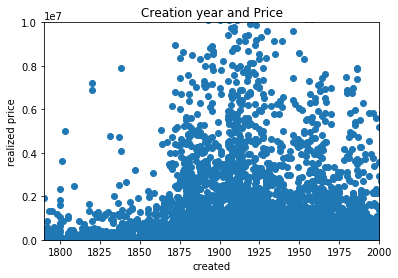

In [9]:
from matplotlib import pyplot as plt
# plot
created = df['created']
price_realized = df['price_realized']
plt.scatter(created, price_realized)
plt.title('Creation year and Price')
plt.xlabel('created')
plt.ylabel('realized price')
plt.axis([1790, 2000,0 ,10000000])
plt.show()

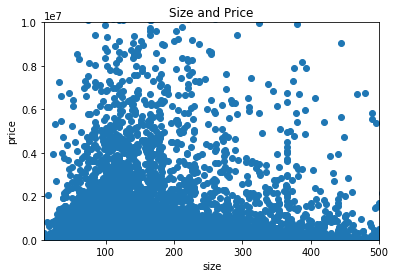

In [13]:
height = df['height']
width = df['width']

plt.axis([10, 500,0 ,10000000])
plt.scatter(width+height, df['price_realized'])
plt.title('Size and Price')
plt.xlabel('size')
plt.ylabel('price')
plt.show()

In [370]:
d_f.groupby('ExamYear').agg({'Participated': lambda x: x.value_counts()['yes'],
                             'Passed': lambda x: sum(x == 'yes'),
                             'Employed' : lambda x : sum(x), 
                             'Grade' : lambda x : sum(x) / len(x)})

,Participated,Passed,Employed,Grade
ExamYear,,,,
2007,3,2,3,74
2008,4,3,1,62
2009,1,2,1,73


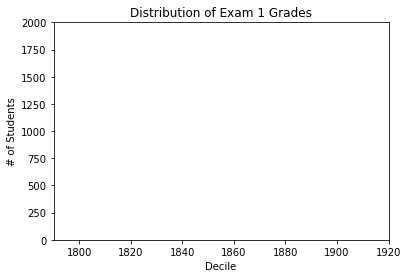

In [82]:
def make_chart_histogram():
    grades=df['created'].loc[df['created'].isin(range(1790,1920))].tolist()
    decile = lambda grade: grade // 10 * 10
    histogram = Counter(decile(grade) for grade in grades)

    plt.axis([1790, 1920, 0, 2000])                  # x-axis from -5 to 105,
                                               # y-axis from 0 to 5
    #plt.xticks([10 * i+1790 for i in range(1790,1920)])    # x-axis labels at 0, 10, ..., 100
    plt.xlabel("Decile")
    plt.ylabel("# of Students")
    plt.title("Distribution of Exam 1 Grades")
    plt.show()
make_chart_histogram()

In [93]:
df['created'].loc[df['created'].isin(range(1790,1920))].tolist()

[1877,
 1820,
 1906,
 1865,
 1885,
 1906,
 1900,
 1879,
 1911,
 1885,
 1916,
 1800,
 1893,
 1916,
 1879,
 1863,
 1880,
 1870,
 1855,
 1874,
 1860,
 1859,
 1870,
 1815,
 1796,
 1888,
 1918,
 1875,
 1891,
 1900,
 1791,
 1795,
 1907,
 1876,
 1854,
 1918,
 1849,
 1918,
 1898,
 1880,
 1848,
 1919,
 1818,
 1815,
 1811,
 1796,
 1918,
 1902,
 1830,
 1875,
 1790,
 1891,
 1913,
 1906,
 1822,
 1805,
 1823,
 1855,
 1820,
 1806,
 1830,
 1828,
 1831,
 1887,
 1918,
 1919,
 1905,
 1903,
 1877,
 1915,
 1881,
 1876,
 1877,
 1901,
 1800,
 1804,
 1790,
 1865,
 1898,
 1790,
 1810,
 1890,
 1915,
 1905,
 1888,
 1897,
 1880,
 1812,
 1790,
 1790,
 1809,
 1881,
 1917,
 1899,
 1824,
 1815,
 1816,
 1815,
 1797,
 1797,
 1900,
 1849,
 1890,
 1820,
 1918,
 1913,
 1913,
 1860,
 1800,
 1824,
 1899,
 1900,
 1888,
 1820,
 1792,
 1791,
 1800,
 1824,
 1800,
 1886,
 1887,
 1884,
 1859,
 1790,
 1890,
 1860,
 1900,
 1900,
 1800,
 1825,
 1890,
 1880,
 1890,
 1890,
 1890,
 1890,
 1846,
 1892,
 1816,
 1824,
 1818,
 1820,
 1872,

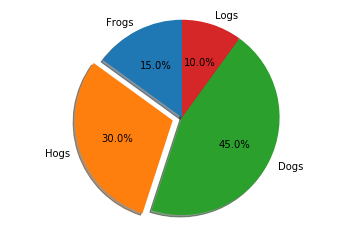

In [90]:
import matplotlib.pyplot as plt

# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = 'Frogs', 'Hogs', 'Dogs', 'Logs'
sizes = [15, 30, 45, 10]
explode = (0, 0.1, 0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [124]:
df


,artist_name,created,price_realized,count_exhibitions_in_museums,height,width
51,Paul Cézanne,1877,8647500,5,65.40,54.20
57,Frank Weston,1906,2887500,4,64.50,76.80
71,Mary Cassatt,1906,869000,2,35.60,30.50
72,Joseph Rodefer,1900,821000,0,91.40,54.00
111,Claude Monet,1879,11447500,5,61.10,81.10
112,Georges Braque,1911,10103500,5,41.00,32.90
115,Claude Monet,1885,4167500,4,60.40,81.40
118,Childe Hassam,1916,2407500,4,79.40,67.30
119,George Stubbs,1800,2336607,3,101.60,128.30
144,Paul Cezanne,1879,5502500,4,44.70,53.40


In [125]:
all_data


,artist_name,count_exhibitions_in_museums,created,description,essay,exhibited,height,html_file_path,id,image_url,...,price_realized,provenance,provenance_estate_of,sale,sale_date,sale_location,secondary_title,title,url,width
0,AN EXCEPTIONALLY,0,0,AN EXCEPTIONALLY RARE AND IMPORTANT BLUE AND W...,,,0.0,data_christies/0.html,0,http://www.christies.com/lotfinderimages/d4549...,...,0,Major General Baron H. van Hemert tot Dingshof,False,7049,,"London, King Street","YUAN DYNASTY, MID 14TH CENTURY",AN EXCEPTIONALLY RARE AND IMPORTANT BLUE AND W...,http://www.christies.com/lotfinder/lot/an-exce...,0.0
1,QI BAISHI,0,1931,QI BAISHI (1863-1957) Monkey Contemplating P...,Monkey Contemplating Peach is imbued with bles...,,27.3,data_christies/1.html,1,http://www.christies.com/lotfinderimages/D5442...,...,854928,,0,2858,,"Hong Kong, HKCEC Grand Hall",Monkey Contemplating Peach,QI BAISHI (1863-1957),http://www.christies.com/lotfinder/paintings/q...,24.1
2,QI BAISHI,0,0,QI BAISHI (1863-1957) Three Plenties Entit...,"The three plenties, a Buddha's hand citron, pe...",,24.1,data_christies/2.html,2,http://www.christies.com/lotfinderimages/D5442...,...,777442,,0,2858,,"Hong Kong, HKCEC Grand Hall",Three Plenties,QI BAISHI (1863-1957),http://www.christies.com/lotfinder/paintings/q...,24.1
3,QI BAISHI,0,0,QI BAISHI (1863-1957) Buffalo under Willow ...,The dedication of this painting refers to Mr. ...,,131.0,data_christies/3.html,3,http://www.christies.com/lotfinderimages/D5515...,...,621276,,0,2888,,Hong Kong,Buffalo under Willow,QI BAISHI (1863-1957),http://www.christies.com/lotfinder/paintings/q...,32.0
4,QI BAISHI,0,0,QI BAISHI (1863-1957) Red Knotweed Blossoms ...,"This painting was created in 1930, when Qi Bai...",,29.3,data_christies/4.html,4,http://www.christies.com/lotfinderimages/D5442...,...,467498,,0,2858,,"Hong Kong, HKCEC Grand Hall",Red Knotweed Blossoms and Dragonfly,QI BAISHI (1863-1957),http://www.christies.com/lotfinder/paintings/q...,34.4
5,Ito Jakuchu,6,0,Ito Jakuchu (1716-1800) Suibokuyu (The pleasu...,"Jakuchu painted two well-known handscrolls, th...","Kyoto National Museum, ""Jakuchu: Tokubetsu ten...",30.9,data_christies/5.html,5,http://www.christies.com/lotfinderimages/d4679...,...,441600,,0,1638,,"New York, Rockefeller Center",Suibokuyu (The pleasure of ink),Ito Jakuchu (1716-1800),http://www.christies.com/lotfinder/lot/ito-jak...,564.6
6,QI BAISHI,0,1931,QI BAISHI (1863-1957) Calligraphy - Poem by ...,,,32.8,data_christies/6.html,6,http://www.christies.com/lotfinderimages/D5442...,...,436504,,0,2858,,"Hong Kong, HKCEC Grand Hall",Calligraphy - Poem by Jin Nong,QI BAISHI (1863-1957),http://www.christies.com/lotfinder/paintings/q...,135.4
7,Ito Jakuchu,5,0,Ito Jakuchu (1716-1800) Hawk on a blossoming...,In this well-known painting in a private colle...,"""The Painting of Jakuchu,"" shown at the follow...",120.5,data_christies/7.html,7,http://www.christies.com/lotfinderimages/d5114...,...,362500,,0,2028,,"New York, Rockefeller Center",Hawk on a blossoming plum branch,Ito Jakuchu (1716-1800),http://www.christies.com/lotfinder/paintings/i...,54.7
8,Takashi Murakami,1,1999,Takashi Murakami (b. 1962) Dream of Opposite...,,"Annadale-on-Hudson, Center for Curatorial Stud...",180.0,data_christies/8.html,8,http://www.christies.com/lotfinderimages/d4099...,...,321100,"Tomio Koyama Gallery, Tokyo",False,1234,,"New York, Rockefeller Center",Dream of Opposite World,Takashi Murakami (b. 1962),http://www.christies.com/lotfinder/lot/takashi...,180.0
9,QI BAISHI,0,0,QI BAISHI (1863-1957) Taking Grandson to Sch...,Qi Baishi's painting style is inherently one o...,,35.6,data_christies/9.html,9,http://www.christies.com/lotfinderimages/D5442...,...,312527,Parting gift from the artist in Beijing around...,False,2858,,"Hong Kong, HKCEC Grand Hall",Taking Grandson to School,QI BAISHI (1863-1957),http://www.christies.com/lotfinder/paintings/q...,29.9


In [150]:
1.1+2.2

3.3000000000000003

In [151]:
1.1


1.1